In [7]:
from Download_IMERG import IMERG_download
import pandas as pd
import random
import numpy as np
import h5py
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.ticker as mticker
from metpy.plots import ctables
cmap = ctables.registry.get_colortable('precipitation')
import tropycal.tracks as tracks
import os
import datetime as datetime
from distance import distance_calculator

def get_angle(x1,y1,x2,y2):
    import math
    return math.degrees(math.atan2(y2-y1, x2-x1))

In [8]:
desired_basin = 'north_atlantic'
# Temporal smooothing?
# Two/four (even number of) IMERG files would have a center at time.
# If no smoothing desired, use a single forward time file, set to zero.
smoothing_times = 2 # delta number of times before or after to evaluate for smoothing. 2 would mean 4 total files

basin = tracks.TrackDataset(basin=desired_basin,source='hurdat',include_btk=False)
data = pd.read_csv('/Users/acheung/data/RI_Cases/RI_Events_with_SHIPS_Data_'+desired_basin+'.csv')



--> Starting to read in HURDAT2 data
--> Completed reading in HURDAT2 data (2.57 seconds)


In [3]:
storm_ids = data['Storm_ID'].unique()
storms_randomly_chosen = storm_ids[random.sample(range(len(storm_ids)), 20)]

In [4]:
storms_randomly_chosen # Not necessarily sure what plotting does for multi-RI storms

array(['AL032018', 'AL082006', 'AL122011', 'AL102000', 'AL112000',
       'AL032005', 'AL092007', 'AL092022', 'AL052019', 'AL072017',
       'AL252005', 'AL132003', 'AL132008', 'AL112009', 'AL162011',
       'AL112012', 'AL182005', 'AL082014', 'AL152008', 'AL092004'],
      dtype=object)

In [6]:
random_dataset = data.set_index('Storm_ID').loc[storms_randomly_chosen]
times_to_test = pd.to_datetime(random_dataset['Time'])

In [22]:
random_dataset.index

,Storm_Names,Time,VMAX,SHRD,SHTD,VMPI,RSST,RHLO,IR00,DTL,HSTA,HEND,RI_Number
Storm_ID,,,,,,,,,,,,,
AL032018,CHRIS,2018-07-09 00:00:00,45.0,14.0,189.0,133.0,28.1,58.0,30.0,298.0,-1 days +00:00:00,-2 days +00:00:00,1
AL032018,CHRIS,2018-07-09 06:00:00,45.0,16.5,210.0,116.0,28.1,56.0,14.0,322.0,-1 days +06:00:00,-2 days +06:00:00,1
AL032018,CHRIS,2018-07-09 12:00:00,50.0,10.0,223.0,117.0,28.1,56.0,10.0,335.0,-1 days +12:00:00,-2 days +12:00:00,1
AL032018,CHRIS,2018-07-09 18:00:00,55.0,10.2,223.0,133.0,28.0,53.0,999.0,355.0,-1 days +18:00:00,-2 days +18:00:00,1
AL032018,CHRIS,2018-07-10 00:00:00,60.0,10.0,230.0,133.0,28.0,51.0,26.0,351.0,0 days 00:00:00,-1 days +00:00:00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
AL092004,IVAN,2004-09-05 00:00:00,60.0,11.7,193.0,153.0,29.0,73.0,2.0,229.0,0 days 12:00:00,-1 days +00:00:00,1
AL092004,IVAN,2004-09-05 06:00:00,65.0,13.4,175.0,158.0,29.2,71.0,10.0,51.0,0 days 18:00:00,-1 days +06:00:00,1
AL092004,IVAN,2004-09-05 12:00:00,85.0,7.5,182.0,158.0,29.3,71.0,2.0,925.0,1 days 00:00:00,-1 days +12:00:00,1


In [27]:
random_dataset.loc['AL092022']

,Storm_Names,Time,VMAX,SHRD,SHTD,VMPI,RSST,RHLO,IR00,DTL,HSTA,HEND,RI_Number
Storm_ID,,,,,,,,,,,,,
AL092022,IAN,2022-09-24 12:00:00,40.0,11.8,182.0,148.0,29.0,72.0,2.0,350.0,-1 days +00:00:00,-3 days +06:00:00,1
AL092022,IAN,2022-09-24 18:00:00,40.0,9.0,187.0,143.0,29.0,75.0,22.0,378.0,-1 days +06:00:00,-3 days +12:00:00,1
AL092022,IAN,2022-09-25 00:00:00,40.0,4.5,155.0,149.0,29.1,74.0,2.0,349.0,-1 days +12:00:00,-3 days +18:00:00,1
AL092022,IAN,2022-09-25 06:00:00,40.0,8.0,132.0,150.0,29.1,74.0,22.0,369.0,-1 days +18:00:00,-2 days +00:00:00,1
AL092022,IAN,2022-09-25 12:00:00,40.0,10.6,151.0,152.0,29.2,75.0,6.0,365.0,0 days 00:00:00,-2 days +06:00:00,1
AL092022,IAN,2022-09-25 18:00:00,40.0,7.9,176.0,150.0,29.3,77.0,2.0,329.0,0 days 06:00:00,-2 days +12:00:00,1
AL092022,IAN,2022-09-26 00:00:00,50.0,2.0,145.0,154.0,29.4,74.0,30.0,312.0,0 days 12:00:00,-2 days +18:00:00,1
AL092022,IAN,2022-09-26 06:00:00,65.0,3.6,85.0,156.0,29.4,73.0,2.0,326.0,0 days 18:00:00,-1 days +00:00:00,1
AL092022,IAN,2022-09-26 12:00:00,70.0,6.5,88.0,160.0,29.6,74.0,30.0,311.0,1 days 00:00:00,-1 days +06:00:00,1


In [7]:
# Download times interested
IMERG_file_path_list = []
IMERG_file_path_forward_list = []
IMERG_file_path_backward_list = []
for t_i in range(len(times_to_test)):
    current_dt = times_to_test.iloc[t_i]
    if smoothing_times > 0:
        forward_now_list = []
        backward_now_list = []
        for t_wind in range(smoothing_times):
            forward_time = current_dt + (datetime.timedelta(minutes=30)*t_wind)
            backward_time = current_dt - (datetime.timedelta(minutes=30)*(t_wind + 1))
#             print(forward_time,backward_time)
            IMERG_file_path_forward = IMERG_download(forward_time.year,forward_time.month,
                                                     forward_time.day,forward_time.hour,
                                                     forward_time.minute)
            forward_now_list.append(IMERG_file_path_forward)

            IMERG_file_path_backward = IMERG_download(backward_time.year,backward_time.month,
                                                     backward_time.day,backward_time.hour,
                                                     backward_time.minute)
            backward_now_list.append(IMERG_file_path_backward)
        IMERG_file_path_backward_list.append(backward_now_list)
        IMERG_file_path_forward_list.append(forward_now_list)
            
    elif smoothing_times == 0:
        IMERG_file_path = IMERG_download(current_dt.year,current_dt.month,current_dt.day,current_dt.hour,current_dt.minute)
        IMERG_file_path_list.append(IMERG_file_path)
    

--2024-04-20 08:50:16--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2018/190/3B-HHR.MS.MRG.3IMERG.20180709-S000000-E002959.0000.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7987537 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20180709-S000000-E002959.0000.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.44M 1s
    50K .......... .......... .......... .......... ..........  1% 11.0M 1s
   100K .......... .......... .......... .......... ..........  1% 16.0M 1s
   150K .......... .......... .......... .......... ..........  2% 12.9M 1s
   200K .......... .......... .......... .......... ..........  3% 13.8M 1s
   250K .......... .......... .......... .......... ..........  3% 1

  1150K .......... .......... .......... .......... .......... 15% 22.7M 0s
  1200K .......... .......... .......... .......... .......... 15% 60.5M 0s
  1250K .......... .......... .......... .......... .......... 16% 25.9M 0s
  1300K .......... .......... .......... .......... .......... 17% 42.5M 0s
  1350K .......... .......... .......... .......... .......... 17% 25.3M 0s
  1400K .......... .......... .......... .......... .......... 18% 47.2M 0s
  1450K .......... .......... .......... .......... .......... 19% 30.1M 0s
  1500K .......... .......... .......... .......... .......... 19% 30.8M 0s
  1550K .......... .......... .......... .......... .......... 20% 56.4M 0s
  1600K .......... .......... .......... .......... .......... 20% 31.7M 0s
  1650K .......... .......... .......... .......... .......... 21% 38.6M 0s
  1700K .......... .......... .......... .......... .......... 22% 34.2M 0s
  1750K .......... .......... .......... .......... .......... 22% 25.2M 0s
  1800K ....

   200K .......... .......... .......... .......... ..........  3% 22.4M 0s
   250K .......... .......... .......... .......... ..........  3%  116M 0s
   300K .......... .......... .......... .......... ..........  4%  140M 0s
   350K .......... .......... .......... .......... ..........  5%  107M 0s
   400K .......... .......... .......... .......... ..........  5% 70.1M 0s
   450K .......... .......... .......... .......... ..........  6% 56.5M 0s
   500K .......... .......... .......... .......... ..........  7%  112M 0s
   550K .......... .......... .......... .......... ..........  7%  134M 0s
   600K .......... .......... .......... .......... ..........  8% 89.7M 0s
   650K .......... .......... .......... .......... ..........  8% 84.9M 0s
   700K .......... .......... .......... .......... ..........  9% 85.0M 0s
   750K .......... .......... .......... .......... .......... 10%  124M 0s
   800K .......... .......... .......... .......... .......... 10%  121M 0s
   850K ....

  1400K .......... .......... .......... .......... .......... 18% 49.2M 0s
  1450K .......... .......... .......... .......... .......... 19% 36.9M 0s
  1500K .......... .......... .......... .......... .......... 19% 53.6M 0s
  1550K .......... .......... .......... .......... .......... 20% 48.1M 0s
  1600K .......... .......... .......... .......... .......... 21% 33.1M 0s
  1650K .......... .......... .......... .......... .......... 21% 50.6M 0s
  1700K .......... .......... .......... .......... .......... 22% 38.1M 0s
  1750K .......... .......... .......... .......... .......... 23% 93.7M 0s
  1800K .......... .......... .......... .......... .......... 23% 47.4M 0s
  1850K .......... .......... .......... .......... .......... 24% 34.0M 0s
  1900K .......... .......... .......... .......... .......... 24% 75.0M 0s
  1950K .......... .......... .......... .......... .......... 25% 56.9M 0s
  2000K .......... .......... .......... .......... .......... 26% 39.1M 0s
  2050K ....

   150K .......... .......... .......... .......... ..........  2% 12.6M 1s
   200K .......... .......... .......... .......... ..........  3% 14.2M 1s
   250K .......... .......... .......... .......... ..........  3% 19.3M 1s
   300K .......... .......... .......... .......... ..........  4% 15.1M 1s
   350K .......... .......... .......... .......... ..........  4% 11.5M 1s
   400K .......... .......... .......... .......... ..........  5% 19.1M 1s
   450K .......... .......... .......... .......... ..........  6% 18.1M 1s
   500K .......... .......... .......... .......... ..........  6% 22.0M 1s
   550K .......... .......... .......... .......... ..........  7% 18.8M 1s
   600K .......... .......... .......... .......... ..........  8% 19.4M 0s
   650K .......... .......... .......... .......... ..........  8% 30.7M 0s
   700K .......... .......... .......... .......... ..........  9% 14.3M 0s
   750K .......... .......... .......... .......... ..........  9% 30.9M 0s
   800K ....

HTTP request sent, awaiting response... 200 OK
Length: 8069010 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20180709-S053000-E055959.0330.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.14M 1s
    50K .......... .......... .......... .......... ..........  1% 19.0M 1s
   100K .......... .......... .......... .......... ..........  1% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 17.8M 1s
   200K .......... .......... .......... .......... ..........  3% 9.88M 1s
   250K .......... .......... .......... .......... ..........  3% 17.0M 1s
   300K .......... .......... .......... .......... ..........  4% 14.4M 1s
   350K .......... .......... .......... .......... ..........  5% 14.7M 1s
   400K .......... .......... .......... .......... ..........  5% 19.8M 1s
   450K .......... .......... .......... .......... ..........  6% 16.3M 1s
   500K .......... .......... .......... .......... ..........  6% 1

HTTP request sent, awaiting response... 200 OK
Length: 8038303 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20180709-S063000-E065959.0390.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.04M 1s
    50K .......... .......... .......... .......... ..........  1% 10.6M 1s
   100K .......... .......... .......... .......... ..........  1% 9.94M 1s
   150K .......... .......... .......... .......... ..........  2% 15.4M 1s
   200K .......... .......... .......... .......... ..........  3% 9.46M 1s
   250K .......... .......... .......... .......... ..........  3% 18.1M 1s
   300K .......... .......... .......... .......... ..........  4% 13.1M 1s
   350K .......... .......... .......... .......... ..........  5% 13.0M 1s
   400K .......... .......... .......... .......... ..........  5% 18.5M 1s
   450K .......... .......... .......... .......... ..........  6% 19.7M 1s
   500K .......... .......... .......... .......... ..........  7% 1

--2024-04-20 08:50:18--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2018/190/3B-HHR.MS.MRG.3IMERG.20180709-S050000-E052959.0300.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8049821 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20180709-S050000-E052959.0300.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.68M 1s
    50K .......... .......... .......... .......... ..........  1% 20.7M 1s
   100K .......... .......... .......... .......... ..........  1% 92.4M 0s
   150K .......... .......... .......... .......... ..........  2%  128M 0s
   200K .......... .......... .......... .......... ..........  3% 25.2M 0s
   250K .......... .......... .......... .......... ..........  3%  

HTTP request sent, awaiting response... 200 OK
Length: 8079520 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20180709-S120000-E122959.0720.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.79M 1s
    50K .......... .......... .......... .......... ..........  1% 17.9M 1s
   100K .......... .......... .......... .......... ..........  1% 10.3M 1s
   150K .......... .......... .......... .......... ..........  2% 17.2M 1s
   200K .......... .......... .......... .......... ..........  3% 9.02M 1s
   250K .......... .......... .......... .......... ..........  3% 18.9M 1s
   300K .......... .......... .......... .......... ..........  4% 14.2M 1s
   350K .......... .......... .......... .......... ..........  5% 14.4M 1s
   400K .......... .......... .......... .......... ..........  5% 16.7M 1s
   450K .......... .......... .......... .......... ..........  6% 14.2M 1s
   500K .......... .......... .......... .......... ..........  6% 2

HTTP request sent, awaiting response... 200 OK
Length: 8212531 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20180709-S113000-E115959.0690.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.56M 1s
    50K .......... .......... .......... .......... ..........  1% 19.3M 1s
   100K .......... .......... .......... .......... ..........  1% 19.8M 1s
   150K .......... .......... .......... .......... ..........  2% 93.8M 0s
   200K .......... .......... .......... .......... ..........  3% 18.5M 0s
   250K .......... .......... .......... .......... ..........  3% 18.8M 0s
   300K .......... .......... .......... .......... ..........  4% 20.0M 0s
   350K .......... .......... .......... .......... ..........  4% 22.6M 0s
   400K .......... .......... .......... .......... ..........  5% 22.3M 0s
   450K .......... .......... .......... .......... ..........  6% 50.8M 0s
   500K .......... .......... .......... .......... ..........  6% 2

  1400K .......... .......... .......... .......... .......... 17% 93.2M 0s
  1450K .......... .......... .......... .......... .......... 18% 24.0M 0s
  1500K .......... .......... .......... .......... .......... 19%  114M 0s
  1550K .......... .......... .......... .......... .......... 19% 32.3M 0s
  1600K .......... .......... .......... .......... .......... 20% 39.1M 0s
  1650K .......... .......... .......... .......... .......... 20% 94.8M 0s
  1700K .......... .......... .......... .......... .......... 21% 31.9M 0s
  1750K .......... .......... .......... .......... .......... 22% 47.2M 0s
  1800K .......... .......... .......... .......... .......... 22% 48.0M 0s
  1850K .......... .......... .......... .......... .......... 23% 33.5M 0s
  1900K .......... .......... .......... .......... .......... 23%  136M 0s
  1950K .......... .......... .......... .......... .......... 24% 53.2M 0s
  2000K .......... .......... .......... .......... .......... 25% 27.0M 0s
  2050K ....

  1500K .......... .......... .......... .......... .......... 19% 83.4M 0s
  1550K .......... .......... .......... .......... .......... 19%  130M 0s
  1600K .......... .......... .......... .......... .......... 20% 23.9M 0s
  1650K .......... .......... .......... .......... .......... 21%  117M 0s
  1700K .......... .......... .......... .......... .......... 21% 49.2M 0s
  1750K .......... .......... .......... .......... .......... 22% 31.2M 0s
  1800K .......... .......... .......... .......... .......... 23%  127M 0s
  1850K .......... .......... .......... .......... .......... 23% 27.4M 0s
  1900K .......... .......... .......... .......... .......... 24% 46.5M 0s
  1950K .......... .......... .......... .......... .......... 24%  121M 0s
  2000K .......... .......... .......... .......... .......... 25% 42.5M 0s
  2050K .......... .......... .......... .......... .......... 26% 69.0M 0s
  2100K .......... .......... .......... .......... .......... 26% 50.8M 0s
  2150K ....

  1350K .......... .......... .......... .......... .......... 17%  118M 0s
  1400K .......... .......... .......... .......... .......... 17% 32.6M 0s
  1450K .......... .......... .......... .......... .......... 18% 45.9M 0s
  1500K .......... .......... .......... .......... .......... 19% 76.4M 0s
  1550K .......... .......... .......... .......... .......... 19% 33.6M 0s
  1600K .......... .......... .......... .......... .......... 20% 72.4M 0s
  1650K .......... .......... .......... .......... .......... 21% 53.5M 0s
  1700K .......... .......... .......... .......... .......... 21% 27.3M 0s
  1750K .......... .......... .......... .......... .......... 22% 53.6M 0s
  1800K .......... .......... .......... .......... .......... 22%  119M 0s
  1850K .......... .......... .......... .......... .......... 23% 33.8M 0s
  1900K .......... .......... .......... .......... .......... 24% 53.8M 0s
  1950K .......... .......... .......... .......... .......... 24% 34.2M 0s
  2000K ....

   500K .......... .......... .......... .......... ..........  6% 14.6M 1s
   550K .......... .......... .......... .......... ..........  7% 13.1M 1s
   600K .......... .......... .......... .......... ..........  8% 14.7M 1s
   650K .......... .......... .......... .......... ..........  8% 20.3M 1s
   700K .......... .......... .......... .......... ..........  9% 11.3M 1s
   750K .......... .......... .......... .......... ..........  9% 16.0M 1s
   800K .......... .......... .......... .......... .......... 10% 19.9M 1s
   850K .......... .......... .......... .......... .......... 11% 12.4M 1s
   900K .......... .......... .......... .......... .......... 11% 18.7M 1s
   950K .......... .......... .......... .......... .......... 12% 14.9M 1s
  1000K .......... .......... .......... .......... .......... 13% 14.3M 1s
  1050K .......... .......... .......... .......... .......... 13% 13.8M 1s
  1100K .......... .......... .......... .......... .......... 14% 15.1M 1s
  1150K ....

--2024-04-20 08:50:20--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2018/190/3B-HHR.MS.MRG.3IMERG.20180709-S170000-E172959.1020.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8236411 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20180709-S170000-E172959.1020.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.78M 1s
    50K .......... .......... .......... .......... ..........  1% 20.5M 1s
   100K .......... .......... .......... .......... ..........  1% 22.2M 1s
   150K .......... .......... .......... .......... ..........  2% 72.7M 0s
   200K .......... .......... .......... .......... ..........  3% 20.3M 0s
   250K .......... .......... .......... .......... ..........  3% 2

  1550K .......... .......... .......... .......... .......... 20% 37.0M 0s
  1600K .......... .......... .......... .......... .......... 20% 47.5M 0s
  1650K .......... .......... .......... .......... .......... 21% 41.3M 0s
  1700K .......... .......... .......... .......... .......... 22% 28.4M 0s
  1750K .......... .......... .......... .......... .......... 22% 37.0M 0s
  1800K .......... .......... .......... .......... .......... 23% 48.5M 0s
  1850K .......... .......... .......... .......... .......... 23% 37.1M 0s
  1900K .......... .......... .......... .......... .......... 24% 38.6M 0s
  1950K .......... .......... .......... .......... .......... 25% 57.4M 0s
  2000K .......... .......... .......... .......... .......... 25% 27.9M 0s
  2050K .......... .......... .......... .......... .......... 26% 85.4M 0s
  2100K .......... .......... .......... .......... .......... 27% 47.4M 0s
  2150K .......... .......... .......... .......... .......... 27% 33.1M 0s
  2200K ....

  1350K .......... .......... .......... .......... .......... 17% 28.2M 0s
  1400K .......... .......... .......... .......... .......... 18% 78.3M 0s
  1450K .......... .......... .......... .......... .......... 18% 27.5M 0s
  1500K .......... .......... .......... .......... .......... 19%  101M 0s
  1550K .......... .......... .......... .......... .......... 19% 31.7M 0s
  1600K .......... .......... .......... .......... .......... 20% 71.4M 0s
  1650K .......... .......... .......... .......... .......... 21% 53.9M 0s
  1700K .......... .......... .......... .......... .......... 21% 31.1M 0s
  1750K .......... .......... .......... .......... .......... 22% 65.5M 0s
  1800K .......... .......... .......... .......... .......... 22% 33.1M 0s
  1850K .......... .......... .......... .......... .......... 23%  117M 0s
  1900K .......... .......... .......... .......... .......... 24% 62.0M 0s
  1950K .......... .......... .......... .......... .......... 24% 34.0M 0s
  2000K ....

  4250K .......... .......... .......... .......... .......... 54%  120M 0s
  4300K .......... .......... .......... .......... .......... 55%  127M 0s
  4350K .......... .......... .......... .......... .......... 55% 89.3M 0s
  4400K .......... .......... .......... .......... .......... 56%  126M 0s
  4450K .......... .......... .......... .......... .......... 57%  108M 0s
  4500K .......... .......... .......... .......... .......... 57%  120M 0s
  4550K .......... .......... .......... .......... .......... 58%  102M 0s
  4600K .......... .......... .......... .......... .......... 59%  118M 0s
  4650K .......... .......... .......... .......... .......... 59%  125M 0s
  4700K .......... .......... .......... .......... .......... 60% 90.7M 0s
  4750K .......... .......... .......... .......... .......... 60%  125M 0s
  4800K .......... .......... .......... .......... .......... 61%  119M 0s
  4850K .......... .......... .......... .......... .......... 62% 83.8M 0s
  4900K ....

  2700K .......... .......... .......... .......... .......... 34% 26.3M 0s
  2750K .......... .......... .......... .......... .......... 35%  126M 0s
  2800K .......... .......... .......... .......... .......... 35% 50.4M 0s
  2850K .......... .......... .......... .......... .......... 36% 42.3M 0s
  2900K .......... .......... .......... .......... .......... 36% 44.7M 0s
  2950K .......... .......... .......... .......... .......... 37% 94.6M 0s
  3000K .......... .......... .......... .......... .......... 38% 58.8M 0s
  3050K .......... .......... .......... .......... .......... 38% 33.7M 0s
  3100K .......... .......... .......... .......... .......... 39% 75.5M 0s
  3150K .......... .......... .......... .......... .......... 40%  171M 0s
  3200K .......... .......... .......... .......... .......... 40% 30.5M 0s
  3250K .......... .......... .......... .......... .......... 41%  112M 0s
  3300K .......... .......... .......... .......... .......... 42% 82.5M 0s
  3350K ....

HTTP request sent, awaiting response... 200 OK
Length: 8051742 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20180710-S060000-E062959.0360.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 8.93M 1s
    50K .......... .......... .......... .......... ..........  1% 19.0M 1s
   100K .......... .......... .......... .......... ..........  1% 19.9M 1s
   150K .......... .......... .......... .......... ..........  2% 19.0M 1s
   200K .......... .......... .......... .......... ..........  3% 16.6M 0s
   250K .......... .......... .......... .......... ..........  3% 46.0M 0s
   300K .......... .......... .......... .......... ..........  4% 26.9M 0s
   350K .......... .......... .......... .......... ..........  5% 18.7M 0s
   400K .......... .......... .......... .......... ..........  5% 20.4M 0s
   450K .......... .......... .......... .......... ..........  6% 21.0M 0s
   500K .......... .......... .......... .......... ..........  6% 5

HTTP request sent, awaiting response... 200 OK
Length: 8147823 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20180710-S053000-E055959.0330.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.27M 1s
    50K .......... .......... .......... .......... ..........  1% 22.0M 1s
   100K .......... .......... .......... .......... ..........  1% 68.0M 0s
   150K .......... .......... .......... .......... ..........  2% 17.2M 0s
   200K .......... .......... .......... .......... ..........  3% 18.9M 0s
   250K .......... .......... .......... .......... ..........  3% 17.4M 0s
   300K .......... .......... .......... .......... ..........  4%  117M 0s
   350K .......... .......... .......... .......... ..........  5% 19.0M 0s
   400K .......... .......... .......... .......... ..........  5% 19.4M 0s
   450K .......... .......... .......... .......... ..........  6% 30.3M 0s
   500K .......... .......... .......... .......... ..........  6% 3

  5550K .......... .......... .......... .......... .......... 70%  114M 0s
  5600K .......... .......... .......... .......... .......... 71% 93.9M 0s
  5650K .......... .......... .......... .......... .......... 72% 27.6M 0s
  5700K .......... .......... .......... .......... .......... 72%  110M 0s
  5750K .......... .......... .......... .......... .......... 73% 82.7M 0s
  5800K .......... .......... .......... .......... .......... 73% 57.8M 0s
  5850K .......... .......... .......... .......... .......... 74% 46.8M 0s
  5900K .......... .......... .......... .......... .......... 75% 83.3M 0s
  5950K .......... .......... .......... .......... .......... 75% 86.3M 0s
  6000K .......... .......... .......... .......... .......... 76% 37.4M 0s
  6050K .......... .......... .......... .......... .......... 77% 61.5M 0s
  6100K .......... .......... .......... .......... .......... 77% 47.6M 0s
  6150K .......... .......... .......... .......... .......... 78% 83.9M 0s
  6200K ....

--2024-04-20 08:50:22--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2018/191/3B-HHR.MS.MRG.3IMERG.20180710-S120000-E122959.0720.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8044253 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20180710-S120000-E122959.0720.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.70M 1s
    50K .......... .......... .......... .......... ..........  1% 21.1M 1s
   100K .......... .......... .......... .......... ..........  1% 56.5M 0s
   150K .......... .......... .......... .......... ..........  2%  120M 0s
   200K .......... .......... .......... .......... ..........  3% 30.1M 0s
   250K .......... .......... .......... .......... ..........  3% 7

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8102567 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20180710-S113000-E115959.0690.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.22M 1s
    50K .......... .......... .......... .......... ..........  1% 18.1M 1s
   100K .......... .......... .......... .......... ..........  1% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 19.5M 1s
   200K .......... .......... .......... .......... ..........  3% 9.50M 1s
   250K .......... .......... .......... .......... ..........  3% 19.8M 1s
   300K .......... .......... .......... .......... ..........  4% 16.4M 1s
   350K .......... .......... .......... .......... ..........  5% 18.4M 1s


  5900K .......... .......... .......... .......... .......... 75% 94.4M 0s
  5950K .......... .......... .......... .......... .......... 75%  117M 0s
  6000K .......... .......... .......... .......... .......... 76%  124M 0s
  6050K .......... .......... .......... .......... .......... 77%  115M 0s
  6100K .......... .......... .......... .......... .......... 77% 67.8M 0s
  6150K .......... .......... .......... .......... .......... 78%  118M 0s
  6200K .......... .......... .......... .......... .......... 78%  120M 0s
  6250K .......... .......... .......... .......... .......... 79% 98.0M 0s
  6300K .......... .......... .......... .......... .......... 80%  127M 0s
  6350K .......... .......... .......... .......... .......... 80%  112M 0s
  6400K .......... .......... .......... .......... .......... 81%  127M 0s
  6450K .......... .......... .......... .......... .......... 82% 89.3M 0s
  6500K .......... .......... .......... .......... .......... 82%  127M 0s
  6550K ....

  5350K .......... .......... .......... .......... .......... 69% 89.4M 0s
  5400K .......... .......... .......... .......... .......... 70%  112M 0s
  5450K .......... .......... .......... .......... .......... 71% 92.8M 0s
  5500K .......... .......... .......... .......... .......... 71%  125M 0s
  5550K .......... .......... .......... .......... .......... 72% 85.2M 0s
  5600K .......... .......... .......... .......... .......... 73%  119M 0s
  5650K .......... .......... .......... .......... .......... 73% 80.6M 0s
  5700K .......... .......... .......... .......... .......... 74% 89.6M 0s
  5750K .......... .......... .......... .......... .......... 75% 81.1M 0s
  5800K .......... .......... .......... .......... .......... 75%  119M 0s
  5850K .......... .......... .......... .......... .......... 76% 92.4M 0s
  5900K .......... .......... .......... .......... .......... 77%  128M 0s
  5950K .......... .......... .......... .......... .......... 77% 88.9M 0s
  6000K ....

  6850K .......... .......... .......... .......... .......... 87%  114M 0s
  6900K .......... .......... .......... .......... .......... 88%  118M 0s
  6950K .......... .......... .......... .......... .......... 89% 93.6M 0s
  7000K .......... .......... .......... .......... .......... 89%  123M 0s
  7050K .......... .......... .......... .......... .......... 90%  116M 0s
  7100K .......... .......... .......... .......... .......... 91% 95.2M 0s
  7150K .......... .......... .......... .......... .......... 91%  130M 0s
  7200K .......... .......... .......... .......... .......... 92%  111M 0s
  7250K .......... .......... .......... .......... .......... 93%  123M 0s
  7300K .......... .......... .......... .......... .......... 93% 95.9M 0s
  7350K .......... .......... .......... .......... .......... 94%  118M 0s
  7400K .......... .......... .......... .......... .......... 94%  121M 0s
  7450K .......... .......... .......... .......... .......... 95% 92.7M 0s
  7500K ....

  7850K .......... .......... .......... .......... ......    100%  120M=0.1s

2024-04-20 08:50:23 (59.7 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20180710-S180000-E182959.1080.V07B.HDF5.1’ saved [8085565/8085565]

--2024-04-20 08:50:23--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2018/191/3B-HHR.MS.MRG.3IMERG.20180710-S173000-E175959.1050.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7958777 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20180710-S173000-E175959.1050.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.36M 1s
    50K .......... .......... .......... .......... ..........  1% 22.6M 1s
   100K .......... .......... .......... .......... ..........  1% 53.3M 0s
   150K .........

   400K .......... .......... .......... .......... ..........  5% 21.5M 1s
   450K .......... .......... .......... .......... ..........  6% 16.6M 1s
   500K .......... .......... .......... .......... ..........  6% 18.6M 1s
   550K .......... .......... .......... .......... ..........  7% 23.7M 0s
   600K .......... .......... .......... .......... ..........  8% 17.8M 0s
   650K .......... .......... .......... .......... ..........  8% 18.9M 0s
   700K .......... .......... .......... .......... ..........  9% 24.2M 0s
   750K .......... .......... .......... .......... .......... 10% 31.6M 0s
   800K .......... .......... .......... .......... .......... 10% 26.4M 0s
   850K .......... .......... .......... .......... .......... 11% 22.0M 0s
   900K .......... .......... .......... .......... .......... 11% 61.0M 0s
   950K .......... .......... .......... .......... .......... 12% 20.9M 0s
  1000K .......... .......... .......... .......... .......... 13% 21.4M 0s
  1050K ....

  7100K .......... .......... .......... .......... .......... 90% 86.9M 0s
  7150K .......... .......... .......... .......... .......... 91%  131M 0s
  7200K .......... .......... .......... .......... .......... 91%  129M 0s
  7250K .......... .......... .......... .......... .......... 92%  112M 0s
  7300K .......... .......... .......... .......... .......... 93%  120M 0s
  7350K .......... .......... .......... .......... .......... 93% 93.5M 0s
  7400K .......... .......... .......... .......... .......... 94%  112M 0s
  7450K .......... .......... .......... .......... .......... 95%  130M 0s
  7500K .......... .......... .......... .......... .......... 95% 93.3M 0s
  7550K .......... .......... .......... .......... .......... 96%  125M 0s
  7600K .......... .......... .......... .......... .......... 96%  112M 0s
  7650K .......... .......... .......... .......... .......... 97%  128M 0s
  7700K .......... .......... .......... .......... .......... 98% 92.9M 0s
  7750K ....

  4100K .......... .......... .......... .......... .......... 52% 77.9M 0s
  4150K .......... .......... .......... .......... .......... 53% 93.7M 0s
  4200K .......... .......... .......... .......... .......... 53%  108M 0s
  4250K .......... .......... .......... .......... .......... 54%  138M 0s
  4300K .......... .......... .......... .......... .......... 55% 89.3M 0s
  4350K .......... .......... .......... .......... .......... 55%  118M 0s
  4400K .......... .......... .......... .......... .......... 56% 90.0M 0s
  4450K .......... .......... .......... .......... .......... 57% 85.0M 0s
  4500K .......... .......... .......... .......... .......... 57%  125M 0s
  4550K .......... .......... .......... .......... .......... 58%  128M 0s
  4600K .......... .......... .......... .......... .......... 58% 82.2M 0s
  4650K .......... .......... .......... .......... .......... 59%  133M 0s
  4700K .......... .......... .......... .......... .......... 60%  106M 0s
  4750K ....

  4600K .......... .......... .......... .......... .......... 59% 80.1M 0s
  4650K .......... .......... .......... .......... .......... 60% 90.0M 0s
  4700K .......... .......... .......... .......... .......... 61% 30.1M 0s
  4750K .......... .......... .......... .......... .......... 61%  127M 0s
  4800K .......... .......... .......... .......... .......... 62% 45.6M 0s
  4850K .......... .......... .......... .......... .......... 62% 34.5M 0s
  4900K .......... .......... .......... .......... .......... 63%  149M 0s
  4950K .......... .......... .......... .......... .......... 64% 47.0M 0s
  5000K .......... .......... .......... .......... .......... 64% 35.7M 0s
  5050K .......... .......... .......... .......... .......... 65% 44.2M 0s
  5100K .......... .......... .......... .......... .......... 66%  103M 0s
  5150K .......... .......... .......... .......... .......... 66% 53.1M 0s
  5200K .......... .......... .......... .......... .......... 67% 32.8M 0s
  5250K ....

  2500K .......... .......... .......... .......... .......... 32% 60.2M 0s
  2550K .......... .......... .......... .......... .......... 33% 60.3M 0s
  2600K .......... .......... .......... .......... .......... 34% 48.1M 0s
  2650K .......... .......... .......... .......... .......... 34%  126M 0s
  2700K .......... .......... .......... .......... .......... 35% 49.2M 0s
  2750K .......... .......... .......... .......... .......... 36% 49.5M 0s
  2800K .......... .......... .......... .......... .......... 36% 80.3M 0s
  2850K .......... .......... .......... .......... .......... 37%  110M 0s
  2900K .......... .......... .......... .......... .......... 38% 49.5M 0s
  2950K .......... .......... .......... .......... .......... 38% 51.8M 0s
  3000K .......... .......... .......... .......... .......... 39%  111M 0s
  3050K .......... .......... .......... .......... .......... 39% 94.5M 0s
  3100K .......... .......... .......... .......... .......... 40% 45.9M 0s
  3150K ....

   850K .......... .......... .......... .......... .......... 11% 21.9M 0s
   900K .......... .......... .......... .......... .......... 11% 46.6M 0s
   950K .......... .......... .......... .......... .......... 12% 17.9M 0s
  1000K .......... .......... .......... .......... .......... 13% 29.2M 0s
  1050K .......... .......... .......... .......... .......... 13% 38.1M 0s
  1100K .......... .......... .......... .......... .......... 14% 21.1M 0s
  1150K .......... .......... .......... .......... .......... 15% 41.9M 0s
  1200K .......... .......... .......... .......... .......... 15% 27.6M 0s
  1250K .......... .......... .......... .......... .......... 16% 36.9M 0s
  1300K .......... .......... .......... .......... .......... 16% 22.8M 0s
  1350K .......... .......... .......... .......... .......... 17% 36.8M 0s
  1400K .......... .......... .......... .......... .......... 18% 34.6M 0s
  1450K .......... .......... .......... .......... .......... 18% 41.1M 0s
  1500K ....

   800K .......... .......... .......... .......... .......... 10% 22.3M 0s
   850K .......... .......... .......... .......... .......... 11% 40.0M 0s
   900K .......... .......... .......... .......... .......... 11% 37.5M 0s
   950K .......... .......... .......... .......... .......... 12% 32.2M 0s
  1000K .......... .......... .......... .......... .......... 13% 37.2M 0s
  1050K .......... .......... .......... .......... .......... 13% 24.6M 0s
  1100K .......... .......... .......... .......... .......... 14%  106M 0s
  1150K .......... .......... .......... .......... .......... 15% 27.4M 0s
  1200K .......... .......... .......... .......... .......... 15% 51.2M 0s
  1250K .......... .......... .......... .......... .......... 16% 23.9M 0s
  1300K .......... .......... .......... .......... .......... 17%  125M 0s
  1350K .......... .......... .......... .......... .......... 17% 22.6M 0s
  1400K .......... .......... .......... .......... .......... 18%  116M 0s
  1450K ....

  4250K .......... .......... .......... .......... .......... 53%  127M 0s
  4300K .......... .......... .......... .......... .......... 53%  116M 0s
  4350K .......... .......... .......... .......... .......... 54% 93.3M 0s
  4400K .......... .......... .......... .......... .......... 55%  122M 0s
  4450K .......... .......... .......... .......... .......... 55%  113M 0s
  4500K .......... .......... .......... .......... .......... 56% 98.8M 0s
  4550K .......... .......... .......... .......... .......... 57%  127M 0s
  4600K .......... .......... .......... .......... .......... 57%  112M 0s
  4650K .......... .......... .......... .......... .......... 58%  126M 0s
  4700K .......... .......... .......... .......... .......... 58% 93.5M 0s
  4750K .......... .......... .......... .......... .......... 59%  118M 0s
  4800K .......... .......... .......... .......... .......... 60%  121M 0s
  4850K .......... .......... .......... .......... .......... 60% 93.7M 0s
  4900K ....

  2000K .......... .......... .......... .......... .......... 26% 27.0M 0s
  2050K .......... .......... .......... .......... .......... 26% 47.6M 0s
  2100K .......... .......... .......... .......... .......... 27% 19.5M 0s
  2150K .......... .......... .......... .......... .......... 27% 25.7M 0s
  2200K .......... .......... .......... .......... .......... 28% 23.8M 0s
  2250K .......... .......... .......... .......... .......... 29% 40.1M 0s
  2300K .......... .......... .......... .......... .......... 29% 27.0M 0s
  2350K .......... .......... .......... .......... .......... 30% 22.0M 0s
  2400K .......... .......... .......... .......... .......... 31% 47.7M 0s
  2450K .......... .......... .......... .......... .......... 31% 20.2M 0s
  2500K .......... .......... .......... .......... .......... 32% 21.5M 0s
  2550K .......... .......... .......... .......... .......... 33% 75.9M 0s
  2600K .......... .......... .......... .......... .......... 33% 22.0M 0s
  2650K ....

HTTP request sent, awaiting response... 200 OK
Length: 8162837 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20060911-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.35M 1s
    50K .......... .......... .......... .......... ..........  1% 19.4M 1s
   100K .......... .......... .......... .......... ..........  1% 9.69M 1s
   150K .......... .......... .......... .......... ..........  2% 17.0M 1s
   200K .......... .......... .......... .......... ..........  3% 10.6M 1s
   250K .......... .......... .......... .......... ..........  3% 19.7M 1s
   300K .......... .......... .......... .......... ..........  4% 16.6M 1s
   350K .......... .......... .......... .......... ..........  5% 11.6M 1s
   400K .......... .......... .......... .......... ..........  5% 17.8M 1s
   450K .......... .......... .......... .......... ..........  6% 18.5M 1s
   500K .......... .......... .......... .......... ..........  6% 20.

--2024-04-20 08:50:26--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2006/254/3B-HHR.MS.MRG.3IMERG.20060911-S173000-E175959.1050.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8130542 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20060911-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.77M 1s
    50K .......... .......... .......... .......... ..........  1% 19.7M 1s
   100K .......... .......... .......... .......... ..........  1% 10.0M 1s
   150K .......... .......... .......... .......... ..........  2% 14.1M 1s
   200K .......... .......... .......... .......... ..........  3% 12.4M 1s
   250K .......... .......... .......... .......... ..........  3% 18.

--2024-04-20 08:50:26--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2006/254/3B-HHR.MS.MRG.3IMERG.20060911-S183000-E185959.1110.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8197624 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20060911-S183000-E185959.1110.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.41M 1s
    50K .......... .......... .......... .......... ..........  1% 26.2M 1s
   100K .......... .......... .......... .......... ..........  1% 55.7M 0s
   150K .......... .......... .......... .......... ..........  2% 20.2M 0s
   200K .......... .......... .......... .......... ..........  3% 19.7M 0s
   250K .......... .......... .......... .......... ..........  3% 22.

HTTP request sent, awaiting response... 200 OK
Length: 8116987 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20060911-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.75M 1s
    50K .......... .......... .......... .......... ..........  1% 20.1M 1s
   100K .......... .......... .......... .......... ..........  1% 19.8M 1s
   150K .......... .......... .......... .......... ..........  2% 20.1M 0s
   200K .......... .......... .......... .......... ..........  3% 20.1M 0s
   250K .......... .......... .......... .......... ..........  3% 21.7M 0s
   300K .......... .......... .......... .......... ..........  4% 50.6M 0s
   350K .......... .......... .......... .......... ..........  5% 18.3M 0s
   400K .......... .......... .......... .......... ..........  5% 22.3M 0s
   450K .......... .......... .......... .......... ..........  6% 28.5M 0s
   500K .......... .......... .......... .......... ..........  6% 29.

HTTP request sent, awaiting response... 200 OK
Length: 8090018 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20060912-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.68M 1s
    50K .......... .......... .......... .......... ..........  1% 10.7M 1s
   100K .......... .......... .......... .......... ..........  1% 16.7M 1s
   150K .......... .......... .......... .......... ..........  2% 11.2M 1s
   200K .......... .......... .......... .......... ..........  3% 15.8M 1s
   250K .......... .......... .......... .......... ..........  3% 11.7M 1s
   300K .......... .......... .......... .......... ..........  4% 20.5M 1s
   350K .......... .......... .......... .......... ..........  5% 15.6M 1s
   400K .......... .......... .......... .......... ..........  5% 19.7M 1s
   450K .......... .......... .......... .......... ..........  6% 18.1M 1s
   500K .......... .......... .......... .......... ..........  6% 17.

  6500K .......... .......... .......... .......... .......... 82%  117M 0s
  6550K .......... .......... .......... .......... .......... 83%  127M 0s
  6600K .......... .......... .......... .......... .......... 84% 85.4M 0s
  6650K .......... .......... .......... .......... .......... 84%  130M 0s
  6700K .......... .......... .......... .......... .......... 85% 91.9M 0s
  6750K .......... .......... .......... .......... .......... 86%  126M 0s
  6800K .......... .......... .......... .......... .......... 86%  121M 0s
  6850K .......... .......... .......... .......... .......... 87%  113M 0s
  6900K .......... .......... .......... .......... .......... 87%  130M 0s
  6950K .......... .......... .......... .......... .......... 88% 90.5M 0s
  7000K .......... .......... .......... .......... .......... 89%  123M 0s
  7050K .......... .......... .......... .......... .......... 89%  122M 0s
  7100K .......... .......... .......... .......... .......... 90% 94.4M 0s
  7150K ....

     0K .......... .......... .......... .......... ..........  0% 9.76M 1s
    50K .......... .......... .......... .......... ..........  1% 17.6M 1s
   100K .......... .......... .......... .......... ..........  1% 9.93M 1s
   150K .......... .......... .......... .......... ..........  2% 17.0M 1s
   200K .......... .......... .......... .......... ..........  3% 10.5M 1s
   250K .......... .......... .......... .......... ..........  3% 20.0M 1s
   300K .......... .......... .......... .......... ..........  4% 14.4M 1s
   350K .......... .......... .......... .......... ..........  5% 13.9M 1s
   400K .......... .......... .......... .......... ..........  5% 20.2M 1s
   450K .......... .......... .......... .......... ..........  6% 17.3M 1s
   500K .......... .......... .......... .......... ..........  6% 20.3M 0s
   550K .......... .......... .......... .......... ..........  7% 18.9M 0s
   600K .......... .......... .......... .......... ..........  8% 19.8M 0s
   650K ....

HTTP request sent, awaiting response... 200 OK
Length: 8142425 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20060911-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 10.2M 1s
    50K .......... .......... .......... .......... ..........  1% 21.9M 1s
   100K .......... .......... .......... .......... ..........  1% 48.8M 0s
   150K .......... .......... .......... .......... ..........  2% 18.7M 0s
   200K .......... .......... .......... .......... ..........  3% 17.9M 0s
   250K .......... .......... .......... .......... ..........  3% 30.2M 0s
   300K .......... .......... .......... .......... ..........  4% 23.8M 0s
   350K .......... .......... .......... .......... ..........  5% 16.6M 0s
   400K .......... .......... .......... .......... ..........  5% 83.8M 0s
   450K .......... .......... .......... .......... ..........  6% 20.1M 0s
   500K .......... .......... .......... .......... ..........  6% 24.

HTTP request sent, awaiting response... 200 OK
Length: 8295785 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20060912-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.77M 1s
    50K .......... .......... .......... .......... ..........  1% 10.5M 1s
   100K .......... .......... .......... .......... ..........  1% 16.8M 1s
   150K .......... .......... .......... .......... ..........  2% 10.5M 1s
   200K .......... .......... .......... .......... ..........  3% 10.2M 1s
   250K .......... .......... .......... .......... ..........  3% 13.6M 1s
   300K .......... .......... .......... .......... ..........  4% 10.8M 1s
   350K .......... .......... .......... .......... ..........  4% 10.2M 1s
   400K .......... .......... .......... .......... ..........  5% 13.8M 1s
   450K .......... .......... .......... .......... ..........  6% 11.9M 1s
   500K .......... .......... .......... .......... ..........  6% 15.

--2024-04-20 08:50:28--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2006/255/3B-HHR.MS.MRG.3IMERG.20060912-S053000-E055959.0330.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8425292 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20060912-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.13M 1s
    50K .......... .......... .......... .......... ..........  1% 20.8M 1s
   100K .......... .......... .......... .......... ..........  1% 89.5M 0s
   150K .......... .......... .......... .......... ..........  2%  119M 0s
   200K .......... .......... .......... .......... ..........  3% 25.7M 0s
   250K .......... .......... .......... .......... ..........  3%  13

   250K .......... .......... .......... .......... ..........  3% 22.3M 0s
   300K .......... .......... .......... .......... ..........  4% 24.6M 0s
   350K .......... .......... .......... .......... ..........  5% 22.8M 0s
   400K .......... .......... .......... .......... ..........  5% 30.0M 0s
   450K .......... .......... .......... .......... ..........  6% 26.1M 0s
   500K .......... .......... .......... .......... ..........  6% 21.8M 0s
   550K .......... .......... .......... .......... ..........  7% 50.5M 0s
   600K .......... .......... .......... .......... ..........  8% 25.5M 0s
   650K .......... .......... .......... .......... ..........  8% 21.6M 0s
   700K .......... .......... .......... .......... ..........  9% 47.8M 0s
   750K .......... .......... .......... .......... .......... 10% 20.6M 0s
   800K .......... .......... .......... .......... .......... 10% 37.9M 0s
   850K .......... .......... .......... .......... .......... 11% 32.4M 0s
   900K ....

HTTP request sent, awaiting response... 200 OK
Length: 8202367 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20060912-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.53M 1s
    50K .......... .......... .......... .......... ..........  1% 19.6M 1s
   100K .......... .......... .......... .......... ..........  1% 9.13M 1s
   150K .......... .......... .......... .......... ..........  2% 13.7M 1s
   200K .......... .......... .......... .......... ..........  3% 13.3M 1s
   250K .......... .......... .......... .......... ..........  3% 18.6M 1s
   300K .......... .......... .......... .......... ..........  4% 20.2M 1s
   350K .......... .......... .......... .......... ..........  4% 12.5M 1s
   400K .......... .......... .......... .......... ..........  5% 23.0M 1s
   450K .......... .......... .......... .......... ..........  6% 14.1M 1s
   500K .......... .......... .......... .......... ..........  6% 34.

Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8370931 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20060912-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.20M 1s
    50K .......... .......... .......... .......... ..........  1% 22.5M 1s
   100K .......... .......... .......... .......... ..........  1% 63.5M 0s
   150K .......... .......... .......... .......... ..........  2% 18.3M 0s
   200K .......... .......... .......... .......... ..........  3% 18.2M 0s
   250K .......... .......... .......... .......... ..........  3% 22.5M 0s
   300K .......... .......... .......... .......... ..........  4% 33.4M 0s
   350K .......... .......... .......... .......... ..........  4% 20.0M 0s
   400K .......... .......... .......... .......... ..........  5% 37.8M 0s
   450K .......... .......... ........

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8388144 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20060912-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.74M 1s
    50K .......... .......... .......... .......... ..........  1% 22.6M 1s
   100K .......... .......... .......... .......... ..........  1% 43.3M 0s
   150K .......... .......... .......... .......... ..........  2% 15.1M 0s
   200K .......... .......... .......... .......... ..........  3% 19.6M 0s
   250K .......... .......... .......... .......... ..........  3% 21.1M 0s
   300K .......... .......... .......... .......... ..........  4% 21.3M 0s
   350K .......... .......... .......... .......... ..........  4% 58.6M 0s
  

  5200K .......... .......... .......... .......... .......... 62%  112M 0s
  5250K .......... .......... .......... .......... .......... 63% 94.4M 0s
  5300K .......... .......... .......... .......... .......... 63% 80.7M 0s
  5350K .......... .......... .......... .......... .......... 64%  112M 0s
  5400K .......... .......... .......... .......... .......... 65%  135M 0s
  5450K .......... .......... .......... .......... .......... 65% 86.5M 0s
  5500K .......... .......... .......... .......... .......... 66%  132M 0s
  5550K .......... .......... .......... .......... .......... 66%  118M 0s
  5600K .......... .......... .......... .......... .......... 67% 69.1M 0s
  5650K .......... .......... .......... .......... .......... 68%  110M 0s
  5700K .......... .......... .......... .......... .......... 68% 94.3M 0s
  5750K .......... .......... .......... .......... .......... 69%  125M 0s
  5800K .......... .......... .......... .......... .......... 69%  129M 0s
  5850K ....

  1200K .......... .......... .......... .......... .......... 14% 31.3M 0s
  1250K .......... .......... .......... .......... .......... 15% 23.0M 0s
  1300K .......... .......... .......... .......... .......... 16% 93.9M 0s
  1350K .......... .......... .......... .......... .......... 16% 23.6M 0s
  1400K .......... .......... .......... .......... .......... 17% 53.3M 0s
  1450K .......... .......... .......... .......... .......... 17% 18.4M 0s
  1500K .......... .......... .......... .......... .......... 18% 80.1M 0s
  1550K .......... .......... .......... .......... .......... 19% 9.07M 0s
  1600K .......... .......... .......... .......... .......... 19%  224M 0s
  1650K .......... .......... .......... .......... .......... 20%  301M 0s
  1700K .......... .......... .......... .......... .......... 20% 22.6M 0s
  1750K .......... .......... .......... .......... .......... 21% 23.3M 0s
  1800K .......... .......... .......... .......... .......... 22% 79.9M 0s
  1850K ....

  6600K .......... .......... .......... .......... .......... 79% 19.9M 0s
  6650K .......... .......... .......... .......... .......... 80% 22.3M 0s
  6700K .......... .......... .......... .......... .......... 80% 42.2M 0s
  6750K .......... .......... .......... .......... .......... 81% 22.0M 0s
  6800K .......... .......... .......... .......... .......... 82% 88.1M 0s
  6850K .......... .......... .......... .......... .......... 82% 19.8M 0s
  6900K .......... .......... .......... .......... .......... 83% 56.2M 0s
  6950K .......... .......... .......... .......... .......... 83% 19.6M 0s
  7000K .......... .......... .......... .......... .......... 84%  126M 0s
  7050K .......... .......... .......... .......... .......... 85% 21.7M 0s
  7100K .......... .......... .......... .......... .......... 85% 66.1M 0s
  7150K .......... .......... .......... .......... .......... 86% 24.9M 0s
  7200K .......... .......... .......... .......... .......... 86% 21.8M 0s
  7250K ....

  8100K .......... .......... .......... .......... .......... 97% 93.8M 0s
  8150K .......... .......... .......... .......... .......... 98%  120M 0s
  8200K .......... .......... .......... .......... .......... 98%  118M 0s
  8250K .......... .......... .......... .......... .......... 99% 92.6M 0s
  8300K .......... .......... .......... .......              100%  152M=0.08s

2024-04-20 08:50:30 (96.4 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20060912-S183000-E185959.1110.V07B.HDF5’ saved [8537536/8537536]

--2024-04-20 08:50:30--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2006/255/3B-HHR.MS.MRG.3IMERG.20060912-S170000-E172959.1020.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8425825 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.

  6150K .......... .......... .......... .......... .......... 75% 91.6M 0s
  6200K .......... .......... .......... .......... .......... 75%  121M 0s
  6250K .......... .......... .......... .......... .......... 76% 79.6M 0s
  6300K .......... .......... .......... .......... .......... 77%  130M 0s
  6350K .......... .......... .......... .......... .......... 77% 83.6M 0s
  6400K .......... .......... .......... .......... .......... 78%  141M 0s
  6450K .......... .......... .......... .......... .......... 78% 89.5M 0s
  6500K .......... .......... .......... .......... .......... 79%  127M 0s
  6550K .......... .......... .......... .......... .......... 80%  126M 0s
  6600K .......... .......... .......... .......... .......... 80%  111M 0s
  6650K .......... .......... .......... .......... .......... 81%  123M 0s
  6700K .......... .......... .......... .......... .......... 82% 91.8M 0s
  6750K .......... .......... .......... .......... .......... 82%  124M 0s
  6800K ....

  5850K .......... .......... .......... .......... .......... 71% 36.1M 0s
  5900K .......... .......... .......... .......... .......... 72% 38.7M 0s
  5950K .......... .......... .......... .......... .......... 73% 21.5M 0s
  6000K .......... .......... .......... .......... .......... 73%  128M 0s
  6050K .......... .......... .......... .......... .......... 74% 23.6M 0s
  6100K .......... .......... .......... .......... .......... 75% 63.2M 0s
  6150K .......... .......... .......... .......... .......... 75% 25.3M 0s
  6200K .......... .......... .......... .......... .......... 76% 27.9M 0s
  6250K .......... .......... .......... .......... .......... 76% 47.3M 0s
  6300K .......... .......... .......... .......... .......... 77% 35.5M 0s
  6350K .......... .......... .......... .......... .......... 78% 40.6M 0s
  6400K .......... .......... .......... .......... .......... 78% 27.8M 0s
  6450K .......... .......... .......... .......... .......... 79% 48.9M 0s
  6500K ....

  3150K .......... .......... .......... .......... .......... 39% 61.0M 0s
  3200K .......... .......... .......... .......... .......... 40% 88.1M 0s
  3250K .......... .......... .......... .......... .......... 40% 57.1M 0s
  3300K .......... .......... .......... .......... .......... 41% 92.1M 0s
  3350K .......... .......... .......... .......... .......... 42% 80.1M 0s
  3400K .......... .......... .......... .......... .......... 42% 59.3M 0s
  3450K .......... .......... .......... .......... .......... 43% 98.7M 0s
  3500K .......... .......... .......... .......... .......... 43%  117M 0s
  3550K .......... .......... .......... .......... .......... 44% 81.2M 0s
  3600K .......... .......... .......... .......... .......... 45% 54.1M 0s
  3650K .......... .......... .......... .......... .......... 45% 47.0M 0s
  3700K .......... .......... .......... .......... .......... 46% 94.0M 0s
  3750K .......... .......... .......... .......... .......... 46%  128M 0s
  3800K ....

     0K .......... .......... .......... .......... ..........  0% 9.05M 1s
    50K .......... .......... .......... .......... ..........  1% 18.5M 1s
   100K .......... .......... .......... .......... ..........  1% 10.2M 1s
   150K .......... .......... .......... .......... ..........  2% 13.1M 1s
   200K .......... .......... .......... .......... ..........  3% 14.5M 1s
   250K .......... .......... .......... .......... ..........  3% 19.5M 1s
   300K .......... .......... .......... .......... ..........  4% 18.9M 1s
   350K .......... .......... .......... .......... ..........  4% 14.8M 1s
   400K .......... .......... .......... .......... ..........  5% 14.5M 1s
   450K .......... .......... .......... .......... ..........  6% 17.3M 1s
   500K .......... .......... .......... .......... ..........  6% 20.6M 1s
   550K .......... .......... .......... .......... ..........  7% 20.3M 0s
   600K .......... .......... .......... .......... ..........  7% 20.6M 0s
   650K ....

HTTP request sent, awaiting response... 200 OK
Length: 8136593 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20060913-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.99M 1s
    50K .......... .......... .......... .......... ..........  1% 21.2M 1s
   100K .......... .......... .......... .......... ..........  1% 20.4M 0s
   150K .......... .......... .......... .......... ..........  2% 49.7M 0s
   200K .......... .......... .......... .......... ..........  3% 13.9M 0s
   250K .......... .......... .......... .......... ..........  3% 25.3M 0s
   300K .......... .......... .......... .......... ..........  4% 20.5M 0s
   350K .......... .......... .......... .......... ..........  5% 21.2M 0s
   400K .......... .......... .......... .......... ..........  5% 94.1M 0s
   450K .......... .......... .......... .......... ..........  6% 21.1M 0s
   500K .......... .......... .......... .......... ..........  6% 21.

HTTP request sent, awaiting response... 200 OK
Length: 8445692 (8.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20060913-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.42M 1s
    50K .......... .......... .......... .......... ..........  1% 24.7M 1s
   100K .......... .......... .......... .......... ..........  1% 51.0M 0s
   150K .......... .......... .......... .......... ..........  2% 21.4M 0s
   200K .......... .......... .......... .......... ..........  3% 21.0M 0s
   250K .......... .......... .......... .......... ..........  3% 20.0M 0s
   300K .......... .......... .......... .......... ..........  4%  134M 0s
   350K .......... .......... .......... .......... ..........  4% 15.2M 0s
   400K .......... .......... .......... .......... ..........  5% 20.8M 0s
   450K .......... .......... .......... .......... ..........  6% 19.5M 0s
   500K .......... .......... .......... .......... ..........  6% 56.

  1150K .......... .......... .......... .......... .......... 14% 94.8M 0s
  1200K .......... .......... .......... .......... .......... 15%  120M 0s
  1250K .......... .......... .......... .......... .......... 16%  128M 0s
  1300K .......... .......... .......... .......... .......... 16% 83.4M 0s
  1350K .......... .......... .......... .......... .......... 17% 82.5M 0s
  1400K .......... .......... .......... .......... .......... 17%  132M 0s
  1450K .......... .......... .......... .......... .......... 18%  121M 0s
  1500K .......... .......... .......... .......... .......... 19% 93.9M 0s
  1550K .......... .......... .......... .......... .......... 19%  127M 0s
  1600K .......... .......... .......... .......... .......... 20%  118M 0s
  1650K .......... .......... .......... .......... .......... 21%  105M 0s
  1700K .......... .......... .......... .......... .......... 21%  105M 0s
  1750K .......... .......... .......... .......... .......... 22%  117M 0s
  1800K ....

  1650K .......... .......... .......... .......... .......... 20% 28.6M 0s
  1700K .......... .......... .......... .......... .......... 21% 32.1M 0s
  1750K .......... .......... .......... .......... .......... 21% 51.0M 0s
  1800K .......... .......... .......... .......... .......... 22% 85.5M 0s
  1850K .......... .......... .......... .......... .......... 23% 26.6M 0s
  1900K .......... .......... .......... .......... .......... 23% 56.4M 0s
  1950K .......... .......... .......... .......... .......... 24% 26.7M 0s
  2000K .......... .......... .......... .......... .......... 24% 35.8M 0s
  2050K .......... .......... .......... .......... .......... 25% 76.0M 0s
  2100K .......... .......... .......... .......... .......... 26% 42.1M 0s
  2150K .......... .......... .......... .......... .......... 26% 39.9M 0s
  2200K .......... .......... .......... .......... .......... 27% 53.3M 0s
  2250K .......... .......... .......... .......... .......... 27% 40.4M 0s
  2300K ....

  2050K .......... .......... .......... .......... .......... 25% 31.7M 0s
  2100K .......... .......... .......... .......... .......... 26% 55.0M 0s
  2150K .......... .......... .......... .......... .......... 26%  133M 0s
  2200K .......... .......... .......... .......... .......... 27% 36.8M 0s
  2250K .......... .......... .......... .......... .......... 28%  119M 0s
  2300K .......... .......... .......... .......... .......... 28% 49.0M 0s
  2350K .......... .......... .......... .......... .......... 29% 50.3M 0s
  2400K .......... .......... .......... .......... .......... 29% 69.4M 0s
  2450K .......... .......... .......... .......... .......... 30% 52.7M 0s
  2500K .......... .......... .......... .......... .......... 31% 56.1M 0s
  2550K .......... .......... .......... .......... .......... 31%  136M 0s
  2600K .......... .......... .......... .......... .......... 32% 40.8M 0s
  2650K .......... .......... .......... .......... .......... 33%  128M 0s
  2700K ....

  2200K .......... .......... .......... .......... .......... 27% 36.3M 0s
  2250K .......... .......... .......... .......... .......... 28%  121M 0s
  2300K .......... .......... .......... .......... .......... 28% 66.8M 0s
  2350K .......... .......... .......... .......... .......... 29% 30.7M 0s
  2400K .......... .......... .......... .......... .......... 30%  120M 0s
  2450K .......... .......... .......... .......... .......... 30% 85.8M 0s
  2500K .......... .......... .......... .......... .......... 31% 28.1M 0s
  2550K .......... .......... .......... .......... .......... 31%  134M 0s
  2600K .......... .......... .......... .......... .......... 32% 62.9M 0s
  2650K .......... .......... .......... .......... .......... 33%  131M 0s
  2700K .......... .......... .......... .......... .......... 33% 27.1M 0s
  2750K .......... .......... .......... .......... .......... 34%  116M 0s
  2800K .......... .......... .......... .......... .......... 34% 94.4M 0s
  2850K ....

  3900K .......... .......... .......... .......... .......... 47% 66.1M 0s
  3950K .......... .......... .......... .......... .......... 48%  125M 0s
  4000K .......... .......... .......... .......... .......... 49% 89.3M 0s
  4050K .......... .......... .......... .......... .......... 49%  104M 0s
  4100K .......... .......... .......... .......... .......... 50% 37.6M 0s
  4150K .......... .......... .......... .......... .......... 51%  128M 0s
  4200K .......... .......... .......... .......... .......... 51% 96.0M 0s
  4250K .......... .......... .......... .......... .......... 52%  111M 0s
  4300K .......... .......... .......... .......... .......... 52%  137M 0s
  4350K .......... .......... .......... .......... .......... 53% 56.4M 0s
  4400K .......... .......... .......... .......... .......... 54% 81.5M 0s
  4450K .......... .......... .......... .......... .......... 54% 87.6M 0s
  4500K .......... .......... .......... .......... .......... 55%  137M 0s
  4550K ....

  6000K .......... .......... .......... .......... .......... 74% 14.1M 0s
  6050K .......... .......... .......... .......... .......... 75%  238M 0s
  6100K .......... .......... .......... .......... .......... 75%  229M 0s
  6150K .......... .......... .......... .......... .......... 76%  218M 0s
  6200K .......... .......... .......... .......... .......... 77%  194M 0s
  6250K .......... .......... .......... .......... .......... 77%  288M 0s
  6300K .......... .......... .......... .......... .......... 78%  212M 0s
  6350K .......... .......... .......... .......... .......... 78%  197M 0s
  6400K .......... .......... .......... .......... .......... 79%  213M 0s
  6450K .......... .......... .......... .......... .......... 80%  235M 0s
  6500K .......... .......... .......... .......... .......... 80%  248M 0s
  6550K .......... .......... .......... .......... .......... 81%  263M 0s
  6600K .......... .......... .......... .......... .......... 82% 55.4M 0s
  6650K ....

  4300K .......... .......... .......... .......... .......... 52% 43.2M 0s
  4350K .......... .......... .......... .......... .......... 53% 63.9M 0s
  4400K .......... .......... .......... .......... .......... 53%  125M 0s
  4450K .......... .......... .......... .......... .......... 54%  114M 0s
  4500K .......... .......... .......... .......... .......... 55% 98.1M 0s
  4550K .......... .......... .......... .......... .......... 55% 76.9M 0s
  4600K .......... .......... .......... .......... .......... 56% 81.9M 0s
  4650K .......... .......... .......... .......... .......... 56% 66.7M 0s
  4700K .......... .......... .......... .......... .......... 57%  121M 0s
  4750K .......... .......... .......... .......... .......... 58%  123M 0s
  4800K .......... .......... .......... .......... .......... 58%  123M 0s
  4850K .......... .......... .......... .......... .......... 59% 38.6M 0s
  4900K .......... .......... .......... .......... .......... 60%  118M 0s
  4950K ....

  1500K .......... .......... .......... .......... .......... 18% 29.4M 0s
  1550K .......... .......... .......... .......... .......... 19% 49.9M 0s
  1600K .......... .......... .......... .......... .......... 20% 30.2M 0s
  1650K .......... .......... .......... .......... .......... 20% 35.3M 0s
  1700K .......... .......... .......... .......... .......... 21% 29.8M 0s
  1750K .......... .......... .......... .......... .......... 21% 44.2M 0s
  1800K .......... .......... .......... .......... .......... 22% 38.8M 0s
  1850K .......... .......... .......... .......... .......... 23% 41.7M 0s
  1900K .......... .......... .......... .......... .......... 23% 28.5M 0s
  1950K .......... .......... .......... .......... .......... 24%  103M 0s
  2000K .......... .......... .......... .......... .......... 24% 38.9M 0s
  2050K .......... .......... .......... .......... .......... 25% 41.0M 0s
  2100K .......... .......... .......... .......... .......... 26% 65.2M 0s
  2150K ....

  1450K .......... .......... .......... .......... .......... 18% 20.0M 0s
  1500K .......... .......... .......... .......... .......... 18%  109M 0s
  1550K .......... .......... .......... .......... .......... 19% 24.0M 0s
  1600K .......... .......... .......... .......... .......... 20% 85.3M 0s
  1650K .......... .......... .......... .......... .......... 20% 26.0M 0s
  1700K .......... .......... .......... .......... .......... 21% 82.3M 0s
  1750K .......... .......... .......... .......... .......... 21% 24.6M 0s
  1800K .......... .......... .......... .......... .......... 22% 63.9M 0s
  1850K .......... .......... .......... .......... .......... 23% 38.1M 0s
  1900K .......... .......... .......... .......... .......... 23% 63.3M 0s
  1950K .......... .......... .......... .......... .......... 24% 28.0M 0s
  2000K .......... .......... .......... .......... .......... 25% 39.7M 0s
  2050K .......... .......... .......... .......... .......... 25% 63.6M 0s
  2100K ....

   850K .......... .......... .......... .......... .......... 11% 21.6M 0s
   900K .......... .......... .......... .......... .......... 11% 86.6M 0s
   950K .......... .......... .......... .......... .......... 12% 20.8M 0s
  1000K .......... .......... .......... .......... .......... 12%  137M 0s
  1050K .......... .......... .......... .......... .......... 13% 28.5M 0s
  1100K .......... .......... .......... .......... .......... 14% 34.0M 0s
  1150K .......... .......... .......... .......... .......... 14% 5.55M 0s
  1200K .......... .......... .......... .......... .......... 15%  213M 0s
  1250K .......... .......... .......... .......... .......... 16%  263M 0s
  1300K .......... .......... .......... .......... .......... 16% 51.1M 0s
  1350K .......... .......... .......... .......... .......... 17% 21.0M 0s
  1400K .......... .......... .......... .......... .......... 17% 21.5M 0s
  1450K .......... .......... .......... .......... .......... 18% 46.2M 0s
  1500K ....

  7800K .......... .......... .......... .......... .......... 96% 41.0M 0s
  7850K .......... .......... .......... .......... .......... 97% 26.9M 0s
  7900K .......... .......... .......... .......... .......... 98%  124M 0s
  7950K .......... .......... .......... .......... .......... 98% 25.7M 0s
  8000K .......... .......... .......... .......... .......... 99% 80.2M 0s
  8050K .......... .......... .......... .......... .......... 99% 36.2M 0s
  8100K .........                                             100% 24.4M=0.2s

2024-04-20 08:50:34 (32.3 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20060913-S170000-E172959.1020.V07B.HDF5’ saved [8304629/8304629]

--2024-04-20 08:50:34--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2006/257/3B-HHR.MS.MRG.3IMERG.20060914-S000000-E002959.0000.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.go

  1350K .......... .......... .......... .......... .......... 17% 27.1M 0s
  1400K .......... .......... .......... .......... .......... 18% 46.0M 0s
  1450K .......... .......... .......... .......... .......... 18% 20.9M 0s
  1500K .......... .......... .......... .......... .......... 19% 57.0M 0s
  1550K .......... .......... .......... .......... .......... 20% 41.9M 0s
  1600K .......... .......... .......... .......... .......... 20% 29.9M 0s
  1650K .......... .......... .......... .......... .......... 21% 26.7M 0s
  1700K .......... .......... .......... .......... .......... 22% 24.0M 0s
  1750K .......... .......... .......... .......... .......... 22% 88.9M 0s
  1800K .......... .......... .......... .......... .......... 23% 80.1M 0s
  1850K .......... .......... .......... .......... .......... 23% 26.6M 0s
  1900K .......... .......... .......... .......... .......... 24% 54.3M 0s
  1950K .......... .......... .......... .......... .......... 25% 20.1M 0s
  2000K ....

  5000K .......... .......... .......... .......... .......... 63%  136M 0s
  5050K .......... .......... .......... .......... .......... 64%  133M 0s
  5100K .......... .......... .......... .......... .......... 65% 93.5M 0s
  5150K .......... .......... .......... .......... .......... 65%  126M 0s
  5200K .......... .......... .......... .......... .......... 66%  112M 0s
  5250K .......... .......... .......... .......... .......... 67% 68.8M 0s
  5300K .......... .......... .......... .......... .......... 67%  118M 0s
  5350K .......... .......... .......... .......... .......... 68% 83.6M 0s
  5400K .......... .......... .......... .......... .......... 68%  129M 0s
  5450K .......... .......... .......... .......... .......... 69% 63.8M 0s
  5500K .......... .......... .......... .......... .......... 70%  126M 0s
  5550K .......... .......... .......... .......... .......... 70% 89.3M 0s
  5600K .......... .......... .......... .......... .......... 71%  129M 0s
  5650K ....

  3350K .......... .......... .......... .......... .......... 42% 34.4M 0s
  3400K .......... .......... .......... .......... .......... 42% 48.3M 0s
  3450K .......... .......... .......... .......... .......... 43% 33.6M 0s
  3500K .......... .......... .......... .......... .......... 44% 80.3M 0s
  3550K .......... .......... .......... .......... .......... 44% 32.1M 0s
  3600K .......... .......... .......... .......... .......... 45% 47.1M 0s
  3650K .......... .......... .......... .......... .......... 46% 37.8M 0s
  3700K .......... .......... .......... .......... .......... 46% 36.5M 0s
  3750K .......... .......... .......... .......... .......... 47% 65.9M 0s
  3800K .......... .......... .......... .......... .......... 47% 16.6M 0s
  3850K .......... .......... .......... .......... .......... 48% 9.88M 0s
  3900K .......... .......... .......... .......... .......... 49% 74.8M 0s
  3950K .......... .......... .......... .......... .......... 49%  210M 0s
  4000K ....

HTTP request sent, awaiting response... 200 OK
Length: 8313678 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110903-S233000-E235959.1410.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 10.2M 1s
    50K .......... .......... .......... .......... ..........  1% 20.6M 1s
   100K .......... .......... .......... .......... ..........  1% 82.4M 0s
   150K .......... .......... .......... .......... ..........  2% 20.8M 0s
   200K .......... .......... .......... .......... ..........  3% 20.4M 0s
   250K .......... .......... .......... .......... ..........  3% 22.0M 0s
   300K .......... .......... .......... .......... ..........  4% 73.4M 0s
   350K .......... .......... .......... .......... ..........  4% 19.4M 0s
   400K .......... .......... .......... .......... ..........  5% 22.4M 0s
   450K .......... .......... .......... .......... ..........  6% 22.4M 0s
   500K .......... .......... .......... .......... ..........  6% 7

  1750K .......... .......... .......... .......... .......... 22%  126M 0s
  1800K .......... .......... .......... .......... .......... 23%  126M 0s
  1850K .......... .......... .......... .......... .......... 23%  111M 0s
  1900K .......... .......... .......... .......... .......... 24%  122M 0s
  1950K .......... .......... .......... .......... .......... 24% 97.5M 0s
  2000K .......... .......... .......... .......... .......... 25%  111M 0s
  2050K .......... .......... .......... .......... .......... 26%  127M 0s
  2100K .......... .......... .......... .......... .......... 26% 93.1M 0s
  2150K .......... .......... .......... .......... .......... 27%  123M 0s
  2200K .......... .......... .......... .......... .......... 27%  118M 0s
  2250K .......... .......... .......... .......... .......... 28%  118M 0s
  2300K .......... .......... .......... .......... .......... 29% 97.4M 0s
  2350K .......... .......... .......... .......... .......... 29%  118M 0s
  2400K ....

HTTP request sent, awaiting response... 200 OK
Length: 8261141 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110903-S230000-E232959.1380.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 10.5M 1s
    50K .......... .......... .......... .......... ..........  1% 24.0M 1s
   100K .......... .......... .......... .......... ..........  1% 50.6M 0s
   150K .......... .......... .......... .......... ..........  2%  112M 0s
   200K .......... .......... .......... .......... ..........  3% 24.4M 0s
   250K .......... .......... .......... .......... ..........  3%  124M 0s
   300K .......... .......... .......... .......... ..........  4%  137M 0s
   350K .......... .......... .......... .......... ..........  4% 90.3M 0s
   400K .......... .......... .......... .......... ..........  5% 43.5M 0s
   450K .......... .......... .......... .......... ..........  6% 66.3M 0s
   500K .......... .......... .......... .......... ..........  6%  

HTTP request sent, awaiting response... 200 OK
Length: 8009804 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110904-S060000-E062959.0360.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.00M 1s
    50K .......... .......... .......... .......... ..........  1% 10.2M 1s
   100K .......... .......... .......... .......... ..........  1% 10.5M 1s
   150K .......... .......... .......... .......... ..........  2% 16.8M 1s
   200K .......... .......... .......... .......... ..........  3% 13.2M 1s
   250K .......... .......... .......... .......... ..........  3% 13.0M 1s
   300K .......... .......... .......... .......... ..........  4% 20.2M 1s
   350K .......... .......... .......... .......... ..........  5% 15.2M 1s
   400K .......... .......... .......... .......... ..........  5% 18.8M 1s
   450K .......... .......... .......... .......... ..........  6% 12.9M 1s
   500K .......... .......... .......... .......... ..........  7% 4

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8070711 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110904-S053000-E055959.0330.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.03M 1s
    50K .......... .......... .......... .......... ..........  1% 10.1M 1s
   100K .......... .......... .......... .......... ..........  1% 11.6M 1s
   150K .......... .......... .......... .......... ..........  2% 15.4M 1s
   200K .......... .......... .......... .......... ..........  3% 17.3M 1s
   250K .......... .......... .......... .......... ..........  3% 9.70M 1s
   300K .......... .......... .......... .......... ..........  4% 18.7M 1s
   350K .......... .......... .......... .......... ..........  5% 10.0M 1s


--2024-04-20 08:50:37--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2011/247/3B-HHR.MS.MRG.3IMERG.20110904-S063000-E065959.0390.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8086098 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110904-S063000-E065959.0390.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.26M 1s
    50K .......... .......... .......... .......... ..........  1% 11.7M 1s
   100K .......... .......... .......... .......... ..........  1% 14.3M 1s
   150K .......... .......... .......... .......... ..........  2% 10.6M 1s
   200K .......... .......... .......... .......... ..........  3% 14.0M 1s
   250K .......... .......... .......... .......... ..........  3% 1

  6850K .......... .......... .......... .......... .......... 87% 90.4M 0s
  6900K .......... .......... .......... .......... .......... 88%  129M 0s
  6950K .......... .......... .......... .......... .......... 88%  109M 0s
  7000K .......... .......... .......... .......... .......... 89%  127M 0s
  7050K .......... .......... .......... .......... .......... 89% 93.1M 0s
  7100K .......... .......... .......... .......... .......... 90%  117M 0s
  7150K .......... .......... .......... .......... .......... 91%  129M 0s
  7200K .......... .......... .......... .......... .......... 91% 89.7M 0s
  7250K .......... .......... .......... .......... .......... 92%  126M 0s
  7300K .......... .......... .......... .......... .......... 93%  120M 0s
  7350K .......... .......... .......... .......... .......... 93%  117M 0s
  7400K .......... .......... .......... .......... .......... 94%  126M 0s
  7450K .......... .......... .......... .......... .......... 94% 90.9M 0s
  7500K ....

  6700K .......... .......... .......... .......... .......... 84% 59.7M 0s
  6750K .......... .......... .......... .......... .......... 85% 29.0M 0s
  6800K .......... .......... .......... .......... .......... 85% 59.7M 0s
  6850K .......... .......... .......... .......... .......... 86% 25.6M 0s
  6900K .......... .......... .......... .......... .......... 87% 35.8M 0s
  6950K .......... .......... .......... .......... .......... 87% 34.7M 0s
  7000K .......... .......... .......... .......... .......... 88% 88.6M 0s
  7050K .......... .......... .......... .......... .......... 89% 26.0M 0s
  7100K .......... .......... .......... .......... .......... 89% 39.7M 0s
  7150K .......... .......... .......... .......... .......... 90% 40.1M 0s
  7200K .......... .......... .......... .......... .......... 90% 31.0M 0s
  7250K .......... .......... .......... .......... .......... 91% 62.1M 0s
  7300K .......... .......... .......... .......... .......... 92% 26.9M 0s
  7350K ....

HTTP request sent, awaiting response... 200 OK
Length: 8280145 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110904-S113000-E115959.0690.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.09M 1s
    50K .......... .......... .......... .......... ..........  1% 20.8M 1s
   100K .......... .......... .......... .......... ..........  1% 59.5M 0s
   150K .......... .......... .......... .......... ..........  2% 19.0M 0s
   200K .......... .......... .......... .......... ..........  3% 20.6M 0s
   250K .......... .......... .......... .......... ..........  3% 23.1M 0s
   300K .......... .......... .......... .......... ..........  4% 63.1M 0s
   350K .......... .......... .......... .......... ..........  4% 18.0M 0s
   400K .......... .......... .......... .......... ..........  5% 26.9M 0s
   450K .......... .......... .......... .......... ..........  6% 24.7M 0s
   500K .......... .......... .......... .......... ..........  6% 3

   550K .......... .......... .......... .......... ..........  7%  128M 0s
   600K .......... .......... .......... .......... ..........  8% 89.8M 0s
   650K .......... .......... .......... .......... ..........  8%  127M 0s
   700K .......... .......... .......... .......... ..........  9%  110M 0s
   750K .......... .......... .......... .......... ..........  9%  127M 0s
   800K .......... .......... .......... .......... .......... 10% 93.8M 0s
   850K .......... .......... .......... .......... .......... 11% 85.1M 0s
   900K .......... .......... .......... .......... .......... 11%  128M 0s
   950K .......... .......... .......... .......... .......... 12%  116M 0s
  1000K .......... .......... .......... .......... .......... 13%  120M 0s
  1050K .......... .......... .......... .......... .......... 13%  126M 0s
  1100K .......... .......... .......... .......... .......... 14% 90.3M 0s
  1150K .......... .......... .......... .......... .......... 14%  124M 0s
  1200K ....

  2600K .......... .......... .......... .......... .......... 33% 93.8M 0s
  2650K .......... .......... .......... .......... .......... 34% 30.0M 0s
  2700K .......... .......... .......... .......... .......... 35% 99.0M 0s
  2750K .......... .......... .......... .......... .......... 35% 51.4M 0s
  2800K .......... .......... .......... .......... .......... 36%  117M 0s
  2850K .......... .......... .......... .......... .......... 37% 63.7M 0s
  2900K .......... .......... .......... .......... .......... 37% 41.4M 0s
  2950K .......... .......... .......... .......... .......... 38% 86.4M 0s
  3000K .......... .......... .......... .......... .......... 38% 63.7M 0s
  3050K .......... .......... .......... .......... .......... 39%  111M 0s
  3100K .......... .......... .......... .......... .......... 40% 44.4M 0s
  3150K .......... .......... .......... .......... .......... 40%  124M 0s
  3200K .......... .......... .......... .......... .......... 41% 68.1M 0s
  3250K ....

   950K .......... .......... .......... .......... .......... 12% 17.9M 1s
  1000K .......... .......... .......... .......... .......... 12% 18.9M 1s
  1050K .......... .......... .......... .......... .......... 13% 18.9M 1s
  1100K .......... .......... .......... .......... .......... 14% 19.6M 1s
  1150K .......... .......... .......... .......... .......... 14% 19.8M 0s
  1200K .......... .......... .......... .......... .......... 15% 20.2M 0s
  1250K .......... .......... .......... .......... .......... 16% 19.8M 0s
  1300K .......... .......... .......... .......... .......... 16% 19.5M 0s
  1350K .......... .......... .......... .......... .......... 17% 18.5M 0s
  1400K .......... .......... .......... .......... .......... 17% 19.0M 0s
  1450K .......... .......... .......... .......... .......... 18% 17.8M 0s
  1500K .......... .......... .......... .......... .......... 19% 19.5M 0s
  1550K .......... .......... .......... .......... .......... 19% 21.1M 0s
  1600K ....

  3400K .......... .......... .......... .......... .......... 42% 50.2M 0s
  3450K .......... .......... .......... .......... .......... 43% 92.3M 0s
  3500K .......... .......... .......... .......... .......... 43% 72.1M 0s
  3550K .......... .......... .......... .......... .......... 44% 49.2M 0s
  3600K .......... .......... .......... .......... .......... 44%  109M 0s
  3650K .......... .......... .......... .......... .......... 45%  130M 0s
  3700K .......... .......... .......... .......... .......... 46% 59.2M 0s
  3750K .......... .......... .......... .......... .......... 46% 49.7M 0s
  3800K .......... .......... .......... .......... .......... 47%  122M 0s
  3850K .......... .......... .......... .......... .......... 47% 96.2M 0s
  3900K .......... .......... .......... .......... .......... 48% 67.4M 0s
  3950K .......... .......... .......... .......... .......... 49% 51.4M 0s
  4000K .......... .......... .......... .......... .......... 49%  133M 0s
  4050K ....

  2050K .......... .......... .......... .......... .......... 26% 28.4M 0s
  2100K .......... .......... .......... .......... .......... 26% 19.2M 0s
  2150K .......... .......... .......... .......... .......... 27% 23.1M 0s
  2200K .......... .......... .......... .......... .......... 27% 39.3M 0s
  2250K .......... .......... .......... .......... .......... 28% 19.1M 0s
  2300K .......... .......... .......... .......... .......... 29% 36.0M 0s
  2350K .......... .......... .......... .......... .......... 29% 21.8M 0s
  2400K .......... .......... .......... .......... .......... 30% 20.7M 0s
  2450K .......... .......... .......... .......... .......... 31% 21.9M 0s
  2500K .......... .......... .......... .......... .......... 31% 51.6M 0s
  2550K .......... .......... .......... .......... .......... 32% 22.3M 0s
  2600K .......... .......... .......... .......... .......... 32% 25.5M 0s
  2650K .......... .......... .......... .......... .......... 33% 29.8M 0s
  2700K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8356225 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110904-S170000-E172959.1020.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.82M 1s
    50K .......... .......... .......... .......... ..........  1% 22.2M 1s
   100K .......... .......... .......... .......... ..........  1% 62.9M 0s
   150K .......... .......... .......... .......... ..........  2% 26.2M 0s
   200K .......... .......... .......... .......... ..........  3% 62.5M 0s
   250K .......... .......... .......... .......... ..........  3%  125M 0s
   300K .......... .......... .......... .......... ..........  4%  130M 0s
   350K .......... .......... .......... .......... ..........  4% 49.3M 0s


HTTP request sent, awaiting response... 200 OK
Length: 8194441 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110905-S000000-E002959.0000.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.38M 1s
    50K .......... .......... .......... .......... ..........  1% 20.9M 1s
   100K .......... .......... .......... .......... ..........  1% 70.9M 0s
   150K .......... .......... .......... .......... ..........  2%  103M 0s
   200K .......... .......... .......... .......... ..........  3% 21.5M 0s
   250K .......... .......... .......... .......... ..........  3%  132M 0s
   300K .......... .......... .......... .......... ..........  4% 23.9M 0s
   350K .......... .......... .......... .......... ..........  4%  137M 0s
   400K .......... .......... .......... .......... ..........  5% 54.9M 0s
   450K .......... .......... .......... .......... ..........  6% 30.8M 0s
   500K .......... .......... .......... .......... ..........  6% 5

  2650K .......... .......... .......... .......... .......... 33%  127M 0s
  2700K .......... .......... .......... .......... .......... 34% 89.4M 0s
  2750K .......... .......... .......... .......... .......... 34%  113M 0s
  2800K .......... .......... .......... .......... .......... 35%  119M 0s
  2850K .......... .......... .......... .......... .......... 36% 96.0M 0s
  2900K .......... .......... .......... .......... .......... 36%  128M 0s
  2950K .......... .......... .......... .......... .......... 37%  119M 0s
  3000K .......... .......... .......... .......... .......... 38%  113M 0s
  3050K .......... .......... .......... .......... .......... 38%  132M 0s
  3100K .......... .......... .......... .......... .......... 39% 89.3M 0s
  3150K .......... .......... .......... .......... .......... 39%  129M 0s
  3200K .......... .......... .......... .......... .......... 40% 89.2M 0s
  3250K .......... .......... .......... .......... .......... 41%  125M 0s
  3300K ....

  5250K .......... .......... .......... .......... .......... 66%  118M 0s
  5300K .......... .......... .......... .......... .......... 66% 85.7M 0s
  5350K .......... .......... .......... .......... .......... 67% 82.9M 0s
  5400K .......... .......... .......... .......... .......... 68%  128M 0s
  5450K .......... .......... .......... .......... .......... 68% 89.5M 0s
  5500K .......... .......... .......... .......... .......... 69%  127M 0s
  5550K .......... .......... .......... .......... .......... 70%  113M 0s
  5600K .......... .......... .......... .......... .......... 70%  125M 0s
  5650K .......... .......... .......... .......... .......... 71% 92.5M 0s
  5700K .......... .......... .......... .......... .......... 71%  121M 0s
  5750K .......... .......... .......... .......... .......... 72% 88.7M 0s
  5800K .......... .......... .......... .......... .......... 73%  128M 0s
  5850K .......... .......... .......... .......... .......... 73%  112M 0s
  5900K ....

--2024-04-20 08:50:40--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2011/248/3B-HHR.MS.MRG.3IMERG.20110905-S060000-E062959.0360.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7988734 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110905-S060000-E062959.0360.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.49M 1s
    50K .......... .......... .......... .......... ..........  1% 16.2M 1s
   100K .......... .......... .......... .......... ..........  1% 10.5M 1s
   150K .......... .......... .......... .......... ..........  2% 17.3M 1s
   200K .......... .......... .......... .......... ..........  3% 10.6M 1s
   250K .......... .......... .......... .......... ..........  3% 1

  7150K .......... .......... .......... .......... .......... 92%  120M 0s
  7200K .......... .......... .......... .......... .......... 92% 93.5M 0s
  7250K .......... .......... .......... .......... .......... 93%  116M 0s
  7300K .......... .......... .......... .......... .......... 94%  126M 0s
  7350K .......... .......... .......... .......... .......... 94% 89.9M 0s
  7400K .......... .......... .......... .......... .......... 95%  129M 0s
  7450K .......... .......... .......... .......... .......... 96%  110M 0s
  7500K .......... .......... .......... .......... .......... 96%  128M 0s
  7550K .......... .......... .......... .......... .......... 97%  121M 0s
  7600K .......... .......... .......... .......... .......... 98% 92.1M 0s
  7650K .......... .......... .......... .......... .......... 98%  125M 0s
  7700K .......... .......... .......... .......... .......... 99% 90.7M 0s
  7750K .......... .......... .......... .......... .......... 99%  130M 0s
  7800K .   

--2024-04-20 08:50:41--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2011/248/3B-HHR.MS.MRG.3IMERG.20110905-S050000-E052959.0300.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8117191 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110905-S050000-E052959.0300.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.43M 1s
    50K .......... .......... .......... .......... ..........  1% 23.9M 1s
   100K .......... .......... .......... .......... ..........  1% 67.2M 0s
   150K .......... .......... .......... .......... ..........  2%  127M 0s
   200K .......... .......... .......... .......... ..........  3% 25.7M 0s
   250K .......... .......... .......... .......... ..........  3%  

   100K .......... .......... .......... .......... ..........  1% 20.3M 1s
   150K .......... .......... .......... .......... ..........  2% 58.6M 0s
   200K .......... .......... .......... .......... ..........  3% 19.9M 0s
   250K .......... .......... .......... .......... ..........  3% 18.9M 0s
   300K .......... .......... .......... .......... ..........  4% 20.9M 0s
   350K .......... .......... .......... .......... ..........  5% 86.1M 0s
   400K .......... .......... .......... .......... ..........  5% 20.2M 0s
   450K .......... .......... .......... .......... ..........  6% 21.7M 0s
   500K .......... .......... .......... .......... ..........  6% 41.0M 0s
   550K .......... .......... .......... .......... ..........  7% 29.5M 0s
   600K .......... .......... .......... .......... ..........  8% 20.8M 0s
   650K .......... .......... .......... .......... ..........  8% 44.3M 0s
   700K .......... .......... .......... .......... ..........  9% 30.0M 0s
   750K ....

  7600K .......... .......... .......... .......... .......... 97% 24.2M 0s
  7650K .......... .......... .......... .......... .......... 97%  125M 0s
  7700K .......... .......... .......... .......... .......... 98% 34.1M 0s
  7750K .......... .......... .......... .......... .......... 99% 41.3M 0s
  7800K .......... .......... .......... .......... .......... 99%  111M 0s
  7850K .......... ..........                                 100% 99.0M=0.2s

2024-04-20 08:50:41 (35.8 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20110905-S120000-E122959.0720.V07B.HDF5.1’ saved [8059155/8059155]

--2024-04-20 08:50:41--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2011/248/3B-HHR.MS.MRG.3IMERG.20110905-S113000-E115959.0690.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response.

  2800K .......... .......... .......... .......... .......... 35% 55.6M 0s
  2850K .......... .......... .......... .......... .......... 36% 80.0M 0s
  2900K .......... .......... .......... .......... .......... 36%  152M 0s
  2950K .......... .......... .......... .......... .......... 37% 44.4M 0s
  3000K .......... .......... .......... .......... .......... 37% 51.4M 0s
  3050K .......... .......... .......... .......... .......... 38%  118M 0s
  3100K .......... .......... .......... .......... .......... 39% 66.2M 0s
  3150K .......... .......... .......... .......... .......... 39%  117M 0s
  3200K .......... .......... .......... .......... .......... 40% 39.7M 0s
  3250K .......... .......... .......... .......... .......... 41%  128M 0s
  3300K .......... .......... .......... .......... .......... 41% 73.4M 0s
  3350K .......... .......... .......... .......... .......... 42% 63.5M 0s
  3400K .......... .......... .......... .......... .......... 42% 75.1M 0s
  3450K ....

  1550K .......... .......... .......... .......... .......... 20% 87.0M 0s
  1600K .......... .......... .......... .......... .......... 20% 26.1M 0s
  1650K .......... .......... .......... .......... .......... 21% 61.6M 0s
  1700K .......... .......... .......... .......... .......... 22% 26.4M 0s
  1750K .......... .......... .......... .......... .......... 22% 51.2M 0s
  1800K .......... .......... .......... .......... .......... 23% 34.0M 0s
  1850K .......... .......... .......... .......... .......... 23% 45.1M 0s
  1900K .......... .......... .......... .......... .......... 24% 53.5M 0s
  1950K .......... .......... .......... .......... .......... 25% 28.0M 0s
  2000K .......... .......... .......... .......... .......... 25% 48.6M 0s
  2050K .......... .......... .......... .......... .......... 26% 57.4M 0s
  2100K .......... .......... .......... .......... .......... 27% 27.8M 0s
  2150K .......... .......... .......... .......... .......... 27% 43.5M 0s
  2200K ....

   450K .......... .......... .......... .......... ..........  6% 15.1M 1s
   500K .......... .......... .......... .......... ..........  6% 19.6M 1s
   550K .......... .......... .......... .......... ..........  7% 11.4M 1s
   600K .......... .......... .......... .......... ..........  8% 13.3M 1s
   650K .......... .......... .......... .......... ..........  8% 12.9M 1s
   700K .......... .......... .......... .......... ..........  9% 12.9M 1s
   750K .......... .......... .......... .......... ..........  9% 19.7M 1s
   800K .......... .......... .......... .......... .......... 10% 13.9M 1s
   850K .......... .......... .......... .......... .......... 11% 15.2M 1s
   900K .......... .......... .......... .......... .......... 11% 13.5M 1s
   950K .......... .......... .......... .......... .......... 12% 14.1M 1s
  1000K .......... .......... .......... .......... .......... 13% 21.2M 1s
  1050K .......... .......... .......... .......... .......... 13% 23.4M 1s
  1100K ....

   800K .......... .......... .......... .......... .......... 10% 19.3M 0s
   850K .......... .......... .......... .......... .......... 11% 20.4M 0s
   900K .......... .......... .......... .......... .......... 11% 79.1M 0s
   950K .......... .......... .......... .......... .......... 12% 20.8M 0s
  1000K .......... .......... .......... .......... .......... 12% 20.4M 0s
  1050K .......... .......... .......... .......... .......... 13% 93.0M 0s
  1100K .......... .......... .......... .......... .......... 14% 19.0M 0s
  1150K .......... .......... .......... .......... .......... 14% 33.5M 0s
  1200K .......... .......... .......... .......... .......... 15% 39.5M 0s
  1250K .......... .......... .......... .......... .......... 16% 23.2M 0s
  1300K .......... .......... .......... .......... .......... 16% 33.7M 0s
  1350K .......... .......... .......... .......... .......... 17% 34.2M 0s
  1400K .......... .......... .......... .......... .......... 17% 49.3M 0s
  1450K ....

--2024-04-20 08:50:43--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2011/248/3B-HHR.MS.MRG.3IMERG.20110905-S183000-E185959.1110.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8346393 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110905-S183000-E185959.1110.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 8.62M 1s
    50K .......... .......... .......... .......... ..........  1% 24.5M 1s
   100K .......... .......... .......... .......... ..........  1% 46.5M 0s
   150K .......... .......... .......... .......... ..........  2% 18.7M 0s
   200K .......... .......... .......... .......... ..........  3% 17.9M 0s
   250K .......... .......... .......... .......... ..........  3% 1

--2024-04-20 08:50:43--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2011/248/3B-HHR.MS.MRG.3IMERG.20110905-S170000-E172959.1020.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8294926 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110905-S170000-E172959.1020.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.30M 1s
    50K .......... .......... .......... .......... ..........  1% 20.7M 1s
   100K .......... .......... .......... .......... ..........  1% 84.5M 0s
   150K .......... .......... .......... .......... ..........  2%  127M 0s
   200K .......... .......... .......... .......... ..........  3% 22.2M 0s
   250K .......... .......... .......... .......... ..........  3% 9

Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8024818 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110906-S000000-E002959.0000.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.64M 1s
    50K .......... .......... .......... .......... ..........  1% 17.7M 1s
   100K .......... .......... .......... .......... ..........  1% 9.80M 1s
   150K .......... .......... .......... .......... ..........  2% 18.8M 1s
   200K .......... .......... .......... .......... ..........  3% 9.74M 1s
   250K .......... .......... .......... .......... ..........  3% 20.2M 1s
   300K .......... .......... .......... .......... ..........  4% 14.4M 1s
   350K .......... .......... .......... .......... ..........  5% 17.2M 1s
   400K .......... .......... .......... .......... ..........  5% 20.5M 1s
   450K .......... .......... ......

  5550K .......... .......... .......... .......... .......... 71%  109M 0s
  5600K .......... .......... .......... .......... .......... 72% 92.8M 0s
  5650K .......... .......... .......... .......... .......... 72% 64.5M 0s
  5700K .......... .......... .......... .......... .......... 73%  115M 0s
  5750K .......... .......... .......... .......... .......... 74%  121M 0s
  5800K .......... .......... .......... .......... .......... 74%  130M 0s
  5850K .......... .......... .......... .......... .......... 75% 88.3M 0s
  5900K .......... .......... .......... .......... .......... 75% 89.7M 0s
  5950K .......... .......... .......... .......... .......... 76%  116M 0s
  6000K .......... .......... .......... .......... .......... 77%  118M 0s
  6050K .......... .......... .......... .......... .......... 77% 95.3M 0s
  6100K .......... .......... .......... .......... .......... 78%  112M 0s
  6150K .......... .......... .......... .......... .......... 79%  124M 0s
  6200K ....

  5100K .......... .......... .......... .......... .......... 64% 54.4M 0s
  5150K .......... .......... .......... .......... .......... 64%  127M 0s
  5200K .......... .......... .......... .......... .......... 65%  115M 0s
  5250K .......... .......... .......... .......... .......... 65%  120M 0s
  5300K .......... .......... .......... .......... .......... 66%  128M 0s
  5350K .......... .......... .......... .......... .......... 67% 84.4M 0s
  5400K .......... .......... .......... .......... .......... 67% 89.5M 0s
  5450K .......... .......... .......... .......... .......... 68%  122M 0s
  5500K .......... .......... .......... .......... .......... 69%  125M 0s
  5550K .......... .......... .......... .......... .......... 69% 68.6M 0s
  5600K .......... .......... .......... .......... .......... 70%  112M 0s
  5650K .......... .......... .......... .......... .......... 70%  126M 0s
  5700K .......... .......... .......... .......... .......... 71% 84.0M 0s
  5750K ....

  4050K .......... .......... .......... .......... .......... 52% 45.3M 0s
  4100K .......... .......... .......... .......... .......... 53% 68.1M 0s
  4150K .......... .......... .......... .......... .......... 54% 92.2M 0s
  4200K .......... .......... .......... .......... .......... 54% 79.2M 0s
  4250K .......... .......... .......... .......... .......... 55%  126M 0s
  4300K .......... .......... .......... .......... .......... 56% 85.4M 0s
  4350K .......... .......... .......... .......... .......... 56% 54.3M 0s
  4400K .......... .......... .......... .......... .......... 57%  132M 0s
  4450K .......... .......... .......... .......... .......... 58% 62.7M 0s
  4500K .......... .......... .......... .......... .......... 58%  129M 0s
  4550K .......... .......... .......... .......... .......... 59%  127M 0s
  4600K .......... .......... .......... .......... .......... 60% 51.1M 0s
  4650K .......... .......... .......... .......... .......... 60%  119M 0s
  4700K ....

  3950K .......... .......... .......... .......... .......... 51% 78.8M 0s
  4000K .......... .......... .......... .......... .......... 51%  122M 0s
  4050K .......... .......... .......... .......... .......... 52% 88.5M 0s
  4100K .......... .......... .......... .......... .......... 53% 50.2M 0s
  4150K .......... .......... .......... .......... .......... 53%  126M 0s
  4200K .......... .......... .......... .......... .......... 54% 89.7M 0s
  4250K .......... .......... .......... .......... .......... 55%  111M 0s
  4300K .......... .......... .......... .......... .......... 55% 94.4M 0s
  4350K .......... .......... .......... .......... .......... 56% 61.5M 0s
  4400K .......... .......... .......... .......... .......... 57% 80.0M 0s
  4450K .......... .......... .......... .......... .......... 57% 64.7M 0s
  4500K .......... .......... .......... .......... .......... 58%  117M 0s
  4550K .......... .......... .......... .......... .......... 58% 89.9M 0s
  4600K ....

  1150K .......... .......... .......... .......... .......... 15% 30.0M 0s
  1200K .......... .......... .......... .......... .......... 15% 49.4M 0s
  1250K .......... .......... .......... .......... .......... 16% 35.0M 0s
  1300K .......... .......... .......... .......... .......... 16% 71.0M 0s
  1350K .......... .......... .......... .......... .......... 17% 45.4M 0s
  1400K .......... .......... .......... .......... .......... 18% 48.3M 0s
  1450K .......... .......... .......... .......... .......... 18% 32.9M 0s
  1500K .......... .......... .......... .......... .......... 19% 24.5M 0s
  1550K .......... .......... .......... .......... .......... 20% 17.9M 0s
  1600K .......... .......... .......... .......... .......... 20%  233M 0s
  1650K .......... .......... .......... .......... .......... 21%  258M 0s
  1700K .......... .......... .......... .......... .......... 21%  146M 0s
  1750K .......... .......... .......... .......... .......... 22% 25.9M 0s
  1800K ....

Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8079055 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000910-S183000-E185959.1110.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.51M 1s
    50K .......... .......... .......... .......... ..........  1% 13.8M 1s
   100K .......... .......... .......... .......... ..........  1% 12.9M 1s
   150K .......... .......... .......... .......... ..........  2% 15.3M 1s
   200K .......... .......... .......... .......... ..........  3% 11.2M 1s
   250K .......... .......... .......... .......... ..........  3% 16.9M 1s
   300K .......... .......... .......... .......... ..........  4% 14.6M 1s
   350K .......... .......... .......... .......... ..........  5% 14.1M 1s
   400K .......... .......... .......... .......... ..........  5% 18.3M 1s
   450K .......... .......... ........

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8107575 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000910-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.82M 1s
    50K .......... .......... .......... .......... ..........  1% 24.2M 1s
   100K .......... .......... .......... .......... ..........  1% 38.8M 0s
   150K .......... .......... .......... .......... ..........  2% 97.4M 0s
   200K .......... .......... .......... .......... ..........  3% 22.8M 0s
   250K .......... .......... .......... .......... ..........  3%  213M 0s
   300K .......... .......... .......... .......... ..........  4%  120M 0s
   350K .......... .......... .......... .......... ..........  5% 85.8M 0s
  

HTTP request sent, awaiting response... 200 OK
Length: 7715349 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000911-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.33M 1s
    50K .......... .......... .......... .......... ..........  1% 20.2M 1s
   100K .......... .......... .......... .......... ..........  1% 21.6M 0s
   150K .......... .......... .......... .......... ..........  2% 43.8M 0s
   200K .......... .......... .......... .......... ..........  3% 20.3M 0s
   250K .......... .......... .......... .......... ..........  3% 19.5M 0s
   300K .......... .......... .......... .......... ..........  4% 22.2M 0s
   350K .......... .......... .......... .......... ..........  5% 44.9M 0s
   400K .......... .......... .......... .......... ..........  5% 26.9M 0s
   450K .......... .......... .......... .......... ..........  6% 20.1M 0s
   500K .......... .......... .......... .......... ..........  7% 24.

HTTP request sent, awaiting response... 200 OK
Length: 7858315 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000910-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.34M 1s
    50K .......... .......... .......... .......... ..........  1% 12.1M 1s
   100K .......... .......... .......... .......... ..........  1% 13.1M 1s
   150K .......... .......... .......... .......... ..........  2% 13.7M 1s
   200K .......... .......... .......... .......... ..........  3% 11.1M 1s
   250K .......... .......... .......... .......... ..........  3% 16.4M 1s
   300K .......... .......... .......... .......... ..........  4% 16.0M 1s
   350K .......... .......... .......... .......... ..........  5% 12.8M 1s
   400K .......... .......... .......... .......... ..........  5% 16.7M 1s
   450K .......... .......... .......... .......... ..........  6% 20.2M 1s
   500K .......... .......... .......... .......... ..........  7% 18.

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7752383 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000911-S003000-E005959.0030.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.02M 1s
    50K .......... .......... .......... .......... ..........  1% 22.3M 1s
   100K .......... .......... .......... .......... ..........  1% 74.4M 0s
   150K .......... .......... .......... .......... ..........  2% 19.1M 0s
   200K .......... .......... .......... .......... ..........  3% 20.4M 0s
   250K .......... .......... .......... .......... ..........  3% 19.5M 0s
   300K .......... .......... .......... .......... ..........  4% 35.8M 0s
   350K .......... .......... .......... .......... ..........  5% 17.9M 0s
  

HTTP request sent, awaiting response... 200 OK
Length: 8056263 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000910-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.61M 1s
    50K .......... .......... .......... .......... ..........  1% 11.6M 1s
   100K .......... .......... .......... .......... ..........  1% 14.9M 1s
   150K .......... .......... .......... .......... ..........  2% 13.0M 1s
   200K .......... .......... .......... .......... ..........  3% 13.6M 1s
   250K .......... .......... .......... .......... ..........  3% 13.8M 1s
   300K .......... .......... .......... .......... ..........  4% 19.2M 1s
   350K .......... .......... .......... .......... ..........  5% 14.1M 1s
   400K .......... .......... .......... .......... ..........  5% 20.2M 1s
   450K .......... .......... .......... .......... ..........  6% 18.7M 1s
   500K .......... .......... .......... .......... ..........  6% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7684676 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000911-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.11M 1s
    50K .......... .......... .......... .......... ..........  1% 20.5M 1s
   100K .......... .......... .......... .......... ..........  1% 20.2M 0s
   150K .......... .......... .......... .......... ..........  2% 78.2M 0s
   200K .......... .......... .......... .......... ..........  3% 20.2M 0s
   250K .......... .......... .......... .......... ..........  3% 19.7M 0s
   300K .......... .......... .......... .......... ..........  4% 19.1M 0s
   350K .......... .......... .......... .......... ..........  5% 21.8M 0s
   400K .......... .......... .......... .......... ..........  5% 78.2M 0s
   450K .......... .......... .......... .......... ..........  6% 21.1M 0s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7797096 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000911-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.08M 1s
    50K .......... .......... .......... .......... ..........  1% 11.2M 1s
   100K .......... .......... .......... .......... ..........  1% 15.8M 1s
   150K .......... .......... .......... .......... ..........  2% 10.1M 1s
   200K .......... .......... .......... .......... ..........  3% 9.77M 1s
   250K .......... .......... .......... .......... ..........  3% 13.7M 1s
   300K .......... .......... .......... .......... ..........  4% 11.8M 1s
   350K .......... .......... .......... .......... ..........  5% 10.4M 1s
   400K .......... .......... .......... .......... ..........  5% 12.1M 1s
   450K .......... .......... .......... .......... ..........  6% 13.6M 1s
   500K .......... .......... .......... .......... ..........  7% 18.

  4200K .......... .......... .......... .......... .......... 56%  119M 0s
  4250K .......... .......... .......... .......... .......... 57%  117M 0s
  4300K .......... .......... .......... .......... .......... 57%  115M 0s
  4350K .......... .......... .......... .......... .......... 58% 97.3M 0s
  4400K .......... .......... .......... .......... .......... 59%  118M 0s
  4450K .......... .......... .......... .......... .......... 59% 93.3M 0s
  4500K .......... .......... .......... .......... .......... 60%  124M 0s
  4550K .......... .......... .......... .......... .......... 61%  133M 0s
  4600K .......... .......... .......... .......... .......... 61%  111M 0s
  4650K .......... .......... .......... .......... .......... 62%  126M 0s
  4700K .......... .......... .......... .......... .......... 63% 89.7M 0s
  4750K .......... .......... .......... .......... .......... 63%  126M 0s
  4800K .......... .......... .......... .......... .......... 64%  119M 0s
  4850K ....

  5150K .......... .......... .......... .......... .......... 68%  130M 0s
  5200K .......... .......... .......... .......... .......... 68% 87.9M 0s
  5250K .......... .......... .......... .......... .......... 69%  122M 0s
  5300K .......... .......... .......... .......... .......... 70%  132M 0s
  5350K .......... .......... .......... .......... .......... 70% 89.6M 0s
  5400K .......... .......... .......... .......... .......... 71%  119M 0s
  5450K .......... .......... .......... .......... .......... 72%  119M 0s
  5500K .......... .......... .......... .......... .......... 72% 94.7M 0s
  5550K .......... .......... .......... .......... .......... 73%  126M 0s
  5600K .......... .......... .......... .......... .......... 74%  110M 0s
  5650K .......... .......... .......... .......... .......... 74%  130M 0s
  5700K .......... .......... .......... .......... .......... 75% 88.3M 0s
  5750K .......... .......... .......... .......... .......... 76%  128M 0s
  5800K ....

  4550K .......... .......... .......... .......... .......... 61% 41.2M 0s
  4600K .......... .......... .......... .......... .......... 62% 22.2M 0s
  4650K .......... .......... .......... .......... .......... 63% 36.6M 0s
  4700K .......... .......... .......... .......... .......... 63% 33.2M 0s
  4750K .......... .......... .......... .......... .......... 64% 21.8M 0s
  4800K .......... .......... .......... .......... .......... 65% 47.9M 0s
  4850K .......... .......... .......... .......... .......... 65% 27.3M 0s
  4900K .......... .......... .......... .......... .......... 66% 31.2M 0s
  4950K .......... .......... .......... .......... .......... 67% 26.9M 0s
  5000K .......... .......... .......... .......... .......... 67% 21.7M 0s
  5050K .......... .......... .......... .......... .......... 68% 43.1M 0s
  5100K .......... .......... .......... .......... .......... 69% 27.0M 0s
  5150K .......... .......... .......... .......... .......... 69% 21.6M 0s
  5200K ....

  1200K .......... .......... .......... .......... .......... 16% 21.1M 0s
  1250K .......... .......... .......... .......... .......... 17% 59.5M 0s
  1300K .......... .......... .......... .......... .......... 17% 23.8M 0s
  1350K .......... .......... .......... .......... .......... 18% 84.5M 0s
  1400K .......... .......... .......... .......... .......... 19% 23.9M 0s
  1450K .......... .......... .......... .......... .......... 19% 48.3M 0s
  1500K .......... .......... .......... .......... .......... 20% 30.9M 0s
  1550K .......... .......... .......... .......... .......... 21% 48.8M 0s
  1600K .......... .......... .......... .......... .......... 21% 29.5M 0s
  1650K .......... .......... .......... .......... .......... 22% 32.4M 0s
  1700K .......... .......... .......... .......... .......... 23% 39.6M 0s
  1750K .......... .......... .......... .......... .......... 23%  128M 0s
  1800K .......... .......... .......... .......... .......... 24% 25.9M 0s
  1850K ....

     0K .......... .......... .......... .......... ..........  0% 9.51M 1s
    50K .......... .......... .......... .......... ..........  1% 24.2M 1s
   100K .......... .......... .......... .......... ..........  2% 20.2M 0s
   150K .......... .......... .......... .......... ..........  2% 33.9M 0s
   200K .......... .......... .......... .......... ..........  3% 19.8M 0s
   250K .......... .......... .......... .......... ..........  4% 18.9M 0s
   300K .......... .......... .......... .......... ..........  4% 22.5M 0s
   350K .......... .......... .......... .......... ..........  5% 57.5M 0s
   400K .......... .......... .......... .......... ..........  6% 25.6M 0s
   450K .......... .......... .......... .......... ..........  6% 22.4M 0s
   500K .......... .......... .......... .......... ..........  7% 26.5M 0s
   550K .......... .......... .......... .......... ..........  8% 25.0M 0s
   600K .......... .......... .......... .......... ..........  8% 39.2M 0s
   650K ....

HTTP request sent, awaiting response... 200 OK
Length: 7804904 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000911-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.61M 1s
    50K .......... .......... .......... .......... ..........  1% 23.2M 1s
   100K .......... .......... .......... .......... ..........  1% 52.8M 0s
   150K .......... .......... .......... .......... ..........  2% 18.6M 0s
   200K .......... .......... .......... .......... ..........  3% 18.4M 0s
   250K .......... .......... .......... .......... ..........  3% 20.4M 0s
   300K .......... .......... .......... .......... ..........  4% 47.7M 0s
   350K .......... .......... .......... .......... ..........  5% 26.0M 0s
   400K .......... .......... .......... .......... ..........  5% 21.5M 0s
   450K .......... .......... .......... .......... ..........  6% 19.7M 0s
   500K .......... .......... .......... .......... ..........  7%  13

HTTP request sent, awaiting response... 200 OK
Length: 7872195 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000911-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.68M 1s
    50K .......... .......... .......... .......... ..........  1% 23.6M 1s
   100K .......... .......... .......... .......... ..........  1% 48.4M 0s
   150K .......... .......... .......... .......... ..........  2% 18.8M 0s
   200K .......... .......... .......... .......... ..........  3% 20.0M 0s
   250K .......... .......... .......... .......... ..........  3% 24.5M 0s
   300K .......... .......... .......... .......... ..........  4% 26.7M 0s
   350K .......... .......... .......... .......... ..........  5% 37.0M 0s
   400K .......... .......... .......... .......... ..........  5% 21.2M 0s
   450K .......... .......... .......... .......... ..........  6% 18.7M 0s
   500K .......... .......... .......... .......... ..........  7% 29.

  2100K .......... .......... .......... .......... .......... 28% 89.5M 0s
  2150K .......... .......... .......... .......... .......... 28%  127M 0s
  2200K .......... .......... .......... .......... .......... 29%  111M 0s
  2250K .......... .......... .......... .......... .......... 30%  112M 0s
  2300K .......... .......... .......... .......... .......... 30%  103M 0s
  2350K .......... .......... .......... .......... .......... 31%  119M 0s
  2400K .......... .......... .......... .......... .......... 32%  117M 0s
  2450K .......... .......... .......... .......... .......... 32% 94.7M 0s
  2500K .......... .......... .......... .......... .......... 33%  117M 0s
  2550K .......... .......... .......... .......... .......... 34%  128M 0s
  2600K .......... .......... .......... .......... .......... 34%  117M 0s
  2650K .......... .......... .......... .......... .......... 35% 95.3M 0s
  2700K .......... .......... .......... .......... .......... 36%  111M 0s
  2750K ....

  2350K .......... .......... .......... .......... .......... 31% 66.8M 0s
  2400K .......... .......... .......... .......... .......... 31% 45.0M 0s
  2450K .......... .......... .......... .......... .......... 32% 52.1M 0s
  2500K .......... .......... .......... .......... .......... 33% 29.2M 0s
  2550K .......... .......... .......... .......... .......... 33%  127M 0s
  2600K .......... .......... .......... .......... .......... 34%  114M 0s
  2650K .......... .......... .......... .......... .......... 35% 84.3M 0s
  2700K .......... .......... .......... .......... .......... 35% 28.6M 0s
  2750K .......... .......... .......... .......... .......... 36%  111M 0s
  2800K .......... .......... .......... .......... .......... 37%  131M 0s
  2850K .......... .......... .......... .......... .......... 37% 66.1M 0s
  2900K .......... .......... .......... .......... .......... 38% 36.8M 0s
  2950K .......... .......... .......... .......... .......... 39% 79.8M 0s
  3000K ....

   450K .......... .......... .......... .......... ..........  6% 19.6M 0s
   500K .......... .......... .......... .......... ..........  7% 22.0M 0s
   550K .......... .......... .......... .......... ..........  8% 64.0M 0s
   600K .......... .......... .......... .......... ..........  9% 21.0M 0s
   650K .......... .......... .......... .......... ..........  9% 21.0M 0s
   700K .......... .......... .......... .......... .......... 10% 75.7M 0s
   750K .......... .......... .......... .......... .......... 11% 21.2M 0s
   800K .......... .......... .......... .......... .......... 11%  119M 0s
   850K .......... .......... .......... .......... .......... 12% 20.2M 0s
   900K .......... .......... .......... .......... .......... 13% 49.1M 0s
   950K .......... .......... .......... .......... .......... 13% 19.8M 0s
  1000K .......... .......... .......... .......... .......... 14% 31.5M 0s
  1050K .......... .......... .......... .......... .......... 15% 46.1M 0s
  1100K ....

   150K .......... .......... .......... .......... ..........  2% 20.7M 0s
   200K .......... .......... .......... .......... ..........  3% 18.9M 0s
   250K .......... .......... .......... .......... ..........  4% 18.3M 0s
   300K .......... .......... .......... .......... ..........  4%  105M 0s
   350K .......... .......... .......... .......... ..........  5% 20.6M 0s
   400K .......... .......... .......... .......... ..........  6% 22.1M 0s
   450K .......... .......... .......... .......... ..........  6% 21.3M 0s
   500K .......... .......... .......... .......... ..........  7% 48.4M 0s
   550K .......... .......... .......... .......... ..........  8% 21.8M 0s
   600K .......... .......... .......... .......... ..........  8% 37.6M 0s
   650K .......... .......... .......... .......... ..........  9% 33.4M 0s
   700K .......... .......... .......... .......... .......... 10% 22.0M 0s
   750K .......... .......... .......... .......... .......... 10% 36.1M 0s
   800K ....

HTTP request sent, awaiting response... 200 OK
Length: 7511475 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000914-S123000-E125959.0750.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.89M 1s
    50K .......... .......... .......... .......... ..........  1% 19.3M 1s
   100K .......... .......... .......... .......... ..........  2% 20.4M 0s
   150K .......... .......... .......... .......... ..........  2% 84.5M 0s
   200K .......... .......... .......... .......... ..........  3% 19.0M 0s
   250K .......... .......... .......... .......... ..........  4% 18.7M 0s
   300K .......... .......... .......... .......... ..........  4% 22.8M 0s
   350K .......... .......... .......... .......... ..........  5% 21.9M 0s
   400K .......... .......... .......... .......... ..........  6% 28.2M 0s
   450K .......... .......... .......... .......... ..........  6% 31.3M 0s
   500K .......... .......... .......... .......... ..........  7% 22.

HTTP request sent, awaiting response... 200 OK
Length: 7579365 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000914-S110000-E112959.0660.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.54M 1s
    50K .......... .......... .......... .......... ..........  1% 11.3M 1s
   100K .......... .......... .......... .......... ..........  2% 10.6M 1s
   150K .......... .......... .......... .......... ..........  2% 14.7M 1s
   200K .......... .......... .......... .......... ..........  3% 17.5M 1s
   250K .......... .......... .......... .......... ..........  4% 18.6M 1s
   300K .......... .......... .......... .......... ..........  4% 17.6M 1s
   350K .......... .......... .......... .......... ..........  5% 9.73M 1s
   400K .......... .......... .......... .......... ..........  6% 21.1M 1s
   450K .......... .......... .......... .......... ..........  6% 16.4M 0s
   500K .......... .......... .......... .......... ..........  7% 21.

HTTP request sent, awaiting response... 200 OK
Length: 7628329 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000914-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.26M 1s
    50K .......... .......... .......... .......... ..........  1% 22.5M 1s
   100K .......... .......... .......... .......... ..........  2% 66.8M 0s
   150K .......... .......... .......... .......... ..........  2%  127M 0s
   200K .......... .......... .......... .......... ..........  3% 22.0M 0s
   250K .......... .......... .......... .......... ..........  4%  129M 0s
   300K .......... .......... .......... .......... ..........  4%  129M 0s
   350K .......... .......... .......... .......... ..........  5% 89.5M 0s
   400K .......... .......... .......... .......... ..........  6% 60.0M 0s
   450K .......... .......... .......... .......... ..........  6% 81.1M 0s
   500K .......... .......... .......... .......... ..........  7%  11

   950K .......... .......... .......... .......... .......... 13% 23.6M 0s
  1000K .......... .......... .......... .......... .......... 14% 74.2M 0s
  1050K .......... .......... .......... .......... .......... 14% 25.9M 0s
  1100K .......... .......... .......... .......... .......... 15% 63.0M 0s
  1150K .......... .......... .......... .......... .......... 16% 87.5M 0s
  1200K .......... .......... .......... .......... .......... 16% 21.7M 0s
  1250K .......... .......... .......... .......... .......... 17%  139M 0s
  1300K .......... .......... .......... .......... .......... 18% 23.9M 0s
  1350K .......... .......... .......... .......... .......... 18% 85.8M 0s
  1400K .......... .......... .......... .......... .......... 19% 24.1M 0s
  1450K .......... .......... .......... .......... .......... 20% 86.2M 0s
  1500K .......... .......... .......... .......... .......... 20% 83.7M 0s
  1550K .......... .......... .......... .......... .......... 21% 30.4M 0s
  1600K ....

  5150K .......... .......... .......... .......... .......... 69%  114M 0s
  5200K .......... .......... .......... .......... .......... 69% 92.9M 0s
  5250K .......... .......... .......... .......... .......... 70%  128M 0s
  5300K .......... .......... .......... .......... .......... 70%  126M 0s
  5350K .......... .......... .......... .......... .......... 71% 90.1M 0s
  5400K .......... .......... .......... .......... .......... 72%  125M 0s
  5450K .......... .......... .......... .......... .......... 72%  109M 0s
  5500K .......... .......... .......... .......... .......... 73%  132M 0s
  5550K .......... .......... .......... .......... .......... 74%  113M 0s
  5600K .......... .......... .......... .......... .......... 74% 70.6M 0s
  5650K .......... .......... .......... .......... .......... 75%  123M 0s
  5700K .......... .......... .......... .......... .......... 76%  123M 0s
  5750K .......... .......... .......... .......... .......... 76% 93.9M 0s
  5800K ....

  3700K .......... .......... .......... .......... .......... 51% 85.2M 0s
  3750K .......... .......... .......... .......... .......... 52% 38.2M 0s
  3800K .......... .......... .......... .......... .......... 52%  121M 0s
  3850K .......... .......... .......... .......... .......... 53% 75.0M 0s
  3900K .......... .......... .......... .......... .......... 54% 35.6M 0s
  3950K .......... .......... .......... .......... .......... 54%  115M 0s
  4000K .......... .......... .......... .......... .......... 55%  118M 0s
  4050K .......... .......... .......... .......... .......... 56% 95.4M 0s
  4100K .......... .......... .......... .......... .......... 56% 38.6M 0s
  4150K .......... .......... .......... .......... .......... 57% 87.7M 0s
  4200K .......... .......... .......... .......... .......... 58% 78.9M 0s
  4250K .......... .......... .......... .......... .......... 58%  100M 0s
  4300K .......... .......... .......... .......... .......... 59% 65.5M 0s
  4350K ....

  1500K .......... .......... .......... .......... .......... 21% 31.4M 0s
  1550K .......... .......... .......... .......... .......... 21% 77.2M 0s
  1600K .......... .......... .......... .......... .......... 22% 30.2M 0s
  1650K .......... .......... .......... .......... .......... 23% 77.4M 0s
  1700K .......... .......... .......... .......... .......... 23% 69.8M 0s
  1750K .......... .......... .......... .......... .......... 24% 31.4M 0s
  1800K .......... .......... .......... .......... .......... 25% 56.2M 0s
  1850K .......... .......... .......... .......... .......... 25% 49.1M 0s
  1900K .......... .......... .......... .......... .......... 26% 77.6M 0s
  1950K .......... .......... .......... .......... .......... 27% 36.4M 0s
  2000K .......... .......... .......... .......... .......... 27% 84.2M 0s
  2050K .......... .......... .......... .......... .......... 28%  120M 0s
  2100K .......... .......... .......... .......... .......... 29% 23.6M 0s
  2150K ....

  3850K .......... .......... .......... .......... .......... 52%  109M 0s
  3900K .......... .......... .......... .......... .......... 52%  125M 0s
  3950K .......... .......... .......... .......... .......... 53% 89.8M 0s
  4000K .......... .......... .......... .......... .......... 54%  129M 0s
  4050K .......... .......... .......... .......... .......... 54%  131M 0s
  4100K .......... .......... .......... .......... .......... 55% 88.6M 0s
  4150K .......... .......... .......... .......... .......... 56%  128M 0s
  4200K .......... .......... .......... .......... .......... 56%  119M 0s
  4250K .......... .......... .......... .......... .......... 57%  117M 0s
  4300K .......... .......... .......... .......... .......... 58% 94.6M 0s
  4350K .......... .......... .......... .......... .......... 58%  118M 0s
  4400K .......... .......... .......... .......... .......... 59%  128M 0s
  4450K .......... .......... .......... .......... .......... 60% 88.8M 0s
  4500K ....

  2900K .......... .......... .......... .......... .......... 40% 26.4M 0s
  2950K .......... .......... .......... .......... .......... 40% 82.9M 0s
  3000K .......... .......... .......... .......... .......... 41%  115M 0s
  3050K .......... .......... .......... .......... .......... 42% 54.1M 0s
  3100K .......... .......... .......... .......... .......... 42% 33.3M 0s
  3150K .......... .......... .......... .......... .......... 43%  120M 0s
  3200K .......... .......... .......... .......... .......... 44% 62.5M 0s
  3250K .......... .......... .......... .......... .......... 44% 41.5M 0s
  3300K .......... .......... .......... .......... .......... 45% 65.6M 0s
  3350K .......... .......... .......... .......... .......... 46%  112M 0s
  3400K .......... .......... .......... .......... .......... 46% 68.5M 0s
  3450K .......... .......... .......... .......... .......... 47% 63.6M 0s
  3500K .......... .......... .......... .......... .......... 48% 60.9M 0s
  3550K ....

  6800K .......... .......... .......... .......... .......... 90%  117M 0s
  6850K .......... .......... .......... .......... .......... 91%  115M 0s
  6900K .......... .......... .......... .......... .......... 91% 98.3M 0s
  6950K .......... .......... .......... .......... .......... 92%  114M 0s
  7000K .......... .......... .......... .......... .......... 93%  129M 0s
  7050K .......... .......... .......... .......... .......... 93%  121M 0s
  7100K .......... .......... .......... .......... .......... 94% 90.5M 0s
  7150K .......... .......... .......... .......... .......... 95%  134M 0s
  7200K .......... .......... .......... .......... .......... 95% 83.7M 0s
  7250K .......... .......... .......... .......... .......... 96%  125M 0s
  7300K .......... .......... .......... .......... .......... 97%  130M 0s
  7350K .......... .......... .......... .......... .......... 97%  119M 0s
  7400K .......... .......... .......... .......... .......... 98%  120M 0s
  7450K ....

  4600K .......... .......... .......... .......... .......... 63% 60.3M 0s
  4650K .......... .......... .......... .......... .......... 63%  126M 0s
  4700K .......... .......... .......... .......... .......... 64% 76.1M 0s
  4750K .......... .......... .......... .......... .......... 65%  152M 0s
  4800K .......... .......... .......... .......... .......... 65% 40.8M 0s
  4850K .......... .......... .......... .......... .......... 66%  118M 0s
  4900K .......... .......... .......... .......... .......... 67%  127M 0s
  4950K .......... .......... .......... .......... .......... 67%  113M 0s
  5000K .......... .......... .......... .......... .......... 68%  125M 0s
  5050K .......... .......... .......... .......... .......... 69% 56.9M 0s
  5100K .......... .......... .......... .......... .......... 69% 83.1M 0s
  5150K .......... .......... .......... .......... .......... 70%  125M 0s
  5200K .......... .......... .......... .......... .......... 71%  113M 0s
  5250K ....

  5200K .......... .......... .......... .......... .......... 70%  119M 0s
  5250K .......... .......... .......... .......... .......... 70%  127M 0s
  5300K .......... .......... .......... .......... .......... 71%  115M 0s
  5350K .......... .......... .......... .......... .......... 72% 95.4M 0s
  5400K .......... .......... .......... .......... .......... 72%  120M 0s
  5450K .......... .......... .......... .......... .......... 73% 61.8M 0s
  5500K .......... .......... .......... .......... .......... 74%  108M 0s
  5550K .......... .......... .......... .......... .......... 74%  108M 0s
  5600K .......... .......... .......... .......... .......... 75%  116M 0s
  5650K .......... .......... .......... .......... .......... 76%  120M 0s
  5700K .......... .......... .......... .......... .......... 76% 94.2M 0s
  5750K .......... .......... .......... .......... .......... 77%  126M 0s
  5800K .......... .......... .......... .......... .......... 78%  118M 0s
  5850K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7658984 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000915-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.30M 1s
    50K .......... .......... .......... .......... ..........  1% 11.0M 1s
   100K .......... .......... .......... .......... ..........  2% 14.9M 1s
   150K .......... .......... .......... .......... ..........  2% 10.4M 1s
   200K .......... .......... .......... .......... ..........  3% 10.2M 1s
   250K .......... .......... .......... .......... ..........  4% 17.2M 1s
   300K .......... .......... .......... .......... ..........  4% 9.81M 1s
   350K .......... .......... .......... .......... ..........  5% 9.73M 1s
  

   150K .......... .......... .......... .......... ..........  2% 8.39M 1s
   200K .......... .......... .......... .......... ..........  3% 10.2M 1s
   250K .......... .......... .......... .......... ..........  4% 12.3M 1s
   300K .......... .......... .......... .......... ..........  4% 11.0M 1s
   350K .......... .......... .......... .......... ..........  5% 9.82M 1s
   400K .......... .......... .......... .......... ..........  6% 19.3M 1s
   450K .......... .......... .......... .......... ..........  6% 10.2M 1s
   500K .......... .......... .......... .......... ..........  7% 18.0M 1s
   550K .......... .......... .......... .......... ..........  8% 13.8M 1s
   600K .......... .......... .......... .......... ..........  8% 12.9M 1s
   650K .......... .......... .......... .......... ..........  9% 18.4M 1s
   700K .......... .......... .......... .......... .......... 10% 10.3M 1s
   750K .......... .......... .......... .......... .......... 10% 16.7M 1s
   800K ....

   700K .......... .......... .......... .......... .......... 10% 18.8M 0s
   750K .......... .......... .......... .......... .......... 10% 54.4M 0s
   800K .......... .......... .......... .......... .......... 11% 24.4M 0s
   850K .......... .......... .......... .......... .......... 12% 21.5M 0s
   900K .......... .......... .......... .......... .......... 12% 22.3M 0s
   950K .......... .......... .......... .......... .......... 13% 49.2M 0s
  1000K .......... .......... .......... .......... .......... 14% 20.0M 0s
  1050K .......... .......... .......... .......... .......... 14% 36.6M 0s
  1100K .......... .......... .......... .......... .......... 15% 26.9M 0s
  1150K .......... .......... .......... .......... .......... 16% 27.0M 0s
  1200K .......... .......... .......... .......... .......... 16% 24.1M 0s
  1250K .......... .......... .......... .......... .......... 17% 36.5M 0s
  1300K .......... .......... .......... .......... .......... 18% 37.9M 0s
  1350K ....

   700K .......... .......... .......... .......... .......... 10% 21.7M 0s
   750K .......... .......... .......... .......... .......... 10% 20.4M 0s
   800K .......... .......... .......... .......... .......... 11% 36.1M 0s
   850K .......... .......... .......... .......... .......... 12% 20.2M 0s
   900K .......... .......... .......... .......... .......... 12% 30.5M 0s
   950K .......... .......... .......... .......... .......... 13% 27.4M 0s
  1000K .......... .......... .......... .......... .......... 14% 22.0M 0s
  1050K .......... .......... .......... .......... .......... 14% 29.9M 0s
  1100K .......... .......... .......... .......... .......... 15% 24.3M 0s
  1150K .......... .......... .......... .......... .......... 16% 24.6M 0s
  1200K .......... .......... .......... .......... .......... 16% 31.2M 0s
  1250K .......... .......... .......... .......... .......... 17% 28.4M 0s
  1300K .......... .......... .......... .......... .......... 18% 46.3M 0s
  1350K ....

HTTP request sent, awaiting response... 200 OK
Length: 7667994 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000915-S110000-E112959.0660.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.71M 1s
    50K .......... .......... .......... .......... ..........  1% 20.8M 1s
   100K .......... .......... .......... .......... ..........  2% 83.4M 0s
   150K .......... .......... .......... .......... ..........  2% 18.5M 0s
   200K .......... .......... .......... .......... ..........  3% 18.7M 0s
   250K .......... .......... .......... .......... ..........  4% 20.8M 0s
   300K .......... .......... .......... .......... ..........  4% 89.3M 0s
   350K .......... .......... .......... .......... ..........  5% 16.5M 0s
   400K .......... .......... .......... .......... ..........  6% 24.7M 0s
   450K .......... .......... .......... .......... ..........  6% 22.4M 0s
   500K .......... .......... .......... .......... ..........  7% 42.

HTTP request sent, awaiting response... 200 OK
Length: 7878296 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000915-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.00M 1s
    50K .......... .......... .......... .......... ..........  1% 18.8M 1s
   100K .......... .......... .......... .......... ..........  1% 19.3M 1s
   150K .......... .......... .......... .......... ..........  2% 23.9M 0s
   200K .......... .......... .......... .......... ..........  3% 18.9M 0s
   250K .......... .......... .......... .......... ..........  3% 21.9M 0s
   300K .......... .......... .......... .......... ..........  4% 14.5M 0s
   350K .......... .......... .......... .......... ..........  5% 17.5M 0s
   400K .......... .......... .......... .......... ..........  5% 22.9M 0s
   450K .......... .......... .......... .......... ..........  6% 14.7M 0s
   500K .......... .......... .......... .......... ..........  7% 31.

  5300K .......... .......... .......... .......... .......... 69% 26.5M 0s
  5350K .......... .......... .......... .......... .......... 70% 65.6M 0s
  5400K .......... .......... .......... .......... .......... 70% 23.6M 0s
  5450K .......... .......... .......... .......... .......... 71% 89.7M 0s
  5500K .......... .......... .......... .......... .......... 72% 21.8M 0s
  5550K .......... .......... .......... .......... .......... 72%  125M 0s
  5600K .......... .......... .......... .......... .......... 73% 22.1M 0s
  5650K .......... .......... .......... .......... .......... 74%  137M 0s
  5700K .......... .......... .......... .......... .......... 74% 24.0M 0s
  5750K .......... .......... .......... .......... .......... 75% 80.7M 0s
  5800K .......... .......... .......... .......... .......... 76% 64.8M 0s
  5850K .......... .......... .......... .......... .......... 76% 26.9M 0s
  5900K .......... .......... .......... .......... .......... 77% 25.8M 0s
  5950K ....

--2024-04-20 08:50:54--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2000/259/3B-HHR.MS.MRG.3IMERG.20000915-S170000-E172959.1020.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7820644 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000915-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.11M 1s
    50K .......... .......... .......... .......... ..........  1% 18.4M 1s
   100K .......... .......... .......... .......... ..........  1% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 18.1M 1s
   200K .......... .......... .......... .......... ..........  3% 10.0M 1s
   250K .......... .......... .......... .......... ..........  3% 17.

  6300K .......... .......... .......... .......... .......... 83%  129M 0s
  6350K .......... .......... .......... .......... .......... 83% 97.0M 0s
  6400K .......... .......... .......... .......... .......... 84%  116M 0s
  6450K .......... .......... .......... .......... .......... 85% 95.6M 0s
  6500K .......... .......... .......... .......... .......... 85%  112M 0s
  6550K .......... .......... .......... .......... .......... 86%  130M 0s
  6600K .......... .......... .......... .......... .......... 87% 74.1M 0s
  6650K .......... .......... .......... .......... .......... 87%  133M 0s
  6700K .......... .......... .......... .......... .......... 88% 88.9M 0s
  6750K .......... .......... .......... .......... .......... 89%  125M 0s
  6800K .......... .......... .......... .......... .......... 89%  118M 0s
  6850K .......... .......... .......... .......... .......... 90% 95.5M 0s
  6900K .......... .......... .......... .......... .......... 91%  127M 0s
  6950K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7733734 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000915-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.24M 1s
    50K .......... .......... .......... .......... ..........  1% 18.5M 1s
   100K .......... .......... .......... .......... ..........  1% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 17.6M 1s
   200K .......... .......... .......... .......... ..........  3% 10.3M 1s
   250K .......... .......... .......... .......... ..........  3% 17.1M 1s
   300K .......... .......... .......... .......... ..........  4% 14.9M 1s
   350K .......... .......... .......... .......... ..........  5% 12.5M 1s
  

  6650K .......... .......... .......... .......... .......... 88% 50.9M 0s
  6700K .......... .......... .......... .......... .......... 89% 80.9M 0s
  6750K .......... .......... .......... .......... .......... 90%  136M 0s
  6800K .......... .......... .......... .......... .......... 90% 62.8M 0s
  6850K .......... .......... .......... .......... .......... 91% 79.6M 0s
  6900K .......... .......... .......... .......... .......... 92% 85.3M 0s
  6950K .......... .......... .......... .......... .......... 92% 37.4M 0s
  7000K .......... .......... .......... .......... .......... 93% 87.3M 0s
  7050K .......... .......... .......... .......... .......... 94% 84.9M 0s
  7100K .......... .......... .......... .......... .......... 94% 78.5M 0s
  7150K .......... .......... .......... .......... .......... 95% 60.2M 0s
  7200K .......... .......... .......... .......... .......... 95% 51.2M 0s
  7250K .......... .......... .......... .......... .......... 96%  114M 0s
  7300K ....

--2024-04-20 08:50:55--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2000/259/3B-HHR.MS.MRG.3IMERG.20000915-S230000-E232959.1380.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7824658 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000915-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.82M 1s
    50K .......... .......... .......... .......... ..........  1% 26.2M 1s
   100K .......... .......... .......... .......... ..........  1% 34.6M 0s
   150K .......... .......... .......... .......... ..........  2%  158M 0s
   200K .......... .......... .......... .......... ..........  3% 8.60M 0s
   250K .......... .......... .......... .......... ..........  3%  25

   750K .......... .......... .......... .......... .......... 11% 19.8M 0s
   800K .......... .......... .......... .......... .......... 11% 18.3M 0s
   850K .......... .......... .......... .......... .......... 12% 17.0M 0s
   900K .......... .......... .......... .......... .......... 13% 26.7M 0s
   950K .......... .......... .......... .......... .......... 13% 21.6M 0s
  1000K .......... .......... .......... .......... .......... 14% 17.5M 0s
  1050K .......... .......... .......... .......... .......... 15% 40.4M 0s
  1100K .......... .......... .......... .......... .......... 15% 18.5M 0s
  1150K .......... .......... .......... .......... .......... 16% 17.8M 0s
  1200K .......... .......... .......... .......... .......... 17% 20.0M 0s
  1250K .......... .......... .......... .......... .......... 17% 30.9M 0s
  1300K .......... .......... .......... .......... .......... 18% 20.6M 0s
  1350K .......... .......... .......... .......... .......... 19% 20.0M 0s
  1400K ....

  6650K .......... .......... .......... .......... .......... 92% 23.4M 0s
  6700K .......... .......... .......... .......... .......... 93% 96.9M 0s
  6750K .......... .......... .......... .......... .......... 93% 24.2M 0s
  6800K .......... .......... .......... .......... .......... 94% 85.5M 0s
  6850K .......... .......... .......... .......... .......... 95% 32.7M 0s
  6900K .......... .......... .......... .......... .......... 95% 41.6M 0s
  6950K .......... .......... .......... .......... .......... 96% 24.9M 0s
  7000K .......... .......... .......... .......... .......... 97% 83.6M 0s
  7050K .......... .......... .......... .......... .......... 98% 48.3M 0s
  7100K .......... .......... .......... .......... .......... 98% 30.7M 0s
  7150K .......... .......... .......... .......... .......... 99% 48.9M 0s
  7200K .......... .......... .......... .......... ..        100% 34.1M=0.3s

2024-04-20 08:50:56 (27.4 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20000916-S060000-E062959.0360

  5900K .......... .......... .......... .......... .......... 80% 93.6M 0s
  5950K .......... .......... .......... .......... .......... 80%  117M 0s
  6000K .......... .......... .......... .......... .......... 81% 89.2M 0s
  6050K .......... .......... .......... .......... .......... 82%  129M 0s
  6100K .......... .......... .......... .......... .......... 82%  112M 0s
  6150K .......... .......... .......... .......... .......... 83% 93.2M 0s
  6200K .......... .......... .......... .......... .......... 84%  109M 0s
  6250K .......... .......... .......... .......... .......... 84%  131M 0s
  6300K .......... .......... .......... .......... .......... 85% 93.6M 0s
  6350K .......... .......... .......... .......... .......... 86%  118M 0s
  6400K .......... .......... .......... .......... .......... 86%  118M 0s
  6450K .......... .......... .......... .......... .......... 87% 94.0M 0s
  6500K .......... .......... .......... .......... .......... 88%  120M 0s
  6550K ....

  5500K .......... .......... .......... .......... .......... 74%  122M 0s
  5550K .......... .......... .......... .......... .......... 75%  131M 0s
  5600K .......... .......... .......... .......... .......... 75% 84.3M 0s
  5650K .......... .......... .......... .......... .......... 76%  170M 0s
  5700K .......... .......... .......... .......... .......... 77% 60.8M 0s
  5750K .......... .......... .......... .......... .......... 77%  128M 0s
  5800K .......... .......... .......... .......... .......... 78%  125M 0s
  5850K .......... .......... .......... .......... .......... 79% 89.7M 0s
  5900K .......... .......... .......... .......... .......... 79%  128M 0s
  5950K .......... .......... .......... .......... .......... 80%  119M 0s
  6000K .......... .......... .......... .......... .......... 81%  117M 0s
  6050K .......... .......... .......... .......... .......... 81%  126M 0s
  6100K .......... .......... .......... .......... .......... 82% 78.4M 0s
  6150K ....

--2024-04-20 08:50:56--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2000/260/3B-HHR.MS.MRG.3IMERG.20000916-S113000-E115959.0690.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7527903 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000916-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.77M 1s
    50K .......... .......... .......... .......... ..........  1% 21.5M 1s
   100K .......... .......... .......... .......... ..........  2% 18.8M 0s
   150K .......... .......... .......... .......... ..........  2% 49.6M 0s
   200K .......... .......... .......... .......... ..........  3% 21.3M 0s
   250K .......... .......... .......... .......... ..........  4% 16.

  7150K .......... .......... .......... .......... .......... 97% 93.1M 0s
  7200K .......... .......... .......... .......... .......... 98%  115M 0s
  7250K .......... .......... .......... .......... .......... 99%  130M 0s
  7300K .......... .......... .......... .......... .......... 99%  116M 0s
  7350K .                                                     100% 47.6M=0.1s

2024-04-20 08:50:57 (57.2 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20000916-S113000-E115959.0690.V07B.HDF5’ saved [7527903/7527903]

--2024-04-20 08:50:57--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2000/260/3B-HHR.MS.MRG.3IMERG.20000916-S123000-E125959.0750.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7469966 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.M

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7640341 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20000916-S110000-E112959.0660.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.90M 1s
    50K .......... .......... .......... .......... ..........  1% 11.7M 1s
   100K .......... .......... .......... .......... ..........  2% 14.4M 1s
   150K .......... .......... .......... .......... ..........  2% 11.9M 1s
   200K .......... .......... .......... .......... ..........  3% 13.9M 1s
   250K .......... .......... .......... .......... ..........  4% 18.0M 1s
   300K .......... .......... .......... .......... ..........  4% 18.0M 1s
   350K .......... .......... .......... .......... ..........  5% 11.7M 1s
  

  2000K .......... .......... .......... .......... .......... 27% 31.1M 0s
  2050K .......... .......... .......... .......... .......... 28% 83.1M 0s
  2100K .......... .......... .......... .......... .......... 28% 47.7M 0s
  2150K .......... .......... .......... .......... .......... 29% 33.5M 0s
  2200K .......... .......... .......... .......... .......... 30% 43.6M 0s
  2250K .......... .......... .......... .......... .......... 30% 38.3M 0s
  2300K .......... .......... .......... .......... .......... 31% 83.3M 0s
  2350K .......... .......... .......... .......... .......... 32% 49.1M 0s
  2400K .......... .......... .......... .......... .......... 32% 41.2M 0s
  2450K .......... .......... .......... .......... .......... 33% 41.5M 0s
  2500K .......... .......... .......... .......... .......... 34% 59.0M 0s
  2550K .......... .......... .......... .......... .......... 34%  118M 0s
  2600K .......... .......... .......... .......... .......... 35% 34.1M 0s
  2650K ....

   750K .......... .......... .......... .......... .......... 10% 27.9M 0s
   800K .......... .......... .......... .......... .......... 11% 22.0M 0s
   850K .......... .......... .......... .......... .......... 11% 21.3M 0s
   900K .......... .......... .......... .......... .......... 12% 24.4M 0s
   950K .......... .......... .......... .......... .......... 13% 19.6M 0s
  1000K .......... .......... .......... .......... .......... 13% 55.7M 0s
  1050K .......... .......... .......... .......... .......... 14% 20.5M 0s
  1100K .......... .......... .......... .......... .......... 15% 31.2M 0s
  1150K .......... .......... .......... .......... .......... 15% 36.5M 0s
  1200K .......... .......... .......... .......... .......... 16% 23.2M 0s
  1250K .......... .......... .......... .......... .......... 17% 43.8M 0s
  1300K .......... .......... .......... .......... .......... 17% 28.4M 0s
  1350K .......... .......... .......... .......... .......... 18% 23.3M 0s
  1400K ....

  1350K .......... .......... .......... .......... .......... 18% 31.9M 0s
  1400K .......... .......... .......... .......... .......... 19% 61.5M 0s
  1450K .......... .......... .......... .......... .......... 19% 31.0M 0s
  1500K .......... .......... .......... .......... .......... 20% 44.1M 0s
  1550K .......... .......... .......... .......... .......... 21% 36.2M 0s
  1600K .......... .......... .......... .......... .......... 21% 43.8M 0s
  1650K .......... .......... .......... .......... .......... 22%  119M 0s
  1700K .......... .......... .......... .......... .......... 23% 31.1M 0s
  1750K .......... .......... .......... .......... .......... 23% 42.7M 0s
  1800K .......... .......... .......... .......... .......... 24% 39.1M 0s
  1850K .......... .......... .......... .......... .......... 25% 41.4M 0s
  1900K .......... .......... .......... .......... .......... 25%  111M 0s
  1950K .......... .......... .......... .......... .......... 26% 34.7M 0s
  2000K ....

  4050K .......... .......... .......... .......... .......... 54%  747K 0s
  4100K .......... .......... .......... .......... .......... 55% 78.7M 0s
  4150K .......... .......... .......... .......... .......... 55%  134M 0s
  4200K .......... .......... .......... .......... .......... 56% 93.3M 0s
  4250K .......... .......... .......... .......... .......... 57%  129M 0s
  4300K .......... .......... .......... .......... .......... 57%  120M 0s
  4350K .......... .......... .......... .......... .......... 58% 93.3M 0s
  4400K .......... .......... .......... .......... .......... 59%  128M 0s
  4450K .......... .......... .......... .......... .......... 59%  116M 0s
  4500K .......... .......... .......... .......... .......... 60%  100M 0s
  4550K .......... .......... .......... .......... .......... 61%  131M 0s
  4600K .......... .......... .......... .......... .......... 61%  112M 0s
  4650K .......... .......... .......... .......... .......... 62% 94.0M 0s
  4700K ....

HTTP request sent, awaiting response... 200 OK
Length: 8330942 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050703-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.97M 1s
    50K .......... .......... .......... .......... ..........  1% 12.1M 1s
   100K .......... .......... .......... .......... ..........  1% 12.0M 1s
   150K .......... .......... .......... .......... ..........  2% 12.4M 1s
   200K .......... .......... .......... .......... ..........  3% 13.4M 1s
   250K .......... .......... .......... .......... ..........  3% 14.2M 1s
   300K .......... .......... .......... .......... ..........  4% 13.5M 1s
   350K .......... .......... .......... .......... ..........  4% 12.3M 1s
   400K .......... .......... .......... .......... ..........  5% 20.7M 1s
   450K .......... .......... .......... .......... ..........  6% 15.0M 1s
   500K .......... .......... .......... .......... ..........  6% 20.

HTTP request sent, awaiting response... 200 OK
Length: 8215653 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050703-S183000-E185959.1110.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.74M 1s
    50K .......... .......... .......... .......... ..........  1% 14.3M 1s
   100K .......... .......... .......... .......... ..........  1%  118M 0s
   150K .......... .......... .......... .......... ..........  2%  126M 0s
   200K .......... .......... .......... .......... ..........  3% 19.3M 0s
   250K .......... .......... .......... .......... ..........  3%  142M 0s
   300K .......... .......... .......... .......... ..........  4% 94.9M 0s
   350K .......... .......... .......... .......... ..........  4%  119M 0s
   400K .......... .......... .......... .......... ..........  5% 37.4M 0s
   450K .......... .......... .......... .......... ..........  6%  129M 0s
   500K .......... .......... .......... .......... ..........  6%  12

  1450K .......... .......... .......... .......... .......... 18%  121M 0s
  1500K .......... .......... .......... .......... .......... 19%  127M 0s
  1550K .......... .......... .......... .......... .......... 19%  120M 0s
  1600K .......... .......... .......... .......... .......... 20% 92.7M 0s
  1650K .......... .......... .......... .......... .......... 20%  117M 0s
  1700K .......... .......... .......... .......... .......... 21%  120M 0s
  1750K .......... .......... .......... .......... .......... 22% 93.5M 0s
  1800K .......... .......... .......... .......... .......... 22%  129M 0s
  1850K .......... .......... .......... .......... .......... 23%  118M 0s
  1900K .......... .......... .......... .......... .......... 24%  119M 0s
  1950K .......... .......... .......... .......... .......... 24% 92.6M 0s
  2000K .......... .......... .......... .......... .......... 25%  115M 0s
  2050K .......... .......... .......... .......... .......... 25%  126M 0s
  2100K ....

HTTP request sent, awaiting response... 200 OK
Length: 8261825 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050704-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.28M 1s
    50K .......... .......... .......... .......... ..........  1% 10.1M 1s
   100K .......... .......... .......... .......... ..........  1% 16.9M 1s
   150K .......... .......... .......... .......... ..........  2% 9.99M 1s
   200K .......... .......... .......... .......... ..........  3% 9.97M 1s
   250K .......... .......... .......... .......... ..........  3% 16.0M 1s
   300K .......... .......... .......... .......... ..........  4% 9.47M 1s
   350K .......... .......... .......... .......... ..........  4% 9.72M 1s
   400K .......... .......... .......... .......... ..........  5% 17.6M 1s
   450K .......... .......... .......... .......... ..........  6% 10.0M 1s
   500K .......... .......... .......... .......... ..........  6% 18.

HTTP request sent, awaiting response... 200 OK
Length: 8135054 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050703-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.83M 1s
    50K .......... .......... .......... .......... ..........  1% 18.2M 1s
   100K .......... .......... .......... .......... ..........  1% 10.0M 1s
   150K .......... .......... .......... .......... ..........  2% 18.0M 1s
   200K .......... .......... .......... .......... ..........  3% 10.6M 1s
   250K .......... .......... .......... .......... ..........  3% 19.5M 1s
   300K .......... .......... .......... .......... ..........  4% 12.6M 1s
   350K .......... .......... .......... .......... ..........  5% 15.3M 1s
   400K .......... .......... .......... .......... ..........  5% 19.9M 1s
   450K .......... .......... .......... .......... ..........  6% 19.2M 1s
   500K .......... .......... .......... .......... ..........  6% 18.

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8100058 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050704-S003000-E005959.0030.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 2.19M 4s
    50K .......... .......... .......... .......... ..........  1% 21.2M 2s
   100K .......... .......... .......... .......... ..........  1% 80.4M 1s
   150K .......... .......... .......... .......... ..........  2% 26.9M 1s
   200K .......... .......... .......... .......... ..........  3% 73.8M 1s
   250K .......... .......... .......... .......... ..........  3%  124M 1s
   300K .......... .......... .......... .......... ..........  4% 21.1M 1s
   350K .......... .......... .......... .......... ..........  5% 89.4M 1s
  

HTTP request sent, awaiting response... 200 OK
Length: 8257881 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050703-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.74M 1s
    50K .......... .......... .......... .......... ..........  1% 18.8M 1s
   100K .......... .......... .......... .......... ..........  1% 84.8M 0s
   150K .......... .......... .......... .......... ..........  2%  128M 0s
   200K .......... .......... .......... .......... ..........  3% 21.7M 0s
   250K .......... .......... .......... .......... ..........  3% 95.1M 0s
   300K .......... .......... .......... .......... ..........  4% 26.5M 0s
   350K .......... .......... .......... .......... ..........  4% 75.2M 0s
   400K .......... .......... .......... .......... ..........  5% 36.1M 0s
   450K .......... .......... .......... .......... ..........  6% 41.5M 0s
   500K .......... .......... .......... .......... ..........  6% 48.

HTTP request sent, awaiting response... 200 OK
Length: 8082533 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050704-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.27M 1s
    50K .......... .......... .......... .......... ..........  1% 17.4M 1s
   100K .......... .......... .......... .......... ..........  1% 9.63M 1s
   150K .......... .......... .......... .......... ..........  2% 17.9M 1s
   200K .......... .......... .......... .......... ..........  3% 9.65M 1s
   250K .......... .......... .......... .......... ..........  3% 12.0M 1s
   300K .......... .......... .......... .......... ..........  4% 19.6M 1s
   350K .......... .......... .......... .......... ..........  5% 13.8M 1s
   400K .......... .......... .......... .......... ..........  5% 19.4M 1s
   450K .......... .......... .......... .......... ..........  6% 19.6M 1s
   500K .......... .......... .......... .......... ..........  6% 20.

HTTP request sent, awaiting response... 200 OK
Length: 8144896 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050704-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.60M 1s
    50K .......... .......... .......... .......... ..........  1% 11.5M 1s
   100K .......... .......... .......... .......... ..........  1% 14.9M 1s
   150K .......... .......... .......... .......... ..........  2% 10.5M 1s
   200K .......... .......... .......... .......... ..........  3% 18.6M 1s
   250K .......... .......... .......... .......... ..........  3% 12.6M 1s
   300K .......... .......... .......... .......... ..........  4% 15.1M 1s
   350K .......... .......... .......... .......... ..........  5% 17.9M 1s
   400K .......... .......... .......... .......... ..........  5% 20.5M 1s
   450K .......... .......... .......... .......... ..........  6% 18.3M 1s
   500K .......... .......... .......... .......... ..........  6% 20.

HTTP request sent, awaiting response... 200 OK
Length: 8182562 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050704-S063000-E065959.0390.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.63M 1s
    50K .......... .......... .......... .......... ..........  1% 17.8M 1s
   100K .......... .......... .......... .......... ..........  1% 7.98M 1s
   150K .......... .......... .......... .......... ..........  2% 16.5M 1s
   200K .......... .......... .......... .......... ..........  3% 10.6M 1s
   250K .......... .......... .......... .......... ..........  3% 17.8M 1s
   300K .......... .......... .......... .......... ..........  4% 18.2M 1s
   350K .......... .......... .......... .......... ..........  5% 11.2M 1s
   400K .......... .......... .......... .......... ..........  5% 16.1M 1s
   450K .......... .......... .......... .......... ..........  6% 17.5M 1s
   500K .......... .......... .......... .......... ..........  6% 19.

HTTP request sent, awaiting response... 200 OK
Length: 8084014 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050704-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.70M 1s
    50K .......... .......... .......... .......... ..........  1% 16.3M 1s
   100K .......... .......... .......... .......... ..........  1% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 18.2M 1s
   200K .......... .......... .......... .......... ..........  3% 10.6M 1s
   250K .......... .......... .......... .......... ..........  3% 18.0M 1s
   300K .......... .......... .......... .......... ..........  4% 17.8M 1s
   350K .......... .......... .......... .......... ..........  5% 19.2M 1s
   400K .......... .......... .......... .......... ..........  5% 17.9M 1s
   450K .......... .......... .......... .......... ..........  6% 10.6M 1s
   500K .......... .......... .......... .......... ..........  6% 78.

  7650K .......... .......... .......... .......... .......... 97%  121M 0s
  7700K .......... .......... .......... .......... .......... 98% 91.5M 0s
  7750K .......... .......... .......... .......... .......... 98%  126M 0s
  7800K .......... .......... .......... .......... .......... 99%  129M 0s
  7850K .......... .......... .......... .......... ....      100%  104M=0.2s

2024-04-20 08:51:01 (48.3 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20050704-S050000-E052959.0300.V07B.HDF5’ saved [8084014/8084014]

--2024-04-20 08:51:01--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2005/185/3B-HHR.MS.MRG.3IMERG.20050704-S120000-E122959.0720.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8217675 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.M

HTTP request sent, awaiting response... 200 OK
Length: 8295460 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050704-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.28M 1s
    50K .......... .......... .......... .......... ..........  1% 23.1M 1s
   100K .......... .......... .......... .......... ..........  1% 56.8M 0s
   150K .......... .......... .......... .......... ..........  2% 20.5M 0s
   200K .......... .......... .......... .......... ..........  3% 19.3M 0s
   250K .......... .......... .......... .......... ..........  3% 19.1M 0s
   300K .......... .......... .......... .......... ..........  4% 81.0M 0s
   350K .......... .......... .......... .......... ..........  4% 17.5M 0s
   400K .......... .......... .......... .......... ..........  5% 21.1M 0s
   450K .......... .......... .......... .......... ..........  6% 30.1M 0s
   500K .......... .......... .......... .......... ..........  6% 29.

   450K .......... .......... .......... .......... ..........  6% 22.3M 0s
   500K .......... .......... .......... .......... ..........  6% 74.7M 0s
   550K .......... .......... .......... .......... ..........  7% 21.5M 0s
   600K .......... .......... .......... .......... ..........  8% 23.0M 0s
   650K .......... .......... .......... .......... ..........  8% 76.3M 0s
   700K .......... .......... .......... .......... ..........  9% 17.2M 0s
   750K .......... .......... .......... .......... ..........  9% 62.5M 0s
   800K .......... .......... .......... .......... .......... 10% 26.4M 0s
   850K .......... .......... .......... .......... .......... 11% 50.5M 0s
   900K .......... .......... .......... .......... .......... 11% 28.3M 0s
   950K .......... .......... .......... .......... .......... 12% 53.2M 0s
  1000K .......... .......... .......... .......... .......... 13% 24.4M 0s
  1050K .......... .......... .......... .......... .......... 13%  108M 0s
  1100K ....

   100K .......... .......... .......... .......... ..........  1% 6.62M 1s
   150K .......... .......... .......... .......... ..........  2% 17.3M 1s
   200K .......... .......... .......... .......... ..........  3% 6.95M 1s
   250K .......... .......... .......... .......... ..........  3% 15.6M 1s
   300K .......... .......... .......... .......... ..........  4% 8.97M 1s
   350K .......... .......... .......... .......... ..........  4% 9.95M 1s
   400K .......... .......... .......... .......... ..........  5% 10.2M 1s
   450K .......... .......... .......... .......... ..........  6% 11.5M 1s
   500K .......... .......... .......... .......... ..........  6% 16.1M 1s
   550K .......... .......... .......... .......... ..........  7% 17.6M 1s
   600K .......... .......... .......... .......... ..........  8% 8.42M 1s
   650K .......... .......... .......... .......... ..........  8% 12.0M 1s
   700K .......... .......... .......... .......... ..........  9% 11.8M 1s
   750K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8183497 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050704-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.23M 1s
    50K .......... .......... .......... .......... ..........  1% 11.2M 1s
   100K .......... .......... .......... .......... ..........  1% 15.2M 1s
   150K .......... .......... .......... .......... ..........  2% 12.6M 1s
   200K .......... .......... .......... .......... ..........  3% 13.8M 1s
   250K .......... .......... .......... .......... ..........  3% 14.3M 1s
   300K .......... .......... .......... .......... ..........  4% 15.9M 1s
   350K .......... .......... .......... .......... ..........  5% 14.2M 1s
  

  7900K .......... .......... .......... .......... .......... 99%  127M 0s
  7950K .......... .......... .......... .......... .         100%  109M=0.2s

2024-04-20 08:51:03 (47.3 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20050704-S180000-E182959.1080.V07B.HDF5’ saved [8183497/8183497]

--2024-04-20 08:51:03--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2005/185/3B-HHR.MS.MRG.3IMERG.20050704-S173000-E175959.1050.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8164115 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050704-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.57M 1s
    50K .......... .......... .......... .......... ..........  1% 19.2M 1s
   100K .......... ..

   300K .......... .......... .......... .......... ..........  4% 17.7M 1s
   350K .......... .......... .......... .......... ..........  5% 12.1M 1s
   400K .......... .......... .......... .......... ..........  5% 16.8M 1s
   450K .......... .......... .......... .......... ..........  6% 16.9M 1s
   500K .......... .......... .......... .......... ..........  6% 20.3M 1s
   550K .......... .......... .......... .......... ..........  7% 20.6M 0s
   600K .......... .......... .......... .......... ..........  8% 19.1M 0s
   650K .......... .......... .......... .......... ..........  8% 19.8M 0s
   700K .......... .......... .......... .......... ..........  9% 21.3M 0s
   750K .......... .......... .......... .......... .......... 10% 20.1M 0s
   800K .......... .......... .......... .......... .......... 10% 77.3M 0s
   850K .......... .......... .......... .......... .......... 11% 20.8M 0s
   900K .......... .......... .......... .......... .......... 12% 24.9M 0s
   950K ....

   300K .......... .......... .......... .......... ..........  4% 13.5M 1s
   350K .......... .......... .......... .......... ..........  4% 16.4M 1s
   400K .......... .......... .......... .......... ..........  5% 19.8M 1s
   450K .......... .......... .......... .......... ..........  6% 18.8M 1s
   500K .......... .......... .......... .......... ..........  6% 22.1M 0s
   550K .......... .......... .......... .......... ..........  7% 20.3M 0s
   600K .......... .......... .......... .......... ..........  8% 19.3M 0s
   650K .......... .......... .......... .......... ..........  8% 23.6M 0s
   700K .......... .......... .......... .......... ..........  9% 22.5M 0s
   750K .......... .......... .......... .......... ..........  9% 24.7M 0s
   800K .......... .......... .......... .......... .......... 10% 33.1M 0s
   850K .......... .......... .......... .......... .......... 11% 19.4M 0s
   900K .......... .......... .......... .......... .......... 11% 22.0M 0s
   950K ....

HTTP request sent, awaiting response... 200 OK
Length: 7958178 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050705-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.91M 1s
    50K .......... .......... .......... .......... ..........  1% 17.9M 1s
   100K .......... .......... .......... .......... ..........  1% 9.58M 1s
   150K .......... .......... .......... .......... ..........  2% 11.9M 1s
   200K .......... .......... .......... .......... ..........  3% 15.5M 1s
   250K .......... .......... .......... .......... ..........  3% 14.8M 1s
   300K .......... .......... .......... .......... ..........  4% 18.8M 1s
   350K .......... .......... .......... .......... ..........  5% 14.6M 1s
   400K .......... .......... .......... .......... ..........  5% 14.5M 1s
   450K .......... .......... .......... .......... ..........  6% 20.3M 1s
   500K .......... .......... .......... .......... ..........  7% 16.

HTTP request sent, awaiting response... 200 OK
Length: 7973287 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050704-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.35M 1s
    50K .......... .......... .......... .......... ..........  1% 16.5M 1s
   100K .......... .......... .......... .......... ..........  1% 7.84M 1s
   150K .......... .......... .......... .......... ..........  2% 13.0M 1s
   200K .......... .......... .......... .......... ..........  3% 16.9M 1s
   250K .......... .......... .......... .......... ..........  3% 16.5M 1s
   300K .......... .......... .......... .......... ..........  4% 11.1M 1s
   350K .......... .......... .......... .......... ..........  5% 16.3M 1s
   400K .......... .......... .......... .......... ..........  5% 20.2M 1s
   450K .......... .......... .......... .......... ..........  6% 18.9M 1s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7955781 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050705-S003000-E005959.0030.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.16M 1s
    50K .......... .......... .......... .......... ..........  1% 18.4M 1s
   100K .......... .......... .......... .......... ..........  1% 10.5M 1s
   150K .......... .......... .......... .......... ..........  2% 13.0M 1s
   200K .......... .......... .......... .......... ..........  3% 12.9M 1s
   250K .......... .......... .......... .......... ..........  3% 14.4M 1s
   300K .......... .......... .......... .......... ..........  4% 19.6M 1s
   350K .......... .......... .......... .......... ..........  5% 18.8M 1s
   400K .......... .......... .......... .......... ..........  5% 19.5M 1s
   450K .......... .......... .......... .......... ..........  6% 12.3M 1s
   500K .......... .......... .......... .......... ..........  7% 68.

HTTP request sent, awaiting response... 200 OK
Length: 7955667 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050704-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 10.1M 1s
    50K .......... .......... .......... .......... ..........  1% 16.9M 1s
   100K .......... .......... .......... .......... ..........  1% 9.63M 1s
   150K .......... .......... .......... .......... ..........  2% 18.7M 1s
   200K .......... .......... .......... .......... ..........  3% 10.3M 1s
   250K .......... .......... .......... .......... ..........  3% 19.7M 1s
   300K .......... .......... .......... .......... ..........  4% 13.1M 1s
   350K .......... .......... .......... .......... ..........  5% 18.1M 1s
   400K .......... .......... .......... .......... ..........  5% 17.6M 1s
   450K .......... .......... .......... .......... ..........  6% 19.0M 0s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7889423 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050705-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.47M 1s
    50K .......... .......... .......... .......... ..........  1% 20.5M 1s
   100K .......... .......... .......... .......... ..........  1% 20.5M 0s
   150K .......... .......... .......... .......... ..........  2% 58.9M 0s
   200K .......... .......... .......... .......... ..........  3% 19.8M 0s
   250K .......... .......... .......... .......... ..........  3% 18.4M 0s
   300K .......... .......... .......... .......... ..........  4% 21.4M 0s
   350K .......... .......... .......... .......... ..........  5% 33.3M 0s
   400K .......... .......... .......... .......... ..........  5% 21.3M 0s
   450K .......... .......... .......... .......... ..........  6% 23.1M 0s
   500K .......... .......... .......... .......... ..........  7% 24.

   100K .......... .......... .......... .......... ..........  2% 14.4M 1s
   150K .......... .......... .......... .......... ..........  2% 10.7M 1s
   200K .......... .......... .......... .......... ..........  3% 18.0M 1s
   250K .......... .......... .......... .......... ..........  4% 18.2M 1s
   300K .......... .......... .......... .......... ..........  4% 19.8M 1s
   350K .......... .......... .......... .......... ..........  5% 10.8M 1s
   400K .......... .......... .......... .......... ..........  6% 21.8M 0s
   450K .......... .......... .......... .......... ..........  6% 20.0M 0s
   500K .......... .......... .......... .......... ..........  7% 17.8M 0s
   550K .......... .......... .......... .......... ..........  8% 21.8M 0s
   600K .......... .......... .......... .......... ..........  8% 20.9M 0s
   650K .......... .......... .......... .......... ..........  9% 33.9M 0s
   700K .......... .......... .......... .......... .......... 10% 20.7M 0s
   750K ....

HTTP request sent, awaiting response... 200 OK
Length: 7903895 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050705-S063000-E065959.0390.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.92M 1s
    50K .......... .......... .......... .......... ..........  1% 22.7M 1s
   100K .......... .......... .......... .......... ..........  1% 81.2M 0s
   150K .......... .......... .......... .......... ..........  2%  115M 0s
   200K .......... .......... .......... .......... ..........  3% 21.9M 0s
   250K .......... .......... .......... .......... ..........  3%  120M 0s
   300K .......... .......... .......... .......... ..........  4% 21.2M 0s
   350K .......... .......... .......... .......... ..........  5%  117M 0s
   400K .......... .......... .......... .......... ..........  5% 58.4M 0s
   450K .......... .......... .......... .......... ..........  6% 30.6M 0s
   500K .......... .......... .......... .......... ..........  7%  12

  1250K .......... .......... .......... .......... .......... 16%  126M 0s
  1300K .......... .......... .......... .......... .......... 17% 21.6M 0s
  1350K .......... .......... .......... .......... .......... 18% 89.6M 0s
  1400K .......... .......... .......... .......... .......... 18% 30.8M 0s
  1450K .......... .......... .......... .......... .......... 19% 54.7M 0s
  1500K .......... .......... .......... .......... .......... 20% 41.0M 0s
  1550K .......... .......... .......... .......... .......... 20% 37.9M 0s
  1600K .......... .......... .......... .......... .......... 21%  116M 0s
  1650K .......... .......... .......... .......... .......... 22% 24.3M 0s
  1700K .......... .......... .......... .......... .......... 22% 91.1M 0s
  1750K .......... .......... .......... .......... .......... 23% 37.1M 0s
  1800K .......... .......... .......... .......... .......... 23% 32.7M 0s
  1850K .......... .......... .......... .......... .......... 24% 65.3M 0s
  1900K ....

   750K .......... .......... .......... .......... .......... 10% 8.36M 0s
   800K .......... .......... .......... .......... .......... 10%  281M 0s
   850K .......... .......... .......... .......... .......... 11% 16.4M 0s
   900K .......... .......... .......... .......... .......... 12% 16.1M 0s
   950K .......... .......... .......... .......... .......... 12% 14.5M 0s
  1000K .......... .......... .......... .......... .......... 13% 15.0M 0s
  1050K .......... .......... .......... .......... .......... 14% 19.1M 0s
  1100K .......... .......... .......... .......... .......... 14% 15.1M 0s
  1150K .......... .......... .......... .......... .......... 15% 18.8M 0s
  1200K .......... .......... .......... .......... .......... 15% 18.7M 0s
  1250K .......... .......... .......... .......... .......... 16% 17.5M 0s
  1300K .......... .......... .......... .......... .......... 17% 18.9M 0s
  1350K .......... .......... .......... .......... .......... 17% 18.7M 0s
  1400K ....

  1450K .......... .......... .......... .......... .......... 19% 46.0M 0s
  1500K .......... .......... .......... .......... .......... 19% 88.8M 0s
  1550K .......... .......... .......... .......... .......... 20% 49.4M 0s
  1600K .......... .......... .......... .......... .......... 21% 48.2M 0s
  1650K .......... .......... .......... .......... .......... 21%  128M 0s
  1700K .......... .......... .......... .......... .......... 22% 51.0M 0s
  1750K .......... .......... .......... .......... .......... 23% 73.7M 0s
  1800K .......... .......... .......... .......... .......... 23% 59.9M 0s
  1850K .......... .......... .......... .......... .......... 24% 51.3M 0s
  1900K .......... .......... .......... .......... .......... 25%  118M 0s
  1950K .......... .......... .......... .......... .......... 25% 55.2M 0s
  2000K .......... .......... .......... .......... .......... 26% 84.9M 0s
  2050K .......... .......... .......... .......... .......... 27% 64.4M 0s
  2100K ....

    50K .......... .......... .......... .......... ..........  1% 20.9M 1s
   100K .......... .......... .......... .......... ..........  1% 73.1M 0s
   150K .......... .......... .......... .......... ..........  2% 18.6M 0s
   200K .......... .......... .......... .......... ..........  3% 18.6M 0s
   250K .......... .......... .......... .......... ..........  3% 19.9M 0s
   300K .......... .......... .......... .......... ..........  4% 90.7M 0s
   350K .......... .......... .......... .......... ..........  5% 17.2M 0s
   400K .......... .......... .......... .......... ..........  5% 20.0M 0s
   450K .......... .......... .......... .......... ..........  6% 20.5M 0s
   500K .......... .......... .......... .......... ..........  7% 75.3M 0s
   550K .......... .......... .......... .......... ..........  7% 17.9M 0s
   600K .......... .......... .......... .......... ..........  8% 33.5M 0s
   650K .......... .......... .......... .......... ..........  8% 34.1M 0s
   700K ....

     0K .......... .......... .......... .......... ..........  0% 8.96M 1s
    50K .......... .......... .......... .......... ..........  1% 10.5M 1s
   100K .......... .......... .......... .......... ..........  1% 10.6M 1s
   150K .......... .......... .......... .......... ..........  2% 16.7M 1s
   200K .......... .......... .......... .......... ..........  3% 10.5M 1s
   250K .......... .......... .......... .......... ..........  3% 19.1M 1s
   300K .......... .......... .......... .......... ..........  4% 18.9M 1s
   350K .......... .......... .......... .......... ..........  5% 18.3M 1s
   400K .......... .......... .......... .......... ..........  5% 14.8M 1s
   450K .......... .......... .......... .......... ..........  6% 14.8M 1s
   500K .......... .......... .......... .......... ..........  6% 20.7M 1s
   550K .......... .......... .......... .......... ..........  7% 20.4M 1s
   600K .......... .......... .......... .......... ..........  8% 20.1M 0s
   650K ....

HTTP request sent, awaiting response... 200 OK
Length: 7898984 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050705-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.03M 1s
    50K .......... .......... .......... .......... ..........  1% 23.6M 1s
   100K .......... .......... .......... .......... ..........  1% 60.8M 0s
   150K .......... .......... .......... .......... ..........  2% 20.8M 0s
   200K .......... .......... .......... .......... ..........  3% 18.0M 0s
   250K .......... .......... .......... .......... ..........  3% 21.1M 0s
   300K .......... .......... .......... .......... ..........  4%  120M 0s
   350K .......... .......... .......... .......... ..........  5% 19.9M 0s
   400K .......... .......... .......... .......... ..........  5% 19.6M 0s
   450K .......... .......... .......... .......... ..........  6% 22.5M 0s
   500K .......... .......... .......... .......... ..........  7% 60.

HTTP request sent, awaiting response... 200 OK
Length: 7984876 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050705-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.42M 1s
    50K .......... .......... .......... .......... ..........  1% 12.9M 1s
   100K .......... .......... .......... .......... ..........  1% 13.2M 1s
   150K .......... .......... .......... .......... ..........  2% 10.4M 1s
   200K .......... .......... .......... .......... ..........  3% 10.3M 1s
   250K .......... .......... .......... .......... ..........  3% 13.4M 1s
   300K .......... .......... .......... .......... ..........  4% 12.9M 1s
   350K .......... .......... .......... .......... ..........  5% 8.45M 1s
   400K .......... .......... .......... .......... ..........  5% 15.1M 1s
   450K .......... .......... .......... .......... ..........  6% 10.8M 1s
   500K .......... .......... .......... .......... ..........  7% 17.

HTTP request sent, awaiting response... 200 OK
Length: 7936527 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050705-S183000-E185959.1110.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.52M 1s
    50K .......... .......... .......... .......... ..........  1% 21.1M 1s
   100K .......... .......... .......... .......... ..........  1% 41.1M 0s
   150K .......... .......... .......... .......... ..........  2% 20.5M 0s
   200K .......... .......... .......... .......... ..........  3% 20.0M 0s
   250K .......... .......... .......... .......... ..........  3% 21.8M 0s
   300K .......... .......... .......... .......... ..........  4% 95.7M 0s
   350K .......... .......... .......... .......... ..........  5% 18.4M 0s
   400K .......... .......... .......... .......... ..........  5% 20.3M 0s
   450K .......... .......... .......... .......... ..........  6% 22.5M 0s
   500K .......... .......... .......... .......... ..........  7% 85.

HTTP request sent, awaiting response... 200 OK
Length: 7947698 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050705-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.94M 1s
    50K .......... .......... .......... .......... ..........  1% 20.5M 1s
   100K .......... .......... .......... .......... ..........  1% 85.9M 0s
   150K .......... .......... .......... .......... ..........  2% 18.5M 0s
   200K .......... .......... .......... .......... ..........  3% 20.8M 0s
   250K .......... .......... .......... .......... ..........  3% 19.9M 0s
   300K .......... .......... .......... .......... ..........  4% 92.1M 0s
   350K .......... .......... .......... .......... ..........  5% 20.0M 0s
   400K .......... .......... .......... .......... ..........  5% 17.6M 0s
   450K .......... .......... .......... .......... ..........  6% 19.9M 0s
   500K .......... .......... .......... .......... ..........  7% 51.

--2024-04-20 08:51:07--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2005/187/3B-HHR.MS.MRG.3IMERG.20050706-S000000-E002959.0000.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7798449 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050706-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.00M 1s
    50K .......... .......... .......... .......... ..........  1% 10.2M 1s
   100K .......... .......... .......... .......... ..........  1% 11.5M 1s
   150K .......... .......... .......... .......... ..........  2% 14.8M 1s
   200K .......... .......... .......... .......... ..........  3% 17.2M 1s
   250K .......... .......... .......... .......... ..........  3% 18.

  4400K .......... .......... .......... .......... .......... 59%  125M 0s
  4450K .......... .......... .......... .......... .......... 60% 90.0M 0s
  4500K .......... .......... .......... .......... .......... 60%  125M 0s
  4550K .......... .......... .......... .......... .......... 61% 66.2M 0s
  4600K .......... .......... .......... .......... .......... 62% 85.0M 0s
  4650K .......... .......... .......... .......... .......... 62%  124M 0s
  4700K .......... .......... .......... .......... .......... 63%  112M 0s
  4750K .......... .......... .......... .......... .......... 64% 88.8M 0s
  4800K .......... .......... .......... .......... .......... 64%  128M 0s
  4850K .......... .......... .......... .......... .......... 65% 63.3M 0s
  4900K .......... .......... .......... .......... .......... 66%  130M 0s
  4950K .......... .......... .......... .......... .......... 66% 57.0M 0s
  5000K .......... .......... .......... .......... .......... 67%  128M 0s
  5050K ....

  2550K .......... .......... .......... .......... .......... 35% 20.5M 0s
  2600K .......... .......... .......... .......... .......... 36%  220M 0s
  2650K .......... .......... .......... .......... .......... 36%  219M 0s
  2700K .......... .......... .......... .......... .......... 37% 28.2M 0s
  2750K .......... .......... .......... .......... .......... 38% 60.7M 0s
  2800K .......... .......... .......... .......... .......... 39% 29.7M 0s
  2850K .......... .......... .......... .......... .......... 39% 25.0M 0s
  2900K .......... .......... .......... .......... .......... 40% 90.3M 0s
  2950K .......... .......... .......... .......... .......... 41% 24.0M 0s
  3000K .......... .......... .......... .......... .......... 41%  116M 0s
  3050K .......... .......... .......... .......... .......... 42% 63.9M 0s
  3100K .......... .......... .......... .......... .......... 43% 21.6M 0s
  3150K .......... .......... .......... .......... .......... 43%  128M 0s
  3200K ....

   200K .......... .......... .......... .......... ..........  3% 20.3M 0s
   250K .......... .......... .......... .......... ..........  4% 20.2M 0s
   300K .......... .......... .......... .......... ..........  4% 18.9M 0s
   350K .......... .......... .......... .......... ..........  5% 21.7M 0s
   400K .......... .......... .......... .......... ..........  6% 43.4M 0s
   450K .......... .......... .......... .......... ..........  6% 26.2M 0s
   500K .......... .......... .......... .......... ..........  7% 18.9M 0s
   550K .......... .......... .......... .......... ..........  8% 62.7M 0s
   600K .......... .......... .......... .......... ..........  8% 19.5M 0s
   650K .......... .......... .......... .......... ..........  9% 26.9M 0s
   700K .......... .......... .......... .......... .......... 10% 54.6M 0s
   750K .......... .......... .......... .......... .......... 10% 24.6M 0s
   800K .......... .......... .......... .......... .......... 11% 37.6M 0s
   850K ....

HTTP request sent, awaiting response... 200 OK
Length: 7967611 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20070912-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.21M 1s
    50K .......... .......... .......... .......... ..........  1% 24.0M 1s
   100K .......... .......... .......... .......... ..........  1% 49.1M 0s
   150K .......... .......... .......... .......... ..........  2% 19.0M 0s
   200K .......... .......... .......... .......... ..........  3% 16.5M 0s
   250K .......... .......... .......... .......... ..........  3% 21.5M 0s
   300K .......... .......... .......... .......... ..........  4% 22.4M 0s
   350K .......... .......... .......... .......... ..........  5% 34.1M 0s
   400K .......... .......... .......... .......... ..........  5% 34.1M 0s
   450K .......... .......... .......... .......... ..........  6% 17.8M 0s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7954050 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20070912-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.27M 1s
    50K .......... .......... .......... .......... ..........  1% 22.2M 1s
   100K .......... .......... .......... .......... ..........  1% 53.2M 0s
   150K .......... .......... .......... .......... ..........  2% 20.8M 0s
   200K .......... .......... .......... .......... ..........  3% 19.6M 0s
   250K .......... .......... .......... .......... ..........  3% 18.3M 0s
   300K .......... .......... .......... .......... ..........  4%  131M 0s
   350K .......... .......... .......... .......... ..........  5% 19.8M 0s
   400K .......... .......... .......... .......... ..........  5% 21.4M 0s
   450K .......... .......... .......... .......... ..........  6% 23.0M 0s
   500K .......... .......... .......... .......... ..........  7% 67.

   450K .......... .......... .......... .......... ..........  6% 20.3M 0s
   500K .......... .......... .......... .......... ..........  7% 44.2M 0s
   550K .......... .......... .......... .......... ..........  7% 31.2M 0s
   600K .......... .......... .......... .......... ..........  8% 16.7M 0s
   650K .......... .......... .......... .......... ..........  9% 35.9M 0s
   700K .......... .......... .......... .......... ..........  9% 29.8M 0s
   750K .......... .......... .......... .......... .......... 10% 56.5M 0s
   800K .......... .......... .......... .......... .......... 11% 28.8M 0s
   850K .......... .......... .......... .......... .......... 11% 28.9M 0s
   900K .......... .......... .......... .......... .......... 12% 35.9M 0s
   950K .......... .......... .......... .......... .......... 12% 30.8M 0s
  1000K .......... .......... .......... .......... .......... 13% 41.0M 0s
  1050K .......... .......... .......... .......... .......... 14% 34.5M 0s
  1100K ....

   100K .......... .......... .......... .......... ..........  1% 19.1M 0s
   150K .......... .......... .......... .......... ..........  2% 97.3M 0s
   200K .......... .......... .......... .......... ..........  3% 20.2M 0s
   250K .......... .......... .......... .......... ..........  3% 19.3M 0s
   300K .......... .......... .......... .......... ..........  4% 21.8M 0s
   350K .......... .......... .......... .......... ..........  5% 21.8M 0s
   400K .......... .......... .......... .......... ..........  5% 70.6M 0s
   450K .......... .......... .......... .......... ..........  6% 18.5M 0s
   500K .......... .......... .......... .......... ..........  7% 21.8M 0s
   550K .......... .......... .......... .......... ..........  7% 20.7M 0s
   600K .......... .......... .......... .......... ..........  8% 77.0M 0s
   650K .......... .......... .......... .......... ..........  9% 23.7M 0s
   700K .......... .......... .......... .......... ..........  9% 67.8M 0s
   750K ....

HTTP request sent, awaiting response... 200 OK
Length: 7996722 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20070912-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.43M 1s
    50K .......... .......... .......... .......... ..........  1% 17.8M 1s
   100K .......... .......... .......... .......... ..........  1% 17.8M 1s
   150K .......... .......... .......... .......... ..........  2% 19.8M 0s
   200K .......... .......... .......... .......... ..........  3% 18.9M 0s
   250K .......... .......... .......... .......... ..........  3% 21.3M 0s
   300K .......... .......... .......... .......... ..........  4% 19.6M 0s
   350K .......... .......... .......... .......... ..........  5% 13.4M 0s
   400K .......... .......... .......... .......... ..........  5% 20.6M 0s
   450K .......... .......... .......... .......... ..........  6% 15.4M 0s
   500K .......... .......... .......... .......... ..........  7% 17.

HTTP request sent, awaiting response... 200 OK
Length: 8049231 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20070912-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.32M 1s
    50K .......... .......... .......... .......... ..........  1% 22.7M 1s
   100K .......... .......... .......... .......... ..........  1% 63.4M 0s
   150K .......... .......... .......... .......... ..........  2% 19.8M 0s
   200K .......... .......... .......... .......... ..........  3% 17.5M 0s
   250K .......... .......... .......... .......... ..........  3% 21.7M 0s
   300K .......... .......... .......... .......... ..........  4% 38.9M 0s
   350K .......... .......... .......... .......... ..........  5% 20.5M 0s
   400K .......... .......... .......... .......... ..........  5% 28.2M 0s
   450K .......... .......... .......... .......... ..........  6% 24.2M 0s
   500K .......... .......... .......... .......... ..........  6% 30.

  1100K .......... .......... .......... .......... .......... 14% 27.9M 0s
  1150K .......... .......... .......... .......... .......... 14%  110M 0s
  1200K .......... .......... .......... .......... .......... 15%  121M 0s
  1250K .......... .......... .......... .......... .......... 16% 28.4M 0s
  1300K .......... .......... .......... .......... .......... 16% 77.0M 0s
  1350K .......... .......... .......... .......... .......... 17%  111M 0s
  1400K .......... .......... .......... .......... .......... 17% 42.6M 0s
  1450K .......... .......... .......... .......... .......... 18% 46.9M 0s
  1500K .......... .......... .......... .......... .......... 19% 82.0M 0s
  1550K .......... .......... .......... .......... .......... 19% 64.6M 0s
  1600K .......... .......... .......... .......... .......... 20% 78.2M 0s
  1650K .......... .......... .......... .......... .......... 21% 50.7M 0s
  1700K .......... .......... .......... .......... .......... 21% 61.4M 0s
  1750K ....

HTTP request sent, awaiting response... 200 OK
Length: 8063137 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20070912-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.25M 1s
    50K .......... .......... .......... .......... ..........  1% 25.8M 1s
   100K .......... .......... .......... .......... ..........  1% 51.8M 0s
   150K .......... .......... .......... .......... ..........  2% 18.7M 0s
   200K .......... .......... .......... .......... ..........  3% 20.0M 0s
   250K .......... .......... .......... .......... ..........  3% 22.2M 0s
   300K .......... .......... .......... .......... ..........  4% 67.2M 0s
   350K .......... .......... .......... .......... ..........  5% 18.2M 0s
   400K .......... .......... .......... .......... ..........  5% 20.9M 0s
   450K .......... .......... .......... .......... ..........  6% 24.7M 0s
   500K .......... .......... .......... .......... ..........  6% 46.

HTTP request sent, awaiting response... 200 OK
Length: 7907473 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20070913-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.39M 1s
    50K .......... .......... .......... .......... ..........  1% 18.6M 1s
   100K .......... .......... .......... .......... ..........  1% 9.04M 1s
   150K .......... .......... .......... .......... ..........  2% 17.4M 1s
   200K .......... .......... .......... .......... ..........  3% 9.78M 1s
   250K .......... .......... .......... .......... ..........  3% 18.2M 1s
   300K .......... .......... .......... .......... ..........  4% 19.9M 1s
   350K .......... .......... .......... .......... ..........  5% 15.1M 1s
   400K .......... .......... .......... .......... ..........  5% 20.6M 1s
   450K .......... .......... .......... .......... ..........  6% 18.4M 0s
   500K .......... .......... .......... .......... ..........  7% 19.

HTTP request sent, awaiting response... 200 OK
Length: 8048562 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20070912-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.29M 1s
    50K .......... .......... .......... .......... ..........  1% 17.1M 1s
   100K .......... .......... .......... .......... ..........  1% 7.41M 1s
   150K .......... .......... .......... .......... ..........  2% 15.2M 1s
   200K .......... .......... .......... .......... ..........  3% 16.7M 1s
   250K .......... .......... .......... .......... ..........  3% 15.1M 1s
   300K .......... .......... .......... .......... ..........  4% 15.4M 1s
   350K .......... .......... .......... .......... ..........  5% 11.4M 1s
   400K .......... .......... .......... .......... ..........  5% 19.0M 1s
   450K .......... .......... .......... .......... ..........  6% 19.9M 1s
   500K .......... .......... .......... .......... ..........  6% 17.

   100K .......... .......... .......... .......... ..........  1% 39.7M 0s
   150K .......... .......... .......... .......... ..........  2%  123M 0s
   200K .......... .......... .......... .......... ..........  3% 27.1M 0s
   250K .......... .......... .......... .......... ..........  3%  109M 0s
   300K .......... .......... .......... .......... ..........  4%  127M 0s
   350K .......... .......... .......... .......... ..........  5% 89.1M 0s
   400K .......... .......... .......... .......... ..........  5%  118M 0s
   450K .......... .......... .......... .......... ..........  6% 40.9M 0s
   500K .......... .......... .......... .......... ..........  7%  122M 0s
   550K .......... .......... .......... .......... ..........  7%  119M 0s
   600K .......... .......... .......... .......... ..........  8%  122M 0s
   650K .......... .......... .......... .......... ..........  9% 93.9M 0s
   700K .......... .......... .......... .......... ..........  9%  117M 0s
   750K ....

  1200K .......... .......... .......... .......... .......... 16% 21.0M 0s
  1250K .......... .......... .......... .......... .......... 16% 22.5M 0s
  1300K .......... .......... .......... .......... .......... 17% 64.1M 0s
  1350K .......... .......... .......... .......... .......... 18% 22.6M 0s
  1400K .......... .......... .......... .......... .......... 18% 60.8M 0s
  1450K .......... .......... .......... .......... .......... 19% 21.5M 0s
  1500K .......... .......... .......... .......... .......... 20%  125M 0s
  1550K .......... .......... .......... .......... .......... 20% 25.2M 0s
  1600K .......... .......... .......... .......... .......... 21% 59.5M 0s
  1650K .......... .......... .......... .......... .......... 22% 29.5M 0s
  1700K .......... .......... .......... .......... .......... 22% 50.8M 0s
  1750K .......... .......... .......... .......... .......... 23% 24.9M 0s
  1800K .......... .......... .......... .......... .......... 24%  118M 0s
  1850K ....

   450K .......... .......... .......... .......... ..........  6% 14.1M 1s
   500K .......... .......... .......... .......... ..........  6% 19.3M 1s
   550K .......... .......... .......... .......... ..........  7% 16.1M 1s
   600K .......... .......... .......... .......... ..........  8% 19.4M 1s
   650K .......... .......... .......... .......... ..........  8% 20.6M 1s
   700K .......... .......... .......... .......... ..........  9% 20.9M 0s
   750K .......... .......... .......... .......... .......... 10% 55.8M 0s
   800K .......... .......... .......... .......... .......... 10% 17.7M 0s
   850K .......... .......... .......... .......... .......... 11% 20.0M 0s
   900K .......... .......... .......... .......... .......... 12% 27.1M 0s
   950K .......... .......... .......... .......... .......... 12% 37.0M 0s
  1000K .......... .......... .......... .......... .......... 13% 20.6M 0s
  1050K .......... .......... .......... .......... .......... 13% 26.6M 0s
  1100K ....

HTTP request sent, awaiting response... 200 OK
Length: 8188574 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20070913-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.35M 1s
    50K .......... .......... .......... .......... ..........  1% 18.2M 1s
   100K .......... .......... .......... .......... ..........  1% 9.89M 1s
   150K .......... .......... .......... .......... ..........  2% 10.6M 1s
   200K .......... .......... .......... .......... ..........  3% 15.5M 1s
   250K .......... .......... .......... .......... ..........  3% 18.6M 1s
   300K .......... .......... .......... .......... ..........  4% 18.5M 1s
   350K .......... .......... .......... .......... ..........  5% 10.6M 1s
   400K .......... .......... .......... .......... ..........  5% 18.9M 1s
   450K .......... .......... .......... .......... ..........  6% 16.1M 1s
   500K .......... .......... .......... .......... ..........  6% 20.

HTTP request sent, awaiting response... 200 OK
Length: 8190829 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20070913-S063000-E065959.0390.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.35M 1s
    50K .......... .......... .......... .......... ..........  1% 9.39M 1s
   100K .......... .......... .......... .......... ..........  1% 17.6M 1s
   150K .......... .......... .......... .......... ..........  2% 9.68M 1s
   200K .......... .......... .......... .......... ..........  3% 9.61M 1s
   250K .......... .......... .......... .......... ..........  3% 9.97M 1s
   300K .......... .......... .......... .......... ..........  4% 16.0M 1s
   350K .......... .......... .......... .......... ..........  5% 10.2M 1s
   400K .......... .......... .......... .......... ..........  5% 12.3M 1s
   450K .......... .......... .......... .......... ..........  6% 12.9M 1s
   500K .......... .......... .......... .......... ..........  6% 15.

HTTP request sent, awaiting response... 200 OK
Length: 8045705 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20070913-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.22M 1s
    50K .......... .......... .......... .......... ..........  1% 16.5M 1s
   100K .......... .......... .......... .......... ..........  1% 9.71M 1s
   150K .......... .......... .......... .......... ..........  2% 12.9M 1s
   200K .......... .......... .......... .......... ..........  3% 14.2M 1s
   250K .......... .......... .......... .......... ..........  3% 14.3M 1s
   300K .......... .......... .......... .......... ..........  4% 19.3M 1s
   350K .......... .......... .......... .......... ..........  5% 13.6M 1s
   400K .......... .......... .......... .......... ..........  5% 19.7M 1s
   450K .......... .......... .......... .......... ..........  6% 16.5M 1s
   500K .......... .......... .......... .......... ..........  7% 24.

HTTP request sent, awaiting response... 200 OK
Length: 7715469 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220924-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.44M 1s
    50K .......... .......... .......... .......... ..........  1% 23.1M 1s
   100K .......... .......... .......... .......... ..........  1% 46.7M 0s
   150K .......... .......... .......... .......... ..........  2% 19.0M 0s
   200K .......... .......... .......... .......... ..........  3% 20.1M 0s
   250K .......... .......... .......... .......... ..........  3% 21.0M 0s
   300K .......... .......... .......... .......... ..........  4%  119M 0s
   350K .......... .......... .......... .......... ..........  5% 19.4M 0s
   400K .......... .......... .......... .......... ..........  5% 22.1M 0s
   450K .......... .......... .......... .......... ..........  6% 20.8M 0s
   500K .......... .......... .......... .......... ..........  7% 41.

HTTP request sent, awaiting response... 200 OK
Length: 7822561 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220924-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.80M 1s
    50K .......... .......... .......... .......... ..........  1% 16.5M 1s
   100K .......... .......... .......... .......... ..........  1% 9.72M 1s
   150K .......... .......... .......... .......... ..........  2% 10.7M 1s
   200K .......... .......... .......... .......... ..........  3% 15.3M 1s
   250K .......... .......... .......... .......... ..........  3% 15.2M 1s
   300K .......... .......... .......... .......... ..........  4% 13.4M 1s
   350K .......... .......... .......... .......... ..........  5% 15.7M 1s
   400K .......... .......... .......... .......... ..........  5% 19.7M 1s
   450K .......... .......... .......... .......... ..........  6% 17.3M 1s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7742547 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220924-S123000-E125959.0750.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.12M 1s
    50K .......... .......... .......... .......... ..........  1% 24.3M 1s
   100K .......... .......... .......... .......... ..........  1% 57.6M 0s
   150K .......... .......... .......... .......... ..........  2% 21.0M 0s
   200K .......... .......... .......... .......... ..........  3% 18.3M 0s
   250K .......... .......... .......... .......... ..........  3% 18.6M 0s
   300K .......... .......... .......... .......... ..........  4%  138M 0s
   350K .......... .......... .......... .......... ..........  5% 20.2M 0s
   400K .......... .......... .......... .......... ..........  5% 20.7M 0s
   450K .......... .......... .......... .......... ..........  6% 20.8M 0s
   500K .......... .......... .......... .......... ..........  7% 75.

   100K .......... .......... .......... .......... ..........  1% 17.7M 1s
   150K .......... .......... .......... .......... ..........  2% 20.9M 0s
   200K .......... .......... .......... .......... ..........  3% 21.1M 0s
   250K .......... .......... .......... .......... ..........  3% 23.1M 0s
   300K .......... .......... .......... .......... ..........  4% 38.8M 0s
   350K .......... .......... .......... .......... ..........  5% 22.0M 0s
   400K .......... .......... .......... .......... ..........  5% 20.6M 0s
   450K .......... .......... .......... .......... ..........  6% 23.4M 0s
   500K .......... .......... .......... .......... ..........  7% 52.7M 0s
   550K .......... .......... .......... .......... ..........  7% 21.4M 0s
   600K .......... .......... .......... .......... ..........  8% 22.0M 0s
   650K .......... .......... .......... .......... ..........  9% 46.5M 0s
   700K .......... .......... .......... .......... ..........  9% 25.7M 0s
   750K ....

     0K .......... .......... .......... .......... ..........  0% 9.39M 1s
    50K .......... .......... .......... .......... ..........  1% 9.85M 1s
   100K .......... .......... .......... .......... ..........  1% 12.9M 1s
   150K .......... .......... .......... .......... ..........  2% 11.9M 1s
   200K .......... .......... .......... .......... ..........  3% 10.0M 1s
   250K .......... .......... .......... .......... ..........  3% 15.8M 1s
   300K .......... .......... .......... .......... ..........  4% 12.0M 1s
   350K .......... .......... .......... .......... ..........  5% 9.94M 1s
   400K .......... .......... .......... .......... ..........  5% 9.75M 1s
   450K .......... .......... .......... .......... ..........  6% 15.8M 1s
   500K .......... .......... .......... .......... ..........  6% 10.9M 1s
   550K .......... .......... .......... .......... ..........  7% 19.3M 1s
   600K .......... .......... .......... .......... ..........  8% 18.5M 1s
   650K ....

   700K .......... .......... .......... .......... ..........  9% 97.7M 0s
   750K .......... .......... .......... .......... ..........  9%  114M 0s
   800K .......... .......... .......... .......... .......... 10%  135M 0s
   850K .......... .......... .......... .......... .......... 11% 86.0M 0s
   900K .......... .......... .......... .......... .......... 11%  132M 0s
   950K .......... .......... .......... .......... .......... 12%  115M 0s
  1000K .......... .......... .......... .......... .......... 12%  118M 0s
  1050K .......... .......... .......... .......... .......... 13%  131M 0s
  1100K .......... .......... .......... .......... .......... 14% 89.5M 0s
  1150K .......... .......... .......... .......... .......... 14%  129M 0s
  1200K .......... .......... .......... .......... .......... 15% 88.7M 0s
  1250K .......... .......... .......... .......... .......... 16%  129M 0s
  1300K .......... .......... .......... .......... .......... 16%  127M 0s
  1350K ....

  4450K .......... .......... .......... .......... .......... 55% 90.2M 0s
  4500K .......... .......... .......... .......... .......... 56%  117M 0s
  4550K .......... .......... .......... .......... .......... 57% 57.5M 0s
  4600K .......... .......... .......... .......... .......... 57%  118M 0s
  4650K .......... .......... .......... .......... .......... 58% 90.5M 0s
  4700K .......... .......... .......... .......... .......... 58%  110M 0s
  4750K .......... .......... .......... .......... .......... 59% 99.3M 0s
  4800K .......... .......... .......... .......... .......... 60%  112M 0s
  4850K .......... .......... .......... .......... .......... 60% 89.1M 0s
  4900K .......... .......... .......... .......... .......... 61%  125M 0s
  4950K .......... .......... .......... .......... .......... 62% 91.2M 0s
  5000K .......... .......... .......... .......... .......... 62% 83.4M 0s
  5050K .......... .......... .......... .......... .......... 63% 85.3M 0s
  5100K ....

  3200K .......... .......... .......... .......... .......... 40% 64.0M 0s
  3250K .......... .......... .......... .......... .......... 41%  117M 0s
  3300K .......... .......... .......... .......... .......... 42% 66.6M 0s
  3350K .......... .......... .......... .......... .......... 42% 45.3M 0s
  3400K .......... .......... .......... .......... .......... 43%  113M 0s
  3450K .......... .......... .......... .......... .......... 43% 98.7M 0s
  3500K .......... .......... .......... .......... .......... 44%  117M 0s
  3550K .......... .......... .......... .......... .......... 45% 39.7M 0s
  3600K .......... .......... .......... .......... .......... 45% 85.8M 0s
  3650K .......... .......... .......... .......... .......... 46%  119M 0s
  3700K .......... .......... .......... .......... .......... 47% 79.6M 0s
  3750K .......... .......... .......... .......... .......... 47% 82.7M 0s
  3800K .......... .......... .......... .......... .......... 48%  129M 0s
  3850K ....

  2700K .......... .......... .......... .......... .......... 35% 29.4M 0s
  2750K .......... .......... .......... .......... .......... 35%  118M 0s
  2800K .......... .......... .......... .......... .......... 36%  113M 0s
  2850K .......... .......... .......... .......... .......... 37% 46.3M 0s
  2900K .......... .......... .......... .......... .......... 37% 43.6M 0s
  2950K .......... .......... .......... .......... .......... 38% 90.0M 0s
  3000K .......... .......... .......... .......... .......... 39% 75.6M 0s
  3050K .......... .......... .......... .......... .......... 39%  119M 0s
  3100K .......... .......... .......... .......... .......... 40% 42.4M 0s
  3150K .......... .......... .......... .......... .......... 40% 85.4M 0s
  3200K .......... .......... .......... .......... .......... 41% 81.4M 0s
  3250K .......... .......... .......... .......... .......... 42% 57.0M 0s
  3300K .......... .......... .......... .......... .......... 42%  139M 0s
  3350K ....

  5300K .......... .......... .......... .......... .......... 67% 83.8M 0s
  5350K .......... .......... .......... .......... .......... 68%  106M 0s
  5400K .......... .......... .......... .......... .......... 68% 96.4M 0s
  5450K .......... .......... .......... .......... .......... 69%  110M 0s
  5500K .......... .......... .......... .......... .......... 69%  128M 0s
  5550K .......... .......... .......... .......... .......... 70% 89.2M 0s
  5600K .......... .......... .......... .......... .......... 71%  115M 0s
  5650K .......... .......... .......... .......... .......... 71%  123M 0s
  5700K .......... .......... .......... .......... .......... 72% 93.3M 0s
  5750K .......... .......... .......... .......... .......... 73%  119M 0s
  5800K .......... .......... .......... .......... .......... 73%  116M 0s
  5850K .......... .......... .......... .......... .......... 74% 95.2M 0s
  5900K .......... .......... .......... .......... .......... 75% 84.7M 0s
  5950K ....

HTTP request sent, awaiting response... 200 OK
Length: 8091624 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220924-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.99M 1s
    50K .......... .......... .......... .......... ..........  1% 19.9M 1s
   100K .......... .......... .......... .......... ..........  1% 9.42M 1s
   150K .......... .......... .......... .......... ..........  2% 18.6M 1s
   200K .......... .......... .......... .......... ..........  3% 9.88M 1s
   250K .......... .......... .......... .......... ..........  3% 19.7M 1s
   300K .......... .......... .......... .......... ..........  4% 14.6M 1s
   350K .......... .......... .......... .......... ..........  5% 12.8M 1s
   400K .......... .......... .......... .......... ..........  5% 19.3M 1s
   450K .......... .......... .......... .......... ..........  6% 18.5M 1s
   500K .......... .......... .......... .......... ..........  6% 17.

HTTP request sent, awaiting response... 200 OK
Length: 8363418 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220925-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.02M 1s
    50K .......... .......... .......... .......... ..........  1% 19.0M 1s
   100K .......... .......... .......... .......... ..........  1% 10.0M 1s
   150K .......... .......... .......... .......... ..........  2% 12.1M 1s
   200K .......... .......... .......... .......... ..........  3% 15.1M 1s
   250K .......... .......... .......... .......... ..........  3% 17.9M 1s
   300K .......... .......... .......... .......... ..........  4% 19.8M 1s
   350K .......... .......... .......... .......... ..........  4% 17.9M 1s
   400K .......... .......... .......... .......... ..........  5% 12.8M 1s
   450K .......... .......... .......... .......... ..........  6% 15.5M 1s
   500K .......... .......... .......... .......... ..........  6% 28.

HTTP request sent, awaiting response... 200 OK
Length: 8334610 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220925-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.85M 1s
    50K .......... .......... .......... .......... ..........  1% 16.8M 1s
   100K .......... .......... .......... .......... ..........  1% 9.74M 1s
   150K .......... .......... .......... .......... ..........  2% 13.7M 1s
   200K .......... .......... .......... .......... ..........  3% 12.8M 1s
   250K .......... .......... .......... .......... ..........  3% 20.2M 1s
   300K .......... .......... .......... .......... ..........  4% 15.4M 1s
   350K .......... .......... .......... .......... ..........  4% 12.7M 1s
   400K .......... .......... .......... .......... ..........  5% 19.0M 1s
   450K .......... .......... .......... .......... ..........  6% 15.0M 1s
   500K .......... .......... .......... .......... ..........  6% 20.

HTTP request sent, awaiting response... 200 OK
Length: 8344995 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220925-S063000-E065959.0390.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.61M 1s
    50K .......... .......... .......... .......... ..........  1% 18.1M 1s
   100K .......... .......... .......... .......... ..........  1% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 18.5M 1s
   200K .......... .......... .......... .......... ..........  3% 12.1M 1s
   250K .......... .......... .......... .......... ..........  3% 15.7M 1s
   300K .......... .......... .......... .......... ..........  4% 18.5M 1s
   350K .......... .......... .......... .......... ..........  4% 19.2M 1s
   400K .......... .......... .......... .......... ..........  5% 20.1M 1s
   450K .......... .......... .......... .......... ..........  6% 12.3M 1s
   500K .......... .......... .......... .......... ..........  6% 49.

HTTP request sent, awaiting response... 200 OK
Length: 8212371 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220925-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.89M 1s
    50K .......... .......... .......... .......... ..........  1% 21.6M 1s
   100K .......... .......... .......... .......... ..........  1% 65.8M 0s
   150K .......... .......... .......... .......... ..........  2% 22.8M 0s
   200K .......... .......... .......... .......... ..........  3%  113M 0s
   250K .......... .......... .......... .......... ..........  3%  129M 0s
   300K .......... .......... .......... .......... ..........  4% 41.4M 0s
   350K .......... .......... .......... .......... ..........  4% 63.7M 0s
   400K .......... .......... .......... .......... ..........  5%  126M 0s
   450K .......... .......... .......... .......... ..........  6%  119M 0s
   500K .......... .......... .......... .......... ..........  6%  11

   550K .......... .......... .......... .......... ..........  7% 48.1M 0s
   600K .......... .......... .......... .......... ..........  8% 18.0M 0s
   650K .......... .......... .......... .......... ..........  8% 21.0M 0s
   700K .......... .......... .......... .......... ..........  9% 19.0M 0s
   750K .......... .......... .......... .......... ..........  9% 19.3M 0s
   800K .......... .......... .......... .......... .......... 10% 49.8M 0s
   850K .......... .......... .......... .......... .......... 11% 20.6M 0s
   900K .......... .......... .......... .......... .......... 11% 20.1M 0s
   950K .......... .......... .......... .......... .......... 12% 22.1M 0s
  1000K .......... .......... .......... .......... .......... 13% 29.6M 0s
  1050K .......... .......... .......... .......... .......... 13% 22.9M 0s
  1100K .......... .......... .......... .......... .......... 14% 21.7M 0s
  1150K .......... .......... .......... .......... .......... 14% 52.6M 0s
  1200K ....

HTTP request sent, awaiting response... 200 OK
Length: 8254774 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220925-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.91M 1s
    50K .......... .......... .......... .......... ..........  1% 22.6M 1s
   100K .......... .......... .......... .......... ..........  1% 62.5M 0s
   150K .......... .......... .......... .......... ..........  2%  126M 0s
   200K .......... .......... .......... .......... ..........  3% 22.6M 0s
   250K .......... .......... .......... .......... ..........  3%  112M 0s
   300K .......... .......... .......... .......... ..........  4% 22.1M 0s
   350K .......... .......... .......... .......... ..........  4% 85.5M 0s
   400K .......... .......... .......... .......... ..........  5% 34.2M 0s
   450K .......... .......... .......... .......... ..........  6% 46.2M 0s
   500K .......... .......... .......... .......... ..........  6% 88.

  3300K .......... .......... .......... .......... .......... 41% 49.3M 0s
  3350K .......... .......... .......... .......... .......... 42% 84.5M 0s
  3400K .......... .......... .......... .......... .......... 43% 58.5M 0s
  3450K .......... .......... .......... .......... .......... 43% 60.8M 0s
  3500K .......... .......... .......... .......... .......... 44% 83.2M 0s
  3550K .......... .......... .......... .......... .......... 44% 72.1M 0s
  3600K .......... .......... .......... .......... .......... 45% 49.9M 0s
  3650K .......... .......... .......... .......... .......... 46% 66.1M 0s
  3700K .......... .......... .......... .......... .......... 46% 76.6M 0s
  3750K .......... .......... .......... .......... .......... 47%  109M 0s
  3800K .......... .......... .......... .......... .......... 48% 69.8M 0s
  3850K .......... .......... .......... .......... .......... 48% 32.8M 0s
  3900K .......... .......... .......... .......... .......... 49%  117M 0s
  3950K ....

  2000K .......... .......... .......... .......... .......... 25% 70.2M 0s
  2050K .......... .......... .......... .......... .......... 26% 29.1M 0s
  2100K .......... .......... .......... .......... .......... 26%  115M 0s
  2150K .......... .......... .......... .......... .......... 27% 58.4M 0s
  2200K .......... .......... .......... .......... .......... 28% 29.9M 0s
  2250K .......... .......... .......... .......... .......... 28%  109M 0s
  2300K .......... .......... .......... .......... .......... 29% 54.8M 0s
  2350K .......... .......... .......... .......... .......... 29% 45.6M 0s
  2400K .......... .......... .......... .......... .......... 30% 61.1M 0s
  2450K .......... .......... .......... .......... .......... 31% 52.1M 0s
  2500K .......... .......... .......... .......... .......... 31% 58.4M 0s
  2550K .......... .......... .......... .......... .......... 32% 60.2M 0s
  2600K .......... .......... .......... .......... .......... 33% 58.8M 0s
  2650K ....

  2900K .......... .......... .......... .......... .......... 35%  126M 0s
  2950K .......... .......... .......... .......... .......... 36%  117M 0s
  3000K .......... .......... .......... .......... .......... 36% 95.2M 0s
  3050K .......... .......... .......... .......... .......... 37%  129M 0s
  3100K .......... .......... .......... .......... .......... 38%  111M 0s
  3150K .......... .......... .......... .......... .......... 38%  127M 0s
  3200K .......... .......... .......... .......... .......... 39% 88.0M 0s
  3250K .......... .......... .......... .......... .......... 39%  129M 0s
  3300K .......... .......... .......... .......... .......... 40%  126M 0s
  3350K .......... .......... .......... .......... .......... 41% 90.2M 0s
  3400K .......... .......... .......... .......... .......... 41%  127M 0s
  3450K .......... .......... .......... .......... .......... 42%  109M 0s
  3500K .......... .......... .......... .......... .......... 42%  129M 0s
  3550K ....

  2600K .......... .......... .......... .......... .......... 32%  111M 0s
  2650K .......... .......... .......... .......... .......... 32% 27.3M 0s
  2700K .......... .......... .......... .......... .......... 33%  114M 0s
  2750K .......... .......... .......... .......... .......... 34% 45.2M 0s
  2800K .......... .......... .......... .......... .......... 34% 97.2M 0s
  2850K .......... .......... .......... .......... .......... 35% 51.4M 0s
  2900K .......... .......... .......... .......... .......... 35%  128M 0s
  2950K .......... .......... .......... .......... .......... 36% 46.4M 0s
  3000K .......... .......... .......... .......... .......... 37% 78.5M 0s
  3050K .......... .......... .......... .......... .......... 37% 60.7M 0s
  3100K .......... .......... .......... .......... .......... 38%  118M 0s
  3150K .......... .......... .......... .......... .......... 38% 57.1M 0s
  3200K .......... .......... .......... .......... .......... 39% 50.2M 0s
  3250K ....

  4300K .......... .......... .......... .......... .......... 53%  118M 0s
  4350K .......... .......... .......... .......... .......... 53% 64.1M 0s
  4400K .......... .......... .......... .......... .......... 54% 65.2M 0s
  4450K .......... .......... .......... .......... .......... 55%  121M 0s
  4500K .......... .......... .......... .......... .......... 55% 63.2M 0s
  4550K .......... .......... .......... .......... .......... 56%  138M 0s
  4600K .......... .......... .......... .......... .......... 56% 59.4M 0s
  4650K .......... .......... .......... .......... .......... 57%  130M 0s
  4700K .......... .......... .......... .......... .......... 58%  112M 0s
  4750K .......... .......... .......... .......... .......... 58% 94.6M 0s
  4800K .......... .......... .......... .......... .......... 59%  109M 0s
  4850K .......... .......... .......... .......... .......... 59% 89.8M 0s
  4900K .......... .......... .......... .......... .......... 60%  126M 0s
  4950K ....

  7200K .......... .......... .......... .......... .......... 89% 89.4M 0s
  7250K .......... .......... .......... .......... .......... 89%  124M 0s
  7300K .......... .......... .......... .......... .......... 90%  125M 0s
  7350K .......... .......... .......... .......... .......... 90% 90.7M 0s
  7400K .......... .......... .......... .......... .......... 91%  128M 0s
  7450K .......... .......... .......... .......... .......... 92%  107M 0s
  7500K .......... .......... .......... .......... .......... 92%  129M 0s
  7550K .......... .......... .......... .......... .......... 93% 96.3M 0s
  7600K .......... .......... .......... .......... .......... 94%  116M 0s
  7650K .......... .......... .......... .......... .......... 94%  128M 0s
  7700K .......... .......... .......... .......... .......... 95% 89.7M 0s
  7750K .......... .......... .......... .......... .......... 95%  126M 0s
  7800K .......... .......... .......... .......... .......... 96%  118M 0s
  7850K ....

  2650K .......... .......... .......... .......... .......... 34% 34.0M 0s
  2700K .......... .......... .......... .......... .......... 34% 85.0M 0s
  2750K .......... .......... .......... .......... .......... 35%  141M 0s
  2800K .......... .......... .......... .......... .......... 35% 73.7M 0s
  2850K .......... .......... .......... .......... .......... 36% 31.9M 0s
  2900K .......... .......... .......... .......... .......... 37%  130M 0s
  2950K .......... .......... .......... .......... .......... 37% 88.6M 0s
  3000K .......... .......... .......... .......... .......... 38%  111M 0s
  3050K .......... .......... .......... .......... .......... 39% 39.1M 0s
  3100K .......... .......... .......... .......... .......... 39% 60.2M 0s
  3150K .......... .......... .......... .......... .......... 40%  128M 0s
  3200K .......... .......... .......... .......... .......... 40%  108M 0s
  3250K .......... .......... .......... .......... .......... 41% 51.5M 0s
  3300K ....

2024-04-20 08:51:19 (75.8 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20220926-S003000-E005959.0030.V07B.HDF5’ saved [8149798/8149798]

--2024-04-20 08:51:19--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2022/268/3B-HHR.MS.MRG.3IMERG.20220925-S230000-E232959.1380.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8339433 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220925-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.34M 1s
    50K .......... .......... .......... .......... ..........  1% 11.6M 1s
   100K .......... .......... .......... .......... ..........  1% 11.5M 1s
   150K .......... .......... .......... .......... ..........  2% 12.9M 1s
   200K .......... .....

  6150K .......... .......... .......... .......... .......... 76%  225M 0s
  6200K .......... .......... .......... .......... .......... 76%  235M 0s
  6250K .......... .......... .......... .......... .......... 77%  263M 0s
  6300K .......... .......... .......... .......... .......... 77% 59.3M 0s
  6350K .......... .......... .......... .......... .......... 78%  204M 0s
  6400K .......... .......... .......... .......... .......... 79%  206M 0s
  6450K .......... .......... .......... .......... .......... 79%  208M 0s
  6500K .......... .......... .......... .......... .......... 80%  233M 0s
  6550K .......... .......... .......... .......... .......... 81%  217M 0s
  6600K .......... .......... .......... .......... .......... 81%  161M 0s
  6650K .......... .......... .......... .......... .......... 82% 62.5M 0s
  6700K .......... .......... .......... .......... .......... 82% 58.2M 0s
  6750K .......... .......... .......... .......... .......... 83%  127M 0s
  6800K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8192263 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220926-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.95M 1s
    50K .......... .......... .......... .......... ..........  1% 21.9M 1s
   100K .......... .......... .......... .......... ..........  1% 66.7M 0s
   150K .......... .......... .......... .......... ..........  2%  128M 0s
   200K .......... .......... .......... .......... ..........  3% 21.8M 0s
   250K .......... .......... .......... .......... ..........  3%  120M 0s
   300K .......... .......... .......... .......... ..........  4%  127M 0s
   350K .......... .......... .......... .......... ..........  4% 81.1M 0s
  

HTTP request sent, awaiting response... 200 OK
Length: 8332097 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220926-S063000-E065959.0390.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.04M 1s
    50K .......... .......... .......... .......... ..........  1% 18.3M 1s
   100K .......... .......... .......... .......... ..........  1% 9.87M 1s
   150K .......... .......... .......... .......... ..........  2% 17.6M 1s
   200K .......... .......... .......... .......... ..........  3% 10.1M 1s
   250K .......... .......... .......... .......... ..........  3% 17.3M 1s
   300K .......... .......... .......... .......... ..........  4% 16.8M 1s
   350K .......... .......... .......... .......... ..........  4% 17.3M 1s
   400K .......... .......... .......... .......... ..........  5% 20.5M 1s
   450K .......... .......... .......... .......... ..........  6% 19.8M 1s
   500K .......... .......... .......... .......... ..........  6% 17.

HTTP request sent, awaiting response... 200 OK
Length: 8251311 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220926-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.93M 1s
    50K .......... .......... .......... .......... ..........  1% 18.4M 1s
   100K .......... .......... .......... .......... ..........  1% 9.91M 1s
   150K .......... .......... .......... .......... ..........  2% 12.3M 1s
   200K .......... .......... .......... .......... ..........  3% 15.1M 1s
   250K .......... .......... .......... .......... ..........  3% 18.4M 1s
   300K .......... .......... .......... .......... ..........  4% 14.9M 1s
   350K .......... .......... .......... .......... ..........  4% 14.1M 1s
   400K .......... .......... .......... .......... ..........  5% 16.4M 1s
   450K .......... .......... .......... .......... ..........  6% 20.5M 1s
   500K .......... .......... .......... .......... ..........  6% 20.

HTTP request sent, awaiting response... 200 OK
Length: 8311574 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220926-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.21M 1s
    50K .......... .......... .......... .......... ..........  1% 23.7M 1s
   100K .......... .......... .......... .......... ..........  1% 69.9M 0s
   150K .......... .......... .......... .......... ..........  2%  125M 0s
   200K .......... .......... .......... .......... ..........  3% 24.7M 0s
   250K .......... .......... .......... .......... ..........  3%  110M 0s
   300K .......... .......... .......... .......... ..........  4%  126M 0s
   350K .......... .......... .......... .......... ..........  4% 90.2M 0s
   400K .......... .......... .......... .......... ..........  5% 39.8M 0s
   450K .......... .......... .......... .......... ..........  6%  102M 0s
   500K .......... .......... .......... .......... ..........  6%  14

  1350K .......... .......... .......... .......... .......... 17% 77.0M 0s
  1400K .......... .......... .......... .......... .......... 18% 21.8M 0s
  1450K .......... .......... .......... .......... .......... 18%  117M 0s
  1500K .......... .......... .......... .......... .......... 19% 20.5M 0s
  1550K .......... .......... .......... .......... .......... 19% 51.6M 0s
  1600K .......... .......... .......... .......... .......... 20% 29.6M 0s
  1650K .......... .......... .......... .......... .......... 21% 88.3M 0s
  1700K .......... .......... .......... .......... .......... 21% 24.3M 0s
  1750K .......... .......... .......... .......... .......... 22% 56.6M 0s
  1800K .......... .......... .......... .......... .......... 22% 38.3M 0s
  1850K .......... .......... .......... .......... .......... 23% 43.7M 0s
  1900K .......... .......... .......... .......... .......... 24% 85.9M 0s
  1950K .......... .......... .......... .......... .......... 24% 22.3M 0s
  2000K ....

   400K .......... .......... .......... .......... ..........  5% 10.4M 1s
   450K .......... .......... .......... .......... ..........  6% 14.9M 1s
   500K .......... .......... .......... .......... ..........  6% 19.0M 1s
   550K .......... .......... .......... .......... ..........  7% 13.8M 1s
   600K .......... .......... .......... .......... ..........  8% 13.0M 1s
   650K .......... .......... .......... .......... ..........  8% 17.2M 1s
   700K .......... .......... .......... .......... ..........  9% 12.0M 1s
   750K .......... .......... .......... .......... ..........  9% 17.7M 1s
   800K .......... .......... .......... .......... .......... 10% 19.6M 1s
   850K .......... .......... .......... .......... .......... 11% 9.53M 1s
   900K .......... .......... .......... .......... .......... 11% 19.5M 1s
   950K .......... .......... .......... .......... .......... 12% 16.8M 1s
  1000K .......... .......... .......... .......... .......... 12% 19.5M 1s
  1050K ....

   650K .......... .......... .......... .......... ..........  8% 24.3M 0s
   700K .......... .......... .......... .......... ..........  9% 44.1M 0s
   750K .......... .......... .......... .......... ..........  9% 18.6M 0s
   800K .......... .......... .......... .......... .......... 10% 23.6M 0s
   850K .......... .......... .......... .......... .......... 10% 20.3M 0s
   900K .......... .......... .......... .......... .......... 11% 60.3M 0s
   950K .......... .......... .......... .......... .......... 12% 20.3M 0s
  1000K .......... .......... .......... .......... .......... 12% 24.0M 0s
  1050K .......... .......... .......... .......... .......... 13% 28.8M 0s
  1100K .......... .......... .......... .......... .......... 14% 43.9M 0s
  1150K .......... .......... .......... .......... .......... 14% 18.1M 0s
  1200K .......... .......... .......... .......... .......... 15% 45.8M 0s
  1250K .......... .......... .......... .......... .......... 15% 29.9M 0s
  1300K ....

HTTP request sent, awaiting response... 200 OK
Length: 8196091 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220926-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.53M 1s
    50K .......... .......... .......... .......... ..........  1% 27.7M 1s
   100K .......... .......... .......... .......... ..........  1% 41.3M 0s
   150K .......... .......... .......... .......... ..........  2% 19.5M 0s
   200K .......... .......... .......... .......... ..........  3% 20.2M 0s
   250K .......... .......... .......... .......... ..........  3% 20.4M 0s
   300K .......... .......... .......... .......... ..........  4% 52.4M 0s
   350K .......... .......... .......... .......... ..........  4% 20.3M 0s
   400K .......... .......... .......... .......... ..........  5% 24.8M 0s
   450K .......... .......... .......... .......... ..........  6% 19.8M 0s
   500K .......... .......... .......... .......... ..........  6% 69.

   100K .......... .......... .......... .......... ..........  1% 9.85M 1s
   150K .......... .......... .......... .......... ..........  2% 19.9M 1s
   200K .......... .......... .......... .......... ..........  3% 9.89M 1s
   250K .......... .......... .......... .......... ..........  3% 17.2M 1s
   300K .......... .......... .......... .......... ..........  4% 18.6M 1s
   350K .......... .......... .......... .......... ..........  4% 14.8M 1s
   400K .......... .......... .......... .......... ..........  5% 20.0M 1s
   450K .......... .......... .......... .......... ..........  6% 12.9M 1s
   500K .......... .......... .......... .......... ..........  6% 37.0M 0s
   550K .......... .......... .......... .......... ..........  7% 18.2M 0s
   600K .......... .......... .......... .......... ..........  8% 17.6M 0s
   650K .......... .......... .......... .......... ..........  8% 27.7M 0s
   700K .......... .......... .......... .......... ..........  9% 20.2M 0s
   750K ....

    50K .......... .......... .......... .......... ..........  1% 16.4M 1s
   100K .......... .......... .......... .......... ..........  1% 9.71M 1s
   150K .......... .......... .......... .......... ..........  2% 14.6M 1s
   200K .......... .......... .......... .......... ..........  3% 12.6M 1s
   250K .......... .......... .......... .......... ..........  3% 16.2M 1s
   300K .......... .......... .......... .......... ..........  4% 19.1M 1s
   350K .......... .......... .......... .......... ..........  4% 15.6M 1s
   400K .......... .......... .......... .......... ..........  5% 18.6M 1s
   450K .......... .......... .......... .......... ..........  6% 12.7M 1s
   500K .......... .......... .......... .......... ..........  6% 16.2M 1s
   550K .......... .......... .......... .......... ..........  7% 19.1M 1s
   600K .......... .......... .......... .......... ..........  7% 20.3M 1s
   650K .......... .......... .......... .......... ..........  8% 62.3M 0s
   700K ....

HTTP request sent, awaiting response... 200 OK
Length: 8285216 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220926-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.79M 1s
    50K .......... .......... .......... .......... ..........  1% 18.0M 1s
   100K .......... .......... .......... .......... ..........  1% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 17.8M 1s
   200K .......... .......... .......... .......... ..........  3% 10.5M 1s
   250K .......... .......... .......... .......... ..........  3% 19.3M 1s
   300K .......... .......... .......... .......... ..........  4% 18.2M 1s
   350K .......... .......... .......... .......... ..........  4% 12.5M 1s
   400K .......... .......... .......... .......... ..........  5% 20.8M 1s
   450K .......... .......... .......... .......... ..........  6% 14.9M 1s
   500K .......... .......... .......... .......... ..........  6% 19.

HTTP request sent, awaiting response... 200 OK
Length: 8238169 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220927-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.73M 1s
    50K .......... .......... .......... .......... ..........  1% 21.9M 1s
   100K .......... .......... .......... .......... ..........  1% 19.8M 1s
   150K .......... .......... .......... .......... ..........  2% 45.6M 0s
   200K .......... .......... .......... .......... ..........  3% 17.9M 0s
   250K .......... .......... .......... .......... ..........  3% 17.3M 0s
   300K .......... .......... .......... .......... ..........  4% 20.3M 0s
   350K .......... .......... .......... .......... ..........  4% 22.3M 0s
   400K .......... .......... .......... .......... ..........  5% 72.9M 0s
   450K .......... .......... .......... .......... ..........  6% 20.7M 0s
   500K .......... .......... .......... .......... ..........  6% 25.

    50K .......... .......... .......... .......... ..........  1% 19.5M 1s
   100K .......... .......... .......... .......... ..........  1% 9.65M 1s
   150K .......... .......... .......... .......... ..........  2% 18.2M 1s
   200K .......... .......... .......... .......... ..........  3% 10.3M 1s
   250K .......... .......... .......... .......... ..........  3% 19.4M 1s
   300K .......... .......... .......... .......... ..........  4% 17.8M 1s
   350K .......... .......... .......... .......... ..........  4% 12.4M 1s
   400K .......... .......... .......... .......... ..........  5% 19.7M 1s
   450K .......... .......... .......... .......... ..........  6% 18.6M 1s
   500K .......... .......... .......... .......... ..........  6% 19.0M 1s
   550K .......... .......... .......... .......... ..........  7% 21.5M 0s
   600K .......... .......... .......... .......... ..........  8% 20.8M 0s
   650K .......... .......... .......... .......... ..........  8% 30.6M 0s
   700K ....

HTTP request sent, awaiting response... 200 OK
Length: 8281266 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220927-S003000-E005959.0030.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.96M 1s
    50K .......... .......... .......... .......... ..........  1% 15.5M 1s
   100K .......... .......... .......... .......... ..........  1% 10.3M 1s
   150K .......... .......... .......... .......... ..........  2% 10.9M 1s
   200K .......... .......... .......... .......... ..........  3% 18.2M 1s
   250K .......... .......... .......... .......... ..........  3% 16.6M 1s
   300K .......... .......... .......... .......... ..........  4% 14.3M 1s
   350K .......... .......... .......... .......... ..........  4% 14.2M 1s
   400K .......... .......... .......... .......... ..........  5% 20.3M 1s
   450K .......... .......... .......... .......... ..........  6% 16.5M 1s
   500K .......... .......... .......... .......... ..........  6% 21.

HTTP request sent, awaiting response... 200 OK
Length: 8252003 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220926-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 10.0M 1s
    50K .......... .......... .......... .......... ..........  1% 17.2M 1s
   100K .......... .......... .......... .......... ..........  1% 74.3M 0s
   150K .......... .......... .......... .......... ..........  2%  120M 0s
   200K .......... .......... .......... .......... ..........  3% 20.8M 0s
   250K .......... .......... .......... .......... ..........  3%  127M 0s
   300K .......... .......... .......... .......... ..........  4%  113M 0s
   350K .......... .......... .......... .......... ..........  4% 99.2M 0s
   400K .......... .......... .......... .......... ..........  5% 51.6M 0s
   450K .......... .......... .......... .......... ..........  6% 85.1M 0s
   500K .......... .......... .......... .......... ..........  6%  13

HTTP request sent, awaiting response... 200 OK
Length: 8126612 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220927-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.75M 1s
    50K .......... .......... .......... .......... ..........  1% 21.7M 1s
   100K .......... .......... .......... .......... ..........  1% 49.9M 0s
   150K .......... .......... .......... .......... ..........  2% 17.9M 0s
   200K .......... .......... .......... .......... ..........  3% 19.4M 0s
   250K .......... .......... .......... .......... ..........  3% 20.8M 0s
   300K .......... .......... .......... .......... ..........  4% 37.4M 0s
   350K .......... .......... .......... .......... ..........  5% 32.7M 0s
   400K .......... .......... .......... .......... ..........  5% 20.7M 0s
   450K .......... .......... .......... .......... ..........  6% 24.2M 0s
   500K .......... .......... .......... .......... ..........  6% 59.

    50K .......... .......... .......... .......... ..........  1% 11.2M 1s
   100K .......... .......... .......... .......... ..........  1% 15.2M 1s
   150K .......... .......... .......... .......... ..........  2% 11.8M 1s
   200K .......... .......... .......... .......... ..........  3% 15.1M 1s
   250K .......... .......... .......... .......... ..........  3% 18.9M 1s
   300K .......... .......... .......... .......... ..........  4% 13.3M 1s
   350K .......... .......... .......... .......... ..........  4% 13.8M 1s
   400K .......... .......... .......... .......... ..........  5% 21.0M 1s
   450K .......... .......... .......... .......... ..........  6% 16.4M 1s
   500K .......... .......... .......... .......... ..........  6% 19.1M 1s
   550K .......... .......... .......... .......... ..........  7% 21.0M 0s
   600K .......... .......... .......... .......... ..........  8% 20.3M 0s
   650K .......... .......... .......... .......... ..........  8% 39.4M 0s
   700K ....

  6350K .......... .......... .......... .......... .......... 79% 37.3M 0s
  6400K .......... .......... .......... .......... .......... 80%  121M 0s
  6450K .......... .......... .......... .......... .......... 81% 18.0M 0s
  6500K .......... .......... .......... .......... .......... 81% 44.5M 0s
  6550K .......... .......... .......... .......... .......... 82% 66.4M 0s
  6600K .......... .......... .......... .......... .......... 83% 17.7M 0s
  6650K .......... .......... .......... .......... .......... 83%  127M 0s
  6700K .......... .......... .......... .......... .......... 84% 23.6M 0s
  6750K .......... .......... .......... .......... .......... 84% 90.0M 0s
  6800K .......... .......... .......... .......... .......... 85%  128M 0s
  6850K .......... .......... .......... .......... .......... 86% 24.4M 0s
  6900K .......... .......... .......... .......... .......... 86%  117M 0s
  6950K .......... .......... .......... .......... .......... 87% 23.6M 0s
  7000K ....

  6600K .......... .......... .......... .......... .......... 83% 86.7M 0s
  6650K .......... .......... .......... .......... .......... 83%  132M 0s
  6700K .......... .......... .......... .......... .......... 84%  112M 0s
  6750K .......... .......... .......... .......... .......... 84% 99.3M 0s
  6800K .......... .......... .......... .......... .......... 85%  127M 0s
  6850K .......... .......... .......... .......... .......... 86%  110M 0s
  6900K .......... .......... .......... .......... .......... 86%  128M 0s
  6950K .......... .......... .......... .......... .......... 87% 89.9M 0s
  7000K .......... .......... .......... .......... .......... 88%  126M 0s
  7050K .......... .......... .......... .......... .......... 88%  126M 0s
  7100K .......... .......... .......... .......... .......... 89% 90.1M 0s
  7150K .......... .......... .......... .......... .......... 89%  125M 0s
  7200K .......... .......... .......... .......... .......... 90%  112M 0s
  7250K ....

  4000K .......... .......... .......... .......... .......... 49% 54.7M 0s
  4050K .......... .......... .......... .......... .......... 50%  105M 0s
  4100K .......... .......... .......... .......... .......... 51%  106M 0s
  4150K .......... .......... .......... .......... .......... 51% 41.0M 0s
  4200K .......... .......... .......... .......... .......... 52% 76.1M 0s
  4250K .......... .......... .......... .......... .......... 53%  119M 0s
  4300K .......... .......... .......... .......... .......... 53%  120M 0s
  4350K .......... .......... .......... .......... .......... 54% 36.4M 0s
  4400K .......... .......... .......... .......... .......... 54%  120M 0s
  4450K .......... .......... .......... .......... .......... 55% 88.9M 0s
  4500K .......... .......... .......... .......... .......... 56%  120M 0s
  4550K .......... .......... .......... .......... .......... 56% 47.9M 0s
  4600K .......... .......... .......... .......... .......... 57% 82.7M 0s
  4650K ....

  3400K .......... .......... .......... .......... .......... 42%  128M 0s
  3450K .......... .......... .......... .......... .......... 43% 36.7M 0s
  3500K .......... .......... .......... .......... .......... 43%  113M 0s
  3550K .......... .......... .......... .......... .......... 44% 58.9M 0s
  3600K .......... .......... .......... .......... .......... 44%  121M 0s
  3650K .......... .......... .......... .......... .......... 45% 61.5M 0s
  3700K .......... .......... .......... .......... .......... 46% 81.4M 0s
  3750K .......... .......... .......... .......... .......... 46% 47.5M 0s
  3800K .......... .......... .......... .......... .......... 47%  126M 0s
  3850K .......... .......... .......... .......... .......... 48% 57.0M 0s
  3900K .......... .......... .......... .......... .......... 48% 50.7M 0s
  3950K .......... .......... .......... .......... .......... 49%  117M 0s
  4000K .......... .......... .......... .......... .......... 49% 78.0M 0s
  4050K ....

  3300K .......... .......... .......... .......... .......... 41% 31.7M 0s
  3350K .......... .......... .......... .......... .......... 42% 97.1M 0s
  3400K .......... .......... .......... .......... .......... 42% 78.8M 0s
  3450K .......... .......... .......... .......... .......... 43% 47.6M 0s
  3500K .......... .......... .......... .......... .......... 44% 68.5M 0s
  3550K .......... .......... .......... .......... .......... 44%  122M 0s
  3600K .......... .......... .......... .......... .......... 45% 51.2M 0s
  3650K .......... .......... .......... .......... .......... 45% 63.9M 0s
  3700K .......... .......... .......... .......... .......... 46% 59.2M 0s
  3750K .......... .......... .......... .......... .......... 47% 80.7M 0s
  3800K .......... .......... .......... .......... .......... 47% 65.9M 0s
  3850K .......... .......... .......... .......... .......... 48%  118M 0s
  3900K .......... .......... .......... .......... .......... 49% 40.6M 0s
  3950K ....

  3450K .......... .......... .......... .......... .......... 43%  112M 0s
  3500K .......... .......... .......... .......... .......... 43%  124M 0s
  3550K .......... .......... .......... .......... .......... 44% 32.2M 0s
  3600K .......... .......... .......... .......... .......... 45%  109M 0s
  3650K .......... .......... .......... .......... .......... 45% 95.5M 0s
  3700K .......... .......... .......... .......... .......... 46%  118M 0s
  3750K .......... .......... .......... .......... .......... 47% 34.4M 0s
  3800K .......... .......... .......... .......... .......... 47%  112M 0s
  3850K .......... .......... .......... .......... .......... 48% 93.8M 0s
  3900K .......... .......... .......... .......... .......... 48% 46.6M 0s
  3950K .......... .......... .......... .......... .......... 49%  109M 0s
  4000K .......... .......... .......... .......... .......... 50%  121M 0s
  4050K .......... .......... .......... .......... .......... 50% 61.8M 0s
  4100K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8196091 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220926-S180000-E182959.1080.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 10.0M 1s
    50K .......... .......... .......... .......... ..........  1% 19.0M 1s
   100K .......... .......... .......... .......... ..........  1% 9.74M 1s
   150K .......... .......... .......... .......... ..........  2% 10.2M 1s
   200K .......... .......... .......... .......... ..........  3% 18.4M 1s
   250K .......... .......... .......... .......... ..........  3% 17.4M 1s
   300K .......... .......... .......... .......... ..........  4% 18.5M 1s
   350K .......... .......... .......... .......... ..........  4% 10.0M 1s


Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8217166 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220926-S173000-E175959.1050.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.29M 1s
    50K .......... .......... .......... .......... ..........  1% 25.5M 1s
   100K .......... .......... .......... .......... ..........  1% 49.9M 0s
   150K .......... .......... .......... .......... ..........  2% 19.0M 0s
   200K .......... .......... .......... .......... ..........  3% 20.2M 0s
   250K .......... .......... .......... .......... ..........  3% 20.7M 0s
   300K .......... .......... .......... .......... ..........  4% 46.0M 0s
   350K .......... .......... .......... .......... ..........  4% 27.7M 0s


   100K .......... .......... .......... .......... ..........  1% 6.86M 1s
   150K .......... .......... .......... .......... ..........  2% 16.7M 1s
   200K .......... .......... .......... .......... ..........  3% 10.9M 1s
   250K .......... .......... .......... .......... ..........  3% 19.0M 1s
   300K .......... .......... .......... .......... ..........  4% 18.3M 1s
   350K .......... .......... .......... .......... ..........  4% 17.7M 1s
   400K .......... .......... .......... .......... ..........  5% 19.7M 1s
   450K .......... .......... .......... .......... ..........  6% 18.9M 1s
   500K .......... .......... .......... .......... ..........  6% 19.3M 1s
   550K .......... .......... .......... .......... ..........  7% 19.9M 1s
   600K .......... .......... .......... .......... ..........  7% 12.2M 1s
   650K .......... .......... .......... .......... ..........  8% 61.9M 0s
   700K .......... .......... .......... .......... ..........  9% 20.1M 0s
   750K ....

   200K .......... .......... .......... .......... ..........  3% 19.1M 0s
   250K .......... .......... .......... .......... ..........  3% 20.1M 0s
   300K .......... .......... .......... .......... ..........  4% 20.5M 0s
   350K .......... .......... .......... .......... ..........  4% 42.2M 0s
   400K .......... .......... .......... .......... ..........  5% 29.7M 0s
   450K .......... .......... .......... .......... ..........  6% 21.5M 0s
   500K .......... .......... .......... .......... ..........  6% 42.8M 0s
   550K .......... .......... .......... .......... ..........  7% 24.1M 0s
   600K .......... .......... .......... .......... ..........  8% 20.9M 0s
   650K .......... .......... .......... .......... ..........  8% 58.7M 0s
   700K .......... .......... .......... .......... ..........  9% 22.9M 0s
   750K .......... .......... .......... .......... ..........  9% 35.7M 0s
   800K .......... .......... .......... .......... .......... 10% 38.0M 0s
   850K ....

   600K .......... .......... .......... .......... ..........  8% 15.6M 0s
   650K .......... .......... .......... .......... ..........  8% 31.7M 0s
   700K .......... .......... .......... .......... ..........  9% 20.6M 0s
   750K .......... .......... .......... .......... ..........  9% 19.8M 0s
   800K .......... .......... .......... .......... .......... 10% 25.0M 0s
   850K .......... .......... .......... .......... .......... 11% 23.8M 0s
   900K .......... .......... .......... .......... .......... 11% 34.7M 0s
   950K .......... .......... .......... .......... .......... 12% 28.4M 0s
  1000K .......... .......... .......... .......... .......... 13% 19.5M 0s
  1050K .......... .......... .......... .......... .......... 13% 51.4M 0s
  1100K .......... .......... .......... .......... .......... 14% 23.6M 0s
  1150K .......... .......... .......... .......... .......... 14% 19.4M 0s
  1200K .......... .......... .......... .......... .......... 15% 58.5M 0s
  1250K ....

  2650K .......... .......... .......... .......... .......... 33%  127M 0s
  2700K .......... .......... .......... .......... .......... 34% 45.4M 0s
  2750K .......... .......... .......... .......... .......... 34%  133M 0s
  2800K .......... .......... .......... .......... .......... 35%  116M 0s
  2850K .......... .......... .......... .......... .......... 36% 82.5M 0s
  2900K .......... .......... .......... .......... .......... 36%  144M 0s
  2950K .......... .......... .......... .......... .......... 37%  122M 0s
  3000K .......... .......... .......... .......... .......... 37% 89.3M 0s
  3050K .......... .......... .......... .......... .......... 38% 84.8M 0s
  3100K .......... .......... .......... .......... .......... 39% 83.6M 0s
  3150K .......... .......... .......... .......... .......... 39%  129M 0s
  3200K .......... .......... .......... .......... .......... 40% 84.7M 0s
  3250K .......... .......... .......... .......... .......... 40%  127M 0s
  3300K ....

  6050K .......... .......... .......... .......... .......... 75% 15.8M 0s
  6100K .......... .......... .......... .......... .......... 76%  241M 0s
  6150K .......... .......... .......... .......... .......... 76%  249M 0s
  6200K .......... .......... .......... .......... .......... 77%  246M 0s
  6250K .......... .......... .......... .......... .......... 77%  272M 0s
  6300K .......... .......... .......... .......... .......... 78%  273M 0s
  6350K .......... .......... .......... .......... .......... 79%  199M 0s
  6400K .......... .......... .......... .......... .......... 79%  204M 0s
  6450K .......... .......... .......... .......... .......... 80%  188M 0s
  6500K .......... .......... .......... .......... .......... 80%  249M 0s
  6550K .......... .......... .......... .......... .......... 81%  255M 0s
  6600K .......... .......... .......... .......... .......... 82% 92.2M 0s
  6650K .......... .......... .......... .......... .......... 82% 84.3M 0s
  6700K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8126612 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220927-S060000-E062959.0360.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 8.82M 1s
    50K .......... .......... .......... .......... ..........  1% 19.1M 1s
   100K .......... .......... .......... .......... ..........  1% 9.54M 1s
   150K .......... .......... .......... .......... ..........  2% 18.8M 1s
   200K .......... .......... .......... .......... ..........  3% 10.1M 1s
   250K .......... .......... .......... .......... ..........  3% 19.9M 1s
   300K .......... .......... .......... .......... ..........  4% 17.5M 1s
   350K .......... .......... .......... .......... ..........  5% 17.6M 1s


--2024-04-20 08:51:26--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2022/270/3B-HHR.MS.MRG.3IMERG.20220927-S053000-E055959.0330.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8202556 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220927-S053000-E055959.0330.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.42M 1s
    50K .......... .......... .......... .......... ..........  1% 21.9M 1s
   100K .......... .......... .......... .......... ..........  1% 42.8M 0s
   150K .......... .......... .......... .......... ..........  2% 17.5M 0s
   200K .......... .......... .......... .......... ..........  3% 18.7M 0s
   250K .......... .......... .......... .......... ..........  3% 1

     0K .......... .......... .......... .......... ..........  0% 9.66M 1s
    50K .......... .......... .......... .......... ..........  1% 20.3M 1s
   100K .......... .......... .......... .......... ..........  1% 60.3M 0s
   150K .......... .......... .......... .......... ..........  2% 30.5M 0s
   200K .......... .......... .......... .......... ..........  3% 48.6M 0s
   250K .......... .......... .......... .......... ..........  3%  130M 0s
   300K .......... .......... .......... .......... ..........  4%  128M 0s
   350K .......... .......... .......... .......... ..........  4% 40.4M 0s
   400K .......... .......... .......... .......... ..........  5%  115M 0s
   450K .......... .......... .......... .......... ..........  6%  120M 0s
   500K .......... .......... .......... .......... ..........  6%  127M 0s
   550K .......... .......... .......... .......... ..........  7% 95.0M 0s
   600K .......... .......... .......... .......... ..........  8%  114M 0s
   650K ....

  2750K .......... .......... .......... .......... .......... 34% 28.7M 0s
  2800K .......... .......... .......... .......... .......... 35%  124M 0s
  2850K .......... .......... .......... .......... .......... 35%  111M 0s
  2900K .......... .......... .......... .......... .......... 36% 50.1M 0s
  2950K .......... .......... .......... .......... .......... 37% 34.0M 0s
  3000K .......... .......... .......... .......... .......... 37%  115M 0s
  3050K .......... .......... .......... .......... .......... 38%  157M 0s
  3100K .......... .......... .......... .......... .......... 38% 64.4M 0s
  3150K .......... .......... .......... .......... .......... 39% 28.6M 0s
  3200K .......... .......... .......... .......... .......... 40%  118M 0s
  3250K .......... .......... .......... .......... .......... 40%  128M 0s
  3300K .......... .......... .......... .......... .......... 41% 95.2M 0s
  3350K .......... .......... .......... .......... .......... 41% 30.5M 0s
  3400K ....

  1400K .......... .......... .......... .......... .......... 18% 54.9M 0s
  1450K .......... .......... .......... .......... .......... 19% 28.3M 0s
  1500K .......... .......... .......... .......... .......... 19% 26.2M 0s
  1550K .......... .......... .......... .......... .......... 20% 56.9M 0s
  1600K .......... .......... .......... .......... .......... 21% 79.1M 0s
  1650K .......... .......... .......... .......... .......... 21% 22.8M 0s
  1700K .......... .......... .......... .......... .......... 22%  117M 0s
  1750K .......... .......... .......... .......... .......... 23% 27.6M 0s
  1800K .......... .......... .......... .......... .......... 23% 48.4M 0s
  1850K .......... .......... .......... .......... .......... 24% 30.7M 0s
  1900K .......... .......... .......... .......... .......... 25% 54.4M 0s
  1950K .......... .......... .......... .......... .......... 25% 45.1M 0s
  2000K .......... .......... .......... .......... .......... 26% 28.4M 0s
  2050K ....

HTTP request sent, awaiting response... 200 OK
Length: 8024821 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220927-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.09M 1s
    50K .......... .......... .......... .......... ..........  1% 20.8M 1s
   100K .......... .......... .......... .......... ..........  1% 85.2M 0s
   150K .......... .......... .......... .......... ..........  2%  112M 0s
   200K .......... .......... .......... .......... ..........  3% 22.4M 0s
   250K .......... .......... .......... .......... ..........  3%  118M 0s
   300K .......... .......... .......... .......... ..........  4%  125M 0s
   350K .......... .......... .......... .......... ..........  5% 79.2M 0s
   400K .......... .......... .......... .......... ..........  5% 50.3M 0s
   450K .......... .......... .......... .......... ..........  6%  110M 0s
   500K .......... .......... .......... .......... ..........  7%  12

  7350K .......... .......... .......... .......... .......... 94% 89.8M 0s
  7400K .......... .......... .......... .......... .......... 95%  130M 0s
  7450K .......... .......... .......... .......... .......... 95%  117M 0s
  7500K .......... .......... .......... .......... .......... 96%  112M 0s
  7550K .......... .......... .......... .......... .......... 97% 97.3M 0s
  7600K .......... .......... .......... .......... .......... 97%  119M 0s
  7650K .......... .......... .......... .......... .......... 98%  112M 0s
  7700K .......... .......... .......... .......... .......... 98% 99.1M 0s
  7750K .......... .......... .......... .......... .......... 99%  128M 0s
  7800K .......... .......... .......... ....                 100%  131M=0.08s

2024-04-20 08:51:27 (93.0 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20220927-S123000-E125959.0750.V07B.HDF5’ saved [8022647/8022647]

--2024-04-20 08:51:27--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2022/270/3B-HHR.MS.MRG.3

HTTP request sent, awaiting response... 200 OK
Length: 8244938 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220927-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.96M 1s
    50K .......... .......... .......... .......... ..........  1% 17.3M 1s
   100K .......... .......... .......... .......... ..........  1% 9.44M 1s
   150K .......... .......... .......... .......... ..........  2% 13.0M 1s
   200K .......... .......... .......... .......... ..........  3% 13.4M 1s
   250K .......... .......... .......... .......... ..........  3% 10.9M 1s
   300K .......... .......... .......... .......... ..........  4% 19.7M 1s
   350K .......... .......... .......... .......... ..........  4% 15.4M 1s
   400K .......... .......... .......... .......... ..........  5% 19.2M 1s
   450K .......... .......... .......... .......... ..........  6% 18.9M 1s
   500K .......... .......... .......... .......... ..........  6% 20.

HTTP request sent, awaiting response... 200 OK
Length: 8220587 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220927-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.54M 1s
    50K .......... .......... .......... .......... ..........  1% 9.86M 1s
   100K .......... .......... .......... .......... ..........  1% 11.3M 1s
   150K .......... .......... .......... .......... ..........  2% 15.6M 1s
   200K .......... .......... .......... .......... ..........  3% 9.87M 1s
   250K .......... .......... .......... .......... ..........  3% 19.4M 1s
   300K .......... .......... .......... .......... ..........  4% 14.4M 1s
   350K .......... .......... .......... .......... ..........  4% 15.4M 1s
   400K .......... .......... .......... .......... ..........  5% 18.2M 1s
   450K .......... .......... .......... .......... ..........  6% 17.8M 1s
   500K .......... .......... .......... .......... ..........  6% 20.

HTTP request sent, awaiting response... 200 OK
Length: 8279962 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220927-S183000-E185959.1110.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.89M 1s
    50K .......... .......... .......... .......... ..........  1% 20.6M 1s
   100K .......... .......... .......... .......... ..........  1% 60.7M 0s
   150K .......... .......... .......... .......... ..........  2% 20.0M 0s
   200K .......... .......... .......... .......... ..........  3% 18.7M 0s
   250K .......... .......... .......... .......... ..........  3% 22.1M 0s
   300K .......... .......... .......... .......... ..........  4% 30.5M 0s
   350K .......... .......... .......... .......... ..........  4% 22.2M 0s
   400K .......... .......... .......... .......... ..........  5% 31.4M 0s
   450K .......... .......... .......... .......... ..........  6% 20.7M 0s
   500K .......... .......... .......... .......... ..........  6% 47.

   400K .......... .......... .......... .......... ..........  5% 14.6M 0s
   450K .......... .......... .......... .......... ..........  6% 17.5M 0s
   500K .......... .......... .......... .......... ..........  6% 19.0M 0s
   550K .......... .......... .......... .......... ..........  7% 18.5M 0s
   600K .......... .......... .......... .......... ..........  8% 18.4M 0s
   650K .......... .......... .......... .......... ..........  8% 20.6M 0s
   700K .......... .......... .......... .......... ..........  9% 20.0M 0s
   750K .......... .......... .......... .......... .......... 10% 20.8M 0s
   800K .......... .......... .......... .......... .......... 10% 17.9M 0s
   850K .......... .......... .......... .......... .......... 11% 15.1M 0s
   900K .......... .......... .......... .......... .......... 11% 18.8M 0s
   950K .......... .......... .......... .......... .......... 12% 13.4M 0s
  1000K .......... .......... .......... .......... .......... 13% 36.1M 0s
  1050K ....

  5900K .......... .......... .......... .......... .......... 74% 22.8M 0s
  5950K .......... .......... .......... .......... .......... 75%  116M 0s
  6000K .......... .......... .......... .......... .......... 76% 21.6M 0s
  6050K .......... .......... .......... .......... .......... 76% 49.1M 0s
  6100K .......... .......... .......... .......... .......... 77% 30.7M 0s
  6150K .......... .......... .......... .......... .......... 78% 60.0M 0s
  6200K .......... .......... .......... .......... .......... 78% 27.2M 0s
  6250K .......... .......... .......... .......... .......... 79% 51.9M 0s
  6300K .......... .......... .......... .......... .......... 79% 30.3M 0s
  6350K .......... .......... .......... .......... .......... 80% 56.5M 0s
  6400K .......... .......... .......... .......... .......... 81% 24.4M 0s
  6450K .......... .......... .......... .......... .......... 81% 90.0M 0s
  6500K .......... .......... .......... .......... .......... 82% 24.3M 0s
  6550K ....

   850K .......... .......... .......... .......... .......... 11% 20.6M 0s
   900K .......... .......... .......... .......... .......... 11% 22.1M 0s
   950K .......... .......... .......... .......... .......... 12% 35.2M 0s
  1000K .......... .......... .......... .......... .......... 12% 26.3M 0s
  1050K .......... .......... .......... .......... .......... 13% 20.6M 0s
  1100K .......... .......... .......... .......... .......... 14%  117M 0s
  1150K .......... .......... .......... .......... .......... 14% 21.2M 0s
  1200K .......... .......... .......... .......... .......... 15% 21.4M 0s
  1250K .......... .......... .......... .......... .......... 15% 30.4M 0s
  1300K .......... .......... .......... .......... .......... 16% 47.0M 0s
  1350K .......... .......... .......... .......... .......... 17% 27.8M 0s
  1400K .......... .......... .......... .......... .......... 17% 48.1M 0s
  1450K .......... .......... .......... .......... .......... 18% 23.2M 0s
  1500K ....

  1100K .......... .......... .......... .......... .......... 14% 41.0M 0s
  1150K .......... .......... .......... .......... .......... 15% 36.0M 0s
  1200K .......... .......... .......... .......... .......... 15% 66.3M 0s
  1250K .......... .......... .......... .......... .......... 16% 25.8M 0s
  1300K .......... .......... .......... .......... .......... 16% 34.9M 0s
  1350K .......... .......... .......... .......... .......... 17% 50.9M 0s
  1400K .......... .......... .......... .......... .......... 18% 35.5M 0s
  1450K .......... .......... .......... .......... .......... 18% 85.1M 0s
  1500K .......... .......... .......... .......... .......... 19% 32.6M 0s
  1550K .......... .......... .......... .......... .......... 20% 48.1M 0s
  1600K .......... .......... .......... .......... .......... 20% 35.9M 0s
  1650K .......... .......... .......... .......... .......... 21% 76.3M 0s
  1700K .......... .......... .......... .......... .......... 21% 53.6M 0s
  1750K ....

HTTP request sent, awaiting response... 200 OK
Length: 8305559 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220927-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.98M 1s
    50K .......... .......... .......... .......... ..........  1% 12.7M 1s
   100K .......... .......... .......... .......... ..........  1% 8.73M 1s
   150K .......... .......... .......... .......... ..........  2% 14.5M 1s
   200K .......... .......... .......... .......... ..........  3% 10.1M 1s
   250K .......... .......... .......... .......... ..........  3% 11.0M 1s
   300K .......... .......... .......... .......... ..........  4% 15.3M 1s
   350K .......... .......... .......... .......... ..........  4% 9.07M 1s
   400K .......... .......... .......... .......... ..........  5% 10.2M 1s
   450K .......... .......... .......... .......... ..........  6% 11.0M 1s
   500K .......... .......... .......... .......... ..........  6% 13.

HTTP request sent, awaiting response... 200 OK
Length: 8267427 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220928-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.58M 1s
    50K .......... .......... .......... .......... ..........  1% 10.9M 1s
   100K .......... .......... .......... .......... ..........  1% 14.2M 1s
   150K .......... .......... .......... .......... ..........  2% 11.0M 1s
   200K .......... .......... .......... .......... ..........  3% 17.8M 1s
   250K .......... .......... .......... .......... ..........  3% 11.4M 1s
   300K .......... .......... .......... .......... ..........  4% 18.2M 1s
   350K .......... .......... .......... .......... ..........  4% 17.9M 1s
   400K .......... .......... .......... .......... ..........  5% 19.1M 1s
   450K .......... .......... .......... .......... ..........  6% 14.7M 1s
   500K .......... .......... .......... .......... ..........  6% 22.

HTTP request sent, awaiting response... 200 OK
Length: 8308853 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220928-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.23M 1s
    50K .......... .......... .......... .......... ..........  1% 22.5M 1s
   100K .......... .......... .......... .......... ..........  1% 72.2M 0s
   150K .......... .......... .......... .......... ..........  2% 19.0M 0s
   200K .......... .......... .......... .......... ..........  3% 18.9M 0s
   250K .......... .......... .......... .......... ..........  3% 22.3M 0s
   300K .......... .......... .......... .......... ..........  4% 93.4M 0s
   350K .......... .......... .......... .......... ..........  4% 19.6M 0s
   400K .......... .......... .......... .......... ..........  5% 18.1M 0s
   450K .......... .......... .......... .......... ..........  6% 25.1M 0s
   500K .......... .......... .......... .......... ..........  6% 26.

   100K .......... .......... .......... .......... ..........  1% 10.0M 1s
   150K .......... .......... .......... .......... ..........  2% 12.1M 1s
   200K .......... .......... .......... .......... ..........  3% 13.9M 1s
   250K .......... .......... .......... .......... ..........  3% 19.0M 1s
   300K .......... .......... .......... .......... ..........  4% 19.8M 1s
   350K .......... .......... .......... .......... ..........  4% 11.1M 1s
   400K .......... .......... .......... .......... ..........  5% 18.9M 1s
   450K .......... .......... .......... .......... ..........  6% 17.4M 1s
   500K .......... .......... .......... .......... ..........  6% 18.9M 1s
   550K .......... .......... .......... .......... ..........  7% 20.1M 1s
   600K .......... .......... .......... .......... ..........  7% 20.2M 0s
   650K .......... .......... .......... .......... ..........  8% 22.1M 0s
   700K .......... .......... .......... .......... ..........  9% 20.2M 0s
   750K ....

HTTP request sent, awaiting response... 200 OK
Length: 8219499 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20220928-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.70M 1s
    50K .......... .......... .......... .......... ..........  1% 17.2M 1s
   100K .......... .......... .......... .......... ..........  1%  117M 0s
   150K .......... .......... .......... .......... ..........  2%  114M 0s
   200K .......... .......... .......... .......... ..........  3% 23.3M 0s
   250K .......... .......... .......... .......... ..........  3%  127M 0s
   300K .......... .......... .......... .......... ..........  4%  125M 0s
   350K .......... .......... .......... .......... ..........  4%  112M 0s
   400K .......... .......... .......... .......... ..........  5% 41.3M 0s
   450K .......... .......... .......... .......... ..........  6%  111M 0s
   500K .......... .......... .......... .......... ..........  6%  12

  1100K .......... .......... .......... .......... .......... 14% 22.4M 0s
  1150K .......... .......... .......... .......... .......... 14%  126M 0s
  1200K .......... .......... .......... .......... .......... 15% 21.7M 0s
  1250K .......... .......... .......... .......... .......... 16%  122M 0s
  1300K .......... .......... .......... .......... .......... 16% 24.4M 0s
  1350K .......... .......... .......... .......... .......... 17%  108M 0s
  1400K .......... .......... .......... .......... .......... 18% 26.0M 0s
  1450K .......... .......... .......... .......... .......... 18% 37.5M 0s
  1500K .......... .......... .......... .......... .......... 19% 42.1M 0s
  1550K .......... .......... .......... .......... .......... 19% 36.7M 0s
  1600K .......... .......... .......... .......... .......... 20% 90.1M 0s
  1650K .......... .......... .......... .......... .......... 21% 43.7M 0s
  1700K .......... .......... .......... .......... .......... 21% 35.2M 0s
  1750K ....

  5050K .......... .......... .......... .......... .......... 63% 43.1M 0s
  5100K .......... .......... .......... .......... .......... 63% 88.1M 0s
  5150K .......... .......... .......... .......... .......... 64%  117M 0s
  5200K .......... .......... .......... .......... .......... 65%  116M 0s
  5250K .......... .......... .......... .......... .......... 65% 96.9M 0s
  5300K .......... .......... .......... .......... .......... 66% 56.5M 0s
  5350K .......... .......... .......... .......... .......... 66% 74.7M 0s
  5400K .......... .......... .......... .......... .......... 67%  118M 0s
  5450K .......... .......... .......... .......... .......... 68% 92.0M 0s
  5500K .......... .......... .......... .......... .......... 68% 88.4M 0s
  5550K .......... .......... .......... .......... .......... 69% 40.6M 0s
  5600K .......... .......... .......... .......... .......... 70%  116M 0s
  5650K .......... .......... .......... .......... .......... 70%  118M 0s
  5700K ....

  4000K .......... .......... .......... .......... .......... 51% 37.8M 0s
  4050K .......... .......... .......... .......... .......... 51%  130M 0s
  4100K .......... .......... .......... .......... .......... 52% 84.3M 0s
  4150K .......... .......... .......... .......... .......... 53% 66.4M 0s
  4200K .......... .......... .......... .......... .......... 53% 64.8M 0s
  4250K .......... .......... .......... .......... .......... 54% 60.6M 0s
  4300K .......... .......... .......... .......... .......... 55%  126M 0s
  4350K .......... .......... .......... .......... .......... 55% 52.9M 0s
  4400K .......... .......... .......... .......... .......... 56%  121M 0s
  4450K .......... .......... .......... .......... .......... 57% 92.1M 0s
  4500K .......... .......... .......... .......... .......... 57% 79.1M 0s
  4550K .......... .......... .......... .......... .......... 58% 51.7M 0s
  4600K .......... .......... .......... .......... .......... 58% 83.8M 0s
  4650K ....

  4250K .......... .......... .......... .......... .......... 53% 80.1M 0s
  4300K .......... .......... .......... .......... .......... 53%  132M 0s
  4350K .......... .......... .......... .......... .......... 54% 52.4M 0s
  4400K .......... .......... .......... .......... .......... 55%  119M 0s
  4450K .......... .......... .......... .......... .......... 55% 65.3M 0s
  4500K .......... .......... .......... .......... .......... 56% 81.8M 0s
  4550K .......... .......... .......... .......... .......... 57%  127M 0s
  4600K .......... .......... .......... .......... .......... 57% 60.9M 0s
  4650K .......... .......... .......... .......... .......... 58% 94.1M 0s
  4700K .......... .......... .......... .......... .......... 58% 79.9M 0s
  4750K .......... .......... .......... .......... .......... 59% 64.0M 0s
  4800K .......... .......... .......... .......... .......... 60%  127M 0s
  4850K .......... .......... .......... .......... .......... 60% 60.2M 0s
  4900K ....

  2600K .......... .......... .......... .......... .......... 35% 42.0M 0s
  2650K .......... .......... .......... .......... .......... 36%  121M 0s
  2700K .......... .......... .......... .......... .......... 37% 48.0M 0s
  2750K .......... .......... .......... .......... .......... 37% 67.8M 0s
  2800K .......... .......... .......... .......... .......... 38% 76.5M 0s
  2850K .......... .......... .......... .......... .......... 39% 65.7M 0s
  2900K .......... .......... .......... .......... .......... 39% 47.1M 0s
  2950K .......... .......... .......... .......... .......... 40% 49.3M 0s
  3000K .......... .......... .......... .......... .......... 41%  126M 0s
  3050K .......... .......... .......... .......... .......... 42%  119M 0s
  3100K .......... .......... .......... .......... .......... 42% 43.0M 0s
  3150K .......... .......... .......... .......... .......... 43% 45.3M 0s
  3200K .......... .......... .......... .......... .......... 44%  119M 0s
  3250K ....

   700K .......... .......... .......... .......... .......... 10% 20.8M 0s
   750K .......... .......... .......... .......... .......... 10% 27.2M 0s
   800K .......... .......... .......... .......... .......... 11% 19.8M 0s
   850K .......... .......... .......... .......... .......... 12% 18.6M 0s
   900K .......... .......... .......... .......... .......... 12% 21.4M 0s
   950K .......... .......... .......... .......... .......... 13% 18.3M 0s
  1000K .......... .......... .......... .......... .......... 14% 45.1M 0s
  1050K .......... .......... .......... .......... .......... 14% 19.5M 0s
  1100K .......... .......... .......... .......... .......... 15% 21.5M 0s
  1150K .......... .......... .......... .......... .......... 16% 20.8M 0s
  1200K .......... .......... .......... .......... .......... 16% 20.5M 0s
  1250K .......... .......... .......... .......... .......... 17% 26.6M 0s
  1300K .......... .......... .......... .......... .......... 18% 20.7M 0s
  1350K ....

  6850K .......... .......... .......... .......... .......... 93% 22.8M 0s
  6900K .......... .......... .......... .......... .......... 94% 81.9M 0s
  6950K .......... .......... .......... .......... .......... 94% 27.7M 0s
  7000K .......... .......... .......... .......... .......... 95% 49.0M 0s
  7050K .......... .......... .......... .......... .......... 96%  145M 0s
  7100K .......... .......... .......... .......... .......... 96% 27.7M 0s
  7150K .......... .......... .......... .......... .......... 97% 60.9M 0s
  7200K .......... .......... .......... .......... .......... 98% 27.4M 0s
  7250K .......... .......... .......... .......... .......... 98% 78.5M 0s
  7300K .......... .......... .......... .......... .......... 99% 23.4M 0s
  7350K .......... .......... .......... .                    100%  132M=0.3s

2024-04-20 08:51:32 (28.6 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20190828-S233000-E235959.1410.V07B.HDF5’ saved [7558777/7558777]

--2024-04-20 08:51:32--  https://gpm1.g

  4900K .......... .......... .......... .......... .......... 67% 66.7M 0s
  4950K .......... .......... .......... .......... .......... 68% 61.7M 0s
  5000K .......... .......... .......... .......... .......... 69% 93.0M 0s
  5050K .......... .......... .......... .......... .......... 69%  116M 0s
  5100K .......... .......... .......... .......... .......... 70% 91.7M 0s
  5150K .......... .......... .......... .......... .......... 71%  124M 0s
  5200K .......... .......... .......... .......... .......... 71% 44.1M 0s
  5250K .......... .......... .......... .......... .......... 72%  126M 0s
  5300K .......... .......... .......... .......... .......... 73% 93.9M 0s
  5350K .......... .......... .......... .......... .......... 74%  117M 0s
  5400K .......... .......... .......... .......... .......... 74%  120M 0s
  5450K .......... .......... .......... .......... .......... 75% 69.2M 0s
  5500K .......... .......... .......... .......... .......... 76%  125M 0s
  5550K ....

  3350K .......... .......... .......... .......... .......... 45% 64.6M 0s
  3400K .......... .......... .......... .......... .......... 46% 58.0M 0s
  3450K .......... .......... .......... .......... .......... 47% 43.2M 0s
  3500K .......... .......... .......... .......... .......... 48%  154M 0s
  3550K .......... .......... .......... .......... .......... 48% 52.1M 0s
  3600K .......... .......... .......... .......... .......... 49% 84.7M 0s
  3650K .......... .......... .......... .......... .......... 50% 73.4M 0s
  3700K .......... .......... .......... .......... .......... 50% 49.9M 0s
  3750K .......... .......... .......... .......... .......... 51%  112M 0s
  3800K .......... .......... .......... .......... .......... 52% 61.2M 0s
  3850K .......... .......... .......... .......... .......... 52% 88.7M 0s
  3900K .......... .......... .......... .......... .......... 53% 64.3M 0s
  3950K .......... .......... .......... .......... .......... 54% 75.2M 0s
  4000K ....

HTTP request sent, awaiting response... 200 OK
Length: 7660119 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190829-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.96M 1s
    50K .......... .......... .......... .......... ..........  1% 17.6M 1s
   100K .......... .......... .......... .......... ..........  2% 10.4M 1s
   150K .......... .......... .......... .......... ..........  2% 16.5M 1s
   200K .......... .......... .......... .......... ..........  3% 10.5M 1s
   250K .......... .......... .......... .......... ..........  4% 17.6M 1s
   300K .......... .......... .......... .......... ..........  4% 17.5M 1s
   350K .......... .......... .......... .......... ..........  5% 16.7M 1s
   400K .......... .......... .......... .......... ..........  6% 18.1M 0s
   450K .......... .......... .......... .......... ..........  6% 11.8M 1s
   500K .......... .......... .......... .......... ..........  7% 31.

HTTP request sent, awaiting response... 200 OK
Length: 7662452 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190829-S063000-E065959.0390.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.24M 1s
    50K .......... .......... .......... .......... ..........  1% 23.6M 1s
   100K .......... .......... .......... .......... ..........  2% 51.7M 0s
   150K .......... .......... .......... .......... ..........  2% 18.8M 0s
   200K .......... .......... .......... .......... ..........  3% 19.1M 0s
   250K .......... .......... .......... .......... ..........  4% 21.3M 0s
   300K .......... .......... .......... .......... ..........  4%  105M 0s
   350K .......... .......... .......... .......... ..........  5% 20.0M 0s
   400K .......... .......... .......... .......... ..........  6% 20.3M 0s
   450K .......... .......... .......... .......... ..........  6% 21.0M 0s
   500K .......... .......... .......... .......... ..........  7% 38.

    50K .......... .......... .......... .......... ..........  1% 18.5M 1s
   100K .......... .......... .......... .......... ..........  2%  118M 0s
   150K .......... .......... .......... .......... ..........  2% 22.2M 0s
   200K .......... .......... .......... .......... ..........  3% 92.8M 0s
   250K .......... .......... .......... .......... ..........  4%  121M 0s
   300K .......... .......... .......... .......... ..........  4% 21.6M 0s
   350K .......... .......... .......... .......... ..........  5% 96.6M 0s
   400K .......... .......... .......... .......... ..........  6%  164M 0s
   450K .......... .......... .......... .......... ..........  6% 89.6M 0s
   500K .......... .......... .......... .......... ..........  7%  120M 0s
   550K .......... .......... .......... .......... ..........  8%  135M 0s
   600K .......... .......... .......... .......... ..........  8% 85.7M 0s
   650K .......... .......... .......... .......... ..........  9% 87.0M 0s
   700K ....

  1350K .......... .......... .......... .......... .......... 18% 44.2M 0s
  1400K .......... .......... .......... .......... .......... 19% 34.6M 0s
  1450K .......... .......... .......... .......... .......... 20% 79.8M 0s
  1500K .......... .......... .......... .......... .......... 20% 31.4M 0s
  1550K .......... .......... .......... .......... .......... 21% 40.3M 0s
  1600K .......... .......... .......... .......... .......... 22%  115M 0s
  1650K .......... .......... .......... .......... .......... 22% 32.6M 0s
  1700K .......... .......... .......... .......... .......... 23% 32.2M 0s
  1750K .......... .......... .......... .......... .......... 24% 51.9M 0s
  1800K .......... .......... .......... .......... .......... 24% 41.0M 0s
  1850K .......... .......... .......... .......... .......... 25% 79.2M 0s
  1900K .......... .......... .......... .......... .......... 26% 49.5M 0s
  1950K .......... .......... .......... .......... .......... 26% 34.5M 0s
  2000K ....

   250K .......... .......... .......... .......... ..........  4% 10.4M 1s
   300K .......... .......... .......... .......... ..........  4% 17.7M 1s
   350K .......... .......... .......... .......... ..........  5% 8.46M 1s
   400K .......... .......... .......... .......... ..........  6% 15.5M 1s
   450K .......... .......... .......... .......... ..........  6% 9.99M 1s
   500K .......... .......... .......... .......... ..........  7% 11.1M 1s
   550K .......... .......... .......... .......... ..........  8% 16.7M 1s
   600K .......... .......... .......... .......... ..........  8% 17.5M 1s
   650K .......... .......... .......... .......... ..........  9% 17.0M 1s
   700K .......... .......... .......... .......... .......... 10% 10.7M 1s
   750K .......... .......... .......... .......... .......... 10% 17.7M 1s
   800K .......... .......... .......... .......... .......... 11% 18.7M 1s
   850K .......... .......... .......... .......... .......... 12% 10.6M 1s
   900K ....

  3850K .......... .......... .......... .......... .......... 50%  118M 0s
  3900K .......... .......... .......... .......... .......... 51%  116M 0s
  3950K .......... .......... .......... .......... .......... 52% 94.3M 0s
  4000K .......... .......... .......... .......... .......... 52%  119M 0s
  4050K .......... .......... .......... .......... .......... 53% 5.32M 0s
  4100K .......... .......... .......... .......... .......... 54%  106M 0s
  4150K .......... .......... .......... .......... .......... 54%  140M 0s
  4200K .......... .......... .......... .......... .......... 55% 96.5M 0s
  4250K .......... .......... .......... .......... .......... 56%  128M 0s
  4300K .......... .......... .......... .......... .......... 56%  103M 0s
  4350K .......... .......... .......... .......... .......... 57%  115M 0s
  4400K .......... .......... .......... .......... .......... 58%  109M 0s
  4450K .......... .......... .......... .......... .......... 58%  114M 0s
  4500K ....

  4050K .......... .......... .......... .......... .......... 54%  718K 0s
  4100K .......... .......... .......... .......... .......... 54%  110M 0s
  4150K .......... .......... .......... .......... .......... 55% 99.7M 0s
  4200K .......... .......... .......... .......... .......... 56%  128M 0s
  4250K .......... .......... .......... .......... .......... 56% 97.5M 0s
  4300K .......... .......... .......... .......... .......... 57%  127M 0s
  4350K .......... .......... .......... .......... .......... 58% 96.5M 0s
  4400K .......... .......... .......... .......... .......... 58%  129M 0s
  4450K .......... .......... .......... .......... .......... 59% 93.2M 0s
  4500K .......... .......... .......... .......... .......... 60%  133M 0s
  4550K .......... .......... .......... .......... .......... 60%  119M 0s
  4600K .......... .......... .......... .......... .......... 61% 99.8M 0s
  4650K .......... .......... .......... .......... .......... 62%  117M 0s
  4700K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8014288 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190829-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.52M 1s
    50K .......... .......... .......... .......... ..........  1% 19.5M 1s
   100K .......... .......... .......... .......... ..........  1% 17.3M 1s
   150K .......... .......... .......... .......... ..........  2% 91.7M 0s
   200K .......... .......... .......... .......... ..........  3% 20.5M 0s
   250K .......... .......... .......... .......... ..........  3% 20.1M 0s
   300K .......... .......... .......... .......... ..........  4% 24.6M 0s
   350K .......... .......... .......... .......... ..........  5% 32.8M 0s
  

  6350K .......... .......... .......... .......... .......... 83% 65.9M 0s
  6400K .......... .......... .......... .......... .......... 84% 84.3M 0s
  6450K .......... .......... .......... .......... .......... 84% 41.2M 0s
  6500K .......... .......... .......... .......... .......... 85%  122M 0s
  6550K .......... .......... .......... .......... .......... 86% 87.8M 0s
  6600K .......... .......... .......... .......... .......... 86% 76.5M 0s
  6650K .......... .......... .......... .......... .......... 87% 51.1M 0s
  6700K .......... .......... .......... .......... .......... 88% 57.8M 0s
  6750K .......... .......... .......... .......... .......... 88% 68.9M 0s
  6800K .......... .......... .......... .......... .......... 89%  124M 0s
  6850K .......... .......... .......... .......... .......... 90%  114M 0s
  6900K .......... .......... .......... .......... .......... 90% 51.8M 0s
  6950K .......... .......... .......... .......... .......... 91% 53.2M 0s
  7000K ....

  1500K .......... .......... .......... .......... .......... 20% 34.3M 0s
  1550K .......... .......... .......... .......... .......... 20% 42.9M 0s
  1600K .......... .......... .......... .......... .......... 21% 48.9M 0s
  1650K .......... .......... .......... .......... .......... 22% 84.9M 0s
  1700K .......... .......... .......... .......... .......... 22% 39.8M 0s
  1750K .......... .......... .......... .......... .......... 23% 47.2M 0s
  1800K .......... .......... .......... .......... .......... 24% 33.9M 0s
  1850K .......... .......... .......... .......... .......... 24% 92.1M 0s
  1900K .......... .......... .......... .......... .......... 25% 61.3M 0s
  1950K .......... .......... .......... .......... .......... 26% 33.7M 0s
  2000K .......... .......... .......... .......... .......... 26% 50.7M 0s
  2050K .......... .......... .......... .......... .......... 27% 34.1M 0s
  2100K .......... .......... .......... .......... .......... 27% 70.3M 0s
  2150K ....

   700K .......... .......... .......... .......... .......... 10% 16.9M 0s
   750K .......... .......... .......... .......... .......... 10% 20.1M 0s
   800K .......... .......... .......... .......... .......... 11% 20.0M 0s
   850K .......... .......... .......... .......... .......... 12% 15.0M 0s
   900K .......... .......... .......... .......... .......... 12% 19.2M 0s
   950K .......... .......... .......... .......... .......... 13% 11.4M 0s
  1000K .......... .......... .......... .......... .......... 14% 16.4M 0s
  1050K .......... .......... .......... .......... .......... 14% 16.9M 0s
  1100K .......... .......... .......... .......... .......... 15% 18.7M 0s
  1150K .......... .......... .......... .......... .......... 16% 20.0M 0s
  1200K .......... .......... .......... .......... .......... 16% 18.0M 0s
  1250K .......... .......... .......... .......... .......... 17% 14.5M 0s
  1300K .......... .......... .......... .......... .......... 18% 19.6M 0s
  1350K ....

  6050K .......... .......... .......... .......... .......... 79%  120M 0s
  6100K .......... .......... .......... .......... .......... 79% 82.7M 0s
  6150K .......... .......... .......... .......... .......... 80%  143M 0s
  6200K .......... .......... .......... .......... .......... 81%  118M 0s
  6250K .......... .......... .......... .......... .......... 81% 91.3M 0s
  6300K .......... .......... .......... .......... .......... 82%  132M 0s
  6350K .......... .......... .......... .......... .......... 83%  111M 0s
  6400K .......... .......... .......... .......... .......... 83%  129M 0s
  6450K .......... .......... .......... .......... .......... 84% 93.5M 0s
  6500K .......... .......... .......... .......... .......... 85%  119M 0s
  6550K .......... .......... .......... .......... .......... 85%  126M 0s
  6600K .......... .......... .......... .......... .......... 86% 88.0M 0s
  6650K .......... .......... .......... .......... .......... 87%  122M 0s
  6700K ....

  1350K .......... .......... .......... .......... .......... 17% 53.7M 0s
  1400K .......... .......... .......... .......... .......... 18% 31.0M 0s
  1450K .......... .......... .......... .......... .......... 19% 39.0M 0s
  1500K .......... .......... .......... .......... .......... 19% 21.9M 0s
  1550K .......... .......... .......... .......... .......... 20% 82.3M 0s
  1600K .......... .......... .......... .......... .......... 21% 25.3M 0s
  1650K .......... .......... .......... .......... .......... 21% 75.1M 0s
  1700K .......... .......... .......... .......... .......... 22% 27.3M 0s
  1750K .......... .......... .......... .......... .......... 22% 46.0M 0s
  1800K .......... .......... .......... .......... .......... 23%  113M 0s
  1850K .......... .......... .......... .......... .......... 24% 22.7M 0s
  1900K .......... .......... .......... .......... .......... 24%  119M 0s
  1950K .......... .......... .......... .......... .......... 25% 28.1M 0s
  2000K ....

  3250K .......... .......... .......... .......... .......... 42%  131M 0s
  3300K .......... .......... .......... .......... .......... 43% 98.0M 0s
  3350K .......... .......... .......... .......... .......... 43%  143M 0s
  3400K .......... .......... .......... .......... .......... 44%  121M 0s
  3450K .......... .......... .......... .......... .......... 45% 95.5M 0s
  3500K .......... .......... .......... .......... .......... 45%  126M 0s
  3550K .......... .......... .......... .......... .......... 46% 66.2M 0s
  3600K .......... .......... .......... .......... .......... 46%  120M 0s
  3650K .......... .......... .......... .......... .......... 47%  116M 0s
  3700K .......... .......... .......... .......... .......... 48% 94.1M 0s
  3750K .......... .......... .......... .......... .......... 48%  119M 0s
  3800K .......... .......... .......... .......... .......... 49%  129M 0s
  3850K .......... .......... .......... .......... .......... 50% 80.7M 0s
  3900K ....

  1450K .......... .......... .......... .......... .......... 18% 15.5M 0s
  1500K .......... .......... .......... .......... .......... 19% 19.3M 0s
  1550K .......... .......... .......... .......... .......... 20% 18.7M 0s
  1600K .......... .......... .......... .......... .......... 20% 19.0M 0s
  1650K .......... .......... .......... .......... .......... 21% 19.7M 0s
  1700K .......... .......... .......... .......... .......... 22% 21.0M 0s
  1750K .......... .......... .......... .......... .......... 22% 22.9M 0s
  1800K .......... .......... .......... .......... .......... 23% 18.6M 0s
  1850K .......... .......... .......... .......... .......... 23% 19.0M 0s
  1900K .......... .......... .......... .......... .......... 24% 60.6M 0s
  1950K .......... .......... .......... .......... .......... 25% 15.8M 0s
  2000K .......... .......... .......... .......... .......... 25% 30.2M 0s
  2050K .......... .......... .......... .......... .......... 26% 20.5M 0s
  2100K ....

  7250K .......... .......... .......... .......... .......... 92% 27.2M 0s
  7300K .......... .......... .......... .......... .......... 92% 66.2M 0s
  7350K .......... .......... .......... .......... .......... 93% 28.6M 0s
  7400K .......... .......... .......... .......... .......... 94% 52.8M 0s
  7450K .......... .......... .......... .......... .......... 94% 54.5M 0s
  7500K .......... .......... .......... .......... .......... 95% 31.9M 0s
  7550K .......... .......... .......... .......... .......... 95% 25.4M 0s
  7600K .......... .......... .......... .......... .......... 96%  116M 0s
  7650K .......... .......... .......... .......... .......... 97% 24.5M 0s
  7700K .......... .......... .......... .......... .......... 97% 46.7M 0s
  7750K .......... .......... .......... .......... .......... 98% 30.4M 0s
  7800K .......... .......... .......... .......... .......... 99%  114M 0s
  7850K .......... .......... .......... .......... .......... 99% 31.7M 0s
  7900K ....

HTTP request sent, awaiting response... 200 OK
Length: 8001995 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190830-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.53M 1s
    50K .......... .......... .......... .......... ..........  1% 23.7M 1s
   100K .......... .......... .......... .......... ..........  1% 66.1M 0s
   150K .......... .......... .......... .......... ..........  2%  128M 0s
   200K .......... .......... .......... .......... ..........  3% 21.5M 0s
   250K .......... .......... .......... .......... ..........  3% 93.5M 0s
   300K .......... .......... .......... .......... ..........  4% 25.7M 0s
   350K .......... .......... .......... .......... ..........  5% 82.8M 0s
   400K .......... .......... .......... .......... ..........  5% 66.5M 0s
   450K .......... .......... .......... .......... ..........  6% 24.7M 0s
   500K .......... .......... .......... .......... ..........  7%  11

     0K .......... .......... .......... .......... ..........  0% 9.42M 1s
    50K .......... .......... .......... .......... ..........  1% 11.2M 1s
   100K .......... .......... .......... .......... ..........  1% 14.8M 1s
   150K .......... .......... .......... .......... ..........  2% 10.6M 1s
   200K .......... .......... .......... .......... ..........  3% 16.9M 1s
   250K .......... .......... .......... .......... ..........  3% 18.6M 1s
   300K .......... .......... .......... .......... ..........  4% 14.9M 1s
   350K .......... .......... .......... .......... ..........  5% 12.1M 1s
   400K .......... .......... .......... .......... ..........  5% 18.1M 1s
   450K .......... .......... .......... .......... ..........  6% 20.4M 1s
   500K .......... .......... .......... .......... ..........  6% 21.2M 0s
   550K .......... .......... .......... .......... ..........  7% 19.2M 0s
   600K .......... .......... .......... .......... ..........  8% 21.1M 0s
   650K ....

    50K .......... .......... .......... .......... ..........  1% 10.3M 1s
   100K .......... .......... .......... .......... ..........  1% 16.0M 1s
   150K .......... .......... .......... .......... ..........  2% 11.7M 1s
   200K .......... .......... .......... .......... ..........  3% 16.3M 1s
   250K .......... .......... .......... .......... ..........  3% 14.9M 1s
   300K .......... .......... .......... .......... ..........  4% 19.4M 1s
   350K .......... .......... .......... .......... ..........  5% 12.3M 1s
   400K .......... .......... .......... .......... ..........  5% 20.8M 1s
   450K .......... .......... .......... .......... ..........  6% 19.3M 1s
   500K .......... .......... .......... .......... ..........  7% 21.1M 0s
   550K .......... .......... .......... .......... ..........  7% 19.4M 0s
   600K .......... .......... .......... .......... ..........  8% 18.5M 0s
   650K .......... .......... .......... .......... ..........  9% 21.4M 0s
   700K ....

HTTP request sent, awaiting response... 200 OK
Length: 7964016 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190830-S110000-E112959.0660.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.35M 1s
    50K .......... .......... .......... .......... ..........  1% 25.1M 1s
   100K .......... .......... .......... .......... ..........  1% 60.1M 0s
   150K .......... .......... .......... .......... ..........  2%  117M 0s
   200K .......... .......... .......... .......... ..........  3% 23.7M 0s
   250K .......... .......... .......... .......... ..........  3%  122M 0s
   300K .......... .......... .......... .......... ..........  4%  127M 0s
   350K .......... .......... .......... .......... ..........  5% 89.5M 0s
   400K .......... .......... .......... .......... ..........  5% 43.4M 0s
   450K .......... .......... .......... .......... ..........  6% 65.9M 0s
   500K .......... .......... .......... .......... ..........  7%  12

   500K .......... .......... .......... .......... ..........  6% 17.7M 1s
   550K .......... .......... .......... .......... ..........  7% 19.9M 0s
   600K .......... .......... .......... .......... ..........  8% 17.6M 0s
   650K .......... .......... .......... .......... ..........  8% 31.4M 0s
   700K .......... .......... .......... .......... ..........  9% 22.2M 0s
   750K .......... .......... .......... .......... .......... 10% 27.2M 0s
   800K .......... .......... .......... .......... .......... 10% 20.2M 0s
   850K .......... .......... .......... .......... .......... 11% 18.6M 0s
   900K .......... .......... .......... .......... .......... 11%  108M 0s
   950K .......... .......... .......... .......... .......... 12% 19.1M 0s
  1000K .......... .......... .......... .......... .......... 13% 20.4M 0s
  1050K .......... .......... .......... .......... .......... 13% 88.1M 0s
  1100K .......... .......... .......... .......... .......... 14% 21.2M 0s
  1150K ....

HTTP request sent, awaiting response... 200 OK
Length: 8162762 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190830-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.14M 1s
    50K .......... .......... .......... .......... ..........  1% 18.9M 1s
   100K .......... .......... .......... .......... ..........  1% 9.62M 1s
   150K .......... .......... .......... .......... ..........  2% 18.7M 1s
   200K .......... .......... .......... .......... ..........  3% 10.5M 1s
   250K .......... .......... .......... .......... ..........  3% 16.4M 1s
   300K .......... .......... .......... .......... ..........  4% 18.8M 1s
   350K .......... .......... .......... .......... ..........  5% 13.0M 1s
   400K .......... .......... .......... .......... ..........  5% 18.5M 1s
   450K .......... .......... .......... .......... ..........  6% 16.3M 1s
   500K .......... .......... .......... .......... ..........  6% 19.

HTTP request sent, awaiting response... 200 OK
Length: 8202223 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190830-S183000-E185959.1110.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.92M 1s
    50K .......... .......... .......... .......... ..........  1% 20.1M 1s
   100K .......... .......... .......... .......... ..........  1% 74.7M 0s
   150K .......... .......... .......... .......... ..........  2% 19.2M 0s
   200K .......... .......... .......... .......... ..........  3% 19.6M 0s
   250K .......... .......... .......... .......... ..........  3% 18.9M 0s
   300K .......... .......... .......... .......... ..........  4%  120M 0s
   350K .......... .......... .......... .......... ..........  4% 20.8M 0s
   400K .......... .......... .......... .......... ..........  5% 20.1M 0s
   450K .......... .......... .......... .......... ..........  6% 21.8M 0s
   500K .......... .......... .......... .......... ..........  6% 88.

HTTP request sent, awaiting response... 200 OK
Length: 8279890 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190830-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.19M 1s
    50K .......... .......... .......... .......... ..........  1% 18.2M 1s
   100K .......... .......... .......... .......... ..........  1% 10.0M 1s
   150K .......... .......... .......... .......... ..........  2% 18.6M 1s
   200K .......... .......... .......... .......... ..........  3% 9.41M 1s
   250K .......... .......... .......... .......... ..........  3% 20.2M 1s
   300K .......... .......... .......... .......... ..........  4% 18.6M 1s
   350K .......... .......... .......... .......... ..........  4% 19.5M 1s
   400K .......... .......... .......... .......... ..........  5% 20.4M 1s
   450K .......... .......... .......... .......... ..........  6% 13.8M 1s
   500K .......... .......... .......... .......... ..........  6% 36.

  6350K .......... .......... .......... .......... .......... 79% 86.7M 0s
  6400K .......... .......... .......... .......... .......... 79%  121M 0s
  6450K .......... .......... .......... .......... .......... 80%  122M 0s
  6500K .......... .......... .......... .......... .......... 81%  125M 0s
  6550K .......... .......... .......... .......... .......... 81% 95.2M 0s
  6600K .......... .......... .......... .......... .......... 82%  116M 0s
  6650K .......... .......... .......... .......... .......... 82%  117M 0s
  6700K .......... .......... .......... .......... .......... 83% 95.7M 0s
  6750K .......... .......... .......... .......... .......... 84%  110M 0s
  6800K .......... .......... .......... .......... .......... 84%  127M 0s
  6850K .......... .......... .......... .......... .......... 85% 89.2M 0s
  6900K .......... .......... .......... .......... .......... 85%  129M 0s
  6950K .......... .......... .......... .......... .......... 86% 89.8M 0s
  7000K ....

2024-04-20 08:51:40 (24.0 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20190831-S000000-E002959.0000.V07B.HDF5’ saved [8072320/8072320]

--2024-04-20 08:51:40--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2019/242/3B-HHR.MS.MRG.3IMERG.20190830-S233000-E235959.1410.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8063693 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190830-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.41M 1s
    50K .......... .......... .......... .......... ..........  1% 19.1M 1s
   100K .......... .......... .......... .......... ..........  1% 19.6M 1s
   150K .......... .......... .......... .......... ..........  2% 82.4M 0s
   200K .......... .....

  6300K .......... .......... .......... .......... .......... 80% 86.1M 0s
  6350K .......... .......... .......... .......... .......... 81% 35.7M 0s
  6400K .......... .......... .......... .......... .......... 81% 46.1M 0s
  6450K .......... .......... .......... .......... .......... 82%  111M 0s
  6500K .......... .......... .......... .......... .......... 83% 66.8M 0s
  6550K .......... .......... .......... .......... .......... 83% 41.0M 0s
  6600K .......... .......... .......... .......... .......... 84% 62.8M 0s
  6650K .......... .......... .......... .......... .......... 85% 57.9M 0s
  6700K .......... .......... .......... .......... .......... 85% 60.2M 0s
  6750K .......... .......... .......... .......... .......... 86% 40.3M 0s
  6800K .......... .......... .......... .......... .......... 86%  124M 0s
  6850K .......... .......... .......... .......... .......... 87% 55.3M 0s
  6900K .......... .......... .......... .......... .......... 88% 66.8M 0s
  6950K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8090715 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190830-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.05M 1s
    50K .......... .......... .......... .......... ..........  1% 26.0M 1s
   100K .......... .......... .......... .......... ..........  1% 19.0M 1s
   150K .......... .......... .......... .......... ..........  2% 24.1M 0s
   200K .......... .......... .......... .......... ..........  3% 36.6M 0s
   250K .......... .......... .......... .......... ..........  3% 19.1M 0s
   300K .......... .......... .......... .......... ..........  4% 23.6M 0s
   350K .......... .......... .......... .......... ..........  5% 20.0M 0s
  

Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8009270 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190831-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.65M 1s
    50K .......... .......... .......... .......... ..........  1% 21.5M 1s
   100K .......... .......... .......... .......... ..........  1%  116M 0s
   150K .......... .......... .......... .......... ..........  2% 27.9M 0s
   200K .......... .......... .......... .......... ..........  3% 75.7M 0s
   250K .......... .......... .......... .......... ..........  3%  127M 0s
   300K .......... .......... .......... .......... ..........  4%  132M 0s
   350K .......... .......... .......... .......... ..........  5% 37.3M 0s
   400K .......... .......... .......... .......... ..........  5%  129M 0s
   450K .......... .......... ........

HTTP request sent, awaiting response... 200 OK
Length: 7995100 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190831-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.11M 1s
    50K .......... .......... .......... .......... ..........  1% 17.8M 1s
   100K .......... .......... .......... .......... ..........  1% 10.5M 1s
   150K .......... .......... .......... .......... ..........  2% 18.7M 1s
   200K .......... .......... .......... .......... ..........  3% 10.1M 1s
   250K .......... .......... .......... .......... ..........  3% 19.0M 1s
   300K .......... .......... .......... .......... ..........  4% 15.0M 1s
   350K .......... .......... .......... .......... ..........  5% 14.7M 1s
   400K .......... .......... .......... .......... ..........  5% 18.8M 1s
   450K .......... .......... .......... .......... ..........  6% 19.6M 1s
   500K .......... .......... .......... .......... ..........  7% 19.

HTTP request sent, awaiting response... 200 OK
Length: 7963756 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190831-S063000-E065959.0390.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.07M 1s
    50K .......... .......... .......... .......... ..........  1% 19.5M 1s
   100K .......... .......... .......... .......... ..........  1% 9.78M 1s
   150K .......... .......... .......... .......... ..........  2% 17.7M 1s
   200K .......... .......... .......... .......... ..........  3% 11.2M 1s
   250K .......... .......... .......... .......... ..........  3% 15.9M 1s
   300K .......... .......... .......... .......... ..........  4% 15.6M 1s
   350K .......... .......... .......... .......... ..........  5% 19.2M 1s
   400K .......... .......... .......... .......... ..........  5% 18.8M 1s
   450K .......... .......... .......... .......... ..........  6% 12.1M 1s
   500K .......... .......... .......... .......... ..........  7% 63.

HTTP request sent, awaiting response... 200 OK
Length: 8007773 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190831-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.37M 1s
    50K .......... .......... .......... .......... ..........  1% 23.6M 1s
   100K .......... .......... .......... .......... ..........  1% 46.5M 0s
   150K .......... .......... .......... .......... ..........  2% 22.0M 0s
   200K .......... .......... .......... .......... ..........  3% 18.4M 0s
   250K .......... .......... .......... .......... ..........  3% 19.7M 0s
   300K .......... .......... .......... .......... ..........  4% 43.6M 0s
   350K .......... .......... .......... .......... ..........  5% 20.5M 0s
   400K .......... .......... .......... .......... ..........  5% 26.5M 0s
   450K .......... .......... .......... .......... ..........  6% 21.8M 0s
   500K .......... .......... .......... .......... ..........  7% 37.

HTTP request sent, awaiting response... 200 OK
Length: 8126797 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190831-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.67M 1s
    50K .......... .......... .......... .......... ..........  1% 21.1M 1s
   100K .......... .......... .......... .......... ..........  1% 77.9M 0s
   150K .......... .......... .......... .......... ..........  2% 19.2M 0s
   200K .......... .......... .......... .......... ..........  3% 19.8M 0s
   250K .......... .......... .......... .......... ..........  3% 18.7M 0s
   300K .......... .......... .......... .......... ..........  4%  128M 0s
   350K .......... .......... .......... .......... ..........  5% 19.0M 0s
   400K .......... .......... .......... .......... ..........  5% 20.6M 0s
   450K .......... .......... .......... .......... ..........  6% 21.5M 0s
   500K .......... .......... .......... .......... ..........  6%  11

HTTP request sent, awaiting response... 200 OK
Length: 8071899 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190831-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.77M 1s
    50K .......... .......... .......... .......... ..........  1% 24.5M 1s
   100K .......... .......... .......... .......... ..........  1% 50.2M 0s
   150K .......... .......... .......... .......... ..........  2%  118M 0s
   200K .......... .......... .......... .......... ..........  3% 22.6M 0s
   250K .......... .......... .......... .......... ..........  3%  111M 0s
   300K .......... .......... .......... .......... ..........  4%  138M 0s
   350K .......... .......... .......... .......... ..........  5% 88.8M 0s
   400K .......... .......... .......... .......... ..........  5% 72.7M 0s
   450K .......... .......... .......... .......... ..........  6% 78.9M 0s
   500K .......... .......... .......... .......... ..........  6%  12

  2900K .......... .......... .......... .......... .......... 37% 78.6M 0s
  2950K .......... .......... .......... .......... .......... 37% 43.4M 0s
  3000K .......... .......... .......... .......... .......... 38% 87.3M 0s
  3050K .......... .......... .......... .......... .......... 38%  109M 0s
  3100K .......... .......... .......... .......... .......... 39% 48.9M 0s
  3150K .......... .......... .......... .......... .......... 40% 85.2M 0s
  3200K .......... .......... .......... .......... .......... 40% 55.1M 0s
  3250K .......... .......... .......... .......... .......... 41%  138M 0s
  3300K .......... .......... .......... .......... .......... 42% 79.8M 0s
  3350K .......... .......... .......... .......... .......... 42% 87.6M 0s
  3400K .......... .......... .......... .......... .......... 43% 49.0M 0s
  3450K .......... .......... .......... .......... .......... 43% 62.8M 0s
  3500K .......... .......... .......... .......... .......... 44%  113M 0s
  3550K ....

  1800K .......... .......... .......... .......... .......... 23% 50.1M 0s
  1850K .......... .......... .......... .......... .......... 24% 35.2M 0s
  1900K .......... .......... .......... .......... .......... 24% 80.6M 0s
  1950K .......... .......... .......... .......... .......... 25% 22.8M 0s
  2000K .......... .......... .......... .......... .......... 25% 33.2M 0s
  2050K .......... .......... .......... .......... .......... 26% 64.6M 0s
  2100K .......... .......... .......... .......... .......... 27% 60.5M 0s
  2150K .......... .......... .......... .......... .......... 27% 48.7M 0s
  2200K .......... .......... .......... .......... .......... 28% 36.2M 0s
  2250K .......... .......... .......... .......... .......... 29% 62.0M 0s
  2300K .......... .......... .......... .......... .......... 29% 57.6M 0s
  2350K .......... .......... .......... .......... .......... 30% 48.8M 0s
  2400K .......... .......... .......... .......... .......... 31% 33.8M 0s
  2450K ....

   850K .......... .......... .......... .......... .......... 11% 39.1M 0s
   900K .......... .......... .......... .......... .......... 11% 20.6M 0s
   950K .......... .......... .......... .......... .......... 12% 21.4M 0s
  1000K .......... .......... .......... .......... .......... 13% 46.4M 0s
  1050K .......... .......... .......... .......... .......... 13% 21.3M 0s
  1100K .......... .......... .......... .......... .......... 14% 24.3M 0s
  1150K .......... .......... .......... .......... .......... 14% 60.9M 0s
  1200K .......... .......... .......... .......... .......... 15% 22.0M 0s
  1250K .......... .......... .......... .......... .......... 16% 25.1M 0s
  1300K .......... .......... .......... .......... .......... 16% 65.3M 0s
  1350K .......... .......... .......... .......... .......... 17% 23.9M 0s
  1400K .......... .......... .......... .......... .......... 18% 67.4M 0s
  1450K .......... .......... .......... .......... .......... 18% 25.7M 0s
  1500K ....

   300K .......... .......... .......... .......... ..........  4% 18.2M 1s
   350K .......... .......... .......... .......... ..........  4% 14.2M 1s
   400K .......... .......... .......... .......... ..........  5% 17.6M 1s
   450K .......... .......... .......... .......... ..........  6% 17.7M 1s
   500K .......... .......... .......... .......... ..........  6% 19.4M 1s
   550K .......... .......... .......... .......... ..........  7% 90.5M 0s
   600K .......... .......... .......... .......... ..........  8% 20.3M 0s
   650K .......... .......... .......... .......... ..........  8% 19.9M 0s
   700K .......... .......... .......... .......... ..........  9% 13.6M 0s
   750K .......... .......... .......... .......... ..........  9% 28.4M 0s
   800K .......... .......... .......... .......... .......... 10% 21.9M 0s
   850K .......... .......... .......... .......... .......... 11% 21.3M 0s
   900K .......... .......... .......... .......... .......... 11% 33.0M 0s
   950K ....

  1400K .......... .......... .......... .......... .......... 17%  125M 0s
  1450K .......... .......... .......... .......... .......... 18%  114M 0s
  1500K .......... .......... .......... .......... .......... 19%  120M 0s
  1550K .......... .......... .......... .......... .......... 19% 97.1M 0s
  1600K .......... .......... .......... .......... .......... 20%  118M 0s
  1650K .......... .......... .......... .......... .......... 21%  125M 0s
  1700K .......... .......... .......... .......... .......... 21% 89.0M 0s
  1750K .......... .......... .......... .......... .......... 22%  129M 0s
  1800K .......... .......... .......... .......... .......... 22%  119M 0s
  1850K .......... .......... .......... .......... .......... 23%  118M 0s
  1900K .......... .......... .......... .......... .......... 24% 94.1M 0s
  1950K .......... .......... .......... .......... .......... 24%  120M 0s
  2000K .......... .......... .......... .......... .......... 25%  126M 0s
  2050K ....

  4200K .......... .......... .......... .......... .......... 52% 59.3M 0s
  4250K .......... .......... .......... .......... .......... 52% 36.0M 0s
  4300K .......... .......... .......... .......... .......... 53%  107M 0s
  4350K .......... .......... .......... .......... .......... 54% 27.7M 0s
  4400K .......... .......... .......... .......... .......... 54%  125M 0s
  4450K .......... .......... .......... .......... .......... 55% 85.2M 0s
  4500K .......... .......... .......... .......... .......... 56%  115M 0s
  4550K .......... .......... .......... .......... .......... 56% 29.3M 0s
  4600K .......... .......... .......... .......... .......... 57%  119M 0s
  4650K .......... .......... .......... .......... .......... 57% 94.8M 0s
  4700K .......... .......... .......... .......... .......... 58% 27.1M 0s
  4750K .......... .......... .......... .......... .......... 59%  129M 0s
  4800K .......... .......... .......... .......... .......... 59%  128M 0s
  4850K ....

  4150K .......... .......... .......... .......... .......... 53%  115M 0s
  4200K .......... .......... .......... .......... .......... 54% 91.1M 0s
  4250K .......... .......... .......... .......... .......... 55%  119M 0s
  4300K .......... .......... .......... .......... .......... 55%  118M 0s
  4350K .......... .......... .......... .......... .......... 56% 68.9M 0s
  4400K .......... .......... .......... .......... .......... 56% 63.4M 0s
  4450K .......... .......... .......... .......... .......... 57%  119M 0s
  4500K .......... .......... .......... .......... .......... 58% 88.1M 0s
  4550K .......... .......... .......... .......... .......... 58%  129M 0s
  4600K .......... .......... .......... .......... .......... 59% 63.3M 0s
  4650K .......... .......... .......... .......... .......... 60%  112M 0s
  4700K .......... .......... .......... .......... .......... 60%  111M 0s
  4750K .......... .......... .......... .......... .......... 61% 69.2M 0s
  4800K ....

  7400K .......... .......... .......... .......... .......... 94%  125M 0s
  7450K .......... .......... .......... .......... .......... 95%  108M 0s
  7500K .......... .......... .......... .......... .......... 96%  132M 0s
  7550K .......... .......... .......... .......... .......... 96%  125M 0s
  7600K .......... .......... .......... .......... .......... 97% 87.0M 0s
  7650K .......... .......... .......... .......... .......... 97%  136M 0s
  7700K .......... .......... .......... .......... .......... 98% 88.9M 0s
  7750K .......... .......... .......... .......... .......... 99%  123M 0s
  7800K .......... .......... .......... .......... .......... 99%  117M 0s
  7850K ........                                              100%  217M=0.1s

2024-04-20 08:51:44 (57.8 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20190830-S113000-E115959.0690.V07B.HDF5.1’ saved [8046612/8046612]

--2024-04-20 08:51:44--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2019/242/3B-HHR.MS.MRG.

  6200K .......... .......... .......... .......... .......... 80% 34.9M 0s
  6250K .......... .......... .......... .......... .......... 81%  115M 0s
  6300K .......... .......... .......... .......... .......... 82% 74.6M 0s
  6350K .......... .......... .......... .......... .......... 82% 29.1M 0s
  6400K .......... .......... .......... .......... .......... 83% 69.7M 0s
  6450K .......... .......... .......... .......... .......... 84% 92.1M 0s
  6500K .......... .......... .......... .......... .......... 84% 28.2M 0s
  6550K .......... .......... .......... .......... .......... 85%  130M 0s
  6600K .......... .......... .......... .......... .......... 85% 77.7M 0s
  6650K .......... .......... .......... .......... .......... 86% 57.8M 0s
  6700K .......... .......... .......... .......... .......... 87% 46.6M 0s
  6750K .......... .......... .......... .......... .......... 87% 64.7M 0s
  6800K .......... .......... .......... .......... .......... 88% 78.3M 0s
  6850K ....

  5850K .......... .......... .......... .......... .......... 75% 90.3M 0s
  5900K .......... .......... .......... .......... .......... 76% 86.5M 0s
  5950K .......... .......... .......... .......... .......... 77%  116M 0s
  6000K .......... .......... .......... .......... .......... 77%  122M 0s
  6050K .......... .......... .......... .......... .......... 78% 96.2M 0s
  6100K .......... .......... .......... .......... .......... 79%  112M 0s
  6150K .......... .......... .......... .......... .......... 79%  116M 0s
  6200K .......... .......... .......... .......... .......... 80% 96.5M 0s
  6250K .......... .......... .......... .......... .......... 81%  125M 0s
  6300K .......... .......... .......... .......... .......... 81%  122M 0s
  6350K .......... .......... .......... .......... .......... 82% 84.4M 0s
  6400K .......... .......... .......... .......... .......... 82%  123M 0s
  6450K .......... .......... .......... .......... .......... 83% 91.6M 0s
  6500K ....

--2024-04-20 08:51:44--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2019/242/3B-HHR.MS.MRG.3IMERG.20190830-S173000-E175959.1050.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8162762 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190830-S173000-E175959.1050.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.22M 1s
    50K .......... .......... .......... .......... ..........  1% 21.1M 1s
   100K .......... .......... .......... .......... ..........  1% 23.0M 1s
   150K .......... .......... .......... .......... ..........  2% 49.8M 0s
   200K .......... .......... .......... .......... ..........  3% 19.4M 0s
   250K .......... .......... .......... .......... ..........  3% 1

     0K .......... .......... .......... .......... ..........  0% 9.43M 1s
    50K .......... .......... .......... .......... ..........  1% 18.1M 1s
   100K .......... .......... .......... .......... ..........  1% 9.44M 1s
   150K .......... .......... .......... .......... ..........  2% 15.5M 1s
   200K .......... .......... .......... .......... ..........  3% 11.7M 1s
   250K .......... .......... .......... .......... ..........  3% 19.8M 1s
   300K .......... .......... .......... .......... ..........  4% 18.7M 1s
   350K .......... .......... .......... .......... ..........  4% 11.1M 1s
   400K .......... .......... .......... .......... ..........  5% 19.6M 1s
   450K .......... .......... .......... .......... ..........  6% 18.4M 1s
   500K .......... .......... .......... .......... ..........  6% 18.7M 1s
   550K .......... .......... .......... .......... ..........  7% 34.0M 0s
   600K .......... .......... .......... .......... ..........  8% 15.1M 0s
   650K ....

     0K .......... .......... .......... .......... ..........  0% 9.77M 1s
    50K .......... .......... .......... .......... ..........  1% 19.3M 1s
   100K .......... .......... .......... .......... ..........  1% 95.0M 0s
   150K .......... .......... .......... .......... ..........  2% 22.7M 0s
   200K .......... .......... .......... .......... ..........  3%  111M 0s
   250K .......... .......... .......... .......... ..........  3%  126M 0s
   300K .......... .......... .......... .......... ..........  4% 95.2M 0s
   350K .......... .......... .......... .......... ..........  4% 51.2M 0s
   400K .......... .......... .......... .......... ..........  5% 78.9M 0s
   450K .......... .......... .......... .......... ..........  6%  112M 0s
   500K .......... .......... .......... .......... ..........  6% 97.4M 0s
   550K .......... .......... .......... .......... ..........  7%  130M 0s
   600K .......... .......... .......... .......... ..........  8% 85.8M 0s
   650K ....

  2050K .......... .......... .......... .......... .......... 26% 57.3M 0s
  2100K .......... .......... .......... .......... .......... 27% 43.4M 0s
  2150K .......... .......... .......... .......... .......... 27% 33.4M 0s
  2200K .......... .......... .......... .......... .......... 28% 57.6M 0s
  2250K .......... .......... .......... .......... .......... 29% 30.7M 0s
  2300K .......... .......... .......... .......... .......... 29%  124M 0s
  2350K .......... .......... .......... .......... .......... 30% 64.1M 0s
  2400K .......... .......... .......... .......... .......... 31% 31.6M 0s
  2450K .......... .......... .......... .......... .......... 31% 72.1M 0s
  2500K .......... .......... .......... .......... .......... 32% 40.7M 0s
  2550K .......... .......... .......... .......... .......... 32% 77.3M 0s
  2600K .......... .......... .......... .......... .......... 33% 48.7M 0s
  2650K .......... .......... .......... .......... .......... 34% 49.5M 0s
  2700K ....

  2250K .......... .......... .......... .......... .......... 29% 41.5M 0s
  2300K .......... .......... .......... .......... .......... 29% 54.9M 0s
  2350K .......... .......... .......... .......... .......... 30% 46.1M 0s
  2400K .......... .......... .......... .......... .......... 31% 39.0M 0s
  2450K .......... .......... .......... .......... .......... 31% 58.1M 0s
  2500K .......... .......... .......... .......... .......... 32% 42.2M 0s
  2550K .......... .......... .......... .......... .......... 33% 68.0M 0s
  2600K .......... .......... .......... .......... .......... 33% 49.8M 0s
  2650K .......... .......... .......... .......... .......... 34% 57.2M 0s
  2700K .......... .......... .......... .......... .......... 34% 60.4M 0s
  2750K .......... .......... .......... .......... .......... 35% 84.0M 0s
  2800K .......... .......... .......... .......... .......... 36% 35.4M 0s
  2850K .......... .......... .......... .......... .......... 36% 90.2M 0s
  2900K ....

  2600K .......... .......... .......... .......... .......... 33% 54.1M 0s
  2650K .......... .......... .......... .......... .......... 34% 33.5M 0s
  2700K .......... .......... .......... .......... .......... 35% 50.5M 0s
  2750K .......... .......... .......... .......... .......... 35% 88.6M 0s
  2800K .......... .......... .......... .......... .......... 36% 48.7M 0s
  2850K .......... .......... .......... .......... .......... 37% 61.1M 0s
  2900K .......... .......... .......... .......... .......... 37% 66.8M 0s
  2950K .......... .......... .......... .......... .......... 38% 58.9M 0s
  3000K .......... .......... .......... .......... .......... 38% 79.5M 0s
  3050K .......... .......... .......... .......... .......... 39% 45.8M 0s
  3100K .......... .......... .......... .......... .......... 40% 63.1M 0s
  3150K .......... .......... .......... .......... .......... 40% 35.0M 0s
  3200K .......... .......... .......... .......... .......... 41% 53.1M 0s
  3250K ....

  2850K .......... .......... .......... .......... .......... 36% 45.4M 0s
  2900K .......... .......... .......... .......... .......... 37% 42.8M 0s
  2950K .......... .......... .......... .......... .......... 37%  112M 0s
  3000K .......... .......... .......... .......... .......... 38% 91.7M 0s
  3050K .......... .......... .......... .......... .......... 39% 39.1M 0s
  3100K .......... .......... .......... .......... .......... 39% 59.9M 0s
  3150K .......... .......... .......... .......... .......... 40% 76.6M 0s
  3200K .......... .......... .......... .......... .......... 41% 89.6M 0s
  3250K .......... .......... .......... .......... .......... 41% 38.8M 0s
  3300K .......... .......... .......... .......... .......... 42% 60.9M 0s
  3350K .......... .......... .......... .......... .......... 43% 87.4M 0s
  3400K .......... .......... .......... .......... .......... 43% 45.1M 0s
  3450K .......... .......... .......... .......... .......... 44% 69.9M 0s
  3500K ....

  3350K .......... .......... .......... .......... .......... 43% 63.1M 0s
  3400K .......... .......... .......... .......... .......... 44% 48.7M 0s
  3450K .......... .......... .......... .......... .......... 44% 47.2M 0s
  3500K .......... .......... .......... .......... .......... 45%  126M 0s
  3550K .......... .......... .......... .......... .......... 46% 74.2M 0s
  3600K .......... .......... .......... .......... .......... 46% 66.9M 0s
  3650K .......... .......... .......... .......... .......... 47% 47.0M 0s
  3700K .......... .......... .......... .......... .......... 47%  111M 0s
  3750K .......... .......... .......... .......... .......... 48% 60.5M 0s
  3800K .......... .......... .......... .......... .......... 49%  132M 0s
  3850K .......... .......... .......... .......... .......... 49% 50.3M 0s
  3900K .......... .......... .......... .......... .......... 50% 93.3M 0s
  3950K .......... .......... .......... .......... .......... 51% 63.1M 0s
  4000K ....

HTTP request sent, awaiting response... 200 OK
Length: 7963756 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190831-S063000-E065959.0390.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.17M 1s
    50K .......... .......... .......... .......... ..........  1% 21.4M 1s
   100K .......... .......... .......... .......... ..........  1% 78.1M 0s
   150K .......... .......... .......... .......... ..........  2% 25.7M 0s
   200K .......... .......... .......... .......... ..........  3% 66.1M 0s
   250K .......... .......... .......... .......... ..........  3%  129M 0s
   300K .......... .......... .......... .......... ..........  4%  129M 0s
   350K .......... .......... .......... .......... ..........  5%  109M 0s
   400K .......... .......... .......... .......... ..........  5% 40.1M 0s
   450K .......... .......... .......... .......... ..........  6% 89.9M 0s
   500K .......... .......... .......... .......... ..........  7%  

  1850K .......... .......... .......... .......... .......... 24% 84.1M 0s
  1900K .......... .......... .......... .......... .......... 24% 26.8M 0s
  1950K .......... .......... .......... .......... .......... 25% 84.1M 0s
  2000K .......... .......... .......... .......... .......... 26% 23.4M 0s
  2050K .......... .......... .......... .......... .......... 26%  123M 0s
  2100K .......... .......... .......... .......... .......... 27% 90.8M 0s
  2150K .......... .......... .......... .......... .......... 28% 26.4M 0s
  2200K .......... .......... .......... .......... .......... 28% 99.1M 0s
  2250K .......... .......... .......... .......... .......... 29% 25.0M 0s
  2300K .......... .......... .......... .......... .......... 30% 88.2M 0s
  2350K .......... .......... .......... .......... .......... 30%  113M 0s
  2400K .......... .......... .......... .......... .......... 31% 26.0M 0s
  2450K .......... .......... .......... .......... .......... 31% 84.8M 0s
  2500K ....

  3550K .......... .......... .......... .......... .......... 45% 98.4M 0s
  3600K .......... .......... .......... .......... .......... 45% 49.9M 0s
  3650K .......... .......... .......... .......... .......... 46%  118M 0s
  3700K .......... .......... .......... .......... .......... 47% 75.1M 0s
  3750K .......... .......... .......... .......... .......... 47% 93.3M 0s
  3800K .......... .......... .......... .......... .......... 48% 84.0M 0s
  3850K .......... .......... .......... .......... .......... 49% 63.9M 0s
  3900K .......... .......... .......... .......... .......... 49%  106M 0s
  3950K .......... .......... .......... .......... .......... 50% 65.9M 0s
  4000K .......... .......... .......... .......... .......... 51%  118M 0s
  4050K .......... .......... .......... .......... .......... 51%  123M 0s
  4100K .......... .......... .......... .......... .......... 52% 87.1M 0s
  4150K .......... .......... .......... .......... .......... 52% 49.9M 0s
  4200K ....

  3650K .......... .......... .......... .......... .......... 46% 85.4M 0s
  3700K .......... .......... .......... .......... .......... 47% 84.5M 0s
  3750K .......... .......... .......... .......... .......... 48%  116M 0s
  3800K .......... .......... .......... .......... .......... 48% 54.8M 0s
  3850K .......... .......... .......... .......... .......... 49% 74.8M 0s
  3900K .......... .......... .......... .......... .......... 50% 53.0M 0s
  3950K .......... .......... .......... .......... .......... 50%  101M 0s
  4000K .......... .......... .......... .......... .......... 51% 53.3M 0s
  4050K .......... .......... .......... .......... .......... 52%  117M 0s
  4100K .......... .......... .......... .......... .......... 52%  121M 0s
  4150K .......... .......... .......... .......... .......... 53% 51.9M 0s
  4200K .......... .......... .......... .......... .......... 53% 84.3M 0s
  4250K .......... .......... .......... .......... .......... 54%  127M 0s
  4300K ....

  6750K .......... .......... .......... .......... .......... 85% 94.0M 0s
  6800K .......... .......... .......... .......... .......... 86%  126M 0s
  6850K .......... .......... .......... .......... .......... 86%  119M 0s
  6900K .......... .......... .......... .......... .......... 87%  123M 0s
  6950K .......... .......... .......... .......... .......... 87% 91.4M 0s
  7000K .......... .......... .......... .......... .......... 88%  117M 0s
  7050K .......... .......... .......... .......... .......... 89%  127M 0s
  7100K .......... .......... .......... .......... .......... 89% 88.9M 0s
  7150K .......... .......... .......... .......... .......... 90%  129M 0s
  7200K .......... .......... .......... .......... .......... 91%  118M 0s
  7250K .......... .......... .......... .......... .......... 91%  114M 0s
  7300K .......... .......... .......... .......... .......... 92%  134M 0s
  7350K .......... .......... .......... .......... .......... 92% 86.3M 0s
  7400K ....

  5750K .......... .......... .......... .......... .......... 73% 89.0M 0s
  5800K .......... .......... .......... .......... .......... 74%  127M 0s
  5850K .......... .......... .......... .......... .......... 74%  108M 0s
  5900K .......... .......... .......... .......... .......... 75%  113M 0s
  5950K .......... .......... .......... .......... .......... 76%  106M 0s
  6000K .......... .......... .......... .......... .......... 76% 80.4M 0s
  6050K .......... .......... .......... .......... .......... 77%  121M 0s
  6100K .......... .......... .......... .......... .......... 77%  116M 0s
  6150K .......... .......... .......... .......... .......... 78%  101M 0s
  6200K .......... .......... .......... .......... .......... 79%  111M 0s
  6250K .......... .......... .......... .......... .......... 79% 93.8M 0s
  6300K .......... .......... .......... .......... .......... 80%  126M 0s
  6350K .......... .......... .......... .......... .......... 81%  113M 0s
  6400K ....

   300K .......... .......... .......... .......... ..........  4% 17.7M 1s
   350K .......... .......... .......... .......... ..........  4% 11.6M 1s
   400K .......... .......... .......... .......... ..........  5% 20.6M 1s
   450K .......... .......... .......... .......... ..........  6% 16.4M 1s
   500K .......... .......... .......... .......... ..........  6% 29.1M 0s
   550K .......... .......... .......... .......... ..........  7% 29.9M 0s
   600K .......... .......... .......... .......... ..........  8% 16.6M 0s
   650K .......... .......... .......... .......... ..........  8% 26.9M 0s
   700K .......... .......... .......... .......... ..........  9% 13.6M 0s
   750K .......... .......... .......... .......... ..........  9% 51.6M 0s
   800K .......... .......... .......... .......... .......... 10% 25.9M 0s
   850K .......... .......... .......... .......... .......... 11% 21.4M 0s
   900K .......... .......... .......... .......... .......... 11% 23.4M 0s
   950K ....

   600K .......... .......... .......... .......... ..........  8% 24.5M 0s
   650K .......... .......... .......... .......... ..........  8% 52.4M 0s
   700K .......... .......... .......... .......... ..........  9% 25.8M 0s
   750K .......... .......... .......... .......... ..........  9% 38.5M 0s
   800K .......... .......... .......... .......... .......... 10% 28.4M 0s
   850K .......... .......... .......... .......... .......... 11% 42.5M 0s
   900K .......... .......... .......... .......... .......... 11% 34.2M 0s
   950K .......... .......... .......... .......... .......... 12% 40.9M 0s
  1000K .......... .......... .......... .......... .......... 13% 31.7M 0s
  1050K .......... .......... .......... .......... .......... 13% 38.3M 0s
  1100K .......... .......... .......... .......... .......... 14% 35.3M 0s
  1150K .......... .......... .......... .......... .......... 14% 47.5M 0s
  1200K .......... .......... .......... .......... .......... 15% 43.2M 0s
  1250K ....

  1050K .......... .......... .......... .......... .......... 13% 29.7M 0s
  1100K .......... .......... .......... .......... .......... 14% 23.2M 0s
  1150K .......... .......... .......... .......... .......... 14% 25.6M 0s
  1200K .......... .......... .......... .......... .......... 15% 34.0M 0s
  1250K .......... .......... .......... .......... .......... 16% 24.1M 0s
  1300K .......... .......... .......... .......... .......... 16% 41.1M 0s
  1350K .......... .......... .......... .......... .......... 17% 34.2M 0s
  1400K .......... .......... .......... .......... .......... 17% 36.0M 0s
  1450K .......... .......... .......... .......... .......... 18% 22.0M 0s
  1500K .......... .......... .......... .......... .......... 19% 63.9M 0s
  1550K .......... .......... .......... .......... .......... 19% 30.1M 0s
  1600K .......... .......... .......... .......... .......... 20% 48.1M 0s
  1650K .......... .......... .......... .......... .......... 20% 27.9M 0s
  1700K ....

HTTP request sent, awaiting response... 200 OK
Length: 8158959 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190901-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.26M 1s
    50K .......... .......... .......... .......... ..........  1% 17.8M 1s
   100K .......... .......... .......... .......... ..........  1% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 19.0M 1s
   200K .......... .......... .......... .......... ..........  3% 10.6M 1s
   250K .......... .......... .......... .......... ..........  3% 14.9M 1s
   300K .......... .......... .......... .......... ..........  4% 16.2M 1s
   350K .......... .......... .......... .......... ..........  5% 17.8M 1s
   400K .......... .......... .......... .......... ..........  5% 19.9M 1s
   450K .......... .......... .......... .......... ..........  6% 13.7M 1s
   500K .......... .......... .......... .......... ..........  6% 34.

  6200K .......... .......... .......... .......... .......... 78%  112M 0s
  6250K .......... .......... .......... .......... .......... 79%  130M 0s
  6300K .......... .......... .......... .......... .......... 79% 92.9M 0s
  6350K .......... .......... .......... .......... .......... 80%  115M 0s
  6400K .......... .......... .......... .......... .......... 80%  129M 0s
  6450K .......... .......... .......... .......... .......... 81% 82.1M 0s
  6500K .......... .......... .......... .......... .......... 82%  134M 0s
  6550K .......... .......... .......... .......... .......... 82% 97.0M 0s
  6600K .......... .......... .......... .......... .......... 83%  103M 0s
  6650K .......... .......... .......... .......... .......... 84%  134M 0s
  6700K .......... .......... .......... .......... .......... 84% 90.8M 0s
  6750K .......... .......... .......... .......... .......... 85%  117M 0s
  6800K .......... .......... .......... .......... .......... 85%  127M 0s
  6850K ....

  1650K .......... .......... .......... .......... .......... 21% 40.1M 0s
  1700K .......... .......... .......... .......... .......... 22% 37.7M 0s
  1750K .......... .......... .......... .......... .......... 22% 38.5M 0s
  1800K .......... .......... .......... .......... .......... 23% 38.1M 0s
  1850K .......... .......... .......... .......... .......... 24% 46.5M 0s
  1900K .......... .......... .......... .......... .......... 24% 30.0M 0s
  1950K .......... .......... .......... .......... .......... 25% 51.3M 0s
  2000K .......... .......... .......... .......... .......... 26% 83.8M 0s
  2050K .......... .......... .......... .......... .......... 26% 43.5M 0s
  2100K .......... .......... .......... .......... .......... 27% 39.0M 0s
  2150K .......... .......... .......... .......... .......... 28% 40.8M 0s
  2200K .......... .......... .......... .......... .......... 28% 47.9M 0s
  2250K .......... .......... .......... .......... .......... 29% 57.4M 0s
  2300K ....

  6150K .......... .......... .......... .......... .......... 78%  122M 0s
  6200K .......... .......... .......... .......... .......... 78% 93.3M 0s
  6250K .......... .......... .......... .......... .......... 79%  128M 0s
  6300K .......... .......... .......... .......... .......... 80%  113M 0s
  6350K .......... .......... .......... .......... .......... 80% 92.2M 0s
  6400K .......... .......... .......... .......... .......... 81%  129M 0s
  6450K .......... .......... .......... .......... .......... 81%  118M 0s
  6500K .......... .......... .......... .......... .......... 82%  118M 0s
  6550K .......... .......... .......... .......... .......... 83%  127M 0s
  6600K .......... .......... .......... .......... .......... 83% 90.0M 0s
  6650K .......... .......... .......... .......... .......... 84%  127M 0s
  6700K .......... .......... .......... .......... .......... 85%  111M 0s
  6750K .......... .......... .......... .......... .......... 85% 98.1M 0s
  6800K ....

HTTP request sent, awaiting response... 200 OK
Length: 7943066 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190901-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.80M 1s
    50K .......... .......... .......... .......... ..........  1% 10.6M 1s
   100K .......... .......... .......... .......... ..........  1% 15.2M 1s
   150K .......... .......... .......... .......... ..........  2% 12.9M 1s
   200K .......... .......... .......... .......... ..........  3% 15.2M 1s
   250K .......... .......... .......... .......... ..........  3% 18.6M 1s
   300K .......... .......... .......... .......... ..........  4% 15.7M 1s
   350K .......... .......... .......... .......... ..........  5% 13.4M 1s
   400K .......... .......... .......... .......... ..........  5% 18.7M 1s
   450K .......... .......... .......... .......... ..........  6% 19.2M 0s
   500K .......... .......... .......... .......... ..........  7% 21.

HTTP request sent, awaiting response... 200 OK
Length: 8077821 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190901-S063000-E065959.0390.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.02M 1s
    50K .......... .......... .......... .......... ..........  1% 18.9M 1s
   100K .......... .......... .......... .......... ..........  1% 10.3M 1s
   150K .......... .......... .......... .......... ..........  2% 18.1M 1s
   200K .......... .......... .......... .......... ..........  3% 10.6M 1s
   250K .......... .......... .......... .......... ..........  3% 18.5M 1s
   300K .......... .......... .......... .......... ..........  4% 16.2M 1s
   350K .......... .......... .......... .......... ..........  5% 13.1M 1s
   400K .......... .......... .......... .......... ..........  5% 20.4M 1s
   450K .......... .......... .......... .......... ..........  6% 14.5M 1s
   500K .......... .......... .......... .......... ..........  6% 20.

HTTP request sent, awaiting response... 200 OK
Length: 8070820 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190901-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.61M 1s
    50K .......... .......... .......... .......... ..........  1% 20.3M 1s
   100K .......... .......... .......... .......... ..........  1% 79.8M 0s
   150K .......... .......... .......... .......... ..........  2% 25.0M 0s
   200K .......... .......... .......... .......... ..........  3% 67.8M 0s
   250K .......... .......... .......... .......... ..........  3%  135M 0s
   300K .......... .......... .......... .......... ..........  4%  125M 0s
   350K .......... .......... .......... .......... ..........  5% 39.6M 0s
   400K .......... .......... .......... .......... ..........  5% 93.0M 0s
   450K .......... .......... .......... .......... ..........  6%  118M 0s
   500K .......... .......... .......... .......... ..........  6%  12

HTTP request sent, awaiting response... 200 OK
Length: 8302917 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190901-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.17M 1s
    50K .......... .......... .......... .......... ..........  1% 17.8M 1s
   100K .......... .......... .......... .......... ..........  1% 10.4M 1s
   150K .......... .......... .......... .......... ..........  2% 10.8M 1s
   200K .......... .......... .......... .......... ..........  3% 17.3M 1s
   250K .......... .......... .......... .......... ..........  3% 12.1M 1s
   300K .......... .......... .......... .......... ..........  4% 18.1M 1s
   350K .......... .......... .......... .......... ..........  4% 17.1M 1s
   400K .......... .......... .......... .......... ..........  5% 20.5M 1s
   450K .......... .......... .......... .......... ..........  6% 18.8M 1s
   500K .......... .......... .......... .......... ..........  6% 15.

  5300K .......... .......... .......... .......... .......... 65%  118M 0s
  5350K .......... .......... .......... .......... .......... 66% 67.8M 0s
  5400K .......... .......... .......... .......... .......... 67%  117M 0s
  5450K .......... .......... .......... .......... .......... 67% 91.2M 0s
  5500K .......... .......... .......... .......... .......... 68% 81.0M 0s
  5550K .......... .......... .......... .......... .......... 69%  134M 0s
  5600K .......... .......... .......... .......... .......... 69%  116M 0s
  5650K .......... .......... .......... .......... .......... 70% 95.2M 0s
  5700K .......... .......... .......... .......... .......... 70%  110M 0s
  5750K .......... .......... .......... .......... .......... 71% 95.4M 0s
  5800K .......... .......... .......... .......... .......... 72%  117M 0s
  5850K .......... .......... .......... .......... .......... 72% 85.2M 0s
  5900K .......... .......... .......... .......... .......... 73%  124M 0s
  5950K ....

  3450K .......... .......... .......... .......... .......... 43% 85.9M 0s
  3500K .......... .......... .......... .......... .......... 44% 46.1M 0s
  3550K .......... .......... .......... .......... .......... 44% 62.0M 0s
  3600K .......... .......... .......... .......... .......... 45%  111M 0s
  3650K .......... .......... .......... .......... .......... 46% 39.2M 0s
  3700K .......... .......... .......... .......... .......... 46%  106M 0s
  3750K .......... .......... .......... .......... .......... 47% 86.6M 0s
  3800K .......... .......... .......... .......... .......... 48% 86.4M 0s
  3850K .......... .......... .......... .......... .......... 48%  106M 0s
  3900K .......... .......... .......... .......... .......... 49% 39.8M 0s
  3950K .......... .......... .......... .......... .......... 49% 98.2M 0s
  4000K .......... .......... .......... .......... .......... 50%  128M 0s
  4050K .......... .......... .......... .......... .......... 51% 84.5M 0s
  4100K ....

  2200K .......... .......... .......... .......... .......... 28% 45.6M 0s
  2250K .......... .......... .......... .......... .......... 28% 35.9M 0s
  2300K .......... .......... .......... .......... .......... 29% 19.4M 0s
  2350K .......... .......... .......... .......... .......... 30%  163M 0s
  2400K .......... .......... .......... .......... .......... 30%  244M 0s
  2450K .......... .......... .......... .......... .......... 31% 32.8M 0s
  2500K .......... .......... .......... .......... .......... 32% 39.6M 0s
  2550K .......... .......... .......... .......... .......... 32% 39.4M 0s
  2600K .......... .......... .......... .......... .......... 33% 29.8M 0s
  2650K .......... .......... .......... .......... .......... 34% 40.6M 0s
  2700K .......... .......... .......... .......... .......... 34% 24.6M 0s
  2750K .......... .......... .......... .......... .......... 35% 81.6M 0s
  2800K .......... .......... .......... .......... .......... 35% 25.0M 0s
  2850K ....

HTTP request sent, awaiting response... 200 OK
Length: 8275207 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190901-S110000-E112959.0660.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.93M 1s
    50K .......... .......... .......... .......... ..........  1% 19.6M 1s
   100K .......... .......... .......... .......... ..........  1% 9.21M 1s
   150K .......... .......... .......... .......... ..........  2% 20.2M 1s
   200K .......... .......... .......... .......... ..........  3% 9.93M 1s
   250K .......... .......... .......... .......... ..........  3% 18.6M 1s
   300K .......... .......... .......... .......... ..........  4% 19.8M 1s
   350K .......... .......... .......... .......... ..........  4% 18.9M 1s
   400K .......... .......... .......... .......... ..........  5% 19.1M 1s
   450K .......... .......... .......... .......... ..........  6% 16.3M 1s
   500K .......... .......... .......... .......... ..........  6% 19.

HTTP request sent, awaiting response... 200 OK
Length: 8410715 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190901-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.18M 1s
    50K .......... .......... .......... .......... ..........  1% 10.1M 1s
   100K .......... .......... .......... .......... ..........  1% 17.7M 1s
   150K .......... .......... .......... .......... ..........  2% 10.2M 1s
   200K .......... .......... .......... .......... ..........  3% 15.2M 1s
   250K .......... .......... .......... .......... ..........  3% 18.2M 1s
   300K .......... .......... .......... .......... ..........  4% 14.3M 1s
   350K .......... .......... .......... .......... ..........  4% 13.4M 1s
   400K .......... .......... .......... .......... ..........  5% 20.0M 1s
   450K .......... .......... .......... .......... ..........  6% 19.9M 1s
   500K .......... .......... .......... .......... ..........  6% 19.

HTTP request sent, awaiting response... 200 OK
Length: 8398891 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190901-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.30M 1s
    50K .......... .......... .......... .......... ..........  1% 11.6M 1s
   100K .......... .......... .......... .......... ..........  1% 13.5M 1s
   150K .......... .......... .......... .......... ..........  2% 15.8M 1s
   200K .......... .......... .......... .......... ..........  3% 11.8M 1s
   250K .......... .......... .......... .......... ..........  3% 15.4M 1s
   300K .......... .......... .......... .......... ..........  4% 16.2M 1s
   350K .......... .......... .......... .......... ..........  4% 14.3M 1s
   400K .......... .......... .......... .......... ..........  5% 21.1M 1s
   450K .......... .......... .......... .......... ..........  6% 19.9M 1s
   500K .......... .......... .......... .......... ..........  6% 19.

HTTP request sent, awaiting response... 200 OK
Length: 8408258 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190901-S183000-E185959.1110.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.40M 1s
    50K .......... .......... .......... .......... ..........  1% 18.2M 1s
   100K .......... .......... .......... .......... ..........  1% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 13.0M 1s
   200K .......... .......... .......... .......... ..........  3% 12.7M 1s
   250K .......... .......... .......... .......... ..........  3% 20.6M 1s
   300K .......... .......... .......... .......... ..........  4% 11.7M 1s
   350K .......... .......... .......... .......... ..........  4% 15.7M 1s
   400K .......... .......... .......... .......... ..........  5% 19.2M 1s
   450K .......... .......... .......... .......... ..........  6% 19.3M 1s
   500K .......... .......... .......... .......... ..........  6% 20.

HTTP request sent, awaiting response... 200 OK
Length: 8349543 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20190901-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.33M 1s
    50K .......... .......... .......... .......... ..........  1% 18.9M 1s
   100K .......... .......... .......... .......... ..........  1% 10.5M 1s
   150K .......... .......... .......... .......... ..........  2% 18.6M 1s
   200K .......... .......... .......... .......... ..........  3% 10.3M 1s
   250K .......... .......... .......... .......... ..........  3% 18.5M 1s
   300K .......... .......... .......... .......... ..........  4% 19.3M 1s
   350K .......... .......... .......... .......... ..........  4% 11.1M 1s
   400K .......... .......... .......... .......... ..........  5% 20.8M 1s
   450K .......... .......... .......... .......... ..........  6% 19.5M 1s
   500K .......... .......... .......... .......... ..........  6% 17.

HTTP request sent, awaiting response... 200 OK
Length: 8096851 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20170807-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.72M 1s
    50K .......... .......... .......... .......... ..........  1% 20.5M 1s
   100K .......... .......... .......... .......... ..........  1% 75.8M 0s
   150K .......... .......... .......... .......... ..........  2% 27.6M 0s
   200K .......... .......... .......... .......... ..........  3% 63.2M 0s
   250K .......... .......... .......... .......... ..........  3%  118M 0s
   300K .......... .......... .......... .......... ..........  4%  128M 0s
   350K .......... .......... .......... .......... ..........  5% 35.5M 0s
   400K .......... .......... .......... .......... ..........  5%  124M 0s
   450K .......... .......... .......... .......... ..........  6%  119M 0s
   500K .......... .......... .......... .......... ..........  6%  12

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8178873 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20170807-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.59M 1s
    50K .......... .......... .......... .......... ..........  1% 16.8M 1s
   100K .......... .......... .......... .......... ..........  1% 9.97M 1s
   150K .......... .......... .......... .......... ..........  2% 20.1M 1s
   200K .......... .......... .......... .......... ..........  3% 10.2M 1s
   250K .......... .......... .......... .......... ..........  3% 18.7M 1s
   300K .......... .......... .......... .......... ..........  4% 16.7M 1s
   350K .......... .......... .......... .......... ..........  5% 13.4M 1s
  

  7600K .......... .......... .......... .......... .......... 95% 91.2M 0s
  7650K .......... .......... .......... .......... .......... 96%  119M 0s
  7700K .......... .......... .......... .......... .......... 97% 93.4M 0s
  7750K .......... .......... .......... .......... .......... 97%  125M 0s
  7800K .......... .......... .......... .......... .......... 98%  119M 0s
  7850K .......... .......... .......... .......... .......... 98%  113M 0s
  7900K .......... .......... .......... .......... .......... 99%  134M 0s
  7950K .......... .......... .......... .......              100% 96.2M=0.2s

2024-04-20 08:51:52 (49.1 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20170807-S173000-E175959.1050.V07B.HDF5’ saved [8178873/8178873]

--2024-04-20 08:51:52--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2017/219/3B-HHR.MS.MRG.3IMERG.20170807-S183000-E185959.1110.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041

  5950K .......... .......... .......... .......... .......... 76%  114M 0s
  6000K .......... .......... .......... .......... .......... 77%  125M 0s
  6050K .......... .......... .......... .......... .......... 77% 89.0M 0s
  6100K .......... .......... .......... .......... .......... 78%  125M 0s
  6150K .......... .......... .......... .......... .......... 79%  126M 0s
  6200K .......... .......... .......... .......... .......... 79% 89.7M 0s
  6250K .......... .......... .......... .......... .......... 80%  127M 0s
  6300K .......... .......... .......... .......... .......... 81%  117M 0s
  6350K .......... .......... .......... .......... .......... 81%  116M 0s
  6400K .......... .......... .......... .......... .......... 82% 97.2M 0s
  6450K .......... .......... .......... .......... .......... 82%  110M 0s
  6500K .......... .......... .......... .......... .......... 83%  127M 0s
  6550K .......... .......... .......... .......... .......... 84% 92.7M 0s
  6600K ....

  3150K .......... .......... .......... .......... .......... 40% 57.8M 0s
  3200K .......... .......... .......... .......... .......... 41% 95.4M 0s
  3250K .......... .......... .......... .......... .......... 42% 58.6M 0s
  3300K .......... .......... .......... .......... .......... 42% 37.1M 0s
  3350K .......... .......... .......... .......... .......... 43%  118M 0s
  3400K .......... .......... .......... .......... .......... 44% 95.2M 0s
  3450K .......... .......... .......... .......... .......... 44% 35.4M 0s
  3500K .......... .......... .......... .......... .......... 45% 79.7M 0s
  3550K .......... .......... .......... .......... .......... 46%  118M 0s
  3600K .......... .......... .......... .......... .......... 46% 90.0M 0s
  3650K .......... .......... .......... .......... .......... 47% 46.5M 0s
  3700K .......... .......... .......... .......... .......... 48% 43.3M 0s
  3750K .......... .......... .......... .......... .......... 48%  123M 0s
  3800K ....

  1000K .......... .......... .......... .......... .......... 13% 17.7M 0s
  1050K .......... .......... .......... .......... .......... 14% 21.7M 0s
  1100K .......... .......... .......... .......... .......... 14% 15.5M 0s
  1150K .......... .......... .......... .......... .......... 15% 18.6M 0s
  1200K .......... .......... .......... .......... .......... 15% 20.3M 0s
  1250K .......... .......... .......... .......... .......... 16% 20.3M 0s
  1300K .......... .......... .......... .......... .......... 17% 19.0M 0s
  1350K .......... .......... .......... .......... .......... 17% 20.2M 0s
  1400K .......... .......... .......... .......... .......... 18% 15.2M 0s
  1450K .......... .......... .......... .......... .......... 19% 19.7M 0s
  1500K .......... .......... .......... .......... .......... 19% 19.5M 0s
  1550K .......... .......... .......... .......... .......... 20% 20.1M 0s
  1600K .......... .......... .......... .......... .......... 21% 19.6M 0s
  1650K ....

  6400K .......... .......... .......... .......... .......... 82% 21.0M 0s
  6450K .......... .......... .......... .......... .......... 82% 79.2M 0s
  6500K .......... .......... .......... .......... .......... 83% 26.3M 0s
  6550K .......... .......... .......... .......... .......... 84% 62.1M 0s
  6600K .......... .......... .......... .......... .......... 84% 26.8M 0s
  6650K .......... .......... .......... .......... .......... 85% 36.0M 0s
  6700K .......... .......... .......... .......... .......... 86% 36.9M 0s
  6750K .......... .......... .......... .......... .......... 86% 23.6M 0s
  6800K .......... .......... .......... .......... .......... 87%  126M 0s
  6850K .......... .......... .......... .......... .......... 88% 24.4M 0s
  6900K .......... .......... .......... .......... .......... 88% 61.5M 0s
  6950K .......... .......... .......... .......... .......... 89% 32.3M 0s
  7000K .......... .......... .......... .......... .......... 89% 50.0M 0s
  7050K ....

  2900K .......... .......... .......... .......... .......... 37% 48.1M 0s
  2950K .......... .......... .......... .......... .......... 38% 69.9M 0s
  3000K .......... .......... .......... .......... .......... 39% 87.0M 0s
  3050K .......... .......... .......... .......... .......... 39% 83.7M 0s
  3100K .......... .......... .......... .......... .......... 40% 60.9M 0s
  3150K .......... .......... .......... .......... .......... 41% 46.9M 0s
  3200K .......... .......... .......... .......... .......... 41%  102M 0s
  3250K .......... .......... .......... .......... .......... 42%  117M 0s
  3300K .......... .......... .......... .......... .......... 42% 88.6M 0s
  3350K .......... .......... .......... .......... .......... 43% 43.0M 0s
  3400K .......... .......... .......... .......... .......... 44%  123M 0s
  3450K .......... .......... .......... .......... .......... 44% 61.2M 0s
  3500K .......... .......... .......... .......... .......... 45%  126M 0s
  3550K ....

  1200K .......... .......... .......... .......... .......... 15% 26.1M 0s
  1250K .......... .......... .......... .......... .......... 16% 31.1M 0s
  1300K .......... .......... .......... .......... .......... 17% 40.7M 0s
  1350K .......... .......... .......... .......... .......... 17% 21.7M 0s
  1400K .......... .......... .......... .......... .......... 18% 97.9M 0s
  1450K .......... .......... .......... .......... .......... 19% 21.7M 0s
  1500K .......... .......... .......... .......... .......... 19% 60.4M 0s
  1550K .......... .......... .......... .......... .......... 20% 29.2M 0s
  1600K .......... .......... .......... .......... .......... 20% 52.2M 0s
  1650K .......... .......... .......... .......... .......... 21% 30.9M 0s
  1700K .......... .......... .......... .......... .......... 22% 50.4M 0s
  1750K .......... .......... .......... .......... .......... 22% 30.7M 0s
  1800K .......... .......... .......... .......... .......... 23% 73.2M 0s
  1850K ....

  2650K .......... .......... .......... .......... .......... 34%  128M 0s
  2700K .......... .......... .......... .......... .......... 35% 88.1M 0s
  2750K .......... .......... .......... .......... .......... 36%  106M 0s
  2800K .......... .......... .......... .......... .......... 36%  128M 0s
  2850K .......... .......... .......... .......... .......... 37%  132M 0s
  2900K .......... .......... .......... .......... .......... 38% 94.7M 0s
  2950K .......... .......... .......... .......... .......... 38%  119M 0s
  3000K .......... .......... .......... .......... .......... 39%  126M 0s
  3050K .......... .......... .......... .......... .......... 40%  120M 0s
  3100K .......... .......... .......... .......... .......... 40% 93.7M 0s
  3150K .......... .......... .......... .......... .......... 41%  120M 0s
  3200K .......... .......... .......... .......... .......... 42%  118M 0s
  3250K .......... .......... .......... .......... .......... 42% 93.6M 0s
  3300K ....

  4050K .......... .......... .......... .......... .......... 52% 1.27M 0s
  4100K .......... .......... .......... .......... .......... 53%  108M 0s
  4150K .......... .......... .......... .......... .......... 53%  124M 0s
  4200K .......... .......... .......... .......... .......... 54% 92.5M 0s
  4250K .......... .......... .......... .......... .......... 54%  116M 0s
  4300K .......... .......... .......... .......... .......... 55%  109M 0s
  4350K .......... .......... .......... .......... .......... 56%  124M 0s
  4400K .......... .......... .......... .......... .......... 56% 93.8M 0s
  4450K .......... .......... .......... .......... .......... 57%  131M 0s
  4500K .......... .......... .......... .......... .......... 58%  127M 0s
  4550K .......... .......... .......... .......... .......... 58%  102M 0s
  4600K .......... .......... .......... .......... .......... 59% 87.0M 0s
  4650K .......... .......... .......... .......... .......... 60%  129M 0s
  4700K ....

HTTP request sent, awaiting response... 200 OK
Length: 8086379 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20170808-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.31M 1s
    50K .......... .......... .......... .......... ..........  1% 18.8M 1s
   100K .......... .......... .......... .......... ..........  1% 9.90M 1s
   150K .......... .......... .......... .......... ..........  2% 20.1M 1s
   200K .......... .......... .......... .......... ..........  3% 10.6M 1s
   250K .......... .......... .......... .......... ..........  3% 18.9M 1s
   300K .......... .......... .......... .......... ..........  4% 20.0M 1s
   350K .......... .......... .......... .......... ..........  5% 19.5M 1s
   400K .......... .......... .......... .......... ..........  5% 19.3M 0s
   450K .......... .......... .......... .......... ..........  6% 9.84M 1s
   500K .......... .......... .......... .......... ..........  6% 24.

HTTP request sent, awaiting response... 200 OK
Length: 8149338 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20170808-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.58M 1s
    50K .......... .......... .......... .......... ..........  1% 21.4M 1s
   100K .......... .......... .......... .......... ..........  1% 63.9M 0s
   150K .......... .......... .......... .......... ..........  2%  113M 0s
   200K .......... .......... .......... .......... ..........  3% 24.2M 0s
   250K .......... .......... .......... .......... ..........  3%  123M 0s
   300K .......... .......... .......... .......... ..........  4%  133M 0s
   350K .......... .......... .......... .......... ..........  5% 88.5M 0s
   400K .......... .......... .......... .......... ..........  5% 55.8M 0s
   450K .......... .......... .......... .......... ..........  6% 50.7M 0s
   500K .......... .......... .......... .......... ..........  6%  12

   950K .......... .......... .......... .......... .......... 12% 15.0M 0s
  1000K .......... .......... .......... .......... .......... 13% 19.3M 0s
  1050K .......... .......... .......... .......... .......... 13% 18.5M 0s
  1100K .......... .......... .......... .......... .......... 14% 15.6M 0s
  1150K .......... .......... .......... .......... .......... 15% 20.2M 0s
  1200K .......... .......... .......... .......... .......... 15% 20.7M 0s
  1250K .......... .......... .......... .......... .......... 16% 18.5M 0s
  1300K .......... .......... .......... .......... .......... 16% 18.8M 0s
  1350K .......... .......... .......... .......... .......... 17% 13.5M 0s
  1400K .......... .......... .......... .......... .......... 18% 39.0M 0s
  1450K .......... .......... .......... .......... .......... 18% 10.3M 0s
  1500K .......... .......... .......... .......... .......... 19% 34.1M 0s
  1550K .......... .......... .......... .......... .......... 20% 33.0M 0s
  1600K ....

  1550K .......... .......... .......... .......... .......... 20% 15.6M 0s
  1600K .......... .......... .......... .......... .......... 20% 19.6M 0s
  1650K .......... .......... .......... .......... .......... 21% 16.8M 0s
  1700K .......... .......... .......... .......... .......... 22% 20.7M 0s
  1750K .......... .......... .......... .......... .......... 22% 25.9M 0s
  1800K .......... .......... .......... .......... .......... 23% 20.8M 0s
  1850K .......... .......... .......... .......... .......... 23% 16.0M 0s
  1900K .......... .......... .......... .......... .......... 24% 79.8M 0s
  1950K .......... .......... .......... .......... .......... 25% 19.2M 0s
  2000K .......... .......... .......... .......... .......... 25% 17.0M 0s
  2050K .......... .......... .......... .......... .......... 26% 19.8M 0s
  2100K .......... .......... .......... .......... .......... 27% 20.2M 0s
  2150K .......... .......... .......... .......... .......... 27% 21.9M 0s
  2200K ....

  7450K .......... .......... .......... .......... .......... 94% 38.1M 0s
  7500K .......... .......... .......... .......... .......... 95% 51.0M 0s
  7550K .......... .......... .......... .......... .......... 95% 34.3M 0s
  7600K .......... .......... .......... .......... .......... 96% 37.8M 0s
  7650K .......... .......... .......... .......... .......... 97% 44.2M 0s
  7700K .......... .......... .......... .......... .......... 97% 29.8M 0s
  7750K .......... .......... .......... .......... .......... 98% 48.0M 0s
  7800K .......... .......... .......... .......... .......... 99% 42.7M 0s
  7850K .......... .......... .......... .......... .......... 99% 33.3M 0s
  7900K .......... .......... .....                           100%  123M=0.3s

2024-04-20 08:51:56 (24.2 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20170808-S123000-E125959.0750.V07B.HDF5’ saved [8116112/8116112]

--2024-04-20 08:51:56--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2017/220/3B-HHR.MS.MRG.3I

   550K .......... .......... .......... .......... ..........  7% 20.7M 0s
   600K .......... .......... .......... .......... ..........  8% 20.0M 0s
   650K .......... .......... .......... .......... ..........  8% 17.9M 0s
   700K .......... .......... .......... .......... ..........  9% 15.4M 0s
   750K .......... .......... .......... .......... ..........  9% 19.3M 0s
   800K .......... .......... .......... .......... .......... 10% 22.8M 0s
   850K .......... .......... .......... .......... .......... 11% 20.4M 0s
   900K .......... .......... .......... .......... .......... 11% 30.4M 0s
   950K .......... .......... .......... .......... .......... 12% 14.4M 0s
  1000K .......... .......... .......... .......... .......... 12% 23.3M 0s
  1050K .......... .......... .......... .......... .......... 13% 21.6M 0s
  1100K .......... .......... .......... .......... .......... 14% 19.7M 0s
  1150K .......... .......... .......... .......... .......... 14% 27.5M 0s
  1200K ....

  6350K .......... .......... .......... .......... .......... 78% 53.0M 0s
  6400K .......... .......... .......... .......... .......... 79% 29.6M 0s
  6450K .......... .......... .......... .......... .......... 80% 48.5M 0s
  6500K .......... .......... .......... .......... .......... 80% 29.4M 0s
  6550K .......... .......... .......... .......... .......... 81% 56.7M 0s
  6600K .......... .......... .......... .......... .......... 82% 31.3M 0s
  6650K .......... .......... .......... .......... .......... 82% 52.0M 0s
  6700K .......... .......... .......... .......... .......... 83% 29.8M 0s
  6750K .......... .......... .......... .......... .......... 83% 53.5M 0s
  6800K .......... .......... .......... .......... .......... 84% 34.3M 0s
  6850K .......... .......... .......... .......... .......... 85% 43.7M 0s
  6900K .......... .......... .......... .......... .......... 85% 42.9M 0s
  6950K .......... .......... .......... .......... .......... 86% 39.8M 0s
  7000K ....

   100K .......... .......... .......... .......... ..........  1% 10.7M 1s
   150K .......... .......... .......... .......... ..........  2% 13.8M 1s
   200K .......... .......... .......... .......... ..........  3% 10.1M 1s
   250K .......... .......... .......... .......... ..........  3% 11.6M 1s
   300K .......... .......... .......... .......... ..........  4% 11.1M 1s
   350K .......... .......... .......... .......... ..........  4% 13.0M 1s
   400K .......... .......... .......... .......... ..........  5% 11.9M 1s
   450K .......... .......... .......... .......... ..........  6% 11.9M 1s
   500K .......... .......... .......... .......... ..........  6% 18.4M 1s
   550K .......... .......... .......... .......... ..........  7% 12.3M 1s
   600K .......... .......... .......... .......... ..........  7% 16.3M 1s
   650K .......... .......... .......... .......... ..........  8% 19.7M 1s
   700K .......... .......... .......... .......... ..........  9% 13.7M 1s
   750K ....

  2450K .......... .......... .......... .......... .......... 31%  120M 0s
  2500K .......... .......... .......... .......... .......... 31%  114M 0s
  2550K .......... .......... .......... .......... .......... 32%  125M 0s
  2600K .......... .......... .......... .......... .......... 33% 70.4M 0s
  2650K .......... .......... .......... .......... .......... 33%  122M 0s
  2700K .......... .......... .......... .......... .......... 34%  108M 0s
  2750K .......... .......... .......... .......... .......... 34%  132M 0s
  2800K .......... .......... .......... .......... .......... 35% 95.4M 0s
  2850K .......... .......... .......... .......... .......... 36%  116M 0s
  2900K .......... .......... .......... .......... .......... 36%  131M 0s
  2950K .......... .......... .......... .......... .......... 37% 90.3M 0s
  3000K .......... .......... .......... .......... .......... 37%  125M 0s
  3050K .......... .......... .......... .......... .......... 38%  119M 0s
  3100K ....

  1350K .......... .......... .......... .......... .......... 17% 21.8M 0s
  1400K .......... .......... .......... .......... .......... 18%  112M 0s
  1450K .......... .......... .......... .......... .......... 18% 20.7M 0s
  1500K .......... .......... .......... .......... .......... 19%  140M 0s
  1550K .......... .......... .......... .......... .......... 19% 23.0M 0s
  1600K .......... .......... .......... .......... .......... 20% 68.6M 0s
  1650K .......... .......... .......... .......... .......... 21% 29.7M 0s
  1700K .......... .......... .......... .......... .......... 21% 47.2M 0s
  1750K .......... .......... .......... .......... .......... 22% 23.3M 0s
  1800K .......... .......... .......... .......... .......... 23%  150M 0s
  1850K .......... .......... .......... .......... .......... 23% 37.3M 0s
  1900K .......... .......... .......... .......... .......... 24% 40.0M 0s
  1950K .......... .......... .......... .......... .......... 24% 35.3M 0s
  2000K ....

  1200K .......... .......... .......... .......... .......... 15% 19.8M 0s
  1250K .......... .......... .......... .......... .......... 16% 28.5M 0s
  1300K .......... .......... .......... .......... .......... 17% 62.7M 0s
  1350K .......... .......... .......... .......... .......... 17% 22.2M 0s
  1400K .......... .......... .......... .......... .......... 18% 30.5M 0s
  1450K .......... .......... .......... .......... .......... 18% 49.0M 0s
  1500K .......... .......... .......... .......... .......... 19% 39.4M 0s
  1550K .......... .......... .......... .......... .......... 20% 31.9M 0s
  1600K .......... .......... .......... .......... .......... 20% 59.2M 0s
  1650K .......... .......... .......... .......... .......... 21% 26.6M 0s
  1700K .......... .......... .......... .......... .......... 22% 60.8M 0s
  1750K .......... .......... .......... .......... .......... 22% 24.6M 0s
  1800K .......... .......... .......... .......... .......... 23% 58.3M 0s
  1850K ....

  1050K .......... .......... .......... .......... .......... 14% 25.7M 0s
  1100K .......... .......... .......... .......... .......... 14% 39.7M 0s
  1150K .......... .......... .......... .......... .......... 15% 22.0M 0s
  1200K .......... .......... .......... .......... .......... 15% 37.0M 0s
  1250K .......... .......... .......... .......... .......... 16% 23.9M 0s
  1300K .......... .......... .......... .......... .......... 17% 81.3M 0s
  1350K .......... .......... .......... .......... .......... 17% 22.8M 0s
  1400K .......... .......... .......... .......... .......... 18% 41.3M 0s
  1450K .......... .......... .......... .......... .......... 19% 32.2M 0s
  1500K .......... .......... .......... .......... .......... 19% 49.6M 0s
  1550K .......... .......... .......... .......... .......... 20% 35.3M 0s
  1600K .......... .......... .......... .......... .......... 21% 21.0M 0s
  1650K .......... .......... .......... .......... .......... 21%  109M 0s
  1700K ....

   600K .......... .......... .......... .......... ..........  8% 20.1M 0s
   650K .......... .......... .......... .......... ..........  8% 20.5M 0s
   700K .......... .......... .......... .......... ..........  9% 23.4M 0s
   750K .......... .......... .......... .......... ..........  9% 16.4M 0s
   800K .......... .......... .......... .......... .......... 10% 75.2M 0s
   850K .......... .......... .......... .......... .......... 11% 19.6M 0s
   900K .......... .......... .......... .......... .......... 11% 19.8M 0s
   950K .......... .......... .......... .......... .......... 12% 31.2M 0s
  1000K .......... .......... .......... .......... .......... 13% 36.2M 0s
  1050K .......... .......... .......... .......... .......... 13% 19.5M 0s
  1100K .......... .......... .......... .......... .......... 14% 44.6M 0s
  1150K .......... .......... .......... .......... .......... 14% 29.6M 0s
  1200K .......... .......... .......... .......... .......... 15% 24.1M 0s
  1250K ....

   400K .......... .......... .......... .......... ..........  5% 29.7M 0s
   450K .......... .......... .......... .......... ..........  6% 24.8M 0s
   500K .......... .......... .......... .......... ..........  6% 32.6M 0s
   550K .......... .......... .......... .......... ..........  7% 23.0M 0s
   600K .......... .......... .......... .......... ..........  7% 22.6M 0s
   650K .......... .......... .......... .......... ..........  8% 56.8M 0s
   700K .......... .......... .......... .......... ..........  9% 26.4M 0s
   750K .......... .......... .......... .......... ..........  9% 21.4M 0s
   800K .......... .......... .......... .......... .......... 10%  111M 0s
   850K .......... .......... .......... .......... .......... 11% 20.4M 0s
   900K .......... .......... .......... .......... .......... 11%  131M 0s
   950K .......... .......... .......... .......... .......... 12% 22.3M 0s
  1000K .......... .......... .......... .......... .......... 12% 98.2M 0s
  1050K ....

   400K .......... .......... .......... .......... ..........  5% 20.2M 1s
   450K .......... .......... .......... .......... ..........  6% 18.0M 1s
   500K .......... .......... .......... .......... ..........  6% 20.7M 1s
   550K .......... .......... .......... .......... ..........  7% 19.6M 0s
   600K .......... .......... .......... .......... ..........  8% 18.7M 0s
   650K .......... .......... .......... .......... ..........  8% 25.8M 0s
   700K .......... .......... .......... .......... ..........  9% 40.4M 0s
   750K .......... .......... .......... .......... .......... 10% 19.6M 0s
   800K .......... .......... .......... .......... .......... 10% 22.0M 0s
   850K .......... .......... .......... .......... .......... 11% 22.1M 0s
   900K .......... .......... .......... .......... .......... 11% 38.5M 0s
   950K .......... .......... .......... .......... .......... 12% 22.2M 0s
  1000K .......... .......... .......... .......... .......... 13% 27.1M 0s
  1050K ....

   600K .......... .......... .......... .......... ..........  8% 17.5M 0s
   650K .......... .......... .......... .......... ..........  8% 33.8M 0s
   700K .......... .......... .......... .......... ..........  9% 40.1M 0s
   750K .......... .......... .......... .......... ..........  9% 20.5M 0s
   800K .......... .......... .......... .......... .......... 10% 42.0M 0s
   850K .......... .......... .......... .......... .......... 11% 24.8M 0s
   900K .......... .......... .......... .......... .......... 11% 67.5M 0s
   950K .......... .......... .......... .......... .......... 12% 25.7M 0s
  1000K .......... .......... .......... .......... .......... 13% 59.3M 0s
  1050K .......... .......... .......... .......... .......... 13% 30.3M 0s
  1100K .......... .......... .......... .......... .......... 14% 48.1M 0s
  1150K .......... .......... .......... .......... .......... 14% 27.8M 0s
  1200K .......... .......... .......... .......... .......... 15% 56.7M 0s
  1250K ....

   900K .......... .......... .......... .......... .......... 12% 23.7M 0s
   950K .......... .......... .......... .......... .......... 12% 72.0M 0s
  1000K .......... .......... .......... .......... .......... 13% 27.1M 0s
  1050K .......... .......... .......... .......... .......... 13% 61.9M 0s
  1100K .......... .......... .......... .......... .......... 14% 22.5M 0s
  1150K .......... .......... .......... .......... .......... 15% 43.9M 0s
  1200K .......... .......... .......... .......... .......... 15% 35.2M 0s
  1250K .......... .......... .......... .......... .......... 16% 47.0M 0s
  1300K .......... .......... .......... .......... .......... 17% 97.8M 0s
  1350K .......... .......... .......... .......... .......... 17% 24.8M 0s
  1400K .......... .......... .......... .......... .......... 18% 76.0M 0s
  1450K .......... .......... .......... .......... .......... 19% 21.9M 0s
  1500K .......... .......... .......... .......... .......... 19%  117M 0s
  1550K ....

HTTP request sent, awaiting response... 200 OK
Length: 8198148 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20170809-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.78M 1s
    50K .......... .......... .......... .......... ..........  1% 16.5M 1s
   100K .......... .......... .......... .......... ..........  1% 9.78M 1s
   150K .......... .......... .......... .......... ..........  2% 14.7M 1s
   200K .......... .......... .......... .......... ..........  3% 12.0M 1s
   250K .......... .......... .......... .......... ..........  3% 18.7M 1s
   300K .......... .......... .......... .......... ..........  4% 17.5M 1s
   350K .......... .......... .......... .......... ..........  4% 16.6M 1s
   400K .......... .......... .......... .......... ..........  5% 19.8M 1s
   450K .......... .......... .......... .......... ..........  6% 20.2M 1s
   500K .......... .......... .......... .......... ..........  6% 19.

  7550K .......... .......... .......... .......... .......... 94%  127M 0s
  7600K .......... .......... .......... .......... .......... 95%  120M 0s
  7650K .......... .......... .......... .......... .......... 96%  111M 0s
  7700K .......... .......... .......... .......... .......... 96% 97.4M 0s
  7750K .......... .......... .......... .......... .......... 97%  114M 0s
  7800K .......... .......... .......... .......... .......... 98%  127M 0s
  7850K .......... .......... .......... .......... .......... 98% 93.0M 0s
  7900K .......... .......... .......... .......... .......... 99%  125M 0s
  7950K .......... .......... .......... .......... .......... 99%  121M 0s
  8000K ......                                                100% 11452G=0.2s

2024-04-20 08:51:59 (49.3 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20170809-S120000-E122959.0720.V07B.HDF5’ saved [8198148/8198148]

--2024-04-20 08:51:59--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2017/221/3B-HHR.MS.MRG.3

   150K .......... .......... .......... .......... ..........  2% 19.5M 1s
   200K .......... .......... .......... .......... ..........  3% 10.2M 1s
   250K .......... .......... .......... .......... ..........  3% 19.4M 1s
   300K .......... .......... .......... .......... ..........  4% 19.6M 1s
   350K .......... .......... .......... .......... ..........  5% 10.7M 1s
   400K .......... .......... .......... .......... ..........  5% 21.8M 1s
   450K .......... .......... .......... .......... ..........  6% 17.2M 1s
   500K .......... .......... .......... .......... ..........  6% 20.6M 0s
   550K .......... .......... .......... .......... ..........  7% 19.8M 0s
   600K .......... .......... .......... .......... ..........  8% 20.8M 0s
   650K .......... .......... .......... .......... ..........  8% 29.0M 0s
   700K .......... .......... .......... .......... ..........  9% 18.3M 0s
   750K .......... .......... .......... .......... .......... 10% 55.3M 0s
   800K ....

HTTP request sent, awaiting response... 200 OK
Length: 8233988 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20170809-S110000-E112959.0660.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.08M 1s
    50K .......... .......... .......... .......... ..........  1% 11.2M 1s
   100K .......... .......... .......... .......... ..........  1% 13.0M 1s
   150K .......... .......... .......... .......... ..........  2% 13.5M 1s
   200K .......... .......... .......... .......... ..........  3% 8.97M 1s
   250K .......... .......... .......... .......... ..........  3% 16.5M 1s
   300K .......... .......... .......... .......... ..........  4% 20.3M 1s
   350K .......... .......... .......... .......... ..........  4% 15.2M 1s
   400K .......... .......... .......... .......... ..........  5% 19.5M 1s
   450K .......... .......... .......... .......... ..........  6% 18.0M 1s
   500K .......... .......... .......... .......... ..........  6% 20.

HTTP request sent, awaiting response... 200 OK
Length: 8399309 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20170809-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.82M 1s
    50K .......... .......... .......... .......... ..........  1% 12.0M 1s
   100K .......... .......... .......... .......... ..........  1% 9.48M 1s
   150K .......... .......... .......... .......... ..........  2% 17.1M 1s
   200K .......... .......... .......... .......... ..........  3% 10.6M 1s
   250K .......... .......... .......... .......... ..........  3% 15.3M 1s
   300K .......... .......... .......... .......... ..........  4% 17.3M 1s
   350K .......... .......... .......... .......... ..........  4% 18.0M 1s
   400K .......... .......... .......... .......... ..........  5% 19.3M 1s
   450K .......... .......... .......... .......... ..........  6% 15.0M 1s
   500K .......... .......... .......... .......... ..........  6% 17.

  7700K .......... .......... .......... .......... .......... 94%  116M 0s
  7750K .......... .......... .......... .......... .......... 95%  100M 0s
  7800K .......... .......... .......... .......... .......... 95%  121M 0s
  7850K .......... .......... .......... .......... .......... 96%  116M 0s
  7900K .......... .......... .......... .......... .......... 96%  123M 0s
  7950K .......... .......... .......... .......... .......... 97% 91.2M 0s
  8000K .......... .......... .......... .......... .......... 98%  119M 0s
  8050K .......... .......... .......... .......... .......... 98%  132M 0s
  8100K .......... .......... .......... .......... .......... 99% 88.8M 0s
  8150K .......... .......... .......... .......... .......... 99%  122M 0s
  8200K ..                                                    100% 4673G=0.2s

2024-04-20 08:52:01 (47.7 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20170809-S180000-E182959.1080.V07B.HDF5’ saved [8399309/8399309]

--2024-04-20 08:52:01--  https://gpm1.g

  7500K .......... .......... .......... .......... .......... 92%  127M 0s
  7550K .......... .......... .......... .......... .......... 93%  120M 0s
  7600K .......... .......... .......... .......... .......... 94% 88.4M 0s
  7650K .......... .......... .......... .......... .......... 94%  134M 0s
  7700K .......... .......... .......... .......... .......... 95% 89.8M 0s
  7750K .......... .......... .......... .......... .......... 95%  112M 0s
  7800K .......... .......... .......... .......... .......... 96%  131M 0s
  7850K .......... .......... .......... .......... .......... 97%  124M 0s
  7900K .......... .......... .......... .......... .......... 97% 93.7M 0s
  7950K .......... .......... .......... .......... .......... 98%  119M 0s
  8000K .......... .......... .......... .......... .......... 99%  125M 0s
  8050K .......... .......... .......... .......... .......... 99%  119M 0s
  8100K .......... .......... .......... .                    100% 93.8M=0.1s

2024-04-2

HTTP request sent, awaiting response... 200 OK
Length: 8317263 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20170809-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.08M 1s
    50K .......... .......... .......... .......... ..........  1% 17.5M 1s
   100K .......... .......... .......... .......... ..........  1% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 13.8M 1s
   200K .......... .......... .......... .......... ..........  3% 11.7M 1s
   250K .......... .......... .......... .......... ..........  3% 14.0M 1s
   300K .......... .......... .......... .......... ..........  4% 19.2M 1s
   350K .......... .......... .......... .......... ..........  4% 9.93M 1s
   400K .......... .......... .......... .......... ..........  5% 19.4M 1s
   450K .......... .......... .......... .......... ..........  6% 17.7M 1s
   500K .......... .......... .......... .......... ..........  6% 19.

HTTP request sent, awaiting response... 200 OK
Length: 8175874 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20170810-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.34M 1s
    50K .......... .......... .......... .......... ..........  1% 15.8M 1s
   100K .......... .......... .......... .......... ..........  1% 10.0M 1s
   150K .......... .......... .......... .......... ..........  2% 19.6M 1s
   200K .......... .......... .......... .......... ..........  3% 9.89M 1s
   250K .......... .......... .......... .......... ..........  3% 16.9M 1s
   300K .......... .......... .......... .......... ..........  4% 18.7M 1s
   350K .......... .......... .......... .......... ..........  5% 18.1M 1s
   400K .......... .......... .......... .......... ..........  5% 19.2M 1s
   450K .......... .......... .......... .......... ..........  6% 12.5M 1s
   500K .......... .......... .......... .......... ..........  6% 39.

HTTP request sent, awaiting response... 200 OK
Length: 8137553 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20170809-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.57M 1s
    50K .......... .......... .......... .......... ..........  1% 10.1M 1s
   100K .......... .......... .......... .......... ..........  1% 14.7M 1s
   150K .......... .......... .......... .......... ..........  2% 10.1M 1s
   200K .......... .......... .......... .......... ..........  3% 9.37M 1s
   250K .......... .......... .......... .......... ..........  3% 13.7M 1s
   300K .......... .......... .......... .......... ..........  4% 10.5M 1s
   350K .......... .......... .......... .......... ..........  5% 8.37M 1s
   400K .......... .......... .......... .......... ..........  5% 12.7M 1s
   450K .......... .......... .......... .......... ..........  6% 10.8M 1s
   500K .......... .......... .......... .......... ..........  6% 15.

   300K .......... .......... .......... .......... ..........  4% 13.9M 1s
   350K .......... .......... .......... .......... ..........  5% 10.3M 1s
   400K .......... .......... .......... .......... ..........  5% 11.7M 1s
   450K .......... .......... .......... .......... ..........  6% 16.3M 1s
   500K .......... .......... .......... .......... ..........  6% 18.5M 1s
   550K .......... .......... .......... .......... ..........  7% 11.7M 1s
   600K .......... .......... .......... .......... ..........  8% 14.9M 1s
   650K .......... .......... .......... .......... ..........  8% 17.9M 1s
   700K .......... .......... .......... .......... ..........  9% 10.6M 1s
   750K .......... .......... .......... .......... .......... 10% 17.6M 1s
   800K .......... .......... .......... .......... .......... 10% 18.6M 1s
   850K .......... .......... .......... .......... .......... 11% 16.0M 1s
   900K .......... .......... .......... .......... .......... 12% 10.7M 1s
   950K ....

   500K .......... .......... .......... .......... ..........  6% 20.3M 0s
   550K .......... .......... .......... .......... ..........  7% 21.0M 0s
   600K .......... .......... .......... .......... ..........  8% 20.3M 0s
   650K .......... .......... .......... .......... ..........  8% 21.4M 0s
   700K .......... .......... .......... .......... ..........  9% 20.3M 0s
   750K .......... .......... .......... .......... ..........  9% 19.4M 0s
   800K .......... .......... .......... .......... .......... 10% 23.8M 0s
   850K .......... .......... .......... .......... .......... 11% 50.6M 0s
   900K .......... .......... .......... .......... .......... 11% 22.0M 0s
   950K .......... .......... .......... .......... .......... 12% 22.4M 0s
  1000K .......... .......... .......... .......... .......... 13% 25.9M 0s
  1050K .......... .......... .......... .......... .......... 13% 42.2M 0s
  1100K .......... .......... .......... .......... .......... 14% 23.1M 0s
  1150K ....

HTTP request sent, awaiting response... 200 OK
Length: 7995786 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051016-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.70M 1s
    50K .......... .......... .......... .......... ..........  1% 17.6M 1s
   100K .......... .......... .......... .......... ..........  1% 10.4M 1s
   150K .......... .......... .......... .......... ..........  2% 18.3M 1s
   200K .......... .......... .......... .......... ..........  3% 10.5M 1s
   250K .......... .......... .......... .......... ..........  3% 18.1M 1s
   300K .......... .......... .......... .......... ..........  4% 18.0M 1s
   350K .......... .......... .......... .......... ..........  5% 17.3M 1s
   400K .......... .......... .......... .......... ..........  5% 13.8M 1s
   450K .......... .......... .......... .......... ..........  6% 14.3M 1s
   500K .......... .......... .......... .......... ..........  7% 19.

HTTP request sent, awaiting response... 200 OK
Length: 8056567 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051016-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.49M 1s
    50K .......... .......... .......... .......... ..........  1% 17.2M 1s
   100K .......... .......... .......... .......... ..........  1% 10.0M 1s
   150K .......... .......... .......... .......... ..........  2% 20.5M 1s
   200K .......... .......... .......... .......... ..........  3% 9.95M 1s
   250K .......... .......... .......... .......... ..........  3% 19.4M 1s
   300K .......... .......... .......... .......... ..........  4% 20.3M 1s
   350K .......... .......... .......... .......... ..........  5% 15.3M 1s
   400K .......... .......... .......... .......... ..........  5% 19.9M 1s
   450K .......... .......... .......... .......... ..........  6% 15.1M 1s
   500K .......... .......... .......... .......... ..........  6% 15.

HTTP request sent, awaiting response... 200 OK
Length: 7921319 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051016-S183000-E185959.1110.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.17M 1s
    50K .......... .......... .......... .......... ..........  1% 17.1M 1s
   100K .......... .......... .......... .......... ..........  1% 10.5M 1s
   150K .......... .......... .......... .......... ..........  2% 19.5M 1s
   200K .......... .......... .......... .......... ..........  3% 10.0M 1s
   250K .......... .......... .......... .......... ..........  3% 17.7M 1s
   300K .......... .......... .......... .......... ..........  4% 19.0M 1s
   350K .......... .......... .......... .......... ..........  5% 10.2M 1s
   400K .......... .......... .......... .......... ..........  5% 18.7M 1s
   450K .......... .......... .......... .......... ..........  6% 20.6M 1s
   500K .......... .......... .......... .......... ..........  7% 18.

HTTP request sent, awaiting response... 200 OK
Length: 7964984 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051016-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.02M 1s
    50K .......... .......... .......... .......... ..........  1% 24.3M 1s
   100K .......... .......... .......... .......... ..........  1% 61.9M 0s
   150K .......... .......... .......... .......... ..........  2% 95.3M 0s
   200K .......... .......... .......... .......... ..........  3% 22.4M 0s
   250K .......... .......... .......... .......... ..........  3%  118M 0s
   300K .......... .......... .......... .......... ..........  4%  124M 0s
   350K .......... .......... .......... .......... ..........  5% 91.2M 0s
   400K .......... .......... .......... .......... ..........  5% 73.8M 0s
   450K .......... .......... .......... .......... ..........  6% 55.7M 0s
   500K .......... .......... .......... .......... ..........  7%  12

HTTP request sent, awaiting response... 200 OK
Length: 7938269 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051017-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 10.0M 1s
    50K .......... .......... .......... .......... ..........  1% 19.4M 1s
   100K .......... .......... .......... .......... ..........  1% 84.8M 0s
   150K .......... .......... .......... .......... ..........  2%  119M 0s
   200K .......... .......... .......... .......... ..........  3% 24.1M 0s
   250K .......... .......... .......... .......... ..........  3%  127M 0s
   300K .......... .......... .......... .......... ..........  4% 94.2M 0s
   350K .......... .......... .......... .......... ..........  5% 46.0M 0s
   400K .......... .......... .......... .......... ..........  5%  121M 0s
   450K .......... .......... .......... .......... ..........  6% 94.9M 0s
   500K .......... .......... .......... .......... ..........  7%  11

  2750K .......... .......... .......... .......... .......... 36% 59.5M 0s
  2800K .......... .......... .......... .......... .......... 36% 40.5M 0s
  2850K .......... .......... .......... .......... .......... 37% 92.8M 0s
  2900K .......... .......... .......... .......... .......... 38% 85.0M 0s
  2950K .......... .......... .......... .......... .......... 38% 46.0M 0s
  3000K .......... .......... .......... .......... .......... 39% 71.3M 0s
  3050K .......... .......... .......... .......... .......... 40% 85.7M 0s
  3100K .......... .......... .......... .......... .......... 40% 61.9M 0s
  3150K .......... .......... .......... .......... .......... 41% 47.2M 0s
  3200K .......... .......... .......... .......... .......... 41% 98.9M 0s
  3250K .......... .......... .......... .......... .......... 42%  115M 0s
  3300K .......... .......... .......... .......... .......... 43% 91.6M 0s
  3350K .......... .......... .......... .......... .......... 43% 43.3M 0s
  3400K ....

  5800K .......... .......... .......... .......... .......... 75%  120M 0s
  5850K .......... .......... .......... .......... .......... 76%  117M 0s
  5900K .......... .......... .......... .......... .......... 77%  125M 0s
  5950K .......... .......... .......... .......... .......... 77% 66.7M 0s
  6000K .......... .......... .......... .......... .......... 78%  118M 0s
  6050K .......... .......... .......... .......... .......... 79%  125M 0s
  6100K .......... .......... .......... .......... .......... 79% 89.4M 0s
  6150K .......... .......... .......... .......... .......... 80%  116M 0s
  6200K .......... .......... .......... .......... .......... 81% 96.2M 0s
  6250K .......... .......... .......... .......... .......... 81%  128M 0s
  6300K .......... .......... .......... .......... .......... 82%  116M 0s
  6350K .......... .......... .......... .......... .......... 83% 91.1M 0s
  6400K .......... .......... .......... .......... .......... 83% 84.6M 0s
  6450K ....

  3500K .......... .......... .......... .......... .......... 45% 89.2M 0s
  3550K .......... .......... .......... .......... .......... 46% 31.2M 0s
  3600K .......... .......... .......... .......... .......... 46% 88.0M 0s
  3650K .......... .......... .......... .......... .......... 47%  127M 0s
  3700K .......... .......... .......... .......... .......... 48%  109M 0s
  3750K .......... .......... .......... .......... .......... 48% 39.9M 0s
  3800K .......... .......... .......... .......... .......... 49% 60.4M 0s
  3850K .......... .......... .......... .......... .......... 49%  135M 0s
  3900K .......... .......... .......... .......... .......... 50%  120M 0s
  3950K .......... .......... .......... .......... .......... 51% 61.4M 0s
  4000K .......... .......... .......... .......... .......... 51% 57.1M 0s
  4050K .......... .......... .......... .......... .......... 52%  125M 0s
  4100K .......... .......... .......... .......... .......... 53% 81.6M 0s
  4150K ....

  2000K .......... .......... .......... .......... .......... 26% 38.9M 0s
  2050K .......... .......... .......... .......... .......... 27% 96.0M 0s
  2100K .......... .......... .......... .......... .......... 27% 23.3M 0s
  2150K .......... .......... .......... .......... .......... 28%  136M 0s
  2200K .......... .......... .......... .......... .......... 29% 25.8M 0s
  2250K .......... .......... .......... .......... .......... 29%  117M 0s
  2300K .......... .......... .......... .......... .......... 30% 96.0M 0s
  2350K .......... .......... .......... .......... .......... 30% 27.9M 0s
  2400K .......... .......... .......... .......... .......... 31% 65.3M 0s
  2450K .......... .......... .......... .......... .......... 32% 90.4M 0s
  2500K .......... .......... .......... .......... .......... 32% 26.6M 0s
  2550K .......... .......... .......... .......... .......... 33% 88.2M 0s
  2600K .......... .......... .......... .......... .......... 34%  118M 0s
  2650K ....

  1250K .......... .......... .......... .......... .......... 16% 20.3M 0s
  1300K .......... .......... .......... .......... .......... 17% 28.1M 0s
  1350K .......... .......... .......... .......... .......... 17% 47.0M 0s
  1400K .......... .......... .......... .......... .......... 18% 27.2M 0s
  1450K .......... .......... .......... .......... .......... 19% 46.8M 0s
  1500K .......... .......... .......... .......... .......... 19% 24.7M 0s
  1550K .......... .......... .......... .......... .......... 20% 95.1M 0s
  1600K .......... .......... .......... .......... .......... 21% 23.4M 0s
  1650K .......... .......... .......... .......... .......... 21% 88.4M 0s
  1700K .......... .......... .......... .......... .......... 22% 21.7M 0s
  1750K .......... .......... .......... .......... .......... 22% 57.4M 0s
  1800K .......... .......... .......... .......... .......... 23% 40.0M 0s
  1850K .......... .......... .......... .......... .......... 24% 33.6M 0s
  1900K ....

    50K .......... .......... .......... .......... ..........  1% 10.1M 1s
   100K .......... .......... .......... .......... ..........  1% 16.6M 1s
   150K .......... .......... .......... .......... ..........  2% 9.86M 1s
   200K .......... .......... .......... .......... ..........  3% 9.19M 1s
   250K .......... .......... .......... .......... ..........  3% 17.7M 1s
   300K .......... .......... .......... .......... ..........  4% 10.7M 1s
   350K .......... .......... .......... .......... ..........  5% 9.71M 1s
   400K .......... .......... .......... .......... ..........  5% 10.4M 1s
   450K .......... .......... .......... .......... ..........  6% 15.3M 1s
   500K .......... .......... .......... .......... ..........  6% 18.8M 1s
   550K .......... .......... .......... .......... ..........  7% 20.1M 1s
   600K .......... .......... .......... .......... ..........  8% 9.83M 1s
   650K .......... .......... .......... .......... ..........  8% 17.7M 1s
   700K ....

   150K .......... .......... .......... .......... ..........  2% 12.8M 1s
   200K .......... .......... .......... .......... ..........  3% 12.1M 1s
   250K .......... .......... .......... .......... ..........  3% 17.8M 1s
   300K .......... .......... .......... .......... ..........  4% 17.2M 1s
   350K .......... .......... .......... .......... ..........  5% 11.3M 1s
   400K .......... .......... .......... .......... ..........  5% 19.9M 1s
   450K .......... .......... .......... .......... ..........  6% 17.3M 1s
   500K .......... .......... .......... .......... ..........  6% 16.3M 1s
   550K .......... .......... .......... .......... ..........  7% 39.7M 0s
   600K .......... .......... .......... .......... ..........  8% 13.7M 0s
   650K .......... .......... .......... .......... ..........  8% 18.7M 0s
   700K .......... .......... .......... .......... ..........  9% 41.5M 0s
   750K .......... .......... .......... .......... .......... 10% 22.2M 0s
   800K ....

  7450K .......... .......... .......... .......... .......... 94% 46.1M 0s
  7500K .......... .......... .......... .......... .......... 95% 61.0M 0s
  7550K .......... .......... .......... .......... .......... 95% 39.8M 0s
  7600K .......... .......... .......... .......... .......... 96% 53.1M 0s
  7650K .......... .......... .......... .......... .......... 97% 44.3M 0s
  7700K .......... .......... .......... .......... .......... 97% 40.7M 0s
  7750K .......... .......... .......... .......... .......... 98% 83.1M 0s
  7800K .......... .......... .......... .......... .......... 99% 38.9M 0s
  7850K .......... .......... .......... .......... .......... 99% 42.0M 0s
  7900K .......... .......... ....                            100%  117M=0.2s

2024-04-20 08:52:06 (34.2 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20051017-S050000-E052959.0300.V07B.HDF5’ saved [8114316/8114316]

--2024-04-20 08:52:06--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2005/290/3B-HHR.MS.MRG.3I

  7250K .......... .......... .......... .......... .......... 95% 34.5M 0s
  7300K .......... .......... .......... .......... .......... 95% 35.0M 0s
  7350K .......... .......... .......... .......... .......... 96% 24.8M 0s
  7400K .......... .......... .......... .......... .......... 97% 37.9M 0s
  7450K .......... .......... .......... .......... .......... 97% 20.9M 0s
  7500K .......... .......... .......... .......... .......... 98% 59.4M 0s
  7550K .......... .......... .......... .......... .......... 99% 23.6M 0s
  7600K .......... .......... .......... .......... .......... 99% 51.5M 0s
  7650K .......... ......                                     100% 43.2M=0.3s

2024-04-20 08:52:06 (22.3 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20051017-S120000-E122959.0720.V07B.HDF5’ saved [7850311/7850311]

--2024-04-20 08:52:06--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2005/290/3B-HHR.MS.MRG.3IMERG.20051017-S113000-E115959.0690.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.n

  1100K .......... .......... .......... .......... .......... 15% 19.5M 0s
  1150K .......... .......... .......... .......... .......... 15% 20.4M 0s
  1200K .......... .......... .......... .......... .......... 16% 15.4M 0s
  1250K .......... .......... .......... .......... .......... 17% 20.1M 0s
  1300K .......... .......... .......... .......... .......... 17% 20.8M 0s
  1350K .......... .......... .......... .......... .......... 18% 18.7M 0s
  1400K .......... .......... .......... .......... .......... 19% 19.3M 0s
  1450K .......... .......... .......... .......... .......... 19% 13.8M 0s
  1500K .......... .......... .......... .......... .......... 20% 22.5M 0s
  1550K .......... .......... .......... .......... .......... 21% 24.9M 0s
  1600K .......... .......... .......... .......... .......... 21% 11.6M 0s
  1650K .......... .......... .......... .......... .......... 22% 20.1M 0s
  1700K .......... .......... .......... .......... .......... 23% 22.2M 0s
  1750K ....

  6600K .......... .......... .......... .......... .......... 88% 27.3M 0s
  6650K .......... .......... .......... .......... .......... 88% 46.2M 0s
  6700K .......... .......... .......... .......... .......... 89% 32.9M 0s
  6750K .......... .......... .......... .......... .......... 90% 40.7M 0s
  6800K .......... .......... .......... .......... .......... 90% 40.1M 0s
  6850K .......... .......... .......... .......... .......... 91% 40.3M 0s
  6900K .......... .......... .......... .......... .......... 92% 29.1M 0s
  6950K .......... .......... .......... .......... .......... 92% 60.9M 0s
  7000K .......... .......... .......... .......... .......... 93% 24.4M 0s
  7050K .......... .......... .......... .......... .......... 94% 76.1M 0s
  7100K .......... .......... .......... .......... .......... 94% 25.2M 0s
  7150K .......... .......... .......... .......... .......... 95% 51.0M 0s
  7200K .......... .......... .......... .......... .......... 96% 27.1M 0s
  7250K ....

  5850K .......... .......... .......... .......... .......... 77% 89.7M 0s
  5900K .......... .......... .......... .......... .......... 78%  125M 0s
  5950K .......... .......... .......... .......... .......... 79%  119M 0s
  6000K .......... .......... .......... .......... .......... 79%  118M 0s
  6050K .......... .......... .......... .......... .......... 80%  123M 0s
  6100K .......... .......... .......... .......... .......... 81% 79.4M 0s
  6150K .......... .......... .......... .......... .......... 81%  149M 0s
  6200K .......... .......... .......... .......... .......... 82% 94.1M 0s
  6250K .......... .......... .......... .......... .......... 83%  127M 0s
  6300K .......... .......... .......... .......... .......... 83%  124M 0s
  6350K .......... .......... .......... .......... .......... 84%  113M 0s
  6400K .......... .......... .......... .......... .......... 85%  126M 0s
  6450K .......... .......... .......... .......... .......... 85% 90.4M 0s
  6500K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7979291 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051017-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.47M 1s
    50K .......... .......... .......... .......... ..........  1% 18.4M 1s
   100K .......... .......... .......... .......... ..........  1% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 11.4M 1s
   200K .......... .......... .......... .......... ..........  3% 15.1M 1s
   250K .......... .......... .......... .......... ..........  3% 19.9M 1s
   300K .......... .......... .......... .......... ..........  4% 15.0M 1s
   350K .......... .......... .......... .......... ..........  5% 13.4M 1s
  

  7750K .......... .......... .......... .......... ..        100%  118M=0.2s

2024-04-20 08:52:08 (48.7 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20051017-S173000-E175959.1050.V07B.HDF5’ saved [7979291/7979291]

--2024-04-20 08:52:08--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2005/290/3B-HHR.MS.MRG.3IMERG.20051017-S183000-E185959.1110.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7824532 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051017-S183000-E185959.1110.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.46M 1s
    50K .......... .......... .......... .......... ..........  1% 23.8M 1s
   100K .......... .......... .......... .......... ..........  1% 52.4M 0s
   150K .......... ..

Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7925221 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051017-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.07M 1s
    50K .......... .......... .......... .......... ..........  1% 9.87M 1s
   100K .......... .......... .......... .......... ..........  1% 10.6M 1s
   150K .......... .......... .......... .......... ..........  2% 17.4M 1s
   200K .......... .......... .......... .......... ..........  3% 10.6M 1s
   250K .......... .......... .......... .......... ..........  3% 17.0M 1s
   300K .......... .......... .......... .......... ..........  4% 18.1M 1s
   350K .......... .......... .......... .......... ..........  5% 15.7M 1s
   400K .......... .......... .......... .......... ..........  5% 19.0M 1s
   450K .......... .......... ........

HTTP request sent, awaiting response... 200 OK
Length: 7818498 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051018-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.11M 1s
    50K .......... .......... .......... .......... ..........  1% 24.1M 1s
   100K .......... .......... .......... .......... ..........  1% 49.2M 0s
   150K .......... .......... .......... .......... ..........  2% 20.6M 0s
   200K .......... .......... .......... .......... ..........  3% 19.3M 0s
   250K .......... .......... .......... .......... ..........  3% 23.3M 0s
   300K .......... .......... .......... .......... ..........  4% 26.8M 0s
   350K .......... .......... .......... .......... ..........  5% 21.0M 0s
   400K .......... .......... .......... .......... ..........  5% 29.5M 0s
   450K .......... .......... .......... .......... ..........  6% 23.2M 0s
   500K .......... .......... .......... .......... ..........  7% 26.

   150K .......... .......... .......... .......... ..........  2% 19.9M 0s
   200K .......... .......... .......... .......... ..........  3% 20.1M 0s
   250K .......... .......... .......... .......... ..........  3% 19.8M 0s
   300K .......... .......... .......... .......... ..........  4%  114M 0s
   350K .......... .......... .......... .......... ..........  5% 16.4M 0s
   400K .......... .......... .......... .......... ..........  5% 28.3M 0s
   450K .......... .......... .......... .......... ..........  6% 19.0M 0s
   500K .......... .......... .......... .......... ..........  7% 41.5M 0s
   550K .......... .......... .......... .......... ..........  7% 31.8M 0s
   600K .......... .......... .......... .......... ..........  8% 21.1M 0s
   650K .......... .......... .......... .......... ..........  9% 62.9M 0s
   700K .......... .......... .......... .......... ..........  9% 20.0M 0s
   750K .......... .......... .......... .......... .......... 10%  120M 0s
   800K ....

   800K .......... .......... .......... .......... .......... 11% 20.8M 0s
   850K .......... .......... .......... .......... .......... 11% 48.6M 0s
   900K .......... .......... .......... .......... .......... 12% 28.4M 0s
   950K .......... .......... .......... .......... .......... 13% 23.4M 0s
  1000K .......... .......... .......... .......... .......... 13% 65.6M 0s
  1050K .......... .......... .......... .......... .......... 14% 72.5M 0s
  1100K .......... .......... .......... .......... .......... 14% 24.7M 0s
  1150K .......... .......... .......... .......... .......... 15% 84.8M 0s
  1200K .......... .......... .......... .......... .......... 16% 24.6M 0s
  1250K .......... .......... .......... .......... .......... 16% 60.8M 0s
  1300K .......... .......... .......... .......... .......... 17% 24.1M 0s
  1350K .......... .......... .......... .......... .......... 18% 84.1M 0s
  1400K .......... .......... .......... .......... .......... 18% 84.9M 0s
  1450K ....

   500K .......... .......... .......... .......... ..........  7% 21.8M 0s
   550K .......... .......... .......... .......... ..........  7% 23.4M 0s
   600K .......... .......... .......... .......... ..........  8% 16.0M 0s
   650K .......... .......... .......... .......... ..........  9% 29.2M 0s
   700K .......... .......... .......... .......... ..........  9% 18.5M 0s
   750K .......... .......... .......... .......... .......... 10% 19.4M 0s
   800K .......... .......... .......... .......... .......... 11% 19.9M 0s
   850K .......... .......... .......... .......... .......... 11% 26.8M 0s
   900K .......... .......... .......... .......... .......... 12% 44.7M 0s
   950K .......... .......... .......... .......... .......... 12% 18.0M 0s
  1000K .......... .......... .......... .......... .......... 13% 19.3M 0s
  1050K .......... .......... .......... .......... .......... 14%  107M 0s
  1100K .......... .......... .......... .......... .......... 14% 20.6M 0s
  1150K ....

HTTP request sent, awaiting response... 200 OK
Length: 7658318 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051018-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.36M 1s
    50K .......... .......... .......... .......... ..........  1% 10.9M 1s
   100K .......... .......... .......... .......... ..........  2% 11.1M 1s
   150K .......... .......... .......... .......... ..........  2% 15.1M 1s
   200K .......... .......... .......... .......... ..........  3% 18.3M 1s
   250K .......... .......... .......... .......... ..........  4% 18.3M 1s
   300K .......... .......... .......... .......... ..........  4% 10.5M 1s
   350K .......... .......... .......... .......... ..........  5% 16.7M 1s
   400K .......... .......... .......... .......... ..........  6% 19.8M 1s
   450K .......... .......... .......... .......... ..........  6% 18.6M 0s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7610289 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051018-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.46M 1s
    50K .......... .......... .......... .......... ..........  1% 21.1M 1s
   100K .......... .......... .......... .......... ..........  2% 72.8M 0s
   150K .......... .......... .......... .......... ..........  2% 24.2M 0s
   200K .......... .......... .......... .......... ..........  3% 78.7M 0s
   250K .......... .......... .......... .......... ..........  4%  129M 0s
   300K .......... .......... .......... .......... ..........  4%  129M 0s
   350K .......... .......... .......... .......... ..........  5% 38.5M 0s
   400K .......... .......... .......... .......... ..........  6%  122M 0s
   450K .......... .......... .......... .......... ..........  6% 92.0M 0s
   500K .......... .......... .......... .......... ..........  7%  12

--2024-04-20 08:52:10--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2005/291/3B-HHR.MS.MRG.3IMERG.20051018-S050000-E052959.0300.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7645000 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051018-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.09M 1s
    50K .......... .......... .......... .......... ..........  1% 21.9M 1s
   100K .......... .......... .......... .......... ..........  2% 82.3M 0s
   150K .......... .......... .......... .......... ..........  2% 23.7M 0s
   200K .......... .......... .......... .......... ..........  3% 79.7M 0s
   250K .......... .......... .......... .......... ..........  4%  12

HTTP request sent, awaiting response... 200 OK
Length: 7731431 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051018-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.12M 1s
    50K .......... .......... .......... .......... ..........  1% 17.4M 1s
   100K .......... .......... .......... .......... ..........  1% 9.71M 1s
   150K .......... .......... .......... .......... ..........  2% 13.9M 1s
   200K .......... .......... .......... .......... ..........  3% 12.8M 1s
   250K .......... .......... .......... .......... ..........  3% 16.3M 1s
   300K .......... .......... .......... .......... ..........  4% 20.8M 1s
   350K .......... .......... .......... .......... ..........  5% 10.6M 1s
   400K .......... .......... .......... .......... ..........  5% 20.1M 1s
   450K .......... .......... .......... .......... ..........  6% 18.4M 1s
   500K .......... .......... .......... .......... ..........  7% 19.

HTTP request sent, awaiting response... 200 OK
Length: 7757135 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051018-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.56M 1s
    50K .......... .......... .......... .......... ..........  1% 20.4M 1s
   100K .......... .......... .......... .......... ..........  1% 44.0M 0s
   150K .......... .......... .......... .......... ..........  2%  126M 0s
   200K .......... .......... .......... .......... ..........  3% 24.2M 0s
   250K .......... .......... .......... .......... ..........  3%  116M 0s
   300K .......... .......... .......... .......... ..........  4%  128M 0s
   350K .......... .......... .......... .......... ..........  5% 90.1M 0s
   400K .......... .......... .......... .......... ..........  5% 46.5M 0s
   450K .......... .......... .......... .......... ..........  6%  108M 0s
   500K .......... .......... .......... .......... ..........  7%  13

  6550K .......... .......... .......... .......... .......... 89%  110M 0s
  6600K .......... .......... .......... .......... .......... 90% 91.5M 0s
  6650K .......... .......... .......... .......... .......... 90% 75.0M 0s
  6700K .......... .......... .......... .......... .......... 91% 66.5M 0s
  6750K .......... .......... .......... .......... .......... 92%  118M 0s
  6800K .......... .......... .......... .......... .......... 92%  119M 0s
  6850K .......... .......... .......... .......... .......... 93% 92.9M 0s
  6900K .......... .......... .......... .......... .......... 94% 84.6M 0s
  6950K .......... .......... .......... .......... .......... 94% 51.6M 0s
  7000K .......... .......... .......... .......... .......... 95%  119M 0s
  7050K .......... .......... .......... .......... .......... 96%  108M 0s
  7100K .......... .......... .......... .......... .......... 96% 94.5M 0s
  7150K .......... .......... .......... .......... .......... 97%  126M 0s
  7200K ....

  4450K .......... .......... .......... .......... .......... 59% 90.9M 0s
  4500K .......... .......... .......... .......... .......... 59% 55.9M 0s
  4550K .......... .......... .......... .......... .......... 60% 62.5M 0s
  4600K .......... .......... .......... .......... .......... 61% 86.1M 0s
  4650K .......... .......... .......... .......... .......... 61%  129M 0s
  4700K .......... .......... .......... .......... .......... 62% 54.6M 0s
  4750K .......... .......... .......... .......... .......... 63% 66.7M 0s
  4800K .......... .......... .......... .......... .......... 63%  131M 0s
  4850K .......... .......... .......... .......... .......... 64% 88.1M 0s
  4900K .......... .......... .......... .......... .......... 65%  120M 0s
  4950K .......... .......... .......... .......... .......... 65% 66.1M 0s
  5000K .......... .......... .......... .......... .......... 66% 75.6M 0s
  5050K .......... .......... .......... .......... .......... 66%  108M 0s
  5100K ....

  4050K .......... .......... .......... .......... .......... 52% 5.17M 0s
  4100K .......... .......... .......... .......... .......... 53%  111M 0s
  4150K .......... .......... .......... .......... .......... 54%  102M 0s
  4200K .......... .......... .......... .......... .......... 54%  121M 0s
  4250K .......... .......... .......... .......... .......... 55% 98.0M 0s
  4300K .......... .......... .......... .......... .......... 56% 43.9M 0s
  4350K .......... .......... .......... .......... .......... 56% 99.3M 0s
  4400K .......... .......... .......... .......... .......... 57%  108M 0s
  4450K .......... .......... .......... .......... .......... 58% 82.2M 0s
  4500K .......... .......... .......... .......... .......... 58%  126M 0s
  4550K .......... .......... .......... .......... .......... 59% 83.8M 0s
  4600K .......... .......... .......... .......... .......... 59% 51.4M 0s
  4650K .......... .......... .......... .......... .......... 60%  124M 0s
  4700K ....

  1950K .......... .......... .......... .......... .......... 25% 93.4M 0s
  2000K .......... .......... .......... .......... .......... 26%  118M 0s
  2050K .......... .......... .......... .......... .......... 26%  119M 0s
  2100K .......... .......... .......... .......... .......... 27% 92.9M 0s
  2150K .......... .......... .......... .......... .......... 28%  129M 0s
  2200K .......... .......... .......... .......... .......... 28%  102M 0s
  2250K .......... .......... .......... .......... .......... 29%  137M 0s
  2300K .......... .......... .......... .......... .......... 30% 95.8M 0s
  2350K .......... .......... .......... .......... .......... 30%  118M 0s
  2400K .......... .......... .......... .......... .......... 31%  128M 0s
  2450K .......... .......... .......... .......... .......... 31% 89.5M 0s
  2500K .......... .......... .......... .......... .......... 32%  127M 0s
  2550K .......... .......... .......... .......... .......... 33%  118M 0s
  2600K ....

--2024-04-20 08:52:11--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2005/291/3B-HHR.MS.MRG.3IMERG.20051018-S170000-E172959.1020.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8012955 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051018-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.67M 1s
    50K .......... .......... .......... .......... ..........  1% 21.4M 1s
   100K .......... .......... .......... .......... ..........  1% 75.1M 0s
   150K .......... .......... .......... .......... ..........  2%  104M 0s
   200K .......... .......... .......... .......... ..........  3% 23.6M 0s
   250K .......... .......... .......... .......... ..........  3%  12

HTTP request sent, awaiting response... 200 OK
Length: 7967798 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051019-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.88M 1s
    50K .......... .......... .......... .......... ..........  1% 17.8M 1s
   100K .......... .......... .......... .......... ..........  1% 9.28M 1s
   150K .......... .......... .......... .......... ..........  2% 18.6M 1s
   200K .......... .......... .......... .......... ..........  3% 9.94M 1s
   250K .......... .......... .......... .......... ..........  3% 18.6M 1s
   300K .......... .......... .......... .......... ..........  4% 18.0M 1s
   350K .......... .......... .......... .......... ..........  5% 17.6M 1s
   400K .......... .......... .......... .......... ..........  5% 12.9M 1s
   450K .......... .......... .......... .......... ..........  6% 19.1M 1s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 8053723 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051018-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.33M 1s
    50K .......... .......... .......... .......... ..........  1% 17.4M 1s
   100K .......... .......... .......... .......... ..........  1% 9.75M 1s
   150K .......... .......... .......... .......... ..........  2% 18.5M 1s
   200K .......... .......... .......... .......... ..........  3% 9.88M 1s
   250K .......... .......... .......... .......... ..........  3% 13.0M 1s
   300K .......... .......... .......... .......... ..........  4% 11.8M 1s
   350K .......... .......... .......... .......... ..........  5% 18.0M 1s
   400K .......... .......... .......... .......... ..........  5% 20.1M 1s
   450K .......... .......... .......... .......... ..........  6% 17.3M 1s
   500K .......... .......... .......... .......... ..........  6% 18.

HTTP request sent, awaiting response... 200 OK
Length: 7909520 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051019-S003000-E005959.0030.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.36M 1s
    50K .......... .......... .......... .......... ..........  1% 12.1M 1s
   100K .......... .......... .......... .......... ..........  1% 12.8M 1s
   150K .......... .......... .......... .......... ..........  2% 14.4M 1s
   200K .......... .......... .......... .......... ..........  3% 12.5M 1s
   250K .......... .......... .......... .......... ..........  3% 16.7M 1s
   300K .......... .......... .......... .......... ..........  4% 18.5M 1s
   350K .......... .......... .......... .......... ..........  5% 19.2M 1s
   400K .......... .......... .......... .......... ..........  5% 18.5M 1s
   450K .......... .......... .......... .......... ..........  6% 12.2M 1s
   500K .......... .......... .......... .......... ..........  7% 29.

HTTP request sent, awaiting response... 200 OK
Length: 7971894 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051018-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.21M 1s
    50K .......... .......... .......... .......... ..........  1% 21.0M 1s
   100K .......... .......... .......... .......... ..........  1% 84.2M 0s
   150K .......... .......... .......... .......... ..........  2% 20.7M 0s
   200K .......... .......... .......... .......... ..........  3%  131M 0s
   250K .......... .......... .......... .......... ..........  3% 26.7M 0s
   300K .......... .......... .......... .......... ..........  4% 48.7M 0s
   350K .......... .......... .......... .......... ..........  5% 24.5M 0s
   400K .......... .......... .......... .......... ..........  5% 75.7M 0s
   450K .......... .......... .......... .......... ..........  6% 38.6M 0s
   500K .......... .......... .......... .......... ..........  7% 36.

   200K .......... .......... .......... .......... ..........  3% 13.6M 1s
   250K .......... .......... .......... .......... ..........  3% 14.6M 1s
   300K .......... .......... .......... .......... ..........  4% 17.8M 1s
   350K .......... .......... .......... .......... ..........  5% 12.4M 1s
   400K .......... .......... .......... .......... ..........  5% 19.8M 1s
   450K .......... .......... .......... .......... ..........  6% 16.9M 1s
   500K .......... .......... .......... .......... ..........  7% 21.9M 0s
   550K .......... .......... .......... .......... ..........  7% 19.5M 0s
   600K .......... .......... .......... .......... ..........  8% 20.1M 0s
   650K .......... .......... .......... .......... ..........  9% 17.7M 0s
   700K .......... .......... .......... .......... ..........  9% 20.2M 0s
   750K .......... .......... .......... .......... .......... 10% 21.1M 0s
   800K .......... .......... .......... .......... .......... 11% 49.9M 0s
   850K ....

HTTP request sent, awaiting response... 200 OK
Length: 7938455 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051019-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.89M 1s
    50K .......... .......... .......... .......... ..........  1% 19.0M 1s
   100K .......... .......... .......... .......... ..........  1% 10.0M 1s
   150K .......... .......... .......... .......... ..........  2% 17.5M 1s
   200K .......... .......... .......... .......... ..........  3% 10.3M 1s
   250K .......... .......... .......... .......... ..........  3% 20.3M 1s
   300K .......... .......... .......... .......... ..........  4% 16.5M 1s
   350K .......... .......... .......... .......... ..........  5% 20.3M 1s
   400K .......... .......... .......... .......... ..........  5% 19.9M 0s
   450K .......... .......... .......... .......... ..........  6% 19.4M 0s
   500K .......... .......... .......... .......... ..........  7% 14.

     0K .......... .......... .......... .......... ..........  0% 9.47M 1s
    50K .......... .......... .......... .......... ..........  1% 20.9M 1s
   100K .......... .......... .......... .......... ..........  1% 67.2M 0s
   150K .......... .......... .......... .......... ..........  2%  128M 0s
   200K .......... .......... .......... .......... ..........  3% 23.7M 0s
   250K .......... .......... .......... .......... ..........  3%  119M 0s
   300K .......... .......... .......... .......... ..........  4%  138M 0s
   350K .......... .......... .......... .......... ..........  5%  109M 0s
   400K .......... .......... .......... .......... ..........  5% 70.4M 0s
   450K .......... .......... .......... .......... ..........  6% 76.9M 0s
   500K .......... .......... .......... .......... ..........  7% 87.0M 0s
   550K .......... .......... .......... .......... ..........  7%  128M 0s
   600K .......... .......... .......... .......... ..........  8% 90.3M 0s
   650K ....

  2100K .......... .......... .......... .......... .......... 27% 40.1M 0s
  2150K .......... .......... .......... .......... .......... 28% 50.3M 0s
  2200K .......... .......... .......... .......... .......... 28% 83.1M 0s
  2250K .......... .......... .......... .......... .......... 29% 51.0M 0s
  2300K .......... .......... .......... .......... .......... 30% 51.1M 0s
  2350K .......... .......... .......... .......... .......... 30% 68.6M 0s
  2400K .......... .......... .......... .......... .......... 31% 60.0M 0s
  2450K .......... .......... .......... .......... .......... 32% 42.0M 0s
  2500K .......... .......... .......... .......... .......... 32%  126M 0s
  2550K .......... .......... .......... .......... .......... 33% 61.8M 0s
  2600K .......... .......... .......... .......... .......... 34% 46.1M 0s
  2650K .......... .......... .......... .......... .......... 34% 88.6M 0s
  2700K .......... .......... .......... .......... .......... 35% 54.2M 0s
  2750K ....

  2150K .......... .......... .......... .......... .......... 28% 34.7M 0s
  2200K .......... .......... .......... .......... .......... 29% 92.0M 0s
  2250K .......... .......... .......... .......... .......... 30% 68.7M 0s
  2300K .......... .......... .......... .......... .......... 30% 34.7M 0s
  2350K .......... .......... .......... .......... .......... 31% 61.6M 0s
  2400K .......... .......... .......... .......... .......... 32%  116M 0s
  2450K .......... .......... .......... .......... .......... 32% 52.8M 0s
  2500K .......... .......... .......... .......... .......... 33% 35.0M 0s
  2550K .......... .......... .......... .......... .......... 34% 55.6M 0s
  2600K .......... .......... .......... .......... .......... 34%  115M 0s
  2650K .......... .......... .......... .......... .......... 35% 42.3M 0s
  2700K .......... .......... .......... .......... .......... 36% 40.3M 0s
  2750K .......... .......... .......... .......... .......... 36% 95.3M 0s
  2800K ....

  1600K .......... .......... .......... .......... .......... 22% 26.8M 0s
  1650K .......... .......... .......... .......... .......... 22% 52.8M 0s
  1700K .......... .......... .......... .......... .......... 23% 39.5M 0s
  1750K .......... .......... .......... .......... .......... 24% 30.1M 0s
  1800K .......... .......... .......... .......... .......... 24% 85.9M 0s
  1850K .......... .......... .......... .......... .......... 25% 32.3M 0s
  1900K .......... .......... .......... .......... .......... 26% 37.2M 0s
  1950K .......... .......... .......... .......... .......... 26% 38.2M 0s
  2000K .......... .......... .......... .......... .......... 27% 44.9M 0s
  2050K .......... .......... .......... .......... .......... 28% 51.1M 0s
  2100K .......... .......... .......... .......... .......... 28% 45.5M 0s
  2150K .......... .......... .......... .......... .......... 29% 52.0M 0s
  2200K .......... .......... .......... .......... .......... 30% 42.5M 0s
  2250K ....

Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7593247 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20051019-S123000-E125959.0750.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.80M 1s
    50K .......... .......... .......... .......... ..........  1% 26.1M 1s
   100K .......... .......... .......... .......... ..........  2% 53.3M 0s
   150K .......... .......... .......... .......... ..........  2%  113M 0s
   200K .......... .......... .......... .......... ..........  3% 25.1M 0s
   250K .......... .......... .......... .......... ..........  4%  107M 0s
   300K .......... .......... .......... .......... ..........  4% 95.3M 0s
   350K .......... .......... .......... .......... ..........  5%  118M 0s
   400K .......... .......... .......... .......... ..........  6% 53.4M 0s
   450K .......... .......... ........

    50K .......... .......... .......... .......... ..........  1% 12.2M 1s
   100K .......... .......... .......... .......... ..........  1% 14.0M 1s
   150K .......... .......... .......... .......... ..........  2% 11.3M 1s
   200K .......... .......... .......... .......... ..........  3% 16.1M 1s
   250K .......... .......... .......... .......... ..........  3% 14.5M 1s
   300K .......... .......... .......... .......... ..........  4% 17.1M 1s
   350K .......... .......... .......... .......... ..........  5% 12.6M 1s
   400K .......... .......... .......... .......... ..........  5% 16.0M 1s
   450K .......... .......... .......... .......... ..........  6% 17.6M 1s
   500K .......... .......... .......... .......... ..........  7% 22.4M 0s
   550K .......... .......... .......... .......... ..........  7% 24.1M 0s
   600K .......... .......... .......... .......... ..........  8% 16.1M 0s
   650K .......... .......... .......... .......... ..........  9% 63.5M 0s
   700K ....

HTTP request sent, awaiting response... 200 OK
Length: 7876485 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030906-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.76M 1s
    50K .......... .......... .......... .......... ..........  1% 22.5M 1s
   100K .......... .......... .......... .......... ..........  1% 63.1M 0s
   150K .......... .......... .......... .......... ..........  2%  128M 0s
   200K .......... .......... .......... .......... ..........  3% 25.3M 0s
   250K .......... .......... .......... .......... ..........  3% 95.7M 0s
   300K .......... .......... .......... .......... ..........  4%  122M 0s
   350K .......... .......... .......... .......... ..........  5% 56.8M 0s
   400K .......... .......... .......... .......... ..........  5% 66.2M 0s
   450K .......... .......... .......... .......... ..........  6%  110M 0s
   500K .......... .......... .......... .......... ..........  7%  12

  1500K .......... .......... .......... .......... .......... 20%  127M 0s
  1550K .......... .......... .......... .......... .......... 20% 24.1M 0s
  1600K .......... .......... .......... .......... .......... 21% 86.7M 0s
  1650K .......... .......... .......... .......... .......... 22% 34.4M 0s
  1700K .......... .......... .......... .......... .......... 22% 48.8M 0s
  1750K .......... .......... .......... .......... .......... 23%  113M 0s
  1800K .......... .......... .......... .......... .......... 23% 31.5M 0s
  1850K .......... .......... .......... .......... .......... 24% 49.8M 0s
  1900K .......... .......... .......... .......... .......... 25%  120M 0s
  1950K .......... .......... .......... .......... .......... 25% 30.1M 0s
  2000K .......... .......... .......... .......... .......... 26% 76.8M 0s
  2050K .......... .......... .......... .......... .......... 27% 95.4M 0s
  2100K .......... .......... .......... .......... .......... 27% 33.1M 0s
  2150K ....

  1450K .......... .......... .......... .......... .......... 19% 84.6M 0s
  1500K .......... .......... .......... .......... .......... 20% 23.2M 0s
  1550K .......... .......... .......... .......... .......... 20%  136M 0s
  1600K .......... .......... .......... .......... .......... 21% 22.0M 0s
  1650K .......... .......... .......... .......... .......... 22%  128M 0s
  1700K .......... .......... .......... .......... .......... 22% 20.8M 0s
  1750K .......... .......... .......... .......... .......... 23%  113M 0s
  1800K .......... .......... .......... .......... .......... 24% 81.2M 0s
  1850K .......... .......... .......... .......... .......... 24% 25.5M 0s
  1900K .......... .......... .......... .......... .......... 25% 99.6M 0s
  1950K .......... .......... .......... .......... .......... 26% 27.8M 0s
  2000K .......... .......... .......... .......... .......... 26% 74.0M 0s
  2050K .......... .......... .......... .......... .......... 27% 31.1M 0s
  2100K ....

   550K .......... .......... .......... .......... ..........  7% 12.3M 1s
   600K .......... .......... .......... .......... ..........  8% 17.0M 1s
   650K .......... .......... .......... .......... ..........  9% 15.6M 1s
   700K .......... .......... .......... .......... ..........  9% 11.5M 1s
   750K .......... .......... .......... .......... .......... 10% 18.7M 1s
   800K .......... .......... .......... .......... .......... 11% 17.8M 1s
   850K .......... .......... .......... .......... .......... 11% 17.1M 1s
   900K .......... .......... .......... .......... .......... 12% 17.6M 1s
   950K .......... .......... .......... .......... .......... 12% 9.67M 1s
  1000K .......... .......... .......... .......... .......... 13% 19.4M 1s
  1050K .......... .......... .......... .......... .......... 14% 19.2M 0s
  1100K .......... .......... .......... .......... .......... 14% 18.2M 0s
  1150K .......... .......... .......... .......... .......... 15% 19.9M 0s
  1200K ....

  2950K .......... .......... .......... .......... .......... 38% 53.3M 0s
  3000K .......... .......... .......... .......... .......... 38%  126M 0s
  3050K .......... .......... .......... .......... .......... 39% 66.9M 0s
  3100K .......... .......... .......... .......... .......... 40% 42.6M 0s
  3150K .......... .......... .......... .......... .......... 40% 65.0M 0s
  3200K .......... .......... .......... .......... .......... 41% 89.2M 0s
  3250K .......... .......... .......... .......... .......... 41% 82.9M 0s
  3300K .......... .......... .......... .......... .......... 42% 69.4M 0s
  3350K .......... .......... .......... .......... .......... 43% 42.5M 0s
  3400K .......... .......... .......... .......... .......... 43%  124M 0s
  3450K .......... .......... .......... .......... .......... 44% 81.5M 0s
  3500K .......... .......... .......... .......... .......... 45%  136M 0s
  3550K .......... .......... .......... .......... .......... 45% 38.0M 0s
  3600K ....

  2000K .......... .......... .......... .......... .......... 26% 51.8M 0s
  2050K .......... .......... .......... .......... .......... 27%  117M 0s
  2100K .......... .......... .......... .......... .......... 28% 29.0M 0s
  2150K .......... .......... .......... .......... .......... 28% 99.5M 0s
  2200K .......... .......... .......... .......... .......... 29% 89.2M 0s
  2250K .......... .......... .......... .......... .......... 29% 27.4M 0s
  2300K .......... .......... .......... .......... .......... 30% 85.2M 0s
  2350K .......... .......... .......... .......... .......... 31% 31.8M 0s
  2400K .......... .......... .......... .......... .......... 31% 76.0M 0s
  2450K .......... .......... .......... .......... .......... 32% 79.9M 0s
  2500K .......... .......... .......... .......... .......... 33%  115M 0s
  2550K .......... .......... .......... .......... .......... 33% 31.6M 0s
  2600K .......... .......... .......... .......... .......... 34%  122M 0s
  2650K ....

  1850K .......... .......... .......... .......... .......... 24% 23.9M 0s
  1900K .......... .......... .......... .......... .......... 25% 93.1M 0s
  1950K .......... .......... .......... .......... .......... 25% 24.9M 0s
  2000K .......... .......... .......... .......... .......... 26%  136M 0s
  2050K .......... .......... .......... .......... .......... 27% 22.7M 0s
  2100K .......... .......... .......... .......... .......... 27%  121M 0s
  2150K .......... .......... .......... .......... .......... 28% 64.7M 0s
  2200K .......... .......... .......... .......... .......... 29% 28.7M 0s
  2250K .......... .......... .......... .......... .......... 29% 85.8M 0s
  2300K .......... .......... .......... .......... .......... 30%  124M 0s
  2350K .......... .......... .......... .......... .......... 31% 22.3M 0s
  2400K .......... .......... .......... .......... .......... 31%  124M 0s
  2450K .......... .......... .......... .......... .......... 32% 60.4M 0s
  2500K ....

   650K .......... .......... .......... .......... ..........  9% 19.6M 0s
   700K .......... .......... .......... .......... ..........  9% 18.7M 0s
   750K .......... .......... .......... .......... .......... 10% 21.3M 0s
   800K .......... .......... .......... .......... .......... 10% 30.5M 0s
   850K .......... .......... .......... .......... .......... 11% 20.0M 0s
   900K .......... .......... .......... .......... .......... 12% 46.6M 0s
   950K .......... .......... .......... .......... .......... 12% 19.3M 0s
  1000K .......... .......... .......... .......... .......... 13% 30.5M 0s
  1050K .......... .......... .......... .......... .......... 14% 46.6M 0s
  1100K .......... .......... .......... .......... .......... 14% 20.5M 0s
  1150K .......... .......... .......... .......... .......... 15% 22.2M 0s
  1200K .......... .......... .......... .......... .......... 16% 63.1M 0s
  1250K .......... .......... .......... .......... .......... 16% 24.7M 0s
  1300K ....

   250K .......... .......... .......... .......... ..........  3% 18.8M 1s
   300K .......... .......... .......... .......... ..........  4% 19.3M 1s
   350K .......... .......... .......... .......... ..........  5% 15.1M 1s
   400K .......... .......... .......... .......... ..........  5% 19.8M 1s
   450K .......... .......... .......... .......... ..........  6% 18.9M 1s
   500K .......... .......... .......... .......... ..........  6% 20.9M 0s
   550K .......... .......... .......... .......... ..........  7% 20.1M 0s
   600K .......... .......... .......... .......... ..........  8% 19.0M 0s
   650K .......... .......... .......... .......... ..........  8% 22.1M 0s
   700K .......... .......... .......... .......... ..........  9% 21.0M 0s
   750K .......... .......... .......... .......... .......... 10% 23.4M 0s
   800K .......... .......... .......... .......... .......... 10% 20.6M 0s
   850K .......... .......... .......... .......... .......... 11% 21.3M 0s
   900K ....

HTTP request sent, awaiting response... 200 OK
Length: 8100184 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030906-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 10.2M 1s
    50K .......... .......... .......... .......... ..........  1% 19.3M 1s
   100K .......... .......... .......... .......... ..........  1% 81.8M 0s
   150K .......... .......... .......... .......... ..........  2%  133M 0s
   200K .......... .......... .......... .......... ..........  3% 24.7M 0s
   250K .......... .......... .......... .......... ..........  3%  113M 0s
   300K .......... .......... .......... .......... ..........  4%  134M 0s
   350K .......... .......... .......... .......... ..........  5%  112M 0s
   400K .......... .......... .......... .......... ..........  5% 61.5M 0s
   450K .......... .......... .......... .......... ..........  6% 88.4M 0s
   500K .......... .......... .......... .......... ..........  6%  12

  1650K .......... .......... .......... .......... .......... 21% 85.7M 0s
  1700K .......... .......... .......... .......... .......... 22% 22.3M 0s
  1750K .......... .......... .......... .......... .......... 22%  129M 0s
  1800K .......... .......... .......... .......... .......... 23% 20.5M 0s
  1850K .......... .......... .......... .......... .......... 23%  112M 0s
  1900K .......... .......... .......... .......... .......... 24% 22.6M 0s
  1950K .......... .......... .......... .......... .......... 25% 82.7M 0s
  2000K .......... .......... .......... .......... .......... 25% 41.5M 0s
  2050K .......... .......... .......... .......... .......... 26% 43.1M 0s
  2100K .......... .......... .......... .......... .......... 27% 57.6M 0s
  2150K .......... .......... .......... .......... .......... 27% 29.4M 0s
  2200K .......... .......... .......... .......... .......... 28% 73.0M 0s
  2250K .......... .......... .......... .......... .......... 28% 25.8M 0s
  2300K ....

   750K .......... .......... .......... .......... .......... 10% 20.7M 0s
   800K .......... .......... .......... .......... .......... 10% 41.6M 0s
   850K .......... .......... .......... .......... .......... 11% 23.9M 0s
   900K .......... .......... .......... .......... .......... 12% 30.6M 0s
   950K .......... .......... .......... .......... .......... 12% 21.1M 0s
  1000K .......... .......... .......... .......... .......... 13% 35.4M 0s
  1050K .......... .......... .......... .......... .......... 13% 37.4M 0s
  1100K .......... .......... .......... .......... .......... 14% 19.5M 0s
  1150K .......... .......... .......... .......... .......... 15% 30.8M 0s
  1200K .......... .......... .......... .......... .......... 15% 37.2M 0s
  1250K .......... .......... .......... .......... .......... 16% 27.3M 0s
  1300K .......... .......... .......... .......... .......... 17% 65.0M 0s
  1350K .......... .......... .......... .......... .......... 17% 20.2M 0s
  1400K ....

HTTP request sent, awaiting response... 200 OK
Length: 8076438 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030907-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.76M 1s
    50K .......... .......... .......... .......... ..........  1% 18.2M 1s
   100K .......... .......... .......... .......... ..........  1% 10.5M 1s
   150K .......... .......... .......... .......... ..........  2% 10.9M 1s
   200K .......... .......... .......... .......... ..........  3% 16.2M 1s
   250K .......... .......... .......... .......... ..........  3% 15.7M 1s
   300K .......... .......... .......... .......... ..........  4% 14.5M 1s
   350K .......... .......... .......... .......... ..........  5% 15.3M 1s
   400K .......... .......... .......... .......... ..........  5% 19.9M 1s
   450K .......... .......... .......... .......... ..........  6% 16.8M 1s
   500K .......... .......... .......... .......... ..........  6% 18.

HTTP request sent, awaiting response... 200 OK
Length: 8176038 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030906-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.89M 1s
    50K .......... .......... .......... .......... ..........  1% 22.9M 1s
   100K .......... .......... .......... .......... ..........  1% 82.6M 0s
   150K .......... .......... .......... .......... ..........  2%  126M 0s
   200K .......... .......... .......... .......... ..........  3% 24.5M 0s
   250K .......... .......... .......... .......... ..........  3% 83.1M 0s
   300K .......... .......... .......... .......... ..........  4%  126M 0s
   350K .......... .......... .......... .......... ..........  5%  110M 0s
   400K .......... .......... .......... .......... ..........  5% 67.0M 0s
   450K .......... .......... .......... .......... ..........  6% 79.6M 0s
   500K .......... .......... .......... .......... ..........  6%  12

  1000K .......... .......... .......... .......... .......... 13% 19.0M 1s
  1050K .......... .......... .......... .......... .......... 14% 17.5M 0s
  1100K .......... .......... .......... .......... .......... 14% 14.1M 0s
  1150K .......... .......... .......... .......... .......... 15% 19.3M 0s
  1200K .......... .......... .......... .......... .......... 16% 15.3M 0s
  1250K .......... .......... .......... .......... .......... 16% 18.4M 0s
  1300K .......... .......... .......... .......... .......... 17% 23.2M 0s
  1350K .......... .......... .......... .......... .......... 18% 16.4M 0s
  1400K .......... .......... .......... .......... .......... 18% 19.7M 0s
  1450K .......... .......... .......... .......... .......... 19% 19.2M 0s
  1500K .......... .......... .......... .......... .......... 20% 17.3M 0s
  1550K .......... .......... .......... .......... .......... 20% 12.0M 0s
  1600K .......... .......... .......... .......... .......... 21% 21.3M 0s
  1650K ....

   750K .......... .......... .......... .......... .......... 10% 22.8M 0s
   800K .......... .......... .......... .......... .......... 10% 22.5M 0s
   850K .......... .......... .......... .......... .......... 11% 22.4M 0s
   900K .......... .......... .......... .......... .......... 11% 58.8M 0s
   950K .......... .......... .......... .......... .......... 12% 20.8M 0s
  1000K .......... .......... .......... .......... .......... 13% 21.6M 0s
  1050K .......... .......... .......... .......... .......... 13% 46.0M 0s
  1100K .......... .......... .......... .......... .......... 14% 25.5M 0s
  1150K .......... .......... .......... .......... .......... 15% 25.0M 0s
  1200K .......... .......... .......... .......... .......... 15% 52.7M 0s
  1250K .......... .......... .......... .......... .......... 16% 21.6M 0s
  1300K .......... .......... .......... .......... .......... 17% 44.2M 0s
  1350K .......... .......... .......... .......... .......... 17% 28.1M 0s
  1400K ....

  2350K .......... .......... .......... .......... .......... 30%  120M 0s
  2400K .......... .......... .......... .......... .......... 30%  120M 0s
  2450K .......... .......... .......... .......... .......... 31% 90.2M 0s
  2500K .......... .......... .......... .......... .......... 32%  123M 0s
  2550K .......... .......... .......... .......... .......... 32%  125M 0s
  2600K .......... .......... .......... .......... .......... 33% 87.4M 0s
  2650K .......... .......... .......... .......... .......... 34%  124M 0s
  2700K .......... .......... .......... .......... .......... 34%  129M 0s
  2750K .......... .......... .......... .......... .......... 35%  116M 0s
  2800K .......... .......... .......... .......... .......... 35%  127M 0s
  2850K .......... .......... .......... .......... .......... 36% 78.7M 0s
  2900K .......... .......... .......... .......... .......... 37%  156M 0s
  2950K .......... .......... .......... .......... .......... 37% 90.8M 0s
  3000K ....

  1650K .......... .......... .......... .......... .......... 21% 31.6M 0s
  1700K .......... .......... .......... .......... .......... 22% 31.9M 0s
  1750K .......... .......... .......... .......... .......... 22% 50.6M 0s
  1800K .......... .......... .......... .......... .......... 23% 39.3M 0s
  1850K .......... .......... .......... .......... .......... 24% 46.2M 0s
  1900K .......... .......... .......... .......... .......... 24% 54.2M 0s
  1950K .......... .......... .......... .......... .......... 25% 37.9M 0s
  2000K .......... .......... .......... .......... .......... 26% 37.8M 0s
  2050K .......... .......... .......... .......... .......... 26% 48.2M 0s
  2100K .......... .......... .......... .......... .......... 27% 51.5M 0s
  2150K .......... .......... .......... .......... .......... 27% 50.3M 0s
  2200K .......... .......... .......... .......... .......... 28% 39.5M 0s
  2250K .......... .......... .......... .......... .......... 29% 61.5M 0s
  2300K ....

  1250K .......... .......... .......... .......... .......... 16% 45.4M 0s
  1300K .......... .......... .......... .......... .......... 16% 34.5M 0s
  1350K .......... .......... .......... .......... .......... 17% 42.1M 0s
  1400K .......... .......... .......... .......... .......... 18% 48.5M 0s
  1450K .......... .......... .......... .......... .......... 18% 30.2M 0s
  1500K .......... .......... .......... .......... .......... 19% 49.5M 0s
  1550K .......... .......... .......... .......... .......... 20% 37.6M 0s
  1600K .......... .......... .......... .......... .......... 20% 85.1M 0s
  1650K .......... .......... .......... .......... .......... 21% 48.6M 0s
  1700K .......... .......... .......... .......... .......... 21% 33.1M 0s
  1750K .......... .......... .......... .......... .......... 22% 46.2M 0s
  1800K .......... .......... .......... .......... .......... 23% 49.1M 0s
  1850K .......... .......... .......... .......... .......... 23% 52.3M 0s
  1900K ....

  1300K .......... .......... .......... .......... .......... 17%  115M 0s
  1350K .......... .......... .......... .......... .......... 17% 22.9M 0s
  1400K .......... .......... .......... .......... .......... 18% 56.6M 0s
  1450K .......... .......... .......... .......... .......... 18% 28.2M 0s
  1500K .......... .......... .......... .......... .......... 19% 52.3M 0s
  1550K .......... .......... .......... .......... .......... 20% 31.3M 0s
  1600K .......... .......... .......... .......... .......... 20% 54.3M 0s
  1650K .......... .......... .......... .......... .......... 21% 27.2M 0s
  1700K .......... .......... .......... .......... .......... 22% 49.0M 0s
  1750K .......... .......... .......... .......... .......... 22% 27.4M 0s
  1800K .......... .......... .......... .......... .......... 23% 79.4M 0s
  1850K .......... .......... .......... .......... .......... 23% 31.2M 0s
  1900K .......... .......... .......... .......... .......... 24% 56.5M 0s
  1950K ....

  2250K .......... .......... .......... .......... .......... 29%  120M 0s
  2300K .......... .......... .......... .......... .......... 29%  131M 0s
  2350K .......... .......... .......... .......... .......... 30% 84.2M 0s
  2400K .......... .......... .......... .......... .......... 31%  133M 0s
  2450K .......... .......... .......... .......... .......... 31%  118M 0s
  2500K .......... .......... .......... .......... .......... 32% 93.7M 0s
  2550K .......... .......... .......... .......... .......... 33%  122M 0s
  2600K .......... .......... .......... .......... .......... 33%  124M 0s
  2650K .......... .......... .......... .......... .......... 34%  121M 0s
  2700K .......... .......... .......... .......... .......... 35% 89.4M 0s
  2750K .......... .......... .......... .......... .......... 35%  125M 0s
  2800K .......... .......... .......... .......... .......... 36%  128M 0s
  2850K .......... .......... .......... .......... .......... 36% 89.5M 0s
  2900K ....

   800K .......... .......... .......... .......... .......... 10% 11.7M 1s
   850K .......... .......... .......... .......... .......... 11% 14.3M 1s
   900K .......... .......... .......... .......... .......... 11% 19.5M 1s
   950K .......... .......... .......... .......... .......... 12% 10.7M 1s
  1000K .......... .......... .......... .......... .......... 13% 17.6M 1s
  1050K .......... .......... .......... .......... .......... 13% 19.0M 1s
  1100K .......... .......... .......... .......... .......... 14% 16.7M 1s
  1150K .......... .......... .......... .......... .......... 15% 20.0M 1s
  1200K .......... .......... .......... .......... .......... 15% 12.3M 1s
  1250K .......... .......... .......... .......... .......... 16% 16.7M 1s
  1300K .......... .......... .......... .......... .......... 16% 16.7M 1s
  1350K .......... .......... .......... .......... .......... 17% 18.5M 1s
  1400K .......... .......... .......... .......... .......... 18% 17.5M 1s
  1450K ....

  2150K .......... .......... .......... .......... .......... 28% 25.4M 0s
  2200K .......... .......... .......... .......... .......... 29% 61.9M 0s
  2250K .......... .......... .......... .......... .......... 30% 43.5M 0s
  2300K .......... .......... .......... .......... .......... 30% 43.4M 0s
  2350K .......... .......... .......... .......... .......... 31% 89.5M 0s
  2400K .......... .......... .......... .......... .......... 32% 26.7M 0s
  2450K .......... .......... .......... .......... .......... 32%  114M 0s
  2500K .......... .......... .......... .......... .......... 33% 95.9M 0s
  2550K .......... .......... .......... .......... .......... 34% 21.8M 0s
  2600K .......... .......... .......... .......... .......... 34% 13.5M 0s
  2650K .......... .......... .......... .......... .......... 35%  137M 0s
  2700K .......... .......... .......... .......... .......... 36%  188M 0s
  2750K .......... .......... .......... .......... .......... 36%  254M 0s
  2800K ....

   100K .......... .......... .......... .......... ..........  1% 10.0M 1s
   150K .......... .......... .......... .......... ..........  2% 18.0M 1s
   200K .......... .......... .......... .......... ..........  3% 10.2M 1s
   250K .......... .......... .......... .......... ..........  3% 18.5M 1s
   300K .......... .......... .......... .......... ..........  4% 13.1M 1s
   350K .......... .......... .......... .......... ..........  5% 16.4M 1s
   400K .......... .......... .......... .......... ..........  5% 20.2M 1s
   450K .......... .......... .......... .......... ..........  6% 14.3M 1s
   500K .......... .......... .......... .......... ..........  6% 20.3M 1s
   550K .......... .......... .......... .......... ..........  7% 29.9M 0s
   600K .......... .......... .......... .......... ..........  8% 12.2M 0s
   650K .......... .......... .......... .......... ..........  8% 88.1M 0s
   700K .......... .......... .......... .......... ..........  9% 18.8M 0s
   750K ....

HTTP request sent, awaiting response... 200 OK
Length: 8149329 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030907-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.36M 1s
    50K .......... .......... .......... .......... ..........  1% 24.4M 1s
   100K .......... .......... .......... .......... ..........  1% 45.8M 0s
   150K .......... .......... .......... .......... ..........  2%  144M 0s
   200K .......... .......... .......... .......... ..........  3% 22.0M 0s
   250K .......... .......... .......... .......... ..........  3%  125M 0s
   300K .......... .......... .......... .......... ..........  4% 95.6M 0s
   350K .......... .......... .......... .......... ..........  5% 84.4M 0s
   400K .......... .......... .......... .......... ..........  5% 76.2M 0s
   450K .......... .......... .......... .......... ..........  6% 85.9M 0s
   500K .......... .......... .......... .......... ..........  6% 79.

   350K .......... .......... .......... .......... ..........  5% 28.5M 0s
   400K .......... .......... .......... .......... ..........  5% 20.6M 0s
   450K .......... .......... .......... .......... ..........  6% 22.2M 0s
   500K .......... .......... .......... .......... ..........  6% 55.7M 0s
   550K .......... .......... .......... .......... ..........  7% 27.4M 0s
   600K .......... .......... .......... .......... ..........  8% 25.6M 0s
   650K .......... .......... .......... .......... ..........  8% 22.2M 0s
   700K .......... .......... .......... .......... ..........  9% 40.2M 0s
   750K .......... .......... .......... .......... .......... 10% 31.0M 0s
   800K .......... .......... .......... .......... .......... 10% 23.6M 0s
   850K .......... .......... .......... .......... .......... 11% 78.1M 0s
   900K .......... .......... .......... .......... .......... 11% 24.3M 0s
   950K .......... .......... .......... .......... .......... 12% 75.5M 0s
  1000K ....

  3150K .......... .......... .......... .......... .......... 40%  128M 0s
  3200K .......... .......... .......... .......... .......... 41%  109M 0s
  3250K .......... .......... .......... .......... .......... 41%  133M 0s
  3300K .......... .......... .......... .......... .......... 42% 92.3M 0s
  3350K .......... .......... .......... .......... .......... 42%  118M 0s
  3400K .......... .......... .......... .......... .......... 43%  116M 0s
  3450K .......... .......... .......... .......... .......... 44% 94.6M 0s
  3500K .......... .......... .......... .......... .......... 44%  119M 0s
  3550K .......... .......... .......... .......... .......... 45%  107M 0s
  3600K .......... .......... .......... .......... .......... 46%  106M 0s
  3650K .......... .......... .......... .......... .......... 46%  125M 0s
  3700K .......... .......... .......... .......... .......... 47%  117M 0s
  3750K .......... .......... .......... .......... .......... 48%  120M 0s
  3800K ....

  4850K .......... .......... .......... .......... .......... 61% 41.1M 0s
  4900K .......... .......... .......... .......... .......... 62% 81.4M 0s
  4950K .......... .......... .......... .......... .......... 62% 71.6M 0s
  5000K .......... .......... .......... .......... .......... 63% 37.0M 0s
  5050K .......... .......... .......... .......... .......... 64%  119M 0s
  5100K .......... .......... .......... .......... .......... 64% 51.3M 0s
  5150K .......... .......... .......... .......... .......... 65% 45.8M 0s
  5200K .......... .......... .......... .......... .......... 65% 68.3M 0s
  5250K .......... .......... .......... .......... .......... 66% 49.2M 0s
  5300K .......... .......... .......... .......... .......... 67% 45.5M 0s
  5350K .......... .......... .......... .......... .......... 67% 43.2M 0s
  5400K .......... .......... .......... .......... .......... 68%  125M 0s
  5450K .......... .......... .......... .......... .......... 69% 48.3M 0s
  5500K ....

  2050K .......... .......... .......... .......... .......... 26% 30.9M 0s
  2100K .......... .......... .......... .......... .......... 27% 62.3M 0s
  2150K .......... .......... .......... .......... .......... 28%  128M 0s
  2200K .......... .......... .......... .......... .......... 28% 24.7M 0s
  2250K .......... .......... .......... .......... .......... 29%  128M 0s
  2300K .......... .......... .......... .......... .......... 29%  115M 0s
  2350K .......... .......... .......... .......... .......... 30% 29.6M 0s
  2400K .......... .......... .......... .......... .......... 31% 61.8M 0s
  2450K .......... .......... .......... .......... .......... 31%  119M 0s
  2500K .......... .......... .......... .......... .......... 32% 62.6M 0s
  2550K .......... .......... .......... .......... .......... 33% 38.7M 0s
  2600K .......... .......... .......... .......... .......... 33% 88.8M 0s
  2650K .......... .......... .......... .......... .......... 34% 61.4M 0s
  2700K ....

   200K .......... .......... .......... .......... ..........  3% 11.3M 1s
   250K .......... .......... .......... .......... ..........  3% 12.1M 1s
   300K .......... .......... .......... .......... ..........  4% 16.3M 1s
   350K .......... .......... .......... .......... ..........  5% 19.0M 1s
   400K .......... .......... .......... .......... ..........  5% 19.5M 1s
   450K .......... .......... .......... .......... ..........  6% 16.0M 1s
   500K .......... .......... .......... .......... ..........  6% 21.3M 1s
   550K .......... .......... .......... .......... ..........  7% 20.4M 0s
   600K .......... .......... .......... .......... ..........  8% 18.7M 0s
   650K .......... .......... .......... .......... ..........  8% 20.8M 0s
   700K .......... .......... .......... .......... ..........  9% 18.5M 0s
   750K .......... .......... .......... .......... .......... 10% 25.8M 0s
   800K .......... .......... .......... .......... .......... 10% 28.1M 0s
   850K ....

   150K .......... .......... .......... .......... ..........  2% 18.2M 1s
   200K .......... .......... .......... .......... ..........  3% 9.94M 1s
   250K .......... .......... .......... .......... ..........  3% 18.6M 1s
   300K .......... .......... .......... .......... ..........  4% 18.6M 1s
   350K .......... .......... .......... .......... ..........  5% 18.4M 1s
   400K .......... .......... .......... .......... ..........  5% 20.1M 1s
   450K .......... .......... .......... .......... ..........  6% 14.4M 1s
   500K .......... .......... .......... .......... ..........  7% 18.7M 0s
   550K .......... .......... .......... .......... ..........  7% 20.6M 0s
   600K .......... .......... .......... .......... ..........  8% 20.2M 0s
   650K .......... .......... .......... .......... ..........  8% 21.8M 0s
   700K .......... .......... .......... .......... ..........  9% 18.8M 0s
   750K .......... .......... .......... .......... .......... 10% 18.9M 0s
   800K ....

HTTP request sent, awaiting response... 200 OK
Length: 8158744 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030907-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.46M 1s
    50K .......... .......... .......... .......... ..........  1% 19.0M 1s
   100K .......... .......... .......... .......... ..........  1% 9.94M 1s
   150K .......... .......... .......... .......... ..........  2% 11.0M 1s
   200K .......... .......... .......... .......... ..........  3% 16.6M 1s
   250K .......... .......... .......... .......... ..........  3% 19.3M 1s
   300K .......... .......... .......... .......... ..........  4% 15.2M 1s
   350K .......... .......... .......... .......... ..........  5% 11.5M 1s
   400K .......... .......... .......... .......... ..........  5% 20.8M 1s
   450K .......... .......... .......... .......... ..........  6% 19.1M 1s
   500K .......... .......... .......... .......... ..........  6% 15.

HTTP request sent, awaiting response... 200 OK
Length: 7939866 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030908-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.44M 1s
    50K .......... .......... .......... .......... ..........  1% 10.6M 1s
   100K .......... .......... .......... .......... ..........  1% 10.5M 1s
   150K .......... .......... .......... .......... ..........  2% 14.6M 1s
   200K .......... .......... .......... .......... ..........  3% 17.4M 1s
   250K .......... .......... .......... .......... ..........  3% 15.2M 1s
   300K .......... .......... .......... .......... ..........  4% 13.0M 1s
   350K .......... .......... .......... .......... ..........  5% 14.2M 1s
   400K .......... .......... .......... .......... ..........  5% 18.1M 1s
   450K .......... .......... .......... .......... ..........  6% 17.2M 1s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7991502 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030908-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.92M 1s
    50K .......... .......... .......... .......... ..........  1% 18.1M 1s
   100K .......... .......... .......... .......... ..........  1% 9.88M 1s
   150K .......... .......... .......... .......... ..........  2% 19.3M 1s
   200K .......... .......... .......... .......... ..........  3% 9.81M 1s
   250K .......... .......... .......... .......... ..........  3% 17.5M 1s
   300K .......... .......... .......... .......... ..........  4% 15.2M 1s
   350K .......... .......... .......... .......... ..........  5% 14.2M 1s
   400K .......... .......... .......... .......... ..........  5% 15.4M 1s
   450K .......... .......... .......... .......... ..........  6% 17.5M 1s
   500K .......... .......... .......... .......... ..........  7% 18.

HTTP request sent, awaiting response... 200 OK
Length: 8019016 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030908-S063000-E065959.0390.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.62M 1s
    50K .......... .......... .......... .......... ..........  1% 22.2M 1s
   100K .......... .......... .......... .......... ..........  1% 91.2M 0s
   150K .......... .......... .......... .......... ..........  2%  130M 0s
   200K .......... .......... .......... .......... ..........  3% 21.3M 0s
   250K .......... .......... .......... .......... ..........  3%  130M 0s
   300K .......... .......... .......... .......... ..........  4% 24.3M 0s
   350K .......... .......... .......... .......... ..........  5% 90.8M 0s
   400K .......... .......... .......... .......... ..........  5% 30.8M 0s
   450K .......... .......... .......... .......... ..........  6% 56.0M 0s
   500K .......... .......... .......... .......... ..........  7%  11

   500K .......... .......... .......... .......... ..........  7% 18.7M 1s
   550K .......... .......... .......... .......... ..........  7% 26.1M 0s
   600K .......... .......... .......... .......... ..........  8% 20.0M 0s
   650K .......... .......... .......... .......... ..........  8% 32.8M 0s
   700K .......... .......... .......... .......... ..........  9% 18.9M 0s
   750K .......... .......... .......... .......... .......... 10% 25.2M 0s
   800K .......... .......... .......... .......... .......... 10% 20.8M 0s
   850K .......... .......... .......... .......... .......... 11% 21.4M 0s
   900K .......... .......... .......... .......... .......... 12% 39.6M 0s
   950K .......... .......... .......... .......... .......... 12% 25.3M 0s
  1000K .......... .......... .......... .......... .......... 13% 24.3M 0s
  1050K .......... .......... .......... .......... .......... 14% 21.3M 0s
  1100K .......... .......... .......... .......... .......... 14% 79.6M 0s
  1150K ....

    50K .......... .......... .......... .......... ..........  1% 10.9M 1s
   100K .......... .......... .......... .......... ..........  1% 15.8M 1s
   150K .......... .......... .......... .......... ..........  2% 10.0M 1s
   200K .......... .......... .......... .......... ..........  3% 9.85M 1s
   250K .......... .......... .......... .......... ..........  3% 18.6M 1s
   300K .......... .......... .......... .......... ..........  4% 10.0M 1s
   350K .......... .......... .......... .......... ..........  5% 9.99M 1s
   400K .......... .......... .......... .......... ..........  5% 17.0M 1s
   450K .......... .......... .......... .......... ..........  6% 10.0M 1s
   500K .......... .......... .......... .......... ..........  7% 18.2M 1s
   550K .......... .......... .......... .......... ..........  7% 12.1M 1s
   600K .......... .......... .......... .......... ..........  8% 13.6M 1s
   650K .......... .......... .......... .......... ..........  8% 18.5M 1s
   700K ....

HTTP request sent, awaiting response... 200 OK
Length: 7955381 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030908-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.57M 1s
    50K .......... .......... .......... .......... ..........  1% 17.6M 1s
   100K .......... .......... .......... .......... ..........  1% 10.0M 1s
   150K .......... .......... .......... .......... ..........  2% 17.9M 1s
   200K .......... .......... .......... .......... ..........  3% 9.79M 1s
   250K .......... .......... .......... .......... ..........  3% 20.5M 1s
   300K .......... .......... .......... .......... ..........  4% 15.1M 1s
   350K .......... .......... .......... .......... ..........  5% 11.7M 1s
   400K .......... .......... .......... .......... ..........  5% 19.8M 1s
   450K .......... .......... .......... .......... ..........  6% 18.5M 1s
   500K .......... .......... .......... .......... ..........  7% 18.

Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7783797 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030908-S123000-E125959.0750.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.54M 1s
    50K .......... .......... .......... .......... ..........  1% 16.0M 1s
   100K .......... .......... .......... .......... ..........  1% 10.0M 1s
   150K .......... .......... .......... .......... ..........  2% 10.8M 1s
   200K .......... .......... .......... .......... ..........  3% 11.7M 1s
   250K .......... .......... .......... .......... ..........  3% 16.4M 1s
   300K .......... .......... .......... .......... ..........  4% 15.4M 1s
   350K .......... .......... .......... .......... ..........  5% 13.0M 1s
   400K .......... .......... .......... .......... ..........  5% 19.1M 1s
   450K .......... .......... ........

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7955735 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030908-S110000-E112959.0660.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.70M 1s
    50K .......... .......... .......... .......... ..........  1% 23.7M 1s
   100K .......... .......... .......... .......... ..........  1% 63.8M 0s
   150K .......... .......... .......... .......... ..........  2%  121M 0s
   200K .......... .......... .......... .......... ..........  3% 21.9M 0s
   250K .......... .......... .......... .......... ..........  3%  108M 0s
   300K .......... .......... .......... .......... ..........  4%  137M 0s
   350K .......... .......... .......... .......... ..........  5%  119M 0s
  

   100K .......... .......... .......... .......... ..........  1% 4.35M 1s
   150K .......... .......... .......... .......... ..........  2% 16.7M 1s
   200K .......... .......... .......... .......... ..........  3% 6.67M 1s
   250K .......... .......... .......... .......... ..........  3% 9.76M 1s
   300K .......... .......... .......... .......... ..........  4% 9.84M 1s
   350K .......... .......... .......... .......... ..........  5% 9.39M 1s
   400K .......... .......... .......... .......... ..........  5% 8.82M 1s
   450K .......... .......... .......... .......... ..........  6% 8.34M 1s
   500K .......... .......... .......... .......... ..........  6% 16.3M 1s
   550K .......... .......... .......... .......... ..........  7% 9.89M 1s
   600K .......... .......... .......... .......... ..........  8% 15.1M 1s
   650K .......... .......... .......... .......... ..........  8% 10.2M 1s
   700K .......... .......... .......... .......... ..........  9% 11.1M 1s
   750K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8022681 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030908-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.32M 1s
    50K .......... .......... .......... .......... ..........  1% 16.3M 1s
   100K .......... .......... .......... .......... ..........  1% 9.87M 1s
   150K .......... .......... .......... .......... ..........  2% 12.6M 1s
   200K .......... .......... .......... .......... ..........  3% 13.7M 1s
   250K .......... .......... .......... .......... ..........  3% 11.7M 1s
   300K .......... .......... .......... .......... ..........  4% 18.6M 1s
   350K .......... .......... .......... .......... ..........  5% 16.5M 1s
  

     0K .......... .......... .......... .......... ..........  0% 9.41M 1s
    50K .......... .......... .......... .......... ..........  1% 16.3M 1s
   100K .......... .......... .......... .......... ..........  1% 9.07M 1s
   150K .......... .......... .......... .......... ..........  2% 18.9M 1s
   200K .......... .......... .......... .......... ..........  3% 10.1M 1s
   250K .......... .......... .......... .......... ..........  3% 12.4M 1s
   300K .......... .......... .......... .......... ..........  4% 20.7M 1s
   350K .......... .......... .......... .......... ..........  5% 12.7M 1s
   400K .......... .......... .......... .......... ..........  5% 19.2M 1s
   450K .......... .......... .......... .......... ..........  6% 12.6M 1s
   500K .......... .......... .......... .......... ..........  6% 18.2M 1s
   550K .......... .......... .......... .......... ..........  7% 21.4M 1s
   600K .......... .......... .......... .......... ..........  8% 42.0M 0s
   650K ....

HTTP request sent, awaiting response... 200 OK
Length: 8054869 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030908-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.88M 1s
    50K .......... .......... .......... .......... ..........  1% 20.9M 1s
   100K .......... .......... .......... .......... ..........  1% 72.3M 0s
   150K .......... .......... .......... .......... ..........  2% 19.3M 0s
   200K .......... .......... .......... .......... ..........  3% 20.1M 0s
   250K .......... .......... .......... .......... ..........  3% 22.1M 0s
   300K .......... .......... .......... .......... ..........  4% 20.6M 0s
   350K .......... .......... .......... .......... ..........  5% 42.1M 0s
   400K .......... .......... .......... .......... ..........  5% 21.5M 0s
   450K .......... .......... .......... .......... ..........  6% 22.5M 0s
   500K .......... .......... .......... .......... ..........  6% 56.

HTTP request sent, awaiting response... 200 OK
Length: 8000397 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030909-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.88M 1s
    50K .......... .......... .......... .......... ..........  1% 26.0M 1s
   100K .......... .......... .......... .......... ..........  1% 43.0M 0s
   150K .......... .......... .......... .......... ..........  2% 13.4M 0s
   200K .......... .......... .......... .......... ..........  3% 38.1M 0s
   250K .......... .......... .......... .......... ..........  3% 20.5M 0s
   300K .......... .......... .......... .......... ..........  4% 37.1M 0s
   350K .......... .......... .......... .......... ..........  5% 19.0M 0s
   400K .......... .......... .......... .......... ..........  5% 40.7M 0s
   450K .......... .......... .......... .......... ..........  6% 22.2M 0s
   500K .......... .......... .......... .......... ..........  7% 18.

HTTP request sent, awaiting response... 200 OK
Length: 8104816 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20030908-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.14M 1s
    50K .......... .......... .......... .......... ..........  1% 21.2M 1s
   100K .......... .......... .......... .......... ..........  1% 48.3M 0s
   150K .......... .......... .......... .......... ..........  2% 18.6M 0s
   200K .......... .......... .......... .......... ..........  3% 18.5M 0s
   250K .......... .......... .......... .......... ..........  3% 21.2M 0s
   300K .......... .......... .......... .......... ..........  4% 75.2M 0s
   350K .......... .......... .......... .......... ..........  5% 19.3M 0s
   400K .......... .......... .......... .......... ..........  5% 23.0M 0s
   450K .......... .......... .......... .......... ..........  6% 21.6M 0s
   500K .......... .......... .......... .......... ..........  6% 56.

   250K .......... .......... .......... .......... ..........  3% 21.3M 0s
   300K .......... .......... .......... .......... ..........  4% 24.4M 0s
   350K .......... .......... .......... .......... ..........  5% 27.2M 0s
   400K .......... .......... .......... .......... ..........  5% 44.3M 0s
   450K .......... .......... .......... .......... ..........  6% 21.8M 0s
   500K .......... .......... .......... .......... ..........  7% 24.4M 0s
   550K .......... .......... .......... .......... ..........  7% 26.7M 0s
   600K .......... .......... .......... .......... ..........  8% 35.9M 0s
   650K .......... .......... .......... .......... ..........  9% 24.9M 0s
   700K .......... .......... .......... .......... ..........  9% 56.6M 0s
   750K .......... .......... .......... .......... .......... 10% 18.8M 0s
   800K .......... .......... .......... .......... .......... 10%  126M 0s
   850K .......... .......... .......... .......... .......... 11% 22.4M 0s
   900K ....

   250K .......... .......... .......... .......... ..........  3% 16.1M 1s
   300K .......... .......... .......... .......... ..........  4% 19.7M 1s
   350K .......... .......... .......... .......... ..........  5% 11.0M 1s
   400K .......... .......... .......... .......... ..........  5% 20.5M 1s
   450K .......... .......... .......... .......... ..........  6% 13.0M 1s
   500K .......... .......... .......... .......... ..........  7% 19.1M 1s
   550K .......... .......... .......... .......... ..........  7% 33.5M 0s
   600K .......... .......... .......... .......... ..........  8% 15.4M 0s
   650K .......... .......... .......... .......... ..........  8% 19.1M 0s
   700K .......... .......... .......... .......... ..........  9% 24.2M 0s
   750K .......... .......... .......... .......... .......... 10% 48.5M 0s
   800K .......... .......... .......... .......... .......... 10% 18.4M 0s
   850K .......... .......... .......... .......... .......... 11% 18.6M 0s
   900K ....

HTTP request sent, awaiting response... 200 OK
Length: 7744841 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081006-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.75M 1s
    50K .......... .......... .......... .......... ..........  1% 21.3M 1s
   100K .......... .......... .......... .......... ..........  1% 77.2M 0s
   150K .......... .......... .......... .......... ..........  2%  117M 0s
   200K .......... .......... .......... .......... ..........  3% 21.7M 0s
   250K .......... .......... .......... .......... ..........  3% 90.1M 0s
   300K .......... .......... .......... .......... ..........  4% 23.7M 0s
   350K .......... .......... .......... .......... ..........  5%  120M 0s
   400K .......... .......... .......... .......... ..........  5% 90.7M 0s
   450K .......... .......... .......... .......... ..........  6% 22.3M 0s
   500K .......... .......... .......... .......... ..........  7%  12

HTTP request sent, awaiting response... 200 OK
Length: 7621073 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081005-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.57M 1s
    50K .......... .......... .......... .......... ..........  1% 18.2M 1s
   100K .......... .......... .......... .......... ..........  2% 9.97M 1s
   150K .......... .......... .......... .......... ..........  2% 10.7M 1s
   200K .......... .......... .......... .......... ..........  3% 18.5M 1s
   250K .......... .......... .......... .......... ..........  4% 11.6M 1s
   300K .......... .......... .......... .......... ..........  4% 18.7M 1s
   350K .......... .......... .......... .......... ..........  5% 16.7M 1s
   400K .......... .......... .......... .......... ..........  6% 18.7M 1s
   450K .......... .......... .......... .......... ..........  6% 19.7M 0s
   500K .......... .......... .......... .......... ..........  7% 20.

     0K .......... .......... .......... .......... ..........  0% 9.49M 1s
    50K .......... .......... .......... .......... ..........  1% 18.2M 1s
   100K .......... .......... .......... .......... ..........  2% 9.69M 1s
   150K .......... .......... .......... .......... ..........  2% 18.9M 1s
   200K .......... .......... .......... .......... ..........  3% 10.1M 1s
   250K .......... .......... .......... .......... ..........  4% 16.2M 1s
   300K .......... .......... .......... .......... ..........  4% 17.6M 1s
   350K .......... .......... .......... .......... ..........  5% 13.8M 1s
   400K .......... .......... .......... .......... ..........  6% 15.8M 1s
   450K .......... .......... .......... .......... ..........  6% 15.6M 0s
   500K .......... .......... .......... .......... ..........  7% 20.7M 0s
   550K .......... .......... .......... .......... ..........  8% 20.0M 0s
   600K .......... .......... .......... .......... ..........  8% 19.4M 0s
   650K ....

HTTP request sent, awaiting response... 200 OK
Length: 7686154 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081005-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.51M 1s
    50K .......... .......... .......... .......... ..........  1% 24.2M 1s
   100K .......... .......... .......... .......... ..........  1% 52.7M 0s
   150K .......... .......... .......... .......... ..........  2% 20.0M 0s
   200K .......... .......... .......... .......... ..........  3% 18.3M 0s
   250K .......... .......... .......... .......... ..........  3% 20.9M 0s
   300K .......... .......... .......... .......... ..........  4%  144M 0s
   350K .......... .......... .......... .......... ..........  5% 19.1M 0s
   400K .......... .......... .......... .......... ..........  5% 21.3M 0s
   450K .......... .......... .......... .......... ..........  6% 22.1M 0s
   500K .......... .......... .......... .......... ..........  7% 58.

   150K .......... .......... .......... .......... ..........  2% 22.1M 0s
   200K .......... .......... .......... .......... ..........  3%  116M 0s
   250K .......... .......... .......... .......... ..........  4%  119M 0s
   300K .......... .......... .......... .......... ..........  4%  125M 0s
   350K .......... .......... .......... .......... ..........  5% 36.0M 0s
   400K .......... .......... .......... .......... ..........  6%  117M 0s
   450K .......... .......... .......... .......... ..........  6%  120M 0s
   500K .......... .......... .......... .......... ..........  7% 93.6M 0s
   550K .......... .......... .......... .......... ..........  8%  125M 0s
   600K .......... .......... .......... .......... ..........  8%  119M 0s
   650K .......... .......... .......... .......... ..........  9%  128M 0s
   700K .......... .......... .......... .......... .......... 10% 89.7M 0s
   750K .......... .......... .......... .......... .......... 10%  117M 0s
   800K ....

   700K .......... .......... .......... .......... .......... 10% 18.9M 0s
   750K .......... .......... .......... .......... .......... 10% 18.1M 0s
   800K .......... .......... .......... .......... .......... 11% 18.6M 0s
   850K .......... .......... .......... .......... .......... 12% 10.2M 0s
   900K .......... .......... .......... .......... .......... 12% 20.5M 0s
   950K .......... .......... .......... .......... .......... 13% 10.7M 0s
  1000K .......... .......... .......... .......... .......... 14% 18.4M 0s
  1050K .......... .......... .......... .......... .......... 14% 15.2M 0s
  1100K .......... .......... .......... .......... .......... 15% 12.9M 0s
  1150K .......... .......... .......... .......... .......... 16% 19.7M 0s
  1200K .......... .......... .......... .......... .......... 16% 10.4M 0s
  1250K .......... .......... .......... .......... .......... 17% 19.7M 0s
  1300K .......... .......... .......... .......... .......... 18% 23.0M 0s
  1350K ....

--2024-04-20 08:52:27--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2008/280/3B-HHR.MS.MRG.3IMERG.20081006-S050000-E052959.0300.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7486534 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081006-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.09M 1s
    50K .......... .......... .......... .......... ..........  1% 17.6M 1s
   100K .......... .......... .......... .......... ..........  2% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 18.2M 1s
   200K .......... .......... .......... .......... ..........  3% 9.93M 1s
   250K .......... .......... .......... .......... ..........  4% 19.

  5900K .......... .......... .......... .......... .......... 81%  134M 0s
  5950K .......... .......... .......... .......... .......... 82% 79.8M 0s
  6000K .......... .......... .......... .......... .......... 82%  120M 0s
  6050K .......... .......... .......... .......... .......... 83%  125M 0s
  6100K .......... .......... .......... .......... .......... 84% 78.8M 0s
  6150K .......... .......... .......... .......... .......... 84%  148M 0s
  6200K .......... .......... .......... .......... .......... 85% 93.7M 0s
  6250K .......... .......... .......... .......... .......... 86% 65.8M 0s
  6300K .......... .......... .......... .......... .......... 86%  117M 0s
  6350K .......... .......... .......... .......... .......... 87%  114M 0s
  6400K .......... .......... .......... .......... .......... 88% 98.7M 0s
  6450K .......... .......... .......... .......... .......... 88%  119M 0s
  6500K .......... .......... .......... .......... .......... 89%  124M 0s
  6550K ....

  6400K .......... .......... .......... .......... .......... 85% 96.4M 0s
  6450K .......... .......... .......... .......... .......... 86%  117M 0s
  6500K .......... .......... .......... .......... .......... 86%  121M 0s
  6550K .......... .......... .......... .......... .......... 87%  114M 0s
  6600K .......... .......... .......... .......... .......... 88%  102M 0s
  6650K .......... .......... .......... .......... .......... 88%  117M 0s
  6700K .......... .......... .......... .......... .......... 89% 89.1M 0s
  6750K .......... .......... .......... .......... .......... 90%  129M 0s
  6800K .......... .......... .......... .......... .......... 90%  126M 0s
  6850K .......... .......... .......... .......... .......... 91%  109M 0s
  6900K .......... .......... .......... .......... .......... 92% 95.0M 0s
  6950K .......... .......... .......... .......... .......... 92%  119M 0s
  7000K .......... .......... .......... .......... .......... 93%  127M 0s
  7050K ....

  4450K .......... .......... .......... .......... .......... 58% 89.6M 0s
  4500K .......... .......... .......... .......... .......... 59%  109M 0s
  4550K .......... .......... .......... .......... .......... 60% 63.3M 0s
  4600K .......... .......... .......... .......... .......... 60% 50.7M 0s
  4650K .......... .......... .......... .......... .......... 61%  131M 0s
  4700K .......... .......... .......... .......... .......... 62% 87.9M 0s
  4750K .......... .......... .......... .......... .......... 62%  130M 0s
  4800K .......... .......... .......... .......... .......... 63% 79.0M 0s
  4850K .......... .......... .......... .......... .......... 64% 88.7M 0s
  4900K .......... .......... .......... .......... .......... 64%  110M 0s
  4950K .......... .......... .......... .......... .......... 65% 64.9M 0s
  5000K .......... .......... .......... .......... .......... 65% 94.3M 0s
  5050K .......... .......... .......... .......... .......... 66% 57.4M 0s
  5100K ....

  6200K .......... .......... .......... .......... .......... 82% 83.7M 0s
  6250K .......... .......... .......... .......... .......... 83%  141M 0s
  6300K .......... .......... .......... .......... .......... 83%  126M 0s
  6350K .......... .......... .......... .......... .......... 84%  109M 0s
  6400K .......... .......... .......... .......... .......... 85%  127M 0s
  6450K .......... .......... .......... .......... .......... 85% 91.2M 0s
  6500K .......... .......... .......... .......... .......... 86%  125M 0s
  6550K .......... .......... .......... .......... .......... 87%  117M 0s
  6600K .......... .......... .......... .......... .......... 87% 89.7M 0s
  6650K .......... .......... .......... .......... .......... 88%  129M 0s
  6700K .......... .......... .......... .......... .......... 89%  119M 0s
  6750K .......... .......... .......... .......... .......... 89% 93.3M 0s
  6800K .......... .......... .......... .......... .......... 90%  127M 0s
  6850K ....

  6600K .......... .......... .......... .......... .......... 88%  116M 0s
  6650K .......... .......... .......... .......... .......... 88%  117M 0s
  6700K .......... .......... .......... .......... .......... 89% 97.2M 0s
  6750K .......... .......... .......... .......... .......... 90%  118M 0s
  6800K .......... .......... .......... .......... .......... 90%  126M 0s
  6850K .......... .......... .......... .......... .......... 91%  114M 0s
  6900K .......... .......... .......... .......... .......... 92% 98.3M 0s
  6950K .......... .......... .......... .......... .......... 92%  118M 0s
  7000K .......... .......... .......... .......... .......... 93%  116M 0s
  7050K .......... .......... .......... .......... .......... 94%  128M 0s
  7100K .......... .......... .......... .......... .......... 94% 89.2M 0s
  7150K .......... .......... .......... .......... .......... 95%  127M 0s
  7200K .......... .......... .......... .......... .......... 96% 89.9M 0s
  7250K ....

  6750K .......... .......... .......... .......... .......... 89% 35.3M 0s
  6800K .......... .......... .......... .......... .......... 89% 46.6M 0s
  6850K .......... .......... .......... .......... .......... 90% 30.5M 0s
  6900K .......... .......... .......... .......... .......... 91% 48.8M 0s
  6950K .......... .......... .......... .......... .......... 91% 29.0M 0s
  7000K .......... .......... .......... .......... .......... 92% 31.8M 0s
  7050K .......... .......... .......... .......... .......... 93% 41.4M 0s
  7100K .......... .......... .......... .......... .......... 93% 27.6M 0s
  7150K .......... .......... .......... .......... .......... 94% 56.8M 0s
  7200K .......... .......... .......... .......... .......... 95% 27.7M 0s
  7250K .......... .......... .......... .......... .......... 95% 49.8M 0s
  7300K .......... .......... .......... .......... .......... 96% 36.1M 0s
  7350K .......... .......... .......... .......... .......... 96% 43.1M 0s
  7400K ....

  6200K .......... .......... .......... .......... .......... 82% 91.0M 0s
  6250K .......... .......... .......... .......... .......... 82%  118M 0s
  6300K .......... .......... .......... .......... .......... 83%  136M 0s
  6350K .......... .......... .......... .......... .......... 84% 86.5M 0s
  6400K .......... .......... .......... .......... .......... 84%  131M 0s
  6450K .......... .......... .......... .......... .......... 85%  113M 0s
  6500K .......... .......... .......... .......... .......... 85%  119M 0s
  6550K .......... .......... .......... .......... .......... 86%  131M 0s
  6600K .......... .......... .......... .......... .......... 87% 89.9M 0s
  6650K .......... .......... .......... .......... .......... 87%  128M 0s
  6700K .......... .......... .......... .......... .......... 88% 86.7M 0s
  6750K .......... .......... .......... .......... .......... 89%  135M 0s
  6800K .......... .......... .......... .......... .......... 89%  127M 0s
  6850K ....

  4000K .......... .......... .......... .......... .......... 53% 61.6M 0s
  4050K .......... .......... .......... .......... .......... 53% 63.5M 0s
  4100K .......... .......... .......... .......... .......... 54% 65.0M 0s
  4150K .......... .......... .......... .......... .......... 55%  126M 0s
  4200K .......... .......... .......... .......... .......... 55%  116M 0s
  4250K .......... .......... .......... .......... .......... 56% 87.3M 0s
  4300K .......... .......... .......... .......... .......... 57% 65.9M 0s
  4350K .......... .......... .......... .......... .......... 57% 59.7M 0s
  4400K .......... .......... .......... .......... .......... 58%  132M 0s
  4450K .......... .......... .......... .......... .......... 59% 89.8M 0s
  4500K .......... .......... .......... .......... .......... 59%  115M 0s
  4550K .......... .......... .......... .......... .......... 60% 53.4M 0s
  4600K .......... .......... .......... .......... .......... 61% 59.1M 0s
  4650K ....

  4800K .......... .......... .......... .......... .......... 63%  116M 0s
  4850K .......... .......... .......... .......... .......... 64% 70.5M 0s
  4900K .......... .......... .......... .......... .......... 65%  126M 0s
  4950K .......... .......... .......... .......... .......... 65%  118M 0s
  5000K .......... .......... .......... .......... .......... 66% 79.1M 0s
  5050K .......... .......... .......... .......... .......... 67% 87.8M 0s
  5100K .......... .......... .......... .......... .......... 67%  109M 0s
  5150K .......... .......... .......... .......... .......... 68%  131M 0s
  5200K .......... .......... .......... .......... .......... 69% 88.1M 0s
  5250K .......... .......... .......... .......... .......... 69%  128M 0s
  5300K .......... .......... .......... .......... .......... 70%  128M 0s
  5350K .......... .......... .......... .......... .......... 71% 66.3M 0s
  5400K .......... .......... .......... .......... .......... 71%  117M 0s
  5450K ....

   900K .......... .......... .......... .......... .......... 12% 43.4M 0s
   950K .......... .......... .......... .......... .......... 12% 33.0M 0s
  1000K .......... .......... .......... .......... .......... 13% 27.5M 0s
  1050K .......... .......... .......... .......... .......... 14% 58.3M 0s
  1100K .......... .......... .......... .......... .......... 14% 28.2M 0s
  1150K .......... .......... .......... .......... .......... 15%  111M 0s
  1200K .......... .......... .......... .......... .......... 16% 24.7M 0s
  1250K .......... .......... .......... .......... .......... 16% 81.7M 0s
  1300K .......... .......... .......... .......... .......... 17% 24.1M 0s
  1350K .......... .......... .......... .......... .......... 18% 83.0M 0s
  1400K .......... .......... .......... .......... .......... 18% 36.2M 0s
  1450K .......... .......... .......... .......... .......... 19% 43.8M 0s
  1500K .......... .......... .......... .......... .......... 20%  128M 0s
  1550K ....

   750K .......... .......... .......... .......... .......... 10% 21.4M 0s
   800K .......... .......... .......... .......... .......... 11% 21.8M 0s
   850K .......... .......... .......... .......... .......... 11% 20.5M 0s
   900K .......... .......... .......... .......... .......... 12% 79.3M 0s
   950K .......... .......... .......... .......... .......... 13% 20.8M 0s
  1000K .......... .......... .......... .......... .......... 13% 19.5M 0s
  1050K .......... .......... .......... .......... .......... 14% 37.4M 0s
  1100K .......... .......... .......... .......... .......... 14% 29.8M 0s
  1150K .......... .......... .......... .......... .......... 15% 40.5M 0s
  1200K .......... .......... .......... .......... .......... 16% 24.6M 0s
  1250K .......... .......... .......... .......... .......... 16% 30.9M 0s
  1300K .......... .......... .......... .......... .......... 17% 35.1M 0s
  1350K .......... .......... .......... .......... .......... 18% 35.6M 0s
  1400K ....

HTTP request sent, awaiting response... 200 OK
Length: 7829408 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081006-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 10.0M 1s
    50K .......... .......... .......... .......... ..........  1% 22.7M 1s
   100K .......... .......... .......... .......... ..........  1% 56.6M 0s
   150K .......... .......... .......... .......... ..........  2% 19.9M 0s
   200K .......... .......... .......... .......... ..........  3% 20.7M 0s
   250K .......... .......... .......... .......... ..........  3% 22.4M 0s
   300K .......... .......... .......... .......... ..........  4% 26.5M 0s
   350K .......... .......... .......... .......... ..........  5% 40.2M 0s
   400K .......... .......... .......... .......... ..........  5% 18.8M 0s
   450K .......... .......... .......... .......... ..........  6% 20.5M 0s
   500K .......... .......... .......... .......... ..........  7%  11

--2024-04-20 08:52:30--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2009/308/3B-HHR.MS.MRG.3IMERG.20091104-S060000-E062959.0360.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8558177 (8.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091104-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.67M 1s
    50K .......... .......... .......... .......... ..........  1% 11.5M 1s
   100K .......... .......... .......... .......... ..........  1% 15.0M 1s
   150K .......... .......... .......... .......... ..........  2% 10.1M 1s
   200K .......... .......... .......... .......... ..........  2% 10.1M 1s
   250K .......... .......... .......... .......... ..........  3% 12.

  7400K .......... .......... .......... .......... .......... 89% 42.8M 0s
  7450K .......... .......... .......... .......... .......... 89% 37.6M 0s
  7500K .......... .......... .......... .......... .......... 90% 24.4M 0s
  7550K .......... .......... .......... .......... .......... 90% 88.7M 0s
  7600K .......... .......... .......... .......... .......... 91% 24.9M 0s
  7650K .......... .......... .......... .......... .......... 92% 63.1M 0s
  7700K .......... .......... .......... .......... .......... 92% 66.2M 0s
  7750K .......... .......... .......... .......... .......... 93% 31.7M 0s
  7800K .......... .......... .......... .......... .......... 93% 19.8M 0s
  7850K .......... .......... .......... .......... .......... 94% 98.2M 0s
  7900K .......... .......... .......... .......... .......... 95% 21.9M 0s
  7950K .......... .......... .......... .......... .......... 95% 78.7M 0s
  8000K .......... .......... .......... .......... .......... 96% 29.6M 0s
  8050K ....

  3400K .......... .......... .......... .......... .......... 41% 60.4M 0s
  3450K .......... .......... .......... .......... .......... 41% 84.4M 0s
  3500K .......... .......... .......... .......... .......... 42%  127M 0s
  3550K .......... .......... .......... .......... .......... 43% 45.0M 0s
  3600K .......... .......... .......... .......... .......... 43% 67.5M 0s
  3650K .......... .......... .......... .......... .......... 44%  120M 0s
  3700K .......... .......... .......... .......... .......... 44% 52.4M 0s
  3750K .......... .......... .......... .......... .......... 45%  111M 0s
  3800K .......... .......... .......... .......... .......... 46%  127M 0s
  3850K .......... .......... .......... .......... .......... 46% 63.5M 0s
  3900K .......... .......... .......... .......... .......... 47%  129M 0s
  3950K .......... .......... .......... .......... .......... 47% 72.6M 0s
  4000K .......... .......... .......... .......... .......... 48% 66.0M 0s
  4050K ....

  1550K .......... .......... .......... .......... .......... 19% 20.4M 0s
  1600K .......... .......... .......... .......... .......... 19% 19.1M 0s
  1650K .......... .......... .......... .......... .......... 20%  124M 0s
  1700K .......... .......... .......... .......... .......... 21% 21.5M 0s
  1750K .......... .......... .......... .......... .......... 21% 21.3M 0s
  1800K .......... .......... .......... .......... .......... 22% 55.3M 0s
  1850K .......... .......... .......... .......... .......... 22% 18.9M 0s
  1900K .......... .......... .......... .......... .......... 23% 25.7M 0s
  1950K .......... .......... .......... .......... .......... 24% 29.1M 0s
  2000K .......... .......... .......... .......... .......... 24% 22.8M 0s
  2050K .......... .......... .......... .......... .......... 25% 22.8M 0s
  2100K .......... .......... .......... .......... .......... 26% 64.5M 0s
  2150K .......... .......... .......... .......... .......... 26% 19.8M 0s
  2200K ....

--2024-04-20 08:52:31--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2009/308/3B-HHR.MS.MRG.3IMERG.20091104-S120000-E122959.0720.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8491847 (8.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091104-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.55M 1s
    50K .......... .......... .......... .......... ..........  1% 10.2M 1s
   100K .......... .......... .......... .......... ..........  1% 10.5M 1s
   150K .......... .......... .......... .......... ..........  2% 15.4M 1s
   200K .......... .......... .......... .......... ..........  3% 10.2M 1s
   250K .......... .......... .......... .......... ..........  3% 20.

  8000K .......... .......... .......... .......... .......... 95%  129M 0s
  8050K .......... .......... .......... .......... .......... 95%  119M 0s
  8100K .......... .......... .......... .......... .......... 96%  116M 0s
  8150K .......... .......... .......... .......... .......... 97% 91.6M 0s
  8200K .......... .......... .......... .......... .......... 97%  123M 0s
  8250K .......... .......... .......... .......... .......... 98%  128M 0s
  8300K .......... .......... .......... .......... .......... 98%  114M 0s
  8350K .......... .......... .......... .......... .......... 99% 96.8M 0s
  8400K .......... .......... .......... ..........           100%  152M=0.09s

2024-04-20 08:52:32 (91.1 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20091104-S113000-E115959.0690.V07B.HDF5’ saved [8643560/8643560]

--2024-04-20 08:52:32--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2009/308/3B-HHR.MS.MRG.3IMERG.20091104-S123000-E125959.0750.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.

HTTP request sent, awaiting response... 200 OK
Length: 8565076 (8.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091104-S110000-E112959.0660.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.98M 1s
    50K .......... .......... .......... .......... ..........  1% 17.6M 1s
   100K .......... .......... .......... .......... ..........  1% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 9.88M 1s
   200K .......... .......... .......... .......... ..........  2% 16.5M 1s
   250K .......... .......... .......... .......... ..........  3% 18.1M 1s
   300K .......... .......... .......... .......... ..........  4% 19.2M 1s
   350K .......... .......... .......... .......... ..........  4% 10.8M 1s
   400K .......... .......... .......... .......... ..........  5% 20.2M 1s
   450K .......... .......... .......... .......... ..........  5% 19.7M 1s
   500K .......... .......... .......... .......... ..........  6% 16.

HTTP request sent, awaiting response... 200 OK
Length: 8523119 (8.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091104-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.46M 1s
    50K .......... .......... .......... .......... ..........  1% 19.6M 1s
   100K .......... .......... .......... .......... ..........  1% 93.2M 0s
   150K .......... .......... .......... .......... ..........  2% 24.4M 0s
   200K .......... .......... .......... .......... ..........  3% 61.3M 0s
   250K .......... .......... .......... .......... ..........  3%  130M 0s
   300K .......... .......... .......... .......... ..........  4%  135M 0s
   350K .......... .......... .......... .......... ..........  4% 34.1M 0s
   400K .......... .......... .......... .......... ..........  5%  123M 0s
   450K .......... .......... .......... .......... ..........  6% 93.6M 0s
   500K .......... .......... .......... .......... ..........  6%  11

HTTP request sent, awaiting response... 200 OK
Length: 8567866 (8.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091104-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.38M 1s
    50K .......... .......... .......... .......... ..........  1% 10.6M 1s
   100K .......... .......... .......... .......... ..........  1% 12.1M 1s
   150K .......... .......... .......... .......... ..........  2% 12.9M 1s
   200K .......... .......... .......... .......... ..........  2% 12.1M 1s
   250K .......... .......... .......... .......... ..........  3% 18.3M 1s
   300K .......... .......... .......... .......... ..........  4% 14.7M 1s
   350K .......... .......... .......... .......... ..........  4% 18.7M 1s
   400K .......... .......... .......... .......... ..........  5% 18.3M 1s
   450K .......... .......... .......... .......... ..........  5% 17.4M 1s
   500K .......... .......... .......... .......... ..........  6% 19.

HTTP request sent, awaiting response... 200 OK
Length: 8366719 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091104-S183000-E185959.1110.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.46M 1s
    50K .......... .......... .......... .......... ..........  1% 16.8M 1s
   100K .......... .......... .......... .......... ..........  1% 9.42M 1s
   150K .......... .......... .......... .......... ..........  2% 17.9M 1s
   200K .......... .......... .......... .......... ..........  3% 10.4M 1s
   250K .......... .......... .......... .......... ..........  3% 15.7M 1s
   300K .......... .......... .......... .......... ..........  4% 18.6M 1s
   350K .......... .......... .......... .......... ..........  4% 12.9M 1s
   400K .......... .......... .......... .......... ..........  5% 20.4M 1s
   450K .......... .......... .......... .......... ..........  6% 16.4M 1s
   500K .......... .......... .......... .......... ..........  6% 19.

  8100K .......... .......... .......... .......... .......... 99%  119M 0s
  8150K .......... ..........                                 100%  107M=0.2s

2024-04-20 08:52:33 (49.8 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20091104-S183000-E185959.1110.V07B.HDF5’ saved [8366719/8366719]

--2024-04-20 08:52:33--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2009/308/3B-HHR.MS.MRG.3IMERG.20091104-S170000-E172959.1020.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8514863 (8.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091104-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.36M 1s
    50K .......... .......... .......... .......... ..........  1% 25.3M 1s
   100K .......... ..

HTTP request sent, awaiting response... 200 OK
Length: 8317286 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091105-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.87M 1s
    50K .......... .......... .......... .......... ..........  1% 27.0M 1s
   100K .......... .......... .......... .......... ..........  1% 42.7M 0s
   150K .......... .......... .......... .......... ..........  2% 19.1M 0s
   200K .......... .......... .......... .......... ..........  3% 18.7M 0s
   250K .......... .......... .......... .......... ..........  3% 25.4M 0s
   300K .......... .......... .......... .......... ..........  4% 23.2M 0s
   350K .......... .......... .......... .......... ..........  4% 22.2M 0s
   400K .......... .......... .......... .......... ..........  5% 40.3M 0s
   450K .......... .......... .......... .......... ..........  6% 21.1M 0s
   500K .......... .......... .......... .......... ..........  6% 30.

  7200K .......... .......... .......... .......... .......... 89% 24.3M 0s
  7250K .......... .......... .......... .......... .......... 89% 36.7M 0s
  7300K .......... .......... .......... .......... .......... 90% 56.4M 0s
  7350K .......... .......... .......... .......... .......... 91% 39.9M 0s
  7400K .......... .......... .......... .......... .......... 91% 40.1M 0s
  7450K .......... .......... .......... .......... .......... 92% 50.5M 0s
  7500K .......... .......... .......... .......... .......... 92% 36.0M 0s
  7550K .......... .......... .......... .......... .......... 93% 45.8M 0s
  7600K .......... .......... .......... .......... .......... 94%  114M 0s
  7650K .......... .......... .......... .......... .......... 94% 34.7M 0s
  7700K .......... .......... .......... .......... .......... 95% 51.5M 0s
  7750K .......... .......... .......... .......... .......... 96% 48.9M 0s
  7800K .......... .......... .......... .......... .......... 96% 34.7M 0s
  7850K ....

  5450K .......... .......... .......... .......... .......... 67%  118M 0s
  5500K .......... .......... .......... .......... .......... 67%  127M 0s
  5550K .......... .......... .......... .......... .......... 68% 85.0M 0s
  5600K .......... .......... .......... .......... .......... 68%  117M 0s
  5650K .......... .......... .......... .......... .......... 69%  127M 0s
  5700K .......... .......... .......... .......... .......... 70% 90.7M 0s
  5750K .......... .......... .......... .......... .......... 70%  117M 0s
  5800K .......... .......... .......... .......... .......... 71%  119M 0s
  5850K .......... .......... .......... .......... .......... 72% 93.4M 0s
  5900K .......... .......... .......... .......... .......... 72%  128M 0s
  5950K .......... .......... .......... .......... .......... 73% 89.7M 0s
  6000K .......... .......... .......... .......... .......... 73% 84.4M 0s
  6050K .......... .......... .......... .......... .......... 74%  126M 0s
  6100K ....

   500K .......... .......... .......... .......... ..........  6% 13.7M 1s
   550K .......... .......... .......... .......... ..........  7% 18.5M 1s
   600K .......... .......... .......... .......... ..........  7% 11.0M 1s
   650K .......... .......... .......... .......... ..........  8% 17.2M 1s
   700K .......... .......... .......... .......... ..........  9% 15.1M 1s
   750K .......... .......... .......... .......... ..........  9% 18.8M 1s
   800K .......... .......... .......... .......... .......... 10% 16.1M 1s
   850K .......... .......... .......... .......... .......... 10% 11.0M 1s
   900K .......... .......... .......... .......... .......... 11% 16.7M 1s
   950K .......... .......... .......... .......... .......... 12% 14.9M 1s
  1000K .......... .......... .......... .......... .......... 12% 20.1M 1s
  1050K .......... .......... .......... .......... .......... 13% 15.9M 1s
  1100K .......... .......... .......... .......... .......... 13% 17.1M 1s
  1150K ....

   250K .......... .......... .......... .......... ..........  3% 19.6M 1s
   300K .......... .......... .......... .......... ..........  4% 18.9M 1s
   350K .......... .......... .......... .......... ..........  4% 17.4M 1s
   400K .......... .......... .......... .......... ..........  5% 20.6M 1s
   450K .......... .......... .......... .......... ..........  6% 11.5M 1s
   500K .......... .......... .......... .......... ..........  6% 20.0M 1s
   550K .......... .......... .......... .......... ..........  7% 19.8M 0s
   600K .......... .......... .......... .......... ..........  7% 18.9M 0s
   650K .......... .......... .......... .......... ..........  8% 91.8M 0s
   700K .......... .......... .......... .......... ..........  9% 17.9M 0s
   750K .......... .......... .......... .......... ..........  9% 22.1M 0s
   800K .......... .......... .......... .......... .......... 10% 20.3M 0s
   850K .......... .......... .......... .......... .......... 11% 20.2M 0s
   900K ....

   250K .......... .......... .......... .......... ..........  3% 17.5M 1s
   300K .......... .......... .......... .......... ..........  4% 19.6M 1s
   350K .......... .......... .......... .......... ..........  4% 11.3M 1s
   400K .......... .......... .......... .......... ..........  5% 21.3M 1s
   450K .......... .......... .......... .......... ..........  6% 17.6M 1s
   500K .......... .......... .......... .......... ..........  6% 16.1M 1s
   550K .......... .......... .......... .......... ..........  7% 45.1M 1s
   600K .......... .......... .......... .......... ..........  7% 20.4M 0s
   650K .......... .......... .......... .......... ..........  8% 25.1M 0s
   700K .......... .......... .......... .......... ..........  9% 19.4M 0s
   750K .......... .......... .......... .......... ..........  9% 19.0M 0s
   800K .......... .......... .......... .......... .......... 10% 65.9M 0s
   850K .......... .......... .......... .......... .......... 10% 12.0M 0s
   900K ....

  1100K .......... .......... .......... .......... .......... 14% 89.6M 0s
  1150K .......... .......... .......... .......... .......... 14% 89.4M 0s
  1200K .......... .......... .......... .......... .......... 15%  118M 0s
  1250K .......... .......... .......... .......... .......... 16% 66.0M 0s
  1300K .......... .......... .......... .......... .......... 16%  119M 0s
  1350K .......... .......... .......... .......... .......... 17% 65.4M 0s
  1400K .......... .......... .......... .......... .......... 17%  119M 0s
  1450K .......... .......... .......... .......... .......... 18% 85.7M 0s
  1500K .......... .......... .......... .......... .......... 19%  118M 0s
  1550K .......... .......... .......... .......... .......... 19%  127M 0s
  1600K .......... .......... .......... .......... .......... 20% 88.6M 0s
  1650K .......... .......... .......... .......... .......... 20% 51.0M 0s
  1700K .......... .......... .......... .......... .......... 21%  119M 0s
  1750K ....

  8050K ......                                                100%  128M=0.08s

2024-04-20 08:52:35 (97.6 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20091105-S050000-E052959.0300.V07B.HDF5’ saved [8249998/8249998]

--2024-04-20 08:52:35--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2009/309/3B-HHR.MS.MRG.3IMERG.20091105-S120000-E122959.0720.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8220494 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091105-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.81M 1s
    50K .......... .......... .......... .......... ..........  1% 21.4M 1s
   100K .......... .......... .......... .......... ..........  1% 23.8M 0s
   150K .......... .

  6600K .......... .......... .......... .......... .......... 82% 86.6M 0s
  6650K .......... .......... .......... .......... .......... 83%  133M 0s
  6700K .......... .......... .......... .......... .......... 84%  109M 0s
  6750K .......... .......... .......... .......... .......... 84%  128M 0s
  6800K .......... .......... .......... .......... .......... 85% 95.3M 0s
  6850K .......... .......... .......... .......... .......... 85%  116M 0s
  6900K .......... .......... .......... .......... .......... 86%  122M 0s
  6950K .......... .......... .......... .......... .......... 87% 92.8M 0s
  7000K .......... .......... .......... .......... .......... 87%  125M 0s
  7050K .......... .......... .......... .......... .......... 88%  120M 0s
  7100K .......... .......... .......... .......... .......... 89%  112M 0s
  7150K .......... .......... .......... .......... .......... 89% 98.5M 0s
  7200K .......... .......... .......... .......... .......... 90%  111M 0s
  7250K ....

  7650K .......... .......... .......... .......... .......... 95%  120M 0s
  7700K .......... .......... .......... .......... .......... 95% 93.1M 0s
  7750K .......... .......... .......... .......... .......... 96%  117M 0s
  7800K .......... .......... .......... .......... .......... 97%  127M 0s
  7850K .......... .......... .......... .......... .......... 97%  120M 0s
  7900K .......... .......... .......... .......... .......... 98% 85.8M 0s
  7950K .......... .......... .......... .......... .......... 98%  131M 0s
  8000K .......... .......... .......... .......... .......... 99%  121M 0s
  8050K .......... .......... .......... ....                 100%  104M=0.1s

2024-04-20 08:52:35 (60.8 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20091105-S113000-E115959.0690.V07B.HDF5’ saved [8278651/8278651]

--2024-04-20 08:52:35--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2009/309/3B-HHR.MS.MRG.3IMERG.20091105-S123000-E125959.0750.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.n

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8376101 (8.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091105-S110000-E112959.0660.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 10.1M 1s
    50K .......... .......... .......... .......... ..........  1% 21.4M 1s
   100K .......... .......... .......... .......... ..........  1% 45.6M 0s
   150K .......... .......... .......... .......... ..........  2%  136M 0s
   200K .......... .......... .......... .......... ..........  3% 22.3M 0s
   250K .......... .......... .......... .......... ..........  3%  119M 0s
   300K .......... .......... .......... .......... ..........  4% 86.2M 0s
   350K .......... .......... .......... .......... ..........  4%  135M 0s
  

  1650K .......... .......... .......... .......... .......... 21% 37.0M 0s
  1700K .......... .......... .......... .......... .......... 21% 34.1M 0s
  1750K .......... .......... .......... .......... .......... 22% 39.8M 0s
  1800K .......... .......... .......... .......... .......... 23% 39.5M 0s
  1850K .......... .......... .......... .......... .......... 23% 43.4M 0s
  1900K .......... .......... .......... .......... .......... 24% 92.6M 0s
  1950K .......... .......... .......... .......... .......... 24% 35.9M 0s
  2000K .......... .......... .......... .......... .......... 25% 43.6M 0s
  2050K .......... .......... .......... .......... .......... 26% 47.0M 0s
  2100K .......... .......... .......... .......... .......... 26% 38.7M 0s
  2150K .......... .......... .......... .......... .......... 27% 44.8M 0s
  2200K .......... .......... .......... .......... .......... 28% 34.1M 0s
  2250K .......... .......... .......... .......... .......... 28% 48.3M 0s
  2300K ....

   900K .......... .......... .......... .......... .......... 11% 20.0M 0s
   950K .......... .......... .......... .......... .......... 12% 22.8M 0s
  1000K .......... .......... .......... .......... .......... 12% 75.8M 0s
  1050K .......... .......... .......... .......... .......... 13% 22.4M 0s
  1100K .......... .......... .......... .......... .......... 14% 68.7M 0s
  1150K .......... .......... .......... .......... .......... 14% 23.6M 0s
  1200K .......... .......... .......... .......... .......... 15% 21.6M 0s
  1250K .......... .......... .......... .......... .......... 15% 93.0M 0s
  1300K .......... .......... .......... .......... .......... 16% 20.2M 0s
  1350K .......... .......... .......... .......... .......... 17% 24.6M 0s
  1400K .......... .......... .......... .......... .......... 17% 71.0M 0s
  1450K .......... .......... .......... .......... .......... 18% 22.7M 0s
  1500K .......... .......... .......... .......... .......... 18% 62.6M 0s
  1550K ....

  1550K .......... .......... .......... .......... .......... 20% 41.3M 0s
  1600K .......... .......... .......... .......... .......... 20% 41.2M 0s
  1650K .......... .......... .......... .......... .......... 21%  111M 0s
  1700K .......... .......... .......... .......... .......... 21% 36.1M 0s
  1750K .......... .......... .......... .......... .......... 22% 41.3M 0s
  1800K .......... .......... .......... .......... .......... 23% 76.3M 0s
  1850K .......... .......... .......... .......... .......... 23% 48.9M 0s
  1900K .......... .......... .......... .......... .......... 24% 40.8M 0s
  1950K .......... .......... .......... .......... .......... 25% 45.9M 0s
  2000K .......... .......... .......... .......... .......... 25% 31.8M 0s
  2050K .......... .......... .......... .......... .......... 26%  123M 0s
  2100K .......... .......... .......... .......... .......... 26% 71.9M 0s
  2150K .......... .......... .......... .......... .......... 27% 41.3M 0s
  2200K ....

   850K .......... .......... .......... .......... .......... 11% 21.0M 0s
   900K .......... .......... .......... .......... .......... 11% 62.9M 0s
   950K .......... .......... .......... .......... .......... 12% 22.0M 0s
  1000K .......... .......... .......... .......... .......... 13% 21.9M 0s
  1050K .......... .......... .......... .......... .......... 13% 70.6M 0s
  1100K .......... .......... .......... .......... .......... 14% 19.9M 0s
  1150K .......... .......... .......... .......... .......... 15% 31.1M 0s
  1200K .......... .......... .......... .......... .......... 15% 36.0M 0s
  1250K .......... .......... .......... .......... .......... 16% 32.4M 0s
  1300K .......... .......... .......... .......... .......... 16% 38.4M 0s
  1350K .......... .......... .......... .......... .......... 17% 23.1M 0s
  1400K .......... .......... .......... .......... .......... 18% 81.1M 0s
  1450K .......... .......... .......... .......... .......... 18% 15.4M 0s
  1500K ....

   400K .......... .......... .......... .......... ..........  5% 12.7M 1s
   450K .......... .......... .......... .......... ..........  6% 20.2M 1s
   500K .......... .......... .......... .......... ..........  7% 20.2M 0s
   550K .......... .......... .......... .......... ..........  7% 16.6M 0s
   600K .......... .......... .......... .......... ..........  8% 11.5M 0s
   650K .......... .......... .......... .......... ..........  9%  228M 0s
   700K .......... .......... .......... .......... ..........  9% 13.9M 0s
   750K .......... .......... .......... .......... .......... 10% 17.2M 0s
   800K .......... .......... .......... .......... .......... 11% 19.9M 0s
   850K .......... .......... .......... .......... .......... 11% 11.7M 0s
   900K .......... .......... .......... .......... .......... 12% 16.1M 0s
   950K .......... .......... .......... .......... .......... 13% 18.9M 0s
  1000K .......... .......... .......... .......... .......... 13% 17.2M 0s
  1050K ....

HTTP request sent, awaiting response... 200 OK
Length: 7883818 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091105-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.27M 1s
    50K .......... .......... .......... .......... ..........  1% 10.7M 1s
   100K .......... .......... .......... .......... ..........  1% 9.54M 1s
   150K .......... .......... .......... .......... ..........  2% 19.7M 1s
   200K .......... .......... .......... .......... ..........  3% 11.8M 1s
   250K .......... .......... .......... .......... ..........  3% 11.0M 1s
   300K .......... .......... .......... .......... ..........  4% 15.4M 1s
   350K .......... .......... .......... .......... ..........  5% 18.3M 1s
   400K .......... .......... .......... .......... ..........  5% 18.5M 1s
   450K .......... .......... .......... .......... ..........  6% 15.2M 1s
   500K .......... .......... .......... .......... ..........  7% 21.

  7350K .......... .......... .......... .......... .......... 96% 82.7M 0s
  7400K .......... .......... .......... .......... .......... 96% 61.2M 0s
  7450K .......... .......... .......... .......... .......... 97% 31.6M 0s
  7500K .......... .......... .......... .......... .......... 98%  125M 0s
  7550K .......... .......... .......... .......... .......... 98% 32.9M 0s
  7600K .......... .......... .......... .......... .......... 99% 85.3M 0s
  7650K .......... .......... .......... .......... ......... 100%  105M=0.2s

2024-04-20 08:52:38 (36.5 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20091105-S233000-E235959.1410.V07B.HDF5’ saved [7883818/7883818]

--2024-04-20 08:52:38--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2009/310/3B-HHR.MS.MRG.3IMERG.20091106-S003000-E005959.0030.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.go

  1350K .......... .......... .......... .......... .......... 17% 17.9M 0s
  1400K .......... .......... .......... .......... .......... 18% 24.3M 0s
  1450K .......... .......... .......... .......... .......... 19% 19.9M 0s
  1500K .......... .......... .......... .......... .......... 19% 45.3M 0s
  1550K .......... .......... .......... .......... .......... 20% 20.6M 0s
  1600K .......... .......... .......... .......... .......... 21% 19.5M 0s
  1650K .......... .......... .......... .......... .......... 21% 21.5M 0s
  1700K .......... .......... .......... .......... .......... 22% 24.5M 0s
  1750K .......... .......... .......... .......... .......... 23% 51.0M 0s
  1800K .......... .......... .......... .......... .......... 23% 20.4M 0s
  1850K .......... .......... .......... .......... .......... 24% 19.0M 0s
  1900K .......... .......... .......... .......... .......... 25% 19.8M 0s
  1950K .......... .......... .......... .......... .......... 25% 24.9M 0s
  2000K ....

  7650K .......... .......... .......... .......... .......... 98% 27.2M 0s
  7700K .......... .......... .......... .......... .......... 99% 41.2M 0s
  7750K .......... .......... .......... .......... ..        100% 34.4M=0.3s

2024-04-20 08:52:38 (27.3 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20091105-S230000-E232959.1380.V07B.HDF5’ saved [7979051/7979051]

--2024-04-20 08:52:38--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2009/310/3B-HHR.MS.MRG.3IMERG.20091106-S060000-E062959.0360.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7966027 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091106-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.73M 1s
    50K .......... ..

HTTP request sent, awaiting response... 200 OK
Length: 7965577 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091106-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.51M 1s
    50K .......... .......... .......... .......... ..........  1% 24.2M 1s
   100K .......... .......... .......... .......... ..........  1% 40.8M 0s
   150K .......... .......... .......... .......... ..........  2% 19.8M 0s
   200K .......... .......... .......... .......... ..........  3% 21.0M 0s
   250K .......... .......... .......... .......... ..........  3% 24.9M 0s
   300K .......... .......... .......... .......... ..........  4% 25.6M 0s
   350K .......... .......... .......... .......... ..........  5% 17.2M 0s
   400K .......... .......... .......... .......... ..........  5% 32.0M 0s
   450K .......... .......... .......... .......... ..........  6% 20.1M 0s
   500K .......... .......... .......... .......... ..........  7% 36.

   350K .......... .......... .......... .......... ..........  5% 15.7M 1s
   400K .......... .......... .......... .......... ..........  5% 20.6M 1s
   450K .......... .......... .......... .......... ..........  6% 19.7M 1s
   500K .......... .......... .......... .......... ..........  7% 19.1M 1s
   550K .......... .......... .......... .......... ..........  7% 19.9M 0s
   600K .......... .......... .......... .......... ..........  8% 15.3M 0s
   650K .......... .......... .......... .......... ..........  8% 30.9M 0s
   700K .......... .......... .......... .......... ..........  9% 13.6M 0s
   750K .......... .......... .......... .......... .......... 10% 62.8M 0s
   800K .......... .......... .......... .......... .......... 10% 24.3M 0s
   850K .......... .......... .......... .......... .......... 11% 20.2M 0s
   900K .......... .......... .......... .......... .......... 12% 83.6M 0s
   950K .......... .......... .......... .......... .......... 12% 20.2M 0s
  1000K ....

HTTP request sent, awaiting response... 200 OK
Length: 7955447 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091106-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.63M 1s
    50K .......... .......... .......... .......... ..........  1% 20.2M 1s
   100K .......... .......... .......... .......... ..........  1% 83.1M 0s
   150K .......... .......... .......... .......... ..........  2% 18.5M 0s
   200K .......... .......... .......... .......... ..........  3% 19.4M 0s
   250K .......... .......... .......... .......... ..........  3% 20.8M 0s
   300K .......... .......... .......... .......... ..........  4%  105M 0s
   350K .......... .......... .......... .......... ..........  5% 18.9M 0s
   400K .......... .......... .......... .......... ..........  5% 22.4M 0s
   450K .......... .......... .......... .......... ..........  6% 22.3M 0s
   500K .......... .......... .......... .......... ..........  7% 33.

HTTP request sent, awaiting response... 200 OK
Length: 8087298 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091106-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.81M 1s
    50K .......... .......... .......... .......... ..........  1% 21.2M 1s
   100K .......... .......... .......... .......... ..........  1% 53.9M 0s
   150K .......... .......... .......... .......... ..........  2% 19.3M 0s
   200K .......... .......... .......... .......... ..........  3% 19.8M 0s
   250K .......... .......... .......... .......... ..........  3% 19.0M 0s
   300K .......... .......... .......... .......... ..........  4% 86.0M 0s
   350K .......... .......... .......... .......... ..........  5% 19.2M 0s
   400K .......... .......... .......... .......... ..........  5% 18.3M 0s
   450K .......... .......... .......... .......... ..........  6% 22.0M 0s
   500K .......... .......... .......... .......... ..........  6% 98.

HTTP request sent, awaiting response... 200 OK
Length: 8108370 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091106-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.72M 1s
    50K .......... .......... .......... .......... ..........  1% 23.6M 1s
   100K .......... .......... .......... .......... ..........  1% 43.9M 0s
   150K .......... .......... .......... .......... ..........  2% 93.3M 0s
   200K .......... .......... .......... .......... ..........  3% 25.6M 0s
   250K .......... .......... .......... .......... ..........  3%  129M 0s
   300K .......... .......... .......... .......... ..........  4%  119M 0s
   350K .......... .......... .......... .......... ..........  5% 94.2M 0s
   400K .......... .......... .......... .......... ..........  5% 81.0M 0s
   450K .......... .......... .......... .......... ..........  6% 63.5M 0s
   500K .......... .......... .......... .......... ..........  6%  11

  3050K .......... .......... .......... .......... .......... 38% 83.7M 0s
  3100K .......... .......... .......... .......... .......... 39% 55.3M 0s
  3150K .......... .......... .......... .......... .......... 40% 72.5M 0s
  3200K .......... .......... .......... .......... .......... 40% 53.0M 0s
  3250K .......... .......... .......... .......... .......... 41%  138M 0s
  3300K .......... .......... .......... .......... .......... 41% 79.3M 0s
  3350K .......... .......... .......... .......... .......... 42% 63.6M 0s
  3400K .......... .......... .......... .......... .......... 43% 45.2M 0s
  3450K .......... .......... .......... .......... .......... 43% 96.2M 0s
  3500K .......... .......... .......... .......... .......... 44%  118M 0s
  3550K .......... .......... .......... .......... .......... 45% 73.0M 0s
  3600K .......... .......... .......... .......... .......... 45% 49.3M 0s
  3650K .......... .......... .......... .......... .......... 46% 84.1M 0s
  3700K ....

  5050K .......... .......... .......... .......... .......... 65% 70.1M 0s
  5100K .......... .......... .......... .......... .......... 65% 70.5M 0s
  5150K .......... .......... .......... .......... .......... 66% 83.4M 0s
  5200K .......... .......... .......... .......... .......... 67% 46.1M 0s
  5250K .......... .......... .......... .......... .......... 67% 48.7M 0s
  5300K .......... .......... .......... .......... .......... 68% 67.9M 0s
  5350K .......... .......... .......... .......... .......... 69%  114M 0s
  5400K .......... .......... .......... .......... .......... 69% 33.1M 0s
  5450K .......... .......... .......... .......... .......... 70% 83.0M 0s
  5500K .......... .......... .......... .......... .......... 71% 92.5M 0s
  5550K .......... .......... .......... .......... .......... 71% 38.4M 0s
  5600K .......... .......... .......... .......... .......... 72% 99.6M 0s
  5650K .......... .......... .......... .......... .......... 73% 73.6M 0s
  5700K ....

   100K .......... .......... .......... .......... ..........  1% 7.44M 1s
   150K .......... .......... .......... .......... ..........  2% 14.1M 1s
   200K .......... .......... .......... .......... ..........  3% 18.4M 1s
   250K .......... .......... .......... .......... ..........  3% 17.4M 1s
   300K .......... .......... .......... .......... ..........  4% 15.9M 1s
   350K .......... .......... .......... .......... ..........  5% 10.9M 1s
   400K .......... .......... .......... .......... ..........  5% 18.4M 1s
   450K .......... .......... .......... .......... ..........  6% 19.1M 1s
   500K .......... .......... .......... .......... ..........  6% 17.9M 1s
   550K .......... .......... .......... .......... ..........  7% 20.3M 1s
   600K .......... .......... .......... .......... ..........  8% 15.6M 1s
   650K .......... .......... .......... .......... ..........  8% 27.4M 0s
   700K .......... .......... .......... .......... ..........  9% 23.0M 0s
   750K ....

    50K .......... .......... .......... .......... ..........  1% 5.82M 1s
   100K .......... .......... .......... .......... ..........  1% 9.93M 1s
   150K .......... .......... .......... .......... ..........  2% 9.32M 1s
   200K .......... .......... .......... .......... ..........  3% 6.36M 1s
   250K .......... .......... .......... .......... ..........  3% 9.27M 1s
   300K .......... .......... .......... .......... ..........  4% 9.31M 1s
   350K .......... .......... .......... .......... ..........  5% 7.34M 1s
   400K .......... .......... .......... .......... ..........  5% 13.0M 1s
   450K .......... .......... .......... .......... ..........  6% 8.01M 1s
   500K .......... .......... .......... .......... ..........  6% 15.2M 1s
   550K .......... .......... .......... .......... ..........  7% 10.6M 1s
   600K .......... .......... .......... .......... ..........  8% 9.70M 1s
   650K .......... .......... .......... .......... ..........  8% 14.4M 1s
   700K ....

HTTP request sent, awaiting response... 200 OK
Length: 8063688 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091106-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.75M 1s
    50K .......... .......... .......... .......... ..........  1% 20.1M 1s
   100K .......... .......... .......... .......... ..........  1% 59.9M 0s
   150K .......... .......... .......... .......... ..........  2% 96.8M 0s
   200K .......... .......... .......... .......... ..........  3% 22.8M 0s
   250K .......... .......... .......... .......... ..........  3%  134M 0s
   300K .......... .......... .......... .......... ..........  4% 94.2M 0s
   350K .......... .......... .......... .......... ..........  5%  117M 0s
   400K .......... .......... .......... .......... ..........  5% 29.4M 0s
   450K .......... .......... .......... .......... ..........  6% 66.9M 0s
   500K .......... .......... .......... .......... ..........  6%  13

   800K .......... .......... .......... .......... .......... 11% 20.5M 0s
   850K .......... .......... .......... .......... .......... 11% 18.5M 0s
   900K .......... .......... .......... .......... .......... 12% 53.9M 0s
   950K .......... .......... .......... .......... .......... 13% 20.7M 0s
  1000K .......... .......... .......... .......... .......... 13% 19.2M 0s
  1050K .......... .......... .......... .......... .......... 14% 19.8M 0s
  1100K .......... .......... .......... .......... .......... 15% 21.1M 0s
  1150K .......... .......... .......... .......... .......... 15% 21.4M 0s
  1200K .......... .......... .......... .......... .......... 16% 27.4M 0s
  1250K .......... .......... .......... .......... .......... 17% 29.8M 0s
  1300K .......... .......... .......... .......... .......... 17% 24.3M 0s
  1350K .......... .......... .......... .......... .......... 18% 19.0M 0s
  1400K .......... .......... .......... .......... .......... 19% 20.3M 0s
  1450K ....

  6950K .......... .......... .......... .......... .......... 92% 23.4M 0s
  7000K .......... .......... .......... .......... .......... 93% 59.9M 0s
  7050K .......... .......... .......... .......... .......... 93% 29.0M 0s
  7100K .......... .......... .......... .......... .......... 94%  116M 0s
  7150K .......... .......... .......... .......... .......... 95% 27.7M 0s
  7200K .......... .......... .......... .......... .......... 95% 63.9M 0s
  7250K .......... .......... .......... .......... .......... 96% 26.6M 0s
  7300K .......... .......... .......... .......... .......... 97% 80.5M 0s
  7350K .......... .......... .......... .......... .......... 97% 34.5M 0s
  7400K .......... .......... .......... .......... .......... 98% 50.7M 0s
  7450K .......... .......... .......... .......... .......... 99% 28.8M 0s
  7500K .......... .......... .......... .......... .......... 99% 61.5M 0s
  7550K .......... .........                                  100%  104M=0.3s

2024-04-2

Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7643457 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091107-S003000-E005959.0030.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.70M 1s
    50K .......... .......... .......... .......... ..........  1% 21.9M 1s
   100K .......... .......... .......... .......... ..........  2% 58.6M 0s
   150K .......... .......... .......... .......... ..........  2% 18.2M 0s
   200K .......... .......... .......... .......... ..........  3% 19.4M 0s
   250K .......... .......... .......... .......... ..........  4% 21.3M 0s
   300K .......... .......... .......... .......... ..........  4% 40.3M 0s
   350K .......... .......... .......... .......... ..........  5% 19.2M 0s
   400K .......... .......... .......... .......... ..........  6% 39.5M 0s
   450K .......... .......... ........

HTTP request sent, awaiting response... 200 OK
Length: 7783189 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091106-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 6.13M 1s
    50K .......... .......... .......... .......... ..........  1% 20.7M 1s
   100K .......... .......... .......... .......... ..........  1% 20.1M 1s
   150K .......... .......... .......... .......... ..........  2% 55.7M 1s
   200K .......... .......... .......... .......... ..........  3% 21.1M 0s
   250K .......... .......... .......... .......... ..........  3% 20.2M 0s
   300K .......... .......... .......... .......... ..........  4% 23.0M 0s
   350K .......... .......... .......... .......... ..........  5% 60.1M 0s
   400K .......... .......... .......... .......... ..........  5% 22.5M 0s
   450K .......... .......... .......... .......... ..........  6% 21.1M 0s
   500K .......... .......... .......... .......... ..........  7% 22.

   200K .......... .......... .......... .......... ..........  3% 25.2M 0s
   250K .......... .......... .......... .......... ..........  4% 18.7M 0s
   300K .......... .......... .......... .......... ..........  4% 63.4M 0s
   350K .......... .......... .......... .......... ..........  5% 19.1M 0s
   400K .......... .......... .......... .......... ..........  6% 23.1M 0s
   450K .......... .......... .......... .......... ..........  6% 24.5M 0s
   500K .......... .......... .......... .......... ..........  7% 48.7M 0s
   550K .......... .......... .......... .......... ..........  8% 22.1M 0s
   600K .......... .......... .......... .......... ..........  8% 22.4M 0s
   650K .......... .......... .......... .......... ..........  9% 82.4M 0s
   700K .......... .......... .......... .......... .......... 10% 22.5M 0s
   750K .......... .......... .......... .......... .......... 10% 91.1M 0s
   800K .......... .......... .......... .......... .......... 11% 22.6M 0s
   850K ....

   500K .......... .......... .......... .......... ..........  7% 18.9M 0s
   550K .......... .......... .......... .......... ..........  7% 95.9M 0s
   600K .......... .......... .......... .......... ..........  8% 21.2M 0s
   650K .......... .......... .......... .......... ..........  9% 31.0M 0s
   700K .......... .......... .......... .......... ..........  9% 25.4M 0s
   750K .......... .......... .......... .......... .......... 10% 26.0M 0s
   800K .......... .......... .......... .......... .......... 11% 78.0M 0s
   850K .......... .......... .......... .......... .......... 11% 20.8M 0s
   900K .......... .......... .......... .......... .......... 12% 34.7M 0s
   950K .......... .......... .......... .......... .......... 13% 33.6M 0s
  1000K .......... .......... .......... .......... .......... 13% 28.1M 0s
  1050K .......... .......... .......... .......... .......... 14% 47.7M 0s
  1100K .......... .......... .......... .......... .......... 14% 52.1M 0s
  1150K ....

  1800K .......... .......... .......... .......... .......... 24% 73.4M 0s
  1850K .......... .......... .......... .......... .......... 25% 35.6M 0s
  1900K .......... .......... .......... .......... .......... 25%  129M 0s
  1950K .......... .......... .......... .......... .......... 26% 46.2M 0s
  2000K .......... .......... .......... .......... .......... 26% 40.1M 0s
  2050K .......... .......... .......... .......... .......... 27% 43.2M 0s
  2100K .......... .......... .......... .......... .......... 28% 48.1M 0s
  2150K .......... .......... .......... .......... .......... 28% 51.1M 0s
  2200K .......... .......... .......... .......... .......... 29% 85.1M 0s
  2250K .......... .......... .......... .......... .......... 30% 46.3M 0s
  2300K .......... .......... .......... .......... .......... 30%  105M 0s
  2350K .......... .......... .......... .......... .......... 31% 28.2M 0s
  2400K .......... .......... .......... .......... .......... 32%  118M 0s
  2450K ....

HTTP request sent, awaiting response... 200 OK
Length: 7876260 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091107-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.89M 1s
    50K .......... .......... .......... .......... ..........  1% 10.6M 1s
   100K .......... .......... .......... .......... ..........  1% 10.3M 1s
   150K .......... .......... .......... .......... ..........  2% 17.6M 1s
   200K .......... .......... .......... .......... ..........  3% 12.1M 1s
   250K .......... .......... .......... .......... ..........  3% 14.4M 1s
   300K .......... .......... .......... .......... ..........  4% 18.4M 1s
   350K .......... .......... .......... .......... ..........  5% 16.1M 1s
   400K .......... .......... .......... .......... ..........  5% 19.4M 1s
   450K .......... .......... .......... .......... ..........  6% 14.2M 1s
   500K .......... .......... .......... .......... ..........  7% 17.

HTTP request sent, awaiting response... 200 OK
Length: 7391206 (7.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091107-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.06M 1s
    50K .......... .......... .......... .......... ..........  1% 12.3M 1s
   100K .......... .......... .......... .......... ..........  2% 13.6M 1s
   150K .......... .......... .......... .......... ..........  2% 12.3M 1s
   200K .......... .......... .......... .......... ..........  3% 14.8M 1s
   250K .......... .......... .......... .......... ..........  4% 17.3M 1s
   300K .......... .......... .......... .......... ..........  4% 19.9M 1s
   350K .......... .......... .......... .......... ..........  5% 11.1M 1s
   400K .......... .......... .......... .......... ..........  6% 15.7M 0s
   450K .......... .......... .......... .......... ..........  6% 19.0M 0s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7565694 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20091107-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.18M 1s
    50K .......... .......... .......... .......... ..........  1% 21.0M 1s
   100K .......... .......... .......... .......... ..........  2%  122M 0s
   150K .......... .......... .......... .......... ..........  2%  127M 0s
   200K .......... .......... .......... .......... ..........  3% 23.9M 0s
   250K .......... .......... .......... .......... ..........  4%  119M 0s
   300K .......... .......... .......... .......... ..........  4% 99.6M 0s
   350K .......... .......... .......... .......... ..........  5%  163M 0s
   400K .......... .......... .......... .......... ..........  6% 51.8M 0s
   450K .......... .......... .......... .......... ..........  6% 85.7M 0s
   500K .......... .......... .......... .......... ..........  7%  12

  1950K .......... .......... .......... .......... .......... 26% 35.6M 0s
  2000K .......... .......... .......... .......... .......... 27% 47.7M 0s
  2050K .......... .......... .......... .......... .......... 27%  102M 0s
  2100K .......... .......... .......... .......... .......... 28% 24.5M 0s
  2150K .......... .......... .......... .......... .......... 29%  132M 0s
  2200K .......... .......... .......... .......... .......... 29% 42.5M 0s
  2250K .......... .......... .......... .......... .......... 30% 35.0M 0s
  2300K .......... .......... .......... .......... .......... 30%  120M 0s
  2350K .......... .......... .......... .......... .......... 31% 30.9M 0s
  2400K .......... .......... .......... .......... .......... 32% 48.5M 0s
  2450K .......... .......... .......... .......... .......... 32% 56.5M 0s
  2500K .......... .......... .......... .......... .......... 33% 47.3M 0s
  2550K .......... .......... .......... .......... .......... 34% 60.0M 0s
  2600K ....

   700K .......... .......... .......... .......... .......... 10% 19.7M 0s
   750K .......... .......... .......... .......... .......... 10% 21.5M 0s
   800K .......... .......... .......... .......... .......... 11% 21.7M 0s
   850K .......... .......... .......... .......... .......... 12% 23.0M 0s
   900K .......... .......... .......... .......... .......... 12% 53.8M 0s
   950K .......... .......... .......... .......... .......... 13% 14.6M 0s
  1000K .......... .......... .......... .......... .......... 14% 46.4M 0s
  1050K .......... .......... .......... .......... .......... 14% 23.4M 0s
  1100K .......... .......... .......... .......... .......... 15% 31.7M 0s
  1150K .......... .......... .......... .......... .......... 16% 30.0M 0s
  1200K .......... .......... .......... .......... .......... 16% 19.8M 0s
  1250K .......... .......... .......... .......... .......... 17% 34.9M 0s
  1300K .......... .......... .......... .......... .......... 18% 35.7M 0s
  1350K ....

     0K .......... .......... .......... .......... ..........  0% 9.15M 1s
    50K .......... .......... .......... .......... ..........  1% 10.1M 1s
   100K .......... .......... .......... .......... ..........  2% 17.3M 1s
   150K .......... .......... .......... .......... ..........  2% 10.5M 1s
   200K .......... .......... .......... .......... ..........  3% 8.58M 1s
   250K .......... .......... .......... .......... ..........  4% 15.6M 1s
   300K .......... .......... .......... .......... ..........  4% 10.3M 1s
   350K .......... .......... .......... .......... ..........  5% 9.89M 1s
   400K .......... .......... .......... .......... ..........  6% 13.0M 1s
   450K .......... .......... .......... .......... ..........  6% 13.1M 1s
   500K .......... .......... .......... .......... ..........  7% 14.6M 1s
   550K .......... .......... .......... .......... ..........  8% 18.6M 1s
   600K .......... .......... .......... .......... ..........  8% 13.6M 1s
   650K ....

   400K .......... .......... .......... .......... ..........  5% 20.9M 0s
   450K .......... .......... .......... .......... ..........  6% 22.2M 0s
   500K .......... .......... .......... .......... ..........  7% 49.0M 0s
   550K .......... .......... .......... .......... ..........  7% 21.1M 0s
   600K .......... .......... .......... .......... ..........  8% 21.9M 0s
   650K .......... .......... .......... .......... ..........  9%  108M 0s
   700K .......... .......... .......... .......... ..........  9% 23.3M 0s
   750K .......... .......... .......... .......... .......... 10% 46.0M 0s
   800K .......... .......... .......... .......... .......... 11% 21.0M 0s
   850K .......... .......... .......... .......... .......... 11% 92.0M 0s
   900K .......... .......... .......... .......... .......... 12% 21.6M 0s
   950K .......... .......... .......... .......... .......... 13% 47.4M 0s
  1000K .......... .......... .......... .......... .......... 13% 30.5M 0s
  1050K ....

  3050K .......... .......... .......... .......... .......... 41%  128M 0s
  3100K .......... .......... .......... .......... .......... 41% 93.2M 0s
  3150K .......... .......... .......... .......... .......... 42%  110M 0s
  3200K .......... .......... .......... .......... .......... 43%  128M 0s
  3250K .......... .......... .......... .......... .......... 43% 94.5M 0s
  3300K .......... .......... .......... .......... .......... 44%  125M 0s
  3350K .......... .......... .......... .......... .......... 45%  119M 0s
  3400K .......... .......... .......... .......... .......... 45%  119M 0s
  3450K .......... .......... .......... .......... .......... 46% 94.0M 0s
  3500K .......... .......... .......... .......... .......... 47%  115M 0s
  3550K .......... .......... .......... .......... .......... 47%  130M 0s
  3600K .......... .......... .......... .......... .......... 48% 89.3M 0s
  3650K .......... .......... .......... .......... .......... 49%  127M 0s
  3700K ....

  2950K .......... .......... .......... .......... .......... 41%  105M 0s
  3000K .......... .......... .......... .......... .......... 41% 48.8M 0s
  3050K .......... .......... .......... .......... .......... 42% 40.6M 0s
  3100K .......... .......... .......... .......... .......... 43%  114M 0s
  3150K .......... .......... .......... .......... .......... 43%  120M 0s
  3200K .......... .......... .......... .......... .......... 44% 60.6M 0s
  3250K .......... .......... .......... .......... .......... 45%  138M 0s
  3300K .......... .......... .......... .......... .......... 45% 49.4M 0s
  3350K .......... .......... .......... .......... .......... 46% 78.6M 0s
  3400K .......... .......... .......... .......... .......... 47% 80.9M 0s
  3450K .......... .......... .......... .......... .......... 48% 41.8M 0s
  3500K .......... .......... .......... .......... .......... 48%  116M 0s
  3550K .......... .......... .......... .......... .......... 49%  122M 0s
  3600K ....

  1450K .......... .......... .......... .......... .......... 20% 22.0M 0s
  1500K .......... .......... .......... .......... .......... 20% 91.6M 0s
  1550K .......... .......... .......... .......... .......... 21% 40.5M 0s
  1600K .......... .......... .......... .......... .......... 22% 32.5M 0s
  1650K .......... .......... .......... .......... .......... 22% 91.5M 0s
  1700K .......... .......... .......... .......... .......... 23% 22.4M 0s
  1750K .......... .......... .......... .......... .......... 24%  131M 0s
  1800K .......... .......... .......... .......... .......... 24% 27.6M 0s
  1850K .......... .......... .......... .......... .......... 25% 59.2M 0s
  1900K .......... .......... .......... .......... .......... 26% 29.1M 0s
  1950K .......... .......... .......... .......... .......... 26% 66.5M 0s
  2000K .......... .......... .......... .......... .......... 27% 35.5M 0s
  2050K .......... .......... .......... .......... .......... 28% 55.2M 0s
  2100K ....

   600K .......... .......... .......... .......... ..........  8% 20.0M 0s
   650K .......... .......... .......... .......... ..........  9% 92.0M 0s
   700K .......... .......... .......... .......... .......... 10% 15.3M 0s
   750K .......... .......... .......... .......... .......... 10% 19.8M 0s
   800K .......... .......... .......... .......... .......... 11% 36.0M 0s
   850K .......... .......... .......... .......... .......... 12% 24.9M 0s
   900K .......... .......... .......... .......... .......... 12% 28.8M 0s
   950K .......... .......... .......... .......... .......... 13% 19.6M 0s
  1000K .......... .......... .......... .......... .......... 14% 26.5M 0s
  1050K .......... .......... .......... .......... .......... 14% 40.1M 0s
  1100K .......... .......... .......... .......... .......... 15% 21.9M 0s
  1150K .......... .......... .......... .......... .......... 16% 85.4M 0s
  1200K .......... .......... .......... .......... .......... 16% 17.7M 0s
  1250K ....

   850K .......... .......... .......... .......... .......... 12% 21.1M 0s
   900K .......... .......... .......... .......... .......... 12% 25.9M 0s
   950K .......... .......... .......... .......... .......... 13% 61.7M 0s
  1000K .......... .......... .......... .......... .......... 14% 19.0M 0s
  1050K .......... .......... .......... .......... .......... 14% 85.7M 0s
  1100K .......... .......... .......... .......... .......... 15% 21.7M 0s
  1150K .......... .......... .......... .......... .......... 16% 18.9M 0s
  1200K .......... .......... .......... .......... .......... 16% 47.3M 0s
  1250K .......... .......... .......... .......... .......... 17% 26.7M 0s
  1300K .......... .......... .......... .......... .......... 18% 28.5M 0s
  1350K .......... .......... .......... .......... .......... 18% 57.9M 0s
  1400K .......... .......... .......... .......... .......... 19% 24.6M 0s
  1450K .......... .......... .......... .......... .......... 20% 54.6M 0s
  1500K ....

   550K .......... .......... .......... .......... ..........  8% 55.7M 0s
   600K .......... .......... .......... .......... ..........  9% 55.3M 0s
   650K .......... .......... .......... .......... ..........  9%  117M 0s
   700K .......... .......... .......... .......... .......... 10% 83.0M 0s
   750K .......... .......... .......... .......... .......... 11% 54.8M 0s
   800K .......... .......... .......... .......... .......... 11% 59.9M 0s
   850K .......... .......... .......... .......... .......... 12% 92.1M 0s
   900K .......... .......... .......... .......... .......... 13%  125M 0s
   950K .......... .......... .......... .......... .......... 13% 62.4M 0s
  1000K .......... .......... .......... .......... .......... 14%  124M 0s
  1050K .......... .......... .......... .......... .......... 15% 56.9M 0s
  1100K .......... .......... .......... .......... .......... 16% 90.8M 0s
  1150K .......... .......... .......... .......... .......... 16%  118M 0s
  1200K ....

  3350K .......... .......... .......... .......... .......... 45% 65.8M 0s
  3400K .......... .......... .......... .......... .......... 45% 55.9M 0s
  3450K .......... .......... .......... .......... .......... 46% 89.5M 0s
  3500K .......... .......... .......... .......... .......... 47% 49.6M 0s
  3550K .......... .......... .......... .......... .......... 47%  118M 0s
  3600K .......... .......... .......... .......... .......... 48% 56.7M 0s
  3650K .......... .......... .......... .......... .......... 49%  128M 0s
  3700K .......... .......... .......... .......... .......... 49% 46.6M 0s
  3750K .......... .......... .......... .......... .......... 50% 98.2M 0s
  3800K .......... .......... .......... .......... .......... 51%  117M 0s
  3850K .......... .......... .......... .......... .......... 51% 87.6M 0s
  3900K .......... .......... .......... .......... .......... 52% 49.4M 0s
  3950K .......... .......... .......... .......... .......... 53% 84.6M 0s
  4000K ....

  1950K .......... .......... .......... .......... .......... 26% 31.6M 0s
  2000K .......... .......... .......... .......... .......... 27% 58.4M 0s
  2050K .......... .......... .......... .......... .......... 28% 39.2M 0s
  2100K .......... .......... .......... .......... .......... 29% 52.1M 0s
  2150K .......... .......... .......... .......... .......... 29% 31.6M 0s
  2200K .......... .......... .......... .......... .......... 30% 50.3M 0s
  2250K .......... .......... .......... .......... .......... 31% 43.9M 0s
  2300K .......... .......... .......... .......... .......... 31% 71.2M 0s
  2350K .......... .......... .......... .......... .......... 32% 57.2M 0s
  2400K .......... .......... .......... .......... .......... 33% 49.3M 0s
  2450K .......... .......... .......... .......... .......... 33% 40.7M 0s
  2500K .......... .......... .......... .......... .......... 34%  116M 0s
  2550K .......... .......... .......... .......... .......... 35% 34.4M 0s
  2600K ....

  1100K .......... .......... .......... .......... .......... 15% 17.1M 0s
  1150K .......... .......... .......... .......... .......... 16% 22.0M 0s
  1200K .......... .......... .......... .......... .......... 16% 18.2M 0s
  1250K .......... .......... .......... .......... .......... 17% 19.6M 0s
  1300K .......... .......... .......... .......... .......... 18% 19.7M 0s
  1350K .......... .......... .......... .......... .......... 18% 18.2M 0s
  1400K .......... .......... .......... .......... .......... 19% 25.5M 0s
  1450K .......... .......... .......... .......... .......... 20% 17.8M 0s
  1500K .......... .......... .......... .......... .......... 20% 24.1M 0s
  1550K .......... .......... .......... .......... .......... 21% 58.5M 0s
  1600K .......... .......... .......... .......... .......... 22% 19.1M 0s
  1650K .......... .......... .......... .......... .......... 22% 21.5M 0s
  1700K .......... .......... .......... .......... .......... 23% 19.3M 0s
  1750K ....

   950K .......... .......... .......... .......... .......... 13% 27.6M 0s
  1000K .......... .......... .......... .......... .......... 14% 19.6M 0s
  1050K .......... .......... .......... .......... .......... 15% 85.1M 0s
  1100K .......... .......... .......... .......... .......... 15% 21.5M 0s
  1150K .......... .......... .......... .......... .......... 16% 80.2M 0s
  1200K .......... .......... .......... .......... .......... 17% 21.4M 0s
  1250K .......... .......... .......... .......... .......... 17% 22.5M 0s
  1300K .......... .......... .......... .......... .......... 18% 48.8M 0s
  1350K .......... .......... .......... .......... .......... 19% 30.7M 0s
  1400K .......... .......... .......... .......... .......... 19% 41.0M 0s
  1450K .......... .......... .......... .......... .......... 20% 30.4M 0s
  1500K .......... .......... .......... .......... .......... 21% 41.5M 0s
  1550K .......... .......... .......... .......... .......... 21% 40.6M 0s
  1600K ....

  2800K .......... .......... .......... .......... .......... 37%  118M 0s
  2850K .......... .......... .......... .......... .......... 38%  117M 0s
  2900K .......... .......... .......... .......... .......... 38% 96.0M 0s
  2950K .......... .......... .......... .......... .......... 39%  119M 0s
  3000K .......... .......... .......... .......... .......... 40%  126M 0s
  3050K .......... .......... .......... .......... .......... 40%  110M 0s
  3100K .......... .......... .......... .......... .......... 41% 99.0M 0s
  3150K .......... .......... .......... .......... .......... 41%  118M 0s
  3200K .......... .......... .......... .......... .......... 42%  121M 0s
  3250K .......... .......... .......... .......... .......... 43% 95.9M 0s
  3300K .......... .......... .......... .......... .......... 43%  125M 0s
  3350K .......... .......... .......... .......... .......... 44%  120M 0s
  3400K .......... .......... .......... .......... .......... 45%  117M 0s
  3450K ....

  1400K .......... .......... .......... .......... .......... 19% 28.4M 0s
  1450K .......... .......... .......... .......... .......... 19% 23.4M 0s
  1500K .......... .......... .......... .......... .......... 20% 79.9M 0s
  1550K .......... .......... .......... .......... .......... 21% 24.9M 0s
  1600K .......... .......... .......... .......... .......... 21% 63.0M 0s
  1650K .......... .......... .......... .......... .......... 22% 37.1M 0s
  1700K .......... .......... .......... .......... .......... 23% 43.4M 0s
  1750K .......... .......... .......... .......... .......... 23%  112M 0s
  1800K .......... .......... .......... .......... .......... 24% 22.0M 0s
  1850K .......... .......... .......... .......... .......... 25% 98.0M 0s
  1900K .......... .......... .......... .......... .......... 25% 28.5M 0s
  1950K .......... .......... .......... .......... .......... 26% 45.2M 0s
  2000K .......... .......... .......... .......... .......... 27% 39.8M 0s
  2050K ....

     0K .......... .......... .......... .......... ..........  0% 8.61M 1s
    50K .......... .......... .......... .......... ..........  1% 22.5M 1s
   100K .......... .......... .......... .......... ..........  1% 40.0M 0s
   150K .......... .......... .......... .......... ..........  2% 21.1M 0s
   200K .......... .......... .......... .......... ..........  3% 20.7M 0s
   250K .......... .......... .......... .......... ..........  3% 23.6M 0s
   300K .......... .......... .......... .......... ..........  4% 68.5M 0s
   350K .......... .......... .......... .......... ..........  5% 20.7M 0s
   400K .......... .......... .......... .......... ..........  5% 21.2M 0s
   450K .......... .......... .......... .......... ..........  6% 26.7M 0s
   500K .......... .......... .......... .......... ..........  7% 41.1M 0s
   550K .......... .......... .......... .......... ..........  7% 24.9M 0s
   600K .......... .......... .......... .......... ..........  8% 20.3M 0s
   650K ....

   500K .......... .......... .......... .......... ..........  7% 22.3M 0s
   550K .......... .......... .......... .......... ..........  8% 56.6M 0s
   600K .......... .......... .......... .......... ..........  8% 22.9M 0s
   650K .......... .......... .......... .......... ..........  9% 59.4M 0s
   700K .......... .......... .......... .......... .......... 10% 18.4M 0s
   750K .......... .......... .......... .......... .......... 10% 27.3M 0s
   800K .......... .......... .......... .......... .......... 11% 26.7M 0s
   850K .......... .......... .......... .......... .......... 12% 22.5M 0s
   900K .......... .......... .......... .......... .......... 12% 80.0M 0s
   950K .......... .......... .......... .......... .......... 13% 22.8M 0s
  1000K .......... .......... .......... .......... .......... 14% 78.7M 0s
  1050K .......... .......... .......... .......... .......... 14% 23.9M 0s
  1100K .......... .......... .......... .......... .......... 15% 44.0M 0s
  1150K ....

     0K .......... .......... .......... .......... ..........  0% 9.46M 1s
    50K .......... .......... .......... .......... ..........  1% 22.0M 1s
   100K .......... .......... .......... .......... ..........  2% 17.4M 0s
   150K .......... .......... .......... .......... ..........  2% 74.4M 0s
   200K .......... .......... .......... .......... ..........  3% 17.0M 0s
   250K .......... .......... .......... .......... ..........  4% 24.7M 0s
   300K .......... .......... .......... .......... ..........  5% 20.9M 0s
   350K .......... .......... .......... .......... ..........  5% 22.7M 0s
   400K .......... .......... .......... .......... ..........  6% 40.4M 0s
   450K .......... .......... .......... .......... ..........  7% 20.5M 0s
   500K .......... .......... .......... .......... ..........  7% 29.9M 0s
   550K .......... .......... .......... .......... ..........  8% 40.1M 0s
   600K .......... .......... .......... .......... ..........  9% 22.4M 0s
   650K ....

HTTP request sent, awaiting response... 200 OK
Length: 7214738 (6.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110928-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.27M 1s
    50K .......... .......... .......... .......... ..........  1% 22.2M 1s
   100K .......... .......... .......... .......... ..........  2% 61.0M 0s
   150K .......... .......... .......... .......... ..........  2% 31.2M 0s
   200K .......... .......... .......... .......... ..........  3% 43.8M 0s
   250K .......... .......... .......... .......... ..........  4%  118M 0s
   300K .......... .......... .......... .......... ..........  4%  119M 0s
   350K .......... .......... .......... .......... ..........  5%  128M 0s
   400K .......... .......... .......... .......... ..........  6% 44.9M 0s
   450K .......... .......... .......... .......... ..........  7% 71.3M 0s
   500K .......... .......... .......... .......... ..........  7%  12

  2150K .......... .......... .......... .......... .......... 30% 38.4M 0s
  2200K .......... .......... .......... .......... .......... 31% 97.4M 0s
  2250K .......... .......... .......... .......... .......... 32% 28.6M 0s
  2300K .......... .......... .......... .......... .......... 33%  126M 0s
  2350K .......... .......... .......... .......... .......... 33% 97.1M 0s
  2400K .......... .......... .......... .......... .......... 34% 79.0M 0s
  2450K .......... .......... .......... .......... .......... 35% 30.5M 0s
  2500K .......... .......... .......... .......... .......... 35%  123M 0s
  2550K .......... .......... .......... .......... .......... 36%  121M 0s
  2600K .......... .......... .......... .......... .......... 37% 33.9M 0s
  2650K .......... .......... .......... .......... .......... 37% 84.6M 0s
  2700K .......... .......... .......... .......... .......... 38%  110M 0s
  2750K .......... .......... .......... .......... .......... 39% 28.3M 0s
  2800K ....

  1800K .......... .......... .......... .......... .......... 26% 45.0M 0s
  1850K .......... .......... .......... .......... .......... 26% 42.4M 0s
  1900K .......... .......... .......... .......... .......... 27% 47.2M 0s
  1950K .......... .......... .......... .......... .......... 28% 46.4M 0s
  2000K .......... .......... .......... .......... .......... 29% 80.7M 0s
  2050K .......... .......... .......... .......... .......... 29% 38.3M 0s
  2100K .......... .......... .......... .......... .......... 30% 41.6M 0s
  2150K .......... .......... .......... .......... .......... 31% 33.9M 0s
  2200K .......... .......... .......... .......... .......... 31%  116M 0s
  2250K .......... .......... .......... .......... .......... 32% 81.2M 0s
  2300K .......... .......... .......... .......... .......... 33% 35.3M 0s
  2350K .......... .......... .......... .......... .......... 34% 45.0M 0s
  2400K .......... .......... .......... .......... .......... 34%  125M 0s
  2450K ....

  1650K .......... .......... .......... .......... .......... 24% 63.1M 0s
  1700K .......... .......... .......... .......... .......... 24% 33.4M 0s
  1750K .......... .......... .......... .......... .......... 25% 46.2M 0s
  1800K .......... .......... .......... .......... .......... 26% 51.0M 0s
  1850K .......... .......... .......... .......... .......... 26% 33.6M 0s
  1900K .......... .......... .......... .......... .......... 27%  122M 0s
  1950K .......... .......... .......... .......... .......... 28% 46.0M 0s
  2000K .......... .......... .......... .......... .......... 29% 45.9M 0s
  2050K .......... .......... .......... .......... .......... 29% 46.5M 0s
  2100K .......... .......... .......... .......... .......... 30% 78.5M 0s
  2150K .......... .......... .......... .......... .......... 31% 50.2M 0s
  2200K .......... .......... .......... .......... .......... 31% 40.3M 0s
  2250K .......... .......... .......... .......... .......... 32% 57.3M 0s
  2300K ....

   700K .......... .......... .......... .......... .......... 10% 17.8M 0s
   750K .......... .......... .......... .......... .......... 11% 20.6M 0s
   800K .......... .......... .......... .......... .......... 11% 26.5M 0s
   850K .......... .......... .......... .......... .......... 12% 21.0M 0s
   900K .......... .......... .......... .......... .......... 13% 41.8M 0s
   950K .......... .......... .......... .......... .......... 14% 29.7M 0s
  1000K .......... .......... .......... .......... .......... 14% 20.3M 0s
  1050K .......... .......... .......... .......... .......... 15% 36.2M 0s
  1100K .......... .......... .......... .......... .......... 16% 27.9M 0s
  1150K .......... .......... .......... .......... .......... 16% 28.6M 0s
  1200K .......... .......... .......... .......... .......... 17% 26.4M 0s
  1250K .......... .......... .......... .......... .......... 18% 39.1M 0s
  1300K .......... .......... .......... .......... .......... 19% 28.8M 0s
  1350K ....

  3250K .......... .......... .......... .......... .......... 47%  119M 0s
  3300K .......... .......... .......... .......... .......... 48% 92.7M 0s
  3350K .......... .......... .......... .......... .......... 49%  118M 0s
  3400K .......... .......... .......... .......... .......... 49%  118M 0s
  3450K .......... .......... .......... .......... .......... 50% 94.0M 0s
  3500K .......... .......... .......... .......... .......... 51%  126M 0s
  3550K .......... .......... .......... .......... .......... 52%  118M 0s
  3600K .......... .......... .......... .......... .......... 52% 90.8M 0s
  3650K .......... .......... .......... .......... .......... 53%  127M 0s
  3700K .......... .......... .......... .......... .......... 54%  117M 0s
  3750K .......... .......... .......... .......... .......... 54%  119M 0s
  3800K .......... .......... .......... .......... .......... 55%  126M 0s
  3850K .......... .......... .......... .......... .......... 56% 90.0M 0s
  3900K ....

  3700K .......... .......... .......... .......... .......... 53% 61.9M 0s
  3750K .......... .......... .......... .......... .......... 54%  118M 0s
  3800K .......... .......... .......... .......... .......... 55%  127M 0s
  3850K .......... .......... .......... .......... .......... 55% 52.7M 0s
  3900K .......... .......... .......... .......... .......... 56% 61.5M 0s
  3950K .......... .......... .......... .......... .......... 57% 85.5M 0s
  4000K .......... .......... .......... .......... .......... 58%  127M 0s
  4050K .......... .......... .......... .......... .......... 58% 5.97M 0s
  4100K .......... .......... .......... .......... .......... 59%  117M 0s
  4150K .......... .......... .......... .......... .......... 60%  128M 0s
  4200K .......... .......... .......... .......... .......... 60% 96.7M 0s
  4250K .......... .......... .......... .......... .......... 61%  129M 0s
  4300K .......... .......... .......... .......... .......... 62% 35.8M 0s
  4350K ....

  1850K .......... .......... .......... .......... .......... 26% 30.5M 0s
  1900K .......... .......... .......... .......... .......... 26% 91.7M 0s
  1950K .......... .......... .......... .......... .......... 27% 54.6M 0s
  2000K .......... .......... .......... .......... .......... 28% 33.7M 0s
  2050K .......... .......... .......... .......... .......... 29% 85.0M 0s
  2100K .......... .......... .......... .......... .......... 29% 63.8M 0s
  2150K .......... .......... .......... .......... .......... 30% 40.6M 0s
  2200K .......... .......... .......... .......... .......... 31% 40.9M 0s
  2250K .......... .......... .......... .......... .......... 31%  128M 0s
  2300K .......... .......... .......... .......... .......... 32%  116M 0s
  2350K .......... .......... .......... .......... .......... 33% 27.7M 0s
  2400K .......... .......... .......... .......... .......... 33% 78.1M 0s
  2450K .......... .......... .......... .......... .......... 34% 60.6M 0s
  2500K ....

  5650K .......... .......... .......... .......... .......... 77%  127M 0s
  5700K .......... .......... .......... .......... .......... 78% 86.2M 0s
  5750K .......... .......... .......... .......... .......... 79%  134M 0s
  5800K .......... .......... .......... .......... .......... 79%  129M 0s
  5850K .......... .......... .......... .......... .......... 80%  109M 0s
  5900K .......... .......... .......... .......... .......... 81% 94.6M 0s
  5950K .......... .......... .......... .......... .......... 81%  119M 0s
  6000K .......... .......... .......... .......... .......... 82%  128M 0s
  6050K .......... .......... .......... .......... .......... 83%  126M 0s
  6100K .......... .......... .......... .......... .......... 84% 89.9M 0s
  6150K .......... .......... .......... .......... .......... 84%  126M 0s
  6200K .......... .......... .......... .......... .......... 85%  110M 0s
  6250K .......... .......... .......... .......... .......... 86%  130M 0s
  6300K ....

--2024-04-20 08:52:50--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2011/271/3B-HHR.MS.MRG.3IMERG.20110928-S170000-E172959.1020.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7429901 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110928-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.93M 1s
    50K .......... .......... .......... .......... ..........  1% 22.2M 1s
   100K .......... .......... .......... .......... ..........  2% 79.2M 0s
   150K .......... .......... .......... .......... ..........  2% 30.5M 0s
   200K .......... .......... .......... .......... ..........  3% 63.2M 0s
   250K .......... .......... .......... .......... ..........  4%  12

HTTP request sent, awaiting response... 200 OK
Length: 7258358 (6.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110929-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.91M 1s
    50K .......... .......... .......... .......... ..........  1% 12.1M 1s
   100K .......... .......... .......... .......... ..........  2% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 14.8M 1s
   200K .......... .......... .......... .......... ..........  3% 17.5M 1s
   250K .......... .......... .......... .......... ..........  4% 19.9M 1s
   300K .......... .......... .......... .......... ..........  4% 14.0M 1s
   350K .......... .......... .......... .......... ..........  5% 14.0M 0s
   400K .......... .......... .......... .......... ..........  6% 20.3M 0s
   450K .......... .......... .......... .......... ..........  7% 19.7M 0s
   500K .......... .......... .......... .......... ..........  7% 20.

   950K .......... .......... .......... .......... .......... 14% 11.2M 1s
  1000K .......... .......... .......... .......... .......... 14% 16.9M 1s
  1050K .......... .......... .......... .......... .......... 15% 17.7M 1s
  1100K .......... .......... .......... .......... .......... 16% 20.3M 1s
  1150K .......... .......... .......... .......... .......... 16% 19.2M 0s
  1200K .......... .......... .......... .......... .......... 17% 11.5M 0s
  1250K .......... .......... .......... .......... .......... 18% 21.2M 0s
  1300K .......... .......... .......... .......... .......... 19% 18.3M 0s
  1350K .......... .......... .......... .......... .......... 19% 17.0M 0s
  1400K .......... .......... .......... .......... .......... 20% 19.2M 0s
  1450K .......... .......... .......... .......... .......... 21% 17.7M 0s
  1500K .......... .......... .......... .......... .......... 21% 19.9M 0s
  1550K .......... .......... .......... .......... .......... 22% 19.4M 0s
  1600K ....

  5200K .......... .......... .......... .......... .......... 73%  121M 0s
  5250K .......... .......... .......... .......... .......... 73% 85.4M 0s
  5300K .......... .......... .......... .......... .......... 74%  124M 0s
  5350K .......... .......... .......... .......... .......... 75% 90.0M 0s
  5400K .......... .......... .......... .......... .......... 76% 79.2M 0s
  5450K .......... .......... .......... .......... .......... 76%  123M 0s
  5500K .......... .......... .......... .......... .......... 77% 92.9M 0s
  5550K .......... .......... .......... .......... .......... 78%  127M 0s
  5600K .......... .......... .......... .......... .......... 78%  117M 0s
  5650K .......... .......... .......... .......... .......... 79%  121M 0s
  5700K .......... .......... .......... .......... .......... 80% 84.4M 0s
  5750K .......... .......... .......... .......... .......... 80% 93.7M 0s
  5800K .......... .......... .......... .......... .......... 81%  117M 0s
  5850K ....

  4050K .......... .......... .......... .......... .......... 57%  338K 0s
  4100K .......... .......... .......... .......... .......... 58%  117M 0s
  4150K .......... .......... .......... .......... .......... 59% 20.5M 0s
  4200K .......... .......... .......... .......... .......... 59% 93.1M 0s
  4250K .......... .......... .......... .......... .......... 60% 22.6M 0s
  4300K .......... .......... .......... .......... .......... 61% 39.6M 0s
  4350K .......... .......... .......... .......... .......... 61% 32.1M 0s
  4400K .......... .......... .......... .......... .......... 62% 51.2M 0s
  4450K .......... .......... .......... .......... .......... 63% 27.8M 0s
  4500K .......... .......... .......... .......... .......... 64% 27.0M 0s
  4550K .......... .......... .......... .......... .......... 64% 79.5M 0s
  4600K .......... .......... .......... .......... .......... 65% 23.2M 0s
  4650K .......... .......... .......... .......... .......... 66% 57.7M 0s
  4700K ....

   700K .......... .......... .......... .......... .......... 10% 24.6M 0s
   750K .......... .......... .......... .......... .......... 11% 34.0M 0s
   800K .......... .......... .......... .......... .......... 11% 27.6M 0s
   850K .......... .......... .......... .......... .......... 12% 38.3M 0s
   900K .......... .......... .......... .......... .......... 13% 25.6M 0s
   950K .......... .......... .......... .......... .......... 14% 48.6M 0s
  1000K .......... .......... .......... .......... .......... 14% 24.5M 0s
  1050K .......... .......... .......... .......... .......... 15%  107M 0s
  1100K .......... .......... .......... .......... .......... 16% 21.9M 0s
  1150K .......... .......... .......... .......... .......... 16% 87.6M 0s
  1200K .......... .......... .......... .......... .......... 17% 40.2M 0s
  1250K .......... .......... .......... .......... .......... 18% 34.7M 0s
  1300K .......... .......... .......... .......... .......... 18% 39.7M 0s
  1350K ....

   800K .......... .......... .......... .......... .......... 11% 26.7M 0s
   850K .......... .......... .......... .......... .......... 12% 49.0M 0s
   900K .......... .......... .......... .......... .......... 13% 23.3M 0s
   950K .......... .......... .......... .......... .......... 13% 35.4M 0s
  1000K .......... .......... .......... .......... .......... 14% 37.7M 0s
  1050K .......... .......... .......... .......... .......... 15% 29.8M 0s
  1100K .......... .......... .......... .......... .......... 15% 27.2M 0s
  1150K .......... .......... .......... .......... .......... 16% 49.1M 0s
  1200K .......... .......... .......... .......... .......... 17% 26.8M 0s
  1250K .......... .......... .......... .......... .......... 17% 64.2M 0s
  1300K .......... .......... .......... .......... .......... 18% 26.9M 0s
  1350K .......... .......... .......... .......... .......... 19% 66.0M 0s
  1400K .......... .......... .......... .......... .......... 19%  119M 0s
  1450K ....

  1350K .......... .......... .......... .......... .......... 19% 84.6M 0s
  1400K .......... .......... .......... .......... .......... 20% 19.1M 0s
  1450K .......... .......... .......... .......... .......... 21%  104M 0s
  1500K .......... .......... .......... .......... .......... 21%  110M 0s
  1550K .......... .......... .......... .......... .......... 22% 47.9M 0s
  1600K .......... .......... .......... .......... .......... 23% 38.0M 0s
  1650K .......... .......... .......... .......... .......... 23% 91.2M 0s
  1700K .......... .......... .......... .......... .......... 24% 59.9M 0s
  1750K .......... .......... .......... .......... .......... 25% 50.5M 0s
  1800K .......... .......... .......... .......... .......... 25% 48.2M 0s
  1850K .......... .......... .......... .......... .......... 26% 41.1M 0s
  1900K .......... .......... .......... .......... .......... 27%  155M 0s
  1950K .......... .......... .......... .......... .......... 28% 44.2M 0s
  2000K ....

  2400K .......... .......... .......... .......... .......... 33% 56.8M 0s
  2450K .......... .......... .......... .......... .......... 34% 39.0M 0s
  2500K .......... .......... .......... .......... .......... 34% 41.7M 0s
  2550K .......... .......... .......... .......... .......... 35%  131M 0s
  2600K .......... .......... .......... .......... .......... 36% 36.6M 0s
  2650K .......... .......... .......... .......... .......... 36%  112M 0s
  2700K .......... .......... .......... .......... .......... 37% 25.4M 0s
  2750K .......... .......... .......... .......... .......... 38%  146M 0s
  2800K .......... .......... .......... .......... .......... 38% 90.8M 0s
  2850K .......... .......... .......... .......... .......... 39% 71.3M 0s
  2900K .......... .......... .......... .......... .......... 40% 30.1M 0s
  2950K .......... .......... .......... .......... .......... 41% 96.6M 0s
  3000K .......... .......... .......... .......... .......... 41%  119M 0s
  3050K ....

  3150K .......... .......... .......... .......... .......... 42% 48.5M 0s
  3200K .......... .......... .......... .......... .......... 43% 41.8M 0s
  3250K .......... .......... .......... .......... .......... 44%  118M 0s
  3300K .......... .......... .......... .......... .......... 44% 63.9M 0s
  3350K .......... .......... .......... .......... .......... 45%  104M 0s
  3400K .......... .......... .......... .......... .......... 46% 50.8M 0s
  3450K .......... .......... .......... .......... .......... 46% 90.1M 0s
  3500K .......... .......... .......... .......... .......... 47% 84.9M 0s
  3550K .......... .......... .......... .......... .......... 48% 45.7M 0s
  3600K .......... .......... .......... .......... .......... 48%  116M 0s
  3650K .......... .......... .......... .......... .......... 49% 89.1M 0s
  3700K .......... .......... .......... .......... .......... 50%  120M 0s
  3750K .......... .......... .......... .......... .......... 50% 55.6M 0s
  3800K ....

  3300K .......... .......... .......... .......... .......... 45% 86.0M 0s
  3350K .......... .......... .......... .......... .......... 45% 50.0M 0s
  3400K .......... .......... .......... .......... .......... 46% 39.2M 0s
  3450K .......... .......... .......... .......... .......... 47% 85.8M 0s
  3500K .......... .......... .......... .......... .......... 48%  128M 0s
  3550K .......... .......... .......... .......... .......... 48% 68.9M 0s
  3600K .......... .......... .......... .......... .......... 49% 42.7M 0s
  3650K .......... .......... .......... .......... .......... 50% 62.7M 0s
  3700K .......... .......... .......... .......... .......... 50%  116M 0s
  3750K .......... .......... .......... .......... .......... 51% 86.4M 0s
  3800K .......... .......... .......... .......... .......... 52% 62.2M 0s
  3850K .......... .......... .......... .......... .......... 52%  111M 0s
  3900K .......... .......... .......... .......... .......... 53% 51.0M 0s
  3950K ....

  2100K .......... .......... .......... .......... .......... 29% 23.9M 0s
  2150K .......... .......... .......... .......... .......... 30%  128M 0s
  2200K .......... .......... .......... .......... .......... 30% 27.5M 0s
  2250K .......... .......... .......... .......... .......... 31% 75.0M 0s
  2300K .......... .......... .......... .......... .......... 32% 99.0M 0s
  2350K .......... .......... .......... .......... .......... 32% 25.8M 0s
  2400K .......... .......... .......... .......... .......... 33%  122M 0s
  2450K .......... .......... .......... .......... .......... 34% 35.1M 0s
  2500K .......... .......... .......... .......... .......... 34% 82.6M 0s
  2550K .......... .......... .......... .......... .......... 35% 47.4M 0s
  2600K .......... .......... .......... .......... .......... 36% 49.4M 0s
  2650K .......... .......... .......... .......... .......... 36% 38.4M 0s
  2700K .......... .......... .......... .......... .......... 37% 53.7M 0s
  2750K ....

  1100K .......... .......... .......... .......... .......... 15% 27.3M 0s
  1150K .......... .......... .......... .......... .......... 15% 24.7M 0s
  1200K .......... .......... .......... .......... .......... 16% 44.8M 0s
  1250K .......... .......... .......... .......... .......... 17% 20.4M 0s
  1300K .......... .......... .......... .......... .......... 17% 25.1M 0s
  1350K .......... .......... .......... .......... .......... 18% 23.8M 0s
  1400K .......... .......... .......... .......... .......... 19% 35.9M 0s
  1450K .......... .......... .......... .......... .......... 19% 37.7M 0s
  1500K .......... .......... .......... .......... .......... 20% 32.6M 0s
  1550K .......... .......... .......... .......... .......... 21% 50.0M 0s
  1600K .......... .......... .......... .......... .......... 21% 34.2M 0s
  1650K .......... .......... .......... .......... .......... 22% 40.0M 0s
  1700K .......... .......... .......... .......... .......... 23% 30.6M 0s
  1750K ....

HTTP request sent, awaiting response... 200 OK
Length: 7684145 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110929-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 10.0M 1s
    50K .......... .......... .......... .......... ..........  1% 21.1M 1s
   100K .......... .......... .......... .......... ..........  1% 48.0M 0s
   150K .......... .......... .......... .......... ..........  2%  129M 0s
   200K .......... .......... .......... .......... ..........  3% 30.0M 0s
   250K .......... .......... .......... .......... ..........  3%  120M 0s
   300K .......... .......... .......... .......... ..........  4% 89.2M 0s
   350K .......... .......... .......... .......... ..........  5% 38.4M 0s
   400K .......... .......... .......... .......... ..........  5% 90.8M 0s
   450K .......... .......... .......... .......... ..........  6%  112M 0s
   500K .......... .......... .......... .......... ..........  7% 56.

  1350K .......... .......... .......... .......... .......... 18% 22.5M 0s
  1400K .......... .......... .......... .......... .......... 19% 85.1M 0s
  1450K .......... .......... .......... .......... .......... 20% 21.8M 0s
  1500K .......... .......... .......... .......... .......... 20%  127M 0s
  1550K .......... .......... .......... .......... .......... 21% 22.4M 0s
  1600K .......... .......... .......... .......... .......... 22%  117M 0s
  1650K .......... .......... .......... .......... .......... 22% 25.9M 0s
  1700K .......... .......... .......... .......... .......... 23% 69.6M 0s
  1750K .......... .......... .......... .......... .......... 24% 26.9M 0s
  1800K .......... .......... .......... .......... .......... 24% 39.5M 0s
  1850K .......... .......... .......... .......... .......... 25% 69.6M 0s
  1900K .......... .......... .......... .......... .......... 26% 28.3M 0s
  1950K .......... .......... .......... .......... .......... 26% 62.4M 0s
  2000K ....

    50K .......... .......... .......... .......... ..........  1% 19.0M 1s
   100K .......... .......... .......... .......... ..........  2% 9.66M 1s
   150K .......... .......... .......... .......... ..........  2% 18.8M 1s
   200K .......... .......... .......... .......... ..........  3% 9.61M 1s
   250K .......... .......... .......... .......... ..........  4% 19.6M 1s
   300K .......... .......... .......... .......... ..........  4% 16.3M 1s
   350K .......... .......... .......... .......... ..........  5% 13.8M 1s
   400K .......... .......... .......... .......... ..........  6% 20.4M 0s
   450K .......... .......... .......... .......... ..........  6% 13.6M 0s
   500K .......... .......... .......... .......... ..........  7% 20.0M 0s
   550K .......... .......... .......... .......... ..........  8% 21.6M 0s
   600K .......... .......... .......... .......... ..........  8% 13.6M 0s
   650K .......... .......... .......... .......... ..........  9% 85.5M 0s
   700K ....

HTTP request sent, awaiting response... 200 OK
Length: 7417460 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110930-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.53M 1s
    50K .......... .......... .......... .......... ..........  1% 16.4M 1s
   100K .......... .......... .......... .......... ..........  2% 9.68M 1s
   150K .......... .......... .......... .......... ..........  2% 19.1M 1s
   200K .......... .......... .......... .......... ..........  3% 9.09M 1s
   250K .......... .......... .......... .......... ..........  4% 18.7M 1s
   300K .......... .......... .......... .......... ..........  4% 19.9M 1s
   350K .......... .......... .......... .......... ..........  5% 14.5M 1s
   400K .......... .......... .......... .......... ..........  6% 20.1M 0s
   450K .......... .......... .......... .......... ..........  6% 13.9M 0s
   500K .......... .......... .......... .......... ..........  7% 17.

HTTP request sent, awaiting response... 200 OK
Length: 7547045 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110929-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.99M 1s
    50K .......... .......... .......... .......... ..........  1% 11.5M 1s
   100K .......... .......... .......... .......... ..........  2% 14.5M 1s
   150K .......... .......... .......... .......... ..........  2% 11.1M 1s
   200K .......... .......... .......... .......... ..........  3% 15.2M 1s
   250K .......... .......... .......... .......... ..........  4% 19.1M 1s
   300K .......... .......... .......... .......... ..........  4% 15.0M 1s
   350K .......... .......... .......... .......... ..........  5% 16.5M 1s
   400K .......... .......... .......... .......... ..........  6% 20.0M 0s
   450K .......... .......... .......... .......... ..........  6% 16.6M 0s
   500K .......... .......... .......... .......... ..........  7% 23.

HTTP request sent, awaiting response... 200 OK
Length: 7450247 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110930-S003000-E005959.0030.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.26M 1s
    50K .......... .......... .......... .......... ..........  1% 21.2M 1s
   100K .......... .......... .......... .......... ..........  2% 81.0M 0s
   150K .......... .......... .......... .......... ..........  2% 18.1M 0s
   200K .......... .......... .......... .......... ..........  3% 20.2M 0s
   250K .......... .......... .......... .......... ..........  4% 21.9M 0s
   300K .......... .......... .......... .......... ..........  4% 88.1M 0s
   350K .......... .......... .......... .......... ..........  5% 19.4M 0s
   400K .......... .......... .......... .......... ..........  6% 18.2M 0s
   450K .......... .......... .......... .......... ..........  6% 21.9M 0s
   500K .......... .......... .......... .......... ..........  7% 65.

HTTP request sent, awaiting response... 200 OK
Length: 7311239 (7.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110929-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.32M 1s
    50K .......... .......... .......... .......... ..........  1% 21.6M 1s
   100K .......... .......... .......... .......... ..........  2% 59.3M 0s
   150K .......... .......... .......... .......... ..........  2% 20.2M 0s
   200K .......... .......... .......... .......... ..........  3% 18.8M 0s
   250K .......... .......... .......... .......... ..........  4% 20.0M 0s
   300K .......... .......... .......... .......... ..........  4% 52.0M 0s
   350K .......... .......... .......... .......... ..........  5% 22.6M 0s
   400K .......... .......... .......... .......... ..........  6% 23.3M 0s
   450K .......... .......... .......... .......... ..........  7% 22.0M 0s
   500K .......... .......... .......... .......... ..........  7% 57.

HTTP request sent, awaiting response... 200 OK
Length: 7364689 (7.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110930-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.30M 1s
    50K .......... .......... .......... .......... ..........  1% 16.9M 1s
   100K .......... .......... .......... .......... ..........  2% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 15.5M 1s
   200K .......... .......... .......... .......... ..........  3% 11.1M 1s
   250K .......... .......... .......... .......... ..........  4% 19.7M 1s
   300K .......... .......... .......... .......... ..........  4% 16.3M 1s
   350K .......... .......... .......... .......... ..........  5% 15.5M 0s
   400K .......... .......... .......... .......... ..........  6% 20.2M 0s
   450K .......... .......... .......... .......... ..........  6% 16.1M 0s
   500K .......... .......... .......... .......... ..........  7% 14.

HTTP request sent, awaiting response... 200 OK
Length: 7394710 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110930-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.42M 1s
    50K .......... .......... .......... .......... ..........  1% 22.1M 1s
   100K .......... .......... .......... .......... ..........  2% 19.9M 0s
   150K .......... .......... .......... .......... ..........  2% 62.3M 0s
   200K .......... .......... .......... .......... ..........  3% 19.9M 0s
   250K .......... .......... .......... .......... ..........  4% 18.6M 0s
   300K .......... .......... .......... .......... ..........  4% 23.1M 0s
   350K .......... .......... .......... .......... ..........  5% 20.9M 0s
   400K .......... .......... .......... .......... ..........  6% 84.1M 0s
   450K .......... .......... .......... .......... ..........  6% 21.2M 0s
   500K .......... .......... .......... .......... ..........  7% 18.

   100K .......... .......... .......... .......... ..........  2% 10.2M 1s
   150K .......... .......... .......... .......... ..........  2% 18.9M 1s
   200K .......... .......... .......... .......... ..........  3% 10.0M 1s
   250K .......... .......... .......... .......... ..........  4% 17.4M 1s
   300K .......... .......... .......... .......... ..........  4% 17.7M 1s
   350K .......... .......... .......... .......... ..........  5% 17.5M 0s
   400K .......... .......... .......... .......... ..........  6% 20.2M 0s
   450K .......... .......... .......... .......... ..........  6% 13.6M 0s
   500K .......... .......... .......... .......... ..........  7% 39.4M 0s
   550K .......... .......... .......... .......... ..........  8% 19.0M 0s
   600K .......... .......... .......... .......... ..........  9% 14.1M 0s
   650K .......... .......... .......... .......... ..........  9% 42.5M 0s
   700K .......... .......... .......... .......... .......... 10% 20.5M 0s
   750K ....

HTTP request sent, awaiting response... 200 OK
Length: 7371714 (7.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110930-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.91M 1s
    50K .......... .......... .......... .......... ..........  1% 21.1M 1s
   100K .......... .......... .......... .......... ..........  2% 21.6M 0s
   150K .......... .......... .......... .......... ..........  2% 84.5M 0s
   200K .......... .......... .......... .......... ..........  3% 19.2M 0s
   250K .......... .......... .......... .......... ..........  4% 21.7M 0s
   300K .......... .......... .......... .......... ..........  4% 20.3M 0s
   350K .......... .......... .......... .......... ..........  5% 50.2M 0s
   400K .......... .......... .......... .......... ..........  6% 21.7M 0s
   450K .......... .......... .......... .......... ..........  6% 24.5M 0s
   500K .......... .......... .......... .......... ..........  7% 64.

     0K .......... .......... .......... .......... ..........  0% 8.96M 1s
    50K .......... .......... .......... .......... ..........  1% 18.6M 1s
   100K .......... .......... .......... .......... ..........  2% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 18.9M 1s
   200K .......... .......... .......... .......... ..........  3% 10.3M 1s
   250K .......... .......... .......... .......... ..........  4% 12.8M 1s
   300K .......... .......... .......... .......... ..........  4% 19.9M 1s
   350K .......... .......... .......... .......... ..........  5% 13.9M 1s
   400K .......... .......... .......... .......... ..........  6% 18.2M 1s
   450K .......... .......... .......... .......... ..........  6% 15.4M 0s
   500K .......... .......... .......... .......... ..........  7% 17.1M 0s
   550K .......... .......... .......... .......... ..........  8% 27.9M 0s
   600K .......... .......... .......... .......... ..........  8% 15.3M 0s
   650K ....

--2024-04-20 08:52:56--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2011/273/3B-HHR.MS.MRG.3IMERG.20110930-S113000-E115959.0690.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7639837 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110930-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.85M 1s
    50K .......... .......... .......... .......... ..........  1% 11.0M 1s
   100K .......... .......... .......... .......... ..........  2% 13.8M 1s
   150K .......... .......... .......... .......... ..........  2% 14.0M 1s
   200K .......... .......... .......... .......... ..........  3% 12.2M 1s
   250K .......... .......... .......... .......... ..........  4% 15.

--2024-04-20 08:52:56--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2011/273/3B-HHR.MS.MRG.3IMERG.20110930-S123000-E125959.0750.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7561314 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110930-S123000-E125959.0750.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.88M 1s
    50K .......... .......... .......... .......... ..........  1% 11.6M 1s
   100K .......... .......... .......... .......... ..........  2% 13.7M 1s
   150K .......... .......... .......... .......... ..........  2% 10.1M 1s
   200K .......... .......... .......... .......... ..........  3% 10.1M 1s
   250K .......... .......... .......... .......... ..........  4% 12.

HTTP request sent, awaiting response... 200 OK
Length: 7536994 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110930-S110000-E112959.0660.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.81M 1s
    50K .......... .......... .......... .......... ..........  1% 17.1M 1s
   100K .......... .......... .......... .......... ..........  2% 9.70M 1s
   150K .......... .......... .......... .......... ..........  2% 13.0M 1s
   200K .......... .......... .......... .......... ..........  3% 12.9M 1s
   250K .......... .......... .......... .......... ..........  4% 14.3M 1s
   300K .......... .......... .......... .......... ..........  4% 20.0M 1s
   350K .......... .......... .......... .......... ..........  5% 11.8M 1s
   400K .......... .......... .......... .......... ..........  6% 20.5M 1s
   450K .......... .......... .......... .......... ..........  6% 19.5M 0s
   500K .......... .......... .......... .......... ..........  7% 15.

HTTP request sent, awaiting response... 200 OK
Length: 7880065 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110930-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.97M 1s
    50K .......... .......... .......... .......... ..........  1% 24.7M 1s
   100K .......... .......... .......... .......... ..........  1% 45.8M 0s
   150K .......... .......... .......... .......... ..........  2% 20.4M 0s
   200K .......... .......... .......... .......... ..........  3% 20.2M 0s
   250K .......... .......... .......... .......... ..........  3% 20.8M 0s
   300K .......... .......... .......... .......... ..........  4%  111M 0s
   350K .......... .......... .......... .......... ..........  5% 20.4M 0s
   400K .......... .......... .......... .......... ..........  5% 20.5M 0s
   450K .......... .......... .......... .......... ..........  6% 23.3M 0s
   500K .......... .......... .......... .......... ..........  7% 85.

   350K .......... .......... .......... .......... ..........  5% 33.2M 0s
   400K .......... .......... .......... .......... ..........  5% 20.9M 0s
   450K .......... .......... .......... .......... ..........  6% 22.6M 0s
   500K .......... .......... .......... .......... ..........  7% 46.7M 0s
   550K .......... .......... .......... .......... ..........  7% 27.1M 0s
   600K .......... .......... .......... .......... ..........  8% 50.6M 0s
   650K .......... .......... .......... .......... ..........  8% 22.4M 0s
   700K .......... .......... .......... .......... ..........  9% 31.2M 0s
   750K .......... .......... .......... .......... .......... 10% 38.8M 0s
   800K .......... .......... .......... .......... .......... 10% 23.9M 0s
   850K .......... .......... .......... .......... .......... 11% 83.2M 0s
   900K .......... .......... .......... .......... .......... 12% 22.7M 0s
   950K .......... .......... .......... .......... .......... 12%  114M 0s
  1000K ....

   700K .......... .......... .......... .......... ..........  9% 19.0M 0s
   750K .......... .......... .......... .......... .......... 10% 22.5M 0s
   800K .......... .......... .......... .......... .......... 10% 86.3M 0s
   850K .......... .......... .......... .......... .......... 11% 21.3M 0s
   900K .......... .......... .......... .......... .......... 12% 19.4M 0s
   950K .......... .......... .......... .......... .......... 12% 36.0M 0s
  1000K .......... .......... .......... .......... .......... 13% 30.8M 0s
  1050K .......... .......... .......... .......... .......... 14% 21.8M 0s
  1100K .......... .......... .......... .......... .......... 14% 48.9M 0s
  1150K .......... .......... .......... .......... .......... 15% 29.9M 0s
  1200K .......... .......... .......... .......... .......... 16% 26.0M 0s
  1250K .......... .......... .......... .......... .......... 16% 33.1M 0s
  1300K .......... .......... .......... .......... .......... 17% 35.8M 0s
  1350K ....

  1050K .......... .......... .......... .......... .......... 14%  125M 0s
  1100K .......... .......... .......... .......... .......... 15% 93.6M 0s
  1150K .......... .......... .......... .......... .......... 15%  118M 0s
  1200K .......... .......... .......... .......... .......... 16%  113M 0s
  1250K .......... .......... .......... .......... .......... 17% 98.9M 0s
  1300K .......... .......... .......... .......... .......... 17%  127M 0s
  1350K .......... .......... .......... .......... .......... 18%  111M 0s
  1400K .......... .......... .......... .......... .......... 19%  127M 0s
  1450K .......... .......... .......... .......... .......... 19% 91.2M 0s
  1500K .......... .......... .......... .......... .......... 20%  123M 0s
  1550K .......... .......... .......... .......... .......... 21%  125M 0s
  1600K .......... .......... .......... .......... .......... 21%  119M 0s
  1650K .......... .......... .......... .......... .......... 22% 93.7M 0s
  1700K ....

   200K .......... .......... .......... .......... ..........  3% 15.3M 1s
   250K .......... .......... .......... .......... ..........  4% 17.6M 1s
   300K .......... .......... .......... .......... ..........  4% 19.5M 1s
   350K .......... .......... .......... .......... ..........  5% 18.4M 0s
   400K .......... .......... .......... .......... ..........  6% 14.9M 0s
   450K .......... .......... .......... .......... ..........  6% 13.8M 0s
   500K .......... .......... .......... .......... ..........  7% 52.5M 0s
   550K .......... .......... .......... .......... ..........  8% 21.0M 0s
   600K .......... .......... .......... .......... ..........  8% 19.3M 0s
   650K .......... .......... .......... .......... ..........  9% 20.7M 0s
   700K .......... .......... .......... .......... .......... 10% 21.8M 0s
   750K .......... .......... .......... .......... .......... 10% 20.1M 0s
   800K .......... .......... .......... .......... .......... 11% 30.6M 0s
   850K ....

HTTP request sent, awaiting response... 200 OK
Length: 7816204 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20110930-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.19M 1s
    50K .......... .......... .......... .......... ..........  1% 24.9M 1s
   100K .......... .......... .......... .......... ..........  1% 51.1M 0s
   150K .......... .......... .......... .......... ..........  2%  118M 0s
   200K .......... .......... .......... .......... ..........  3% 26.2M 0s
   250K .......... .......... .......... .......... ..........  3%  120M 0s
   300K .......... .......... .......... .......... ..........  4%  126M 0s
   350K .......... .......... .......... .......... ..........  5% 89.2M 0s
   400K .......... .......... .......... .......... ..........  5% 61.8M 0s
   450K .......... .......... .......... .......... ..........  6% 77.4M 0s
   500K .......... .......... .......... .......... ..........  7% 93.

   400K .......... .......... .......... .......... ..........  6% 20.9M 0s
   450K .......... .......... .......... .......... ..........  6% 24.3M 0s
   500K .......... .......... .......... .......... ..........  7% 60.7M 0s
   550K .......... .......... .......... .......... ..........  8% 20.6M 0s
   600K .......... .......... .......... .......... ..........  8% 46.9M 0s
   650K .......... .......... .......... .......... ..........  9% 31.1M 0s
   700K .......... .......... .......... .......... .......... 10% 20.2M 0s
   750K .......... .......... .......... .......... .......... 10%  118M 0s
   800K .......... .......... .......... .......... .......... 11% 22.5M 0s
   850K .......... .......... .......... .......... .......... 12% 22.2M 0s
   900K .......... .......... .......... .......... .......... 12% 85.4M 0s
   950K .......... .......... .......... .......... .......... 13% 25.5M 0s
  1000K .......... .......... .......... .......... .......... 14% 52.0M 0s
  1050K ....

   150K .......... .......... .......... .......... ..........  2% 12.7M 1s
   200K .......... .......... .......... .......... ..........  3% 13.2M 1s
   250K .......... .......... .......... .......... ..........  3% 19.2M 1s
   300K .......... .......... .......... .......... ..........  4% 18.3M 1s
   350K .......... .......... .......... .......... ..........  5% 19.6M 0s
   400K .......... .......... .......... .......... ..........  5% 13.5M 0s
   450K .......... .......... .......... .......... ..........  6% 14.4M 0s
   500K .......... .......... .......... .......... ..........  7% 35.1M 0s
   550K .......... .......... .......... .......... ..........  7% 22.0M 0s
   600K .......... .......... .......... .......... ..........  8% 13.1M 0s
   650K .......... .......... .......... .......... ..........  9% 48.6M 0s
   700K .......... .......... .......... .......... ..........  9% 20.5M 0s
   750K .......... .......... .......... .......... .......... 10% 21.0M 0s
   800K ....

HTTP request sent, awaiting response... 200 OK
Length: 8011308 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120828-S180000-E182959.1080.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.67M 1s
    50K .......... .......... .......... .......... ..........  1% 18.4M 1s
   100K .......... .......... .......... .......... ..........  1%  117M 0s
   150K .......... .......... .......... .......... ..........  2% 20.3M 0s
   200K .......... .......... .......... .......... ..........  3%  122M 0s
   250K .......... .......... .......... .......... ..........  3% 26.8M 0s
   300K .......... .......... .......... .......... ..........  4% 63.2M 0s
   350K .......... .......... .......... .......... ..........  5% 87.3M 0s
   400K .......... .......... .......... .......... ..........  5% 30.8M 0s
   450K .......... .......... .......... .......... ..........  6% 61.2M 0s
   500K .......... .......... .......... .......... ..........  7%  

HTTP request sent, awaiting response... 200 OK
Length: 8071606 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120828-S173000-E175959.1050.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.87M 1s
    50K .......... .......... .......... .......... ..........  1% 22.3M 1s
   100K .......... .......... .......... .......... ..........  1% 63.5M 0s
   150K .......... .......... .......... .......... ..........  2% 20.1M 0s
   200K .......... .......... .......... .......... ..........  3% 18.6M 0s
   250K .......... .......... .......... .......... ..........  3% 21.0M 0s
   300K .......... .......... .......... .......... ..........  4% 30.8M 0s
   350K .......... .......... .......... .......... ..........  5% 38.3M 0s
   400K .......... .......... .......... .......... ..........  5% 20.3M 0s
   450K .......... .......... .......... .......... ..........  6% 19.6M 0s
   500K .......... .......... .......... .......... ..........  6%  

HTTP request sent, awaiting response... 200 OK
Length: 8031237 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120828-S183000-E185959.1110.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.69M 1s
    50K .......... .......... .......... .......... ..........  1% 20.5M 1s
   100K .......... .......... .......... .......... ..........  1%  116M 0s
   150K .......... .......... .......... .......... ..........  2%  119M 0s
   200K .......... .......... .......... .......... ..........  3% 23.2M 0s
   250K .......... .......... .......... .......... ..........  3%  105M 0s
   300K .......... .......... .......... .......... ..........  4%  151M 0s
   350K .......... .......... .......... .......... ..........  5%  119M 0s
   400K .......... .......... .......... .......... ..........  5% 43.1M 0s
   450K .......... .......... .......... .......... ..........  6%  100M 0s
   500K .......... .......... .......... .......... ..........  7%  

  1000K .......... .......... .......... .......... .......... 13% 19.6M 0s
  1050K .......... .......... .......... .......... .......... 14% 20.1M 0s
  1100K .......... .......... .......... .......... .......... 14% 20.1M 0s
  1150K .......... .......... .......... .......... .......... 15% 20.1M 0s
  1200K .......... .......... .......... .......... .......... 15% 21.8M 0s
  1250K .......... .......... .......... .......... .......... 16% 37.1M 0s
  1300K .......... .......... .......... .......... .......... 17% 21.9M 0s
  1350K .......... .......... .......... .......... .......... 17% 14.4M 0s
  1400K .......... .......... .......... .......... .......... 18% 33.4M 0s
  1450K .......... .......... .......... .......... .......... 19% 16.3M 0s
  1500K .......... .......... .......... .......... .......... 19% 21.4M 0s
  1550K .......... .......... .......... .......... .......... 20% 19.2M 0s
  1600K .......... .......... .......... .......... .......... 21% 17.9M 0s
  1650K ....

   850K .......... .......... .......... .......... .......... 11% 19.6M 0s
   900K .......... .......... .......... .......... .......... 12% 33.4M 0s
   950K .......... .......... .......... .......... .......... 12% 36.9M 0s
  1000K .......... .......... .......... .......... .......... 13% 20.3M 0s
  1050K .......... .......... .......... .......... .......... 14% 29.0M 0s
  1100K .......... .......... .......... .......... .......... 14% 47.3M 0s
  1150K .......... .......... .......... .......... .......... 15% 20.9M 0s
  1200K .......... .......... .......... .......... .......... 16% 82.3M 0s
  1250K .......... .......... .......... .......... .......... 16% 20.2M 0s
  1300K .......... .......... .......... .......... .......... 17% 64.7M 0s
  1350K .......... .......... .......... .......... .......... 18% 23.9M 0s
  1400K .......... .......... .......... .......... .......... 18% 34.4M 0s
  1450K .......... .......... .......... .......... .......... 19% 42.0M 0s
  1500K ....

   800K .......... .......... .......... .......... .......... 10% 26.3M 0s
   850K .......... .......... .......... .......... .......... 11% 20.1M 0s
   900K .......... .......... .......... .......... .......... 12% 59.9M 0s
   950K .......... .......... .......... .......... .......... 12% 22.8M 0s
  1000K .......... .......... .......... .......... .......... 13% 22.9M 0s
  1050K .......... .......... .......... .......... .......... 14% 26.2M 0s
  1100K .......... .......... .......... .......... .......... 14% 50.3M 0s
  1150K .......... .......... .......... .......... .......... 15% 22.0M 0s
  1200K .......... .......... .......... .......... .......... 15%  110M 0s
  1250K .......... .......... .......... .......... .......... 16% 21.2M 0s
  1300K .......... .......... .......... .......... .......... 17% 60.3M 0s
  1350K .......... .......... .......... .......... .......... 17% 26.3M 0s
  1400K .......... .......... .......... .......... .......... 18% 22.3M 0s
  1450K ....

    50K .......... .......... .......... .......... ..........  1% 26.7M 2s
   100K .......... .......... .......... .......... ..........  1% 47.8M 1s
   150K .......... .......... .......... .......... ..........  2% 19.3M 1s
   200K .......... .......... .......... .......... ..........  3% 20.3M 1s
   250K .......... .......... .......... .......... ..........  3% 21.9M 1s
   300K .......... .......... .......... .......... ..........  4% 88.7M 1s
   350K .......... .......... .......... .......... ..........  5% 20.4M 1s
   400K .......... .......... .......... .......... ..........  5% 18.6M 1s
   450K .......... .......... .......... .......... ..........  6% 24.3M 1s
   500K .......... .......... .......... .......... ..........  7% 53.3M 0s
   550K .......... .......... .......... .......... ..........  7% 21.1M 0s
   600K .......... .......... .......... .......... ..........  8% 27.0M 0s
   650K .......... .......... .......... .......... ..........  9% 51.0M 0s
   700K ....

     0K .......... .......... .......... .......... ..........  0% 9.86M 1s
    50K .......... .......... .......... .......... ..........  1% 16.4M 1s
   100K .......... .......... .......... .......... ..........  1% 9.97M 1s
   150K .......... .......... .......... .......... ..........  2% 19.2M 1s
   200K .......... .......... .......... .......... ..........  3% 10.8M 1s
   250K .......... .......... .......... .......... ..........  3% 17.3M 1s
   300K .......... .......... .......... .......... ..........  4% 20.1M 1s
   350K .......... .......... .......... .......... ..........  5% 12.9M 1s
   400K .......... .......... .......... .......... ..........  5% 20.1M 1s
   450K .......... .......... .......... .......... ..........  6% 14.6M 1s
   500K .......... .......... .......... .......... ..........  7% 18.7M 0s
   550K .......... .......... .......... .......... ..........  7% 20.4M 0s
   600K .......... .......... .......... .......... ..........  8% 20.4M 0s
   650K ....

HTTP request sent, awaiting response... 200 OK
Length: 7878709 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120829-S060000-E062959.0360.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.48M 1s
    50K .......... .......... .......... .......... ..........  1% 22.4M 1s
   100K .......... .......... .......... .......... ..........  1% 67.5M 0s
   150K .......... .......... .......... .......... ..........  2% 21.4M 0s
   200K .......... .......... .......... .......... ..........  3% 17.9M 0s
   250K .......... .......... .......... .......... ..........  3% 18.3M 0s
   300K .......... .......... .......... .......... ..........  4%  140M 0s
   350K .......... .......... .......... .......... ..........  5% 18.3M 0s
   400K .......... .......... .......... .......... ..........  5% 20.6M 0s
   450K .......... .......... .......... .......... ..........  6% 24.7M 0s
   500K .......... .......... .......... .......... ..........  7% 4

Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120829-S053000-E055959.0330.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.66M 1s
    50K .......... .......... .......... .......... ..........  1% 10.9M 1s
   100K .......... .......... .......... .......... ..........  1% 15.9M 1s
   150K .......... .......... .......... .......... ..........  2% 10.4M 1s
   200K .......... .......... .......... .......... ..........  3% 10.4M 1s
   250K .......... .......... .......... .......... ..........  3% 17.5M 1s
   300K .......... .......... .......... .......... ..........  4% 10.9M 1s
   350K .......... .......... .......... .......... ..........  5% 10.1M 1s
   400K .......... .......... .......... .......... ..........  5% 14.5M 1s
   450K .......... .......... .......... .......... ..........  6% 11.9M 1s
   500K .......... .......... .......... .......... ..........  7% 18.5M 1s
   550K .......... .......... .......... .......... ..........  7% 11.2M 1s
   600K ...

   450K .......... .......... .......... .......... ..........  6% 18.4M 0s
   500K .......... .......... .......... .......... ..........  7% 25.5M 0s
   550K .......... .......... .......... .......... ..........  7% 27.6M 0s
   600K .......... .......... .......... .......... ..........  8% 17.3M 0s
   650K .......... .......... .......... .......... ..........  9% 22.3M 0s
   700K .......... .......... .......... .......... ..........  9% 20.4M 0s
   750K .......... .......... .......... .......... .......... 10% 23.6M 0s
   800K .......... .......... .......... .......... .......... 10% 24.4M 0s
   850K .......... .......... .......... .......... .......... 11% 16.1M 0s
   900K .......... .......... .......... .......... .......... 12% 85.2M 0s
   950K .......... .......... .......... .......... .......... 12% 18.7M 0s
  1000K .......... .......... .......... .......... .......... 13% 26.9M 0s
  1050K .......... .......... .......... .......... .......... 14% 47.5M 0s
  1100K ....

   950K .......... .......... .......... .......... .......... 13%  114M 0s
  1000K .......... .......... .......... .......... .......... 13% 97.0M 0s
  1050K .......... .......... .......... .......... .......... 14%  113M 0s
  1100K .......... .......... .......... .......... .......... 15%  120M 0s
  1150K .......... .......... .......... .......... .......... 15% 96.1M 0s
  1200K .......... .......... .......... .......... .......... 16%  114M 0s
  1250K .......... .......... .......... .......... .......... 17% 67.7M 0s
  1300K .......... .......... .......... .......... .......... 17%  118M 0s
  1350K .......... .......... .......... .......... .......... 18%  116M 0s
  1400K .......... .......... .......... .......... .......... 18% 95.2M 0s
  1450K .......... .......... .......... .......... .......... 19%  119M 0s
  1500K .......... .......... .......... .......... .......... 20%  127M 0s
  1550K .......... .......... .......... .......... .......... 20%  117M 0s
  1600K ....

  1550K .......... .......... .......... .......... .......... 19%  128M 0s
  1600K .......... .......... .......... .......... .......... 20%  118M 0s
  1650K .......... .......... .......... .......... .......... 21% 24.8M 0s
  1700K .......... .......... .......... .......... .......... 21% 70.2M 0s
  1750K .......... .......... .......... .......... .......... 22% 37.3M 0s
  1800K .......... .......... .......... .......... .......... 23% 49.0M 0s
  1850K .......... .......... .......... .......... .......... 23%  113M 0s
  1900K .......... .......... .......... .......... .......... 24% 39.2M 0s
  1950K .......... .......... .......... .......... .......... 24% 42.7M 0s
  2000K .......... .......... .......... .......... .......... 25% 33.2M 0s
  2050K .......... .......... .......... .......... .......... 26%  126M 0s
  2100K .......... .......... .......... .......... .......... 26% 52.4M 0s
  2150K .......... .......... .......... .......... .......... 27% 34.3M 0s
  2200K ....

HTTP request sent, awaiting response... 200 OK
Length: 8221728 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120829-S113000-E115959.0690.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.17M 1s
    50K .......... .......... .......... .......... ..........  1% 24.9M 1s
   100K .......... .......... .......... .......... ..........  1% 50.7M 0s
   150K .......... .......... .......... .......... ..........  2% 19.8M 0s
   200K .......... .......... .......... .......... ..........  3% 19.9M 0s
   250K .......... .......... .......... .......... ..........  3% 20.8M 0s
   300K .......... .......... .......... .......... ..........  4%  122M 0s
   350K .......... .......... .......... .......... ..........  4% 18.6M 0s
   400K .......... .......... .......... .......... ..........  5% 19.6M 0s
   450K .......... .......... .......... .......... ..........  6% 21.5M 0s
   500K .......... .......... .......... .......... ..........  6% 8

HTTP request sent, awaiting response... 200 OK
Length: 8181467 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120829-S123000-E125959.0750.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.19M 1s
    50K .......... .......... .......... .......... ..........  1% 10.6M 1s
   100K .......... .......... .......... .......... ..........  1% 9.75M 1s
   150K .......... .......... .......... .......... ..........  2% 17.7M 1s
   200K .......... .......... .......... .......... ..........  3% 11.0M 1s
   250K .......... .......... .......... .......... ..........  3% 16.4M 1s
   300K .......... .......... .......... .......... ..........  4% 20.6M 1s
   350K .......... .......... .......... .......... ..........  5% 16.8M 1s
   400K .......... .......... .......... .......... ..........  5% 18.8M 1s
   450K .......... .......... .......... .......... ..........  6% 12.3M 1s
   500K .......... .......... .......... .......... ..........  6% 4

HTTP request sent, awaiting response... 200 OK
Length: 8142937 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120829-S110000-E112959.0660.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.38M 1s
    50K .......... .......... .......... .......... ..........  1% 28.2M 1s
   100K .......... .......... .......... .......... ..........  1% 41.9M 0s
   150K .......... .......... .......... .......... ..........  2% 21.2M 0s
   200K .......... .......... .......... .......... ..........  3% 20.5M 0s
   250K .......... .......... .......... .......... ..........  3% 21.7M 0s
   300K .......... .......... .......... .......... ..........  4% 25.4M 0s
   350K .......... .......... .......... .......... ..........  5% 55.4M 0s
   400K .......... .......... .......... .......... ..........  5% 20.4M 0s
   450K .......... .......... .......... .......... ..........  6% 20.4M 0s
   500K .......... .......... .......... .......... ..........  6% 3

  7150K .......... .......... .......... .......... .......... 90% 51.8M 0s
  7200K .......... .......... .......... .......... .......... 91% 39.0M 0s
  7250K .......... .......... .......... .......... .......... 91%  115M 0s
  7300K .......... .......... .......... .......... .......... 92% 40.8M 0s
  7350K .......... .......... .......... .......... .......... 93% 38.7M 0s
  7400K .......... .......... .......... .......... .......... 93% 52.7M 0s
  7450K .......... .......... .......... .......... .......... 94% 90.2M 0s
  7500K .......... .......... .......... .......... .......... 94% 27.1M 0s
  7550K .......... .......... .......... .......... .......... 95% 94.1M 0s
  7600K .......... .......... .......... .......... .......... 96%  102M 0s
  7650K .......... .......... .......... .......... .......... 96% 32.8M 0s
  7700K .......... .......... .......... .......... .......... 97% 67.8M 0s
  7750K .......... .......... .......... .......... .......... 98% 41.1M 0s
  7800K ....

  6350K .......... .......... .......... .......... .......... 82%  164M 0s
  6400K .......... .......... .......... .......... .......... 82% 81.4M 0s
  6450K .......... .......... .......... .......... .......... 83% 62.3M 0s
  6500K .......... .......... .......... .......... .......... 84% 47.2M 0s
  6550K .......... .......... .......... .......... .......... 84%  125M 0s
  6600K .......... .......... .......... .......... .......... 85% 77.6M 0s
  6650K .......... .......... .......... .......... .......... 86%  147M 0s
  6700K .......... .......... .......... .......... .......... 86% 47.9M 0s
  6750K .......... .......... .......... .......... .......... 87% 75.8M 0s
  6800K .......... .......... .......... .......... .......... 88%  118M 0s
  6850K .......... .......... .......... .......... .......... 88% 92.9M 0s
  6900K .......... .......... .......... .......... .......... 89%  128M 0s
  6950K .......... .......... .......... .......... .......... 90% 51.8M 0s
  7000K ....

  4100K .......... .......... .......... .......... .......... 51% 33.0M 0s
  4150K .......... .......... .......... .......... .......... 52%  133M 0s
  4200K .......... .......... .......... .......... .......... 53%  103M 0s
  4250K .......... .......... .......... .......... .......... 53% 85.5M 0s
  4300K .......... .......... .......... .......... .......... 54%  128M 0s
  4350K .......... .......... .......... .......... .......... 54% 44.2M 0s
  4400K .......... .......... .......... .......... .......... 55%  120M 0s
  4450K .......... .......... .......... .......... .......... 56% 84.8M 0s
  4500K .......... .......... .......... .......... .......... 56% 93.9M 0s
  4550K .......... .......... .......... .......... .......... 57% 50.9M 0s
  4600K .......... .......... .......... .......... .......... 58%  116M 0s
  4650K .......... .......... .......... .......... .......... 58% 98.0M 0s
  4700K .......... .......... .......... .......... .......... 59% 82.3M 0s
  4750K ....

  3850K .......... .......... .......... .......... .......... 49% 72.2M 0s
  3900K .......... .......... .......... .......... .......... 50% 48.6M 0s
  3950K .......... .......... .......... .......... .......... 50%  116M 0s
  4000K .......... .......... .......... .......... .......... 51% 89.3M 0s
  4050K .......... .......... .......... .......... .......... 52%  118M 0s
  4100K .......... .......... .......... .......... .......... 52% 40.2M 0s
  4150K .......... .......... .......... .......... .......... 53% 89.3M 0s
  4200K .......... .......... .......... .......... .......... 54%  113M 0s
  4250K .......... .......... .......... .......... .......... 54% 80.7M 0s
  4300K .......... .......... .......... .......... .......... 55% 98.8M 0s
  4350K .......... .......... .......... .......... .......... 55% 63.0M 0s
  4400K .......... .......... .......... .......... .......... 56%  102M 0s
  4450K .......... .......... .......... .......... .......... 57% 55.7M 0s
  4500K ....

  3450K .......... .......... .......... .......... .......... 44% 44.0M 0s
  3500K .......... .......... .......... .......... .......... 44%  132M 0s
  3550K .......... .......... .......... .......... .......... 45% 85.8M 0s
  3600K .......... .......... .......... .......... .......... 46% 92.5M 0s
  3650K .......... .......... .......... .......... .......... 46% 42.7M 0s
  3700K .......... .......... .......... .......... .......... 47% 89.3M 0s
  3750K .......... .......... .......... .......... .......... 48%  127M 0s
  3800K .......... .......... .......... .......... .......... 48% 39.5M 0s
  3850K .......... .......... .......... .......... .......... 49% 81.1M 0s
  3900K .......... .......... .......... .......... .......... 49%  135M 0s
  3950K .......... .......... .......... .......... .......... 50%  118M 0s
  4000K .......... .......... .......... .......... .......... 51%  120M 0s
  4050K .......... .......... .......... .......... .......... 51% 36.8M 0s
  4100K ....

   650K .......... .......... .......... .......... ..........  8% 13.2M 1s
   700K .......... .......... .......... .......... ..........  9% 16.7M 1s
   750K .......... .......... .......... .......... .......... 10% 18.3M 1s
   800K .......... .......... .......... .......... .......... 10% 13.1M 1s
   850K .......... .......... .......... .......... .......... 11% 13.5M 1s
   900K .......... .......... .......... .......... .......... 12% 18.5M 1s
   950K .......... .......... .......... .......... .......... 12% 10.7M 1s
  1000K .......... .......... .......... .......... .......... 13% 17.7M 1s
  1050K .......... .......... .......... .......... .......... 14% 18.9M 1s
  1100K .......... .......... .......... .......... .......... 14% 18.6M 1s
  1150K .......... .......... .......... .......... .......... 15% 19.8M 0s
  1200K .......... .......... .......... .......... .......... 15% 18.3M 0s
  1250K .......... .......... .......... .......... .......... 16% 18.4M 0s
  1300K ....

  1250K .......... .......... .......... .......... .......... 16% 20.6M 0s
  1300K .......... .......... .......... .......... .......... 16% 35.4M 0s
  1350K .......... .......... .......... .......... .......... 17%  117M 0s
  1400K .......... .......... .......... .......... .......... 18% 37.7M 0s
  1450K .......... .......... .......... .......... .......... 18% 35.3M 0s
  1500K .......... .......... .......... .......... .......... 19% 40.5M 0s
  1550K .......... .......... .......... .......... .......... 20% 39.1M 0s
  1600K .......... .......... .......... .......... .......... 20% 56.7M 0s
  1650K .......... .......... .......... .......... .......... 21% 29.6M 0s
  1700K .......... .......... .......... .......... .......... 22% 91.0M 0s
  1750K .......... .......... .......... .......... .......... 22% 21.9M 0s
  1800K .......... .......... .......... .......... .......... 23%  114M 0s
  1850K .......... .......... .......... .......... .......... 23%  120M 0s
  1900K ....

     0K .......... .......... .......... .......... ..........  0% 8.67M 1s
    50K .......... .......... .......... .......... ..........  1% 17.9M 1s
   100K .......... .......... .......... .......... ..........  1% 7.31M 1s
   150K .......... .......... .......... .......... ..........  2% 14.6M 1s
   200K .......... .......... .......... .......... ..........  3% 17.9M 1s
   250K .......... .......... .......... .......... ..........  3% 18.5M 1s
   300K .......... .......... .......... .......... ..........  4% 10.2M 1s
   350K .......... .......... .......... .......... ..........  5% 17.2M 1s
   400K .......... .......... .......... .......... ..........  5% 18.9M 1s
   450K .......... .......... .......... .......... ..........  6% 19.5M 1s
   500K .......... .......... .......... .......... ..........  7% 19.3M 1s
   550K .......... .......... .......... .......... ..........  7% 20.5M 0s
   600K .......... .......... .......... .......... ..........  8% 18.8M 0s
   650K ....

HTTP request sent, awaiting response... 200 OK
Length: 8045401 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120829-S230000-E232959.1380.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.76M 1s
    50K .......... .......... .......... .......... ..........  1% 10.4M 1s
   100K .......... .......... .......... .......... ..........  1% 14.2M 1s
   150K .......... .......... .......... .......... ..........  2% 13.7M 1s
   200K .......... .......... .......... .......... ..........  3% 11.6M 1s
   250K .......... .......... .......... .......... ..........  3% 16.1M 1s
   300K .......... .......... .......... .......... ..........  4% 17.7M 1s
   350K .......... .......... .......... .......... ..........  5% 11.8M 1s
   400K .......... .......... .......... .......... ..........  5% 20.5M 1s
   450K .......... .......... .......... .......... ..........  6% 14.9M 1s
   500K .......... .......... .......... .......... ..........  7% 1

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7750804 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120830-S060000-E062959.0360.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.67M 1s
    50K .......... .......... .......... .......... ..........  1% 22.0M 1s
   100K .......... .......... .......... .......... ..........  1% 81.3M 0s
   150K .......... .......... .......... .......... ..........  2% 20.5M 0s
   200K .......... .......... .......... .......... ..........  3% 18.5M 0s
   250K .......... .......... .......... .......... ..........  3% 20.9M 0s
   300K .......... .......... .......... .......... ..........  4% 63.9M 0s
   350K .......... .......... .......... .......... ..........  5% 20.9M 0s


Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7753077 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120830-S053000-E055959.0330.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.65M 1s
    50K .......... .......... .......... .......... ..........  1% 23.9M 1s
   100K .......... .......... .......... .......... ..........  1% 22.5M 0s
   150K .......... .......... .......... .......... ..........  2% 39.7M 0s
   200K .......... .......... .......... .......... ..........  3% 20.5M 0s
   250K .......... .......... .......... .......... ..........  3% 20.3M 0s
   300K .......... .......... .......... .......... ..........  4% 19.9M 0s
   350K .......... .......... .......... .......... ..........  5%  129M 0s


Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7959717 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120830-S063000-E065959.0390.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 7.31M 1s
    50K .......... .......... .......... .......... ..........  1% 23.6M 1s
   100K .......... .......... .......... .......... ..........  1% 66.6M 0s
   150K .......... .......... .......... .......... ..........  2% 21.4M 0s
   200K .......... .......... .......... .......... ..........  3% 88.7M 0s
   250K .......... .......... .......... .......... ..........  3%  126M 0s
   300K .......... .......... .......... .......... ..........  4% 53.9M 0s
   350K .......... .......... .......... .......... ..........  5% 83.9M 0s


HTTP request sent, awaiting response... 200 OK
Length: 7850666 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120830-S050000-E052959.0300.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 8.39M 1s
    50K .......... .......... .......... .......... ..........  1% 30.5M 1s
   100K .......... .......... .......... .......... ..........  1% 18.1M 1s
   150K .......... .......... .......... .......... ..........  2% 52.2M 0s
   200K .......... .......... .......... .......... ..........  3% 18.9M 0s
   250K .......... .......... .......... .......... ..........  3% 20.4M 0s
   300K .......... .......... .......... .......... ..........  4% 19.1M 0s
   350K .......... .......... .......... .......... ..........  5% 39.2M 0s
   400K .......... .......... .......... .......... ..........  5% 34.6M 0s
   450K .......... .......... .......... .......... ..........  6% 15.9M 0s
   500K .......... .......... .......... .......... ..........  7% 3

HTTP request sent, awaiting response... 200 OK
Length: 7987131 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120830-S120000-E122959.0720.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 8.15M 1s
    50K .......... .......... .......... .......... ..........  1% 18.1M 1s
   100K .......... .......... .......... .......... ..........  1% 9.58M 1s
   150K .......... .......... .......... .......... ..........  2% 11.3M 1s
   200K .......... .......... .......... .......... ..........  3% 14.8M 1s
   250K .......... .......... .......... .......... ..........  3% 10.6M 1s
   300K .......... .......... .......... .......... ..........  4% 17.1M 1s
   350K .......... .......... .......... .......... ..........  5% 18.6M 1s
   400K .......... .......... .......... .......... ..........  5% 18.9M 1s
   450K .......... .......... .......... .......... ..........  6% 15.4M 1s
   500K .......... .......... .......... .......... ..........  7% 1

HTTP request sent, awaiting response... 200 OK
Length: 8088051 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120830-S113000-E115959.0690.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.50M 1s
    50K .......... .......... .......... .......... ..........  1% 19.7M 1s
   100K .......... .......... .......... .......... ..........  1%  121M 0s
   150K .......... .......... .......... .......... ..........  2% 21.0M 0s
   200K .......... .......... .......... .......... ..........  3% 84.0M 0s
   250K .......... .......... .......... .......... ..........  3%  132M 0s
   300K .......... .......... .......... .......... ..........  4%  130M 0s
   350K .......... .......... .......... .......... ..........  5% 38.2M 0s
   400K .......... .......... .......... .......... ..........  5%  130M 0s
   450K .......... .......... .......... .......... ..........  6% 85.4M 0s
   500K .......... .......... .......... .......... ..........  6%  

  1600K .......... .......... .......... .......... .......... 21% 32.5M 0s
  1650K .......... .......... .......... .......... .......... 21% 30.9M 0s
  1700K .......... .......... .......... .......... .......... 22% 41.2M 0s
  1750K .......... .......... .......... .......... .......... 22% 39.1M 0s
  1800K .......... .......... .......... .......... .......... 23% 40.5M 0s
  1850K .......... .......... .......... .......... .......... 24% 43.3M 0s
  1900K .......... .......... .......... .......... .......... 24% 34.2M 0s
  1950K .......... .......... .......... .......... .......... 25% 90.3M 0s
  2000K .......... .......... .......... .......... .......... 26% 25.5M 0s
  2050K .......... .......... .......... .......... .......... 26%  117M 0s
  2100K .......... .......... .......... .......... .......... 27% 53.9M 0s
  2150K .......... .......... .......... .......... .......... 28% 32.8M 0s
  2200K .......... .......... .......... .......... .......... 28% 81.0M 0s
  2250K ....

  2850K .......... .......... .......... .......... .......... 36% 65.1M 0s
  2900K .......... .......... .......... .......... .......... 37%  128M 0s
  2950K .......... .......... .......... .......... .......... 37% 82.7M 0s
  3000K .......... .......... .......... .......... .......... 38%  119M 0s
  3050K .......... .......... .......... .......... .......... 39% 54.3M 0s
  3100K .......... .......... .......... .......... .......... 39% 70.9M 0s
  3150K .......... .......... .......... .......... .......... 40%  112M 0s
  3200K .......... .......... .......... .......... .......... 41% 92.9M 0s
  3250K .......... .......... .......... .......... .......... 41%  117M 0s
  3300K .......... .......... .......... .......... .......... 42% 54.7M 0s
  3350K .......... .......... .......... .......... .......... 42%  112M 0s
  3400K .......... .......... .......... .......... .......... 43%  124M 0s
  3450K .......... .......... .......... .......... .......... 44% 69.3M 0s
  3500K ....

  2450K .......... .......... .......... .......... .......... 32% 30.2M 0s
  2500K .......... .......... .......... .......... .......... 33%  127M 0s
  2550K .......... .......... .......... .......... .......... 33%  119M 0s
  2600K .......... .......... .......... .......... .......... 34% 30.9M 0s
  2650K .......... .......... .......... .......... .......... 35% 66.4M 0s
  2700K .......... .......... .......... .......... .......... 35%  118M 0s
  2750K .......... .......... .......... .......... .......... 36% 32.1M 0s
  2800K .......... .......... .......... .......... .......... 36%  105M 0s
  2850K .......... .......... .......... .......... .......... 37% 70.0M 0s
  2900K .......... .......... .......... .......... .......... 38%  117M 0s
  2950K .......... .......... .......... .......... .......... 38% 44.9M 0s
  3000K .......... .......... .......... .......... .......... 39% 96.7M 0s
  3050K .......... .......... .......... .......... .......... 40% 70.1M 0s
  3100K ....

  2200K .......... .......... .......... .......... .......... 28% 93.4M 0s
  2250K .......... .......... .......... .......... .......... 29%  117M 0s
  2300K .......... .......... .......... .......... .......... 30%  117M 0s
  2350K .......... .......... .......... .......... .......... 30% 96.0M 0s
  2400K .......... .......... .......... .......... .......... 31%  127M 0s
  2450K .......... .......... .......... .......... .......... 31%  106M 0s
  2500K .......... .......... .......... .......... .......... 32%  132M 0s
  2550K .......... .......... .......... .......... .......... 33%  125M 0s
  2600K .......... .......... .......... .......... .......... 33% 90.1M 0s
  2650K .......... .......... .......... .......... .......... 34%  126M 0s
  2700K .......... .......... .......... .......... .......... 35% 90.3M 0s
  2750K .......... .......... .......... .......... .......... 35%  124M 0s
  2800K .......... .......... .......... .......... .......... 36%  118M 0s
  2850K ....

  2150K .......... .......... .......... .......... .......... 28% 20.8M 0s
  2200K .......... .......... .......... .......... .......... 28% 20.9M 0s
  2250K .......... .......... .......... .......... .......... 29% 51.5M 0s
  2300K .......... .......... .......... .......... .......... 30% 19.1M 0s
  2350K .......... .......... .......... .......... .......... 30% 19.4M 0s
  2400K .......... .......... .......... .......... .......... 31%  126M 0s
  2450K .......... .......... .......... .......... .......... 32% 19.8M 0s
  2500K .......... .......... .......... .......... .......... 32% 23.0M 0s
  2550K .......... .......... .......... .......... .......... 33% 40.3M 0s
  2600K .......... .......... .......... .......... .......... 34% 20.0M 0s
  2650K .......... .......... .......... .......... .......... 34% 26.2M 0s
  2700K .......... .......... .......... .......... .......... 35% 20.8M 0s
  2750K .......... .......... .......... .......... .......... 36% 42.2M 0s
  2800K ....

HTTP request sent, awaiting response... 200 OK
Length: 7854540 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120830-S170000-E172959.1020.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.80M 1s
    50K .......... .......... .......... .......... ..........  1% 22.6M 1s
   100K .......... .......... .......... .......... ..........  1% 76.6M 0s
   150K .......... .......... .......... .......... ..........  2% 26.0M 0s
   200K .......... .......... .......... .......... ..........  3% 79.8M 0s
   250K .......... .......... .......... .......... ..........  3%  127M 0s
   300K .......... .......... .......... .......... ..........  4%  115M 0s
   350K .......... .......... .......... .......... ..........  5% 98.1M 0s
   400K .......... .......... .......... .......... ..........  5% 42.6M 0s
   450K .......... .......... .......... .......... ..........  6% 94.8M 0s
   500K .......... .......... .......... .......... ..........  7%  

HTTP request sent, awaiting response... 200 OK
Length: 7701590 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20120831-S000000-E002959.0000.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.52M 1s
    50K .......... .......... .......... .......... ..........  1% 11.0M 1s
   100K .......... .......... .......... .......... ..........  1% 16.6M 1s
   150K .......... .......... .......... .......... ..........  2% 10.7M 1s
   200K .......... .......... .......... .......... ..........  3% 18.0M 1s
   250K .......... .......... .......... .......... ..........  3% 13.9M 1s
   300K .......... .......... .......... .......... ..........  4% 14.2M 1s
   350K .......... .......... .......... .......... ..........  5% 17.2M 1s
   400K .......... .......... .......... .......... ..........  5% 19.0M 1s
   450K .......... .......... .......... .......... ..........  6% 18.5M 0s
   500K .......... .......... .......... .......... ..........  7% 1

  1600K .......... .......... .......... .......... .......... 21% 29.9M 0s
  1650K .......... .......... .......... .......... .......... 22% 47.4M 0s
  1700K .......... .......... .......... .......... .......... 22% 36.2M 0s
  1750K .......... .......... .......... .......... .......... 23% 49.1M 0s
  1800K .......... .......... .......... .......... .......... 23% 81.8M 0s
  1850K .......... .......... .......... .......... .......... 24% 23.1M 0s
  1900K .......... .......... .......... .......... .......... 25% 96.5M 0s
  1950K .......... .......... .......... .......... .......... 25% 26.5M 0s
  2000K .......... .......... .......... .......... .......... 26% 63.5M 0s
  2050K .......... .......... .......... .......... .......... 27%  130M 0s
  2100K .......... .......... .......... .......... .......... 27% 26.6M 0s
  2150K .......... .......... .......... .......... .......... 28% 63.7M 0s
  2200K .......... .......... .......... .......... .......... 29% 37.1M 0s
  2250K ....

   600K .......... .......... .......... .......... ..........  8% 94.5M 0s
   650K .......... .......... .......... .......... ..........  9%  119M 0s
   700K .......... .......... .......... .......... ..........  9%  110M 0s
   750K .......... .......... .......... .......... .......... 10%  138M 0s
   800K .......... .......... .......... .......... .......... 11% 94.3M 0s
   850K .......... .......... .......... .......... .......... 11%  117M 0s
   900K .......... .......... .......... .......... .......... 12%  126M 0s
   950K .......... .......... .......... .......... .......... 13% 90.4M 0s
  1000K .......... .......... .......... .......... .......... 13%  116M 0s
  1050K .......... .......... .......... .......... .......... 14%  131M 0s
  1100K .......... .......... .......... .......... .......... 15% 86.6M 0s
  1150K .......... .......... .......... .......... .......... 15%  134M 0s
  1200K .......... .......... .......... .......... .......... 16%  117M 0s
  1250K ....

  2900K .......... .......... .......... .......... .......... 38% 40.5M 0s
  2950K .......... .......... .......... .......... .......... 39%  112M 0s
  3000K .......... .......... .......... .......... .......... 40% 94.4M 0s
  3050K .......... .......... .......... .......... .......... 40% 77.5M 0s
  3100K .......... .......... .......... .......... .......... 41% 40.1M 0s
  3150K .......... .......... .......... .......... .......... 42% 47.1M 0s
  3200K .......... .......... .......... .......... .......... 42% 91.9M 0s
  3250K .......... .......... .......... .......... .......... 43% 12.7M 0s
  3300K .......... .......... .......... .......... .......... 44%  252M 0s
  3350K .......... .......... .......... .......... .......... 44%  195M 0s
  3400K .......... .......... .......... .......... .......... 45%  234M 0s
  3450K .......... .......... .......... .......... .......... 46%  224M 0s
  3500K .......... .......... .......... .......... .......... 46% 80.1M 0s
  3550K ....

  1000K .......... .......... .......... .......... .......... 14% 85.0M 0s
  1050K .......... .......... .......... .......... .......... 15%  118M 0s
  1100K .......... .......... .......... .......... .......... 15% 93.2M 0s
  1150K .......... .......... .......... .......... .......... 16%  129M 0s
  1200K .......... .......... .......... .......... .......... 17%  110M 0s
  1250K .......... .......... .......... .......... .......... 17%  119M 0s
  1300K .......... .......... .......... .......... .......... 18% 98.5M 0s
  1350K .......... .......... .......... .......... .......... 19%  119M 0s
  1400K .......... .......... .......... .......... .......... 19%  123M 0s
  1450K .......... .......... .......... .......... .......... 20% 89.3M 0s
  1500K .......... .......... .......... .......... .......... 21%  133M 0s
  1550K .......... .......... .......... .......... .......... 21%  116M 0s
  1600K .......... .......... .......... .......... .......... 22%  120M 0s
  1650K ....

  1500K .......... .......... .......... .......... .......... 20% 58.0M 0s
  1550K .......... .......... .......... .......... .......... 21% 27.4M 0s
  1600K .......... .......... .......... .......... .......... 22% 65.0M 0s
  1650K .......... .......... .......... .......... .......... 22% 29.5M 0s
  1700K .......... .......... .......... .......... .......... 23% 49.7M 0s
  1750K .......... .......... .......... .......... .......... 24% 28.0M 0s
  1800K .......... .......... .......... .......... .......... 24% 89.8M 0s
  1850K .......... .......... .......... .......... .......... 25% 25.0M 0s
  1900K .......... .......... .......... .......... .......... 26% 84.8M 0s
  1950K .......... .......... .......... .......... .......... 26% 24.4M 0s
  2000K .......... .......... .......... .......... .......... 27% 48.2M 0s
  2050K .......... .......... .......... .......... .......... 28% 31.1M 0s
  2100K .......... .......... .......... .......... .......... 28% 51.8M 0s
  2150K ....

  3150K .......... .......... .......... .......... .......... 42%  121M 0s
  3200K .......... .......... .......... .......... .......... 43%  121M 0s
  3250K .......... .......... .......... .......... .......... 43%  116M 0s
  3300K .......... .......... .......... .......... .......... 44%  131M 0s
  3350K .......... .......... .......... .......... .......... 45% 91.1M 0s
  3400K .......... .......... .......... .......... .......... 45%  125M 0s
  3450K .......... .......... .......... .......... .......... 46% 90.3M 0s
  3500K .......... .......... .......... .......... .......... 47%  126M 0s
  3550K .......... .......... .......... .......... .......... 47%  116M 0s
  3600K .......... .......... .......... .......... .......... 48%  120M 0s
  3650K .......... .......... .......... .......... .......... 49% 94.6M 0s
  3700K .......... .......... .......... .......... .......... 49%  119M 0s
  3750K .......... .......... .......... .......... .......... 50%  123M 0s
  3800K ....

  1500K .......... .......... .......... .......... .......... 21% 20.0M 0s
  1550K .......... .......... .......... .......... .......... 21% 16.6M 0s
  1600K .......... .......... .......... .......... .......... 22% 18.8M 0s
  1650K .......... .......... .......... .......... .......... 23% 20.6M 0s
  1700K .......... .......... .......... .......... .......... 23% 20.3M 0s
  1750K .......... .......... .......... .......... .......... 24% 19.7M 0s
  1800K .......... .......... .......... .......... .......... 25% 20.5M 0s
  1850K .......... .......... .......... .......... .......... 25% 19.8M 0s
  1900K .......... .......... .......... .......... .......... 26% 20.7M 0s
  1950K .......... .......... .......... .......... .......... 27% 18.1M 0s
  2000K .......... .......... .......... .......... .......... 27%  102M 0s
  2050K .......... .......... .......... .......... .......... 28% 19.7M 0s
  2100K .......... .......... .......... .......... .......... 29% 19.6M 0s
  2150K ....

--2024-04-20 08:53:09--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2005/262/3B-HHR.MS.MRG.3IMERG.20050919-S000000-E002959.0000.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7606895 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050919-S000000-E002959.0000.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.19M 1s
    50K .......... .......... .......... .......... ..........  1% 10.2M 1s
   100K .......... .......... .......... .......... ..........  2% 15.8M 1s
   150K .......... .......... .......... .......... ..........  2% 10.8M 1s
   200K .......... .......... .......... .......... ..........  3% 15.0M 1s
   250K .......... .......... .......... .......... ..........  4% 1

HTTP request sent, awaiting response... 200 OK
Length: 7513018 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050918-S233000-E235959.1410.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.19M 1s
    50K .......... .......... .......... .......... ..........  1% 17.8M 1s
   100K .......... .......... .......... .......... ..........  2% 9.55M 1s
   150K .......... .......... .......... .......... ..........  2% 18.3M 1s
   200K .......... .......... .......... .......... ..........  3% 10.1M 1s
   250K .......... .......... .......... .......... ..........  4% 20.1M 1s
   300K .......... .......... .......... .......... ..........  4% 14.1M 1s
   350K .......... .......... .......... .......... ..........  5% 12.6M 1s
   400K .......... .......... .......... .......... ..........  6% 18.2M 1s
   450K .......... .......... .......... .......... ..........  6% 14.6M 0s
   500K .......... .......... .......... .......... ..........  7% 2

HTTP request sent, awaiting response... 200 OK
Length: 7434605 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050919-S003000-E005959.0030.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.31M 1s
    50K .......... .......... .......... .......... ..........  1% 20.8M 1s
   100K .......... .......... .......... .......... ..........  2%  109M 0s
   150K .......... .......... .......... .......... ..........  2% 21.9M 0s
   200K .......... .......... .......... .......... ..........  3% 93.2M 0s
   250K .......... .......... .......... .......... ..........  4%  130M 0s
   300K .......... .......... .......... .......... ..........  4% 38.2M 0s
   350K .......... .......... .......... .......... ..........  5% 62.4M 0s
   400K .......... .......... .......... .......... ..........  6%  126M 0s
   450K .......... .......... .......... .......... ..........  6%  113M 0s
   500K .......... .......... .......... .......... ..........  7%  

HTTP request sent, awaiting response... 200 OK
Length: 7539994 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050918-S230000-E232959.1380.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 8.92M 1s
    50K .......... .......... .......... .......... ..........  1% 19.5M 1s
   100K .......... .......... .......... .......... ..........  2% 9.63M 1s
   150K .......... .......... .......... .......... ..........  2% 15.6M 1s
   200K .......... .......... .......... .......... ..........  3% 11.7M 1s
   250K .......... .......... .......... .......... ..........  4% 18.4M 1s
   300K .......... .......... .......... .......... ..........  4% 15.5M 1s
   350K .......... .......... .......... .......... ..........  5% 12.6M 1s
   400K .......... .......... .......... .......... ..........  6% 17.8M 1s
   450K .......... .......... .......... .......... ..........  6% 15.3M 0s
   500K .......... .......... .......... .......... ..........  7% 1

Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7346164 (7.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050919-S060000-E062959.0360.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.41M 1s
    50K .......... .......... .......... .......... ..........  1% 9.42M 1s
   100K .......... .......... .......... .......... ..........  2% 10.6M 1s
   150K .......... .......... .......... .......... ..........  2% 18.6M 1s
   200K .......... .......... .......... .......... ..........  3% 10.4M 1s
   250K .......... .......... .......... .......... ..........  4% 16.0M 1s
   300K .......... .......... .......... .......... ..........  4% 17.1M 1s
   350K .......... .......... .......... .......... ..........  5% 19.2M 1s
   400K .......... .......... .......... .......... ..........  6% 18.0M 1s
   450K .......... .......... ......

HTTP request sent, awaiting response... 200 OK
Length: 7301208 (7.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050919-S053000-E055959.0330.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.19M 1s
    50K .......... .......... .......... .......... ..........  1% 24.2M 1s
   100K .......... .......... .......... .......... ..........  2% 66.4M 0s
   150K .......... .......... .......... .......... ..........  2%  128M 0s
   200K .......... .......... .......... .......... ..........  3% 21.0M 0s
   250K .......... .......... .......... .......... ..........  4%  144M 0s
   300K .......... .......... .......... .......... ..........  4% 24.7M 0s
   350K .......... .......... .......... .......... ..........  5% 90.1M 0s
   400K .......... .......... .......... .......... ..........  6% 37.5M 0s
   450K .......... .......... .......... .......... ..........  7% 42.6M 0s
   500K .......... .......... .......... .......... ..........  7%  

   200K .......... .......... .......... .......... ..........  3% 10.4M 1s
   250K .......... .......... .......... .......... ..........  4% 13.7M 1s
   300K .......... .......... .......... .......... ..........  4% 12.7M 1s
   350K .......... .......... .......... .......... ..........  5% 8.65M 1s
   400K .......... .......... .......... .......... ..........  6% 14.6M 1s
   450K .......... .......... .......... .......... ..........  6% 11.9M 1s
   500K .......... .......... .......... .......... ..........  7% 18.7M 1s
   550K .......... .......... .......... .......... ..........  8% 15.1M 1s
   600K .......... .......... .......... .......... ..........  9% 11.8M 1s
   650K .......... .......... .......... .......... ..........  9% 17.1M 1s
   700K .......... .......... .......... .......... .......... 10% 11.6M 1s
   750K .......... .......... .......... .......... .......... 11% 15.0M 1s
   800K .......... .......... .......... .......... .......... 11% 15.2M 0s
   850K ....

   250K .......... .......... .......... .......... ..........  4% 12.7M 1s
   300K .......... .......... .......... .......... ..........  4% 12.4M 1s
   350K .......... .......... .......... .......... ..........  5% 10.5M 1s
   400K .......... .......... .......... .......... ..........  6% 16.3M 1s
   450K .......... .......... .......... .......... ..........  6% 9.72M 1s
   500K .......... .......... .......... .......... ..........  7% 17.7M 1s
   550K .......... .......... .......... .......... ..........  8% 13.6M 1s
   600K .......... .......... .......... .......... ..........  9% 12.2M 1s
   650K .......... .......... .......... .......... ..........  9% 17.5M 1s
   700K .......... .......... .......... .......... .......... 10% 17.3M 1s
   750K .......... .......... .......... .......... .......... 11% 14.5M 0s
   800K .......... .......... .......... .......... .......... 11% 19.2M 0s
   850K .......... .......... .......... .......... .......... 12% 13.8M 0s
   900K ....

  1050K .......... .......... .......... .......... .......... 14% 33.7M 0s
  1100K .......... .......... .......... .......... .......... 15% 44.5M 0s
  1150K .......... .......... .......... .......... .......... 16% 30.2M 0s
  1200K .......... .......... .......... .......... .......... 16% 62.9M 0s
  1250K .......... .......... .......... .......... .......... 17% 30.2M 0s
  1300K .......... .......... .......... .......... .......... 18% 80.5M 0s
  1350K .......... .......... .......... .......... .......... 18% 31.0M 0s
  1400K .......... .......... .......... .......... .......... 19% 49.0M 0s
  1450K .......... .......... .......... .......... .......... 20% 83.4M 0s
  1500K .......... .......... .......... .......... .......... 20% 28.4M 0s
  1550K .......... .......... .......... .......... .......... 21% 68.1M 0s
  1600K .......... .......... .......... .......... .......... 22% 27.4M 0s
  1650K .......... .......... .......... .......... .......... 22% 63.4M 0s
  1700K ....

   700K .......... .......... .......... .......... ..........  9% 20.7M 0s
   750K .......... .......... .......... .......... .......... 10% 18.6M 0s
   800K .......... .......... .......... .......... .......... 11% 39.9M 0s
   850K .......... .......... .......... .......... .......... 11% 13.5M 0s
   900K .......... .......... .......... .......... .......... 12% 27.0M 0s
   950K .......... .......... .......... .......... .......... 13% 21.6M 0s
  1000K .......... .......... .......... .......... .......... 13% 27.0M 0s
  1050K .......... .......... .......... .......... .......... 14% 28.0M 0s
  1100K .......... .......... .......... .......... .......... 15% 22.6M 0s
  1150K .......... .......... .......... .......... .......... 15% 62.1M 0s
  1200K .......... .......... .......... .......... .......... 16% 24.4M 0s
  1250K .......... .......... .......... .......... .......... 17% 22.1M 0s
  1300K .......... .......... .......... .......... .......... 17%  115M 0s
  1350K ....

   700K .......... .......... .......... .......... .......... 10% 19.2M 0s
   750K .......... .......... .......... .......... .......... 10% 20.5M 0s
   800K .......... .......... .......... .......... .......... 11% 25.2M 0s
   850K .......... .......... .......... .......... .......... 12% 22.7M 0s
   900K .......... .......... .......... .......... .......... 13% 41.5M 0s
   950K .......... .......... .......... .......... .......... 13% 19.2M 0s
  1000K .......... .......... .......... .......... .......... 14% 26.3M 0s
  1050K .......... .......... .......... .......... .......... 15% 40.3M 0s
  1100K .......... .......... .......... .......... .......... 15% 24.7M 0s
  1150K .......... .......... .......... .......... .......... 16% 52.5M 0s
  1200K .......... .......... .......... .......... .......... 17% 17.0M 0s
  1250K .......... .......... .......... .......... .......... 17% 78.6M 0s
  1300K .......... .......... .......... .......... .......... 18% 21.0M 0s
  1350K ....

   150K .......... .......... .......... .......... ..........  2% 9.74M 1s
   200K .......... .......... .......... .......... ..........  3% 10.7M 1s
   250K .......... .......... .......... .......... ..........  4% 12.5M 1s
   300K .......... .......... .......... .......... ..........  4% 10.9M 1s
   350K .......... .......... .......... .......... ..........  5% 9.97M 1s
   400K .......... .......... .......... .......... ..........  6% 11.9M 1s
   450K .......... .......... .......... .......... ..........  6% 15.1M 1s
   500K .......... .......... .......... .......... ..........  7% 19.3M 1s
   550K .......... .......... .......... .......... ..........  8% 13.0M 1s
   600K .......... .......... .......... .......... ..........  8% 14.7M 1s
   650K .......... .......... .......... .......... ..........  9% 20.0M 1s
   700K .......... .......... .......... .......... .......... 10% 17.9M 1s
   750K .......... .......... .......... .......... .......... 10% 13.1M 1s
   800K ....

   450K .......... .......... .......... .......... ..........  6% 18.8M 0s
   500K .......... .......... .......... .......... ..........  7% 15.3M 0s
   550K .......... .......... .......... .......... ..........  7% 19.1M 0s
   600K .......... .......... .......... .......... ..........  8% 12.4M 0s
   650K .......... .......... .......... .......... ..........  9% 21.9M 0s
   700K .......... .......... .......... .......... ..........  9% 18.8M 0s
   750K .......... .......... .......... .......... .......... 10% 44.6M 0s
   800K .......... .......... .......... .......... .......... 11% 16.7M 0s
   850K .......... .......... .......... .......... .......... 11% 16.4M 0s
   900K .......... .......... .......... .......... .......... 12% 20.3M 0s
   950K .......... .......... .......... .......... .......... 13% 20.6M 0s
  1000K .......... .......... .......... .......... .......... 13% 21.5M 0s
  1050K .......... .......... .......... .......... .......... 14% 22.1M 0s
  1100K ....

  1950K .......... .......... .......... .......... .......... 26% 32.3M 0s
  2000K .......... .......... .......... .......... .......... 27% 56.3M 0s
  2050K .......... .......... .......... .......... .......... 27%  128M 0s
  2100K .......... .......... .......... .......... .......... 28% 40.3M 0s
  2150K .......... .......... .......... .......... .......... 29% 39.0M 0s
  2200K .......... .......... .......... .......... .......... 29%  105M 0s
  2250K .......... .......... .......... .......... .......... 30% 42.7M 0s
  2300K .......... .......... .......... .......... .......... 31% 93.4M 0s
  2350K .......... .......... .......... .......... .......... 31% 41.1M 0s
  2400K .......... .......... .......... .......... .......... 32% 42.7M 0s
  2450K .......... .......... .......... .......... .......... 33% 50.7M 0s
  2500K .......... .......... .......... .......... .......... 33%  119M 0s
  2550K .......... .......... .......... .......... .......... 34% 85.0M 0s
  2600K ....

  1500K .......... .......... .......... .......... .......... 20% 41.1M 0s
  1550K .......... .......... .......... .......... .......... 21% 39.8M 0s
  1600K .......... .......... .......... .......... .......... 21% 34.1M 0s
  1650K .......... .......... .......... .......... .......... 22% 35.9M 0s
  1700K .......... .......... .......... .......... .......... 23% 39.8M 0s
  1750K .......... .......... .......... .......... .......... 23% 27.3M 0s
  1800K .......... .......... .......... .......... .......... 24% 62.3M 0s
  1850K .......... .......... .......... .......... .......... 25% 48.9M 0s
  1900K .......... .......... .......... .......... .......... 25% 30.2M 0s
  1950K .......... .......... .......... .......... .......... 26% 61.8M 0s
  2000K .......... .......... .......... .......... .......... 27% 26.3M 0s
  2050K .......... .......... .......... .......... .......... 27%  127M 0s
  2100K .......... .......... .......... .......... .......... 28% 44.1M 0s
  2150K ....

HTTP request sent, awaiting response... 200 OK
Length: 7608318 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050919-S170000-E172959.1020.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.15M 1s
    50K .......... .......... .......... .......... ..........  1% 17.2M 1s
   100K .......... .......... .......... .......... ..........  2% 9.49M 1s
   150K .......... .......... .......... .......... ..........  2% 17.9M 1s
   200K .......... .......... .......... .......... ..........  3% 10.0M 1s
   250K .......... .......... .......... .......... ..........  4% 16.3M 1s
   300K .......... .......... .......... .......... ..........  4% 12.2M 1s
   350K .......... .......... .......... .......... ..........  5% 15.4M 1s
   400K .......... .......... .......... .......... ..........  6% 19.0M 1s
   450K .......... .......... .......... .......... ..........  6% 18.6M 1s
   500K .......... .......... .......... .......... ..........  7% 1

HTTP request sent, awaiting response... 200 OK
Length: 7597375 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050920-S000000-E002959.0000.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.02M 1s
    50K .......... .......... .......... .......... ..........  1% 9.90M 1s
   100K .......... .......... .......... .......... ..........  2% 9.60M 1s
   150K .......... .......... .......... .......... ..........  2% 20.2M 1s
   200K .......... .......... .......... .......... ..........  3% 9.56M 1s
   250K .......... .......... .......... .......... ..........  4% 17.7M 1s
   300K .......... .......... .......... .......... ..........  4% 17.1M 1s
   350K .......... .......... .......... .......... ..........  5% 17.3M 1s
   400K .......... .......... .......... .......... ..........  6% 19.0M 1s
   450K .......... .......... .......... .......... ..........  6% 12.9M 1s
   500K .......... .......... .......... .......... ..........  7% 3

  4050K .......... .......... .......... .......... .......... 55% 35.0M 0s
  4100K .......... .......... .......... .......... .......... 56% 85.3M 0s
  4150K .......... .......... .......... .......... .......... 56%  124M 0s
  4200K .......... .......... .......... .......... .......... 57% 90.6M 0s
  4250K .......... .......... .......... .......... .......... 58%  127M 0s
  4300K .......... .......... .......... .......... .......... 58% 38.8M 0s
  4350K .......... .......... .......... .......... .......... 59%  115M 0s
  4400K .......... .......... .......... .......... .......... 60%  126M 0s
  4450K .......... .......... .......... .......... .......... 61% 89.2M 0s
  4500K .......... .......... .......... .......... .......... 61%  130M 0s
  4550K .......... .......... .......... .......... .......... 62% 46.8M 0s
  4600K .......... .......... .......... .......... .......... 63% 84.3M 0s
  4650K .......... .......... .......... .......... .......... 63%  126M 0s
  4700K ....

  4050K .......... .......... .......... .......... .......... 55%  871K 0s
  4100K .......... .......... .......... .......... .......... 56%  114M 0s
  4150K .......... .......... .......... .......... .......... 57% 99.2M 0s
  4200K .......... .......... .......... .......... .......... 57%  125M 0s
  4250K .......... .......... .......... .......... .......... 58% 98.3M 0s
  4300K .......... .......... .......... .......... .......... 59% 48.7M 0s
  4350K .......... .......... .......... .......... .......... 59% 91.2M 0s
  4400K .......... .......... .......... .......... .......... 60%  119M 0s
  4450K .......... .......... .......... .......... .......... 61% 84.8M 0s
  4500K .......... .......... .......... .......... .......... 61%  126M 0s
  4550K .......... .......... .......... .......... .......... 62% 65.9M 0s
  4600K .......... .......... .......... .......... .......... 63%  117M 0s
  4650K .......... .......... .......... .......... .......... 63% 81.8M 0s
  4700K ....

  4150K .......... .......... .......... .......... .......... 57%  101M 0s
  4200K .......... .......... .......... .......... .......... 57%  117M 0s
  4250K .......... .......... .......... .......... .......... 58%  119M 0s
  4300K .......... .......... .......... .......... .......... 59% 33.3M 0s
  4350K .......... .......... .......... .......... .......... 59%  120M 0s
  4400K .......... .......... .......... .......... .......... 60%  119M 0s
  4450K .......... .......... .......... .......... .......... 61% 93.8M 0s
  4500K .......... .......... .......... .......... .......... 61%  113M 0s
  4550K .......... .......... .......... .......... .......... 62%  130M 0s
  4600K .......... .......... .......... .......... .......... 63% 44.7M 0s
  4650K .......... .......... .......... .......... .......... 63% 93.0M 0s
  4700K .......... .......... .......... .......... .......... 64%  126M 0s
  4750K .......... .......... .......... .......... .......... 65%  114M 0s
  4800K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7397637 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050920-S053000-E055959.0330.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.11M 1s
    50K .......... .......... .......... .......... ..........  1% 22.5M 1s
   100K .......... .......... .......... .......... ..........  2% 49.1M 0s
   150K .......... .......... .......... .......... ..........  2% 20.7M 0s
   200K .......... .......... .......... .......... ..........  3% 18.4M 0s
   250K .......... .......... .......... .......... ..........  4% 20.5M 0s
   300K .......... .......... .......... .......... ..........  4% 42.0M 0s
   350K .......... .......... .......... .......... ..........  5% 20.9M 0s


--2024-04-20 08:53:15--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2005/263/3B-HHR.MS.MRG.3IMERG.20050920-S063000-E065959.0390.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7438767 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050920-S063000-E065959.0390.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.66M 1s
    50K .......... .......... .......... .......... ..........  1% 21.7M 1s
   100K .......... .......... .......... .......... ..........  2% 72.8M 0s
   150K .......... .......... .......... .......... ..........  2% 25.3M 0s
   200K .......... .......... .......... .......... ..........  3%  120M 0s
   250K .......... .......... .......... .......... ..........  4% 9

HTTP request sent, awaiting response... 200 OK
Length: 7352233 (7.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050920-S050000-E052959.0300.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.14M 1s
    50K .......... .......... .......... .......... ..........  1% 18.9M 1s
   100K .......... .......... .......... .......... ..........  2% 18.5M 0s
   150K .......... .......... .......... .......... ..........  2% 19.8M 0s
   200K .......... .......... .......... .......... ..........  3% 19.1M 0s
   250K .......... .......... .......... .......... ..........  4% 22.5M 0s
   300K .......... .......... .......... .......... ..........  4% 75.7M 0s
   350K .......... .......... .......... .......... ..........  5% 19.1M 0s
   400K .......... .......... .......... .......... ..........  6% 16.5M 0s
   450K .......... .......... .......... .......... ..........  6% 18.3M 0s
   500K .......... .......... .......... .......... ..........  7% 8

HTTP request sent, awaiting response... 200 OK
Length: 7557252 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050920-S120000-E122959.0720.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.31M 1s
    50K .......... .......... .......... .......... ..........  1% 18.0M 1s
   100K .......... .......... .......... .......... ..........  2% 10.5M 1s
   150K .......... .......... .......... .......... ..........  2% 10.3M 1s
   200K .......... .......... .......... .......... ..........  3% 18.2M 1s
   250K .......... .......... .......... .......... ..........  4% 16.4M 1s
   300K .......... .......... .......... .......... ..........  4% 16.3M 1s
   350K .......... .......... .......... .......... ..........  5% 11.7M 1s
   400K .......... .......... .......... .......... ..........  6% 18.9M 1s
   450K .......... .......... .......... .......... ..........  6% 17.8M 0s
   500K .......... .......... .......... .......... ..........  7% 1

HTTP request sent, awaiting response... 200 OK
Length: 7368785 (7.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050920-S113000-E115959.0690.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.11M 1s
    50K .......... .......... .......... .......... ..........  1% 23.2M 1s
   100K .......... .......... .......... .......... ..........  2% 61.7M 0s
   150K .......... .......... .......... .......... ..........  2% 94.7M 0s
   200K .......... .......... .......... .......... ..........  3% 23.6M 0s
   250K .......... .......... .......... .......... ..........  4% 94.1M 0s
   300K .......... .......... .......... .......... ..........  4% 26.8M 0s
   350K .......... .......... .......... .......... ..........  5% 78.7M 0s
   400K .......... .......... .......... .......... ..........  6% 42.8M 0s
   450K .......... .......... .......... .......... ..........  6% 33.4M 0s
   500K .......... .......... .......... .......... ..........  7%  

   800K .......... .......... .......... .......... .......... 11% 21.2M 0s
   850K .......... .......... .......... .......... .......... 12% 22.3M 0s
   900K .......... .......... .......... .......... .......... 13% 65.4M 0s
   950K .......... .......... .......... .......... .......... 13% 18.9M 0s
  1000K .......... .......... .......... .......... .......... 14% 26.4M 0s
  1050K .......... .......... .......... .......... .......... 15% 35.7M 0s
  1100K .......... .......... .......... .......... .......... 15% 26.2M 0s
  1150K .......... .......... .......... .......... .......... 16% 49.5M 0s
  1200K .......... .......... .......... .......... .......... 17% 21.3M 0s
  1250K .......... .......... .......... .......... .......... 18% 37.8M 0s
  1300K .......... .......... .......... .......... .......... 18% 20.3M 0s
  1350K .......... .......... .......... .......... .......... 19% 51.2M 0s
  1400K .......... .......... .......... .......... .......... 20% 23.5M 0s
  1450K ....

  3000K .......... .......... .......... .......... .......... 41%  124M 0s
  3050K .......... .......... .......... .......... .......... 41% 97.1M 0s
  3100K .......... .......... .......... .......... .......... 42%  114M 0s
  3150K .......... .......... .......... .......... .......... 43%  115M 0s
  3200K .......... .......... .......... .......... .......... 43% 98.5M 0s
  3250K .......... .......... .......... .......... .......... 44%  116M 0s
  3300K .......... .......... .......... .......... .......... 45%  122M 0s
  3350K .......... .......... .......... .......... .......... 45% 94.1M 0s
  3400K .......... .......... .......... .......... .......... 46%  126M 0s
  3450K .......... .......... .......... .......... .......... 47%  117M 0s
  3500K .......... .......... .......... .......... .......... 47%  122M 0s
  3550K .......... .......... .......... .......... .......... 48%  120M 0s
  3600K .......... .......... .......... .......... .......... 49% 97.4M 0s
  3650K ....

  3150K .......... .......... .......... .......... .......... 43% 32.5M 0s
  3200K .......... .......... .......... .......... .......... 44%  115M 0s
  3250K .......... .......... .......... .......... .......... 44%  103M 0s
  3300K .......... .......... .......... .......... .......... 45%  114M 0s
  3350K .......... .......... .......... .......... .......... 46% 33.8M 0s
  3400K .......... .......... .......... .......... .......... 46%  119M 0s
  3450K .......... .......... .......... .......... .......... 47% 90.2M 0s
  3500K .......... .......... .......... .......... .......... 48%  125M 0s
  3550K .......... .......... .......... .......... .......... 48% 55.1M 0s
  3600K .......... .......... .......... .......... .......... 49% 49.5M 0s
  3650K .......... .......... .......... .......... .......... 50%  128M 0s
  3700K .......... .......... .......... .......... .......... 50% 89.4M 0s
  3750K .......... .......... .......... .......... .......... 51%  126M 0s
  3800K ....

--2024-04-20 08:53:16--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2005/263/3B-HHR.MS.MRG.3IMERG.20050920-S183000-E185959.1110.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7450940 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050920-S183000-E185959.1110.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.15M 1s
    50K .......... .......... .......... .......... ..........  1% 26.2M 1s
   100K .......... .......... .......... .......... ..........  2% 42.0M 0s
   150K .......... .......... .......... .......... ..........  2% 20.5M 0s
   200K .......... .......... .......... .......... ..........  3% 20.1M 0s
   250K .......... .......... .......... .......... ..........  4% 2

HTTP request sent, awaiting response... 200 OK
Length: 7456595 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050920-S170000-E172959.1020.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.10M 1s
    50K .......... .......... .......... .......... ..........  1% 9.86M 1s
   100K .......... .......... .......... .......... ..........  2% 9.41M 1s
   150K .......... .......... .......... .......... ..........  2% 18.2M 1s
   200K .......... .......... .......... .......... ..........  3% 9.95M 1s
   250K .......... .......... .......... .......... ..........  4% 19.0M 1s
   300K .......... .......... .......... .......... ..........  4% 20.2M 1s
   350K .......... .......... .......... .......... ..........  5% 11.6M 1s
   400K .......... .......... .......... .......... ..........  6% 20.2M 1s
   450K .......... .......... .......... .......... ..........  6% 15.1M 1s
   500K .......... .......... .......... .......... ..........  7% 2

HTTP request sent, awaiting response... 200 OK
Length: 7470711 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050921-S000000-E002959.0000.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.65M 1s
    50K .......... .......... .......... .......... ..........  1% 20.8M 1s
   100K .......... .......... .......... .......... ..........  2% 24.2M 0s
   150K .......... .......... .......... .......... ..........  2% 33.0M 0s
   200K .......... .......... .......... .......... ..........  3% 20.2M 0s
   250K .......... .......... .......... .......... ..........  4% 23.9M 0s
   300K .......... .......... .......... .......... ..........  4% 19.6M 0s
   350K .......... .......... .......... .......... ..........  5% 18.9M 0s
   400K .......... .......... .......... .......... ..........  6% 24.8M 0s
   450K .......... .......... .......... .......... ..........  6% 49.9M 0s
   500K .......... .......... .......... .......... ..........  7% 1

HTTP request sent, awaiting response... 200 OK
Length: 7366968 (7.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050920-S233000-E235959.1410.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.47M 1s
    50K .......... .......... .......... .......... ..........  1% 21.4M 1s
   100K .......... .......... .......... .......... ..........  2% 53.3M 0s
   150K .......... .......... .......... .......... ..........  2% 19.2M 0s
   200K .......... .......... .......... .......... ..........  3% 18.4M 0s
   250K .......... .......... .......... .......... ..........  4% 20.7M 0s
   300K .......... .......... .......... .......... ..........  4% 31.2M 0s
   350K .......... .......... .......... .......... ..........  5% 37.4M 0s
   400K .......... .......... .......... .......... ..........  6% 20.7M 0s
   450K .......... .......... .......... .......... ..........  6% 18.7M 0s
   500K .......... .......... .......... .......... ..........  7% 2

   300K .......... .......... .......... .......... ..........  4% 18.9M 0s
   350K .......... .......... .......... .......... ..........  5% 18.7M 0s
   400K .......... .......... .......... .......... ..........  6% 17.4M 0s
   450K .......... .......... .......... .......... ..........  7% 15.3M 0s
   500K .......... .......... .......... .......... ..........  7% 19.3M 0s
   550K .......... .......... .......... .......... ..........  8% 19.1M 0s
   600K .......... .......... .......... .......... ..........  9% 19.6M 0s
   650K .......... .......... .......... .......... ..........  9% 21.2M 0s
   700K .......... .......... .......... .......... .......... 10% 19.4M 0s
   750K .......... .......... .......... .......... .......... 11% 22.2M 0s
   800K .......... .......... .......... .......... .......... 12% 25.2M 0s
   850K .......... .......... .......... .......... .......... 12% 20.1M 0s
   900K .......... .......... .......... .......... .......... 13% 65.6M 0s
   950K ....

     0K .......... .......... .......... .......... ..........  0% 9.28M 1s
    50K .......... .......... .......... .......... ..........  1% 24.8M 1s
   100K .......... .......... .......... .......... ..........  2% 52.2M 0s
   150K .......... .......... .......... .......... ..........  2% 20.2M 0s
   200K .......... .......... .......... .......... ..........  3% 18.7M 0s
   250K .......... .......... .......... .......... ..........  4% 22.7M 0s
   300K .......... .......... .......... .......... ..........  4% 82.3M 0s
   350K .......... .......... .......... .......... ..........  5% 18.9M 0s
   400K .......... .......... .......... .......... ..........  6% 20.3M 0s
   450K .......... .......... .......... .......... ..........  6% 24.2M 0s
   500K .......... .......... .......... .......... ..........  7% 48.4M 0s
   550K .......... .......... .......... .......... ..........  8% 20.9M 0s
   600K .......... .......... .......... .......... ..........  8% 26.7M 0s
   650K ....

    50K .......... .......... .......... .......... ..........  1% 22.0M 1s
   100K .......... .......... .......... .......... ..........  2% 63.0M 0s
   150K .......... .......... .......... .......... ..........  2% 20.9M 0s
   200K .......... .......... .......... .......... ..........  3% 19.5M 0s
   250K .......... .......... .......... .......... ..........  4% 22.0M 0s
   300K .......... .......... .......... .......... ..........  5% 75.6M 0s
   350K .......... .......... .......... .......... ..........  5% 13.9M 0s
   400K .......... .......... .......... .......... ..........  6% 32.7M 0s
   450K .......... .......... .......... .......... ..........  7% 32.1M 0s
   500K .......... .......... .......... .......... ..........  7% 27.1M 0s
   550K .......... .......... .......... .......... ..........  8% 22.1M 0s
   600K .......... .......... .......... .......... ..........  9% 20.6M 0s
   650K .......... .......... .......... .......... .......... 10%  115M 0s
   700K ....

HTTP request sent, awaiting response... 200 OK
Length: 7198061 (6.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050921-S053000-E055959.0330.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.28M 1s
    50K .......... .......... .......... .......... ..........  1% 22.0M 1s
   100K .......... .......... .......... .......... ..........  2% 61.5M 0s
   150K .......... .......... .......... .......... ..........  2%  153M 0s
   200K .......... .......... .......... .......... ..........  3% 23.7M 0s
   250K .......... .......... .......... .......... ..........  4% 82.6M 0s
   300K .......... .......... .......... .......... ..........  4% 27.4M 0s
   350K .......... .......... .......... .......... ..........  5% 88.5M 0s
   400K .......... .......... .......... .......... ..........  6% 50.4M 0s
   450K .......... .......... .......... .......... ..........  7% 31.7M 0s
   500K .......... .......... .......... .......... ..........  7% 6

  2200K .......... .......... .......... .......... .......... 31% 77.1M 0s
  2250K .......... .......... .......... .......... .......... 32% 85.3M 0s
  2300K .......... .......... .......... .......... .......... 33% 39.5M 0s
  2350K .......... .......... .......... .......... .......... 33% 64.0M 0s
  2400K .......... .......... .......... .......... .......... 34% 78.0M 0s
  2450K .......... .......... .......... .......... .......... 35% 34.0M 0s
  2500K .......... .......... .......... .......... .......... 36% 73.7M 0s
  2550K .......... .......... .......... .......... .......... 36%  104M 0s
  2600K .......... .......... .......... .......... .......... 37% 40.1M 0s
  2650K .......... .......... .......... .......... .......... 38%  110M 0s
  2700K .......... .......... .......... .......... .......... 38% 49.9M 0s
  2750K .......... .......... .......... .......... .......... 39% 55.0M 0s
  2800K .......... .......... .......... .......... .......... 40% 53.6M 0s
  2850K ....

HTTP request sent, awaiting response... 200 OK
Length: 7330356 (7.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050921-S120000-E122959.0720.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.20M 1s
    50K .......... .......... .......... .......... ..........  1% 18.0M 1s
   100K .......... .......... .......... .......... ..........  2% 10.5M 1s
   150K .......... .......... .......... .......... ..........  2% 13.7M 1s
   200K .......... .......... .......... .......... ..........  3% 11.6M 1s
   250K .......... .......... .......... .......... ..........  4% 19.4M 1s
   300K .......... .......... .......... .......... ..........  4% 14.2M 1s
   350K .......... .......... .......... .......... ..........  5% 12.8M 1s
   400K .......... .......... .......... .......... ..........  6% 20.2M 0s
   450K .......... .......... .......... .......... ..........  6% 16.4M 0s
   500K .......... .......... .......... .......... ..........  7% 2

HTTP request sent, awaiting response... 200 OK
Length: 7198548 (6.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050921-S113000-E115959.0690.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.14M 1s
    50K .......... .......... .......... .......... ..........  1% 19.2M 1s
   100K .......... .......... .......... .......... ..........  2% 17.7M 0s
   150K .......... .......... .......... .......... ..........  2% 21.2M 0s
   200K .......... .......... .......... .......... ..........  3% 7.86M 1s
   250K .......... .......... .......... .......... ..........  4%  220M 0s
   300K .......... .......... .......... .......... ..........  4% 17.9M 0s
   350K .......... .......... .......... .......... ..........  5% 20.6M 0s
   400K .......... .......... .......... .......... ..........  6% 16.0M 0s
   450K .......... .......... .......... .......... ..........  7% 11.3M 0s
   500K .......... .......... .......... .......... ..........  7% 1

  1700K .......... .......... .......... .......... .......... 25%  118M 0s
  1750K .......... .......... .......... .......... .......... 25% 23.3M 0s
  1800K .......... .......... .......... .......... .......... 26% 98.8M 0s
  1850K .......... .......... .......... .......... .......... 27% 89.2M 0s
  1900K .......... .......... .......... .......... .......... 27% 29.4M 0s
  1950K .......... .......... .......... .......... .......... 28% 77.8M 0s
  2000K .......... .......... .......... .......... .......... 29% 40.6M 0s
  2050K .......... .......... .......... .......... .......... 30% 42.8M 0s
  2100K .......... .......... .......... .......... .......... 30%  109M 0s
  2150K .......... .......... .......... .......... .......... 31% 47.9M 0s
  2200K .......... .......... .......... .......... .......... 32% 35.6M 0s
  2250K .......... .......... .......... .......... .......... 32% 49.0M 0s
  2300K .......... .......... .......... .......... .......... 33%  127M 0s
  2350K ....

  1350K .......... .......... .......... .......... .......... 19% 57.2M 0s
  1400K .......... .......... .......... .......... .......... 20% 37.0M 0s
  1450K .......... .......... .......... .......... .......... 21% 43.6M 0s
  1500K .......... .......... .......... .......... .......... 21%  144M 0s
  1550K .......... .......... .......... .......... .......... 22% 34.0M 0s
  1600K .......... .......... .......... .......... .......... 23% 43.2M 0s
  1650K .......... .......... .......... .......... .......... 23%  118M 0s
  1700K .......... .......... .......... .......... .......... 24% 27.5M 0s
  1750K .......... .......... .......... .......... .......... 25% 74.4M 0s
  1800K .......... .......... .......... .......... .......... 26% 34.2M 0s
  1850K .......... .......... .......... .......... .......... 26% 67.7M 0s
  1900K .......... .......... .......... .......... .......... 27% 69.8M 0s
  1950K .......... .......... .......... .......... .......... 28% 35.3M 0s
  2000K ....

   900K .......... .......... .......... .......... .......... 13% 68.6M 0s
   950K .......... .......... .......... .......... .......... 13% 64.0M 0s
  1000K .......... .......... .......... .......... .......... 14%  122M 0s
  1050K .......... .......... .......... .......... .......... 15%  128M 0s
  1100K .......... .......... .......... .......... .......... 15% 89.7M 0s
  1150K .......... .......... .......... .......... .......... 16%  125M 0s
  1200K .......... .......... .......... .......... .......... 17%  112M 0s
  1250K .......... .......... .......... .......... .......... 17%  130M 0s
  1300K .......... .......... .......... .......... .......... 18% 53.7M 0s
  1350K .......... .......... .......... .......... .......... 19%  101M 0s
  1400K .......... .......... .......... .......... .......... 19%  127M 0s
  1450K .......... .......... .......... .......... .......... 20%  117M 0s
  1500K .......... .......... .......... .......... .......... 21%  119M 0s
  1550K ....

--2024-04-20 08:53:20--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2005/264/3B-HHR.MS.MRG.3IMERG.20050921-S183000-E185959.1110.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7390335 (7.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050921-S183000-E185959.1110.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.73M 1s
    50K .......... .......... .......... .......... ..........  1% 17.5M 1s
   100K .......... .......... .......... .......... ..........  2% 9.04M 1s
   150K .......... .......... .......... .......... ..........  2% 17.8M 1s
   200K .......... .......... .......... .......... ..........  3% 10.3M 1s
   250K .......... .......... .......... .......... ..........  4% 1

  5550K .......... .......... .......... .......... .......... 77% 31.9M 0s
  5600K .......... .......... .......... .......... .......... 78%  105M 0s
  5650K .......... .......... .......... .......... .......... 78% 80.7M 0s
  5700K .......... .......... .......... .......... .......... 79% 52.1M 0s
  5750K .......... .......... .......... .......... .......... 80% 35.5M 0s
  5800K .......... .......... .......... .......... .......... 81% 89.9M 0s
  5850K .......... .......... .......... .......... .......... 81%  111M 0s
  5900K .......... .......... .......... .......... .......... 82% 32.7M 0s
  5950K .......... .......... .......... .......... .......... 83% 53.0M 0s
  6000K .......... .......... .......... .......... .......... 83% 79.9M 0s
  6050K .......... .......... .......... .......... .......... 84% 42.1M 0s
  6100K .......... .......... .......... .......... .......... 85% 74.2M 0s
  6150K .......... .......... .......... .......... .......... 85% 52.6M 0s
  6200K ....

  4700K .......... .......... .......... .......... .......... 66% 90.9M 0s
  4750K .......... .......... .......... .......... .......... 67%  124M 0s
  4800K .......... .......... .......... .......... .......... 67%  127M 0s
  4850K .......... .......... .......... .......... .......... 68%  109M 0s
  4900K .......... .......... .......... .......... .......... 69%  100M 0s
  4950K .......... .......... .......... .......... .......... 69%  121M 0s
  5000K .......... .......... .......... .......... .......... 70%  125M 0s
  5050K .......... .......... .......... .......... .......... 71%  118M 0s
  5100K .......... .......... .......... .......... .......... 71% 94.1M 0s
  5150K .......... .......... .......... .......... .......... 72%  118M 0s
  5200K .......... .......... .......... .......... .......... 73%  120M 0s
  5250K .......... .......... .......... .......... .......... 74% 93.9M 0s
  5300K .......... .......... .......... .......... .......... 74%  127M 0s
  5350K ....

  6950K .......... .......                                    100%  118M=0.07s

2024-04-20 08:53:21 (97.2 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20050921-S233000-E235959.1410.V07B.HDF5.1’ saved [7135198/7135198]

--2024-04-20 08:53:21--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2005/265/3B-HHR.MS.MRG.3IMERG.20050922-S003000-E005959.0030.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7208687 (6.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050922-S003000-E005959.0030.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.46M 1s
    50K .......... .......... .......... .......... ..........  1% 20.3M 1s
   100K .......... .......... .......... .......... ..........  2% 86.3M 0s
   150K ........

  5100K .......... .......... .......... .......... .......... 73% 23.3M 0s
  5150K .......... .......... .......... .......... .......... 73%  122M 0s
  5200K .......... .......... .......... .......... .......... 74% 32.9M 0s
  5250K .......... .......... .......... .......... .......... 75% 41.5M 0s
  5300K .......... .......... .......... .......... .......... 75%  120M 0s
  5350K .......... .......... .......... .......... .......... 76% 22.1M 0s
  5400K .......... .......... .......... .......... .......... 77%  119M 0s
  5450K .......... .......... .......... .......... .......... 78% 83.6M 0s
  5500K .......... .......... .......... .......... .......... 78% 23.5M 0s
  5550K .......... .......... .......... .......... .......... 79%  119M 0s
  5600K .......... .......... .......... .......... .......... 80% 27.5M 0s
  5650K .......... .......... .......... .......... .......... 80% 57.7M 0s
  5700K .......... .......... .......... .......... .......... 81% 65.9M 0s
  5750K ....

  3000K .......... .......... .......... .......... .......... 43% 85.9M 0s
  3050K .......... .......... .......... .......... .......... 44%  117M 0s
  3100K .......... .......... .......... .......... .......... 45% 46.6M 0s
  3150K .......... .......... .......... .......... .......... 45% 79.3M 0s
  3200K .......... .......... .......... .......... .......... 46% 85.4M 0s
  3250K .......... .......... .......... .......... .......... 47%  119M 0s
  3300K .......... .......... .......... .......... .......... 47% 50.4M 0s
  3350K .......... .......... .......... .......... .......... 48% 55.6M 0s
  3400K .......... .......... .......... .......... .......... 49%  120M 0s
  3450K .......... .......... .......... .......... .......... 50% 62.2M 0s
  3500K .......... .......... .......... .......... .......... 50%  124M 0s
  3550K .......... .......... .......... .......... .......... 51% 60.6M 0s
  3600K .......... .......... .......... .......... .......... 52% 63.8M 0s
  3650K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7101053 (6.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20050922-S053000-E055959.0330.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.40M 1s
    50K .......... .......... .......... .......... ..........  1% 19.0M 1s
   100K .......... .......... .......... .......... ..........  2% 10.2M 1s
   150K .......... .......... .......... .......... ..........  2% 19.2M 1s
   200K .......... .......... .......... .......... ..........  3% 9.43M 1s
   250K .......... .......... .......... .......... ..........  4% 18.8M 1s
   300K .......... .......... .......... .......... ..........  5% 15.9M 0s
   350K .......... .......... .......... .......... ..........  5% 14.9M 0s


  6150K .......... .......... .......... .......... .......... 89% 84.3M 0s
  6200K .......... .......... .......... .......... .......... 90% 89.5M 0s
  6250K .......... .......... .......... .......... .......... 90%  125M 0s
  6300K .......... .......... .......... .......... .......... 91%  127M 0s
  6350K .......... .......... .......... .......... .......... 92%  111M 0s
  6400K .......... .......... .......... .......... .......... 93%  126M 0s
  6450K .......... .......... .......... .......... .......... 93% 90.8M 0s
  6500K .......... .......... .......... .......... .......... 94%  123M 0s
  6550K .......... .......... .......... .......... .......... 95%  122M 0s
  6600K .......... .......... .......... .......... .......... 95% 90.3M 0s
  6650K .......... .......... .......... .......... .......... 96%  124M 0s
  6700K .......... .......... .......... .......... .......... 97%  121M 0s
  6750K .......... .......... .......... .......... .......... 98% 94.4M 0s
  6800K ....

  4650K .......... .......... .......... .......... .......... 66% 86.3M 0s
  4700K .......... .......... .......... .......... .......... 67% 44.9M 0s
  4750K .......... .......... .......... .......... .......... 68%  120M 0s
  4800K .......... .......... .......... .......... .......... 68%  126M 0s
  4850K .......... .......... .......... .......... .......... 69% 90.2M 0s
  4900K .......... .......... .......... .......... .......... 70%  127M 0s
  4950K .......... .......... .......... .......... .......... 71% 55.1M 0s
  5000K .......... .......... .......... .......... .......... 71% 80.3M 0s
  5050K .......... .......... .......... .......... .......... 72%  128M 0s
  5100K .......... .......... .......... .......... .......... 73% 89.2M 0s
  5150K .......... .......... .......... .......... .......... 73%  128M 0s
  5200K .......... .......... .......... .......... .......... 74% 80.1M 0s
  5250K .......... .......... .......... .......... .......... 75%  126M 0s
  5300K ....

  2750K .......... .......... .......... .......... .......... 40% 30.8M 0s
  2800K .......... .......... .......... .......... .......... 40% 72.3M 0s
  2850K .......... .......... .......... .......... .......... 41% 88.2M 0s
  2900K .......... .......... .......... .......... .......... 42%  117M 0s
  2950K .......... .......... .......... .......... .......... 42% 30.4M 0s
  3000K .......... .......... .......... .......... .......... 43%  129M 0s
  3050K .......... .......... .......... .......... .......... 44% 59.6M 0s
  3100K .......... .......... .......... .......... .......... 45% 51.4M 0s
  3150K .......... .......... .......... .......... .......... 45% 45.7M 0s
  3200K .......... .......... .......... .......... .......... 46% 89.4M 0s
  3250K .......... .......... .......... .......... .......... 47%  125M 0s
  3300K .......... .......... .......... .......... .......... 47% 45.9M 0s
  3350K .......... .......... .......... .......... .......... 48% 44.6M 0s
  3400K ....

  3850K .......... .......... .......... .......... .......... 53% 44.2M 0s
  3900K .......... .......... .......... .......... .......... 54% 95.9M 0s
  3950K .......... .......... .......... .......... .......... 55%  117M 0s
  4000K .......... .......... .......... .......... .......... 55%  126M 0s
  4050K .......... .......... .......... .......... .......... 56% 31.2M 0s
  4100K .......... .......... .......... .......... .......... 57% 82.4M 0s
  4150K .......... .......... .......... .......... .......... 57% 98.8M 0s
  4200K .......... .......... .......... .......... .......... 58%  117M 0s
  4250K .......... .......... .......... .......... .......... 59%  130M 0s
  4300K .......... .......... .......... .......... .......... 59% 93.8M 0s
  4350K .......... .......... .......... .......... .......... 60% 85.4M 0s
  4400K .......... .......... .......... .......... .......... 61% 56.2M 0s
  4450K .......... .......... .......... .......... .......... 61%  120M 0s
  4500K ....

  5950K .......... .......... .......... .......... .......... 79% 87.6M 0s
  6000K .......... .......... .......... .......... .......... 80% 22.1M 0s
  6050K .......... .......... .......... .......... .......... 81%  141M 0s
  6100K .......... .......... .......... .......... .......... 81% 21.8M 0s
  6150K .......... .......... .......... .......... .......... 82% 32.2M 0s
  6200K .......... .......... .......... .......... .......... 83% 39.0M 0s
  6250K .......... .......... .......... .......... .......... 83% 27.1M 0s
  6300K .......... .......... .......... .......... .......... 84% 57.3M 0s
  6350K .......... .......... .......... .......... .......... 85% 30.7M 0s
  6400K .......... .......... .......... .......... .......... 85% 43.5M 0s
  6450K .......... .......... .......... .......... .......... 86% 20.7M 0s
  6500K .......... .......... .......... .......... .......... 87% 56.9M 0s
  6550K .......... .......... .......... .......... .......... 87% 29.8M 0s
  6600K ....

HTTP request sent, awaiting response... 200 OK
Length: 7719416 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141011-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.68M 1s
    50K .......... .......... .......... .......... ..........  1% 26.4M 1s
   100K .......... .......... .......... .......... ..........  1% 47.6M 0s
   150K .......... .......... .......... .......... ..........  2% 95.4M 0s
   200K .......... .......... .......... .......... ..........  3% 22.7M 0s
   250K .......... .......... .......... .......... ..........  3%  108M 0s
   300K .......... .......... .......... .......... ..........  4%  103M 0s
   350K .......... .......... .......... .......... ..........  5% 36.1M 0s
   400K .......... .......... .......... .......... ..........  5% 83.2M 0s
   450K .......... .......... .......... .......... ..........  6% 91.0M 0s
   500K .......... .......... .......... .......... ..........  7% 79.

  5200K .......... .......... .......... .......... .......... 73% 90.3M 0s
  5250K .......... .......... .......... .......... .......... 74%  127M 0s
  5300K .......... .......... .......... .......... .......... 74%  112M 0s
  5350K .......... .......... .......... .......... .......... 75%  120M 0s
  5400K .......... .......... .......... .......... .......... 76%  126M 0s
  5450K .......... .......... .......... .......... .......... 76% 93.5M 0s
  5500K .......... .......... .......... .......... .......... 77%  115M 0s
  5550K .......... .......... .......... .......... .......... 78%  129M 0s
  5600K .......... .......... .......... .......... .......... 78% 93.9M 0s
  5650K .......... .......... .......... .......... .......... 79%  115M 0s
  5700K .......... .......... .......... .......... .......... 80%  123M 0s
  5750K .......... .......... .......... .......... .......... 81%  125M 0s
  5800K .......... .......... .......... .......... .......... 81% 89.9M 0s
  5850K ....

  5250K .......... .......... .......... .......... .......... 72% 49.2M 0s
  5300K .......... .......... .......... .......... .......... 73%  127M 0s
  5350K .......... .......... .......... .......... .......... 74%  116M 0s
  5400K .......... .......... .......... .......... .......... 74%  115M 0s
  5450K .......... .......... .......... .......... .......... 75% 97.5M 0s
  5500K .......... .......... .......... .......... .......... 76% 51.5M 0s
  5550K .......... .......... .......... .......... .......... 76% 69.0M 0s
  5600K .......... .......... .......... .......... .......... 77%  114M 0s
  5650K .......... .......... .......... .......... .......... 78%  121M 0s
  5700K .......... .......... .......... .......... .......... 78% 93.8M 0s
  5750K .......... .......... .......... .......... .......... 79%  128M 0s
  5800K .......... .......... .......... .......... .......... 80% 74.8M 0s
  5850K .......... .......... .......... .......... .......... 80% 78.7M 0s
  5900K ....

HTTP request sent, awaiting response... 200 OK
Length: 7444799 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141012-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.24M 1s
    50K .......... .......... .......... .......... ..........  1% 22.2M 1s
   100K .......... .......... .......... .......... ..........  2% 60.3M 0s
   150K .......... .......... .......... .......... ..........  2% 20.3M 0s
   200K .......... .......... .......... .......... ..........  3% 19.0M 0s
   250K .......... .......... .......... .......... ..........  4% 21.3M 0s
   300K .......... .......... .......... .......... ..........  4%  124M 0s
   350K .......... .......... .......... .......... ..........  5% 19.4M 0s
   400K .......... .......... .......... .......... ..........  6% 22.1M 0s
   450K .......... .......... .......... .......... ..........  6% 20.0M 0s
   500K .......... .......... .......... .......... ..........  7% 83.

    50K .......... .......... .......... .......... ..........  1% 20.6M 1s
   100K .......... .......... .......... .......... ..........  1% 83.9M 0s
   150K .......... .......... .......... .......... ..........  2%  125M 0s
   200K .......... .......... .......... .......... ..........  3% 23.6M 0s
   250K .......... .......... .......... .......... ..........  3% 98.1M 0s
   300K .......... .......... .......... .......... ..........  4%  125M 0s
   350K .......... .......... .......... .......... ..........  5%  118M 0s
   400K .......... .......... .......... .......... ..........  5% 56.1M 0s
   450K .......... .......... .......... .......... ..........  6%  118M 0s
   500K .......... .......... .......... .......... ..........  7% 98.8M 0s
   550K .......... .......... .......... .......... ..........  7%  126M 0s
   600K .......... .......... .......... .......... ..........  8%  113M 0s
   650K .......... .......... .......... .......... ..........  9%  118M 0s
   700K ....

  1900K .......... .......... .......... .......... .......... 25% 32.9M 0s
  1950K .......... .......... .......... .......... .......... 26% 52.4M 0s
  2000K .......... .......... .......... .......... .......... 26%  135M 0s
  2050K .......... .......... .......... .......... .......... 27% 39.9M 0s
  2100K .......... .......... .......... .......... .......... 28% 51.2M 0s
  2150K .......... .......... .......... .......... .......... 28% 90.0M 0s
  2200K .......... .......... .......... .......... .......... 29% 47.9M 0s
  2250K .......... .......... .......... .......... .......... 30% 43.4M 0s
  2300K .......... .......... .......... .......... .......... 30%  126M 0s
  2350K .......... .......... .......... .......... .......... 31% 50.7M 0s
  2400K .......... .......... .......... .......... .......... 32% 44.0M 0s
  2450K .......... .......... .......... .......... .......... 32% 78.6M 0s
  2500K .......... .......... .......... .......... .......... 33% 68.0M 0s
  2550K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7650044 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141012-S110000-E112959.0660.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 5.55M 1s
    50K .......... .......... .......... .......... ..........  1%  178M 1s
   100K .......... .......... .......... .......... ..........  2% 20.9M 1s
   150K .......... .......... .......... .......... ..........  2% 18.9M 1s
   200K .......... .......... .......... .......... ..........  3% 18.4M 0s
   250K .......... .......... .......... .......... ..........  4% 13.9M 0s
   300K .......... .......... .......... .......... ..........  4% 15.4M 0s
   350K .......... .......... .......... .......... ..........  5% 12.7M 0s
  

  6950K .......... .......... .......... .......... .......... 93% 29.1M 0s
  7000K .......... .......... .......... .......... .......... 94% 37.5M 0s
  7050K .......... .......... .......... .......... .......... 95% 35.3M 0s
  7100K .......... .......... .......... .......... .......... 95% 23.8M 0s
  7150K .......... .......... .......... .......... .......... 96% 43.2M 0s
  7200K .......... .......... .......... .......... .......... 97% 31.8M 0s
  7250K .......... .......... .......... .......... .......... 97% 23.6M 0s
  7300K .......... .......... .......... .......... .......... 98% 32.7M 0s
  7350K .......... .......... .......... .......... .......... 99% 25.2M 0s
  7400K .......... .......... .......... .......... .......... 99% 32.9M 0s
  7450K .......... ..........                                 100% 89.0M=0.4s

2024-04-20 08:53:25 (19.6 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20141012-S110000-E112959.0660.V07B.HDF5’ saved [7650044/7650044]

--2024-04-20 08:53:25--  https://gpm1.g

  7000K .......... .......... .......... .......... .......... 93% 92.7M 0s
  7050K .......... .......... .......... .......... .......... 93%  127M 0s
  7100K .......... .......... .......... .......... .......... 94%  118M 0s
  7150K .......... .......... .......... .......... .......... 95%  122M 0s
  7200K .......... .......... .......... .......... .......... 95% 92.5M 0s
  7250K .......... .......... .......... .......... .......... 96%  125M 0s
  7300K .......... .......... .......... .......... .......... 97%  119M 0s
  7350K .......... .......... .......... .......... .......... 97%  119M 0s
  7400K .......... .......... .......... .......... .......... 98% 93.6M 0s
  7450K .......... .......... .......... .......... .......... 99%  119M 0s
  7500K .......... .......... .......... .......... .......... 99%  126M 0s
  7550K .......... ......                                     100% 83.9M=0.1s

2024-04-20 08:53:25 (55.9 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20141012-S180000-E182959.1080

  1400K .......... .......... .......... .......... .......... 19% 19.2M 0s
  1450K .......... .......... .......... .......... .......... 19% 19.9M 0s
  1500K .......... .......... .......... .......... .......... 20% 20.5M 0s
  1550K .......... .......... .......... .......... .......... 21% 18.7M 0s
  1600K .......... .......... .......... .......... .......... 21% 20.1M 0s
  1650K .......... .......... .......... .......... .......... 22% 20.1M 0s
  1700K .......... .......... .......... .......... .......... 23% 18.9M 0s
  1750K .......... .......... .......... .......... .......... 23% 20.6M 0s
  1800K .......... .......... .......... .......... .......... 24% 19.1M 0s
  1850K .......... .......... .......... .......... .......... 25% 18.6M 0s
  1900K .......... .......... .......... .......... .......... 25% 39.8M 0s
  1950K .......... .......... .......... .......... .......... 26% 21.5M 0s
  2000K .......... .......... .......... .......... .......... 27% 19.5M 0s
  2050K ....

  7400K .......... .......... .......... .......... .......... 98% 27.0M 0s
  7450K .......... .......... .......... .......... .......... 99% 36.4M 0s
  7500K .......... .......... .......... .......... .         100% 96.3M=0.3s

2024-04-20 08:53:25 (24.3 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20141012-S183000-E185959.1110.V07B.HDF5’ saved [7722045/7722045]

--2024-04-20 08:53:25--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2014/285/3B-HHR.MS.MRG.3IMERG.20141012-S170000-E172959.1020.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7748708 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141012-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.34M 1s
    50K .......... ..

  5900K .......... .......... .......... .......... .......... 79%  126M 0s
  5950K .......... .......... .......... .......... .......... 80% 94.1M 0s
  6000K .......... .......... .......... .......... .......... 80%  120M 0s
  6050K .......... .......... .......... .......... .......... 81%  126M 0s
  6100K .......... .......... .......... .......... .......... 82% 89.9M 0s
  6150K .......... .......... .......... .......... .......... 82%  125M 0s
  6200K .......... .......... .......... .......... .......... 83%  119M 0s
  6250K .......... .......... .......... .......... .......... 84%  120M 0s
  6300K .......... .......... .......... .......... .......... 84%  124M 0s
  6350K .......... .......... .......... .......... .......... 85% 89.0M 0s
  6400K .......... .......... .......... .......... .......... 86%  129M 0s
  6450K .......... .......... .......... .......... .......... 86% 88.1M 0s
  6500K .......... .......... .......... .......... .......... 87%  130M 0s
  6550K ....

     0K .......... .......... .......... .......... ..........  0% 9.65M 1s
    50K .......... .......... .......... .......... ..........  1% 21.2M 1s
   100K .......... .......... .......... .......... ..........  2% 20.0M 0s
   150K .......... .......... .......... .......... ..........  2% 17.7M 0s
   200K .......... .......... .......... .......... ..........  3% 19.0M 0s
   250K .......... .......... .......... .......... ..........  4% 20.2M 0s
   300K .......... .......... .......... .......... ..........  4% 21.8M 0s
   350K .......... .......... .......... .......... ..........  5% 15.5M 0s
   400K .......... .......... .......... .......... ..........  6% 22.4M 0s
   450K .......... .......... .......... .......... ..........  6% 17.4M 0s
   500K .......... .......... .......... .......... ..........  7% 20.4M 0s
   550K .......... .......... .......... .......... ..........  8% 17.4M 0s
   600K .......... .......... .......... .......... ..........  8% 20.6M 0s
   650K ....

  1600K .......... .......... .......... .......... .......... 21% 23.9M 0s
  1650K .......... .......... .......... .......... .......... 22% 69.2M 0s
  1700K .......... .......... .......... .......... .......... 22% 30.5M 0s
  1750K .......... .......... .......... .......... .......... 23% 58.3M 0s
  1800K .......... .......... .......... .......... .......... 24% 52.3M 0s
  1850K .......... .......... .......... .......... .......... 24% 32.7M 0s
  1900K .......... .......... .......... .......... .......... 25% 40.3M 0s
  1950K .......... .......... .......... .......... .......... 26% 36.5M 0s
  2000K .......... .......... .......... .......... .......... 26% 59.4M 0s
  2050K .......... .......... .......... .......... .......... 27% 40.9M 0s
  2100K .......... .......... .......... .......... .......... 28% 51.1M 0s
  2150K .......... .......... .......... .......... .......... 28% 30.2M 0s
  2200K .......... .......... .......... .......... .......... 29% 45.3M 0s
  2250K ....

   600K .......... .......... .......... .......... ..........  8% 19.2M 0s
   650K .......... .......... .......... .......... ..........  9% 68.3M 0s
   700K .......... .......... .......... .......... .......... 10% 17.5M 0s
   750K .......... .......... .......... .......... .......... 10% 20.8M 0s
   800K .......... .......... .......... .......... .......... 11% 24.4M 0s
   850K .......... .......... .......... .......... .......... 12% 31.6M 0s
   900K .......... .......... .......... .......... .......... 12% 24.6M 0s
   950K .......... .......... .......... .......... .......... 13% 19.7M 0s
  1000K .......... .......... .......... .......... .......... 14% 84.3M 0s
  1050K .......... .......... .......... .......... .......... 14% 23.9M 0s
  1100K .......... .......... .......... .......... .......... 15% 20.6M 0s
  1150K .......... .......... .......... .......... .......... 16% 59.5M 0s
  1200K .......... .......... .......... .......... .......... 16% 25.2M 0s
  1250K ....

    50K .......... .......... .......... .......... ..........  1% 20.8M 1s
   100K .......... .......... .......... .......... ..........  1%  108M 0s
   150K .......... .......... .......... .......... ..........  2% 26.0M 0s
   200K .......... .......... .......... .......... ..........  3% 69.9M 0s
   250K .......... .......... .......... .......... ..........  3%  129M 0s
   300K .......... .......... .......... .......... ..........  4%  119M 0s
   350K .......... .......... .......... .......... ..........  5%  118M 0s
   400K .......... .......... .......... .......... ..........  5% 38.5M 0s
   450K .......... .......... .......... .......... ..........  6% 84.1M 0s
   500K .......... .......... .......... .......... ..........  7% 93.7M 0s
   550K .......... .......... .......... .......... ..........  7%  127M 0s
   600K .......... .......... .......... .......... ..........  8%  111M 0s
   650K .......... .......... .......... .......... ..........  9%  129M 0s
   700K ....

  1550K .......... .......... .......... .......... .......... 20% 22.3M 0s
  1600K .......... .......... .......... .......... .......... 21%  123M 0s
  1650K .......... .......... .......... .......... .......... 22% 50.7M 0s
  1700K .......... .......... .......... .......... .......... 22% 33.9M 0s
  1750K .......... .......... .......... .......... .......... 23% 49.5M 0s
  1800K .......... .......... .......... .......... .......... 24% 40.9M 0s
  1850K .......... .......... .......... .......... .......... 24%  110M 0s
  1900K .......... .......... .......... .......... .......... 25% 51.8M 0s
  1950K .......... .......... .......... .......... .......... 26% 33.3M 0s
  2000K .......... .......... .......... .......... .......... 26% 80.5M 0s
  2050K .......... .......... .......... .......... .......... 27%  116M 0s
  2100K .......... .......... .......... .......... .......... 28% 33.5M 0s
  2150K .......... .......... .......... .......... .......... 28% 52.2M 0s
  2200K ....

HTTP request sent, awaiting response... 200 OK
Length: 7559632 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141013-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.40M 1s
    50K .......... .......... .......... .......... ..........  1% 18.5M 1s
   100K .......... .......... .......... .......... ..........  2% 18.7M 1s
   150K .......... .......... .......... .......... ..........  2% 19.5M 0s
   200K .......... .......... .......... .......... ..........  3% 18.1M 0s
   250K .......... .......... .......... .......... ..........  4% 18.7M 0s
   300K .......... .......... .......... .......... ..........  4% 20.3M 0s
   350K .......... .......... .......... .......... ..........  5% 12.9M 0s
   400K .......... .......... .......... .......... ..........  6% 19.2M 0s
   450K .......... .......... .......... .......... ..........  6% 18.9M 0s
   500K .......... .......... .......... .......... ..........  7% 20.

  1500K .......... .......... .......... .......... .......... 20% 55.3M 0s
  1550K .......... .......... .......... .......... .......... 21% 27.2M 0s
  1600K .......... .......... .......... .......... .......... 22% 62.3M 0s
  1650K .......... .......... .......... .......... .......... 22% 33.7M 0s
  1700K .......... .......... .......... .......... .......... 23% 42.1M 0s
  1750K .......... .......... .......... .......... .......... 24% 28.7M 0s
  1800K .......... .......... .......... .......... .......... 24% 86.9M 0s
  1850K .......... .......... .......... .......... .......... 25% 28.7M 0s
  1900K .......... .......... .......... .......... .......... 26% 80.7M 0s
  1950K .......... .......... .......... .......... .......... 26% 33.2M 0s
  2000K .......... .......... .......... .......... .......... 27% 42.3M 0s
  2050K .......... .......... .......... .......... .......... 28% 89.2M 0s
  2100K .......... .......... .......... .......... .......... 28% 29.2M 0s
  2150K ....

HTTP request sent, awaiting response... 200 OK
Length: 7739470 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141013-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.41M 1s
    50K .......... .......... .......... .......... ..........  1% 20.0M 1s
   100K .......... .......... .......... .......... ..........  1% 20.5M 0s
   150K .......... .......... .......... .......... ..........  2% 20.3M 0s
   200K .......... .......... .......... .......... ..........  3% 20.5M 0s
   250K .......... .......... .......... .......... ..........  3% 27.5M 0s
   300K .......... .......... .......... .......... ..........  4% 33.2M 0s
   350K .......... .......... .......... .......... ..........  5% 19.2M 0s
   400K .......... .......... .......... .......... ..........  5% 33.6M 0s
   450K .......... .......... .......... .......... ..........  6% 21.3M 0s
   500K .......... .......... .......... .......... ..........  7% 27.

   250K .......... .......... .......... .......... ..........  3% 13.5M 1s
   300K .......... .......... .......... .......... ..........  4% 11.7M 1s
   350K .......... .......... .......... .......... ..........  5% 17.8M 1s
   400K .......... .......... .......... .......... ..........  5% 20.1M 1s
   450K .......... .......... .......... .......... ..........  6% 19.2M 1s
   500K .......... .......... .......... .......... ..........  7% 17.4M 0s
   550K .......... .......... .......... .......... ..........  7% 21.9M 0s
   600K .......... .......... .......... .......... ..........  8% 19.1M 0s
   650K .......... .......... .......... .......... ..........  9% 21.5M 0s
   700K .......... .......... .......... .......... ..........  9% 19.1M 0s
   750K .......... .......... .......... .......... .......... 10% 30.2M 0s
   800K .......... .......... .......... .......... .......... 11% 41.0M 0s
   850K .......... .......... .......... .......... .......... 11% 18.7M 0s
   900K ....

HTTP request sent, awaiting response... 200 OK
Length: 7834458 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141013-S110000-E112959.0660.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.11M 1s
    50K .......... .......... .......... .......... ..........  1% 15.7M 1s
   100K .......... .......... .......... .......... ..........  1% 9.85M 1s
   150K .......... .......... .......... .......... ..........  2% 17.2M 1s
   200K .......... .......... .......... .......... ..........  3% 9.58M 1s
   250K .......... .......... .......... .......... ..........  3% 19.8M 1s
   300K .......... .......... .......... .......... ..........  4% 18.0M 1s
   350K .......... .......... .......... .......... ..........  5% 10.5M 1s
   400K .......... .......... .......... .......... ..........  5% 20.6M 1s
   450K .......... .......... .......... .......... ..........  6% 17.5M 1s
   500K .......... .......... .......... .......... ..........  7% 18.

HTTP request sent, awaiting response... 200 OK
Length: 7832043 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141013-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.93M 1s
    50K .......... .......... .......... .......... ..........  1% 10.1M 1s
   100K .......... .......... .......... .......... ..........  1% 11.7M 1s
   150K .......... .......... .......... .......... ..........  2% 14.5M 1s
   200K .......... .......... .......... .......... ..........  3% 17.0M 1s
   250K .......... .......... .......... .......... ..........  3% 13.7M 1s
   300K .......... .......... .......... .......... ..........  4% 12.8M 1s
   350K .......... .......... .......... .......... ..........  5% 18.6M 1s
   400K .......... .......... .......... .......... ..........  5% 19.8M 1s
   450K .......... .......... .......... .......... ..........  6% 16.9M 1s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7919261 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141013-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.54M 1s
    50K .......... .......... .......... .......... ..........  1% 19.4M 1s
   100K .......... .......... .......... .......... ..........  1% 20.4M 1s
   150K .......... .......... .......... .......... ..........  2% 20.5M 0s
   200K .......... .......... .......... .......... ..........  3% 18.6M 0s
   250K .......... .......... .......... .......... ..........  3% 21.4M 0s
   300K .......... .......... .......... .......... ..........  4% 49.9M 0s
   350K .......... .......... .......... .......... ..........  5% 18.3M 0s
   400K .......... .......... .......... .......... ..........  5% 13.6M 0s
   450K .......... .......... .......... .......... ..........  6% 18.3M 0s
   500K .......... .......... .......... .......... ..........  7% 20.

  5350K .......... .......... .......... .......... .......... 69% 28.3M 0s
  5400K .......... .......... .......... .......... .......... 70% 59.3M 0s
  5450K .......... .......... .......... .......... .......... 71% 21.9M 0s
  5500K .......... .......... .......... .......... .......... 71% 97.4M 0s
  5550K .......... .......... .......... .......... .......... 72% 24.2M 0s
  5600K .......... .......... .......... .......... .......... 73% 37.9M 0s
  5650K .......... .......... .......... .......... .......... 73% 35.0M 0s
  5700K .......... .......... .......... .......... .......... 74% 50.4M 0s
  5750K .......... .......... .......... .......... .......... 74% 29.9M 0s
  5800K .......... .......... .......... .......... .......... 75% 62.0M 0s
  5850K .......... .......... .......... .......... .......... 76% 24.7M 0s
  5900K .......... .......... .......... .......... .......... 76% 75.7M 0s
  5950K .......... .......... .......... .......... .......... 77% 25.2M 0s
  6000K ....

  5400K .......... .......... .......... .......... .......... 70%  125M 0s
  5450K .......... .......... .......... .......... .......... 71% 98.8M 0s
  5500K .......... .......... .......... .......... .......... 71%  121M 0s
  5550K .......... .......... .......... .......... .......... 72%  123M 0s
  5600K .......... .......... .......... .......... .......... 73% 94.1M 0s
  5650K .......... .......... .......... .......... .......... 73%  111M 0s
  5700K .......... .......... .......... .......... .......... 74%  127M 0s
  5750K .......... .......... .......... .......... .......... 75% 94.7M 0s
  5800K .......... .......... .......... .......... .......... 75%  121M 0s
  5850K .......... .......... .......... .......... .......... 76%  122M 0s
  5900K .......... .......... .......... .......... .......... 77%  121M 0s
  5950K .......... .......... .......... .......... .......... 77% 93.0M 0s
  6000K .......... .......... .......... .......... .......... 78%  119M 0s
  6050K ....

   200K .......... .......... .......... .......... ..........  3% 19.1M 1s
   250K .......... .......... .......... .......... ..........  3% 21.6M 0s
   300K .......... .......... .......... .......... ..........  4% 21.6M 0s
   350K .......... .......... .......... .......... ..........  5% 19.5M 0s
   400K .......... .......... .......... .......... ..........  5% 89.5M 0s
   450K .......... .......... .......... .......... ..........  6% 22.2M 0s
   500K .......... .......... .......... .......... ..........  7% 18.7M 0s
   550K .......... .......... .......... .......... ..........  7%  132M 0s
   600K .......... .......... .......... .......... ..........  8% 21.9M 0s
   650K .......... .......... .......... .......... ..........  9% 33.0M 0s
   700K .......... .......... .......... .......... ..........  9% 37.2M 0s
   750K .......... .......... .......... .......... .......... 10% 21.8M 0s
   800K .......... .......... .......... .......... .......... 11% 48.8M 0s
   850K ....

HTTP request sent, awaiting response... 200 OK
Length: 7655631 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141013-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.47M 1s
    50K .......... .......... .......... .......... ..........  1% 21.8M 1s
   100K .......... .......... .......... .......... ..........  2% 53.1M 0s
   150K .......... .......... .......... .......... ..........  2% 21.6M 0s
   200K .......... .......... .......... .......... ..........  3% 18.8M 0s
   250K .......... .......... .......... .......... ..........  4% 20.4M 0s
   300K .......... .......... .......... .......... ..........  4%  132M 0s
   350K .......... .......... .......... .......... ..........  5% 19.9M 0s
   400K .......... .......... .......... .......... ..........  6% 19.5M 0s
   450K .......... .......... .......... .......... ..........  6% 21.2M 0s
   500K .......... .......... .......... .......... ..........  7% 81.

HTTP request sent, awaiting response... 200 OK
Length: 7640440 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141014-S003000-E005959.0030.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.65M 1s
    50K .......... .......... .......... .......... ..........  1% 18.2M 1s
   100K .......... .......... .......... .......... ..........  2% 9.83M 1s
   150K .......... .......... .......... .......... ..........  2% 18.9M 1s
   200K .......... .......... .......... .......... ..........  3% 10.2M 1s
   250K .......... .......... .......... .......... ..........  4% 20.6M 1s
   300K .......... .......... .......... .......... ..........  4% 14.3M 1s
   350K .......... .......... .......... .......... ..........  5% 17.3M 1s
   400K .......... .......... .......... .......... ..........  6% 20.0M 0s
   450K .......... .......... .......... .......... ..........  6% 16.7M 0s
   500K .......... .......... .......... .......... ..........  7% 21.

HTTP request sent, awaiting response... 200 OK
Length: 7593834 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141013-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.75M 1s
    50K .......... .......... .......... .......... ..........  1% 22.4M 1s
   100K .......... .......... .......... .......... ..........  2% 20.1M 0s
   150K .......... .......... .......... .......... ..........  2% 73.1M 0s
   200K .......... .......... .......... .......... ..........  3% 20.9M 0s
   250K .......... .......... .......... .......... ..........  4% 20.0M 0s
   300K .......... .......... .......... .......... ..........  4% 21.1M 0s
   350K .......... .......... .......... .......... ..........  5% 21.2M 0s
   400K .......... .......... .......... .......... ..........  6% 76.6M 0s
   450K .......... .......... .......... .......... ..........  6% 19.9M 0s
   500K .......... .......... .......... .......... ..........  7% 34.

HTTP request sent, awaiting response... 200 OK
Length: 7598043 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141014-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.19M 1s
    50K .......... .......... .......... .......... ..........  1% 18.9M 1s
   100K .......... .......... .......... .......... ..........  2% 7.87M 1s
   150K .......... .......... .......... .......... ..........  2% 18.3M 1s
   200K .......... .......... .......... .......... ..........  3% 16.3M 1s
   250K .......... .......... .......... .......... ..........  4% 18.9M 1s
   300K .......... .......... .......... .......... ..........  4% 11.8M 1s
   350K .......... .......... .......... .......... ..........  5% 16.2M 1s
   400K .......... .......... .......... .......... ..........  6% 19.8M 0s
   450K .......... .......... .......... .......... ..........  6% 18.9M 0s
   500K .......... .......... .......... .......... ..........  7% 19.

HTTP request sent, awaiting response... 200 OK
Length: 7609100 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141014-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.27M 1s
    50K .......... .......... .......... .......... ..........  1% 14.4M 1s
   100K .......... .......... .......... .......... ..........  2% 10.2M 1s
   150K .......... .......... .......... .......... ..........  2% 13.6M 1s
   200K .......... .......... .......... .......... ..........  3% 12.2M 1s
   250K .......... .......... .......... .......... ..........  4% 17.4M 1s
   300K .......... .......... .......... .......... ..........  4% 15.2M 1s
   350K .......... .......... .......... .......... ..........  5% 11.7M 1s
   400K .......... .......... .......... .......... ..........  6% 19.1M 1s
   450K .......... .......... .......... .......... ..........  6% 20.1M 1s
   500K .......... .......... .......... .......... ..........  7% 20.

     0K .......... .......... .......... .......... ..........  0% 9.49M 1s
    50K .......... .......... .......... .......... ..........  1% 18.2M 1s
   100K .......... .......... .......... .......... ..........  2% 9.98M 1s
   150K .......... .......... .......... .......... ..........  2% 18.7M 1s
   200K .......... .......... .......... .......... ..........  3% 10.2M 1s
   250K .......... .......... .......... .......... ..........  4% 19.4M 1s
   300K .......... .......... .......... .......... ..........  4% 17.9M 1s
   350K .......... .......... .......... .......... ..........  5% 10.7M 1s
   400K .......... .......... .......... .......... ..........  6% 19.1M 1s
   450K .......... .......... .......... .......... ..........  6% 18.7M 0s
   500K .......... .......... .......... .......... ..........  7% 21.0M 0s
   550K .......... .......... .......... .......... ..........  8% 32.2M 0s
   600K .......... .......... .......... .......... ..........  8% 14.7M 0s
   650K ....

HTTP request sent, awaiting response... 200 OK
Length: 7630174 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141014-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.63M 1s
    50K .......... .......... .......... .......... ..........  1% 17.6M 1s
   100K .......... .......... .......... .......... ..........  2% 9.51M 1s
   150K .......... .......... .......... .......... ..........  2% 18.1M 1s
   200K .......... .......... .......... .......... ..........  3% 10.3M 1s
   250K .......... .......... .......... .......... ..........  4% 15.2M 1s
   300K .......... .......... .......... .......... ..........  4% 19.2M 1s
   350K .......... .......... .......... .......... ..........  5% 12.2M 1s
   400K .......... .......... .......... .......... ..........  6% 20.0M 1s
   450K .......... .......... .......... .......... ..........  6% 17.6M 0s
   500K .......... .......... .......... .......... ..........  7% 18.

HTTP request sent, awaiting response... 200 OK
Length: 7451328 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141014-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.32M 1s
    50K .......... .......... .......... .......... ..........  1% 11.0M 1s
   100K .......... .......... .......... .......... ..........  2% 16.0M 1s
   150K .......... .......... .......... .......... ..........  2% 12.3M 1s
   200K .......... .......... .......... .......... ..........  3% 14.3M 1s
   250K .......... .......... .......... .......... ..........  4% 19.8M 1s
   300K .......... .......... .......... .......... ..........  4% 15.6M 1s
   350K .......... .......... .......... .......... ..........  5% 14.5M 1s
   400K .......... .......... .......... .......... ..........  6% 15.9M 0s
   450K .......... .......... .......... .......... ..........  6% 19.2M 0s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7577504 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141014-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.81M 1s
    50K .......... .......... .......... .......... ..........  1% 17.7M 1s
   100K .......... .......... .......... .......... ..........  2% 9.37M 1s
   150K .......... .......... .......... .......... ..........  2% 11.1M 1s
   200K .......... .......... .......... .......... ..........  3% 12.3M 1s
   250K .......... .......... .......... .......... ..........  4% 16.2M 1s
   300K .......... .......... .......... .......... ..........  4% 16.2M 1s
   350K .......... .......... .......... .......... ..........  5% 14.5M 1s
   400K .......... .......... .......... .......... ..........  6% 18.2M 1s
   450K .......... .......... .......... .......... ..........  6% 18.6M 1s
   500K .......... .......... .......... .......... ..........  7% 17.

HTTP request sent, awaiting response... 200 OK
Length: 7381723 (7.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141014-S123000-E125959.0750.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.36M 1s
    50K .......... .......... .......... .......... ..........  1% 17.5M 1s
   100K .......... .......... .......... .......... ..........  2% 10.2M 1s
   150K .......... .......... .......... .......... ..........  2% 17.5M 1s
   200K .......... .......... .......... .......... ..........  3% 10.5M 1s
   250K .......... .......... .......... .......... ..........  4% 20.3M 1s
   300K .......... .......... .......... .......... ..........  4% 19.3M 0s
   350K .......... .......... .......... .......... ..........  5% 11.1M 1s
   400K .......... .......... .......... .......... ..........  6% 20.8M 0s
   450K .......... .......... .......... .......... ..........  6% 17.5M 0s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7600132 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20141014-S110000-E112959.0660.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.46M 1s
    50K .......... .......... .......... .......... ..........  1% 21.5M 1s
   100K .......... .......... .......... .......... ..........  2% 58.8M 0s
   150K .......... .......... .......... .......... ..........  2% 30.5M 0s
   200K .......... .......... .......... .......... ..........  3% 57.7M 0s
   250K .......... .......... .......... .......... ..........  4% 94.4M 0s
   300K .......... .......... .......... .......... ..........  4%  129M 0s
   350K .......... .......... .......... .......... ..........  5% 42.5M 0s
   400K .......... .......... .......... .......... ..........  6% 58.8M 0s
   450K .......... .......... .......... .......... ..........  6% 85.0M 0s
   500K .......... .......... .......... .......... ..........  7%  12

   100K .......... .......... .......... .......... ..........  1% 4.35M 1s
   150K .......... .......... .......... .......... ..........  2% 14.6M 1s
   200K .......... .......... .......... .......... ..........  3% 8.14M 1s
   250K .......... .......... .......... .......... ..........  3% 9.03M 1s
   300K .......... .......... .......... .......... ..........  4% 11.7M 1s
   350K .......... .......... .......... .......... ..........  5% 7.48M 1s
   400K .......... .......... .......... .......... ..........  5% 9.57M 1s
   450K .......... .......... .......... .......... ..........  6% 9.43M 1s
   500K .......... .......... .......... .......... ..........  7% 10.9M 1s
   550K .......... .......... .......... .......... ..........  7% 15.4M 1s
   600K .......... .......... .......... .......... ..........  8% 10.6M 1s
   650K .......... .......... .......... .......... ..........  9% 19.5M 1s
   700K .......... .......... .......... .......... ..........  9% 9.83M 1s
   750K ....

    50K .......... .......... .......... .......... ..........  1% 23.9M 1s
   100K .......... .......... .......... .......... ..........  2% 52.3M 0s
   150K .......... .......... .......... .......... ..........  2% 20.2M 0s
   200K .......... .......... .......... .......... ..........  3% 20.2M 0s
   250K .......... .......... .......... .......... ..........  4% 21.9M 0s
   300K .......... .......... .......... .......... ..........  4% 67.4M 0s
   350K .......... .......... .......... .......... ..........  5% 20.9M 0s
   400K .......... .......... .......... .......... ..........  6% 19.7M 0s
   450K .......... .......... .......... .......... ..........  6% 22.0M 0s
   500K .......... .......... .......... .......... ..........  7% 49.6M 0s
   550K .......... .......... .......... .......... ..........  8% 30.7M 0s
   600K .......... .......... .......... .......... ..........  8% 45.7M 0s
   650K .......... .......... .......... .......... ..........  9% 22.8M 0s
   700K ....

   650K .......... .......... .......... .......... ..........  9% 20.5M 0s
   700K .......... .......... .......... .......... .......... 10% 14.6M 0s
   750K .......... .......... .......... .......... .......... 10% 41.5M 0s
   800K .......... .......... .......... .......... .......... 11% 24.5M 0s
   850K .......... .......... .......... .......... .......... 12% 17.0M 0s
   900K .......... .......... .......... .......... .......... 12% 35.7M 0s
   950K .......... .......... .......... .......... .......... 13% 21.5M 0s
  1000K .......... .......... .......... .......... .......... 14% 23.2M 0s
  1050K .......... .......... .......... .......... .......... 14% 34.0M 0s
  1100K .......... .......... .......... .......... .......... 15% 31.2M 0s
  1150K .......... .......... .......... .......... .......... 16% 27.5M 0s
  1200K .......... .......... .......... .......... .......... 16% 29.2M 0s
  1250K .......... .......... .......... .......... .......... 17% 36.0M 0s
  1300K ....

   800K .......... .......... .......... .......... .......... 11% 24.4M 0s
   850K .......... .......... .......... .......... .......... 12% 69.2M 0s
   900K .......... .......... .......... .......... .......... 12% 22.3M 0s
   950K .......... .......... .......... .......... .......... 13%  117M 0s
  1000K .......... .......... .......... .......... .......... 14% 23.9M 0s
  1050K .......... .......... .......... .......... .......... 14% 88.2M 0s
  1100K .......... .......... .......... .......... .......... 15% 29.4M 0s
  1150K .......... .......... .......... .......... .......... 16% 49.2M 0s
  1200K .......... .......... .......... .......... .......... 16% 36.6M 0s
  1250K .......... .......... .......... .......... .......... 17% 37.7M 0s
  1300K .......... .......... .......... .......... .......... 18% 36.4M 0s
  1350K .......... .......... .......... .......... .......... 19% 35.4M 0s
  1400K .......... .......... .......... .......... .......... 19% 46.4M 0s
  1450K ....

     0K .......... .......... .......... .......... ..........  0% 9.51M 1s
    50K .......... .......... .......... .......... ..........  1% 17.5M 1s
   100K .......... .......... .......... .......... ..........  2%  110M 0s
   150K .......... .......... .......... .......... ..........  2% 24.1M 0s
   200K .......... .......... .......... .......... ..........  3% 81.5M 0s
   250K .......... .......... .......... .......... ..........  4%  135M 0s
   300K .......... .......... .......... .......... ..........  4%  126M 0s
   350K .......... .......... .......... .......... ..........  5% 35.0M 0s
   400K .......... .......... .......... .......... ..........  6%  129M 0s
   450K .......... .......... .......... .......... ..........  6%  119M 0s
   500K .......... .......... .......... .......... ..........  7% 95.9M 0s
   550K .......... .......... .......... .......... ..........  8%  118M 0s
   600K .......... .......... .......... .......... ..........  8%  116M 0s
   650K ....

   800K .......... .......... .......... .......... .......... 11% 20.2M 0s
   850K .......... .......... .......... .......... .......... 12% 9.55M 0s
   900K .......... .......... .......... .......... .......... 13% 18.8M 0s
   950K .......... .......... .......... .......... .......... 13% 15.0M 0s
  1000K .......... .......... .......... .......... .......... 14% 12.3M 0s
  1050K .......... .......... .......... .......... .......... 15% 17.2M 0s
  1100K .......... .......... .......... .......... .......... 16% 14.5M 0s
  1150K .......... .......... .......... .......... .......... 16% 13.5M 0s
  1200K .......... .......... .......... .......... .......... 17% 13.2M 0s
  1250K .......... .......... .......... .......... .......... 18% 20.6M 0s
  1300K .......... .......... .......... .......... .......... 18% 17.9M 0s
  1350K .......... .......... .......... .......... .......... 19% 14.5M 0s
  1400K .......... .......... .......... .......... .......... 20% 19.8M 0s
  1450K ....

  2550K .......... .......... .......... .......... .......... 36% 36.3M 0s
  2600K .......... .......... .......... .......... .......... 36% 59.4M 0s
  2650K .......... .......... .......... .......... .......... 37% 81.9M 0s
  2700K .......... .......... .......... .......... .......... 38% 33.5M 0s
  2750K .......... .......... .......... .......... .......... 39% 48.7M 0s
  2800K .......... .......... .......... .......... .......... 39% 85.1M 0s
  2850K .......... .......... .......... .......... .......... 40% 50.6M 0s
  2900K .......... .......... .......... .......... .......... 41% 35.3M 0s
  2950K .......... .......... .......... .......... .......... 41% 94.0M 0s
  3000K .......... .......... .......... .......... .......... 42%  120M 0s
  3050K .......... .......... .......... .......... .......... 43% 35.0M 0s
  3100K .......... .......... .......... .......... .......... 43% 53.1M 0s
  3150K .......... .......... .......... .......... .......... 44%  114M 0s
  3200K ....

  1500K .......... .......... .......... .......... .......... 21% 20.2M 0s
  1550K .......... .......... .......... .......... .......... 21%  117M 0s
  1600K .......... .......... .......... .......... .......... 22% 28.4M 0s
  1650K .......... .......... .......... .......... .......... 23% 47.5M 0s
  1700K .......... .......... .......... .......... .......... 23% 33.7M 0s
  1750K .......... .......... .......... .......... .......... 24% 40.2M 0s
  1800K .......... .......... .......... .......... .......... 25% 37.3M 0s
  1850K .......... .......... .......... .......... .......... 25% 42.5M 0s
  1900K .......... .......... .......... .......... .......... 26% 77.3M 0s
  1950K .......... .......... .......... .......... .......... 27% 24.0M 0s
  2000K .......... .......... .......... .......... .......... 28% 82.4M 0s
  2050K .......... .......... .......... .......... .......... 28% 37.5M 0s
  2100K .......... .......... .......... .......... .......... 29% 32.7M 0s
  2150K ....

   550K .......... .......... .......... .......... ..........  7% 57.9M 0s
   600K .......... .......... .......... .......... ..........  8% 18.9M 0s
   650K .......... .......... .......... .......... ..........  9% 20.3M 0s
   700K .......... .......... .......... .......... ..........  9% 20.2M 0s
   750K .......... .......... .......... .......... .......... 10% 20.4M 0s
   800K .......... .......... .......... .......... .......... 11% 20.8M 0s
   850K .......... .......... .......... .......... .......... 11% 39.9M 0s
   900K .......... .......... .......... .......... .......... 12% 23.9M 0s
   950K .......... .......... .......... .......... .......... 13% 21.0M 0s
  1000K .......... .......... .......... .......... .......... 13% 22.5M 0s
  1050K .......... .......... .......... .......... .......... 14% 47.0M 0s
  1100K .......... .......... .......... .......... .......... 15% 26.6M 0s
  1150K .......... .......... .......... .......... .......... 15% 25.6M 0s
  1200K ....

HTTP request sent, awaiting response... 200 OK
Length: 7661990 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081013-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.41M 1s
    50K .......... .......... .......... .......... ..........  1% 20.5M 1s
   100K .......... .......... .......... .......... ..........  2% 90.1M 0s
   150K .......... .......... .......... .......... ..........  2% 22.1M 0s
   200K .......... .......... .......... .......... ..........  3%  111M 0s
   250K .......... .......... .......... .......... ..........  4%  129M 0s
   300K .......... .......... .......... .......... ..........  4%  125M 0s
   350K .......... .......... .......... .......... ..........  5% 32.4M 0s
   400K .......... .......... .......... .......... ..........  6% 91.9M 0s
   450K .......... .......... .......... .......... ..........  6%  124M 0s
   500K .......... .......... .......... .......... ..........  7%  11

   850K .......... .......... .......... .......... .......... 11% 16.4M 1s
   900K .......... .......... .......... .......... .......... 12% 17.1M 0s
   950K .......... .......... .......... .......... .......... 13% 11.6M 0s
  1000K .......... .......... .......... .......... .......... 13% 19.7M 0s
  1050K .......... .......... .......... .......... .......... 14% 20.6M 0s
  1100K .......... .......... .......... .......... .......... 15% 19.8M 0s
  1150K .......... .......... .......... .......... .......... 15% 19.2M 0s
  1200K .......... .......... .......... .......... .......... 16% 18.2M 0s
  1250K .......... .......... .......... .......... .......... 17% 19.5M 0s
  1300K .......... .......... .......... .......... .......... 17% 18.3M 0s
  1350K .......... .......... .......... .......... .......... 18% 17.3M 0s
  1400K .......... .......... .......... .......... .......... 19% 22.1M 0s
  1450K .......... .......... .......... .......... .......... 19% 15.4M 0s
  1500K ....

  1900K .......... .......... .......... .......... .......... 26% 35.6M 0s
  1950K .......... .......... .......... .......... .......... 27% 46.6M 0s
  2000K .......... .......... .......... .......... .......... 27% 33.9M 0s
  2050K .......... .......... .......... .......... .......... 28% 63.3M 0s
  2100K .......... .......... .......... .......... .......... 29% 34.8M 0s
  2150K .......... .......... .......... .......... .......... 29% 50.4M 0s
  2200K .......... .......... .......... .......... .......... 30% 29.8M 0s
  2250K .......... .......... .......... .......... .......... 31%  117M 0s
  2300K .......... .......... .......... .......... .......... 31% 49.1M 0s
  2350K .......... .......... .......... .......... .......... 32% 31.5M 0s
  2400K .......... .......... .......... .......... .......... 33% 63.1M 0s
  2450K .......... .......... .......... .......... .......... 33% 36.8M 0s
  2500K .......... .......... .......... .......... .......... 34% 52.4M 0s
  2550K ....

HTTP request sent, awaiting response... 200 OK
Length: 7632186 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081013-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.36M 1s
    50K .......... .......... .......... .......... ..........  1% 11.2M 1s
   100K .......... .......... .......... .......... ..........  2% 15.4M 1s
   150K .......... .......... .......... .......... ..........  2% 11.3M 1s
   200K .......... .......... .......... .......... ..........  3% 14.5M 1s
   250K .......... .......... .......... .......... ..........  4% 19.6M 1s
   300K .......... .......... .......... .......... ..........  4% 20.0M 1s
   350K .......... .......... .......... .......... ..........  5% 18.2M 0s
   400K .......... .......... .......... .......... ..........  6% 14.1M 0s
   450K .......... .......... .......... .......... ..........  6% 11.8M 0s
   500K .......... .......... .......... .......... ..........  7% 39.

HTTP request sent, awaiting response... 200 OK
Length: 7668888 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081013-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.85M 1s
    50K .......... .......... .......... .......... ..........  1% 18.7M 1s
   100K .......... .......... .......... .......... ..........  2% 10.0M 1s
   150K .......... .......... .......... .......... ..........  2% 10.6M 1s
   200K .......... .......... .......... .......... ..........  3% 16.2M 1s
   250K .......... .......... .......... .......... ..........  4% 15.2M 1s
   300K .......... .......... .......... .......... ..........  4% 18.6M 1s
   350K .......... .......... .......... .......... ..........  5% 11.2M 1s
   400K .......... .......... .......... .......... ..........  6% 20.5M 1s
   450K .......... .......... .......... .......... ..........  6% 15.9M 1s
   500K .......... .......... .......... .......... ..........  7% 17.

HTTP request sent, awaiting response... 200 OK
Length: 7505677 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081013-S123000-E125959.0750.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.36M 1s
    50K .......... .......... .......... .......... ..........  1% 22.0M 1s
   100K .......... .......... .......... .......... ..........  2% 42.1M 0s
   150K .......... .......... .......... .......... ..........  2%  118M 0s
   200K .......... .......... .......... .......... ..........  3% 24.4M 0s
   250K .......... .......... .......... .......... ..........  4%  126M 0s
   300K .......... .......... .......... .......... ..........  4%  120M 0s
   350K .......... .......... .......... .......... ..........  5% 33.0M 0s
   400K .......... .......... .......... .......... ..........  6% 65.1M 0s
   450K .......... .......... .......... .......... ..........  6%  101M 0s
   500K .......... .......... .......... .......... ..........  7%  14

   400K .......... .......... .......... .......... ..........  6% 21.2M 0s
   450K .......... .......... .......... .......... ..........  6% 28.4M 0s
   500K .......... .......... .......... .......... ..........  7% 34.5M 0s
   550K .......... .......... .......... .......... ..........  8% 22.0M 0s
   600K .......... .......... .......... .......... ..........  8%  107M 0s
   650K .......... .......... .......... .......... ..........  9% 20.6M 0s
   700K .......... .......... .......... .......... .......... 10% 28.4M 0s
   750K .......... .......... .......... .......... .......... 10% 39.2M 0s
   800K .......... .......... .......... .......... .......... 11% 37.9M 0s
   850K .......... .......... .......... .......... .......... 12% 32.7M 0s
   900K .......... .......... .......... .......... .......... 12% 24.6M 0s
   950K .......... .......... .......... .......... .......... 13% 72.0M 0s
  1000K .......... .......... .......... .......... .......... 14% 27.7M 0s
  1050K ....

  3350K .......... .......... .......... .......... .......... 44% 75.9M 0s
  3400K .......... .......... .......... .......... .......... 45%  163M 0s
  3450K .......... .......... .......... .......... .......... 46% 91.2M 0s
  3500K .......... .......... .......... .......... .......... 46%  122M 0s
  3550K .......... .......... .......... .......... .......... 47%  122M 0s
  3600K .......... .......... .......... .......... .......... 48%  113M 0s
  3650K .......... .......... .......... .......... .......... 48%  136M 0s
  3700K .......... .......... .......... .......... .......... 49% 86.2M 0s
  3750K .......... .......... .......... .......... .......... 50%  134M 0s
  3800K .......... .......... .......... .......... .......... 50%  118M 0s
  3850K .......... .......... .......... .......... .......... 51% 93.4M 0s
  3900K .......... .......... .......... .......... .......... 52%  119M 0s
  3950K .......... .......... .......... .......... .......... 52%  120M 0s
  4000K ....

  3000K .......... .......... .......... .......... .......... 39% 77.5M 0s
  3050K .......... .......... .......... .......... .......... 40%  131M 0s
  3100K .......... .......... .......... .......... .......... 41% 43.5M 0s
  3150K .......... .......... .......... .......... .......... 41% 60.8M 0s
  3200K .......... .......... .......... .......... .......... 42% 93.1M 0s
  3250K .......... .......... .......... .......... .......... 43% 92.0M 0s
  3300K .......... .......... .......... .......... .......... 43% 53.9M 0s
  3350K .......... .......... .......... .......... .......... 44% 46.7M 0s
  3400K .......... .......... .......... .......... .......... 45%  140M 0s
  3450K .......... .......... .......... .......... .......... 45% 86.2M 0s
  3500K .......... .......... .......... .......... .......... 46%  136M 0s
  3550K .......... .......... .......... .......... .......... 47% 35.4M 0s
  3600K .......... .......... .......... .......... .......... 47%  108M 0s
  3650K ....

  3350K .......... .......... .......... .......... .......... 45% 36.4M 0s
  3400K .......... .......... .......... .......... .......... 45%  128M 0s
  3450K .......... .......... .......... .......... .......... 46% 57.2M 0s
  3500K .......... .......... .......... .......... .......... 47%  106M 0s
  3550K .......... .......... .......... .......... .......... 47% 51.3M 0s
  3600K .......... .......... .......... .......... .......... 48% 59.2M 0s
  3650K .......... .......... .......... .......... .......... 49% 79.9M 0s
  3700K .......... .......... .......... .......... .......... 49% 90.4M 0s
  3750K .......... .......... .......... .......... .......... 50% 76.0M 0s
  3800K .......... .......... .......... .......... .......... 51% 63.1M 0s
  3850K .......... .......... .......... .......... .......... 51% 66.9M 0s
  3900K .......... .......... .......... .......... .......... 52% 89.4M 0s
  3950K .......... .......... .......... .......... .......... 53%  119M 0s
  4000K ....

  1250K .......... .......... .......... .......... .......... 17% 31.9M 0s
  1300K .......... .......... .......... .......... .......... 18% 27.3M 0s
  1350K .......... .......... .......... .......... .......... 18% 27.3M 0s
  1400K .......... .......... .......... .......... .......... 19% 45.0M 0s
  1450K .......... .......... .......... .......... .......... 20% 23.5M 0s
  1500K .......... .......... .......... .......... .......... 20% 57.7M 0s
  1550K .......... .......... .......... .......... .......... 21% 23.4M 0s
  1600K .......... .......... .......... .......... .......... 22%  118M 0s
  1650K .......... .......... .......... .......... .......... 22% 21.6M 0s
  1700K .......... .......... .......... .......... .......... 23% 91.5M 0s
  1750K .......... .......... .......... .......... .......... 24% 21.4M 0s
  1800K .......... .......... .......... .......... .......... 24%  113M 0s
  1850K .......... .......... .......... .......... .......... 25% 37.9M 0s
  1900K ....

Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7529395 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081014-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.08M 1s
    50K .......... .......... .......... .......... ..........  1% 10.6M 1s
   100K .......... .......... .......... .......... ..........  2% 10.6M 1s
   150K .......... .......... .......... .......... ..........  2% 15.3M 1s
   200K .......... .......... .......... .......... ..........  3% 11.0M 1s
   250K .......... .......... .......... .......... ..........  4% 16.7M 1s
   300K .......... .......... .......... .......... ..........  4% 18.5M 1s
   350K .......... .......... .......... .......... ..........  5% 17.4M 1s
   400K .......... .......... .......... .......... ..........  6% 19.2M 1s
   450K .......... .......... ........

  7000K .......... .......... .......... .......... .......... 95%  117M 0s
  7050K .......... .......... .......... .......... .......... 96%  131M 0s
  7100K .......... .......... .......... .......... .......... 97% 88.9M 0s
  7150K .......... .......... .......... .......... .......... 97%  127M 0s
  7200K .......... .......... .......... .......... .......... 98%  106M 0s
  7250K .......... .......... .......... .......... .......... 99%  133M 0s
  7300K .......... .......... .......... .......... .......... 99% 95.0M 0s
  7350K ..                                                    100% 86.1M=0.2s

2024-04-20 08:53:38 (45.9 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20081014-S000000-E002959.0000.V07B.HDF5’ saved [7529395/7529395]

--2024-04-20 08:53:38--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2008/287/3B-HHR.MS.MRG.3IMERG.20081013-S233000-E235959.1410.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041

  4050K .......... .......... .......... .......... .......... 56% 56.6M 0s
  4100K .......... .......... .......... .......... .......... 56% 36.9M 0s
  4150K .......... .......... .......... .......... .......... 57% 39.5M 0s
  4200K .......... .......... .......... .......... .......... 58%  113M 0s
  4250K .......... .......... .......... .......... .......... 58% 36.0M 0s
  4300K .......... .......... .......... .......... .......... 59% 43.6M 0s
  4350K .......... .......... .......... .......... .......... 60% 39.4M 0s
  4400K .......... .......... .......... .......... .......... 60% 46.1M 0s
  4450K .......... .......... .......... .......... .......... 61% 82.2M 0s
  4500K .......... .......... .......... .......... .......... 62% 48.9M 0s
  4550K .......... .......... .......... .......... .......... 63% 33.8M 0s
  4600K .......... .......... .......... .......... .......... 63% 42.6M 0s
  4650K .......... .......... .......... .......... .......... 64% 39.7M 0s
  4700K ....

  1850K .......... .......... .......... .......... .......... 26% 27.0M 0s
  1900K .......... .......... .......... .......... .......... 26% 74.8M 0s
  1950K .......... .......... .......... .......... .......... 27% 42.5M 0s
  2000K .......... .......... .......... .......... .......... 28% 57.5M 0s
  2050K .......... .......... .......... .......... .......... 28% 50.1M 0s
  2100K .......... .......... .......... .......... .......... 29% 79.8M 0s
  2150K .......... .......... .......... .......... .......... 30% 32.1M 0s
  2200K .......... .......... .......... .......... .......... 30%  118M 0s
  2250K .......... .......... .......... .......... .......... 31% 28.8M 0s
  2300K .......... .......... .......... .......... .......... 32% 91.6M 0s
  2350K .......... .......... .......... .......... .......... 32%  107M 0s
  2400K .......... .......... .......... .......... .......... 33% 34.5M 0s
  2450K .......... .......... .......... .......... .......... 34% 53.0M 0s
  2500K ....

   600K .......... .......... .......... .......... ..........  8% 20.5M 0s
   650K .......... .......... .......... .......... ..........  9% 19.4M 0s
   700K .......... .......... .......... .......... .......... 10% 18.0M 0s
   750K .......... .......... .......... .......... .......... 10% 31.0M 0s
   800K .......... .......... .......... .......... .......... 11% 20.6M 0s
   850K .......... .......... .......... .......... .......... 12% 26.0M 0s
   900K .......... .......... .......... .......... .......... 12% 30.6M 0s
   950K .......... .......... .......... .......... .......... 13% 20.2M 0s
  1000K .......... .......... .......... .......... .......... 14% 21.1M 0s
  1050K .......... .......... .......... .......... .......... 14% 53.6M 0s
  1100K .......... .......... .......... .......... .......... 15% 23.2M 0s
  1150K .......... .......... .......... .......... .......... 16% 69.5M 0s
  1200K .......... .......... .......... .......... .......... 16% 18.0M 0s
  1250K ....

     0K .......... .......... .......... .......... ..........  0% 9.43M 1s
    50K .......... .......... .......... .......... ..........  1% 16.5M 1s
   100K .......... .......... .......... .......... ..........  2% 8.43M 1s
   150K .......... .......... .......... .......... ..........  2% 13.3M 1s
   200K .......... .......... .......... .......... ..........  3% 13.9M 1s
   250K .......... .......... .......... .......... ..........  4% 12.7M 1s
   300K .......... .......... .......... .......... ..........  4% 16.2M 1s
   350K .......... .......... .......... .......... ..........  5% 15.2M 1s
   400K .......... .......... .......... .......... ..........  6% 19.8M 1s
   450K .......... .......... .......... .......... ..........  6% 18.1M 0s
   500K .......... .......... .......... .......... ..........  7% 18.1M 0s
   550K .......... .......... .......... .......... ..........  8% 18.9M 0s
   600K .......... .......... .......... .......... ..........  8% 19.6M 0s
   650K ....

--2024-04-20 08:53:39--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2008/288/3B-HHR.MS.MRG.3IMERG.20081014-S063000-E065959.0390.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7659112 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081014-S063000-E065959.0390.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 10.2M 1s
    50K .......... .......... .......... .......... ..........  1% 21.0M 1s
   100K .......... .......... .......... .......... ..........  2% 84.7M 0s
   150K .......... .......... .......... .......... ..........  2% 20.4M 0s
   200K .......... .......... .......... .......... ..........  3% 19.8M 0s
   250K .......... .......... .......... .......... ..........  4% 22.

HTTP request sent, awaiting response... 200 OK
Length: 7340987 (7.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081014-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.71M 1s
    50K .......... .......... .......... .......... ..........  1% 12.2M 1s
   100K .......... .......... .......... .......... ..........  2% 10.4M 1s
   150K .......... .......... .......... .......... ..........  2% 15.6M 1s
   200K .......... .......... .......... .......... ..........  3% 17.3M 1s
   250K .......... .......... .......... .......... ..........  4% 13.6M 1s
   300K .......... .......... .......... .......... ..........  4% 14.0M 1s
   350K .......... .......... .......... .......... ..........  5% 18.2M 1s
   400K .......... .......... .......... .......... ..........  6% 17.2M 0s
   450K .......... .......... .......... .......... ..........  6% 19.4M 0s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7542714 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081014-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.79M 1s
    50K .......... .......... .......... .......... ..........  1% 20.6M 1s
   100K .......... .......... .......... .......... ..........  2% 89.5M 0s
   150K .......... .......... .......... .......... ..........  2% 23.0M 0s
   200K .......... .......... .......... .......... ..........  3% 72.7M 0s
   250K .......... .......... .......... .......... ..........  4%  164M 0s
   300K .......... .......... .......... .......... ..........  4% 30.1M 0s
   350K .......... .......... .......... .......... ..........  5% 85.6M 0s
   400K .......... .......... .......... .......... ..........  6%  125M 0s
   450K .......... .......... .......... .......... ..........  6%  115M 0s
   500K .......... .......... .......... .......... ..........  7%  12

  1900K .......... .......... .......... .......... .......... 26% 28.5M 0s
  1950K .......... .......... .......... .......... .......... 26% 20.6M 0s
  2000K .......... .......... .......... .......... .......... 27% 54.0M 0s
  2050K .......... .......... .......... .......... .......... 28% 26.2M 0s
  2100K .......... .......... .......... .......... .......... 28% 20.1M 0s
  2150K .......... .......... .......... .......... .......... 29% 63.4M 0s
  2200K .......... .......... .......... .......... .......... 30% 21.0M 0s
  2250K .......... .......... .......... .......... .......... 30% 25.2M 0s
  2300K .......... .......... .......... .......... .......... 31% 47.2M 0s
  2350K .......... .......... .......... .......... .......... 32% 20.9M 0s
  2400K .......... .......... .......... .......... .......... 33%  128M 0s
  2450K .......... .......... .......... .......... .......... 33% 21.5M 0s
  2500K .......... .......... .......... .......... .......... 34% 85.0M 0s
  2550K ....

     0K .......... .......... .......... .......... ..........  0% 9.67M 1s
    50K .......... .......... .......... .......... ..........  1% 20.3M 1s
   100K .......... .......... .......... .......... ..........  2% 55.9M 0s
   150K .......... .......... .......... .......... ..........  2% 21.1M 0s
   200K .......... .......... .......... .......... ..........  3% 19.4M 0s
   250K .......... .......... .......... .......... ..........  4% 21.2M 0s
   300K .......... .......... .......... .......... ..........  4% 99.7M 0s
   350K .......... .......... .......... .......... ..........  5% 20.7M 0s
   400K .......... .......... .......... .......... ..........  6% 20.0M 0s
   450K .......... .......... .......... .......... ..........  6% 22.1M 0s
   500K .......... .......... .......... .......... ..........  7% 58.9M 0s
   550K .......... .......... .......... .......... ..........  8% 24.3M 0s
   600K .......... .......... .......... .......... ..........  8% 47.2M 0s
   650K ....

   100K .......... .......... .......... .......... ..........  2% 7.70M 1s
   150K .......... .......... .......... .......... ..........  2% 15.6M 1s
   200K .......... .......... .......... .......... ..........  3% 16.9M 1s
   250K .......... .......... .......... .......... ..........  4% 17.8M 1s
   300K .......... .......... .......... .......... ..........  4% 16.2M 1s
   350K .......... .......... .......... .......... ..........  5% 9.80M 1s
   400K .......... .......... .......... .......... ..........  6% 18.8M 1s
   450K .......... .......... .......... .......... ..........  6% 18.7M 1s
   500K .......... .......... .......... .......... ..........  7% 17.8M 0s
   550K .......... .......... .......... .......... ..........  8% 23.6M 0s
   600K .......... .......... .......... .......... ..........  8% 27.2M 0s
   650K .......... .......... .......... .......... ..........  9% 28.4M 0s
   700K .......... .......... .......... .......... .......... 10% 19.6M 0s
   750K ....

--2024-04-20 08:53:41--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2008/288/3B-HHR.MS.MRG.3IMERG.20081014-S180000-E182959.1080.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7662864 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081014-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.52M 1s
    50K .......... .......... .......... .......... ..........  1% 23.8M 1s
   100K .......... .......... .......... .......... ..........  2% 49.2M 0s
   150K .......... .......... .......... .......... ..........  2%  150M 0s
   200K .......... .......... .......... .......... ..........  3% 25.7M 0s
   250K .......... .......... .......... .......... ..........  4%  12

HTTP request sent, awaiting response... 200 OK
Length: 7760725 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081014-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.79M 1s
    50K .......... .......... .......... .......... ..........  1% 22.3M 1s
   100K .......... .......... .......... .......... ..........  1% 59.8M 0s
   150K .......... .......... .......... .......... ..........  2% 19.8M 0s
   200K .......... .......... .......... .......... ..........  3% 18.1M 0s
   250K .......... .......... .......... .......... ..........  3% 21.7M 0s
   300K .......... .......... .......... .......... ..........  4% 35.6M 0s
   350K .......... .......... .......... .......... ..........  5% 20.4M 0s
   400K .......... .......... .......... .......... ..........  5% 32.0M 0s
   450K .......... .......... .......... .......... ..........  6% 22.1M 0s
   500K .......... .......... .......... .......... ..........  7% 19.

    50K .......... .......... .......... .......... ..........  1% 19.1M 1s
   100K .......... .......... .......... .......... ..........  1% 10.2M 1s
   150K .......... .......... .......... .......... ..........  2% 13.5M 1s
   200K .......... .......... .......... .......... ..........  3% 13.6M 1s
   250K .......... .......... .......... .......... ..........  3% 15.7M 1s
   300K .......... .......... .......... .......... ..........  4% 18.6M 1s
   350K .......... .......... .......... .......... ..........  5% 10.4M 1s
   400K .......... .......... .......... .......... ..........  5% 20.1M 1s
   450K .......... .......... .......... .......... ..........  6% 17.9M 1s
   500K .......... .......... .......... .......... ..........  7% 21.5M 0s
   550K .......... .......... .......... .......... ..........  7% 48.3M 0s
   600K .......... .......... .......... .......... ..........  8% 16.5M 0s
   650K .......... .......... .......... .......... ..........  9% 20.8M 0s
   700K ....

HTTP request sent, awaiting response... 200 OK
Length: 7757625 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081014-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.43M 1s
    50K .......... .......... .......... .......... ..........  1% 22.1M 1s
   100K .......... .......... .......... .......... ..........  1% 50.3M 0s
   150K .......... .......... .......... .......... ..........  2% 19.2M 0s
   200K .......... .......... .......... .......... ..........  3% 19.2M 0s
   250K .......... .......... .......... .......... ..........  3% 20.2M 0s
   300K .......... .......... .......... .......... ..........  4% 44.9M 0s
   350K .......... .......... .......... .......... ..........  5% 20.3M 0s
   400K .......... .......... .......... .......... ..........  5% 24.2M 0s
   450K .......... .......... .......... .......... ..........  6% 21.7M 0s
   500K .......... .......... .......... .......... ..........  7% 53.

HTTP request sent, awaiting response... 200 OK
Length: 7488070 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081015-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.80M 1s
    50K .......... .......... .......... .......... ..........  1% 22.4M 1s
   100K .......... .......... .......... .......... ..........  2% 79.1M 0s
   150K .......... .......... .......... .......... ..........  2%  120M 0s
   200K .......... .......... .......... .......... ..........  3% 21.8M 0s
   250K .......... .......... .......... .......... ..........  4% 95.3M 0s
   300K .......... .......... .......... .......... ..........  4%  129M 0s
   350K .......... .......... .......... .......... ..........  5%  119M 0s
   400K .......... .......... .......... .......... ..........  6% 40.5M 0s
   450K .......... .......... .......... .......... ..........  6%  114M 0s
   500K .......... .......... .......... .......... ..........  7%  12

   950K .......... .......... .......... .......... .......... 13% 22.1M 0s
  1000K .......... .......... .......... .......... .......... 14% 26.1M 0s
  1050K .......... .......... .......... .......... .......... 14% 21.2M 0s
  1100K .......... .......... .......... .......... .......... 15% 83.4M 0s
  1150K .......... .......... .......... .......... .......... 16% 21.4M 0s
  1200K .......... .......... .......... .......... .......... 16% 21.6M 0s
  1250K .......... .......... .......... .......... .......... 17% 44.0M 0s
  1300K .......... .......... .......... .......... .......... 18% 22.8M 0s
  1350K .......... .......... .......... .......... .......... 19% 59.9M 0s
  1400K .......... .......... .......... .......... .......... 19% 28.1M 0s
  1450K .......... .......... .......... .......... .......... 20% 51.1M 0s
  1500K .......... .......... .......... .......... .......... 21% 29.3M 0s
  1550K .......... .......... .......... .......... .......... 21% 35.3M 0s
  1600K ....

HTTP request sent, awaiting response... 200 OK
Length: 7551749 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081015-S003000-E005959.0030.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.40M 1s
    50K .......... .......... .......... .......... ..........  1% 18.7M 1s
   100K .......... .......... .......... .......... ..........  2% 8.10M 1s
   150K .......... .......... .......... .......... ..........  2% 14.0M 1s
   200K .......... .......... .......... .......... ..........  3% 17.4M 1s
   250K .......... .......... .......... .......... ..........  4% 17.9M 1s
   300K .......... .......... .......... .......... ..........  4% 16.2M 1s
   350K .......... .......... .......... .......... ..........  5% 11.7M 1s
   400K .......... .......... .......... .......... ..........  6% 14.4M 1s
   450K .......... .......... .......... .......... ..........  6% 19.3M 1s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7696796 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081014-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.27M 1s
    50K .......... .......... .......... .......... ..........  1% 23.8M 1s
   100K .......... .......... .......... .......... ..........  1% 70.0M 0s
   150K .......... .......... .......... .......... ..........  2% 20.1M 0s
   200K .......... .......... .......... .......... ..........  3% 19.0M 0s
   250K .......... .......... .......... .......... ..........  3% 22.7M 0s
   300K .......... .......... .......... .......... ..........  4% 72.5M 0s
   350K .......... .......... .......... .......... ..........  5% 12.5M 0s
   400K .......... .......... .......... .......... ..........  5% 47.8M 0s
   450K .......... .......... .......... .......... ..........  6% 22.6M 0s
   500K .......... .......... .......... .......... ..........  7% 58.

     0K .......... .......... .......... .......... ..........  0% 9.32M 1s
    50K .......... .......... .......... .......... ..........  1% 11.3M 1s
   100K .......... .......... .......... .......... ..........  2% 14.6M 1s
   150K .......... .......... .......... .......... ..........  2% 13.5M 1s
   200K .......... .......... .......... .......... ..........  3% 12.6M 1s
   250K .......... .......... .......... .......... ..........  4% 20.6M 1s
   300K .......... .......... .......... .......... ..........  4% 14.4M 1s
   350K .......... .......... .......... .......... ..........  5% 12.5M 1s
   400K .......... .......... .......... .......... ..........  6% 20.2M 0s
   450K .......... .......... .......... .......... ..........  6% 18.3M 0s
   500K .......... .......... .......... .......... ..........  7% 18.0M 0s
   550K .......... .......... .......... .......... ..........  8% 25.8M 0s
   600K .......... .......... .......... .......... ..........  8% 19.0M 0s
   650K ....

HTTP request sent, awaiting response... 200 OK
Length: 7531807 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081015-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.76M 1s
    50K .......... .......... .......... .......... ..........  1% 21.9M 1s
   100K .......... .......... .......... .......... ..........  2% 45.7M 0s
   150K .......... .......... .......... .......... ..........  2% 20.5M 0s
   200K .......... .......... .......... .......... ..........  3% 19.9M 0s
   250K .......... .......... .......... .......... ..........  4% 19.4M 0s
   300K .......... .......... .......... .......... ..........  4% 35.1M 0s
   350K .......... .......... .......... .......... ..........  5% 22.6M 0s
   400K .......... .......... .......... .......... ..........  6% 30.5M 0s
   450K .......... .......... .......... .......... ..........  6% 20.3M 0s
   500K .......... .......... .......... .......... ..........  7% 28.

    50K .......... .......... .......... .......... ..........  1% 11.4M 1s
   100K .......... .......... .......... .......... ..........  2% 15.6M 1s
   150K .......... .......... .......... .......... ..........  2% 14.1M 1s
   200K .......... .......... .......... .......... ..........  3% 12.1M 1s
   250K .......... .......... .......... .......... ..........  4% 15.0M 1s
   300K .......... .......... .......... .......... ..........  4% 13.8M 1s
   350K .......... .......... .......... .......... ..........  5% 15.6M 1s
   400K .......... .......... .......... .......... ..........  6% 20.3M 1s
   450K .......... .......... .......... .......... ..........  6% 14.4M 0s
   500K .......... .......... .......... .......... ..........  7% 29.1M 0s
   550K .......... .......... .......... .......... ..........  8% 19.5M 0s
   600K .......... .......... .......... .......... ..........  8% 20.0M 0s
   650K .......... .......... .......... .......... ..........  9% 23.4M 0s
   700K ....

HTTP request sent, awaiting response... 200 OK
Length: 7462651 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081015-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.19M 1s
    50K .......... .......... .......... .......... ..........  1% 11.5M 1s
   100K .......... .......... .......... .......... ..........  2% 13.9M 1s
   150K .......... .......... .......... .......... ..........  2% 13.5M 1s
   200K .......... .......... .......... .......... ..........  3% 13.3M 1s
   250K .......... .......... .......... .......... ..........  4% 19.5M 1s
   300K .......... .......... .......... .......... ..........  4% 17.5M 1s
   350K .......... .......... .......... .......... ..........  5% 11.7M 1s
   400K .......... .......... .......... .......... ..........  6% 20.1M 0s
   450K .......... .......... .......... .......... ..........  6% 16.4M 0s
   500K .......... .......... .......... .......... ..........  7% 18.

    50K .......... .......... .......... .......... ..........  1% 22.4M 1s
   100K .......... .......... .......... .......... ..........  2% 68.9M 0s
   150K .......... .......... .......... .......... ..........  2%  134M 0s
   200K .......... .......... .......... .......... ..........  3% 24.0M 0s
   250K .......... .......... .......... .......... ..........  4%  126M 0s
   300K .......... .......... .......... .......... ..........  4%  112M 0s
   350K .......... .......... .......... .......... ..........  5%  123M 0s
   400K .......... .......... .......... .......... ..........  6% 39.9M 0s
   450K .......... .......... .......... .......... ..........  6%  123M 0s
   500K .......... .......... .......... .......... ..........  7% 90.5M 0s
   550K .......... .......... .......... .......... ..........  8%  135M 0s
   600K .......... .......... .......... .......... ..........  8%  119M 0s
   650K .......... .......... .......... .......... ..........  9%  111M 0s
   700K ....

  2200K .......... .......... .......... .......... .......... 31% 24.3M 0s
  2250K .......... .......... .......... .......... .......... 31% 19.8M 0s
  2300K .......... .......... .......... .......... .......... 32%  282M 0s
  2350K .......... .......... .......... .......... .......... 33% 67.4M 0s
  2400K .......... .......... .......... .......... .......... 33% 64.0M 0s
  2450K .......... .......... .......... .......... .......... 34% 19.6M 0s
  2500K .......... .......... .......... .......... .......... 35%  156M 0s
  2550K .......... .......... .......... .......... .......... 35% 20.1M 0s
  2600K .......... .......... .......... .......... .......... 36% 44.8M 0s
  2650K .......... .......... .......... .......... .......... 37% 28.5M 0s
  2700K .......... .......... .......... .......... .......... 37% 22.2M 0s
  2750K .......... .......... .......... .......... .......... 38% 85.8M 0s
  2800K .......... .......... .......... .......... .......... 39% 28.7M 0s
  2850K ....

   650K .......... .......... .......... .......... ..........  9% 24.0M 0s
   700K .......... .......... .......... .......... .......... 10% 21.3M 0s
   750K .......... .......... .......... .......... .......... 10% 58.1M 0s
   800K .......... .......... .......... .......... .......... 11% 22.9M 0s
   850K .......... .......... .......... .......... .......... 12% 86.4M 0s
   900K .......... .......... .......... .......... .......... 13% 22.6M 0s
   950K .......... .......... .......... .......... .......... 13% 73.8M 0s
  1000K .......... .......... .......... .......... .......... 14% 24.2M 0s
  1050K .......... .......... .......... .......... .......... 15% 76.3M 0s
  1100K .......... .......... .......... .......... .......... 15% 23.0M 0s
  1150K .......... .......... .......... .......... .......... 16%  125M 0s
  1200K .......... .......... .......... .......... .......... 17% 25.9M 0s
  1250K .......... .......... .......... .......... .......... 17% 54.1M 0s
  1300K ....

  6300K .......... .......... .......... .......... .......... 87%  126M 0s
  6350K .......... .......... .......... .......... .......... 87% 98.7M 0s
  6400K .......... .......... .......... .......... .......... 88%  156M 0s
  6450K .......... .......... .......... .......... .......... 89% 91.6M 0s
  6500K .......... .......... .......... .......... .......... 89%  117M 0s
  6550K .......... .......... .......... .......... .......... 90%  129M 0s
  6600K .......... .......... .......... .......... .......... 91% 88.8M 0s
  6650K .......... .......... .......... .......... .......... 92%  128M 0s
  6700K .......... .......... .......... .......... .......... 92%  119M 0s
  6750K .......... .......... .......... .......... .......... 93%  116M 0s
  6800K .......... .......... .......... .......... .......... 94% 94.3M 0s
  6850K .......... .......... .......... .......... .......... 94%  104M 0s
  6900K .......... .......... .......... .......... .......... 95%  149M 0s
  6950K ....

HTTP request sent, awaiting response... 200 OK
Length: 7488403 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081014-S053000-E055959.0330.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.44M 1s
    50K .......... .......... .......... .......... ..........  1% 22.5M 1s
   100K .......... .......... .......... .......... ..........  2% 63.8M 0s
   150K .......... .......... .......... .......... ..........  2%  126M 0s
   200K .......... .......... .......... .......... ..........  3% 25.4M 0s
   250K .......... .......... .......... .......... ..........  4%  116M 0s
   300K .......... .......... .......... .......... ..........  4%  135M 0s
   350K .......... .......... .......... .......... ..........  5% 89.2M 0s
   400K .......... .......... .......... .......... ..........  6% 59.0M 0s
   450K .......... .......... .......... .......... ..........  6% 62.6M 0s
   500K .......... .......... .......... .......... ..........  7%  

  1650K .......... .......... .......... .......... .......... 22% 20.6M 0s
  1700K .......... .......... .......... .......... .......... 23% 21.0M 0s
  1750K .......... .......... .......... .......... .......... 24% 86.6M 0s
  1800K .......... .......... .......... .......... .......... 24% 21.1M 0s
  1850K .......... .......... .......... .......... .......... 25% 21.1M 0s
  1900K .......... .......... .......... .......... .......... 26% 37.6M 0s
  1950K .......... .......... .......... .......... .......... 26% 21.1M 0s
  2000K .......... .......... .......... .......... .......... 27% 26.0M 0s
  2050K .......... .......... .......... .......... .......... 28% 25.4M 0s
  2100K .......... .......... .......... .......... .......... 28% 34.7M 0s
  2150K .......... .......... .......... .......... .......... 29% 26.9M 0s
  2200K .......... .......... .......... .......... .......... 30% 17.6M 0s
  2250K .......... .......... .......... .......... .......... 30% 20.8M 0s
  2300K ....

Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7340987 (7.0M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081014-S050000-E052959.0300.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 8.61M 1s
    50K .......... .......... .......... .......... ..........  1% 22.6M 1s
   100K .......... .......... .......... .......... ..........  2% 93.8M 0s
   150K .......... .......... .......... .......... ..........  2%  128M 0s
   200K .......... .......... .......... .......... ..........  3% 23.6M 0s
   250K .......... .......... .......... .......... ..........  4%  124M 0s
   300K .......... .......... .......... .......... ..........  4%  123M 0s
   350K .......... .......... .......... .......... ..........  5% 93.0M 0s
   400K .......... .......... .......... .......... ..........  6% 47.9M 0s
   450K .......... .......... ......

  1400K .......... .......... .......... .......... .......... 19% 24.9M 0s
  1450K .......... .......... .......... .......... .......... 20% 65.1M 0s
  1500K .......... .......... .......... .......... .......... 21% 22.9M 0s
  1550K .......... .......... .......... .......... .......... 21% 88.6M 0s
  1600K .......... .......... .......... .......... .......... 22% 27.0M 0s
  1650K .......... .......... .......... .......... .......... 23% 61.4M 0s
  1700K .......... .......... .......... .......... .......... 23% 30.4M 0s
  1750K .......... .......... .......... .......... .......... 24% 61.1M 0s
  1800K .......... .......... .......... .......... .......... 25% 31.6M 0s
  1850K .......... .......... .......... .......... .......... 25% 58.3M 0s
  1900K .......... .......... .......... .......... .......... 26% 47.0M 0s
  1950K .......... .......... .......... .......... .......... 27% 29.7M 0s
  2000K .......... .......... .......... .......... .......... 27% 43.0M 0s
  2050K ....

  1500K .......... .......... .......... .......... .......... 20% 34.6M 0s
  1550K .......... .......... .......... .......... .......... 21% 46.6M 0s
  1600K .......... .......... .......... .......... .......... 22% 32.5M 0s
  1650K .......... .......... .......... .......... .......... 22% 41.1M 0s
  1700K .......... .......... .......... .......... .......... 23% 25.8M 0s
  1750K .......... .......... .......... .......... .......... 24% 66.7M 0s
  1800K .......... .......... .......... .......... .......... 24% 32.6M 0s
  1850K .......... .......... .......... .......... .......... 25% 53.4M 0s
  1900K .......... .......... .......... .......... .......... 26% 64.2M 0s
  1950K .......... .......... .......... .......... .......... 26% 30.1M 0s
  2000K .......... .......... .......... .......... .......... 27% 46.5M 0s
  2050K .......... .......... .......... .......... .......... 28% 41.3M 0s
  2100K .......... .......... .......... .......... .......... 28% 40.4M 0s
  2150K ....

  1150K .......... .......... .......... .......... .......... 16% 21.6M 0s
  1200K .......... .......... .......... .......... .......... 16% 48.0M 0s
  1250K .......... .......... .......... .......... .......... 17% 20.5M 0s
  1300K .......... .......... .......... .......... .......... 18% 63.6M 0s
  1350K .......... .......... .......... .......... .......... 18% 22.5M 0s
  1400K .......... .......... .......... .......... .......... 19%  119M 0s
  1450K .......... .......... .......... .......... .......... 20% 19.8M 0s
  1500K .......... .......... .......... .......... .......... 20%  129M 0s
  1550K .......... .......... .......... .......... .......... 21% 22.1M 0s
  1600K .......... .......... .......... .......... .......... 22% 90.7M 0s
  1650K .......... .......... .......... .......... .......... 22% 20.2M 0s
  1700K .......... .......... .......... .......... .......... 23%  124M 0s
  1750K .......... .......... .......... .......... .......... 24% 21.9M 0s
  1800K ....

  2250K .......... .......... .......... .......... .......... 30% 35.4M 0s
  2300K .......... .......... .......... .......... .......... 31%  118M 0s
  2350K .......... .......... .......... .......... .......... 32% 50.8M 0s
  2400K .......... .......... .......... .......... .......... 32% 47.5M 0s
  2450K .......... .......... .......... .......... .......... 33% 47.9M 0s
  2500K .......... .......... .......... .......... .......... 34%  140M 0s
  2550K .......... .......... .......... .......... .......... 34% 80.9M 0s
  2600K .......... .......... .......... .......... .......... 35% 28.5M 0s
  2650K .......... .......... .......... .......... .......... 36% 51.3M 0s
  2700K .......... .......... .......... .......... .......... 36%  118M 0s
  2750K .......... .......... .......... .......... .......... 37% 44.0M 0s
  2800K .......... .......... .......... .......... .......... 38% 58.3M 0s
  2850K .......... .......... .......... .......... .......... 38% 49.3M 0s
  2900K ....

  2800K .......... .......... .......... .......... .......... 38% 30.8M 0s
  2850K .......... .......... .......... .......... .......... 38%  116M 0s
  2900K .......... .......... .......... .......... .......... 39% 27.7M 0s
  2950K .......... .......... .......... .......... .......... 40% 78.3M 0s
  3000K .......... .......... .......... .......... .......... 40%  127M 0s
  3050K .......... .......... .......... .......... .......... 41%  121M 0s
  3100K .......... .......... .......... .......... .......... 42% 25.9M 0s
  3150K .......... .......... .......... .......... .......... 42%  127M 0s
  3200K .......... .......... .......... .......... .......... 43% 43.4M 0s
  3250K .......... .......... .......... .......... .......... 44%  116M 0s
  3300K .......... .......... .......... .......... .......... 44% 53.9M 0s
  3350K .......... .......... .......... .......... .......... 45% 38.8M 0s
  3400K .......... .......... .......... .......... .......... 46% 85.6M 0s
  3450K ....

  5300K .......... .......... .......... .......... .......... 70%  112M 0s
  5350K .......... .......... .......... .......... .......... 71% 93.7M 0s
  5400K .......... .......... .......... .......... .......... 71%  127M 0s
  5450K .......... .......... .......... .......... .......... 72% 82.3M 0s
  5500K .......... .......... .......... .......... .......... 73% 86.3M 0s
  5550K .......... .......... .......... .......... .......... 73%  127M 0s
  5600K .......... .......... .......... .......... .......... 74%  118M 0s
  5650K .......... .......... .......... .......... .......... 75% 89.5M 0s
  5700K .......... .......... .......... .......... .......... 75%  120M 0s
  5750K .......... .......... .......... .......... .......... 76%  124M 0s
  5800K .......... .......... .......... .......... .......... 77%  115M 0s
  5850K .......... .......... .......... .......... .......... 77% 91.9M 0s
  5900K .......... .......... .......... .......... .......... 78%  128M 0s
  5950K ....

  3250K .......... .......... .......... .......... .......... 43% 35.3M 0s
  3300K .......... .......... .......... .......... .......... 44% 20.7M 0s
  3350K .......... .......... .......... .......... .......... 44% 39.1M 0s
  3400K .......... .......... .......... .......... .......... 45% 21.7M 0s
  3450K .......... .......... .......... .......... .......... 46% 23.4M 0s
  3500K .......... .......... .......... .......... .......... 46% 56.2M 0s
  3550K .......... .......... .......... .......... .......... 47% 20.0M 0s
  3600K .......... .......... .......... .......... .......... 48% 40.6M 0s
  3650K .......... .......... .......... .......... .......... 48% 35.7M 0s
  3700K .......... .......... .......... .......... .......... 49% 21.3M 0s
  3750K .......... .......... .......... .......... .......... 50% 41.2M 0s
  3800K .......... .......... .......... .......... .......... 50% 32.7M 0s
  3850K .......... .......... .......... .......... .......... 51% 30.6M 0s
  3900K ....

  2150K .......... .......... .......... .......... .......... 29% 90.2M 0s
  2200K .......... .......... .......... .......... .......... 29%  108M 0s
  2250K .......... .......... .......... .......... .......... 30% 55.0M 0s
  2300K .......... .......... .......... .......... .......... 31% 96.5M 0s
  2350K .......... .......... .......... .......... .......... 31%  112M 0s
  2400K .......... .......... .......... .......... .......... 32%  121M 0s
  2450K .......... .......... .......... .......... .......... 32% 87.5M 0s
  2500K .......... .......... .......... .......... .......... 33% 88.7M 0s
  2550K .......... .......... .......... .......... .......... 34% 88.8M 0s
  2600K .......... .......... .......... .......... .......... 34% 63.4M 0s
  2650K .......... .......... .......... .......... .......... 35%  126M 0s
  2700K .......... .......... .......... .......... .......... 36%  104M 0s
  2750K .......... .......... .......... .......... .......... 36%  141M 0s
  2800K ....

  5500K .......... .......... .......... .......... .......... 75% 90.0M 0s
  5550K .......... .......... .......... .......... .......... 76%  119M 0s
  5600K .......... .......... .......... .......... .......... 77%  119M 0s
  5650K .......... .......... .......... .......... .......... 77% 93.7M 0s
  5700K .......... .......... .......... .......... .......... 78%  117M 0s
  5750K .......... .......... .......... .......... .......... 79%  127M 0s
  5800K .......... .......... .......... .......... .......... 79%  128M 0s
  5850K .......... .......... .......... .......... .......... 80% 89.2M 0s
  5900K .......... .......... .......... .......... .......... 81%  119M 0s
  5950K .......... .......... .......... .......... .......... 82% 89.7M 0s
  6000K .......... .......... .......... .......... .......... 82%  116M 0s
  6050K .......... .......... .......... .......... .......... 83%  120M 0s
  6100K .......... .......... .......... .......... .......... 84% 93.6M 0s
  6150K ....

--2024-04-20 08:53:46--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2008/289/3B-HHR.MS.MRG.3IMERG.20081015-S003000-E005959.0030.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7551749 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081015-S003000-E005959.0030.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 9.24M 1s
    50K .......... .......... .......... .......... ..........  1% 21.4M 1s
   100K .......... .......... .......... .......... ..........  2% 18.3M 0s
   150K .......... .......... .......... .......... ..........  2% 19.6M 0s
   200K .......... .......... .......... .......... ..........  3% 18.6M 0s
   250K .......... .......... .......... .......... ..........  4% 1

  1300K .......... .......... .......... .......... .......... 17% 21.1M 0s
  1350K .......... .......... .......... .......... .......... 18%  132M 0s
  1400K .......... .......... .......... .......... .......... 19% 21.3M 0s
  1450K .......... .......... .......... .......... .......... 19% 37.3M 0s
  1500K .......... .......... .......... .......... .......... 20% 34.9M 0s
  1550K .......... .......... .......... .......... .......... 21% 39.3M 0s
  1600K .......... .......... .......... .......... .......... 21% 35.9M 0s
  1650K .......... .......... .......... .......... .......... 22% 99.7M 0s
  1700K .......... .......... .......... .......... .......... 23% 21.2M 0s
  1750K .......... .......... .......... .......... .......... 23% 48.9M 0s
  1800K .......... .......... .......... .......... .......... 24% 38.9M 0s
  1850K .......... .......... .......... .......... .......... 25% 34.3M 0s
  1900K .......... .......... .......... .......... .......... 25%  163M 0s
  1950K ....

   500K .......... .......... .......... .......... ..........  7% 11.4M 1s
   550K .......... .......... .......... .......... ..........  8% 17.7M 1s
   600K .......... .......... .......... .......... ..........  8% 17.6M 1s
   650K .......... .......... .......... .......... ..........  9% 17.2M 1s
   700K .......... .......... .......... .......... .......... 10% 10.1M 1s
   750K .......... .......... .......... .......... .......... 10% 18.8M 1s
   800K .......... .......... .......... .......... .......... 11% 11.1M 1s
   850K .......... .......... .......... .......... .......... 12% 17.5M 1s
   900K .......... .......... .......... .......... .......... 12% 18.1M 0s
   950K .......... .......... .......... .......... .......... 13% 15.1M 0s
  1000K .......... .......... .......... .......... .......... 14% 22.0M 0s
  1050K .......... .......... .......... .......... .......... 14% 17.6M 0s
  1100K .......... .......... .......... .......... .......... 15% 16.2M 0s
  1150K ....

  7250K .......... .......... .......... .......... .......... 99% 19.0M 0s
  7300K .......... .......... .......... .......... .......... 99%  269M 0s
  7350K .....                                                 100%  167M=0.08s

2024-04-20 08:53:47 (94.6 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20081015-S053000-E055959.0330.V07B.HDF5.1’ saved [7531807/7531807]

--2024-04-20 08:53:47--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2008/289/3B-HHR.MS.MRG.3IMERG.20081015-S063000-E065959.0390.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7590400 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081015-S063000-E065959.0390.V07B.HDF5.1’

     0K .......... .......... .......... .......... ..........  0% 8.14M 1s
    50K ........

     0K .......... .......... .......... .......... ..........  0% 9.09M 1s
    50K .......... .......... .......... .......... ..........  1% 20.5M 1s
   100K .......... .......... .......... .......... ..........  2% 62.7M 0s
   150K .......... .......... .......... .......... ..........  2% 18.8M 0s
   200K .......... .......... .......... .......... ..........  3% 18.4M 0s
   250K .......... .......... .......... .......... ..........  4% 23.9M 0s
   300K .......... .......... .......... .......... ..........  4% 31.7M 0s
   350K .......... .......... .......... .......... ..........  5% 20.6M 0s
   400K .......... .......... .......... .......... ..........  6% 35.2M 0s
   450K .......... .......... .......... .......... ..........  6% 19.8M 0s
   500K .......... .......... .......... .......... ..........  7% 39.0M 0s
   550K .......... .......... .......... .......... ..........  8% 22.8M 0s
   600K .......... .......... .......... .......... ..........  8% 49.9M 0s
   650K ....

   100K .......... .......... .......... .......... ..........  2% 13.0M 1s
   150K .......... .......... .......... .......... ..........  2% 14.4M 1s
   200K .......... .......... .......... .......... ..........  3% 10.9M 1s
   250K .......... .......... .......... .......... ..........  4% 16.5M 1s
   300K .......... .......... .......... .......... ..........  4% 18.0M 1s
   350K .......... .......... .......... .......... ..........  5% 18.5M 1s
   400K .......... .......... .......... .......... ..........  6% 20.6M 0s
   450K .......... .......... .......... .......... ..........  6% 20.2M 0s
   500K .......... .......... .......... .......... ..........  7% 15.2M 0s
   550K .......... .......... .......... .......... ..........  8% 20.3M 0s
   600K .......... .......... .......... .......... ..........  8% 15.4M 0s
   650K .......... .......... .......... .......... ..........  9% 32.0M 0s
   700K .......... .......... .......... .......... .......... 10% 21.2M 0s
   750K ....

HTTP request sent, awaiting response... 200 OK
Length: 7642591 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081015-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.99M 1s
    50K .......... .......... .......... .......... ..........  1% 18.7M 1s
   100K .......... .......... .......... .......... ..........  2% 9.67M 1s
   150K .......... .......... .......... .......... ..........  2% 10.2M 1s
   200K .......... .......... .......... .......... ..........  3% 18.3M 1s
   250K .......... .......... .......... .......... ..........  4% 11.1M 1s
   300K .......... .......... .......... .......... ..........  4% 19.4M 1s
   350K .......... .......... .......... .......... ..........  5% 12.3M 1s
   400K .......... .......... .......... .......... ..........  6% 18.9M 1s
   450K .......... .......... .......... .......... ..........  6% 16.2M 1s
   500K .......... .......... .......... .......... ..........  7% 20.

Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081015-S123000-E125959.0750.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.44M 1s
    50K .......... .......... .......... .......... ..........  1% 12.3M 1s
   100K .......... .......... .......... .......... ..........  2% 13.7M 1s
   150K .......... .......... .......... .......... ..........  2% 14.1M 1s
   200K .......... .......... .......... .......... ..........  3% 12.8M 1s
   250K .......... .......... .......... .......... ..........  4% 17.4M 1s
   300K .......... .......... .......... .......... ..........  4% 15.6M 1s
   350K .......... .......... .......... .......... ..........  5% 12.2M 1s
   400K .......... .......... .......... .......... ..........  6% 19.0M 1s
   450K .......... .......... .......... .......... ..........  6% 18.0M 0s
   500K .......... .......... .......... .......... ..........  7% 16.5M 0s
   550K .......... .......... .......... .......... ..........  8% 31.4M 0s
   600K .....

HTTP request sent, awaiting response... 200 OK
Length: 7436200 (7.1M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081015-S110000-E112959.0660.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.53M 1s
    50K .......... .......... .......... .......... ..........  1% 19.5M 1s
   100K .......... .......... .......... .......... ..........  2% 19.7M 0s
   150K .......... .......... .......... .......... ..........  2% 20.7M 0s
   200K .......... .......... .......... .......... ..........  3% 17.9M 0s
   250K .......... .......... .......... .......... ..........  4% 16.9M 0s
   300K .......... .......... .......... .......... ..........  4% 20.6M 0s
   350K .......... .......... .......... .......... ..........  5% 19.7M 0s
   400K .......... .......... .......... .......... ..........  6% 14.2M 0s
   450K .......... .......... .......... .......... ..........  6% 19.0M 0s
   500K .......... .......... .......... .......... ..........  7% 15.

  1150K .......... .......... .......... .......... .......... 16% 13.7M 0s
  1200K .......... .......... .......... .......... .......... 16% 17.0M 0s
  1250K .......... .......... .......... .......... .......... 17% 19.7M 0s
  1300K .......... .......... .......... .......... .......... 18% 16.1M 0s
  1350K .......... .......... .......... .......... .......... 18% 12.6M 0s
  1400K .......... .......... .......... .......... .......... 19% 23.3M 0s
  1450K .......... .......... .......... .......... .......... 20% 14.5M 0s
  1500K .......... .......... .......... .......... .......... 20% 20.7M 0s
  1550K .......... .......... .......... .......... .......... 21% 22.2M 0s
  1600K .......... .......... .......... .......... .......... 22% 15.2M 0s
  1650K .......... .......... .......... .......... .......... 22% 18.6M 0s
  1700K .......... .......... .......... .......... .......... 23% 18.7M 0s
  1750K .......... .......... .......... .......... .......... 24% 18.6M 0s
  1800K ....

  2750K .......... .......... .......... .......... .......... 37%  111M 0s
  2800K .......... .......... .......... .......... .......... 38% 69.8M 0s
  2850K .......... .......... .......... .......... .......... 38% 39.8M 0s
  2900K .......... .......... .......... .......... .......... 39% 68.3M 0s
  2950K .......... .......... .......... .......... .......... 40% 84.6M 0s
  3000K .......... .......... .......... .......... .......... 40%  118M 0s
  3050K .......... .......... .......... .......... .......... 41% 30.4M 0s
  3100K .......... .......... .......... .......... .......... 42% 90.5M 0s
  3150K .......... .......... .......... .......... .......... 42%  124M 0s
  3200K .......... .......... .......... .......... .......... 43% 51.3M 0s
  3250K .......... .......... .......... .......... .......... 44% 37.2M 0s
  3300K .......... .......... .......... .......... .......... 44% 92.5M 0s
  3350K .......... .......... .......... .......... .......... 45% 83.1M 0s
  3400K ....

  2250K .......... .......... .......... .......... .......... 31% 65.7M 0s
  2300K .......... .......... .......... .......... .......... 31% 73.2M 0s
  2350K .......... .......... .......... .......... .......... 32% 36.0M 0s
  2400K .......... .......... .......... .......... .......... 33% 51.4M 0s
  2450K .......... .......... .......... .......... .......... 33% 41.7M 0s
  2500K .......... .......... .......... .......... .......... 34% 82.8M 0s
  2550K .......... .......... .......... .......... .......... 35% 41.2M 0s
  2600K .......... .......... .......... .......... .......... 35% 42.2M 0s
  2650K .......... .......... .......... .......... .......... 36% 48.7M 0s
  2700K .......... .......... .......... .......... .......... 37% 38.5M 0s
  2750K .......... .......... .......... .......... .......... 37%  123M 0s
  2800K .......... .......... .......... .......... .......... 38% 50.9M 0s
  2850K .......... .......... .......... .......... .......... 39% 36.8M 0s
  2900K ....

  1350K .......... .......... .......... .......... .......... 19% 42.5M 0s
  1400K .......... .......... .......... .......... .......... 19% 21.9M 0s
  1450K .......... .......... .......... .......... .......... 20% 93.1M 0s
  1500K .......... .......... .......... .......... .......... 21% 24.6M 0s
  1550K .......... .......... .......... .......... .......... 21% 88.8M 0s
  1600K .......... .......... .......... .......... .......... 22% 24.0M 0s
  1650K .......... .......... .......... .......... .......... 23% 68.6M 0s
  1700K .......... .......... .......... .......... .......... 23% 25.6M 0s
  1750K .......... .......... .......... .......... .......... 24% 63.8M 0s
  1800K .......... .......... .......... .......... .......... 25% 33.2M 0s
  1850K .......... .......... .......... .......... .......... 25% 41.0M 0s
  1900K .......... .......... .......... .......... .......... 26% 43.8M 0s
  1950K .......... .......... .......... .......... .......... 27% 34.9M 0s
  2000K ....

  1000K .......... .......... .......... .......... .......... 14% 98.2M 0s
  1050K .......... .......... .......... .......... .......... 15%  130M 0s
  1100K .......... .......... .......... .......... .......... 15%  117M 0s
  1150K .......... .......... .......... .......... .......... 16%  120M 0s
  1200K .......... .......... .......... .......... .......... 17% 92.3M 0s
  1250K .......... .......... .......... .......... .......... 17%  114M 0s
  1300K .......... .......... .......... .......... .......... 18%  133M 0s
  1350K .......... .......... .......... .......... .......... 19% 90.3M 0s
  1400K .......... .......... .......... .......... .......... 19%  123M 0s
  1450K .......... .......... .......... .......... .......... 20%  113M 0s
  1500K .......... .......... .......... .......... .......... 21%  129M 0s
  1550K .......... .......... .......... .......... .......... 21% 94.0M 0s
  1600K .......... .......... .......... .......... .......... 22%  116M 0s
  1650K ....

  6000K .......... .......... .......... .......... .......... 82%  106M 0s
  6050K .......... .......... .......... .......... .......... 82%  104M 0s
  6100K .......... .......... .......... .......... .......... 83%  112M 0s
  6150K .......... .......... .......... .......... .......... 84%  126M 0s
  6200K .......... .......... .......... .......... .......... 84% 93.1M 0s
  6250K .......... .......... .......... .......... .......... 85%  127M 0s
  6300K .......... .......... .......... .......... .......... 86%  117M 0s
  6350K .......... .......... .......... .......... .......... 86% 89.8M 0s
  6400K .......... .......... .......... .......... .......... 87%  128M 0s
  6450K .......... .......... .......... .......... .......... 88%  118M 0s
  6500K .......... .......... .......... .......... .......... 88%  119M 0s
  6550K .......... .......... .......... .......... .......... 89%  126M 0s
  6600K .......... .......... .......... .......... .......... 90% 89.1M 0s
  6650K ....

  3950K .......... .......... .......... .......... .......... 55% 76.2M 0s
  4000K .......... .......... .......... .......... .......... 55% 64.0M 0s
  4050K .......... .......... .......... .......... .......... 56%  123M 0s
  4100K .......... .......... .......... .......... .......... 57%  110M 0s
  4150K .......... .......... .......... .......... .......... 57% 87.9M 0s
  4200K .......... .......... .......... .......... .......... 58% 45.1M 0s
  4250K .......... .......... .......... .......... .......... 59%  134M 0s
  4300K .......... .......... .......... .......... .......... 60% 95.7M 0s
  4350K .......... .......... .......... .......... .......... 60%  103M 0s
  4400K .......... .......... .......... .......... .......... 61%  132M 0s
  4450K .......... .......... .......... .......... .......... 62% 89.3M 0s
  4500K .......... .......... .......... .......... .......... 62% 54.2M 0s
  4550K .......... .......... .......... .......... .......... 63%  117M 0s
  4600K ....

  4750K .......... .......... .......... .......... .......... 65% 26.4M 0s
  4800K .......... .......... .......... .......... .......... 65% 35.4M 0s
  4850K .......... .......... .......... .......... .......... 66% 20.8M 0s
  4900K .......... .......... .......... .......... .......... 67% 35.4M 0s
  4950K .......... .......... .......... .......... .......... 67% 22.0M 0s
  5000K .......... .......... .......... .......... .......... 68% 33.6M 0s
  5050K .......... .......... .......... .......... .......... 69% 20.3M 0s
  5100K .......... .......... .......... .......... .......... 69% 41.2M 0s
  5150K .......... .......... .......... .......... .......... 70% 20.3M 0s
  5200K .......... .......... .......... .......... .......... 71% 18.8M 0s
  5250K .......... .......... .......... .......... .......... 71%  108M 0s
  5300K .......... .......... .......... .......... .......... 72% 20.5M 0s
  5350K .......... .......... .......... .......... .......... 73% 99.3M 0s
  5400K ....

   250K .......... .......... .......... .......... ..........  4% 12.1M 1s
   300K .......... .......... .......... .......... ..........  4% 13.8M 1s
   350K .......... .......... .......... .......... ..........  5% 9.46M 1s
   400K .......... .......... .......... .......... ..........  6% 12.0M 1s
   450K .......... .......... .......... .......... ..........  6% 13.6M 1s
   500K .......... .......... .......... .......... ..........  7% 16.4M 1s
   550K .......... .......... .......... .......... ..........  8% 17.7M 1s
   600K .......... .......... .......... .......... ..........  8% 11.6M 1s
   650K .......... .......... .......... .......... ..........  9% 19.7M 1s
   700K .......... .......... .......... .......... .......... 10% 13.9M 1s
   750K .......... .......... .......... .......... .......... 10% 13.5M 1s
   800K .......... .......... .......... .......... .......... 11% 20.0M 1s
   850K .......... .......... .......... .......... .......... 12% 12.4M 1s
   900K ....

  1750K .......... .......... .......... .......... .......... 24% 80.3M 0s
  1800K .......... .......... .......... .......... .......... 25% 40.6M 0s
  1850K .......... .......... .......... .......... .......... 25% 41.1M 0s
  1900K .......... .......... .......... .......... .......... 26% 83.1M 0s
  1950K .......... .......... .......... .......... .......... 27% 18.6M 0s
  2000K .......... .......... .......... .......... .......... 27% 41.0M 0s
  2050K .......... .......... .......... .......... .......... 28% 50.9M 0s
  2100K .......... .......... .......... .......... .......... 29% 62.4M 0s
  2150K .......... .......... .......... .......... .......... 29% 49.5M 0s
  2200K .......... .......... .......... .......... .......... 30% 33.8M 0s
  2250K .......... .......... .......... .......... .......... 31% 63.3M 0s
  2300K .......... .......... .......... .......... .......... 31%  120M 0s
  2350K .......... .......... .......... .......... .......... 32% 26.3M 0s
  2400K ....

HTTP request sent, awaiting response... 200 OK
Length: 7538057 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20081016-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.48M 1s
    50K .......... .......... .......... .......... ..........  1% 8.07M 1s
   100K .......... .......... .......... .......... ..........  2%  163M 1s
   150K .......... .......... .......... .......... ..........  2%  251M 0s
   200K .......... .......... .......... .......... ..........  3% 20.3M 0s
   250K .......... .......... .......... .......... ..........  4% 24.2M 0s
   300K .......... .......... .......... .......... ..........  4% 17.4M 0s
   350K .......... .......... .......... .......... ..........  5% 40.8M 0s
   400K .......... .......... .......... .......... ..........  6% 18.4M 0s
   450K .......... .......... .......... .......... ..........  6% 19.1M 0s
   500K .......... .......... .......... .......... ..........  7% 41.

  6250K .......... .......... .......... .......... .......... 85% 33.8M 0s
  6300K .......... .......... .......... .......... .......... 86% 49.5M 0s
  6350K .......... .......... .......... .......... .......... 86% 65.0M 0s
  6400K .......... .......... .......... .......... .......... 87% 27.3M 0s
  6450K .......... .......... .......... .......... .......... 88% 77.2M 0s
  6500K .......... .......... .......... .......... .......... 88% 24.1M 0s
  6550K .......... .......... .......... .......... .......... 89% 91.8M 0s
  6600K .......... .......... .......... .......... .......... 90% 24.3M 0s
  6650K .......... .......... .......... .......... .......... 91% 77.8M 0s
  6700K .......... .......... .......... .......... .......... 91%  143M 0s
  6750K .......... .......... .......... .......... .......... 92% 24.3M 0s
  6800K .......... .......... .......... .......... .......... 93%  126M 0s
  6850K .......... .......... .......... .......... .......... 93% 25.7M 0s
  6900K ....

HTTP request sent, awaiting response... 200 OK
Length: 7718298 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040903-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.82M 1s
    50K .......... .......... .......... .......... ..........  1% 11.3M 1s
   100K .......... .......... .......... .......... ..........  1% 9.48M 1s
   150K .......... .......... .......... .......... ..........  2% 17.5M 1s
   200K .......... .......... .......... .......... ..........  3% 10.5M 1s
   250K .......... .......... .......... .......... ..........  3% 17.5M 1s
   300K .......... .......... .......... .......... ..........  4% 18.6M 1s
   350K .......... .......... .......... .......... ..........  5% 16.1M 1s
   400K .......... .......... .......... .......... ..........  5% 20.2M 1s
   450K .......... .......... .......... .......... ..........  6% 12.7M 1s
   500K .......... .......... .......... .......... ..........  7% 37.

HTTP request sent, awaiting response... 200 OK
Length: 7714197 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040903-S123000-E125959.0750.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.49M 1s
    50K .......... .......... .......... .......... ..........  1% 22.6M 1s
   100K .......... .......... .......... .......... ..........  1% 58.8M 0s
   150K .......... .......... .......... .......... ..........  2% 19.9M 0s
   200K .......... .......... .......... .......... ..........  3% 19.5M 0s
   250K .......... .......... .......... .......... ..........  3% 20.5M 0s
   300K .......... .......... .......... .......... ..........  4% 92.7M 0s
   350K .......... .......... .......... .......... ..........  5% 19.4M 0s
   400K .......... .......... .......... .......... ..........  5% 21.9M 0s
   450K .......... .......... .......... .......... ..........  6% 21.5M 0s
   500K .......... .......... .......... .......... ..........  7% 42.

     0K .......... .......... .......... .......... ..........  0% 9.63M 1s
    50K .......... .......... .......... .......... ..........  1% 21.6M 1s
   100K .......... .......... .......... .......... ..........  1% 20.5M 0s
   150K .......... .......... .......... .......... ..........  2% 49.3M 0s
   200K .......... .......... .......... .......... ..........  3% 19.8M 0s
   250K .......... .......... .......... .......... ..........  3% 20.7M 0s
   300K .......... .......... .......... .......... ..........  4% 21.1M 0s
   350K .......... .......... .......... .......... ..........  5% 81.9M 0s
   400K .......... .......... .......... .......... ..........  5% 20.2M 0s
   450K .......... .......... .......... .......... ..........  6% 18.7M 0s
   500K .......... .......... .......... .......... ..........  7%  123M 0s
   550K .......... .......... .......... .......... ..........  7% 19.7M 0s
   600K .......... .......... .......... .......... ..........  8% 20.4M 0s
   650K ....

     0K .......... .......... .......... .......... ..........  0% 9.61M 1s
    50K .......... .......... .......... .......... ..........  1% 21.8M 1s
   100K .......... .......... .......... .......... ..........  1% 63.6M 0s
   150K .......... .......... .......... .......... ..........  2% 19.9M 0s
   200K .......... .......... .......... .......... ..........  3% 18.7M 0s
   250K .......... .......... .......... .......... ..........  3% 19.9M 0s
   300K .......... .......... .......... .......... ..........  4% 20.9M 0s
   350K .......... .......... .......... .......... ..........  5% 30.2M 0s
   400K .......... .......... .......... .......... ..........  5% 36.5M 0s
   450K .......... .......... .......... .......... ..........  6% 21.6M 0s
   500K .......... .......... .......... .......... ..........  7% 24.2M 0s
   550K .......... .......... .......... .......... ..........  7% 28.9M 0s
   600K .......... .......... .......... .......... ..........  8% 21.6M 0s
   650K ....

  7650K .......... .......... .......... .......... .......... 98% 53.8M 0s
  7700K .......... .......... .......... .......... .......... 99% 31.3M 0s
  7750K .......... .......... .......... ........             100%  100M=0.2s

2024-04-20 08:53:53 (37.0 MB/s) - ‘3B-HHR.MS.MRG.3IMERG.20040903-S180000-E182959.1080.V07B.HDF5’ saved [7975372/7975372]

--2024-04-20 08:53:53--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2004/247/3B-HHR.MS.MRG.3IMERG.20040903-S173000-E175959.1050.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7942460 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040903-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.81M 1s
    50K .......... ..

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7898973 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040903-S183000-E185959.1110.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.31M 1s
    50K .......... .......... .......... .......... ..........  1% 22.0M 1s
   100K .......... .......... .......... .......... ..........  1% 60.4M 0s
   150K .......... .......... .......... .......... ..........  2% 20.4M 0s
   200K .......... .......... .......... .......... ..........  3% 18.0M 0s
   250K .......... .......... .......... .......... ..........  3% 24.3M 0s
   300K .......... .......... .......... .......... ..........  4% 26.9M 0s
   350K .......... .......... .......... .......... ..........  5% 38.5M 0s
  

HTTP request sent, awaiting response... 200 OK
Length: 7750787 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040903-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.21M 1s
    50K .......... .......... .......... .......... ..........  1% 20.2M 1s
   100K .......... .......... .......... .......... ..........  1%  128M 0s
   150K .......... .......... .......... .......... ..........  2% 23.8M 0s
   200K .......... .......... .......... .......... ..........  3% 78.6M 0s
   250K .......... .......... .......... .......... ..........  3%  127M 0s
   300K .......... .......... .......... .......... ..........  4% 94.4M 0s
   350K .......... .......... .......... .......... ..........  5% 41.7M 0s
   400K .......... .......... .......... .......... ..........  5% 75.4M 0s
   450K .......... .......... .......... .......... ..........  6% 89.9M 0s
   500K .......... .......... .......... .......... ..........  7%  13

   200K .......... .......... .......... .......... ..........  3% 10.2M 1s
   250K .......... .......... .......... .......... ..........  3% 15.0M 1s
   300K .......... .......... .......... .......... ..........  4% 18.5M 1s
   350K .......... .......... .......... .......... ..........  5% 13.0M 1s
   400K .......... .......... .......... .......... ..........  5% 20.9M 1s
   450K .......... .......... .......... .......... ..........  6% 19.4M 0s
   500K .......... .......... .......... .......... ..........  7% 19.4M 0s
   550K .......... .......... .......... .......... ..........  7% 18.9M 0s
   600K .......... .......... .......... .......... ..........  8% 16.0M 0s
   650K .......... .......... .......... .......... ..........  9% 27.1M 0s
   700K .......... .......... .......... .......... ..........  9% 21.0M 0s
   750K .......... .......... .......... .......... .......... 10% 37.0M 0s
   800K .......... .......... .......... .......... .......... 11% 21.7M 0s
   850K ....

HTTP request sent, awaiting response... 200 OK
Length: 7808602 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040903-S233000-E235959.1410.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.73M 1s
    50K .......... .......... .......... .......... ..........  1% 11.0M 1s
   100K .......... .......... .......... .......... ..........  1% 16.0M 1s
   150K .......... .......... .......... .......... ..........  2% 10.5M 1s
   200K .......... .......... .......... .......... ..........  3% 17.3M 1s
   250K .......... .......... .......... .......... ..........  3% 15.0M 1s
   300K .......... .......... .......... .......... ..........  4% 20.1M 1s
   350K .......... .......... .......... .......... ..........  5% 12.4M 1s
   400K .......... .......... .......... .......... ..........  5% 21.4M 1s
   450K .......... .......... .......... .......... ..........  6% 14.0M 1s
   500K .......... .......... .......... .......... ..........  7% 21.

HTTP request sent, awaiting response... 200 OK
Length: 7598704 (7.2M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040904-S003000-E005959.0030.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.98M 1s
    50K .......... .......... .......... .......... ..........  1% 24.2M 1s
   100K .......... .......... .......... .......... ..........  2% 53.1M 0s
   150K .......... .......... .......... .......... ..........  2% 20.8M 0s
   200K .......... .......... .......... .......... ..........  3% 15.6M 0s
   250K .......... .......... .......... .......... ..........  4% 20.0M 0s
   300K .......... .......... .......... .......... ..........  4% 90.6M 0s
   350K .......... .......... .......... .......... ..........  5% 21.1M 0s
   400K .......... .......... .......... .......... ..........  6% 20.9M 0s
   450K .......... .......... .......... .......... ..........  6% 21.6M 0s
   500K .......... .......... .......... .......... ..........  7% 84.

HTTP request sent, awaiting response... 200 OK
Length: 7734835 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040903-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.51M 1s
    50K .......... .......... .......... .......... ..........  1% 17.5M 1s
   100K .......... .......... .......... .......... ..........  1% 9.50M 1s
   150K .......... .......... .......... .......... ..........  2% 17.8M 1s
   200K .......... .......... .......... .......... ..........  3% 10.7M 1s
   250K .......... .......... .......... .......... ..........  3% 16.7M 1s
   300K .......... .......... .......... .......... ..........  4% 20.3M 1s
   350K .......... .......... .......... .......... ..........  5% 11.0M 1s
   400K .......... .......... .......... .......... ..........  5% 20.4M 1s
   450K .......... .......... .......... .......... ..........  6% 18.0M 0s
   500K .......... .......... .......... .......... ..........  7% 20.

HTTP request sent, awaiting response... 200 OK
Length: 7603705 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040904-S060000-E062959.0360.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 8.97M 1s
    50K .......... .......... .......... .......... ..........  1% 24.4M 1s
   100K .......... .......... .......... .......... ..........  2% 52.3M 0s
   150K .......... .......... .......... .......... ..........  2%  134M 0s
   200K .......... .......... .......... .......... ..........  3% 27.5M 0s
   250K .......... .......... .......... .......... ..........  4% 94.2M 0s
   300K .......... .......... .......... .......... ..........  4%  127M 0s
   350K .......... .......... .......... .......... ..........  5% 51.6M 0s
   400K .......... .......... .......... .......... ..........  6% 49.1M 0s
   450K .......... .......... .......... .......... ..........  6% 79.1M 0s
   500K .......... .......... .......... .......... ..........  7%  13

HTTP request sent, awaiting response... 200 OK
Length: 7606644 (7.3M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040904-S053000-E055959.0330.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.62M 1s
    50K .......... .......... .......... .......... ..........  1% 18.8M 1s
   100K .......... .......... .......... .......... ..........  2% 18.4M 1s
   150K .......... .......... .......... .......... ..........  2% 18.2M 0s
   200K .......... .......... .......... .......... ..........  3% 19.6M 0s
   250K .......... .......... .......... .......... ..........  4% 18.5M 0s
   300K .......... .......... .......... .......... ..........  4% 19.1M 0s
   350K .......... .......... .......... .......... ..........  5% 10.9M 0s
   400K .......... .......... .......... .......... ..........  6% 18.4M 0s
   450K .......... .......... .......... .......... ..........  6% 20.2M 0s
   500K .......... .......... .......... .......... ..........  7% 18.

   400K .......... .......... .......... .......... ..........  6% 20.1M 0s
   450K .......... .......... .......... .......... ..........  6% 14.4M 0s
   500K .......... .......... .......... .......... ..........  7% 21.2M 0s
   550K .......... .......... .......... .......... ..........  8% 31.0M 0s
   600K .......... .......... .......... .......... ..........  8% 15.7M 0s
   650K .......... .......... .......... .......... ..........  9% 27.0M 0s
   700K .......... .......... .......... .......... .......... 10% 24.4M 0s
   750K .......... .......... .......... .......... .......... 10% 24.9M 0s
   800K .......... .......... .......... .......... .......... 11% 21.6M 0s
   850K .......... .......... .......... .......... .......... 12% 20.7M 0s
   900K .......... .......... .......... .......... .......... 13% 86.6M 0s
   950K .......... .......... .......... .......... .......... 13% 20.1M 0s
  1000K .......... .......... .......... .......... .......... 14% 21.3M 0s
  1050K ....

   350K .......... .......... .......... .......... ..........  5% 19.9M 1s
   400K .......... .......... .......... .......... ..........  6% 19.1M 1s
   450K .......... .......... .......... .......... ..........  6% 18.7M 0s
   500K .......... .......... .......... .......... ..........  7% 21.7M 0s
   550K .......... .......... .......... .......... ..........  8% 19.4M 0s
   600K .......... .......... .......... .......... ..........  8% 20.0M 0s
   650K .......... .......... .......... .......... ..........  9% 22.7M 0s
   700K .......... .......... .......... .......... .......... 10% 52.2M 0s
   750K .......... .......... .......... .......... .......... 10% 21.6M 0s
   800K .......... .......... .......... .......... .......... 11% 22.0M 0s
   850K .......... .......... .......... .......... .......... 12% 20.4M 0s
   900K .......... .......... .......... .......... .......... 12% 48.1M 0s
   950K .......... .......... .......... .......... .......... 13% 27.6M 0s
  1000K ....

HTTP request sent, awaiting response... 200 OK
Length: 7900354 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040904-S120000-E122959.0720.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.37M 1s
    50K .......... .......... .......... .......... ..........  1% 28.3M 1s
   100K .......... .......... .......... .......... ..........  1% 41.3M 0s
   150K .......... .......... .......... .......... ..........  2% 20.3M 0s
   200K .......... .......... .......... .......... ..........  3% 20.2M 0s
   250K .......... .......... .......... .......... ..........  3% 21.5M 0s
   300K .......... .......... .......... .......... ..........  4% 23.5M 0s
   350K .......... .......... .......... .......... ..........  5% 44.5M 0s
   400K .......... .......... .......... .......... ..........  5% 22.2M 0s
   450K .......... .......... .......... .......... ..........  6% 25.3M 0s
   500K .......... .......... .......... .......... ..........  7% 38.

HTTP request sent, awaiting response... 200 OK
Length: 7836848 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040904-S113000-E115959.0690.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.43M 1s
    50K .......... .......... .......... .......... ..........  1% 10.5M 1s
   100K .......... .......... .......... .......... ..........  1% 10.2M 1s
   150K .......... .......... .......... .......... ..........  2% 13.4M 1s
   200K .......... .......... .......... .......... ..........  3% 10.4M 1s
   250K .......... .......... .......... .......... ..........  3% 9.55M 1s
   300K .......... .......... .......... .......... ..........  4% 17.4M 1s
   350K .......... .......... .......... .......... ..........  5% 10.3M 1s
   400K .......... .......... .......... .......... ..........  5% 9.77M 1s
   450K .......... .......... .......... .......... ..........  6% 13.9M 1s
   500K .......... .......... .......... .......... ..........  7% 11.

   600K .......... .......... .......... .......... ..........  8% 18.7M 0s
   650K .......... .......... .......... .......... ..........  9% 20.1M 0s
   700K .......... .......... .......... .......... ..........  9% 64.8M 0s
   750K .......... .......... .......... .......... .......... 10% 21.3M 0s
   800K .......... .......... .......... .......... .......... 11% 21.0M 0s
   850K .......... .......... .......... .......... .......... 11% 23.1M 0s
   900K .......... .......... .......... .......... .......... 12% 29.9M 0s
   950K .......... .......... .......... .......... .......... 13% 32.0M 0s
  1000K .......... .......... .......... .......... .......... 13% 22.1M 0s
  1050K .......... .......... .......... .......... .......... 14% 33.3M 0s
  1100K .......... .......... .......... .......... .......... 15% 41.9M 0s
  1150K .......... .......... .......... .......... .......... 15% 28.1M 0s
  1200K .......... .......... .......... .......... .......... 16% 17.6M 0s
  1250K ....

    50K .......... .......... .......... .......... ..........  1% 24.3M 1s
   100K .......... .......... .......... .......... ..........  1% 51.4M 0s
   150K .......... .......... .......... .......... ..........  2%  122M 0s
   200K .......... .......... .......... .......... ..........  3% 24.4M 0s
   250K .......... .......... .......... .......... ..........  3%  130M 0s
   300K .......... .......... .......... .......... ..........  4%  122M 0s
   350K .......... .......... .......... .......... ..........  5% 86.6M 0s
   400K .......... .......... .......... .......... ..........  5%  128M 0s
   450K .......... .......... .......... .......... ..........  6% 54.1M 0s
   500K .......... .......... .......... .......... ..........  7%  125M 0s
   550K .......... .......... .......... .......... ..........  7%  119M 0s
   600K .......... .......... .......... .......... ..........  8% 93.1M 0s
   650K .......... .......... .......... .......... ..........  8%  121M 0s
   700K ....

   900K .......... .......... .......... .......... .......... 12% 27.2M 0s
   950K .......... .......... .......... .......... .......... 12% 20.6M 0s
  1000K .......... .......... .......... .......... .......... 13% 31.3M 0s
  1050K .......... .......... .......... .......... .......... 14% 23.6M 0s
  1100K .......... .......... .......... .......... .......... 14% 29.1M 0s
  1150K .......... .......... .......... .......... .......... 15% 35.7M 0s
  1200K .......... .......... .......... .......... .......... 16% 31.0M 0s
  1250K .......... .......... .......... .......... .......... 16% 26.1M 0s
  1300K .......... .......... .......... .......... .......... 17% 32.8M 0s
  1350K .......... .......... .......... .......... .......... 18% 24.2M 0s
  1400K .......... .......... .......... .......... .......... 18% 34.0M 0s
  1450K .......... .......... .......... .......... .......... 19% 35.6M 0s
  1500K .......... .......... .......... .......... .......... 20% 27.1M 0s
  1550K ....

  1000K .......... .......... .......... .......... .......... 13%  127M 0s
  1050K .......... .......... .......... .......... .......... 14% 93.9M 0s
  1100K .......... .......... .......... .......... .......... 14%  111M 0s
  1150K .......... .......... .......... .......... .......... 15%  125M 0s
  1200K .......... .......... .......... .......... .......... 16% 89.7M 0s
  1250K .......... .......... .......... .......... .......... 16%  126M 0s
  1300K .......... .......... .......... .......... .......... 17%  125M 0s
  1350K .......... .......... .......... .......... .......... 18% 89.0M 0s
  1400K .......... .......... .......... .......... .......... 18%  121M 0s
  1450K .......... .......... .......... .......... .......... 19% 88.7M 0s
  1500K .......... .......... .......... .......... .......... 20%  129M 0s
  1550K .......... .......... .......... .......... .......... 20%  125M 0s
  1600K .......... .......... .......... .......... .......... 21%  105M 0s
  1650K ....

Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7843676 (7.5M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040904-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 3.79M 2s
    50K .......... .......... .......... .......... ..........  1% 21.7M 1s
   100K .......... .......... .......... .......... ..........  1% 76.3M 1s
   150K .......... .......... .......... .......... ..........  2% 18.4M 1s
   200K .......... .......... .......... .......... ..........  3% 21.4M 1s
   250K .......... .......... .......... .......... ..........  3% 20.0M 1s
   300K .......... .......... .......... .......... ..........  4% 28.4M 1s
   350K .......... .......... .......... .......... ..........  5% 18.4M 0s
  

--2024-04-20 08:53:58--  https://gpm1.gesdisc.eosdis.nasa.gov/data/GPM_L3/GPM_3IMERGHH.07/2004/249/3B-HHR.MS.MRG.3IMERG.20040905-S000000-E002959.0000.V07B.HDF5
Resolving gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)... 198.118.197.50, 2001:4d0:241a:4041::50
Connecting to gpm1.gesdisc.eosdis.nasa.gov (gpm1.gesdisc.eosdis.nasa.gov)|198.118.197.50|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7752787 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040905-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.51M 1s
    50K .......... .......... .......... .......... ..........  1% 16.6M 1s
   100K .......... .......... .......... .......... ..........  1% 10.1M 1s
   150K .......... .......... .......... .......... ..........  2% 10.3M 1s
   200K .......... .......... .......... .......... ..........  3% 15.8M 1s
   250K .......... .......... .......... .......... ..........  3% 15.

  5550K .......... .......... .......... .......... .......... 73%  128M 0s
  5600K .......... .......... .......... .......... .......... 74% 84.9M 0s
  5650K .......... .......... .......... .......... .......... 74%  110M 0s
  5700K .......... .......... .......... .......... .......... 75% 88.7M 0s
  5750K .......... .......... .......... .......... .......... 75%  128M 0s
  5800K .......... .......... .......... .......... .......... 76%  125M 0s
  5850K .......... .......... .......... .......... .......... 77% 89.8M 0s
  5900K .......... .......... .......... .......... .......... 77%  120M 0s
  5950K .......... .......... .......... .......... .......... 78%  118M 0s
  6000K .......... .......... .......... .......... .......... 79% 58.4M 0s
  6050K .......... .......... .......... .......... .......... 79% 96.5M 0s
  6100K .......... .......... .......... .......... .......... 80%  116M 0s
  6150K .......... .......... .......... .......... .......... 81%  127M 0s
  6200K ....

  5650K .......... .......... .......... .......... .......... 76%  127M 0s
  5700K .......... .......... .......... .......... .......... 77% 85.7M 0s
  5750K .......... .......... .......... .......... .......... 77%  127M 0s
  5800K .......... .......... .......... .......... .......... 78%  112M 0s
  5850K .......... .......... .......... .......... .......... 79%  123M 0s
  5900K .......... .......... .......... .......... .......... 79% 85.4M 0s
  5950K .......... .......... .......... .......... .......... 80% 85.0M 0s
  6000K .......... .......... .......... .......... .......... 81% 94.1M 0s
  6050K .......... .......... .......... .......... .......... 81%  125M 0s
  6100K .......... .......... .......... .......... .......... 82%  113M 0s
  6150K .......... .......... .......... .......... .......... 83% 93.8M 0s
  6200K .......... .......... .......... .......... .......... 83% 80.6M 0s
  6250K .......... .......... .......... .......... .......... 84%  118M 0s
  6300K ....

     0K .......... .......... .......... .......... ..........  0% 2.21M 3s
    50K .......... .......... .......... .......... ..........  1% 20.0M 2s
   100K .......... .......... .......... .......... ..........  1% 20.4M 1s
   150K .......... .......... .......... .......... ..........  2% 80.6M 1s
   200K .......... .......... .......... .......... ..........  3% 19.1M 1s
   250K .......... .......... .......... .......... ..........  3% 20.6M 1s
   300K .......... .......... .......... .......... ..........  4% 21.5M 1s
   350K .......... .......... .......... .......... ..........  5% 79.4M 1s
   400K .......... .......... .......... .......... ..........  5% 19.8M 1s
   450K .......... .......... .......... .......... ..........  6% 19.2M 1s
   500K .......... .......... .......... .......... ..........  7%  134M 1s
   550K .......... .......... .......... .......... ..........  7% 20.7M 1s
   600K .......... .......... .......... .......... ..........  8% 27.2M 0s
   650K ....

   100K .......... .......... .......... .......... ..........  1% 20.4M 1s
   150K .......... .......... .......... .......... ..........  2% 83.3M 0s
   200K .......... .......... .......... .......... ..........  3% 21.1M 0s
   250K .......... .......... .......... .......... ..........  3% 20.2M 0s
   300K .......... .......... .......... .......... ..........  4% 19.8M 0s
   350K .......... .......... .......... .......... ..........  5% 75.9M 0s
   400K .......... .......... .......... .......... ..........  5% 20.2M 0s
   450K .......... .......... .......... .......... ..........  6% 21.2M 0s
   500K .......... .......... .......... .......... ..........  7% 69.1M 0s
   550K .......... .......... .......... .......... ..........  7% 21.6M 0s
   600K .......... .......... .......... .......... ..........  8% 22.5M 0s
   650K .......... .......... .......... .......... ..........  9% 84.3M 0s
   700K .......... .......... .......... .......... ..........  9% 19.1M 0s
   750K ....

   400K .......... .......... .......... .......... ..........  6% 20.0M 1s
   450K .......... .......... .......... .......... ..........  6% 15.2M 0s
   500K .......... .......... .......... .......... ..........  7% 19.6M 0s
   550K .......... .......... .......... .......... ..........  8% 19.2M 0s
   600K .......... .......... .......... .......... ..........  8% 20.0M 0s
   650K .......... .......... .......... .......... ..........  9% 26.6M 0s
   700K .......... .......... .......... .......... .......... 10% 22.0M 0s
   750K .......... .......... .......... .......... .......... 10% 19.0M 0s
   800K .......... .......... .......... .......... .......... 11% 33.7M 0s
   850K .......... .......... .......... .......... .......... 12% 25.2M 0s
   900K .......... .......... .......... .......... .......... 12% 28.5M 0s
   950K .......... .......... .......... .......... .......... 13% 21.3M 0s
  1000K .......... .......... .......... .......... .......... 14% 26.9M 0s
  1050K ....

HTTP request sent, awaiting response... 200 OK
Length: 7783053 (7.4M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040905-S050000-E052959.0300.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.54M 1s
    50K .......... .......... .......... .......... ..........  1% 17.8M 1s
   100K .......... .......... .......... .......... ..........  1% 9.64M 1s
   150K .......... .......... .......... .......... ..........  2% 19.4M 1s
   200K .......... .......... .......... .......... ..........  3% 10.2M 1s
   250K .......... .......... .......... .......... ..........  3% 17.4M 1s
   300K .......... .......... .......... .......... ..........  4% 18.9M 1s
   350K .......... .......... .......... .......... ..........  5% 15.5M 1s
   400K .......... .......... .......... .......... ..........  5% 13.6M 1s
   450K .......... .......... .......... .......... ..........  6% 17.4M 0s
   500K .......... .......... .......... .......... ..........  7% 20.

     0K .......... .......... .......... .......... ..........  0% 8.72M 1s
    50K .......... .......... .......... .......... ..........  1% 18.7M 1s
   100K .......... .......... .......... .......... ..........  1% 9.45M 1s
   150K .......... .......... .......... .......... ..........  2% 13.5M 1s
   200K .......... .......... .......... .......... ..........  3% 12.0M 1s
   250K .......... .......... .......... .......... ..........  3% 19.4M 1s
   300K .......... .......... .......... .......... ..........  4% 18.2M 1s
   350K .......... .......... .......... .......... ..........  4% 13.8M 1s
   400K .......... .......... .......... .......... ..........  5% 22.4M 1s
   450K .......... .......... .......... .......... ..........  6% 18.3M 1s
   500K .......... .......... .......... .......... ..........  6% 19.3M 1s
   550K .......... .......... .......... .......... ..........  7% 17.9M 0s
   600K .......... .......... .......... .......... ..........  8% 21.1M 0s
   650K ....

  6100K .......... .......... .......... .......... .......... 76% 28.9M 0s
  6150K .......... .......... .......... .......... .......... 76% 58.6M 0s
  6200K .......... .......... .......... .......... .......... 77% 21.5M 0s
  6250K .......... .......... .......... .......... .......... 78%  138M 0s
  6300K .......... .......... .......... .......... .......... 78%  110M 0s
  6350K .......... .......... .......... .......... .......... 79% 22.3M 0s
  6400K .......... .......... .......... .......... .......... 80%  120M 0s
  6450K .......... .......... .......... .......... .......... 80% 21.0M 0s
  6500K .......... .......... .......... .......... .......... 81%  135M 0s
  6550K .......... .......... .......... .......... .......... 81% 38.1M 0s
  6600K .......... .......... .......... .......... .......... 82% 36.0M 0s
  6650K .......... .......... .......... .......... .......... 83% 42.4M 0s
  6700K .......... .......... .......... .......... .......... 83% 34.6M 0s
  6750K ....

  6550K .......... .......... .......... .......... .......... 84%  119M 0s
  6600K .......... .......... .......... .......... .......... 85% 93.6M 0s
  6650K .......... .......... .......... .......... .......... 85%  127M 0s
  6700K .......... .......... .......... .......... .......... 86%  118M 0s
  6750K .......... .......... .......... .......... .......... 87%  118M 0s
  6800K .......... .......... .......... .......... .......... 87% 84.4M 0s
  6850K .......... .......... .......... .......... .......... 88%  137M 0s
  6900K .......... .......... .......... .......... .......... 89%  126M 0s
  6950K .......... .......... .......... .......... .......... 89% 90.3M 0s
  7000K .......... .......... .......... .......... .......... 90%  122M 0s
  7050K .......... .......... .......... .......... .......... 90%  124M 0s
  7100K .......... .......... .......... .......... .......... 91% 88.5M 0s
  7150K .......... .......... .......... .......... .......... 92%  129M 0s
  7200K ....

  6550K .......... .......... .......... .......... .......... 84%  122M 0s
  6600K .......... .......... .......... .......... .......... 85%  106M 0s
  6650K .......... .......... .......... .......... .......... 86%  127M 0s
  6700K .......... .......... .......... .......... .......... 86% 92.5M 0s
  6750K .......... .......... .......... .......... .......... 87%  132M 0s
  6800K .......... .......... .......... .......... .......... 87%  114M 0s
  6850K .......... .......... .......... .......... .......... 88% 97.6M 0s
  6900K .......... .......... .......... .......... .......... 89%  125M 0s
  6950K .......... .......... .......... .......... .......... 89%  111M 0s
  7000K .......... .......... .......... .......... .......... 90%  129M 0s
  7050K .......... .......... .......... .......... .......... 91% 93.9M 0s
  7100K .......... .......... .......... .......... .......... 91%  114M 0s
  7150K .......... .......... .......... .......... .......... 92%  124M 0s
  7200K ....

HTTP request sent, awaiting response... 200 OK
Length: 8201300 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040905-S180000-E182959.1080.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.56M 1s
    50K .......... .......... .......... .......... ..........  1% 22.7M 1s
   100K .......... .......... .......... .......... ..........  1% 41.6M 0s
   150K .......... .......... .......... .......... ..........  2% 20.3M 0s
   200K .......... .......... .......... .......... ..........  3% 20.0M 0s
   250K .......... .......... .......... .......... ..........  3% 20.1M 0s
   300K .......... .......... .......... .......... ..........  4% 36.4M 0s
   350K .......... .......... .......... .......... ..........  4% 21.8M 0s
   400K .......... .......... .......... .......... ..........  5% 19.8M 0s
   450K .......... .......... .......... .......... ..........  6% 32.9M 0s
   500K .......... .......... .......... .......... ..........  6% 35.

HTTP request sent, awaiting response... 200 OK
Length: 8180236 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040905-S173000-E175959.1050.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.29M 1s
    50K .......... .......... .......... .......... ..........  1% 16.6M 1s
   100K .......... .......... .......... .......... ..........  1% 10.4M 1s
   150K .......... .......... .......... .......... ..........  2% 10.7M 1s
   200K .......... .......... .......... .......... ..........  3% 17.2M 1s
   250K .......... .......... .......... .......... ..........  3% 18.0M 1s
   300K .......... .......... .......... .......... ..........  4% 20.0M 1s
   350K .......... .......... .......... .......... ..........  5% 14.2M 1s
   400K .......... .......... .......... .......... ..........  5% 14.6M 1s
   450K .......... .......... .......... .......... ..........  6% 15.2M 1s
   500K .......... .......... .......... .......... ..........  6% 27.

HTTP request sent, awaiting response... 200 OK
Length: 8237017 (7.9M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040905-S183000-E185959.1110.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.08M 1s
    50K .......... .......... .......... .......... ..........  1% 21.7M 1s
   100K .......... .......... .......... .......... ..........  1% 66.8M 0s
   150K .......... .......... .......... .......... ..........  2% 20.7M 0s
   200K .......... .......... .......... .......... ..........  3% 19.4M 0s
   250K .......... .......... .......... .......... ..........  3% 19.2M 0s
   300K .......... .......... .......... .......... ..........  4%  127M 0s
   350K .......... .......... .......... .......... ..........  4% 19.1M 0s
   400K .......... .......... .......... .......... ..........  5% 24.6M 0s
   450K .......... .......... .......... .......... ..........  6% 22.3M 0s
   500K .......... .......... .......... .......... ..........  6% 47.

HTTP request sent, awaiting response... 200 OK
Length: 8204290 (7.8M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040905-S170000-E172959.1020.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.36M 1s
    50K .......... .......... .......... .......... ..........  1% 18.7M 1s
   100K .......... .......... .......... .......... ..........  1% 18.0M 1s
   150K .......... .......... .......... .......... ..........  2% 19.5M 1s
   200K .......... .......... .......... .......... ..........  3% 19.3M 0s
   250K .......... .......... .......... .......... ..........  3% 32.6M 0s
   300K .......... .......... .......... .......... ..........  4% 32.3M 0s
   350K .......... .......... .......... .......... ..........  4% 19.6M 0s
   400K .......... .......... .......... .......... ..........  5% 24.7M 0s
   450K .......... .......... .......... .......... ..........  6% 16.4M 0s
   500K .......... .......... .......... .......... ..........  6% 46.

HTTP request sent, awaiting response... 200 OK
Length: 7973573 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040906-S000000-E002959.0000.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.06M 1s
    50K .......... .......... .......... .......... ..........  1% 10.8M 1s
   100K .......... .......... .......... .......... ..........  1% 14.5M 1s
   150K .......... .......... .......... .......... ..........  2% 9.33M 1s
   200K .......... .......... .......... .......... ..........  3% 9.96M 1s
   250K .......... .......... .......... .......... ..........  3% 16.5M 1s
   300K .......... .......... .......... .......... ..........  4% 9.12M 1s
   350K .......... .......... .......... .......... ..........  5% 10.4M 1s
   400K .......... .......... .......... .......... ..........  5% 12.9M 1s
   450K .......... .......... .......... .......... ..........  6% 10.4M 1s
   500K .......... .......... .......... .......... ..........  7% 16.

     0K .......... .......... .......... .......... ..........  0% 8.93M 1s
    50K .......... .......... .......... .......... ..........  1% 21.9M 1s
   100K .......... .......... .......... .......... ..........  1% 57.0M 0s
   150K .......... .......... .......... .......... ..........  2% 18.1M 0s
   200K .......... .......... .......... .......... ..........  3% 18.3M 0s
   250K .......... .......... .......... .......... ..........  3% 20.5M 0s
   300K .......... .......... .......... .......... ..........  4% 38.7M 0s
   350K .......... .......... .......... .......... ..........  5% 20.8M 0s
   400K .......... .......... .......... .......... ..........  5% 33.2M 0s
   450K .......... .......... .......... .......... ..........  6% 17.1M 0s
   500K .......... .......... .......... .......... ..........  6% 69.6M 0s
   550K .......... .......... .......... .......... ..........  7% 20.2M 0s
   600K .......... .......... .......... .......... ..........  8% 19.0M 0s
   650K ....

HTTP request sent, awaiting response... 200 OK
Length: 7959723 (7.6M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040906-S003000-E005959.0030.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.02M 1s
    50K .......... .......... .......... .......... ..........  1% 18.6M 1s
   100K .......... .......... .......... .......... ..........  1% 9.98M 1s
   150K .......... .......... .......... .......... ..........  2% 17.9M 1s
   200K .......... .......... .......... .......... ..........  3% 10.0M 1s
   250K .......... .......... .......... .......... ..........  3% 17.1M 1s
   300K .......... .......... .......... .......... ..........  4% 15.7M 1s
   350K .......... .......... .......... .......... ..........  5% 18.5M 1s
   400K .......... .......... .......... .......... ..........  5% 20.0M 1s
   450K .......... .......... .......... .......... ..........  6% 15.7M 1s
   500K .......... .......... .......... .......... ..........  7% 22.

HTTP request sent, awaiting response... 200 OK
Length: 8108718 (7.7M) [application/x-troff-ms]
Saving to: ‘3B-HHR.MS.MRG.3IMERG.20040905-S230000-E232959.1380.V07B.HDF5’

     0K .......... .......... .......... .......... ..........  0% 9.23M 1s
    50K .......... .......... .......... .......... ..........  1% 24.7M 1s
   100K .......... .......... .......... .......... ..........  1% 51.7M 0s
   150K .......... .......... .......... .......... ..........  2%  115M 0s
   200K .......... .......... .......... .......... ..........  3% 22.2M 0s
   250K .......... .......... .......... .......... ..........  3%  120M 0s
   300K .......... .......... .......... .......... ..........  4%  125M 0s
   350K .......... .......... .......... .......... ..........  5% 94.6M 0s
   400K .......... .......... .......... .......... ..........  5% 47.2M 0s
   450K .......... .......... .......... .......... ..........  6% 81.6M 0s
   500K .......... .......... .......... .......... ..........  6%  13

In [3]:
# Save file list function
def save_list(f_name,list_des):
    import pickle
    with open(f_name, "wb") as fp:   #Pickling
        pickle.dump(list_des, fp)

In [6]:
if smoothing_times > 0:
    save_list('/Users/acheung/data/pickles/forward_list.pkl',IMERG_file_path_forward_list)
    save_list('/Users/acheung/data/pickles/backward_list.pkl',IMERG_file_path_backward_list)
elif smoothing_times == 0:
    save_list('/Users/acheung/data/pickles/regular_list.pkl',IMERG_file_path_list)

random_dataset.to_pickle('/Users/acheung/data/pickles/random_dataset.pkl')

NameError: name 'IMERG_file_path_forward_list' is not defined

In [5]:
# Open file list function
def open_list(f_name):
    import pickle
    with open(f_name, "rb") as fp:   # Unpickling
        b = pickle.load(fp)
        return b

In [9]:
# Open files

if smoothing_times > 0:
    IMERG_file_path_forward_list = open_list('/Users/acheung/data/pickles/forward_list.pkl')
    IMERG_file_path_backward_list = open_list('/Users/acheung/data/pickles/backward_list.pkl')
    loop_len = len(IMERG_file_path_backward_list)
    
elif smoothing_times == 0:
    IMERG_file_path_list = open_list('/Users/acheung/data/pickles/regular_list.pkl')
    loop_len = len(IMERG_file_path_list)

random_dataset = pd.read_pickle('/Users/acheung/data/pickles/random_dataset.pkl')

for img_loop in range(loop_len):
# for img_loop in [15]:
    # It may be necessary to add a path to the filename if it is not in the working directory
    if smoothing_times > 0:
        f_b_indiv_list = IMERG_file_path_backward_list[img_loop] + IMERG_file_path_forward_list[img_loop]
    elif smoothing_times == 0:
        f_b_indiv_list = IMERG_file_path_list

    precip_list = []
    for now_it in range(len(f_b_indiv_list)):
        fn = f_b_indiv_list[now_it]
        f = h5py.File(fn, 'r')
        
        # Identify time from best track
        year_bt = pd.to_datetime(random_dataset.iloc[img_loop]['Time']).year
        name_bt = random_dataset.iloc[img_loop]['Storm_Names']
        bt_time = pd.to_datetime(random_dataset.iloc[img_loop]['Time'])

        bt_time_arr = basin.get_storm((name_bt,year_bt)).time

        bt_ind = np.where(bt_time_arr == bt_time)[0][0]

        # Grab lat/lon from tropycal based on name and year
        lat = basin.get_storm((name_bt,year_bt)).lat[bt_ind]
        lon = basin.get_storm((name_bt,year_bt)).lon[bt_ind]

        vmax = basin.get_storm((name_bt,year_bt)).vmax[bt_ind]
        name = basin.get_storm((name_bt,year_bt)).name
        
        # Get shear info
        shr_dir = random_dataset.iloc[img_loop]['SHTD']
        shr_mag = random_dataset.iloc[img_loop]['SHRD']
        U = shr_mag * np.sin(shr_dir*(np.pi/180))
        V = shr_mag * np.cos(shr_dir*(np.pi/180))
        
        
        # Work on precip file
        groups = [ x for x in f.keys() ]
        # print(groups)
        gridMembers = [ x for x in f['Grid'] ]
        # print(gridMembers)

        # Get the precipitation, latitude, and longitude variables
        precip = f['Grid/precipitation'][0][:][:]
        precip = np.transpose(precip)

        theLats = f['Grid/lat'][:]
        theLons = f['Grid/lon'][:]
        x, y = np.float32(np.meshgrid(theLons, theLats))

        # Identify indices in IMERG for interested lat/lons
        x_diff_arr = abs(x-lon)
        x_inds = np.where(x_diff_arr == np.min(x_diff_arr))
        x_ind = np.unique(x_inds[1])[0]

        y_diff_arr = abs(y-lat)
        y_inds = np.where(y_diff_arr == np.min(y_diff_arr))
        y_ind = np.unique(y_inds[0])[0]
        
        precip_list.append(precip)
        
    # For now, we take a mean. Might need a different filter in the future
    precip_mean = np.mean(np.asarray(precip_list),axis=0)
    
    # Plot storm!
    # Set the figure size, projection, and extent
    fig = plt.figure()
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.set_extent([lon-5,lon+5,lat-5,lat+5])  

    # Add coastlines and formatted gridlines
    ax.coastlines(resolution="110m",linewidth=1)
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='black', linestyle='--')
    gl.xlabels_top = False
    gl.ylabels_right = False
    gl.xlines = True
    gl.xlocator = mticker.FixedLocator([-180, -90, 0, 90, 180])
    gl.ylocator = mticker.FixedLocator([-60, -50, -25, 0, 25, 50, 60])
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
#     gl.xlabel_style = {'size':16, 'color':'black'}
#     gl.ylabel_style = {'size':16, 'color':'black'}

    # Set contour levels and draw the plot
    clevs = np.arange(0,50,0.5)
    xsliced = x[y_ind-50:y_ind+50,x_ind-50:x_ind+50]
    ysliced = y[y_ind-50:y_ind+50,x_ind-50:x_ind+50]

    cf = ax.contourf(xsliced,ysliced,
                 precip_mean[y_ind-50:y_ind+50,x_ind-50:x_ind+50],
                 clevs, cmap=cmap)
    plt.quiver(x[y_ind,x_ind]+4,y[y_ind,x_ind]+4,U,V,minlength=4)

    # Find maximum precip location
    precip_pd = pd.DataFrame(precip_mean).iloc[y_ind-50:y_ind+50,x_ind-50:x_ind+50]
    dist_matrix = pd.DataFrame(distance_calculator(xsliced, ysliced,(lon,lat))) # lon, lat is best-track center
    dist_matrix.index = precip_pd.index
    dist_matrix.columns = precip_pd.columns
    precip_dist_filtered = precip_pd.where(dist_matrix <= 350) # furthest distance to check for max
    max_locs = np.where(precip_dist_filtered == np.nanmax(precip_dist_filtered))
    plt.scatter(xsliced[max_locs[0],max_locs[1]],ysliced[max_locs[0],max_locs[1]],marker='*',s=110,color='blue')

    # Find distance and angle
    angle_heading_now = get_angle(lon,lat,xsliced[max_locs[0],max_locs[1]][0],ysliced[max_locs[0],max_locs[1]][0])

    meteo_angle_now_heading = 90 - angle_heading_now
    if angle_heading_now > 90:
        meteo_angle_now_heading = meteo_angle_now_heading + 360

    dist = dist_matrix.iloc[max_locs[0],max_locs[1]].values[0][0]
    # plt.contourf(x, y, precip,clevs)
    # plt.pcolormesh(x, y, precip,vmin=0,vmax=55,cmap=cmap)
    
    # Calculate mean precip within a certain radius of blue star (max precip)
    
    dist_from_star = pd.DataFrame(distance_calculator(xsliced,
                                                  ysliced,(xsliced[max_locs[0],max_locs[1]][0],
                                                           ysliced[max_locs[0],max_locs[1]][0])))

    dist_from_star.index = precip_pd.index
    dist_from_star.columns = precip_pd.columns

    star_dist_filtered = precip_pd.where(dist_from_star <= 25) # furthest distance to check for max

    mean_star_in_rad = star_dist_filtered.mean().mean()
    
    # Calculate max angle relative to shear-direction
    
    angle_shr_rel = meteo_angle_now_heading - shr_dir
    
    if angle_shr_rel < 0:
        angle_shr_rel = angle_shr_rel + 360
    
    plt.title(name+' ('+str(bt_time)+') Vmax = '+str(round(vmax)) + ', '+ 
              str(smoothing_times * 2) + ' Image Average \n Angle: ' +
              str(round(meteo_angle_now_heading)) +', Shear-Relative Angle: ' + str(round(angle_shr_rel)) + ', Dist: '+ str(round(dist)) +
              ' km, \n Mean Precip: ' + str(round(mean_star_in_rad)) + ' mm/hr')
    cb = plt.colorbar(cf,ax=ax, orientation="vertical", pad=0.02, aspect=16, shrink=0.8)

    cb.set_label('mm / hr')
#     cb.ax.tick_params(labelsize=16)
    plt.scatter(lon,lat,marker='x',s=110,color='red')
    
    if os.path.exists('/Users/acheung/data/Figures/IMERG_Centering_Eval/'+str(year_bt)) == False:
        os.mkdir('/Users/acheung/data/Figures/IMERG_Centering_Eval/'+str(year_bt))
        
    if os.path.exists('/Users/acheung/data/Figures/IMERG_Centering_Eval/'+str(year_bt)+'/'+name_bt) == False:
        os.mkdir('/Users/acheung/data/Figures/IMERG_Centering_Eval/'+str(year_bt)+'/'+name_bt)

    plt.savefig('/Users/acheung/data/Figures/IMERG_Centering_Eval/'+str(year_bt)+'/'+name_bt+'/IMERG_Centering_'+str(bt_time)+'.png')
    plt.tight_layout()
    plt.close()
    

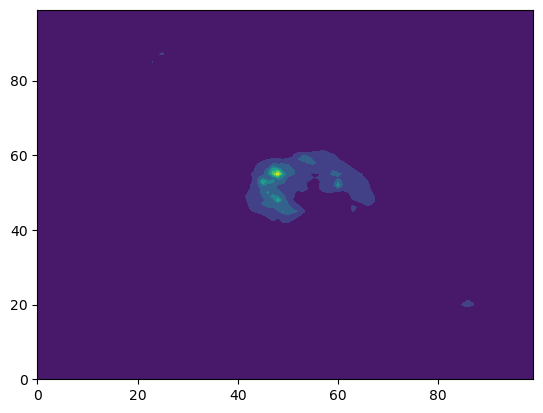

In [26]:
plt.contourf(precip_pd)

In [27]:
precip_pd

,1168,1169,1170,1171,1172,1173,1174,1175,1176,1177,...,1258,1259,1260,1261,1262,1263,1264,1265,1266,1267
1090,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1091,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1092,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1093,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1094,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1185,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1186,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1187,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1188,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [28]:
dist_from_star

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,786.960571,780.508911,774.140564,767.858398,761.664062,755.559570,749.547668,743.630005,737.809265,732.087708,...,749.547668,755.559570,761.664062,767.858398,774.140564,780.508911,786.960571,793.494202,800.107300,806.798035
1,778.246704,771.726501,765.289368,758.938171,752.674500,746.500671,740.419189,734.431946,728.541748,722.750671,...,740.419189,746.500671,752.674500,758.938171,765.289368,771.726501,778.246704,784.848511,791.529480,798.287659
2,769.594482,763.004700,756.497803,750.076355,743.742371,737.497864,731.345581,725.287537,719.326355,713.464355,...,731.345581,737.497864,743.742371,750.076355,756.497803,763.004700,769.594482,776.265503,783.015198,789.841675
3,761.006165,754.345764,747.767883,741.275208,734.869568,728.553223,722.328979,716.198792,710.165344,704.231079,...,722.328979,728.553223,734.869568,741.275208,747.767883,754.345764,761.006165,767.747253,774.566711,781.462463
4,752.483826,745.751953,739.101929,732.536865,726.058594,719.669189,713.371643,707.167847,701.060852,695.052917,...,713.371643,719.669189,726.058594,732.536865,739.101929,745.751953,752.483826,759.296143,766.186218,773.151978
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,652.379578,645.142456,637.977783,630.888611,623.877319,616.946289,610.098694,603.336914,596.664429,590.083862,...,610.098694,616.946289,623.877319,630.888611,637.977783,645.142456,652.379578,659.687378,667.062927,674.504395
96,659.853699,652.705994,645.631714,638.633972,631.714966,624.877197,618.123596,611.456726,604.879761,598.395569,...,618.123596,624.877197,631.714966,638.633972,645.631714,652.705994,659.853699,667.073059,674.361328,681.716309
97,667.428955,660.369812,653.384888,646.477417,639.649536,632.903687,626.242798,619.669373,613.186462,606.796875,...,626.242798,632.903687,639.649536,646.477417,653.384888,660.369812,667.428955,674.560791,681.762390,689.031860
98,675.101929,668.130249,661.233704,654.415405,647.677490,641.022156,634.452576,627.971008,621.580627,615.284058,...,634.452576,641.022156,647.677490,654.415405,661.233704,668.130249,675.101929,682.147095,689.262939,696.447571
